In [1]:
import torch
import torch.nn as nn
from pathlib import Path
import torchvision.transforms as transforms
import torch.optim as optim
import numpy as np
from math import *
from random import gauss,seed
import torch.nn.functional as F
import math

In [2]:
import sys 
sys.path.insert(0,'/home/mohit.kumargupta/deep_boltzmann')
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from IPython.display import SVG
from deep_boltzmann.models import ParticleDimer
md = ParticleDimer()

/home/mohit.kumargupta/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/mohit.kumargupta/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/mohit.kumargupta/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/mohit.kumargupta/.local/lib/python3.6/site-packages/ten

In [3]:
trajdict = np.load('output.npz')
import ast
#params = ast.literal_eval(str(trajdict['params']))
traj_closed_train = trajdict['traj_closed_train_hungarian']
traj_open_train = trajdict['traj_open_train_hungarian']
traj_closed_test = trajdict['traj_closed_test_hungarian']
traj_open_test = trajdict['traj_open_test_hungarian']
x = np.vstack([traj_closed_train, traj_open_train])
xval = np.vstack([traj_closed_test, traj_open_test])

In [37]:
dataSet = []
j=0
sz = 16

In [23]:
for Snapshot in train_set:
    print(j)
    x = -3.25
    box = []
    while x< 3.25:
        y = -3.25
        while(y<3.25):
            cn=0
            for  i in range(36):
                if(Snapshot[2*i+4] > x and Snapshot[2*i+4] <= x+ 3.25*2/sz and Snapshot[2*i+1 +4] > y and Snapshot[2*i +1 +4] <= y+ 3.25*2/sz ):
                    cn+=1
                    
            y+= 3.25*2/sz
            #print(cn)
            box.append(cn)
        x+=3.25*2/sz
    dataSet.append(box)
    j+=1

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

KeyboardInterrupt: 

In [38]:
number= 0
k=0
for Snapshot in train_set:
    print(number)
    number +=1
    k=0
    x = -3.25
    box = []
    t=0
    while x< 3.25:
        y = -3.25
        while(y<3.25):
            k+=1
            pointx = x + (3.25)/sz
            pointy = y + 3.25/sz
            vol = (3.25*2)/sz * (3.25*2)/sz
            sm=0
            for i in range(36):
                dist =  pow(Snapshot[2*i + 4] - pointx,2) + pow( Snapshot[2*i + 4 + 1] -pointy,2)
                sm += exp(-0.5*dist/3.06)/(2*pi*1.75 )
            dataSet.append(vol *sm )
            #print(sm*vol)
            t+= sm*vol
            y += (3.25*2)/sz
        x += (3.25*2)/sz
    print(k)
    print(t)

0
256
35.653319277888755
1
256
35.653319277888755
2
256
35.653319277888755
3
256
35.653319277888755
4
256
35.653319277888755
5
256
35.653319277888755
6
256
35.591709437243196
7
256
35.591709437243196
8
256
35.591709437243196
9
256
35.68779618548878
10
256
35.62965456407314
11
256
35.56131973670644
12
256
35.56131973670644
13
256
35.56131973670644
14
256
35.61167816383566
15
256
35.58928161076035
16
256
35.58928161076035
17
256
35.58928161076035
18
256
35.58928161076035
19
256
35.58928161076035
20
256
35.57516226931273
21
256
35.57516226931273
22
256
35.57516226931273
23
256
35.57516226931273
24
256
35.57516226931273
25
256
35.57516226931273
26
256
35.57516226931273
27
256
35.58368887268035
28
256
35.55979036945532
29
256
35.550249764737
30
256
35.57891395804211
31
256
35.57891395804211
32
256
35.57891395804211
33
256
35.57891395804211
34
256
35.57891395804211
35
256
35.57891395804211
36
256
35.57891395804211
37
256
35.57891395804211
38
256
35.57891395804211
39
256
35.57891395804211
40


256
35.68852474488877
317
256
35.68852474488877
318
256
35.68852474488877
319
256
35.68852474488877
320
256
35.68852474488877
321
256
35.68852474488877
322
256
35.68852474488877
323
256
35.68852474488877
324
256
35.68852474488877
325
256
35.6912168454804
326
256
35.6912168454804
327
256
35.6912168454804
328
256
35.6912168454804
329
256
35.6912168454804
330
256
35.650049250387724
331
256
35.62428660195942
332
256
35.6062049601503
333
256
35.6062049601503
334
256
35.6062049601503
335
256
35.6062049601503
336
256
35.57599707166372
337
256
35.57599707166372
338
256
35.57599707166372
339
256
35.57599707166372
340
256
35.57599707166372
341
256
35.57599707166372
342
256
35.60431704368146
343
256
35.585708403124784
344
256
35.585708403124784
345
256
35.585708403124784
346
256
35.56403826923412
347
256
35.580093474917085
348
256
35.56946623142559
349
256
35.56946623142559
350
256
35.510415742283925
351
256
35.510415742283925
352
256
35.510415742283925
353
256
35.510415742283925
354
256
35.51041

256
35.74655411751007
634
256
35.74655411751007
635
256
35.71686050237208
636
256
35.71686050237208
637
256
35.71686050237208
638
256
35.71686050237208
639
256
35.71686050237208
640
256
35.71686050237208
641
256
35.71750813692603
642
256
35.71750813692603
643
256
35.71750813692603
644
256
35.7250860124849
645
256
35.7250860124849
646
256
35.7250860124849
647
256
35.7250860124849
648
256
35.7250860124849
649
256
35.67969195239263
650
256
35.67969195239263
651
256
35.67969195239263
652
256
35.64474443652559
653
256
35.64474443652559
654
256
35.63756959492061
655
256
35.63756959492061
656
256
35.63756959492061
657
256
35.63756959492061
658
256
35.63756959492061
659
256
35.63756959492061
660
256
35.568773056175175
661
256
35.49797338414821
662
256
35.49797338414821
663
256
35.49762950217036
664
256
35.56207900642673
665
256
35.56207900642673
666
256
35.59486102962908
667
256
35.52714668942606
668
256
35.52714668942606
669
256
35.52714668942606
670
256
35.59318148715742
671
256
35.593181487

256
35.38457342403373
951
256
35.38457342403373
952
256
35.40108972286144
953
256
35.37525300787627
954
256
35.37525300787627
955
256
35.37525300787627
956
256
35.37525300787627
957
256
35.343892054856454
958
256
35.343892054856454
959
256
35.36417152357524
960
256
35.417826105635534
961
256
35.417826105635534
962
256
35.45734275425038
963
256
35.409993489158055
964
256
35.409993489158055
965
256
35.409993489158055
966
256
35.409993489158055
967
256
35.409993489158055
968
256
35.37649543410055
969
256
35.37649543410055
970
256
35.3580876639346
971
256
35.35406794939931
972
256
35.35406794939931
973
256
35.35406794939931
974
256
35.35406794939931
975
256
35.36290929494469
976
256
35.36290929494469
977
256
35.36290929494469
978
256
35.40245661683674
979
256
35.40245661683674
980
256
35.40245661683674
981
256
35.40245661683674
982
256
35.445885955360055
983
256
35.445885955360055
984
256
35.445885955360055
985
256
35.445885955360055
986
256
35.445885955360055
987
256
35.472472157458725
98

256
35.896397869410876
1257
256
35.896397869410876
1258
256
35.93181828658849
1259
256
35.91469879348262
1260
256
35.91469879348262
1261
256
35.83201821792719
1262
256
35.83201821792719
1263
256
35.83201821792719
1264
256
35.83201821792719
1265
256
35.855221185586814
1266
256
35.929444620773324
1267
256
35.929444620773324
1268
256
35.929444620773324
1269
256
35.929444620773324
1270
256
35.929444620773324
1271
256
35.929444620773324
1272
256
35.930921106006956
1273
256
35.930921106006956
1274
256
35.99678138431142
1275
256
35.99678138431142
1276
256
35.99678138431142
1277
256
35.99678138431142
1278
256
35.99678138431142
1279
256
35.99678138431142
1280
256
35.99678138431142
1281
256
35.99678138431142
1282
256
36.07301475306377
1283
256
36.07301475306377
1284
256
36.09430886974865
1285
256
36.09430886974865
1286
256
36.09430886974865
1287
256
36.09430886974865
1288
256
36.09430886974865
1289
256
36.09430886974865
1290
256
36.098353684929165
1291
256
36.098353684929165
1292
256
36.09835368

256
35.719486801843786
1562
256
35.719486801843786
1563
256
35.719486801843786
1564
256
35.719486801843786
1565
256
35.719486801843786
1566
256
35.691327172019506
1567
256
35.691327172019506
1568
256
35.691327172019506
1569
256
35.68723838632947
1570
256
35.66529907919706
1571
256
35.66529907919706
1572
256
35.66529907919706
1573
256
35.68889429420073
1574
256
35.68889429420073
1575
256
35.68889429420073
1576
256
35.68889429420073
1577
256
35.68889429420073
1578
256
35.58704268669707
1579
256
35.58704268669707
1580
256
35.58704268669707
1581
256
35.58704268669707
1582
256
35.58704268669707
1583
256
35.67836782859943
1584
256
35.67836782859943
1585
256
35.62395089624235
1586
256
35.62395089624235
1587
256
35.62395089624235
1588
256
35.62395089624235
1589
256
35.62395089624235
1590
256
35.62395089624235
1591
256
35.62395089624235
1592
256
35.71858364825883
1593
256
35.71858364825883
1594
256
35.71743191879021
1595
256
35.71743191879021
1596
256
35.700720075964774
1597
256
35.700720075964

256
36.05826171641687
1870
256
36.057108100445404
1871
256
36.057108100445404
1872
256
36.057108100445404
1873
256
36.057108100445404
1874
256
36.057108100445404
1875
256
35.97915680159722
1876
256
35.97915680159722
1877
256
35.97915680159722
1878
256
35.97915680159722
1879
256
35.991151022520704
1880
256
35.991151022520704
1881
256
35.991151022520704
1882
256
35.991151022520704
1883
256
35.991151022520704
1884
256
35.991151022520704
1885
256
35.991151022520704
1886
256
35.991151022520704
1887
256
35.936165800179275
1888
256
36.020281224466295
1889
256
36.020281224466295
1890
256
36.020281224466295
1891
256
35.96114663612437
1892
256
35.93780690739919
1893
256
35.93780690739919
1894
256
35.859224097418405
1895
256
35.859224097418405
1896
256
35.893768399239306
1897
256
35.893768399239306
1898
256
35.88137059348764
1899
256
35.88137059348764
1900
256
35.88137059348764
1901
256
35.88137059348764
1902
256
35.88137059348764
1903
256
35.88137059348764
1904
256
35.88137059348764
1905
256
35.

256
35.77737212782737
2178
256
35.77737212782737
2179
256
35.75797386443477
2180
256
35.70716258385305
2181
256
35.70716258385305
2182
256
35.70716258385305
2183
256
35.70716258385305
2184
256
35.699663625055514
2185
256
35.699663625055514
2186
256
35.68709108016629
2187
256
35.68709108016629
2188
256
35.68709108016629
2189
256
35.68709108016629
2190
256
35.68709108016629
2191
256
35.68709108016629
2192
256
35.67558061928939
2193
256
35.610861659127835
2194
256
35.59091473178228
2195
256
35.614049373272245
2196
256
35.690133886650365
2197
256
35.690133886650365
2198
256
35.690133886650365
2199
256
35.690133886650365
2200
256
35.690133886650365
2201
256
35.690133886650365
2202
256
35.690133886650365
2203
256
35.690133886650365
2204
256
35.690133886650365
2205
256
35.7703314888388
2206
256
35.7703314888388
2207
256
35.7703314888388
2208
256
35.763387665893255
2209
256
35.763387665893255
2210
256
35.763387665893255
2211
256
35.82960502445496
2212
256
35.80086260301471
2213
256
35.80086260

256
35.43444152105018
2481
256
35.43444152105018
2482
256
35.43444152105018
2483
256
35.39912896524945
2484
256
35.39912896524945
2485
256
35.39912896524945
2486
256
35.39912896524945
2487
256
35.39912896524945
2488
256
35.39912896524945
2489
256
35.39912896524945
2490
256
35.39912896524945
2491
256
35.39912896524945
2492
256
35.39912896524945
2493
256
35.43402340139503
2494
256
35.43402340139503
2495
256
35.43402340139503
2496
256
35.43402340139503
2497
256
35.43402340139503
2498
256
35.43402340139503
2499
256
35.42138240239738
2500
256
35.47118499565097
2501
256
35.512455292248816
2502
256
35.512455292248816
2503
256
35.512455292248816
2504
256
35.512455292248816
2505
256
35.50238513555598
2506
256
35.50238513555598
2507
256
35.50238513555598
2508
256
35.50238513555598
2509
256
35.50238513555598
2510
256
35.50238513555598
2511
256
35.50238513555598
2512
256
35.50238513555598
2513
256
35.528617551938176
2514
256
35.480993937031734
2515
256
35.42070469555135
2516
256
35.42070469555135


256
35.734844656059295
2783
256
35.734844656059295
2784
256
35.734844656059295
2785
256
35.748112755849476
2786
256
35.748112755849476
2787
256
35.75953124789295
2788
256
35.75953124789295
2789
256
35.75953124789295
2790
256
35.7793143806754
2791
256
35.72681427390387
2792
256
35.72149801096234
2793
256
35.68051731475379
2794
256
35.68051731475379
2795
256
35.68051731475379
2796
256
35.68051731475379
2797
256
35.68051731475379
2798
256
35.63687401197926
2799
256
35.63687401197926
2800
256
35.63687401197926
2801
256
35.64681681566826
2802
256
35.68418266473665
2803
256
35.68418266473665
2804
256
35.68418266473665
2805
256
35.68418266473665
2806
256
35.70326003571563
2807
256
35.73928642913311
2808
256
35.73928642913311
2809
256
35.73928642913311
2810
256
35.73928642913311
2811
256
35.73928642913311
2812
256
35.73928642913311
2813
256
35.73928642913311
2814
256
35.76275832233168
2815
256
35.805908045811805
2816
256
35.805908045811805
2817
256
35.813780800444526
2818
256
35.81378080044452

256
35.80076206865436
3087
256
35.80076206865436
3088
256
35.80076206865436
3089
256
35.80076206865436
3090
256
35.80076206865436
3091
256
35.80076206865436
3092
256
35.80076206865436
3093
256
35.80076206865436
3094
256
35.817733002105705
3095
256
35.817733002105705
3096
256
35.817733002105705
3097
256
35.817733002105705
3098
256
35.817733002105705
3099
256
35.83620989279213
3100
256
35.83620989279213
3101
256
35.83620989279213
3102
256
35.81284130531753
3103
256
35.81284130531753
3104
256
35.81284130531753
3105
256
35.84789411219043
3106
256
35.84789411219043
3107
256
35.84789411219043
3108
256
35.860855200546055
3109
256
35.860855200546055
3110
256
35.860855200546055
3111
256
35.860855200546055
3112
256
35.860855200546055
3113
256
35.860855200546055
3114
256
35.860855200546055
3115
256
35.860855200546055
3116
256
35.860855200546055
3117
256
35.826314707926024
3118
256
35.826314707926024
3119
256
35.826314707926024
3120
256
35.826314707926024
3121
256
35.865018435293585
3122
256
35.86

256
35.760273054658526
3391
256
35.800540556170645
3392
256
35.850950248845706
3393
256
35.827544540068374
3394
256
35.827544540068374
3395
256
35.827544540068374
3396
256
35.827544540068374
3397
256
35.83196766789615
3398
256
35.83196766789615
3399
256
35.83196766789615
3400
256
35.83196766789615
3401
256
35.83196766789615
3402
256
35.81728943511458
3403
256
35.81728943511458
3404
256
35.81728943511458
3405
256
35.739581799246885
3406
256
35.739581799246885
3407
256
35.739581799246885
3408
256
35.739581799246885
3409
256
35.7844969420306
3410
256
35.7844969420306
3411
256
35.7844969420306
3412
256
35.7844969420306
3413
256
35.7844969420306
3414
256
35.74917888140001
3415
256
35.74917888140001
3416
256
35.75622969966719
3417
256
35.75622969966719
3418
256
35.75622969966719
3419
256
35.7144917607204
3420
256
35.7144917607204
3421
256
35.694789266687195
3422
256
35.694789266687195
3423
256
35.694789266687195
3424
256
35.694789266687195
3425
256
35.66925363815468
3426
256
35.6692536381546

256
35.96102162729919
3692
256
35.96102162729919
3693
256
35.96102162729919
3694
256
35.96102162729919
3695
256
36.02468971917513
3696
256
36.00545086952973
3697
256
36.00545086952973
3698
256
36.00545086952973
3699
256
36.00545086952973
3700
256
36.00545086952973
3701
256
36.00545086952973
3702
256
36.00545086952973
3703
256
36.00545086952973
3704
256
36.00545086952973
3705
256
36.00545086952973
3706
256
36.00545086952973
3707
256
36.00545086952973
3708
256
36.00545086952973
3709
256
36.00545086952973
3710
256
36.00545086952973
3711
256
35.99374342989804
3712
256
35.957647214769175
3713
256
35.957647214769175
3714
256
35.957647214769175
3715
256
35.93855109291921
3716
256
35.93855109291921
3717
256
35.93855109291921
3718
256
35.93855109291921
3719
256
35.891847566307504
3720
256
35.891847566307504
3721
256
35.894527120942044
3722
256
35.894527120942044
3723
256
35.894527120942044
3724
256
35.89652348135848
3725
256
35.89652348135848
3726
256
35.859755087631584
3727
256
35.859755087631

256
35.95675661077787
3994
256
35.95675661077787
3995
256
35.95675661077787
3996
256
35.95675661077787
3997
256
35.95675661077787
3998
256
35.95675661077787
3999
256
35.95675661077787
4000
256
35.95675661077787
4001
256
35.95675661077787
4002
256
35.9060165650984
4003
256
35.9060165650984
4004
256
35.9060165650984
4005
256
35.9060165650984
4006
256
35.9060165650984
4007
256
35.96752723897303
4008
256
35.974983102183494
4009
256
35.974983102183494
4010
256
35.974983102183494
4011
256
35.974983102183494
4012
256
35.974983102183494
4013
256
35.974983102183494
4014
256
35.987769687719656
4015
256
35.987769687719656
4016
256
35.987769687719656
4017
256
35.987769687719656
4018
256
35.987769687719656
4019
256
35.987769687719656
4020
256
36.02838260152586
4021
256
36.0272138929898
4022
256
36.0272138929898
4023
256
36.0272138929898
4024
256
36.05851169416463
4025
256
36.05851169416463
4026
256
36.05648873957936
4027
256
36.05648873957936
4028
256
36.05648873957936
4029
256
36.06351098721765
40

256
36.24577805616264
4298
256
36.29549734751616
4299
256
36.29549734751616
4300
256
36.29549734751616
4301
256
36.29549734751616
4302
256
36.29549734751616
4303
256
36.29549734751616
4304
256
36.29549734751616
4305
256
36.29549734751616
4306
256
36.28517782281691
4307
256
36.28517782281691
4308
256
36.28517782281691
4309
256
36.28517782281691
4310
256
36.28517782281691
4311
256
36.28517782281691
4312
256
36.28517782281691
4313
256
36.28517782281691
4314
256
36.28517782281691
4315
256
36.275772395477844
4316
256
36.275772395477844
4317
256
36.275772395477844
4318
256
36.275772395477844
4319
256
36.275772395477844
4320
256
36.275772395477844
4321
256
36.275772395477844
4322
256
36.25450735807345
4323
256
36.25450735807345
4324
256
36.16458667343316
4325
256
36.177237521723534
4326
256
36.202999014126625
4327
256
36.202999014126625
4328
256
36.202999014126625
4329
256
36.23205486127647
4330
256
36.23205486127647
4331
256
36.23205486127647
4332
256
36.23205486127647
4333
256
36.2320548612

256
36.242569666573914
4599
256
36.242569666573914
4600
256
36.242569666573914
4601
256
36.242569666573914
4602
256
36.242569666573914
4603
256
36.20099257734415
4604
256
36.12921829497902
4605
256
36.12921829497902
4606
256
36.12921829497902
4607
256
36.12921829497902
4608
256
36.12921829497902
4609
256
36.12921829497902
4610
256
36.17094734157905
4611
256
36.17094734157905
4612
256
36.17094734157905
4613
256
36.17094734157905
4614
256
36.170470939928464
4615
256
36.170470939928464
4616
256
36.1536371559134
4617
256
36.14850903027963
4618
256
36.14850903027963
4619
256
36.14850903027963
4620
256
36.14850903027963
4621
256
36.13418632083273
4622
256
36.13418632083273
4623
256
36.13418632083273
4624
256
36.13418632083273
4625
256
36.13418632083273
4626
256
36.13418632083273
4627
256
36.13418632083273
4628
256
36.13418632083273
4629
256
36.13418632083273
4630
256
36.11322103871697
4631
256
36.11322103871697
4632
256
36.11322103871697
4633
256
36.11322103871697
4634
256
36.11322103871697


256
36.288834974318014
4906
256
36.288834974318014
4907
256
36.24980636353145
4908
256
36.24980636353145
4909
256
36.25861880213787
4910
256
36.25861880213787
4911
256
36.26006041916121
4912
256
36.26006041916121
4913
256
36.34794579581269
4914
256
36.34794579581269
4915
256
36.337299933209074
4916
256
36.337299933209074
4917
256
36.337299933209074
4918
256
36.337299933209074
4919
256
36.337299933209074
4920
256
36.34358488640644
4921
256
36.34358488640644
4922
256
36.34358488640644
4923
256
36.34358488640644
4924
256
36.34358488640644
4925
256
36.34358488640644
4926
256
36.34358488640644
4927
256
36.34358488640644
4928
256
36.28636575366531
4929
256
36.28636575366531
4930
256
36.25171989607414
4931
256
36.25171989607414
4932
256
36.25171989607414
4933
256
36.24908145500431
4934
256
36.24908145500431
4935
256
36.24908145500431
4936
256
36.22290865846113
4937
256
36.23512094098965
4938
256
36.23512094098965
4939
256
36.23512094098965
4940
256
36.23512094098965
4941
256
36.23512094098965

256
36.3675511518393
5211
256
36.3675511518393
5212
256
36.3675511518393
5213
256
36.3675511518393
5214
256
36.3675511518393
5215
256
36.3675511518393
5216
256
36.3675511518393
5217
256
36.3675511518393
5218
256
36.387251518309505
5219
256
36.387251518309505
5220
256
36.387251518309505
5221
256
36.40810595297333
5222
256
36.40810595297333
5223
256
36.41332785878712
5224
256
36.41332785878712
5225
256
36.41332785878712
5226
256
36.41332785878712
5227
256
36.443223718169946
5228
256
36.443223718169946
5229
256
36.443223718169946
5230
256
36.443223718169946
5231
256
36.443223718169946
5232
256
36.443223718169946
5233
256
36.443223718169946
5234
256
36.443223718169946
5235
256
36.423680161346894
5236
256
36.423680161346894
5237
256
36.423680161346894
5238
256
36.423680161346894
5239
256
36.423680161346894
5240
256
36.383713293671974
5241
256
36.383713293671974
5242
256
36.383713293671974
5243
256
36.383713293671974
5244
256
36.383713293671974
5245
256
36.39697313513246
5246
256
36.39697313

256
36.11377299900123
5518
256
36.08075948112533
5519
256
36.08075948112533
5520
256
36.08075948112533
5521
256
36.08075948112533
5522
256
36.03416965721016
5523
256
36.03416965721016
5524
256
36.03416965721016
5525
256
36.03416965721016
5526
256
36.03416965721016
5527
256
36.08586673958354
5528
256
36.08586673958354
5529
256
36.08586673958354
5530
256
36.08586673958354
5531
256
36.088573260811195
5532
256
36.088573260811195
5533
256
36.088573260811195
5534
256
36.088573260811195
5535
256
36.088573260811195
5536
256
36.088573260811195
5537
256
36.043123834691
5538
256
36.043123834691
5539
256
36.031348782364205
5540
256
36.031348782364205
5541
256
36.031348782364205
5542
256
35.966057895361
5543
256
35.966057895361
5544
256
35.966057895361
5545
256
35.966057895361
5546
256
35.966057895361
5547
256
35.94425678344086
5548
256
35.94425678344086
5549
256
35.938992127546555
5550
256
35.938992127546555
5551
256
35.94378324922603
5552
256
35.94378324922603
5553
256
35.94378324922603
5554
256


256
36.35716651668565
5822
256
36.35716651668565
5823
256
36.35716651668565
5824
256
36.35716651668565
5825
256
36.35716651668565
5826
256
36.35716651668565
5827
256
36.38034722396825
5828
256
36.38034722396825
5829
256
36.38034722396825
5830
256
36.355434892961334
5831
256
36.34765313656214
5832
256
36.34765313656214
5833
256
36.25621776397132
5834
256
36.25621776397132
5835
256
36.25621776397132
5836
256
36.25621776397132
5837
256
36.25621776397132
5838
256
36.25621776397132
5839
256
36.25621776397132
5840
256
36.25621776397132
5841
256
36.25621776397132
5842
256
36.25621776397132
5843
256
36.25621776397132
5844
256
36.25621776397132
5845
256
36.25621776397132
5846
256
36.25621776397132
5847
256
36.25621776397132
5848
256
36.25621776397132
5849
256
36.25621776397132
5850
256
36.25621776397132
5851
256
36.25621776397132
5852
256
36.210220845198094
5853
256
36.24590402866477
5854
256
36.286557830339156
5855
256
36.252647031475746
5856
256
36.311416073303945
5857
256
36.311416073303945


256
35.93330749480463
6124
256
35.94570560631602
6125
256
35.94570560631602
6126
256
35.93031321527397
6127
256
35.93031321527397
6128
256
35.93031321527397
6129
256
35.93031321527397
6130
256
35.93031321527397
6131
256
35.90491455578498
6132
256
35.918360339677676
6133
256
35.918360339677676
6134
256
35.918360339677676
6135
256
35.918360339677676
6136
256
35.92032465169632
6137
256
35.92032465169632
6138
256
35.92032465169632
6139
256
35.89885023664869
6140
256
35.85433936202201
6141
256
35.86045142705037
6142
256
35.86045142705037
6143
256
35.86045142705037
6144
256
35.871140212047024
6145
256
35.85310640723524
6146
256
35.85310640723524
6147
256
35.853130928967644
6148
256
35.853130928967644
6149
256
35.853130928967644
6150
256
35.81258544631126
6151
256
35.81258544631126
6152
256
35.81258544631126
6153
256
35.80025024365775
6154
256
35.80025024365775
6155
256
35.80025024365775
6156
256
35.80025024365775
6157
256
35.82908550583506
6158
256
35.82695143535031
6159
256
35.8269514353503

256
35.88651360389353
6427
256
35.88651360389353
6428
256
35.87876259797911
6429
256
35.87876259797911
6430
256
35.87876259797911
6431
256
35.87876259797911
6432
256
35.87876259797911
6433
256
35.873194983979026
6434
256
35.84666916425625
6435
256
35.84666916425625
6436
256
35.84666916425625
6437
256
35.84666916425625
6438
256
35.849549618516775
6439
256
35.849549618516775
6440
256
35.870588039028014
6441
256
35.870588039028014
6442
256
35.870588039028014
6443
256
35.82156432167379
6444
256
35.82156432167379
6445
256
35.82156432167379
6446
256
35.773788053333156
6447
256
35.736971886372416
6448
256
35.736971886372416
6449
256
35.752898964400934
6450
256
35.752898964400934
6451
256
35.72126306755247
6452
256
35.72126306755247
6453
256
35.757617147478015
6454
256
35.757617147478015
6455
256
35.7505163706753
6456
256
35.7505163706753
6457
256
35.7505163706753
6458
256
35.7505163706753
6459
256
35.7505163706753
6460
256
35.7505163706753
6461
256
35.7505163706753
6462
256
35.77864352259857


256
35.91851419576612
6730
256
35.87108155241303
6731
256
35.905184303173804
6732
256
35.905184303173804
6733
256
35.95119176327023
6734
256
35.95119176327023
6735
256
35.95119176327023
6736
256
35.94665425921022
6737
256
35.94665425921022
6738
256
35.94665425921022
6739
256
35.878050276086306
6740
256
35.878050276086306
6741
256
35.878050276086306
6742
256
35.878050276086306
6743
256
35.878050276086306
6744
256
35.8887573062561
6745
256
35.913049756834994
6746
256
35.913049756834994
6747
256
35.913049756834994
6748
256
35.913049756834994
6749
256
35.913049756834994
6750
256
35.913049756834994
6751
256
35.913049756834994
6752
256
35.94493481500862
6753
256
35.94493481500862
6754
256
35.94493481500862
6755
256
35.94493481500862
6756
256
35.94493481500862
6757
256
35.93472759059103
6758
256
35.92226691281723
6759
256
35.930577482017576
6760
256
35.930577482017576
6761
256
35.91467700748052
6762
256
36.01231983589426
6763
256
36.01231983589426
6764
256
36.01231983589426
6765
256
36.012319

256
36.191911654100835
7033
256
36.19870779630954
7034
256
36.19870779630954
7035
256
36.19870779630954
7036
256
36.14789053643754
7037
256
36.11960838281485
7038
256
36.12810713004243
7039
256
36.12810713004243
7040
256
36.192012670736005
7041
256
36.192012670736005
7042
256
36.180667367095175
7043
256
36.180667367095175
7044
256
36.1843246821367
7045
256
36.1843246821367
7046
256
36.1843246821367
7047
256
36.1843246821367
7048
256
36.11210096639971
7049
256
36.11210096639971
7050
256
36.12295760362115
7051
256
36.12295760362115
7052
256
36.11797206087284
7053
256
36.11797206087284
7054
256
36.122668701257695
7055
256
36.122668701257695
7056
256
36.122668701257695
7057
256
36.07519778831428
7058
256
36.14160141886526
7059
256
36.14160141886526
7060
256
36.14160141886526
7061
256
36.14160141886526
7062
256
36.14160141886526
7063
256
36.14160141886526
7064
256
36.15083403854209
7065
256
36.15083403854209
7066
256
36.12348568530648
7067
256
36.13575312924924
7068
256
36.172578607991895
7

256
36.14828292137921
7335
256
36.14828292137921
7336
256
36.14828292137921
7337
256
36.13521177912985
7338
256
36.13521177912985
7339
256
36.13521177912985
7340
256
36.13332188342027
7341
256
36.13332188342027
7342
256
36.13332188342027
7343
256
36.13332188342027
7344
256
36.13332188342027
7345
256
36.13332188342027
7346
256
36.13332188342027
7347
256
36.13332188342027
7348
256
36.13332188342027
7349
256
36.13332188342027
7350
256
36.13332188342027
7351
256
36.05920493316665
7352
256
36.05920493316665
7353
256
36.05920493316665
7354
256
36.05920493316665
7355
256
36.05920493316665
7356
256
36.02458382639841
7357
256
36.03025987141013
7358
256
36.055686842298066
7359
256
36.088079082233406
7360
256
36.088079082233406
7361
256
36.088079082233406
7362
256
36.00909886880121
7363
256
36.00909886880121
7364
256
36.00909886880121
7365
256
36.00909886880121
7366
256
36.00909886880121
7367
256
36.0414421425661
7368
256
36.0414421425661
7369
256
36.0414421425661
7370
256
36.052049987355524
7371

256
36.11041905202558
7639
256
36.11041905202558
7640
256
36.11041905202558
7641
256
36.05012006425089
7642
256
36.05012006425089
7643
256
36.07721957383227
7644
256
36.07721957383227
7645
256
36.117575044498764
7646
256
36.117575044498764
7647
256
36.117575044498764
7648
256
36.117575044498764
7649
256
36.117575044498764
7650
256
36.117575044498764
7651
256
36.117575044498764
7652
256
36.0810255345155
7653
256
36.0810255345155
7654
256
36.11294338369051
7655
256
36.031896048041574
7656
256
36.0311288596615
7657
256
36.0311288596615
7658
256
36.008106690797575
7659
256
36.008106690797575
7660
256
36.008106690797575
7661
256
36.008106690797575
7662
256
36.008106690797575
7663
256
36.008106690797575
7664
256
35.97533385279177
7665
256
35.908337048738794
7666
256
35.908337048738794
7667
256
35.908337048738794
7668
256
35.957360364291894
7669
256
35.957360364291894
7670
256
35.957360364291894
7671
256
35.957360364291894
7672
256
35.9685439320047
7673
256
35.94187004182143
7674
256
35.94187

256
36.04119221145077
7943
256
36.051668707615555
7944
256
36.051668707615555
7945
256
36.051668707615555
7946
256
36.051668707615555
7947
256
35.98943732760306
7948
256
35.98943732760306
7949
256
35.99593074125363
7950
256
35.99593074125363
7951
256
35.99593074125363
7952
256
35.99593074125363
7953
256
36.012899723196675
7954
256
36.012899723196675
7955
256
36.034758213680576
7956
256
36.028513637611596
7957
256
36.028513637611596
7958
256
36.028513637611596
7959
256
36.02557207988073
7960
256
36.02557207988073
7961
256
35.99221298387628
7962
256
35.99221298387628
7963
256
35.99221298387628
7964
256
35.950530663635256
7965
256
35.98692388772729
7966
256
35.96055662282116
7967
256
35.96055662282116
7968
256
35.96284636621863
7969
256
35.96284636621863
7970
256
35.96284636621863
7971
256
35.96284636621863
7972
256
36.01017004408486
7973
256
36.01017004408486
7974
256
36.01017004408486
7975
256
36.01017004408486
7976
256
36.01017004408486
7977
256
36.01017004408486
7978
256
36.0101700440

256
36.158213017513944
8245
256
36.158213017513944
8246
256
36.158213017513944
8247
256
36.158213017513944
8248
256
36.158213017513944
8249
256
36.158213017513944
8250
256
36.158213017513944
8251
256
36.14335363950972
8252
256
36.14335363950972
8253
256
36.14335363950972
8254
256
36.14335363950972
8255
256
36.14335363950972
8256
256
36.13333331225465
8257
256
36.13333331225465
8258
256
36.13333331225465
8259
256
36.13333331225465
8260
256
36.13333331225465
8261
256
36.149298719041454
8262
256
36.149298719041454
8263
256
36.149298719041454
8264
256
36.149298719041454
8265
256
36.149298719041454
8266
256
36.149298719041454
8267
256
36.149298719041454
8268
256
36.149298719041454
8269
256
36.149298719041454
8270
256
36.149298719041454
8271
256
36.149298719041454
8272
256
36.084112954549624
8273
256
36.134587213163975
8274
256
36.125999612738916
8275
256
36.09309011869705
8276
256
36.09309011869705
8277
256
36.09309011869705
8278
256
36.097058769691856
8279
256
36.097058769691856
8280
256
3

256
35.83845753619136
8551
256
35.83845753619136
8552
256
35.83845753619136
8553
256
35.82403369800215
8554
256
35.81620518593679
8555
256
35.81620518593679
8556
256
35.81620518593679
8557
256
35.81620518593679
8558
256
35.81620518593679
8559
256
35.80913249686168
8560
256
35.77860593287847
8561
256
35.77860593287847
8562
256
35.77860593287847
8563
256
35.77860593287847
8564
256
35.73611201283275
8565
256
35.724885646851156
8566
256
35.724885646851156
8567
256
35.724885646851156
8568
256
35.724885646851156
8569
256
35.724885646851156
8570
256
35.760535091034065
8571
256
35.76345399950351
8572
256
35.76345399950351
8573
256
35.756691501484866
8574
256
35.75891486586646
8575
256
35.75891486586646
8576
256
35.75891486586646
8577
256
35.81498645865952
8578
256
35.849388721581526
8579
256
35.849388721581526
8580
256
35.849388721581526
8581
256
35.79433882728236
8582
256
35.85106546852901
8583
256
35.85106546852901
8584
256
35.85253431940355
8585
256
35.85253431940355
8586
256
35.85253431940

256
35.8968100106315
8854
256
35.8968100106315
8855
256
35.8968100106315
8856
256
35.8968100106315
8857
256
35.91742501458149
8858
256
35.91742501458149
8859
256
35.91742501458149
8860
256
35.91742501458149
8861
256
35.91742501458149
8862
256
35.90762530912673
8863
256
35.90762530912673
8864
256
35.8737862978904
8865
256
35.8737862978904
8866
256
35.8737862978904
8867
256
35.8737862978904
8868
256
35.865745915952274
8869
256
35.865745915952274
8870
256
35.865745915952274
8871
256
35.865745915952274
8872
256
35.865745915952274
8873
256
35.925360879847894
8874
256
35.925360879847894
8875
256
35.925360879847894
8876
256
35.925360879847894
8877
256
35.925360879847894
8878
256
35.925360879847894
8879
256
35.90422654921193
8880
256
35.90422654921193
8881
256
35.99146511882307
8882
256
36.06874136604342
8883
256
36.090248802343574
8884
256
36.090248802343574
8885
256
36.090248802343574
8886
256
36.090248802343574
8887
256
36.090248802343574
8888
256
36.090248802343574
8889
256
36.090248802343

256
36.06689011474824
9160
256
36.06689011474824
9161
256
36.12973108671955
9162
256
36.12973108671955
9163
256
36.12973108671955
9164
256
36.12973108671955
9165
256
36.12691755210817
9166
256
36.12691755210817
9167
256
36.12691755210817
9168
256
36.12691755210817
9169
256
36.082783641040955
9170
256
36.082783641040955
9171
256
36.11795906036348
9172
256
36.04732571380661
9173
256
36.07817658407674
9174
256
36.07817658407674
9175
256
36.07817658407674
9176
256
36.07817658407674
9177
256
36.09733151132279
9178
256
36.12314145574764
9179
256
36.12314145574764
9180
256
36.12314145574764
9181
256
36.12314145574764
9182
256
36.12314145574764
9183
256
36.12314145574764
9184
256
36.170987722394436
9185
256
36.170987722394436
9186
256
36.170987722394436
9187
256
36.19166727836456
9188
256
36.19166727836456
9189
256
36.19166727836456
9190
256
36.19166727836456
9191
256
36.22599896042774
9192
256
36.22599896042774
9193
256
36.26971788344551
9194
256
36.26971788344551
9195
256
36.26971788344551
9

256
35.90531065466188
9463
256
35.90531065466188
9464
256
35.94605566110983
9465
256
36.0096697980216
9466
256
36.0096697980216
9467
256
36.0096697980216
9468
256
36.0096697980216
9469
256
36.0096697980216
9470
256
35.985458738527164
9471
256
35.985458738527164
9472
256
35.985458738527164
9473
256
35.985458738527164
9474
256
35.985458738527164
9475
256
35.985458738527164
9476
256
35.985458738527164
9477
256
35.969329397785565
9478
256
35.96397308658987
9479
256
35.94904707112812
9480
256
35.94904707112812
9481
256
35.95938585869638
9482
256
35.96802395011691
9483
256
35.96802395011691
9484
256
35.969811663055374
9485
256
35.969811663055374
9486
256
35.969811663055374
9487
256
35.969811663055374
9488
256
35.980942246192924
9489
256
35.980942246192924
9490
256
35.94000482097035
9491
256
35.94000482097035
9492
256
35.94000482097035
9493
256
35.94000482097035
9494
256
35.941293905634005
9495
256
35.93818313557269
9496
256
35.93818313557269
9497
256
35.96439098520664
9498
256
35.96439098520

256
36.10543155045035
9768
256
36.10543155045035
9769
256
36.15436692476883
9770
256
36.15436692476883
9771
256
36.15436692476883
9772
256
36.15436692476883
9773
256
36.15436692476883
9774
256
36.15436692476883
9775
256
36.082347437826066
9776
256
36.061801716169875
9777
256
36.061801716169875
9778
256
36.061801716169875
9779
256
36.061801716169875
9780
256
36.061801716169875
9781
256
36.07006341576444
9782
256
36.07006341576444
9783
256
36.07006341576444
9784
256
36.07006341576444
9785
256
36.07006341576444
9786
256
36.07006341576444
9787
256
36.07006341576444
9788
256
36.07006341576444
9789
256
36.07006341576444
9790
256
36.030369940656506
9791
256
36.01180293971171
9792
256
36.01180293971171
9793
256
36.01180293971171
9794
256
36.01180293971171
9795
256
36.01180293971171
9796
256
36.01180293971171
9797
256
36.02122090203549
9798
256
36.02122090203549
9799
256
36.009525462663206
9800
256
36.009525462663206
9801
256
35.973691067372
9802
256
35.973691067372
9803
256
35.973691067372
980

256
36.3306928301579
10068
256
36.351855336445624
10069
256
36.29920920920245
10070
256
36.283081014689024
10071
256
36.227690852655115
10072
256
36.227690852655115
10073
256
36.227690852655115
10074
256
36.227690852655115
10075
256
36.227690852655115
10076
256
36.26566229803665
10077
256
36.204500077000624
10078
256
36.204500077000624
10079
256
36.204500077000624
10080
256
36.1941535707
10081
256
36.1941535707
10082
256
36.18286824615028
10083
256
36.18286824615028
10084
256
36.18286824615028
10085
256
36.21151049292929
10086
256
36.21151049292929
10087
256
36.22167980069548
10088
256
36.22167980069548
10089
256
36.23947537727109
10090
256
36.23947537727109
10091
256
36.23133955947403
10092
256
36.23133955947403
10093
256
36.23133955947403
10094
256
36.23133955947403
10095
256
36.316657091972836
10096
256
36.318570633499824
10097
256
36.318570633499824
10098
256
36.318570633499824
10099
256
36.318570633499824
10100
256
36.318570633499824
10101
256
36.318570633499824
10102
256
36.31857

256
36.17021455922514
10359
256
36.17021455922514
10360
256
36.1769540080231
10361
256
36.1769540080231
10362
256
36.1769540080231
10363
256
36.20958991530612
10364
256
36.25781110078121
10365
256
36.16649389288476
10366
256
36.1927691834221
10367
256
36.12013082832501
10368
256
36.12013082832501
10369
256
36.12013082832501
10370
256
36.12013082832501
10371
256
36.0581398300319
10372
256
36.0581398300319
10373
256
36.0581398300319
10374
256
36.0581398300319
10375
256
36.0581398300319
10376
256
36.08267869723655
10377
256
36.08267869723655
10378
256
36.08267869723655
10379
256
36.056177995237086
10380
256
36.056177995237086
10381
256
36.073864597844164
10382
256
36.073864597844164
10383
256
36.008832115274025
10384
256
35.9978652995511
10385
256
35.9978652995511
10386
256
35.9978652995511
10387
256
35.9978652995511
10388
256
36.05501636797211
10389
256
36.05501636797211
10390
256
36.06692274920808
10391
256
36.06692274920808
10392
256
36.05836988309484
10393
256
36.05836988309484
10394


256
36.39834178059098
10653
256
36.39834178059098
10654
256
36.39834178059098
10655
256
36.39834178059098
10656
256
36.39834178059098
10657
256
36.39834178059098
10658
256
36.39834178059098
10659
256
36.39834178059098
10660
256
36.431193668818544
10661
256
36.431193668818544
10662
256
36.431193668818544
10663
256
36.431193668818544
10664
256
36.431193668818544
10665
256
36.431193668818544
10666
256
36.431193668818544
10667
256
36.431193668818544
10668
256
36.381947799686486
10669
256
36.381947799686486
10670
256
36.439884429397196
10671
256
36.461411896829645
10672
256
36.41185995421979
10673
256
36.414440684496306
10674
256
36.414440684496306
10675
256
36.4750158066694
10676
256
36.4750158066694
10677
256
36.4750158066694
10678
256
36.4750158066694
10679
256
36.48353889785179
10680
256
36.48353889785179
10681
256
36.48353889785179
10682
256
36.48353889785179
10683
256
36.48353889785179
10684
256
36.4635072370139
10685
256
36.4635072370139
10686
256
36.4635072370139
10687
256
36.463507

256
36.111007428824216
10949
256
36.111007428824216
10950
256
36.1097112304567
10951
256
36.1097112304567
10952
256
36.1097112304567
10953
256
36.1097112304567
10954
256
36.07846004305945
10955
256
36.07846004305945
10956
256
36.07846004305945
10957
256
36.07846004305945
10958
256
36.07846004305945
10959
256
36.07846004305945
10960
256
36.08283159017917
10961
256
36.08763748597353
10962
256
36.08801846804869
10963
256
36.08801846804869
10964
256
36.08801846804869
10965
256
36.08825214026817
10966
256
36.08825214026817
10967
256
36.09298594997893
10968
256
36.09298594997893
10969
256
36.09788283631591
10970
256
36.09788283631591
10971
256
36.09788283631591
10972
256
36.04653013388813
10973
256
36.04934297958946
10974
256
36.04934297958946
10975
256
36.04934297958946
10976
256
36.04934297958946
10977
256
36.04934297958946
10978
256
36.04934297958946
10979
256
35.97526280094092
10980
256
36.036602283644676
10981
256
36.036602283644676
10982
256
36.036602283644676
10983
256
36.036602283644

256
35.854471798455464
11243
256
35.854471798455464
11244
256
35.854471798455464
11245
256
35.854471798455464
11246
256
35.854471798455464
11247
256
35.854471798455464
11248
256
35.854471798455464
11249
256
35.854471798455464
11250
256
35.854471798455464
11251
256
35.84484115209655
11252
256
35.92601547474497
11253
256
35.94586837227147
11254
256
35.94586837227147
11255
256
35.94586837227147
11256
256
35.94586837227147
11257
256
35.94586837227147
11258
256
35.94586837227147
11259
256
35.94586837227147
11260
256
35.94586837227147
11261
256
35.94586837227147
11262
256
35.94586837227147
11263
256
35.971300975054774
11264
256
35.971300975054774
11265
256
35.971300975054774
11266
256
35.971300975054774
11267
256
35.9439292479079
11268
256
35.9439292479079
11269
256
35.9439292479079
11270
256
35.9439292479079
11271
256
35.9439292479079
11272
256
35.9439292479079
11273
256
35.9439292479079
11274
256
35.9439292479079
11275
256
35.9439292479079
11276
256
35.9439292479079
11277
256
35.9537075851

256
35.97511405058297
11537
256
36.00872900177349
11538
256
36.00872900177349
11539
256
36.00872900177349
11540
256
36.00872900177349
11541
256
36.01926666983104
11542
256
36.062339219798226
11543
256
36.062339219798226
11544
256
36.062339219798226
11545
256
36.062339219798226
11546
256
36.062339219798226
11547
256
36.062339219798226
11548
256
36.045542095400656
11549
256
36.045542095400656
11550
256
36.079375583633045
11551
256
36.079375583633045
11552
256
36.113894378416525
11553
256
36.113894378416525
11554
256
36.14304659842687
11555
256
36.14304659842687
11556
256
36.14304659842687
11557
256
36.13706881859791
11558
256
36.13706881859791
11559
256
36.13706881859791
11560
256
36.13706881859791
11561
256
36.13706881859791
11562
256
36.142734860292336
11563
256
36.142734860292336
11564
256
36.142734860292336
11565
256
36.142734860292336
11566
256
36.17327562102558
11567
256
36.17327562102558
11568
256
36.17327562102558
11569
256
36.17698750525862
11570
256
36.19900988090911
11571
256


256
36.49176286673941
11830
256
36.49176286673941
11831
256
36.423083271387114
11832
256
36.416988316437994
11833
256
36.416988316437994
11834
256
36.35533585156734
11835
256
36.3996512864552
11836
256
36.3990652052069
11837
256
36.3990652052069
11838
256
36.4220344225872
11839
256
36.4220344225872
11840
256
36.4220344225872
11841
256
36.4220344225872
11842
256
36.4220344225872
11843
256
36.408302165904516
11844
256
36.380663612688544
11845
256
36.38918022705657
11846
256
36.38918022705657
11847
256
36.38918022705657
11848
256
36.38918022705657
11849
256
36.38918022705657
11850
256
36.38918022705657
11851
256
36.38918022705657
11852
256
36.38918022705657
11853
256
36.38918022705657
11854
256
36.38918022705657
11855
256
36.38918022705657
11856
256
36.38918022705657
11857
256
36.409013981097175
11858
256
36.30290092007884
11859
256
36.30290092007884
11860
256
36.30290092007884
11861
256
36.295799728682255
11862
256
36.295799728682255
11863
256
36.21569773991246
11864
256
36.2156977399124

256
36.29351124357493
12123
256
36.29351124357493
12124
256
36.29351124357493
12125
256
36.258704196687184
12126
256
36.258704196687184
12127
256
36.258704196687184
12128
256
36.258704196687184
12129
256
36.258704196687184
12130
256
36.141593522419996
12131
256
36.141593522419996
12132
256
36.13552507691603
12133
256
36.13552507691603
12134
256
36.13552507691603
12135
256
36.09345042115825
12136
256
36.05392470884029
12137
256
36.05392470884029
12138
256
36.05845295065092
12139
256
36.06421313032585
12140
256
36.08010791954467
12141
256
36.08010791954467
12142
256
36.08807869877366
12143
256
36.08807869877366
12144
256
36.08807869877366
12145
256
36.075380033736515
12146
256
36.075380033736515
12147
256
36.075380033736515
12148
256
36.075380033736515
12149
256
36.075380033736515
12150
256
36.075380033736515
12151
256
36.09168807665369
12152
256
36.09168807665369
12153
256
36.09168807665369
12154
256
36.09168807665369
12155
256
36.09168807665369
12156
256
36.09168807665369
12157
256
36.

256
35.97962601196841
12417
256
35.97962601196841
12418
256
36.002939345725544
12419
256
36.00022958924178
12420
256
36.00022958924178
12421
256
36.00022958924178
12422
256
36.00022958924178
12423
256
36.00022958924178
12424
256
36.04895539264016
12425
256
36.10649356575581
12426
256
36.10649356575581
12427
256
36.10649356575581
12428
256
36.10649356575581
12429
256
36.10649356575581
12430
256
36.10649356575581
12431
256
36.13090509246915
12432
256
36.10113117614741
12433
256
36.10113117614741
12434
256
36.10113117614741
12435
256
36.10113117614741
12436
256
36.10113117614741
12437
256
36.10113117614741
12438
256
36.10113117614741
12439
256
36.10113117614741
12440
256
36.10113117614741
12441
256
36.10113117614741
12442
256
36.11150760333587
12443
256
36.11150760333587
12444
256
36.11150760333587
12445
256
36.11150760333587
12446
256
36.130851136921805
12447
256
36.130851136921805
12448
256
36.130851136921805
12449
256
36.130851136921805
12450
256
36.18027092226373
12451
256
36.21547952

256
36.305797458035805
12709
256
36.305797458035805
12710
256
36.305797458035805
12711
256
36.346724837225054
12712
256
36.346724837225054
12713
256
36.346724837225054
12714
256
36.346724837225054
12715
256
36.36118996397068
12716
256
36.31091328072598
12717
256
36.304218305685104
12718
256
36.304218305685104
12719
256
36.304218305685104
12720
256
36.304218305685104
12721
256
36.37623709466801
12722
256
36.37623709466801
12723
256
36.381586905464566
12724
256
36.381586905464566
12725
256
36.377711065876156
12726
256
36.377711065876156
12727
256
36.33246331084606
12728
256
36.33246331084606
12729
256
36.35895966208477
12730
256
36.35895966208477
12731
256
36.29466912574993
12732
256
36.280532028931304
12733
256
36.280532028931304
12734
256
36.26786330214806
12735
256
36.26786330214806
12736
256
36.26786330214806
12737
256
36.26786330214806
12738
256
36.28639205728502
12739
256
36.28639205728502
12740
256
36.28639205728502
12741
256
36.27320142882535
12742
256
36.27320142882535
12743
256

256
36.35955105304272
13004
256
36.325348473336774
13005
256
36.325348473336774
13006
256
36.325348473336774
13007
256
36.325348473336774
13008
256
36.29190245710307
13009
256
36.29768824685152
13010
256
36.27955586797648
13011
256
36.28546530121129
13012
256
36.29942724641379
13013
256
36.29942724641379
13014
256
36.29942724641379
13015
256
36.33875790359157
13016
256
36.36375920727933
13017
256
36.36375920727933
13018
256
36.36375920727933
13019
256
36.418246544547074
13020
256
36.40019856001403
13021
256
36.40019856001403
13022
256
36.40019856001403
13023
256
36.4216695801582
13024
256
36.4216695801582
13025
256
36.32839434664113
13026
256
36.271804425189806
13027
256
36.271804425189806
13028
256
36.271804425189806
13029
256
36.271804425189806
13030
256
36.271804425189806
13031
256
36.271804425189806
13032
256
36.271804425189806
13033
256
36.21404823298915
13034
256
36.23652562300543
13035
256
36.23652562300543
13036
256
36.23652562300543
13037
256
36.23652562300543
13038
256
36.236

256
36.19294198068072
13296
256
36.1752912780686
13297
256
36.1752912780686
13298
256
36.23090627957792
13299
256
36.24399454125546
13300
256
36.21007910579937
13301
256
36.21007910579937
13302
256
36.21007910579937
13303
256
36.26612476029934
13304
256
36.26612476029934
13305
256
36.26612476029934
13306
256
36.27143766371272
13307
256
36.29029438060899
13308
256
36.29029438060899
13309
256
36.29029438060899
13310
256
36.29029438060899
13311
256
36.3231369537562
13312
256
36.3231369537562
13313
256
36.3231369537562
13314
256
36.32099136177592
13315
256
36.32099136177592
13316
256
36.32099136177592
13317
256
36.25795458513104
13318
256
36.1874415390485
13319
256
36.1874415390485
13320
256
36.1874415390485
13321
256
36.1874415390485
13322
256
36.1874415390485
13323
256
36.16561932116823
13324
256
36.16561932116823
13325
256
36.16561932116823
13326
256
36.16561932116823
13327
256
36.16561932116823
13328
256
36.16561932116823
13329
256
36.11499551357398
13330
256
36.08419360737134
13331
25

256
35.61328029858
13589
256
35.61328029858
13590
256
35.61328029858
13591
256
35.61328029858
13592
256
35.6591512961477
13593
256
35.6591512961477
13594
256
35.6591512961477
13595
256
35.6591512961477
13596
256
35.64736602989189
13597
256
35.65001020789709
13598
256
35.62107911496716
13599
256
35.62107911496716
13600
256
35.65252550338785
13601
256
35.689049931378115
13602
256
35.689049931378115
13603
256
35.73885482527554
13604
256
35.73885482527554
13605
256
35.73885482527554
13606
256
35.73885482527554
13607
256
35.73885482527554
13608
256
35.73885482527554
13609
256
35.73885482527554
13610
256
35.811941147383656
13611
256
35.81985058892537
13612
256
35.90710184441915
13613
256
35.90128143667201
13614
256
35.90128143667201
13615
256
35.90128143667201
13616
256
35.90128143667201
13617
256
35.80353526549615
13618
256
35.80353526549615
13619
256
35.80353526549615
13620
256
35.80353526549615
13621
256
35.841585169170735
13622
256
35.841585169170735
13623
256
35.841585169170735
13624
25

256
35.94566311899124
13883
256
35.94566311899124
13884
256
35.95741307563459
13885
256
35.95741307563459
13886
256
35.940811202157676
13887
256
35.940811202157676
13888
256
35.940811202157676
13889
256
35.940811202157676
13890
256
35.89969776677867
13891
256
35.889582720108066
13892
256
35.889582720108066
13893
256
35.889582720108066
13894
256
35.889582720108066
13895
256
35.889582720108066
13896
256
35.889582720108066
13897
256
35.889582720108066
13898
256
35.84674119074439
13899
256
35.84674119074439
13900
256
35.84674119074439
13901
256
35.84674119074439
13902
256
35.84674119074439
13903
256
35.819058495805194
13904
256
35.83499105034364
13905
256
35.88345461537413
13906
256
35.95235407775217
13907
256
35.95235407775217
13908
256
35.95235407775217
13909
256
35.95235407775217
13910
256
35.941133916185464
13911
256
35.941133916185464
13912
256
35.941133916185464
13913
256
35.941133916185464
13914
256
35.941133916185464
13915
256
35.941133916185464
13916
256
35.941133916185464
13917
2

256
35.789040751468235
14177
256
35.789040751468235
14178
256
35.789040751468235
14179
256
35.789040751468235
14180
256
35.789040751468235
14181
256
35.782961457386385
14182
256
35.782961457386385
14183
256
35.826963166432094
14184
256
35.869999214725034
14185
256
35.869999214725034
14186
256
35.869999214725034
14187
256
35.869999214725034
14188
256
35.869999214725034
14189
256
35.869999214725034
14190
256
35.91528189217085
14191
256
35.85523603444863
14192
256
35.85523603444863
14193
256
35.85523603444863
14194
256
35.85523603444863
14195
256
35.884357253267666
14196
256
35.884357253267666
14197
256
35.913644757466756
14198
256
35.913644757466756
14199
256
35.86580127317036
14200
256
35.86580127317036
14201
256
35.86580127317036
14202
256
35.86580127317036
14203
256
35.87435844750058
14204
256
35.87435844750058
14205
256
35.87435844750058
14206
256
35.87435844750058
14207
256
35.87435844750058
14208
256
35.87435844750058
14209
256
35.87435844750058
14210
256
35.914005033508175
14211
2

256
35.693503954614606
14470
256
35.693503954614606
14471
256
35.693503954614606
14472
256
35.693503954614606
14473
256
35.693503954614606
14474
256
35.693503954614606
14475
256
35.693503954614606
14476
256
35.693503954614606
14477
256
35.639864609161016
14478
256
35.639864609161016
14479
256
35.639864609161016
14480
256
35.586477380384586
14481
256
35.586477380384586
14482
256
35.586477380384586
14483
256
35.586477380384586
14484
256
35.586477380384586
14485
256
35.586477380384586
14486
256
35.586477380384586
14487
256
35.586477380384586
14488
256
35.586477380384586
14489
256
35.586477380384586
14490
256
35.586477380384586
14491
256
35.557406530984004
14492
256
35.557406530984004
14493
256
35.557406530984004
14494
256
35.557406530984004
14495
256
35.557406530984004
14496
256
35.512239353175175
14497
256
35.512239353175175
14498
256
35.56775803223888
14499
256
35.56775803223888
14500
256
35.527839013873255
14501
256
35.48239459600268
14502
256
35.48239459600268
14503
256
35.54738086732

256
35.76540501557378
14765
256
35.76540501557378
14766
256
35.76540501557378
14767
256
35.76540501557378
14768
256
35.76540501557378
14769
256
35.76540501557378
14770
256
35.768126181182964
14771
256
35.75489441919299
14772
256
35.80738651470127
14773
256
35.80738651470127
14774
256
35.80738651470127
14775
256
35.80738651470127
14776
256
35.77294074924883
14777
256
35.82122796820483
14778
256
35.824070717068835
14779
256
35.83174247409608
14780
256
35.83174247409608
14781
256
35.84389964239593
14782
256
35.84389964239593
14783
256
35.83137746807098
14784
256
35.83137746807098
14785
256
35.83137746807098
14786
256
35.83137746807098
14787
256
35.83137746807098
14788
256
35.83137746807098
14789
256
35.85072986764495
14790
256
35.88145311312248
14791
256
35.88145311312248
14792
256
35.88145311312248
14793
256
35.88145311312248
14794
256
35.88145311312248
14795
256
35.88145311312248
14796
256
35.88145311312248
14797
256
35.88145311312248
14798
256
35.88145311312248
14799
256
35.88145311312

256
36.02732598794379
15057
256
36.02732598794379
15058
256
36.02732598794379
15059
256
36.02732598794379
15060
256
36.02732598794379
15061
256
36.02732598794379
15062
256
36.02533697397991
15063
256
36.11140360386507
15064
256
36.11140360386507
15065
256
36.11140360386507
15066
256
36.11140360386507
15067
256
36.150840935931384
15068
256
36.12811836051501
15069
256
36.1365584634461
15070
256
36.15614708990327
15071
256
36.15614708990327
15072
256
36.15614708990327
15073
256
36.15614708990327
15074
256
36.14449007276811
15075
256
36.14449007276811
15076
256
36.14449007276811
15077
256
36.14449007276811
15078
256
36.14449007276811
15079
256
36.14449007276811
15080
256
36.15812772978006
15081
256
36.15812772978006
15082
256
36.15812772978006
15083
256
36.19179983858244
15084
256
36.19179983858244
15085
256
36.195030900394656
15086
256
36.195030900394656
15087
256
36.195030900394656
15088
256
36.20448626498244
15089
256
36.20448626498244
15090
256
36.16081191086519
15091
256
36.1608119108

256
36.26942742897969
15350
256
36.26942742897969
15351
256
36.26942742897969
15352
256
36.26931552748411
15353
256
36.258043210330676
15354
256
36.258043210330676
15355
256
36.29123723096753
15356
256
36.35680765826075
15357
256
36.35680765826075
15358
256
36.35680765826075
15359
256
36.397347717228726
15360
256
36.397347717228726
15361
256
36.397347717228726
15362
256
36.47133903198577
15363
256
36.47133903198577
15364
256
36.47133903198577
15365
256
36.47133903198577
15366
256
36.47133903198577
15367
256
36.47133903198577
15368
256
36.47133903198577
15369
256
36.47133903198577
15370
256
36.47133903198577
15371
256
36.47133903198577
15372
256
36.47133903198577
15373
256
36.47133903198577
15374
256
36.47133903198577
15375
256
36.51483201859484
15376
256
36.51483201859484
15377
256
36.51483201859484
15378
256
36.51483201859484
15379
256
36.52693656062733
15380
256
36.52693656062733
15381
256
36.52693656062733
15382
256
36.52693656062733
15383
256
36.54351159763894
15384
256
36.53552928

256
36.10804441215747
15643
256
36.10804441215747
15644
256
36.10804441215747
15645
256
36.07130336185022
15646
256
36.07130336185022
15647
256
36.03793013160278
15648
256
36.0577893290121
15649
256
36.05640453155687
15650
256
36.025347576198904
15651
256
36.025347576198904
15652
256
36.025347576198904
15653
256
36.04624512862248
15654
256
36.04624512862248
15655
256
36.04624512862248
15656
256
36.04624512862248
15657
256
36.04624512862248
15658
256
36.02895314880199
15659
256
36.02895314880199
15660
256
35.96118536918871
15661
256
35.96118536918871
15662
256
35.96118536918871
15663
256
35.96118536918871
15664
256
35.96118536918871
15665
256
35.96118536918871
15666
256
35.96118536918871
15667
256
36.029900727006066
15668
256
36.029900727006066
15669
256
36.029900727006066
15670
256
36.029900727006066
15671
256
36.029900727006066
15672
256
36.029900727006066
15673
256
36.029900727006066
15674
256
36.072600374651074
15675
256
36.072600374651074
15676
256
36.072600374651074
15677
256
36.0

256
36.50541327778385
15938
256
36.53600180238442
15939
256
36.53600180238442
15940
256
36.53600180238442
15941
256
36.53600180238442
15942
256
36.53600180238442
15943
256
36.57021010512827
15944
256
36.57021010512827
15945
256
36.57021010512827
15946
256
36.57021010512827
15947
256
36.59636281769644
15948
256
36.59636281769644
15949
256
36.65010778033394
15950
256
36.65010778033394
15951
256
36.65010778033394
15952
256
36.65010778033394
15953
256
36.69065997856003
15954
256
36.665641533464985
15955
256
36.68067153493176
15956
256
36.63898139823561
15957
256
36.63898139823561
15958
256
36.63898139823561
15959
256
36.57213727898906
15960
256
36.57213727898906
15961
256
36.584535042071586
15962
256
36.584535042071586
15963
256
36.53784402999251
15964
256
36.498814056043535
15965
256
36.498814056043535
15966
256
36.498814056043535
15967
256
36.51963201824771
15968
256
36.51963201824771
15969
256
36.573299404587644
15970
256
36.53235607811567
15971
256
36.53235607811567
15972
256
36.532356

256
36.043756604889325
16233
256
36.04611009400279
16234
256
36.04611009400279
16235
256
36.07175913592754
16236
256
36.07175913592754
16237
256
36.07175913592754
16238
256
36.07175913592754
16239
256
36.07175913592754
16240
256
36.07175913592754
16241
256
36.07175913592754
16242
256
36.07175913592754
16243
256
36.07175913592754
16244
256
36.027973500449114
16245
256
36.027973500449114
16246
256
36.05181751064935
16247
256
36.05846601130346
16248
256
36.05846601130346
16249
256
36.09110260523276
16250
256
36.09110260523276
16251
256
36.09110260523276
16252
256
36.035878089051835
16253
256
36.035878089051835
16254
256
36.035878089051835
16255
256
36.05750686513266
16256
256
36.05750686513266
16257
256
36.05750686513266
16258
256
36.05750686513266
16259
256
36.05750686513266
16260
256
36.05750686513266
16261
256
36.05750686513266
16262
256
36.05750686513266
16263
256
36.05750686513266
16264
256
36.05750686513266
16265
256
36.05750686513266
16266
256
36.04656925588362
16267
256
36.0465692

256
36.49118277542045
16528
256
36.51469458568648
16529
256
36.51469458568648
16530
256
36.51469458568648
16531
256
36.51469458568648
16532
256
36.51469458568648
16533
256
36.51469458568648
16534
256
36.51469458568648
16535
256
36.51469458568648
16536
256
36.51469458568648
16537
256
36.51469458568648
16538
256
36.51469458568648
16539
256
36.51469458568648
16540
256
36.51469458568648
16541
256
36.51469458568648
16542
256
36.51469458568648
16543
256
36.51469458568648
16544
256
36.56555369074197
16545
256
36.57870531126542
16546
256
36.57870531126542
16547
256
36.57870531126542
16548
256
36.57870531126542
16549
256
36.57870531126542
16550
256
36.55600210467813
16551
256
36.55600210467813
16552
256
36.55600210467813
16553
256
36.55600210467813
16554
256
36.55600210467813
16555
256
36.56101087095513
16556
256
36.56101087095513
16557
256
36.56101087095513
16558
256
36.56101087095513
16559
256
36.56101087095513
16560
256
36.55888487810354
16561
256
36.55888487810354
16562
256
36.5588848781035

256
36.00823350661514
16818
256
36.00823350661514
16819
256
36.00823350661514
16820
256
36.00823350661514
16821
256
36.050685265131705
16822
256
36.050685265131705
16823
256
36.02578942854814
16824
256
36.044371998085175
16825
256
36.044371998085175
16826
256
36.044371998085175
16827
256
36.05034880537786
16828
256
36.05034880537786
16829
256
36.067206596952424
16830
256
36.067206596952424
16831
256
36.018230726754176
16832
256
35.98715856888964
16833
256
35.98715856888964
16834
256
35.98813400005529
16835
256
35.987738910951
16836
256
35.987738910951
16837
256
35.987738910951
16838
256
35.987738910951
16839
256
35.987738910951
16840
256
35.987738910951
16841
256
35.97388476496093
16842
256
35.97388476496093
16843
256
35.97388476496093
16844
256
35.97388476496093
16845
256
35.97388476496093
16846
256
35.97388476496093
16847
256
35.97388476496093
16848
256
36.08546233659475
16849
256
36.08546233659475
16850
256
36.09431637442114
16851
256
36.09431637442114
16852
256
36.09431637442114
16

256
36.241740459616345
17114
256
36.19652964166455
17115
256
36.19652964166455
17116
256
36.19652964166455
17117
256
36.19652964166455
17118
256
36.19652964166455
17119
256
36.19652964166455
17120
256
36.19652964166455
17121
256
36.19652964166455
17122
256
36.19652964166455
17123
256
36.23114421080145
17124
256
36.24877726914726
17125
256
36.27905168499474
17126
256
36.24584932499537
17127
256
36.28571340644376
17128
256
36.28571340644376
17129
256
36.28571340644376
17130
256
36.28571340644376
17131
256
36.28571340644376
17132
256
36.294254663728275
17133
256
36.294254663728275
17134
256
36.294254663728275
17135
256
36.294254663728275
17136
256
36.294254663728275
17137
256
36.294254663728275
17138
256
36.294254663728275
17139
256
36.294254663728275
17140
256
36.294254663728275
17141
256
36.294254663728275
17142
256
36.294254663728275
17143
256
36.294254663728275
17144
256
36.23263761767261
17145
256
36.23263761767261
17146
256
36.23263761767261
17147
256
36.23263761767261
17148
256
36.

256
36.21608301226635
17407
256
36.273558975190284
17408
256
36.273558975190284
17409
256
36.273558975190284
17410
256
36.273558975190284
17411
256
36.273558975190284
17412
256
36.273558975190284
17413
256
36.303340898978114
17414
256
36.303340898978114
17415
256
36.35521726408863
17416
256
36.32927798360697
17417
256
36.32927798360697
17418
256
36.32927798360697
17419
256
36.34374762972523
17420
256
36.34374762972523
17421
256
36.34374762972523
17422
256
36.34374762972523
17423
256
36.34374762972523
17424
256
36.34374762972523
17425
256
36.34374762972523
17426
256
36.34374762972523
17427
256
36.34374762972523
17428
256
36.34374762972523
17429
256
36.28553076359734
17430
256
36.28553076359734
17431
256
36.314483740936424
17432
256
36.314483740936424
17433
256
36.314483740936424
17434
256
36.314483740936424
17435
256
36.34574489802314
17436
256
36.401365393373176
17437
256
36.401365393373176
17438
256
36.401365393373176
17439
256
36.401365393373176
17440
256
36.401365393373176
17441
256

256
36.0766475755405
17698
256
36.0408312740644
17699
256
36.0408312740644
17700
256
36.0408312740644
17701
256
36.0408312740644
17702
256
36.024606580886825
17703
256
36.024606580886825
17704
256
36.024606580886825
17705
256
36.024606580886825
17706
256
36.024606580886825
17707
256
36.024606580886825
17708
256
36.03868378623039
17709
256
36.03868378623039
17710
256
36.03868378623039
17711
256
36.03868378623039
17712
256
36.03868378623039
17713
256
36.1199520310506
17714
256
36.1199520310506
17715
256
36.1199520310506
17716
256
36.17504262631148
17717
256
36.17504262631148
17718
256
36.21803210952089
17719
256
36.21803210952089
17720
256
36.21969144486039
17721
256
36.21969144486039
17722
256
36.21969144486039
17723
256
36.21969144486039
17724
256
36.18853060219297
17725
256
36.20189895448282
17726
256
36.20189895448282
17727
256
36.20189895448282
17728
256
36.20189895448282
17729
256
36.21990107963783
17730
256
36.21990107963783
17731
256
36.21990107963783
17732
256
36.21990107963783


256
36.419302886516746
17989
256
36.419302886516746
17990
256
36.423023579900914
17991
256
36.423023579900914
17992
256
36.423023579900914
17993
256
36.36641640889433
17994
256
36.36641640889433
17995
256
36.36641640889433
17996
256
36.36641640889433
17997
256
36.36641640889433
17998
256
36.36641640889433
17999
256
36.36641640889433
18000
256
36.36641640889433
18001
256
36.36483180723965
18002
256
36.36483180723965
18003
256
36.36483180723965
18004
256
36.36483180723965
18005
256
36.36483180723965
18006
256
36.36483180723965
18007
256
36.36483180723965
18008
256
36.36483180723965
18009
256
36.3754355315117
18010
256
36.42677101748538
18011
256
36.40263902376126
18012
256
36.40263902376126
18013
256
36.360453093740524
18014
256
36.360453093740524
18015
256
36.41309251559059
18016
256
36.500314819667445
18017
256
36.49397737883063
18018
256
36.49397737883063
18019
256
36.49397737883063
18020
256
36.49397737883063
18021
256
36.49397737883063
18022
256
36.437206607781576
18023
256
36.43720

256
36.16068385627672
18283
256
36.16068385627672
18284
256
36.16068385627672
18285
256
36.123839782351986
18286
256
36.123839782351986
18287
256
36.123839782351986
18288
256
36.123839782351986
18289
256
36.123839782351986
18290
256
36.1322228913537
18291
256
36.153278337123226
18292
256
36.15693577654442
18293
256
36.10718238719888
18294
256
36.15130471556669
18295
256
36.11356699804277
18296
256
36.11356699804277
18297
256
36.11356699804277
18298
256
36.11356699804277
18299
256
36.08268133105638
18300
256
36.08268133105638
18301
256
36.04716977996009
18302
256
36.013132342720496
18303
256
36.013132342720496
18304
256
36.04157145291511
18305
256
36.04157145291511
18306
256
36.04157145291511
18307
256
36.04157145291511
18308
256
36.07055267023978
18309
256
36.04967825779447
18310
256
36.03029636150535
18311
256
36.03029636150535
18312
256
35.99227853856461
18313
256
35.99227853856461
18314
256
35.99227853856461
18315
256
35.99227853856461
18316
256
35.95267779966549
18317
256
35.952677

256
36.25247750173217
18577
256
36.25247750173217
18578
256
36.15484569040569
18579
256
36.15484569040569
18580
256
36.15484569040569
18581
256
36.15484569040569
18582
256
36.15484569040569
18583
256
36.15484569040569
18584
256
36.15484569040569
18585
256
36.21009545479551
18586
256
36.21009545479551
18587
256
36.21009545479551
18588
256
36.21009545479551
18589
256
36.21009545479551
18590
256
36.21009545479551
18591
256
36.21009545479551
18592
256
36.21009545479551
18593
256
36.21009545479551
18594
256
36.183108683206314
18595
256
36.183108683206314
18596
256
36.183108683206314
18597
256
36.183108683206314
18598
256
36.183108683206314
18599
256
36.19388436082757
18600
256
36.19388436082757
18601
256
36.19388436082757
18602
256
36.230883272940495
18603
256
36.230883272940495
18604
256
36.230883272940495
18605
256
36.230883272940495
18606
256
36.23592761618116
18607
256
36.227469276241415
18608
256
36.227469276241415
18609
256
36.227469276241415
18610
256
36.227469276241415
18611
256
36.

256
35.94059933858912
18867
256
35.98548671069098
18868
256
35.98548671069098
18869
256
36.02490902138604
18870
256
36.02490902138604
18871
256
36.04016010990634
18872
256
36.04016010990634
18873
256
36.04016010990634
18874
256
36.0245880957689
18875
256
35.99830031145226
18876
256
35.95581431195736
18877
256
35.94271572187656
18878
256
35.94271572187656
18879
256
35.942047894556
18880
256
35.96762437031702
18881
256
35.9690001236059
18882
256
35.9690001236059
18883
256
35.95131938962827
18884
256
35.977432049070465
18885
256
35.977432049070465
18886
256
35.97345468558379
18887
256
35.97345468558379
18888
256
35.97345468558379
18889
256
35.97345468558379
18890
256
35.96409219933209
18891
256
35.96409219933209
18892
256
35.96503218468437
18893
256
35.96503218468437
18894
256
35.96503218468437
18895
256
35.97564398553512
18896
256
35.9696767438539
18897
256
35.9696767438539
18898
256
35.9696767438539
18899
256
35.9696767438539
18900
256
35.95943389192198
18901
256
35.95943389192198
18902

256
35.602827662012075
19160
256
35.602827662012075
19161
256
35.602827662012075
19162
256
35.602827662012075
19163
256
35.602827662012075
19164
256
35.602827662012075
19165
256
35.602827662012075
19166
256
35.602827662012075
19167
256
35.6448406170552
19168
256
35.6448406170552
19169
256
35.6448406170552
19170
256
35.6448406170552
19171
256
35.560869880767754
19172
256
35.560869880767754
19173
256
35.560869880767754
19174
256
35.560869880767754
19175
256
35.560869880767754
19176
256
35.59584276003851
19177
256
35.56098999041758
19178
256
35.59559724677952
19179
256
35.59559724677952
19180
256
35.661418096231344
19181
256
35.661418096231344
19182
256
35.661418096231344
19183
256
35.67425354140469
19184
256
35.673439384756946
19185
256
35.673439384756946
19186
256
35.696963703532944
19187
256
35.735302371633985
19188
256
35.735302371633985
19189
256
35.735302371633985
19190
256
35.735302371633985
19191
256
35.71086186560538
19192
256
35.71086186560538
19193
256
35.71086186560538
19194
2

256
35.917971970831594
19451
256
35.915304361681976
19452
256
35.915304361681976
19453
256
35.915304361681976
19454
256
35.960539631239776
19455
256
35.960539631239776
19456
256
35.960539631239776
19457
256
35.960539631239776
19458
256
35.96459051373837
19459
256
35.96459051373837
19460
256
35.96459051373837
19461
256
35.96459051373837
19462
256
35.96459051373837
19463
256
35.96459051373837
19464
256
35.96459051373837
19465
256
35.96459051373837
19466
256
35.96459051373837
19467
256
35.96459051373837
19468
256
35.92289300223195
19469
256
35.92289300223195
19470
256
35.92289300223195
19471
256
35.92289300223195
19472
256
35.92289300223195
19473
256
35.92289300223195
19474
256
35.86078271844666
19475
256
35.86078271844666
19476
256
35.86078271844666
19477
256
35.86078271844666
19478
256
35.86078271844666
19479
256
35.86078271844666
19480
256
35.86078271844666
19481
256
35.86078271844666
19482
256
35.830033988114174
19483
256
35.830033988114174
19484
256
35.830033988114174
19485
256
35.83

256
35.83192786969261
19743
256
35.83192786969261
19744
256
35.822187535818806
19745
256
35.822187535818806
19746
256
35.822187535818806
19747
256
35.822187535818806
19748
256
35.822187535818806
19749
256
35.822187535818806
19750
256
35.79859624451442
19751
256
35.79646706548726
19752
256
35.79646706548726
19753
256
35.79646706548726
19754
256
35.844703292977
19755
256
35.844703292977
19756
256
35.844703292977
19757
256
35.80115029566043
19758
256
35.80115029566043
19759
256
35.78326653026942
19760
256
35.78326653026942
19761
256
35.78326653026942
19762
256
35.78326653026942
19763
256
35.775663433025805
19764
256
35.775663433025805
19765
256
35.775663433025805
19766
256
35.78612047838084
19767
256
35.78612047838084
19768
256
35.78612047838084
19769
256
35.79548249147215
19770
256
35.835018427052766
19771
256
35.835018427052766
19772
256
35.835018427052766
19773
256
35.835018427052766
19774
256
35.782565833632624
19775
256
35.782565833632624
19776
256
35.782565833632624
19777
256
35.803

256
35.868795393121275
20033
256
35.83493551161856
20034
256
35.83493551161856
20035
256
35.83493551161856
20036
256
35.83493551161856
20037
256
35.84664827292023
20038
256
35.824106239664
20039
256
35.824106239664
20040
256
35.824106239664
20041
256
35.81586284872011
20042
256
35.81586284872011
20043
256
35.81586284872011
20044
256
35.81586284872011
20045
256
35.81586284872011
20046
256
35.81999956493466
20047
256
35.80436094838444
20048
256
35.775408875173746
20049
256
35.80753475054637
20050
256
35.80753475054637
20051
256
35.80753475054637
20052
256
35.80753475054637
20053
256
35.77527583392966
20054
256
35.77527583392966
20055
256
35.77527583392966
20056
256
35.72155310132092
20057
256
35.72155310132092
20058
256
35.72155310132092
20059
256
35.72155310132092
20060
256
35.72155310132092
20061
256
35.72155310132092
20062
256
35.72155310132092
20063
256
35.72155310132092
20064
256
35.72155310132092
20065
256
35.72155310132092
20066
256
35.72155310132092
20067
256
35.72155310132092
20

256
36.03305125395657
20326
256
36.03305125395657
20327
256
36.03305125395657
20328
256
36.05554623801271
20329
256
36.05554623801271
20330
256
36.04202997423986
20331
256
36.04202997423986
20332
256
36.04202997423986
20333
256
36.04202997423986
20334
256
36.04630124090195
20335
256
36.04630124090195
20336
256
36.04630124090195
20337
256
36.04630124090195
20338
256
36.04630124090195
20339
256
36.016390521076744
20340
256
36.016390521076744
20341
256
36.016390521076744
20342
256
36.016390521076744
20343
256
35.99033072665045
20344
256
35.99033072665045
20345
256
35.99033072665045
20346
256
35.99033072665045
20347
256
35.9733725977442
20348
256
35.9733725977442
20349
256
35.9733725977442
20350
256
35.9733725977442
20351
256
35.9733725977442
20352
256
35.9733725977442
20353
256
35.9733725977442
20354
256
35.9733725977442
20355
256
35.9733725977442
20356
256
35.970192621919644
20357
256
35.96450637557871
20358
256
35.96450637557871
20359
256
35.96450637557871
20360
256
35.96450637557871
20

256
35.998131063474716
20617
256
35.998131063474716
20618
256
35.998131063474716
20619
256
35.998131063474716
20620
256
35.998131063474716
20621
256
35.998131063474716
20622
256
35.998131063474716
20623
256
35.9703702074483
20624
256
35.9703702074483
20625
256
35.9703702074483
20626
256
35.9703702074483
20627
256
35.950001273317454
20628
256
35.950001273317454
20629
256
35.907290276235244
20630
256
35.907290276235244
20631
256
35.907290276235244
20632
256
35.907290276235244
20633
256
35.907290276235244
20634
256
35.907290276235244
20635
256
35.907290276235244
20636
256
35.907290276235244
20637
256
35.878147305563424
20638
256
35.878147305563424
20639
256
35.878147305563424
20640
256
35.878147305563424
20641
256
35.878147305563424
20642
256
35.88848843713036
20643
256
35.88848843713036
20644
256
35.88848843713036
20645
256
35.87342929957628
20646
256
35.90994323935932
20647
256
35.90994323935932
20648
256
35.90994323935932
20649
256
35.90994323935932
20650
256
35.90994323935932
20651
25

256
36.01960867367272
20908
256
36.01960867367272
20909
256
36.106388790051156
20910
256
36.106388790051156
20911
256
36.026096844499534
20912
256
36.026096844499534
20913
256
36.026096844499534
20914
256
36.026096844499534
20915
256
36.026096844499534
20916
256
36.026096844499534
20917
256
36.026096844499534
20918
256
36.026096844499534
20919
256
36.03119995981392
20920
256
36.00732924017666
20921
256
36.00732924017666
20922
256
36.03752937512769
20923
256
36.03752937512769
20924
256
36.03752937512769
20925
256
36.03752937512769
20926
256
36.03752937512769
20927
256
36.03752937512769
20928
256
36.03752937512769
20929
256
36.03015309348997
20930
256
36.03015309348997
20931
256
36.03015309348997
20932
256
36.03015309348997
20933
256
36.028031684645285
20934
256
35.9968225732942
20935
256
36.067556723705756
20936
256
36.0114264615358
20937
256
36.0114264615358
20938
256
36.0114264615358
20939
256
36.0114264615358
20940
256
36.00050385126678
20941
256
36.00050385126678
20942
256
36.029498

256
36.17431009486948
21199
256
36.17431009486948
21200
256
36.16087588773636
21201
256
36.16087588773636
21202
256
36.16087588773636
21203
256
36.16087588773636
21204
256
36.16087588773636
21205
256
36.16087588773636
21206
256
36.16718825556403
21207
256
36.16718825556403
21208
256
36.16718825556403
21209
256
36.15800322665595
21210
256
36.15800322665595
21211
256
36.15800322665595
21212
256
36.15800322665595
21213
256
36.15800322665595
21214
256
36.15729421315173
21215
256
36.15729421315173
21216
256
36.15729421315173
21217
256
36.20547397049184
21218
256
36.20547397049184
21219
256
36.18745299872862
21220
256
36.10426083943904
21221
256
36.10426083943904
21222
256
36.10426083943904
21223
256
36.10426083943904
21224
256
36.10426083943904
21225
256
36.10426083943904
21226
256
36.09977161145549
21227
256
36.09977161145549
21228
256
36.10077770617702
21229
256
36.1318199076778
21230
256
36.170630774490846
21231
256
36.170630774490846
21232
256
36.139108889816136
21233
256
36.13910888981

256
36.097737782423195
21490
256
36.097737782423195
21491
256
36.10624328126311
21492
256
36.10624328126311
21493
256
36.10624328126311
21494
256
36.080702769914794
21495
256
36.080702769914794
21496
256
36.080702769914794
21497
256
36.080702769914794
21498
256
36.080702769914794
21499
256
36.080702769914794
21500
256
36.080702769914794
21501
256
36.080702769914794
21502
256
36.036418081033204
21503
256
36.036418081033204
21504
256
36.036418081033204
21505
256
36.036418081033204
21506
256
36.036418081033204
21507
256
36.036418081033204
21508
256
36.036418081033204
21509
256
36.036418081033204
21510
256
35.98217670454116
21511
256
35.98217670454116
21512
256
35.98217670454116
21513
256
35.98217670454116
21514
256
35.98217670454116
21515
256
35.98217670454116
21516
256
35.98217670454116
21517
256
35.95622501808165
21518
256
35.95622501808165
21519
256
36.010136569303086
21520
256
35.95930081073969
21521
256
35.95930081073969
21522
256
35.95930081073969
21523
256
35.9772450167145
21524
25

256
35.825808442931766
21784
256
35.8260565425463
21785
256
35.803342172800846
21786
256
35.803342172800846
21787
256
35.803342172800846
21788
256
35.841830082286194
21789
256
35.83158454819596
21790
256
35.81578050183195
21791
256
35.81578050183195
21792
256
35.81578050183195
21793
256
35.80633329882712
21794
256
35.80633329882712
21795
256
35.78336749105101
21796
256
35.74919241382353
21797
256
35.74919241382353
21798
256
35.74919241382353
21799
256
35.74919241382353
21800
256
35.71202705714546
21801
256
35.71202705714546
21802
256
35.71202705714546
21803
256
35.69464334320023
21804
256
35.69464334320023
21805
256
35.76485195521097
21806
256
35.76485195521097
21807
256
35.76485195521097
21808
256
35.76485195521097
21809
256
35.76267794152686
21810
256
35.76267794152686
21811
256
35.821565481859025
21812
256
35.821565481859025
21813
256
35.81790697973205
21814
256
35.84520087667212
21815
256
35.84520087667212
21816
256
35.84520087667212
21817
256
35.84520087667212
21818
256
35.7971726

256
35.976665762997754
22078
256
35.976665762997754
22079
256
35.976665762997754
22080
256
35.976665762997754
22081
256
35.976665762997754
22082
256
35.976665762997754
22083
256
35.9683079357227
22084
256
35.9683079357227
22085
256
35.9683079357227
22086
256
35.9683079357227
22087
256
35.9683079357227
22088
256
35.9683079357227
22089
256
35.9683079357227
22090
256
35.9683079357227
22091
256
35.9683079357227
22092
256
35.978656806281705
22093
256
35.978656806281705
22094
256
35.978656806281705
22095
256
35.978656806281705
22096
256
35.978656806281705
22097
256
36.017281988521
22098
256
36.017281988521
22099
256
36.017281988521
22100
256
35.89500445740783
22101
256
35.89500445740783
22102
256
35.89500445740783
22103
256
35.89500445740783
22104
256
35.89500445740783
22105
256
35.89500445740783
22106
256
35.89500445740783
22107
256
35.89500445740783
22108
256
35.89500445740783
22109
256
35.89500445740783
22110
256
35.89500445740783
22111
256
35.8707993635238
22112
256
35.8707993635238
2211

256
36.108011886179554
22370
256
36.12922049633807
22371
256
36.09508745785453
22372
256
36.09508745785453
22373
256
36.09508745785453
22374
256
36.09508745785453
22375
256
36.09139533041283
22376
256
36.13599344947558
22377
256
36.13599344947558
22378
256
36.13599344947558
22379
256
36.13599344947558
22380
256
36.13599344947558
22381
256
36.13599344947558
22382
256
36.13599344947558
22383
256
36.13599344947558
22384
256
36.13599344947558
22385
256
36.13599344947558
22386
256
36.09264990234872
22387
256
36.09264990234872
22388
256
36.09264990234872
22389
256
36.11405200412744
22390
256
36.11405200412744
22391
256
36.11405200412744
22392
256
36.11405200412744
22393
256
36.13725719240153
22394
256
36.13725719240153
22395
256
36.13725719240153
22396
256
36.12260117513469
22397
256
36.12260117513469
22398
256
36.091571925318675
22399
256
36.091571925318675
22400
256
36.091571925318675
22401
256
36.091571925318675
22402
256
36.091571925318675
22403
256
36.091571925318675
22404
256
36.091571

256
36.21038931160279
22664
256
36.21038931160279
22665
256
36.21038931160279
22666
256
36.21038931160279
22667
256
36.21038931160279
22668
256
36.20374050356497
22669
256
36.20374050356497
22670
256
36.20374050356497
22671
256
36.20558644418943
22672
256
36.23836248799151
22673
256
36.23836248799151
22674
256
36.23836248799151
22675
256
36.23836248799151
22676
256
36.23836248799151
22677
256
36.234830396502694
22678
256
36.234830396502694
22679
256
36.234830396502694
22680
256
36.234830396502694
22681
256
36.234830396502694
22682
256
36.20164518671388
22683
256
36.20164518671388
22684
256
36.23212250523345
22685
256
36.260273143804156
22686
256
36.260273143804156
22687
256
36.260273143804156
22688
256
36.260273143804156
22689
256
36.260273143804156
22690
256
36.260273143804156
22691
256
36.260273143804156
22692
256
36.260273143804156
22693
256
36.260273143804156
22694
256
36.260273143804156
22695
256
36.260273143804156
22696
256
36.260273143804156
22697
256
36.260273143804156
22698
25

256
36.031984621995456
22958
256
36.031984621995456
22959
256
36.031984621995456
22960
256
36.01842570886162
22961
256
36.01842570886162
22962
256
36.01842570886162
22963
256
36.01842570886162
22964
256
36.070940507018555
22965
256
36.070940507018555
22966
256
36.120209012172324
22967
256
36.120209012172324
22968
256
36.120209012172324
22969
256
36.13778020244791
22970
256
36.13778020244791
22971
256
36.13778020244791
22972
256
36.13778020244791
22973
256
36.13778020244791
22974
256
36.13778020244791
22975
256
36.13778020244791
22976
256
36.13217208610374
22977
256
36.13217208610374
22978
256
36.13217208610374
22979
256
36.13217208610374
22980
256
36.13217208610374
22981
256
36.10109294422588
22982
256
36.10109294422588
22983
256
36.10109294422588
22984
256
36.10109294422588
22985
256
36.10109294422588
22986
256
36.10109294422588
22987
256
36.10109294422588
22988
256
36.10109294422588
22989
256
36.10109294422588
22990
256
36.13868616881808
22991
256
36.13868616881808
22992
256
36.13868

256
35.75716380294632
23252
256
35.75716380294632
23253
256
35.80580480364784
23254
256
35.80580480364784
23255
256
35.80580480364784
23256
256
35.82057220753999
23257
256
35.82057220753999
23258
256
35.82057220753999
23259
256
35.873916978665584
23260
256
35.873916978665584
23261
256
35.873916978665584
23262
256
35.893322001298706
23263
256
35.866872095792054
23264
256
35.892603326679506
23265
256
35.892603326679506
23266
256
35.915181045560814
23267
256
35.9805033700496
23268
256
35.9805033700496
23269
256
36.022040030376324
23270
256
36.022040030376324
23271
256
36.022040030376324
23272
256
36.022040030376324
23273
256
36.022040030376324
23274
256
36.022040030376324
23275
256
36.022040030376324
23276
256
36.022040030376324
23277
256
36.022040030376324
23278
256
36.022040030376324
23279
256
36.022040030376324
23280
256
36.05392169944202
23281
256
36.05392169944202
23282
256
36.05392169944202
23283
256
36.14879301211192
23284
256
36.14879301211192
23285
256
36.14879301211192
23286
256

256
36.091599550312544
23545
256
36.091599550312544
23546
256
36.0740263508739
23547
256
36.0740263508739
23548
256
36.06411325872208
23549
256
36.06411325872208
23550
256
36.06411325872208
23551
256
36.054997145398374
23552
256
36.054997145398374
23553
256
36.054997145398374
23554
256
36.054997145398374
23555
256
36.054997145398374
23556
256
36.054997145398374
23557
256
36.054997145398374
23558
256
36.087853566271384
23559
256
36.087853566271384
23560
256
36.06296778257334
23561
256
36.06296778257334
23562
256
36.06296778257334
23563
256
35.97027537858382
23564
256
35.97027537858382
23565
256
35.97027537858382
23566
256
35.977425112146186
23567
256
35.977425112146186
23568
256
35.95499990152955
23569
256
35.95499990152955
23570
256
35.95499990152955
23571
256
35.95499990152955
23572
256
35.94666882600401
23573
256
35.91112672065162
23574
256
35.91112672065162
23575
256
35.89561768674873
23576
256
35.89561768674873
23577
256
35.89561768674873
23578
256
35.89561768674873
23579
256
35.89

256
36.03446439375513
23837
256
36.03446439375513
23838
256
36.06895031615295
23839
256
36.06895031615295
23840
256
36.06895031615295
23841
256
36.06895031615295
23842
256
36.06895031615295
23843
256
36.05603461248394
23844
256
36.05603461248394
23845
256
36.05603461248394
23846
256
36.02848682792019
23847
256
36.01130152029449
23848
256
36.01130152029449
23849
256
36.01130152029449
23850
256
36.01436927653018
23851
256
36.01436927653018
23852
256
36.01436927653018
23853
256
36.02761702184386
23854
256
36.08371980191957
23855
256
36.08371980191957
23856
256
36.08371980191957
23857
256
36.08371980191957
23858
256
36.08371980191957
23859
256
36.09917913726366
23860
256
36.09917913726366
23861
256
36.09917913726366
23862
256
36.05602065502165
23863
256
36.0263490903845
23864
256
36.03583137668069
23865
256
36.03583137668069
23866
256
36.03583137668069
23867
256
36.02803087655661
23868
256
36.02803087655661
23869
256
36.02803087655661
23870
256
36.06525206959323
23871
256
36.05956908840752

256
35.96569790355284
24130
256
35.96569790355284
24131
256
35.96569790355284
24132
256
35.96569790355284
24133
256
36.027102343762735
24134
256
36.027102343762735
24135
256
36.011913363824775
24136
256
36.011913363824775
24137
256
36.011913363824775
24138
256
36.04491503610183
24139
256
36.04491503610183
24140
256
36.066451357150875
24141
256
36.06214313427915
24142
256
36.03414243827294
24143
256
36.03414243827294
24144
256
35.96987612622274
24145
256
35.96987612622274
24146
256
35.96987612622274
24147
256
35.96987612622274
24148
256
35.9165581449946
24149
256
35.90840148842837
24150
256
35.90840148842837
24151
256
35.9841869603043
24152
256
35.9841869603043
24153
256
36.033465072744434
24154
256
36.033465072744434
24155
256
36.07444724514579
24156
256
36.07444724514579
24157
256
36.07444724514579
24158
256
36.05981829889236
24159
256
36.05981829889236
24160
256
36.05981829889236
24161
256
36.05981829889236
24162
256
36.05981829889236
24163
256
36.05981829889236
24164
256
36.07915818

256
35.94400314562288
24425
256
35.94400314562288
24426
256
35.94400314562288
24427
256
35.96393070288908
24428
256
35.96393070288908
24429
256
35.96393070288908
24430
256
35.96393070288908
24431
256
35.96393070288908
24432
256
35.96393070288908
24433
256
35.96393070288908
24434
256
36.01014884013709
24435
256
36.01014884013709
24436
256
36.01014884013709
24437
256
35.988325215641474
24438
256
35.988325215641474
24439
256
35.988325215641474
24440
256
35.88957921953283
24441
256
35.88957921953283
24442
256
35.88957921953283
24443
256
35.88957921953283
24444
256
35.897198742483695
24445
256
35.897198742483695
24446
256
35.897198742483695
24447
256
35.897198742483695
24448
256
35.897198742483695
24449
256
35.897198742483695
24450
256
35.91149416231526
24451
256
35.87868366864954
24452
256
35.87868366864954
24453
256
35.87868366864954
24454
256
35.85632423644476
24455
256
35.85632423644476
24456
256
35.85632423644476
24457
256
35.78520867149793
24458
256
35.78520867149793
24459
256
35.7852

256
36.00308436649177
24716
256
35.99806861114113
24717
256
36.01149653297383
24718
256
36.01554765389234
24719
256
36.01554765389234
24720
256
36.01554765389234
24721
256
36.01554765389234
24722
256
36.0305875325779
24723
256
35.96336706637607
24724
256
35.96336706637607
24725
256
35.96336706637607
24726
256
35.96336706637607
24727
256
36.00173759123238
24728
256
36.00173759123238
24729
256
35.99714568685176
24730
256
35.99714568685176
24731
256
35.92892250709975
24732
256
35.92892250709975
24733
256
35.92892250709975
24734
256
35.92892250709975
24735
256
35.92892250709975
24736
256
35.92892250709975
24737
256
35.92892250709975
24738
256
35.95212973327892
24739
256
35.95212973327892
24740
256
35.95212973327892
24741
256
35.95212973327892
24742
256
35.95212973327892
24743
256
35.95212973327892
24744
256
35.95212973327892
24745
256
35.95212973327892
24746
256
35.969946560257775
24747
256
35.893937862763934
24748
256
35.834716121733464
24749
256
35.834716121733464
24750
256
35.8112088399

256
35.926814543946925
25008
256
35.926814543946925
25009
256
35.939201731917336
25010
256
35.966490330338196
25011
256
35.966490330338196
25012
256
35.966490330338196
25013
256
35.966490330338196
25014
256
36.00340597552633
25015
256
36.00340597552633
25016
256
36.00340597552633
25017
256
36.00340597552633
25018
256
36.00340597552633
25019
256
36.00340597552633
25020
256
36.00340597552633
25021
256
36.00340597552633
25022
256
36.00340597552633
25023
256
36.04218574839442
25024
256
36.04218574839442
25025
256
36.04218574839442
25026
256
36.04218574839442
25027
256
36.04218574839442
25028
256
36.04218574839442
25029
256
36.04218574839442
25030
256
36.04218574839442
25031
256
36.00498579674019
25032
256
36.00498579674019
25033
256
36.0207687188521
25034
256
36.0207687188521
25035
256
36.0207687188521
25036
256
36.02617603594041
25037
256
36.02617603594041
25038
256
35.98313056446011
25039
256
35.98313056446011
25040
256
35.98313056446011
25041
256
35.98313056446011
25042
256
35.983130564

256
36.21244720116213
25300
256
36.21244720116213
25301
256
36.21244720116213
25302
256
36.21244720116213
25303
256
36.21244720116213
25304
256
36.247174671191175
25305
256
36.21035683102441
25306
256
36.21035683102441
25307
256
36.21035683102441
25308
256
36.21035683102441
25309
256
36.21035683102441
25310
256
36.21035683102441
25311
256
36.21035683102441
25312
256
36.235410147429405
25313
256
36.235410147429405
25314
256
36.235410147429405
25315
256
36.264264857868035
25316
256
36.264264857868035
25317
256
36.287805765661716
25318
256
36.32897619445208
25319
256
36.324234154245445
25320
256
36.36029382328611
25321
256
36.36029382328611
25322
256
36.36029382328611
25323
256
36.301048665436156
25324
256
36.301048665436156
25325
256
36.301048665436156
25326
256
36.301048665436156
25327
256
36.2476332161439
25328
256
36.2476332161439
25329
256
36.22149903206928
25330
256
36.22149903206928
25331
256
36.22149903206928
25332
256
36.22149903206928
25333
256
36.22149903206928
25334
256
36.249

256
36.12291000855553
25595
256
36.173054740299975
25596
256
36.173054740299975
25597
256
36.173054740299975
25598
256
36.22683901991326
25599
256
36.22683901991326
25600
256
36.22683901991326
25601
256
36.22683901991326
25602
256
36.22683901991326
25603
256
36.188578250582175
25604
256
36.188578250582175
25605
256
36.188578250582175
25606
256
36.30849086863972
25607
256
36.30849086863972
25608
256
36.30849086863972
25609
256
36.30849086863972
25610
256
36.37645228036334
25611
256
36.37645228036334
25612
256
36.37645228036334
25613
256
36.35823369770867
25614
256
36.35823369770867
25615
256
36.33283620291657
25616
256
36.37981150750983
25617
256
36.37981150750983
25618
256
36.38195381362205
25619
256
36.38195381362205
25620
256
36.38195381362205
25621
256
36.38195381362205
25622
256
36.38195381362205
25623
256
36.38195381362205
25624
256
36.38195381362205
25625
256
36.41850304943467
25626
256
36.41850304943467
25627
256
36.41850304943467
25628
256
36.41850304943467
25629
256
36.3926585

256
35.843595039350745
25889
256
35.843595039350745
25890
256
35.843595039350745
25891
256
35.885817054147736
25892
256
35.885817054147736
25893
256
35.885817054147736
25894
256
35.86478363339072
25895
256
35.86478363339072
25896
256
35.86478363339072
25897
256
35.86478363339072
25898
256
35.86478363339072
25899
256
35.86478363339072
25900
256
35.86478363339072
25901
256
35.857930130920856
25902
256
35.857930130920856
25903
256
35.857930130920856
25904
256
35.857930130920856
25905
256
35.8923970553067
25906
256
35.88959115770398
25907
256
35.88959115770398
25908
256
35.88959115770398
25909
256
35.88959115770398
25910
256
35.88959115770398
25911
256
35.88959115770398
25912
256
35.84221512843803
25913
256
35.84104227097571
25914
256
35.887351000101226
25915
256
35.887351000101226
25916
256
35.887351000101226
25917
256
35.88337069913071
25918
256
35.89504052194371
25919
256
35.949801535894395
25920
256
35.949801535894395
25921
256
35.949801535894395
25922
256
35.949801535894395
25923
256


256
35.69499775838365
26180
256
35.69499775838365
26181
256
35.66715760508195
26182
256
35.66715760508195
26183
256
35.66715760508195
26184
256
35.65221326677066
26185
256
35.65221326677066
26186
256
35.647610500231295
26187
256
35.647610500231295
26188
256
35.74034669265092
26189
256
35.74034669265092
26190
256
35.74034669265092
26191
256
35.70982904428976
26192
256
35.70982904428976
26193
256
35.70982904428976
26194
256
35.70982904428976
26195
256
35.70982904428976
26196
256
35.70982904428976
26197
256
35.70982904428976
26198
256
35.70982904428976
26199
256
35.73410959709728
26200
256
35.73410959709728
26201
256
35.72903115928283
26202
256
35.72903115928283
26203
256
35.73250204890056
26204
256
35.73250204890056
26205
256
35.73250204890056
26206
256
35.71960381265455
26207
256
35.687466902073126
26208
256
35.754553824345656
26209
256
35.754553824345656
26210
256
35.754553824345656
26211
256
35.754553824345656
26212
256
35.778669847863625
26213
256
35.778669847863625
26214
256
35.8294

256
35.986821246698646
26476
256
36.02521014934679
26477
256
36.02521014934679
26478
256
36.02521014934679
26479
256
35.98019048039603
26480
256
35.98019048039603
26481
256
35.98019048039603
26482
256
35.98019048039603
26483
256
35.98019048039603
26484
256
35.98019048039603
26485
256
35.98390272078969
26486
256
35.98655961370632
26487
256
35.98655961370632
26488
256
35.98655961370632
26489
256
35.98655961370632
26490
256
35.98655961370632
26491
256
35.98655961370632
26492
256
35.98655961370632
26493
256
36.00249346041346
26494
256
36.00249346041346
26495
256
36.00249346041346
26496
256
35.95958304359099
26497
256
36.03918692079769
26498
256
36.03918692079769
26499
256
36.03918692079769
26500
256
36.03918692079769
26501
256
36.03918692079769
26502
256
36.03918692079769
26503
256
36.03918692079769
26504
256
36.03918692079769
26505
256
36.03918692079769
26506
256
36.03918692079769
26507
256
36.044783899344296
26508
256
36.01880343658892
26509
256
36.04835522246034
26510
256
36.04835522246

256
35.98951530786224
26768
256
35.96525716650477
26769
256
35.96525716650477
26770
256
35.97887030987684
26771
256
35.97887030987684
26772
256
35.97887030987684
26773
256
35.97887030987684
26774
256
35.97887030987684
26775
256
35.97887030987684
26776
256
35.97887030987684
26777
256
35.97887030987684
26778
256
35.97887030987684
26779
256
35.933764550430375
26780
256
35.938962962712
26781
256
35.938962962712
26782
256
35.938962962712
26783
256
35.95743833292435
26784
256
35.95743833292435
26785
256
35.95743833292435
26786
256
35.98969569789885
26787
256
35.98969569789885
26788
256
35.98969569789885
26789
256
36.02255289126909
26790
256
36.02255289126909
26791
256
36.02255289126909
26792
256
36.0728371013844
26793
256
36.0728371013844
26794
256
36.0728371013844
26795
256
36.0728371013844
26796
256
36.0241524518565
26797
256
36.0241524518565
26798
256
36.068808122312284
26799
256
36.068808122312284
26800
256
36.068808122312284
26801
256
36.08978035813243
26802
256
36.08978035813243
26803


256
35.76648725886384
27061
256
35.76648725886384
27062
256
35.76648725886384
27063
256
35.76648725886384
27064
256
35.77193452964608
27065
256
35.77193452964608
27066
256
35.73109336475863
27067
256
35.73109336475863
27068
256
35.73109336475863
27069
256
35.73109336475863
27070
256
35.73109336475863
27071
256
35.73109336475863
27072
256
35.73109336475863
27073
256
35.73655330170675
27074
256
35.73655330170675
27075
256
35.7063240030375
27076
256
35.7063240030375
27077
256
35.68656895370745
27078
256
35.68656895370745
27079
256
35.666493408773846
27080
256
35.685100031934454
27081
256
35.67578244980752
27082
256
35.67578244980752
27083
256
35.66195324420802
27084
256
35.66195324420802
27085
256
35.66195324420802
27086
256
35.66195324420802
27087
256
35.57661872091943
27088
256
35.57661872091943
27089
256
35.57661872091943
27090
256
35.59988730139133
27091
256
35.59988730139133
27092
256
35.59988730139133
27093
256
35.59988730139133
27094
256
35.59934013265148
27095
256
35.5993401326514

256
35.841598113129145
27353
256
35.75724996463235
27354
256
35.768440230183
27355
256
35.768440230183
27356
256
35.768440230183
27357
256
35.768440230183
27358
256
35.76027559903781
27359
256
35.76027559903781
27360
256
35.76027559903781
27361
256
35.76027559903781
27362
256
35.76027559903781
27363
256
35.74845689864761
27364
256
35.74426212386451
27365
256
35.74090313478311
27366
256
35.74090313478311
27367
256
35.74090313478311
27368
256
35.74090313478311
27369
256
35.703155150692794
27370
256
35.703155150692794
27371
256
35.680196894258174
27372
256
35.680196894258174
27373
256
35.680196894258174
27374
256
35.680196894258174
27375
256
35.680196894258174
27376
256
35.680196894258174
27377
256
35.680196894258174
27378
256
35.63596160318189
27379
256
35.63596160318189
27380
256
35.63596160318189
27381
256
35.63596160318189
27382
256
35.63596160318189
27383
256
35.63596160318189
27384
256
35.63596160318189
27385
256
35.688335180105646
27386
256
35.69508085320925
27387
256
35.6950808532

256
35.77108535798859
27647
256
35.77108535798859
27648
256
35.77108535798859
27649
256
35.77108535798859
27650
256
35.77108535798859
27651
256
35.77108535798859
27652
256
35.77108535798859
27653
256
35.742885963615905
27654
256
35.742885963615905
27655
256
35.742885963615905
27656
256
35.742885963615905
27657
256
35.77248709113636
27658
256
35.70887952220607
27659
256
35.70887952220607
27660
256
35.70887952220607
27661
256
35.7622333493064
27662
256
35.7622333493064
27663
256
35.7622333493064
27664
256
35.7622333493064
27665
256
35.7622333493064
27666
256
35.7622333493064
27667
256
35.7622333493064
27668
256
35.7622333493064
27669
256
35.7622333493064
27670
256
35.7622333493064
27671
256
35.75026913644264
27672
256
35.75026913644264
27673
256
35.75026913644264
27674
256
35.75026913644264
27675
256
35.75026913644264
27676
256
35.75026913644264
27677
256
35.71414138928801
27678
256
35.71414138928801
27679
256
35.71414138928801
27680
256
35.71414138928801
27681
256
35.71414138928801
2768

256
35.96750948171478
27941
256
35.943573488914154
27942
256
35.943573488914154
27943
256
35.943573488914154
27944
256
35.943573488914154
27945
256
35.943573488914154
27946
256
35.943573488914154
27947
256
35.943573488914154
27948
256
35.943573488914154
27949
256
35.943573488914154
27950
256
35.9372623207557
27951
256
35.9372623207557
27952
256
35.92738389336623
27953
256
35.97417091937939
27954
256
35.98536395200654
27955
256
35.98536395200654
27956
256
35.98536395200654
27957
256
35.98536395200654
27958
256
35.98536395200654
27959
256
36.00773906876626
27960
256
35.93871468111151
27961
256
35.97192367145635
27962
256
35.96794252110674
27963
256
35.96794252110674
27964
256
35.96794252110674
27965
256
35.96794252110674
27966
256
35.93878555726246
27967
256
35.93878555726246
27968
256
35.97906878527971
27969
256
35.97906878527971
27970
256
35.97906878527971
27971
256
35.97906878527971
27972
256
35.97906878527971
27973
256
35.96630513376895
27974
256
35.96630513376895
27975
256
35.966305

256
35.79619518376142
28233
256
35.79619518376142
28234
256
35.78980367948761
28235
256
35.78980367948761
28236
256
35.81226079144538
28237
256
35.77655541790118
28238
256
35.69330665437058
28239
256
35.69330665437058
28240
256
35.653569213688606
28241
256
35.70483808953643
28242
256
35.761065407788685
28243
256
35.761065407788685
28244
256
35.761065407788685
28245
256
35.761065407788685
28246
256
35.761065407788685
28247
256
35.754562765181014
28248
256
35.754562765181014
28249
256
35.754562765181014
28250
256
35.754562765181014
28251
256
35.754562765181014
28252
256
35.754562765181014
28253
256
35.754562765181014
28254
256
35.754562765181014
28255
256
35.801938928725974
28256
256
35.87469258300748
28257
256
35.89760180537218
28258
256
35.89760180537218
28259
256
35.89760180537218
28260
256
35.95029430297422
28261
256
35.94716221188207
28262
256
36.00224276028565
28263
256
35.962450602932805
28264
256
35.845532434399345
28265
256
35.8316886831578
28266
256
35.8316886831578
28267
256
3

256
36.051515196432845
28527
256
36.051515196432845
28528
256
36.051515196432845
28529
256
36.051515196432845
28530
256
36.03867217732336
28531
256
36.03867217732336
28532
256
36.00192120076174
28533
256
36.00192120076174
28534
256
36.00192120076174
28535
256
36.00192120076174
28536
256
36.005589374570015
28537
256
36.005589374570015
28538
256
36.005589374570015
28539
256
36.005589374570015
28540
256
35.97559555991454
28541
256
35.97559555991454
28542
256
35.93898982300759
28543
256
35.93898982300759
28544
256
35.93898982300759
28545
256
36.01210213747645
28546
256
36.01210213747645
28547
256
36.01210213747645
28548
256
36.01210213747645
28549
256
36.01210213747645
28550
256
36.01210213747645
28551
256
36.01270424438012
28552
256
36.01270424438012
28553
256
36.01270424438012
28554
256
36.01270424438012
28555
256
35.97090104125906
28556
256
35.97090104125906
28557
256
35.95279301671758
28558
256
35.93779731141511
28559
256
35.93779731141511
28560
256
35.93779731141511
28561
256
35.93779

256
36.17132422316526
28820
256
36.17132422316526
28821
256
36.17132422316526
28822
256
36.17132422316526
28823
256
36.17571378370964
28824
256
36.17571378370964
28825
256
36.17571378370964
28826
256
36.13514973651676
28827
256
36.13514973651676
28828
256
36.13514973651676
28829
256
36.13514973651676
28830
256
36.13514973651676
28831
256
36.13514973651676
28832
256
36.13514973651676
28833
256
36.13514973651676
28834
256
36.13514973651676
28835
256
36.13514973651676
28836
256
36.13514973651676
28837
256
36.13514973651676
28838
256
36.13514973651676
28839
256
36.13514973651676
28840
256
36.13514973651676
28841
256
36.13514973651676
28842
256
36.13514973651676
28843
256
36.14875858032499
28844
256
36.176022796954605
28845
256
36.14354983872012
28846
256
36.14354983872012
28847
256
36.14354983872012
28848
256
36.14354983872012
28849
256
36.14354983872012
28850
256
36.14354983872012
28851
256
36.14354983872012
28852
256
36.19429666867826
28853
256
36.19429666867826
28854
256
36.175101668233

256
35.966655865660414
29111
256
35.966655865660414
29112
256
35.966655865660414
29113
256
35.93174991050342
29114
256
35.93174991050342
29115
256
35.83785462698388
29116
256
35.807709463282016
29117
256
35.807709463282016
29118
256
35.807709463282016
29119
256
35.80255952806086
29120
256
35.80255952806086
29121
256
35.80255952806086
29122
256
35.80255952806086
29123
256
35.80255952806086
29124
256
35.80255952806086
29125
256
35.80255952806086
29126
256
35.80255952806086
29127
256
35.7635256305936
29128
256
35.775988620217014
29129
256
35.775988620217014
29130
256
35.7727618041584
29131
256
35.7727618041584
29132
256
35.7727618041584
29133
256
35.76570959945707
29134
256
35.76570959945707
29135
256
35.76570959945707
29136
256
35.76570959945707
29137
256
35.76570959945707
29138
256
35.76570959945707
29139
256
35.76570959945707
29140
256
35.76570959945707
29141
256
35.76570959945707
29142
256
35.80780552805602
29143
256
35.75185733963013
29144
256
35.75185733963013
29145
256
35.751857339

256
36.07275931554618
29405
256
36.068946286728846
29406
256
36.041659390546
29407
256
36.041659390546
29408
256
36.041659390546
29409
256
36.041659390546
29410
256
36.076689915064904
29411
256
36.076689915064904
29412
256
36.076689915064904
29413
256
36.04792253530898
29414
256
36.04792253530898
29415
256
36.039441452710555
29416
256
36.039441452710555
29417
256
36.039418189662904
29418
256
36.039418189662904
29419
256
36.039418189662904
29420
256
36.039418189662904
29421
256
36.039418189662904
29422
256
36.039418189662904
29423
256
36.039418189662904
29424
256
36.039418189662904
29425
256
36.039418189662904
29426
256
36.039418189662904
29427
256
36.010071082000096
29428
256
36.11958252695116
29429
256
36.136428651960244
29430
256
36.136428651960244
29431
256
36.105246903069684
29432
256
36.105246903069684
29433
256
36.105246903069684
29434
256
36.04743956257514
29435
256
36.04743956257514
29436
256
36.04743956257514
29437
256
36.04743956257514
29438
256
36.04743956257514
29439
256
36

256
35.597542848297905
29697
256
35.597542848297905
29698
256
35.597542848297905
29699
256
35.597542848297905
29700
256
35.597542848297905
29701
256
35.597542848297905
29702
256
35.597542848297905
29703
256
35.60554336606133
29704
256
35.60554336606133
29705
256
35.60554336606133
29706
256
35.60554336606133
29707
256
35.60554336606133
29708
256
35.585052680415224
29709
256
35.585052680415224
29710
256
35.585052680415224
29711
256
35.585052680415224
29712
256
35.585052680415224
29713
256
35.585052680415224
29714
256
35.585052680415224
29715
256
35.585052680415224
29716
256
35.62444967349292
29717
256
35.62444967349292
29718
256
35.68476444130751
29719
256
35.68476444130751
29720
256
35.70555151082827
29721
256
35.70555151082827
29722
256
35.70555151082827
29723
256
35.74458843653399
29724
256
35.74458843653399
29725
256
35.74458843653399
29726
256
35.74458843653399
29727
256
35.74458843653399
29728
256
35.79799181041151
29729
256
35.79799181041151
29730
256
35.79799181041151
29731
256
3

256
35.560401616699544
29994
256
35.560401616699544
29995
256
35.560401616699544
29996
256
35.54624073777118
29997
256
35.57514610086411
29998
256
35.57514610086411
29999
256
35.55715588687413
30000
256
35.55715588687413
30001
256
35.605075304256985
30002
256
35.605075304256985
30003
256
35.605075304256985
30004
256
35.52946773270805
30005
256
35.55056296648375
30006
256
35.51073749662494
30007
256
35.51073749662494
30008
256
35.51073749662494
30009
256
35.51073749662494
30010
256
35.51073749662494
30011
256
35.45484452559744
30012
256
35.45484452559744
30013
256
35.45484452559744
30014
256
35.45484452559744
30015
256
35.388456247262084
30016
256
35.388456247262084
30017
256
35.31595392997466
30018
256
35.31595392997466
30019
256
35.301794146074144
30020
256
35.301794146074144
30021
256
35.301794146074144
30022
256
35.3408095168079
30023
256
35.3408095168079
30024
256
35.3408095168079
30025
256
35.33904572558076
30026
256
35.36507926039452
30027
256
35.36507926039452
30028
256
35.36507

256
35.29808559625728
30285
256
35.29808559625728
30286
256
35.29808559625728
30287
256
35.29808559625728
30288
256
35.33469953192303
30289
256
35.361970266855
30290
256
35.361970266855
30291
256
35.361970266855
30292
256
35.361970266855
30293
256
35.361970266855
30294
256
35.361970266855
30295
256
35.361970266855
30296
256
35.361970266855
30297
256
35.348873963921605
30298
256
35.34889256730263
30299
256
35.34889256730263
30300
256
35.355657381443116
30301
256
35.30303515587467
30302
256
35.30303515587467
30303
256
35.31929960574249
30304
256
35.31929960574249
30305
256
35.25492239727718
30306
256
35.20859703208643
30307
256
35.20859703208643
30308
256
35.20859703208643
30309
256
35.16958692179725
30310
256
35.16958692179725
30311
256
35.16958692179725
30312
256
35.206862598360935
30313
256
35.206862598360935
30314
256
35.21367387954448
30315
256
35.22579804529231
30316
256
35.22579804529231
30317
256
35.275270822555505
30318
256
35.275270822555505
30319
256
35.30014243545015
30320
25

256
35.85297042837712
30581
256
35.85297042837712
30582
256
35.83573823532459
30583
256
35.83573823532459
30584
256
35.82355538936321
30585
256
35.78060347639902
30586
256
35.80531412449789
30587
256
35.80531412449789
30588
256
35.80588506307648
30589
256
35.80588506307648
30590
256
35.80588506307648
30591
256
35.80588506307648
30592
256
35.80588506307648
30593
256
35.76805474949723
30594
256
35.76805474949723
30595
256
35.810450915919056
30596
256
35.810450915919056
30597
256
35.81528393937221
30598
256
35.81528393937221
30599
256
35.839256080545844
30600
256
35.90716147424656
30601
256
35.90716147424656
30602
256
35.90716147424656
30603
256
35.90716147424656
30604
256
35.90716147424656
30605
256
35.90716147424656
30606
256
35.90716147424656
30607
256
35.90716147424656
30608
256
35.90716147424656
30609
256
35.90716147424656
30610
256
35.90716147424656
30611
256
35.891291700370346
30612
256
35.866537259826096
30613
256
35.91387045285556
30614
256
35.91387045285556
30615
256
35.96788155

256
36.09759313055929
30876
256
36.09759313055929
30877
256
36.11459948945163
30878
256
36.11459948945163
30879
256
36.10312661909922
30880
256
36.10312661909922
30881
256
36.077670320293805
30882
256
36.077670320293805
30883
256
36.077670320293805
30884
256
36.14078759002733
30885
256
36.14078759002733
30886
256
36.11819272029967
30887
256
36.11819272029967
30888
256
36.105273126399275
30889
256
36.105273126399275
30890
256
36.105273126399275
30891
256
36.105273126399275
30892
256
36.105273126399275
30893
256
36.105273126399275
30894
256
36.105273126399275
30895
256
36.105273126399275
30896
256
36.105273126399275
30897
256
36.105273126399275
30898
256
36.17401346205718
30899
256
36.19135472128765
30900
256
36.133801396328046
30901
256
36.133801396328046
30902
256
36.133801396328046
30903
256
36.10994311015663
30904
256
36.06630750913719
30905
256
36.05245580286759
30906
256
36.05245580286759
30907
256
36.05245580286759
30908
256
36.03683532141304
30909
256
36.046718416928734
30910
256

256
35.335062444273326
31169
256
35.335062444273326
31170
256
35.335062444273326
31171
256
35.335062444273326
31172
256
35.335062444273326
31173
256
35.25324126253741
31174
256
35.30827021170349
31175
256
35.30827021170349
31176
256
35.35340804248818
31177
256
35.34688657820701
31178
256
35.38170938150217
31179
256
35.38170938150217
31180
256
35.38170938150217
31181
256
35.38170938150217
31182
256
35.38170938150217
31183
256
35.32982340031829
31184
256
35.38796523702678
31185
256
35.38796523702678
31186
256
35.40705813240684
31187
256
35.40705813240684
31188
256
35.40705813240684
31189
256
35.40705813240684
31190
256
35.42418711823057
31191
256
35.42418711823057
31192
256
35.441291380194144
31193
256
35.441291380194144
31194
256
35.441291380194144
31195
256
35.42513716150238
31196
256
35.49299435743631
31197
256
35.49299435743631
31198
256
35.49299435743631
31199
256
35.49299435743631
31200
256
35.45746783697616
31201
256
35.45746783697616
31202
256
35.45746783697616
31203
256
35.45746

256
35.925270554832935
31462
256
35.91234824245461
31463
256
35.91234824245461
31464
256
35.88305409873565
31465
256
35.88305409873565
31466
256
35.944452784533034
31467
256
35.944452784533034
31468
256
36.00151697142179
31469
256
36.00151697142179
31470
256
36.00151697142179
31471
256
36.00151697142179
31472
256
36.02960944467482
31473
256
36.02960944467482
31474
256
36.010730340181105
31475
256
36.010730340181105
31476
256
36.010730340181105
31477
256
36.06985543360602
31478
256
36.05301562692275
31479
256
36.05301562692275
31480
256
36.05301562692275
31481
256
36.05301562692275
31482
256
36.05301562692275
31483
256
36.05301562692275
31484
256
36.05301562692275
31485
256
36.09646373754464
31486
256
36.09646373754464
31487
256
36.09646373754464
31488
256
36.079811017620614
31489
256
36.079811017620614
31490
256
36.079811017620614
31491
256
36.01852140836294
31492
256
36.08636457609012
31493
256
36.05658439109199
31494
256
36.05658439109199
31495
256
36.07449510586295
31496
256
36.0744

256
35.86299163457768
31755
256
35.86299163457768
31756
256
35.88865740557862
31757
256
35.83462508599037
31758
256
35.83462508599037
31759
256
35.83462508599037
31760
256
35.83462508599037
31761
256
35.83462508599037
31762
256
35.83462508599037
31763
256
35.83462508599037
31764
256
35.83462508599037
31765
256
35.8982536146458
31766
256
35.854719224140865
31767
256
35.854719224140865
31768
256
35.84598442626098
31769
256
35.85032614464922
31770
256
35.85032614464922
31771
256
35.87388498738726
31772
256
35.87388498738726
31773
256
35.87388498738726
31774
256
35.87388498738726
31775
256
35.87388498738726
31776
256
35.87388498738726
31777
256
35.87388498738726
31778
256
35.89165100709757
31779
256
35.89935826341312
31780
256
35.89935826341312
31781
256
35.890367790195874
31782
256
35.890367790195874
31783
256
35.89816602126193
31784
256
35.89816602126193
31785
256
35.89816602126193
31786
256
35.8519300539389
31787
256
35.8519300539389
31788
256
35.8519300539389
31789
256
35.8519300539389

256
35.829114982035634
32051
256
35.829114982035634
32052
256
35.89816275047929
32053
256
35.91252753238279
32054
256
35.91252753238279
32055
256
35.975588152491525
32056
256
35.93556360536598
32057
256
35.93556360536598
32058
256
35.93556360536598
32059
256
35.93556360536598
32060
256
35.94643338199931
32061
256
35.94643338199931
32062
256
35.928814164598776
32063
256
35.928814164598776
32064
256
35.87695980807043
32065
256
35.87695980807043
32066
256
35.87695980807043
32067
256
35.87695980807043
32068
256
35.89901699993299
32069
256
35.920011276403116
32070
256
35.88561649281844
32071
256
35.88561649281844
32072
256
35.88561649281844
32073
256
35.88561649281844
32074
256
35.88561649281844
32075
256
35.88561649281844
32076
256
35.88744878269147
32077
256
35.89073172685759
32078
256
35.865198976468605
32079
256
35.88007232427828
32080
256
35.88007232427828
32081
256
35.84035243578343
32082
256
35.84035243578343
32083
256
35.84035243578343
32084
256
35.84828617860633
32085
256
35.837593

256
35.63695503692947
32344
256
35.63695503692947
32345
256
35.67655081125071
32346
256
35.67655081125071
32347
256
35.69880256205518
32348
256
35.71723548350705
32349
256
35.71723548350705
32350
256
35.71723548350705
32351
256
35.67696327125591
32352
256
35.67696327125591
32353
256
35.71333241166273
32354
256
35.71333241166273
32355
256
35.689590306939536
32356
256
35.74225877822663
32357
256
35.74225877822663
32358
256
35.75087025172464
32359
256
35.78721411416987
32360
256
35.78721411416987
32361
256
35.78721411416987
32362
256
35.78721411416987
32363
256
35.78721411416987
32364
256
35.78721411416987
32365
256
35.78785838178267
32366
256
35.78785838178267
32367
256
35.78785838178267
32368
256
35.78785838178267
32369
256
35.78785838178267
32370
256
35.77140412643983
32371
256
35.77140412643983
32372
256
35.77140412643983
32373
256
35.77140412643983
32374
256
35.79028310489216
32375
256
35.820680352261896
32376
256
35.79583353039142
32377
256
35.79583353039142
32378
256
35.79583353039

256
35.97529276129995
32637
256
35.97113095827603
32638
256
35.97113095827603
32639
256
35.97113095827603
32640
256
35.93520226883724
32641
256
35.93520226883724
32642
256
35.93520226883724
32643
256
35.93520226883724
32644
256
35.93520226883724
32645
256
35.93520226883724
32646
256
35.93520226883724
32647
256
35.93520226883724
32648
256
35.93520226883724
32649
256
35.92963024739879
32650
256
35.876876137531944
32651
256
35.82013457139162
32652
256
35.82013457139162
32653
256
35.82013457139162
32654
256
35.82013457139162
32655
256
35.82013457139162
32656
256
35.83219563004007
32657
256
35.83777852761864
32658
256
35.83777852761864
32659
256
35.83777852761864
32660
256
35.75664179689918
32661
256
35.75664179689918
32662
256
35.75664179689918
32663
256
35.75664179689918
32664
256
35.75664179689918
32665
256
35.75664179689918
32666
256
35.75664179689918
32667
256
35.75664179689918
32668
256
35.75664179689918
32669
256
35.76201610841456
32670
256
35.76201610841456
32671
256
35.762016108414

256
35.768852452124676
32933
256
35.768852452124676
32934
256
35.74678118731895
32935
256
35.74678118731895
32936
256
35.74678118731895
32937
256
35.74678118731895
32938
256
35.780933545984816
32939
256
35.780933545984816
32940
256
35.780933545984816
32941
256
35.780933545984816
32942
256
35.8532640360162
32943
256
35.893609698518624
32944
256
35.893609698518624
32945
256
35.893609698518624
32946
256
35.893609698518624
32947
256
35.97099098612363
32948
256
35.97099098612363
32949
256
35.97099098612363
32950
256
35.97099098612363
32951
256
35.97099098612363
32952
256
35.97099098612363
32953
256
35.97099098612363
32954
256
35.942578766190906
32955
256
35.942578766190906
32956
256
35.942578766190906
32957
256
35.963461866481936
32958
256
35.95230565997248
32959
256
35.95230565997248
32960
256
35.95230565997248
32961
256
35.95230565997248
32962
256
35.95230565997248
32963
256
35.95230565997248
32964
256
35.95230565997248
32965
256
35.95230565997248
32966
256
35.95230565997248
32967
256
35.

256
36.107648990713216
33227
256
36.107648990713216
33228
256
36.107648990713216
33229
256
36.09083351891657
33230
256
36.09083351891657
33231
256
36.09083351891657
33232
256
36.058263315779776
33233
256
36.058263315779776
33234
256
36.06203200030592
33235
256
36.083101516408156
33236
256
36.083101516408156
33237
256
36.083101516408156
33238
256
36.083101516408156
33239
256
36.083101516408156
33240
256
36.08516619346064
33241
256
36.08516619346064
33242
256
36.08516619346064
33243
256
36.08516619346064
33244
256
36.08516619346064
33245
256
36.10174376562398
33246
256
36.10188421419584
33247
256
36.114948699763545
33248
256
36.114948699763545
33249
256
36.114948699763545
33250
256
36.14823687440291
33251
256
36.14823687440291
33252
256
36.14889274675423
33253
256
36.14889274675423
33254
256
36.14889274675423
33255
256
36.1368861405803
33256
256
36.161603488385985
33257
256
36.13513278574508
33258
256
36.13513278574508
33259
256
36.13513278574508
33260
256
36.04455501449386
33261
256
36.

256
36.1218104755701
33519
256
36.1218104755701
33520
256
36.12389296662647
33521
256
36.130820592947785
33522
256
36.1242747953173
33523
256
36.1242747953173
33524
256
36.1242747953173
33525
256
36.123239749721506
33526
256
36.123239749721506
33527
256
36.123239749721506
33528
256
36.123239749721506
33529
256
36.123239749721506
33530
256
36.14852669755497
33531
256
36.14852669755497
33532
256
36.14852669755497
33533
256
36.1800613620134
33534
256
36.1800613620134
33535
256
36.1800613620134
33536
256
36.1800613620134
33537
256
36.138983857050455
33538
256
36.138983857050455
33539
256
36.138983857050455
33540
256
36.138983857050455
33541
256
36.128784917018415
33542
256
36.128784917018415
33543
256
36.13850205370229
33544
256
36.13010481573482
33545
256
36.12709882922926
33546
256
36.12709882922926
33547
256
36.070346179434225
33548
256
36.070346179434225
33549
256
36.09324382620219
33550
256
36.119551397871426
33551
256
36.119551397871426
33552
256
36.119551397871426
33553
256
36.11955

256
35.91846474352223
33810
256
35.92051602910714
33811
256
35.91557604123449
33812
256
35.91557604123449
33813
256
35.91557604123449
33814
256
35.91557604123449
33815
256
35.91557604123449
33816
256
35.91557604123449
33817
256
35.91557604123449
33818
256
35.885363859371374
33819
256
35.885363859371374
33820
256
35.885363859371374
33821
256
35.885363859371374
33822
256
35.829028730692244
33823
256
35.826680675352684
33824
256
35.841123392391
33825
256
35.841123392391
33826
256
35.841123392391
33827
256
35.841123392391
33828
256
35.841123392391
33829
256
35.841123392391
33830
256
35.8897923710198
33831
256
35.79447510262621
33832
256
35.79447510262621
33833
256
35.79447510262621
33834
256
35.79447510262621
33835
256
35.79447510262621
33836
256
35.79447510262621
33837
256
35.79447510262621
33838
256
35.76193073653246
33839
256
35.82696203956857
33840
256
35.82745503501001
33841
256
35.76377592111646
33842
256
35.76377592111646
33843
256
35.76377592111646
33844
256
35.76377592111646
33845

256
35.66328444522302
34107
256
35.69825640876132
34108
256
35.69825640876132
34109
256
35.58753338125453
34110
256
35.60962126566964
34111
256
35.60962126566964
34112
256
35.65352376983923
34113
256
35.65710455201608
34114
256
35.70925143088127
34115
256
35.70925143088127
34116
256
35.70925143088127
34117
256
35.70925143088127
34118
256
35.70925143088127
34119
256
35.69833805566488
34120
256
35.69833805566488
34121
256
35.69833805566488
34122
256
35.69833805566488
34123
256
35.69833805566488
34124
256
35.69833805566488
34125
256
35.69833805566488
34126
256
35.64908437444499
34127
256
35.59754712916859
34128
256
35.59754712916859
34129
256
35.59754712916859
34130
256
35.59754712916859
34131
256
35.59754712916859
34132
256
35.616672624822066
34133
256
35.616672624822066
34134
256
35.65648114206023
34135
256
35.65648114206023
34136
256
35.65648114206023
34137
256
35.65648114206023
34138
256
35.63195319480622
34139
256
35.60458955823936
34140
256
35.689052983624215
34141
256
35.6890529836

256
35.873215796334385
34398
256
35.873215796334385
34399
256
35.873215796334385
34400
256
35.83526399836768
34401
256
35.87022381898602
34402
256
35.89097668107714
34403
256
35.89097668107714
34404
256
35.89097668107714
34405
256
35.89097668107714
34406
256
35.89097668107714
34407
256
35.87478341562391
34408
256
35.87478341562391
34409
256
35.87478341562391
34410
256
35.87478341562391
34411
256
35.87478341562391
34412
256
35.84785551630652
34413
256
35.84785551630652
34414
256
35.84785551630652
34415
256
35.84785551630652
34416
256
35.84785551630652
34417
256
35.840057616721936
34418
256
35.840057616721936
34419
256
35.840057616721936
34420
256
35.840057616721936
34421
256
35.840057616721936
34422
256
35.840057616721936
34423
256
35.840057616721936
34424
256
35.840057616721936
34425
256
35.87776011662765
34426
256
35.87776011662765
34427
256
35.87776011662765
34428
256
35.87776011662765
34429
256
35.87776011662765
34430
256
35.87776011662765
34431
256
35.87776011662765
34432
256
35.87

256
36.080255998989976
34691
256
36.080255998989976
34692
256
36.09804536583839
34693
256
36.1081070375024
34694
256
36.1081070375024
34695
256
36.1081070375024
34696
256
36.05250140492797
34697
256
36.05250140492797
34698
256
36.05250140492797
34699
256
36.03696181207577
34700
256
36.03696181207577
34701
256
35.994246874147855
34702
256
35.994246874147855
34703
256
35.9805515915084
34704
256
35.94521823883455
34705
256
35.94521823883455
34706
256
35.94521823883455
34707
256
35.94521823883455
34708
256
35.94521823883455
34709
256
35.94521823883455
34710
256
35.94521823883455
34711
256
35.94521823883455
34712
256
35.94521823883455
34713
256
35.94521823883455
34714
256
35.94521823883455
34715
256
35.94521823883455
34716
256
35.94521823883455
34717
256
35.94521823883455
34718
256
35.94521823883455
34719
256
35.93503957287054
34720
256
35.93503957287054
34721
256
35.93503957287054
34722
256
35.96337741604875
34723
256
35.96337741604875
34724
256
35.94562606486692
34725
256
35.9456260648669

256
35.97546178428366
34982
256
35.9227430008637
34983
256
35.9227430008637
34984
256
35.9227430008637
34985
256
35.9227430008637
34986
256
36.00841130415878
34987
256
36.00841130415878
34988
256
36.00841130415878
34989
256
36.00841130415878
34990
256
36.041946454489356
34991
256
36.041946454489356
34992
256
36.041946454489356
34993
256
36.06816654573745
34994
256
36.06816654573745
34995
256
36.06816654573745
34996
256
36.06816654573745
34997
256
36.066666900719575
34998
256
36.066666900719575
34999
256
36.066666900719575
35000
256
36.066666900719575
35001
256
36.09182017602514
35002
256
36.04377353022242
35003
256
36.06012957793475
35004
256
36.06012957793475
35005
256
36.06012957793475
35006
256
36.06012957793475
35007
256
36.06012957793475
35008
256
35.99222607906987
35009
256
35.99222607906987
35010
256
35.99222607906987
35011
256
35.99222607906987
35012
256
36.0182942254144
35013
256
36.0182942254144
35014
256
36.0182942254144
35015
256
36.0182942254144
35016
256
36.04112627436699

256
36.320972896369575
35278
256
36.320972896369575
35279
256
36.320972896369575
35280
256
36.2782314348504
35281
256
36.2782314348504
35282
256
36.2782314348504
35283
256
36.2782314348504
35284
256
36.2782314348504
35285
256
36.2782314348504
35286
256
36.2782314348504
35287
256
36.30796581715867
35288
256
36.374421225796326
35289
256
36.374421225796326
35290
256
36.374421225796326
35291
256
36.382228652810404
35292
256
36.382228652810404
35293
256
36.293666088014135
35294
256
36.293666088014135
35295
256
36.293666088014135
35296
256
36.293666088014135
35297
256
36.293666088014135
35298
256
36.293666088014135
35299
256
36.2529723677433
35300
256
36.21654569454982
35301
256
36.21654569454982
35302
256
36.21654569454982
35303
256
36.21654569454982
35304
256
36.2847276952269
35305
256
36.2847276952269
35306
256
36.2847276952269
35307
256
36.29929333808882
35308
256
36.29929333808882
35309
256
36.29929333808882
35310
256
36.29929333808882
35311
256
36.29929333808882
35312
256
36.2992933380

256
35.867395079882066
35573
256
35.867395079882066
35574
256
35.84360914856769
35575
256
35.84360914856769
35576
256
35.84360914856769
35577
256
35.84360914856769
35578
256
35.87070206854083
35579
256
35.87070206854083
35580
256
35.87070206854083
35581
256
35.87070206854083
35582
256
35.868100239013636
35583
256
35.868100239013636
35584
256
35.868100239013636
35585
256
35.868100239013636
35586
256
35.90458640081457
35587
256
35.90458640081457
35588
256
35.91881373893885
35589
256
35.92332113184242
35590
256
35.91849737918364
35591
256
35.91849737918364
35592
256
35.91849737918364
35593
256
35.91849737918364
35594
256
35.91849737918364
35595
256
35.91849737918364
35596
256
35.93987890276293
35597
256
35.93987890276293
35598
256
35.947921689716246
35599
256
35.947921689716246
35600
256
35.947921689716246
35601
256
35.947921689716246
35602
256
35.947921689716246
35603
256
35.924849082396136
35604
256
35.924849082396136
35605
256
35.883045973166624
35606
256
35.883045973166624
35607
256
3

256
35.69482306152894
35868
256
35.69482306152894
35869
256
35.69482306152894
35870
256
35.69482306152894
35871
256
35.69482306152894
35872
256
35.69482306152894
35873
256
35.73405542865621
35874
256
35.69742918048834
35875
256
35.69742918048834
35876
256
35.69742918048834
35877
256
35.69742918048834
35878
256
35.69268746796619
35879
256
35.69268746796619
35880
256
35.69268746796619
35881
256
35.66041038036014
35882
256
35.655338487018874
35883
256
35.655338487018874
35884
256
35.655338487018874
35885
256
35.680523732092176
35886
256
35.66967978586822
35887
256
35.598021707632775
35888
256
35.598021707632775
35889
256
35.598021707632775
35890
256
35.598021707632775
35891
256
35.598021707632775
35892
256
35.63521221128528
35893
256
35.63521221128528
35894
256
35.63521221128528
35895
256
35.63521221128528
35896
256
35.59415072854385
35897
256
35.59415072854385
35898
256
35.59415072854385
35899
256
35.59415072854385
35900
256
35.61480972711137
35901
256
35.61480972711137
35902
256
35.6499

256
36.30180302495736
36163
256
36.30180302495736
36164
256
36.30180302495736
36165
256
36.37215963761616
36166
256
36.35681964242057
36167
256
36.35681964242057
36168
256
36.32802163997651
36169
256
36.33148726579153
36170
256
36.29411369509059
36171
256
36.29411369509059
36172
256
36.29411369509059
36173
256
36.29411369509059
36174
256
36.29411369509059
36175
256
36.29411369509059
36176
256
36.29411369509059
36177
256
36.29411369509059
36178
256
36.29411369509059
36179
256
36.29411369509059
36180
256
36.29411369509059
36181
256
36.29411369509059
36182
256
36.286993632271376
36183
256
36.286993632271376
36184
256
36.25485565242678
36185
256
36.25485565242678
36186
256
36.25485565242678
36187
256
36.25485565242678
36188
256
36.152125300086134
36189
256
36.152125300086134
36190
256
36.152125300086134
36191
256
36.13591282848464
36192
256
36.13591282848464
36193
256
36.13591282848464
36194
256
36.13591282848464
36195
256
36.06597667566355
36196
256
36.06597667566355
36197
256
36.06597667

256
36.19978888671104
36458
256
36.19978888671104
36459
256
36.125935092027675
36460
256
36.125935092027675
36461
256
36.18513780442269
36462
256
36.15585606267036
36463
256
36.15585606267036
36464
256
36.15585606267036
36465
256
36.15585606267036
36466
256
36.15585606267036
36467
256
36.177371524185205
36468
256
36.177371524185205
36469
256
36.177371524185205
36470
256
36.13902236061664
36471
256
36.15090123115137
36472
256
36.15090123115137
36473
256
36.15090123115137
36474
256
36.15090123115137
36475
256
36.15090123115137
36476
256
36.16790726391839
36477
256
36.16790726391839
36478
256
36.16790726391839
36479
256
36.16790726391839
36480
256
36.16790726391839
36481
256
36.16790726391839
36482
256
36.14950301673313
36483
256
36.14950301673313
36484
256
36.14950301673313
36485
256
36.12783312619005
36486
256
36.12783312619005
36487
256
36.12783312619005
36488
256
36.12783312619005
36489
256
36.12783312619005
36490
256
36.12783312619005
36491
256
36.09654524873729
36492
256
36.09654524

256
36.09249166130373
36755
256
36.09249166130373
36756
256
36.09249166130373
36757
256
36.09249166130373
36758
256
36.09249166130373
36759
256
36.04957724122457
36760
256
36.04957724122457
36761
256
36.050670041590095
36762
256
36.050670041590095
36763
256
36.074660200248886
36764
256
36.074660200248886
36765
256
36.074660200248886
36766
256
36.074660200248886
36767
256
36.074660200248886
36768
256
36.074660200248886
36769
256
36.074660200248886
36770
256
36.09333305796691
36771
256
36.09333305796691
36772
256
36.088794012367885
36773
256
36.088794012367885
36774
256
36.07915630472615
36775
256
36.07915630472615
36776
256
36.07915630472615
36777
256
36.028260329146626
36778
256
36.028260329146626
36779
256
36.028260329146626
36780
256
36.028260329146626
36781
256
35.99597820866597
36782
256
36.04822479411934
36783
256
36.04822479411934
36784
256
36.04822479411934
36785
256
36.04822479411934
36786
256
36.04822479411934
36787
256
36.04822479411934
36788
256
36.04822479411934
36789
256
3

256
36.102904353879616
37052
256
36.102904353879616
37053
256
36.102904353879616
37054
256
36.102904353879616
37055
256
36.102904353879616
37056
256
36.102904353879616
37057
256
36.102904353879616
37058
256
36.102904353879616
37059
256
36.102904353879616
37060
256
36.102904353879616
37061
256
36.08158876745013
37062
256
36.08158876745013
37063
256
36.08158876745013
37064
256
36.09416155621925
37065
256
36.14889946175482
37066
256
36.06835656855193
37067
256
36.06835656855193
37068
256
36.06835656855193
37069
256
36.0358740123098
37070
256
36.0358740123098
37071
256
36.015021269767516
37072
256
36.015021269767516
37073
256
36.015021269767516
37074
256
36.015021269767516
37075
256
36.015021269767516
37076
256
36.015021269767516
37077
256
36.015021269767516
37078
256
36.015021269767516
37079
256
36.00376833036086
37080
256
36.00412092466139
37081
256
36.00576751988665
37082
256
36.00576751988665
37083
256
36.00576751988665
37084
256
36.00576751988665
37085
256
36.00576751988665
37086
256


256
36.11271212330357
37347
256
36.11271212330357
37348
256
36.11271212330357
37349
256
36.11271212330357
37350
256
36.11271212330357
37351
256
36.11271212330357
37352
256
36.11271212330357
37353
256
36.11271212330357
37354
256
36.11271212330357
37355
256
36.11271212330357
37356
256
36.11271212330357
37357
256
36.11271212330357
37358
256
36.054706104592384
37359
256
36.054706104592384
37360
256
36.054706104592384
37361
256
36.054706104592384
37362
256
36.054706104592384
37363
256
36.054706104592384
37364
256
36.054706104592384
37365
256
36.054706104592384
37366
256
36.066021729525076
37367
256
36.066021729525076
37368
256
36.066021729525076
37369
256
36.066021729525076
37370
256
36.066021729525076
37371
256
36.066021729525076
37372
256
36.026731858921686
37373
256
36.083286193189906
37374
256
36.083286193189906
37375
256
36.083286193189906
37376
256
36.083286193189906
37377
256
36.083286193189906
37378
256
36.083286193189906
37379
256
36.06420816585631
37380
256
36.06420816585631
37381

256
36.045976256858715
37638
256
36.045976256858715
37639
256
35.99778893834696
37640
256
36.01207644133154
37641
256
35.9825140304939
37642
256
35.9825140304939
37643
256
35.9825140304939
37644
256
35.98288348672036
37645
256
35.98288348672036
37646
256
35.98288348672036
37647
256
35.98131021648151
37648
256
35.98131021648151
37649
256
35.98131021648151
37650
256
35.96124223895442
37651
256
35.941388260014236
37652
256
35.8898567416111
37653
256
35.8898567416111
37654
256
35.8898567416111
37655
256
35.8898567416111
37656
256
35.8898567416111
37657
256
35.8898567416111
37658
256
35.8898567416111
37659
256
35.8898567416111
37660
256
35.8898567416111
37661
256
35.8898567416111
37662
256
35.89287906246814
37663
256
35.89135356398539
37664
256
35.89135356398539
37665
256
35.807636021993865
37666
256
35.807636021993865
37667
256
35.807636021993865
37668
256
35.807636021993865
37669
256
35.807636021993865
37670
256
35.807636021993865
37671
256
35.807636021993865
37672
256
35.807636021993865


256
36.17640215739161
37933
256
36.17640215739161
37934
256
36.17640215739161
37935
256
36.19963317951988
37936
256
36.19963317951988
37937
256
36.19963317951988
37938
256
36.21404603870171
37939
256
36.21404603870171
37940
256
36.21404603870171
37941
256
36.21404603870171
37942
256
36.136805013320654
37943
256
36.136805013320654
37944
256
36.147845844244536
37945
256
36.147845844244536
37946
256
36.147845844244536
37947
256
36.147845844244536
37948
256
36.147845844244536
37949
256
36.147845844244536
37950
256
36.147845844244536
37951
256
36.151384022379794
37952
256
36.151384022379794
37953
256
36.139666221823596
37954
256
36.139666221823596
37955
256
36.139666221823596
37956
256
36.139666221823596
37957
256
36.09106615983689
37958
256
36.08472992897387
37959
256
36.08472992897387
37960
256
36.08472992897387
37961
256
36.04420062572652
37962
256
36.04420062572652
37963
256
36.04420062572652
37964
256
36.04420062572652
37965
256
36.04420062572652
37966
256
36.12108631983487
37967
256
3

256
36.41414390652136
38226
256
36.40376508956523
38227
256
36.40376508956523
38228
256
36.40376508956523
38229
256
36.40376508956523
38230
256
36.40376508956523
38231
256
36.40376508956523
38232
256
36.40376508956523
38233
256
36.40376508956523
38234
256
36.44142248261017
38235
256
36.44142248261017
38236
256
36.44142248261017
38237
256
36.44142248261017
38238
256
36.41544434835784
38239
256
36.41544434835784
38240
256
36.41544434835784
38241
256
36.41544434835784
38242
256
36.41544434835784
38243
256
36.41544434835784
38244
256
36.41606777951127
38245
256
36.41606777951127
38246
256
36.41606777951127
38247
256
36.4691949784915
38248
256
36.477618505155135
38249
256
36.477618505155135
38250
256
36.388460773858256
38251
256
36.388460773858256
38252
256
36.388460773858256
38253
256
36.388460773858256
38254
256
36.3930875953847
38255
256
36.34943704710924
38256
256
36.34943704710924
38257
256
36.31682120201338
38258
256
36.31682120201338
38259
256
36.31682120201338
38260
256
36.320454609

256
35.98052244252983
38519
256
35.98052244252983
38520
256
35.975225173661435
38521
256
35.975225173661435
38522
256
35.975225173661435
38523
256
35.975225173661435
38524
256
36.0062322472672
38525
256
36.04194163447356
38526
256
36.01174743337991
38527
256
36.01174743337991
38528
256
36.047668329989676
38529
256
36.047668329989676
38530
256
36.11631257355204
38531
256
36.11631257355204
38532
256
36.086615779850746
38533
256
36.086615779850746
38534
256
36.086615779850746
38535
256
36.086615779850746
38536
256
36.048345568728394
38537
256
36.053340363570314
38538
256
36.053340363570314
38539
256
36.053340363570314
38540
256
36.053340363570314
38541
256
36.04322043475676
38542
256
36.047164119726695
38543
256
36.047164119726695
38544
256
36.05267698929067
38545
256
36.05267698929067
38546
256
36.05267698929067
38547
256
36.05267698929067
38548
256
36.05267698929067
38549
256
36.05267698929067
38550
256
36.05267698929067
38551
256
36.05267698929067
38552
256
36.05267698929067
38553
256


256
36.02891364621946
38812
256
36.02891364621946
38813
256
36.05810447122106
38814
256
36.05810447122106
38815
256
36.03526577123809
38816
256
36.02445578550163
38817
256
36.02445578550163
38818
256
36.02445578550163
38819
256
36.0569037591611
38820
256
36.0569037591611
38821
256
36.0569037591611
38822
256
36.0569037591611
38823
256
36.0569037591611
38824
256
36.03028791260481
38825
256
36.03028791260481
38826
256
36.03028791260481
38827
256
36.03028791260481
38828
256
36.03028791260481
38829
256
36.03028791260481
38830
256
35.977125165717176
38831
256
35.977125165717176
38832
256
35.977125165717176
38833
256
35.977125165717176
38834
256
36.00165329272021
38835
256
36.00165329272021
38836
256
36.00165329272021
38837
256
35.97641670214992
38838
256
35.97641670214992
38839
256
35.97641670214992
38840
256
35.97641670214992
38841
256
35.97641670214992
38842
256
35.97641670214992
38843
256
36.01220684728584
38844
256
36.01220684728584
38845
256
36.04135288166726
38846
256
36.04135288166726

256
36.540264566961476
39103
256
36.540264566961476
39104
256
36.53549100123571
39105
256
36.53549100123571
39106
256
36.53549100123571
39107
256
36.53549100123571
39108
256
36.53549100123571
39109
256
36.53549100123571
39110
256
36.53549100123571
39111
256
36.53549100123571
39112
256
36.53549100123571
39113
256
36.53549100123571
39114
256
36.53549100123571
39115
256
36.53173347991618
39116
256
36.53173347991618
39117
256
36.53173347991618
39118
256
36.544782429938806
39119
256
36.47044304059342
39120
256
36.47044304059342
39121
256
36.47044304059342
39122
256
36.47044304059342
39123
256
36.487118240169366
39124
256
36.5089962644145
39125
256
36.5089962644145
39126
256
36.5089962644145
39127
256
36.5089962644145
39128
256
36.552859160818294
39129
256
36.552859160818294
39130
256
36.552859160818294
39131
256
36.552859160818294
39132
256
36.552859160818294
39133
256
36.501507515851294
39134
256
36.501507515851294
39135
256
36.501507515851294
39136
256
36.501507515851294
39137
256
36.5364

256
36.6492648634947
39395
256
36.6492648634947
39396
256
36.6492648634947
39397
256
36.6492648634947
39398
256
36.6492648634947
39399
256
36.6492648634947
39400
256
36.6492648634947
39401
256
36.6492648634947
39402
256
36.6492648634947
39403
256
36.6492648634947
39404
256
36.6339831820796
39405
256
36.6339831820796
39406
256
36.57236907578211
39407
256
36.57236907578211
39408
256
36.57236907578211
39409
256
36.528205032172565
39410
256
36.544412269686624
39411
256
36.544412269686624
39412
256
36.544412269686624
39413
256
36.544412269686624
39414
256
36.52816173390493
39415
256
36.508694833671115
39416
256
36.53353590259794
39417
256
36.53353590259794
39418
256
36.51770995201649
39419
256
36.51770995201649
39420
256
36.51770995201649
39421
256
36.51770995201649
39422
256
36.51770995201649
39423
256
36.51770995201649
39424
256
36.51426478246628
39425
256
36.51426478246628
39426
256
36.51426478246628
39427
256
36.49729152305361
39428
256
36.49729152305361
39429
256
36.49729152305361
3943

256
36.40257353931139
39689
256
36.40257353931139
39690
256
36.40257353931139
39691
256
36.40257353931139
39692
256
36.40257353931139
39693
256
36.40257353931139
39694
256
36.40257353931139
39695
256
36.4501617799317
39696
256
36.4501617799317
39697
256
36.4501617799317
39698
256
36.401502459913566
39699
256
36.401502459913566
39700
256
36.401502459913566
39701
256
36.401502459913566
39702
256
36.34435842369656
39703
256
36.34435842369656
39704
256
36.35446094857213
39705
256
36.35446094857213
39706
256
36.35446094857213
39707
256
36.34513178875442
39708
256
36.33309995315176
39709
256
36.33309995315176
39710
256
36.303290016936906
39711
256
36.283709628908184
39712
256
36.283709628908184
39713
256
36.283709628908184
39714
256
36.283709628908184
39715
256
36.283709628908184
39716
256
36.283709628908184
39717
256
36.283709628908184
39718
256
36.283709628908184
39719
256
36.2617146516891
39720
256
36.2617146516891
39721
256
36.2617146516891
39722
256
36.27862146003244
39723
256
36.278621

256
35.92086383151582
39980
256
35.92086383151582
39981
256
35.92086383151582
39982
256
35.92086383151582
39983
256
35.92086383151582
39984
256
35.92086383151582
39985
256
35.92086383151582
39986
256
35.92086383151582
39987
256
35.92086383151582
39988
256
35.92086383151582
39989
256
35.92086383151582
39990
256
35.92086383151582
39991
256
35.880685728684966
39992
256
35.86995073934911
39993
256
35.86995073934911
39994
256
35.86995073934911
39995
256
35.86995073934911
39996
256
35.86995073934911
39997
256
35.90894616124537
39998
256
35.90894616124537
39999
256
35.92389449825896
40000
256
35.91656519075983
40001
256
35.91656519075983
40002
256
35.91303030449909
40003
256
35.91303030449909
40004
256
35.894800029085786
40005
256
35.894800029085786
40006
256
35.894800029085786
40007
256
35.874830681251574
40008
256
35.874830681251574
40009
256
35.83391924092381
40010
256
35.82710567940452
40011
256
35.82710567940452
40012
256
35.82710567940452
40013
256
35.888361882674786
40014
256
35.888361

256
35.847381940604215
40274
256
35.790987167256496
40275
256
35.790987167256496
40276
256
35.790987167256496
40277
256
35.77403600774168
40278
256
35.77403600774168
40279
256
35.677325323164666
40280
256
35.70580497172776
40281
256
35.62923292105835
40282
256
35.58233851865461
40283
256
35.58233851865461
40284
256
35.58233851865461
40285
256
35.5468931577188
40286
256
35.5468931577188
40287
256
35.5468931577188
40288
256
35.5468931577188
40289
256
35.57481153463749
40290
256
35.57481153463749
40291
256
35.57481153463749
40292
256
35.57481153463749
40293
256
35.57481153463749
40294
256
35.57481153463749
40295
256
35.52969157072958
40296
256
35.52969157072958
40297
256
35.561195142102484
40298
256
35.52397327080245
40299
256
35.52397327080245
40300
256
35.52397327080245
40301
256
35.52397327080245
40302
256
35.490158620848725
40303
256
35.490158620848725
40304
256
35.490158620848725
40305
256
35.47467996295237
40306
256
35.45920846910309
40307
256
35.45920846910309
40308
256
35.45920846

256
35.604363056975906
40568
256
35.604363056975906
40569
256
35.56808442324194
40570
256
35.56808442324194
40571
256
35.54140425891594
40572
256
35.57143866019335
40573
256
35.57143866019335
40574
256
35.57143866019335
40575
256
35.56616044534184
40576
256
35.56616044534184
40577
256
35.56616044534184
40578
256
35.56616044534184
40579
256
35.56616044534184
40580
256
35.54241948719802
40581
256
35.54241948719802
40582
256
35.54241948719802
40583
256
35.54241948719802
40584
256
35.52984751603519
40585
256
35.52984751603519
40586
256
35.528453341117796
40587
256
35.528453341117796
40588
256
35.574703335523495
40589
256
35.574703335523495
40590
256
35.574703335523495
40591
256
35.574703335523495
40592
256
35.574703335523495
40593
256
35.574703335523495
40594
256
35.574703335523495
40595
256
35.574703335523495
40596
256
35.56660450674061
40597
256
35.58348281552853
40598
256
35.58348281552853
40599
256
35.58348281552853
40600
256
35.58348281552853
40601
256
35.54630513992561
40602
256
35.5

256
35.76158635407977
40862
256
35.73968280597441
40863
256
35.73968280597441
40864
256
35.73968280597441
40865
256
35.73968280597441
40866
256
35.73968280597441
40867
256
35.797154061472966
40868
256
35.797154061472966
40869
256
35.797154061472966
40870
256
35.797154061472966
40871
256
35.77266424797012
40872
256
35.77266424797012
40873
256
35.79306233885207
40874
256
35.759088345559285
40875
256
35.759088345559285
40876
256
35.759088345559285
40877
256
35.759088345559285
40878
256
35.759088345559285
40879
256
35.759088345559285
40880
256
35.759088345559285
40881
256
35.759088345559285
40882
256
35.759088345559285
40883
256
35.759088345559285
40884
256
35.759088345559285
40885
256
35.759088345559285
40886
256
35.76356952084572
40887
256
35.76356952084572
40888
256
35.76356952084572
40889
256
35.76356952084572
40890
256
35.7756924495441
40891
256
35.7756924495441
40892
256
35.7756924495441
40893
256
35.80136511030849
40894
256
35.80136511030849
40895
256
35.80136511030849
40896
256
35.

256
35.74469213072124
41155
256
35.69739537031392
41156
256
35.69739537031392
41157
256
35.69739537031392
41158
256
35.69486593420849
41159
256
35.69486593420849
41160
256
35.69486593420849
41161
256
35.69486593420849
41162
256
35.62960257451782
41163
256
35.59236640755162
41164
256
35.59236640755162
41165
256
35.59236640755162
41166
256
35.59236640755162
41167
256
35.59236640755162
41168
256
35.59362077887769
41169
256
35.59362077887769
41170
256
35.59362077887769
41171
256
35.56784492751135
41172
256
35.56784492751135
41173
256
35.56784492751135
41174
256
35.56784492751135
41175
256
35.56784492751135
41176
256
35.56784492751135
41177
256
35.60704773699859
41178
256
35.60704773699859
41179
256
35.616615226571405
41180
256
35.616615226571405
41181
256
35.616615226571405
41182
256
35.616615226571405
41183
256
35.616615226571405
41184
256
35.57883496617196
41185
256
35.57883496617196
41186
256
35.57883496617196
41187
256
35.57883496617196
41188
256
35.57883496617196
41189
256
35.56464949

256
35.78250994869055
41449
256
35.87333304430476
41450
256
35.87333304430476
41451
256
35.83135032325166
41452
256
35.83135032325166
41453
256
35.83135032325166
41454
256
35.83135032325166
41455
256
35.81620878607428
41456
256
35.77852994427487
41457
256
35.77852994427487
41458
256
35.762881683415934
41459
256
35.762881683415934
41460
256
35.72301626430841
41461
256
35.72301626430841
41462
256
35.72301626430841
41463
256
35.72301626430841
41464
256
35.72301626430841
41465
256
35.70344252527573
41466
256
35.70344252527573
41467
256
35.70344252527573
41468
256
35.72409078517201
41469
256
35.72409078517201
41470
256
35.72409078517201
41471
256
35.72409078517201
41472
256
35.72409078517201
41473
256
35.734668933138025
41474
256
35.734668933138025
41475
256
35.734668933138025
41476
256
35.734668933138025
41477
256
35.734668933138025
41478
256
35.734668933138025
41479
256
35.734668933138025
41480
256
35.734668933138025
41481
256
35.734668933138025
41482
256
35.734668933138025
41483
256
35.8

256
36.24422318946371
41742
256
36.19751884763102
41743
256
36.24027442311791
41744
256
36.24027442311791
41745
256
36.24027442311791
41746
256
36.25942619600245
41747
256
36.25942619600245
41748
256
36.27099129398009
41749
256
36.27099129398009
41750
256
36.27099129398009
41751
256
36.27099129398009
41752
256
36.22187188682383
41753
256
36.22187188682383
41754
256
36.19324314139136
41755
256
36.238017144942475
41756
256
36.238017144942475
41757
256
36.238017144942475
41758
256
36.238017144942475
41759
256
36.166624898252344
41760
256
36.1219873540004
41761
256
36.1219873540004
41762
256
36.1219873540004
41763
256
36.11057918648876
41764
256
36.11057918648876
41765
256
36.11057918648876
41766
256
36.09487982032713
41767
256
36.09487982032713
41768
256
36.09487982032713
41769
256
36.09487982032713
41770
256
36.09487982032713
41771
256
36.09487982032713
41772
256
36.09487982032713
41773
256
36.09487982032713
41774
256
36.078954517934875
41775
256
36.078954517934875
41776
256
36.108810250

256
36.14555887434746
42034
256
36.14555887434746
42035
256
36.14555887434746
42036
256
36.14555887434746
42037
256
36.14555887434746
42038
256
36.11536566097726
42039
256
36.128631297541574
42040
256
36.06368737484255
42041
256
36.09582796504195
42042
256
36.02313424029148
42043
256
35.98496441956585
42044
256
35.985715885634676
42045
256
35.985715885634676
42046
256
35.994245137622364
42047
256
35.994245137622364
42048
256
35.994245137622364
42049
256
35.994245137622364
42050
256
35.994245137622364
42051
256
35.994245137622364
42052
256
35.994245137622364
42053
256
35.994245137622364
42054
256
35.994245137622364
42055
256
35.994245137622364
42056
256
36.05987895356867
42057
256
36.05987895356867
42058
256
36.05987895356867
42059
256
36.05987895356867
42060
256
36.05987895356867
42061
256
36.05987895356867
42062
256
36.14230547080596
42063
256
36.14230547080596
42064
256
36.0691597139633
42065
256
36.06586473959912
42066
256
36.06586473959912
42067
256
36.096465906038574
42068
256
36.

256
36.35898108381648
42326
256
36.35898108381648
42327
256
36.35898108381648
42328
256
36.38476847837329
42329
256
36.317625980194286
42330
256
36.37275114048881
42331
256
36.37275114048881
42332
256
36.37275114048881
42333
256
36.37275114048881
42334
256
36.37275114048881
42335
256
36.37275114048881
42336
256
36.37275114048881
42337
256
36.37275114048881
42338
256
36.37275114048881
42339
256
36.37275114048881
42340
256
36.37275114048881
42341
256
36.37275114048881
42342
256
36.37275114048881
42343
256
36.37275114048881
42344
256
36.37275114048881
42345
256
36.37275114048881
42346
256
36.37275114048881
42347
256
36.37275114048881
42348
256
36.37275114048881
42349
256
36.37275114048881
42350
256
36.46199660763512
42351
256
36.46342977620312
42352
256
36.46342977620312
42353
256
36.46342977620312
42354
256
36.42629344667774
42355
256
36.42629344667774
42356
256
36.42629344667774
42357
256
36.37236323332721
42358
256
36.37236323332721
42359
256
36.338688990869144
42360
256
36.33868899086

256
36.49972240441376
42618
256
36.49972240441376
42619
256
36.49972240441376
42620
256
36.49972240441376
42621
256
36.46290832657999
42622
256
36.46290832657999
42623
256
36.44281039568327
42624
256
36.44281039568327
42625
256
36.44281039568327
42626
256
36.44281039568327
42627
256
36.44281039568327
42628
256
36.433363040523886
42629
256
36.433363040523886
42630
256
36.433363040523886
42631
256
36.433363040523886
42632
256
36.433363040523886
42633
256
36.433363040523886
42634
256
36.3918727273872
42635
256
36.41292139045327
42636
256
36.41292139045327
42637
256
36.41292139045327
42638
256
36.41292139045327
42639
256
36.41292139045327
42640
256
36.41292139045327
42641
256
36.41292139045327
42642
256
36.41200073672253
42643
256
36.41200073672253
42644
256
36.41200073672253
42645
256
36.49321707453997
42646
256
36.47822334540823
42647
256
36.47822334540823
42648
256
36.47822334540823
42649
256
36.47822334540823
42650
256
36.47822334540823
42651
256
36.47086295867516
42652
256
36.47086295

256
36.08683468577485
42910
256
36.08683468577485
42911
256
36.08683468577485
42912
256
36.08683468577485
42913
256
36.08683468577485
42914
256
36.08683468577485
42915
256
36.08683468577485
42916
256
36.08683468577485
42917
256
36.1418345762497
42918
256
36.1418345762497
42919
256
36.1418345762497
42920
256
36.1418345762497
42921
256
36.1418345762497
42922
256
36.168236268443835
42923
256
36.168236268443835
42924
256
36.168236268443835
42925
256
36.168236268443835
42926
256
36.168236268443835
42927
256
36.20422037403715
42928
256
36.20422037403715
42929
256
36.20422037403715
42930
256
36.20422037403715
42931
256
36.20422037403715
42932
256
36.20422037403715
42933
256
36.20422037403715
42934
256
36.17977073920498
42935
256
36.167263804193425
42936
256
36.167263804193425
42937
256
36.167263804193425
42938
256
36.167263804193425
42939
256
36.167263804193425
42940
256
36.192069440434594
42941
256
36.186482373576276
42942
256
36.10991001052321
42943
256
36.10991001052321
42944
256
36.109910

256
35.8080740969963
43201
256
35.8307849910804
43202
256
35.8307849910804
43203
256
35.8307849910804
43204
256
35.8307849910804
43205
256
35.8307849910804
43206
256
35.8307849910804
43207
256
35.8307849910804
43208
256
35.8307849910804
43209
256
35.8307849910804
43210
256
35.86257476282775
43211
256
35.86257476282775
43212
256
35.86257476282775
43213
256
35.86257476282775
43214
256
35.86257476282775
43215
256
35.86257476282775
43216
256
35.89133674802113
43217
256
35.89133674802113
43218
256
35.89133674802113
43219
256
35.89133674802113
43220
256
35.89133674802113
43221
256
35.89133674802113
43222
256
35.925490393336474
43223
256
35.93835401518238
43224
256
35.93835401518238
43225
256
35.8603090862207
43226
256
35.8603090862207
43227
256
35.835741841449725
43228
256
35.835741841449725
43229
256
35.835741841449725
43230
256
35.835741841449725
43231
256
35.847184965328914
43232
256
35.847184965328914
43233
256
35.823472066019065
43234
256
35.823472066019065
43235
256
35.823472066019065


256
36.25454032686945
43493
256
36.25454032686945
43494
256
36.18588337172746
43495
256
36.18588337172746
43496
256
36.18588337172746
43497
256
36.18588337172746
43498
256
36.18588337172746
43499
256
36.18588337172746
43500
256
36.203633771485144
43501
256
36.203633771485144
43502
256
36.203633771485144
43503
256
36.203633771485144
43504
256
36.22547631574389
43505
256
36.22547631574389
43506
256
36.22547631574389
43507
256
36.272422693810185
43508
256
36.272422693810185
43509
256
36.171747679047876
43510
256
36.171747679047876
43511
256
36.171747679047876
43512
256
36.171747679047876
43513
256
36.105845230984414
43514
256
36.105845230984414
43515
256
36.105845230984414
43516
256
36.08432341813757
43517
256
36.09354078153439
43518
256
36.09354078153439
43519
256
36.09354078153439
43520
256
36.09354078153439
43521
256
36.09354078153439
43522
256
36.09354078153439
43523
256
36.09354078153439
43524
256
36.09354078153439
43525
256
36.09354078153439
43526
256
36.09354078153439
43527
256
36.

256
35.99488537571
43783
256
36.03880322037805
43784
256
36.03880322037805
43785
256
36.007827576646065
43786
256
36.007827576646065
43787
256
36.007827576646065
43788
256
35.94863300649928
43789
256
35.94863300649928
43790
256
35.94863300649928
43791
256
35.94863300649928
43792
256
35.94863300649928
43793
256
35.94863300649928
43794
256
35.94863300649928
43795
256
35.94863300649928
43796
256
35.94863300649928
43797
256
35.94863300649928
43798
256
35.94863300649928
43799
256
35.939586215894664
43800
256
35.939586215894664
43801
256
35.939586215894664
43802
256
35.939586215894664
43803
256
35.939586215894664
43804
256
35.939586215894664
43805
256
35.939586215894664
43806
256
35.939586215894664
43807
256
35.939586215894664
43808
256
35.939586215894664
43809
256
35.939586215894664
43810
256
35.939586215894664
43811
256
35.939586215894664
43812
256
35.939586215894664
43813
256
35.939586215894664
43814
256
35.92352201584517
43815
256
35.92352201584517
43816
256
35.92352201584517
43817
256
3

256
36.061621244963334
44074
256
36.061621244963334
44075
256
36.125991775942886
44076
256
36.129743191530146
44077
256
36.08682741060161
44078
256
36.08682741060161
44079
256
36.08682741060161
44080
256
36.08682741060161
44081
256
36.08682741060161
44082
256
36.09341245847586
44083
256
36.12159133844119
44084
256
36.12159133844119
44085
256
36.12159133844119
44086
256
36.13717102114629
44087
256
36.13717102114629
44088
256
36.138219351893746
44089
256
36.10272315662609
44090
256
36.10272315662609
44091
256
36.11727587529069
44092
256
36.117533109681304
44093
256
36.117533109681304
44094
256
36.117533109681304
44095
256
36.117533109681304
44096
256
36.117533109681304
44097
256
36.124333544759615
44098
256
36.124333544759615
44099
256
36.124333544759615
44100
256
36.13311911797603
44101
256
36.13311911797603
44102
256
36.13311911797603
44103
256
36.142040379179704
44104
256
36.09630981133459
44105
256
36.09630981133459
44106
256
36.09630981133459
44107
256
36.09630981133459
44108
256
36

256
36.177305818974816
44365
256
36.13653919188311
44366
256
36.13653919188311
44367
256
36.14325938747515
44368
256
36.14325938747515
44369
256
36.14325938747515
44370
256
36.14325938747515
44371
256
36.14325938747515
44372
256
36.14325938747515
44373
256
36.14325938747515
44374
256
36.14325938747515
44375
256
36.14325938747515
44376
256
36.168471288237015
44377
256
36.168471288237015
44378
256
36.168471288237015
44379
256
36.122579022021185
44380
256
36.08405439983695
44381
256
36.08405439983695
44382
256
36.08405439983695
44383
256
36.08405439983695
44384
256
36.08405439983695
44385
256
36.08405439983695
44386
256
36.08405439983695
44387
256
36.08405439983695
44388
256
36.14589098079894
44389
256
36.14589098079894
44390
256
36.14589098079894
44391
256
36.149222537350354
44392
256
36.149222537350354
44393
256
36.149222537350354
44394
256
36.149222537350354
44395
256
36.149222537350354
44396
256
36.12257542900633
44397
256
36.12257542900633
44398
256
36.12257542900633
44399
256
36.122

256
35.68241735688853
44660
256
35.68241735688853
44661
256
35.683541669073776
44662
256
35.745212041369385
44663
256
35.77466424795498
44664
256
35.77466424795498
44665
256
35.77466424795498
44666
256
35.77466424795498
44667
256
35.805512387743406
44668
256
35.83920519087392
44669
256
35.83206344450825
44670
256
35.827256866757956
44671
256
35.827256866757956
44672
256
35.827256866757956
44673
256
35.827256866757956
44674
256
35.827256866757956
44675
256
35.827256866757956
44676
256
35.827256866757956
44677
256
35.827256866757956
44678
256
35.827256866757956
44679
256
35.827256866757956
44680
256
35.827256866757956
44681
256
35.827256866757956
44682
256
35.827256866757956
44683
256
35.85094133763116
44684
256
35.85094133763116
44685
256
35.84890739428807
44686
256
35.790414246199106
44687
256
35.790414246199106
44688
256
35.782805594366614
44689
256
35.782805594366614
44690
256
35.782805594366614
44691
256
35.7390632785985
44692
256
35.7390632785985
44693
256
35.761614106900005
44694


256
36.224948023754145
44950
256
36.216572104119074
44951
256
36.216572104119074
44952
256
36.14587036537675
44953
256
36.14587036537675
44954
256
36.14587036537675
44955
256
36.155803336762155
44956
256
36.155803336762155
44957
256
36.155803336762155
44958
256
36.155803336762155
44959
256
36.167583981218904
44960
256
36.167583981218904
44961
256
36.21158712373104
44962
256
36.21158712373104
44963
256
36.21158712373104
44964
256
36.21158712373104
44965
256
36.21158712373104
44966
256
36.21158712373104
44967
256
36.23158642010134
44968
256
36.23158642010134
44969
256
36.20229716763382
44970
256
36.20229716763382
44971
256
36.23896589693249
44972
256
36.23896589693249
44973
256
36.23896589693249
44974
256
36.23896589693249
44975
256
36.23896589693249
44976
256
36.23896589693249
44977
256
36.23951805080894
44978
256
36.23951805080894
44979
256
36.23951805080894
44980
256
36.23951805080894
44981
256
36.23951805080894
44982
256
36.23951805080894
44983
256
36.23951805080894
44984
256
36.2281

256
35.92519668655814
45244
256
35.84996428457764
45245
256
35.84996428457764
45246
256
35.84996428457764
45247
256
35.88740094218849
45248
256
35.88740094218849
45249
256
35.88740094218849
45250
256
35.88740094218849
45251
256
35.88740094218849
45252
256
35.83502639037288
45253
256
35.8714338659085
45254
256
35.8714338659085
45255
256
35.86164591389733
45256
256
35.86164591389733
45257
256
35.86164591389733
45258
256
35.86164591389733
45259
256
35.88452486140704
45260
256
35.88452486140704
45261
256
35.88452486140704
45262
256
35.943631377853336
45263
256
35.943631377853336
45264
256
35.882845073621546
45265
256
35.882845073621546
45266
256
35.9371102494605
45267
256
35.9371102494605
45268
256
35.9371102494605
45269
256
35.9371102494605
45270
256
35.86888228012282
45271
256
35.86888228012282
45272
256
35.86888228012282
45273
256
35.86888228012282
45274
256
35.851778550255574
45275
256
35.85058240216662
45276
256
35.85058240216662
45277
256
35.85058240216662
45278
256
35.85058240216662

256
35.738409082285386
45538
256
35.711204613978445
45539
256
35.68954133873334
45540
256
35.68954133873334
45541
256
35.68954133873334
45542
256
35.68954133873334
45543
256
35.706860369693516
45544
256
35.706860369693516
45545
256
35.70497953625631
45546
256
35.70497953625631
45547
256
35.70497953625631
45548
256
35.70497953625631
45549
256
35.70497953625631
45550
256
35.658313483787175
45551
256
35.574578003643644
45552
256
35.574578003643644
45553
256
35.574578003643644
45554
256
35.52047608934104
45555
256
35.52047608934104
45556
256
35.52047608934104
45557
256
35.52047608934104
45558
256
35.52047608934104
45559
256
35.5296051895279
45560
256
35.5296051895279
45561
256
35.5296051895279
45562
256
35.5296051895279
45563
256
35.5296051895279
45564
256
35.5296051895279
45565
256
35.48645592286071
45566
256
35.48645592286071
45567
256
35.48645592286071
45568
256
35.49186967007152
45569
256
35.49186967007152
45570
256
35.49186967007152
45571
256
35.49186967007152
45572
256
35.49186967007

256
35.82543593128239
45832
256
35.82543593128239
45833
256
35.82543593128239
45834
256
35.82543593128239
45835
256
35.82543593128239
45836
256
35.82543593128239
45837
256
35.886698484777675
45838
256
35.886698484777675
45839
256
35.924741931777206
45840
256
35.924741931777206
45841
256
35.924741931777206
45842
256
35.924741931777206
45843
256
35.924741931777206
45844
256
35.878450616386516
45845
256
35.878450616386516
45846
256
35.878450616386516
45847
256
35.86596564641425
45848
256
35.86596564641425
45849
256
35.86596564641425
45850
256
35.86596564641425
45851
256
35.86596564641425
45852
256
35.84914022113309
45853
256
35.84914022113309
45854
256
35.84914022113309
45855
256
35.84914022113309
45856
256
35.84914022113309
45857
256
35.825825944757916
45858
256
35.825825944757916
45859
256
35.825825944757916
45860
256
35.825825944757916
45861
256
35.825825944757916
45862
256
35.74808705244159
45863
256
35.70974855370995
45864
256
35.66498942921823
45865
256
35.66498942921823
45866
256
3

256
36.05938877989433
46122
256
36.05938877989433
46123
256
36.05938877989433
46124
256
36.05938877989433
46125
256
36.05938877989433
46126
256
36.05938877989433
46127
256
36.05938877989433
46128
256
36.05938877989433
46129
256
35.97622233993316
46130
256
35.97622233993316
46131
256
35.97622233993316
46132
256
35.97622233993316
46133
256
35.99960236406898
46134
256
35.99960236406898
46135
256
35.99960236406898
46136
256
35.99960236406898
46137
256
36.0350473299371
46138
256
36.06209460784842
46139
256
36.06209460784842
46140
256
36.06209460784842
46141
256
36.06209460784842
46142
256
36.06209460784842
46143
256
36.06209460784842
46144
256
36.05832118005574
46145
256
36.05832118005574
46146
256
36.156895202976706
46147
256
36.156895202976706
46148
256
36.156895202976706
46149
256
36.156895202976706
46150
256
36.156895202976706
46151
256
36.156895202976706
46152
256
36.156895202976706
46153
256
36.156895202976706
46154
256
36.156895202976706
46155
256
36.1778239943416
46156
256
36.177823

256
35.770869813263936
46418
256
35.770869813263936
46419
256
35.80021253689321
46420
256
35.80021253689321
46421
256
35.80021253689321
46422
256
35.80021253689321
46423
256
35.80021253689321
46424
256
35.851574203549404
46425
256
35.851574203549404
46426
256
35.851574203549404
46427
256
35.851574203549404
46428
256
35.86905654787731
46429
256
35.86905654787731
46430
256
35.89811193875582
46431
256
35.89811193875582
46432
256
35.89811193875582
46433
256
35.912212164433775
46434
256
35.912212164433775
46435
256
35.912212164433775
46436
256
35.880376902810454
46437
256
35.880376902810454
46438
256
35.896833386362516
46439
256
35.896833386362516
46440
256
35.896833386362516
46441
256
35.896833386362516
46442
256
35.812176978016325
46443
256
35.779099419952175
46444
256
35.779099419952175
46445
256
35.729801704370225
46446
256
35.73875426626667
46447
256
35.73875426626667
46448
256
35.73875426626667
46449
256
35.73875426626667
46450
256
35.73875426626667
46451
256
35.732092812866284
46452


256
35.41981631538944
46709
256
35.40975823371968
46710
256
35.40975823371968
46711
256
35.41450405403336
46712
256
35.41450405403336
46713
256
35.41450405403336
46714
256
35.41450405403336
46715
256
35.41450405403336
46716
256
35.41450405403336
46717
256
35.41450405403336
46718
256
35.41450405403336
46719
256
35.43092296173717
46720
256
35.43092296173717
46721
256
35.43092296173717
46722
256
35.43092296173717
46723
256
35.43092296173717
46724
256
35.43092296173717
46725
256
35.43092296173717
46726
256
35.43092296173717
46727
256
35.43092296173717
46728
256
35.43092296173717
46729
256
35.43092296173717
46730
256
35.43421883639729
46731
256
35.43421883639729
46732
256
35.43421883639729
46733
256
35.43421883639729
46734
256
35.43421883639729
46735
256
35.43421883639729
46736
256
35.43421883639729
46737
256
35.39555840760656
46738
256
35.39555840760656
46739
256
35.39555840760656
46740
256
35.39555840760656
46741
256
35.39941540068869
46742
256
35.39941540068869
46743
256
35.3994154006886

256
35.6053697470702
47005
256
35.607176888726606
47006
256
35.607176888726606
47007
256
35.607176888726606
47008
256
35.607176888726606
47009
256
35.60991210368192
47010
256
35.60991210368192
47011
256
35.57247686349548
47012
256
35.57247686349548
47013
256
35.54860144083826
47014
256
35.54860144083826
47015
256
35.54860144083826
47016
256
35.56323299069315
47017
256
35.58019343374764
47018
256
35.58019343374764
47019
256
35.60679802484439
47020
256
35.60679802484439
47021
256
35.60679802484439
47022
256
35.635438962057556
47023
256
35.60482042292836
47024
256
35.60482042292836
47025
256
35.60832970235972
47026
256
35.60832970235972
47027
256
35.60832970235972
47028
256
35.60832970235972
47029
256
35.68519287610284
47030
256
35.68519287610284
47031
256
35.68519287610284
47032
256
35.68519287610284
47033
256
35.68519287610284
47034
256
35.68519287610284
47035
256
35.71724291661756
47036
256
35.71724291661756
47037
256
35.71724291661756
47038
256
35.71724291661756
47039
256
35.717242916

256
35.95473862823312
47299
256
35.866860648490935
47300
256
35.85659024861033
47301
256
35.85659024861033
47302
256
35.87390328762596
47303
256
35.81590574817216
47304
256
35.825030360124934
47305
256
36.0014795994941
47306
256
36.00695398418197
47307
256
36.00695398418197
47308
256
35.9844170389458
47309
256
35.9844170389458
47310
256
35.9844170389458
47311
256
35.9844170389458
47312
256
35.959088843838394
47313
256
35.959088843838394
47314
256
35.959088843838394
47315
256
35.959088843838394
47316
256
35.959088843838394
47317
256
35.902639170281425
47318
256
35.902639170281425
47319
256
35.902639170281425
47320
256
35.902639170281425
47321
256
35.902639170281425
47322
256
35.90717784348148
47323
256
35.87359851595154
47324
256
35.87359851595154
47325
256
35.87359851595154
47326
256
35.89180482822892
47327
256
35.89180482822892
47328
256
35.89180482822892
47329
256
35.89180482822892
47330
256
35.89180482822892
47331
256
35.89180482822892
47332
256
35.89180482822892
47333
256
35.891804

256
35.899359022761146
47593
256
35.899359022761146
47594
256
35.899359022761146
47595
256
35.899359022761146
47596
256
35.899359022761146
47597
256
35.899359022761146
47598
256
35.94351257990092
47599
256
35.94045803584576
47600
256
35.94045803584576
47601
256
35.94045803584576
47602
256
35.86181038854822
47603
256
35.86181038854822
47604
256
35.86181038854822
47605
256
35.8754397457952
47606
256
35.8754397457952
47607
256
35.85242719827671
47608
256
35.85242719827671
47609
256
35.85242719827671
47610
256
35.85242719827671
47611
256
35.808150427978006
47612
256
35.808150427978006
47613
256
35.808150427978006
47614
256
35.808150427978006
47615
256
35.808150427978006
47616
256
35.808150427978006
47617
256
35.795887393703815
47618
256
35.795887393703815
47619
256
35.795887393703815
47620
256
35.795887393703815
47621
256
35.7829219663126
47622
256
35.7829219663126
47623
256
35.84369137066599
47624
256
35.84369137066599
47625
256
35.81417999207427
47626
256
35.81417999207427
47627
256
35.8

256
35.970882269314465
47886
256
35.970882269314465
47887
256
35.970882269314465
47888
256
35.970882269314465
47889
256
35.970882269314465
47890
256
35.970882269314465
47891
256
35.970882269314465
47892
256
35.970882269314465
47893
256
35.970882269314465
47894
256
35.970882269314465
47895
256
35.970882269314465
47896
256
35.970882269314465
47897
256
35.958528290743764
47898
256
35.958528290743764
47899
256
35.958528290743764
47900
256
35.99801791393157
47901
256
35.99801791393157
47902
256
35.99801791393157
47903
256
35.99801791393157
47904
256
36.036167221678106
47905
256
36.06981796080171
47906
256
35.99999221878917
47907
256
35.99815655330715
47908
256
35.99815655330715
47909
256
35.99815655330715
47910
256
35.99815655330715
47911
256
36.00842665789121
47912
256
36.05667169865316
47913
256
36.05667169865316
47914
256
36.05667169865316
47915
256
36.05667169865316
47916
256
36.05667169865316
47917
256
36.05667169865316
47918
256
36.05667169865316
47919
256
36.05667169865316
47920
256


256
36.290610691905165
48181
256
36.22219398269346
48182
256
36.22219398269346
48183
256
36.22219398269346
48184
256
36.24843361315443
48185
256
36.20700171555456
48186
256
36.20700171555456
48187
256
36.20700171555456
48188
256
36.24001511976572
48189
256
36.228373055861134
48190
256
36.25612874587775
48191
256
36.25612874587775
48192
256
36.25612874587775
48193
256
36.25612874587775
48194
256
36.24956801006943
48195
256
36.24956801006943
48196
256
36.22945512813927
48197
256
36.202694277762504
48198
256
36.202694277762504
48199
256
36.202694277762504
48200
256
36.202694277762504
48201
256
36.202694277762504
48202
256
36.176043076912684
48203
256
36.176043076912684
48204
256
36.10848776555858
48205
256
36.087112255124836
48206
256
36.10738735588995
48207
256
36.126624091993904
48208
256
36.126624091993904
48209
256
36.10960907959164
48210
256
36.10960907959164
48211
256
36.10960907959164
48212
256
36.10960907959164
48213
256
36.09254651906213
48214
256
36.09254651906213
48215
256
36.0

256
35.80679099948109
48472
256
35.80679099948109
48473
256
35.80679099948109
48474
256
35.80679099948109
48475
256
35.80679099948109
48476
256
35.80679099948109
48477
256
35.80679099948109
48478
256
35.80679099948109
48479
256
35.80679099948109
48480
256
35.80679099948109
48481
256
35.80679099948109
48482
256
35.80679099948109
48483
256
35.78195433675752
48484
256
35.78195433675752
48485
256
35.78195433675752
48486
256
35.78195433675752
48487
256
35.70197968891857
48488
256
35.70197968891857
48489
256
35.70197968891857
48490
256
35.70197968891857
48491
256
35.70197968891857
48492
256
35.652593046326295
48493
256
35.652593046326295
48494
256
35.652593046326295
48495
256
35.652593046326295
48496
256
35.612152918067885
48497
256
35.612152918067885
48498
256
35.646337357400526
48499
256
35.634824339396054
48500
256
35.652964780579005
48501
256
35.652964780579005
48502
256
35.66771445891695
48503
256
35.66771445891695
48504
256
35.66771445891695
48505
256
35.66771445891695
48506
256
35.667

256
36.12939154147571
48767
256
36.124322046284874
48768
256
36.124322046284874
48769
256
36.124322046284874
48770
256
36.124322046284874
48771
256
36.124322046284874
48772
256
36.210184302931665
48773
256
36.210184302931665
48774
256
36.210184302931665
48775
256
36.19802344772446
48776
256
36.210806296835166
48777
256
36.210806296835166
48778
256
36.21241703530395
48779
256
36.21241703530395
48780
256
36.21241703530395
48781
256
36.21241703530395
48782
256
36.21241703530395
48783
256
36.21241703530395
48784
256
36.21241703530395
48785
256
36.21241703530395
48786
256
36.21241703530395
48787
256
36.19740849590034
48788
256
36.20206848796335
48789
256
36.20206848796335
48790
256
36.20206848796335
48791
256
36.2298004800568
48792
256
36.2298004800568
48793
256
36.2298004800568
48794
256
36.2298004800568
48795
256
36.31582928543921
48796
256
36.31582928543921
48797
256
36.31582928543921
48798
256
36.31582928543921
48799
256
36.27553966194809
48800
256
36.27553966194809
48801
256
36.2334531

256
35.97135903751034
49060
256
35.97135903751034
49061
256
35.97135903751034
49062
256
35.97135903751034
49063
256
35.92125692265758
49064
256
35.92125692265758
49065
256
35.92125692265758
49066
256
35.92125692265758
49067
256
35.92125692265758
49068
256
35.92125692265758
49069
256
35.92125692265758
49070
256
35.830625449863824
49071
256
35.77579545685321
49072
256
35.77579545685321
49073
256
35.77579545685321
49074
256
35.77579545685321
49075
256
35.77579545685321
49076
256
35.77579545685321
49077
256
35.77579545685321
49078
256
35.77579545685321
49079
256
35.77579545685321
49080
256
35.7619994304067
49081
256
35.74062574148645
49082
256
35.74062574148645
49083
256
35.74062574148645
49084
256
35.74062574148645
49085
256
35.74062574148645
49086
256
35.74062574148645
49087
256
35.74062574148645
49088
256
35.74062574148645
49089
256
35.74062574148645
49090
256
35.74062574148645
49091
256
35.75797059871535
49092
256
35.75797059871535
49093
256
35.75797059871535
49094
256
35.7579705987153

256
35.69433806149889
49354
256
35.69433806149889
49355
256
35.69433806149889
49356
256
35.69433806149889
49357
256
35.69433806149889
49358
256
35.69433806149889
49359
256
35.69433806149889
49360
256
35.69433806149889
49361
256
35.69433806149889
49362
256
35.69433806149889
49363
256
35.69433806149889
49364
256
35.721556409236
49365
256
35.721556409236
49366
256
35.66418197478118
49367
256
35.66418197478118
49368
256
35.66418197478118
49369
256
35.66418197478118
49370
256
35.74588618832482
49371
256
35.789148796102694
49372
256
35.78545088739299
49373
256
35.78545088739299
49374
256
35.78545088739299
49375
256
35.78545088739299
49376
256
35.78545088739299
49377
256
35.78545088739299
49378
256
35.78545088739299
49379
256
35.78545088739299
49380
256
35.78545088739299
49381
256
35.78545088739299
49382
256
35.78545088739299
49383
256
35.747587391593704
49384
256
35.729814702527385
49385
256
35.64460640927713
49386
256
35.64460640927713
49387
256
35.65091428107174
49388
256
35.65091428107174

256
35.66542240823819
49648
256
35.68532351905009
49649
256
35.63989693216246
49650
256
35.63989693216246
49651
256
35.65514053468699
49652
256
35.68843130046107
49653
256
35.690547883654816
49654
256
35.687577003254674
49655
256
35.687577003254674
49656
256
35.69013316556071
49657
256
35.77846269825418
49658
256
35.723922853060316
49659
256
35.723922853060316
49660
256
35.723922853060316
49661
256
35.723922853060316
49662
256
35.723922853060316
49663
256
35.723922853060316
49664
256
35.723922853060316
49665
256
35.723922853060316
49666
256
35.676723228607074
49667
256
35.68794926045752
49668
256
35.68794926045752
49669
256
35.70030154167177
49670
256
35.68997962201868
49671
256
35.68938310274535
49672
256
35.68938310274535
49673
256
35.68938310274535
49674
256
35.68938310274535
49675
256
35.71296207384124
49676
256
35.70764817373751
49677
256
35.70764817373751
49678
256
35.755070582973325
49679
256
35.755070582973325
49680
256
35.815911136875314
49681
256
35.86258771389845
49682
256
3

256
35.455267463652646
49940
256
35.455267463652646
49941
256
35.455267463652646
49942
256
35.45403897436666
49943
256
35.45403897436666
49944
256
35.45403897436666
49945
256
35.45416216935202
49946
256
35.45416216935202
49947
256
35.45416216935202
49948
256
35.49953412890895
49949
256
35.50842840571082
49950
256
35.50842840571082
49951
256
35.50842840571082
49952
256
35.50842840571082
49953
256
35.49895661939066
49954
256
35.49895661939066
49955
256
35.49895661939066
49956
256
35.49895661939066
49957
256
35.49895661939066
49958
256
35.49895661939066
49959
256
35.51789839609258
49960
256
35.47499838852118
49961
256
35.47499838852118
49962
256
35.47499838852118
49963
256
35.477428917851924
49964
256
35.4504709481126
49965
256
35.46313396165522
49966
256
35.46313396165522
49967
256
35.46313396165522
49968
256
35.46313396165522
49969
256
35.46313396165522
49970
256
35.46313396165522
49971
256
35.46313396165522
49972
256
35.46313396165522
49973
256
35.3880958287601
49974
256
35.37823418250

256
35.33764717898599
50230
256
35.390613786353065
50231
256
35.39531505939314
50232
256
35.39531505939314
50233
256
35.39531505939314
50234
256
35.39531505939314
50235
256
35.39531505939314
50236
256
35.374850583520754
50237
256
35.43432373032353
50238
256
35.43190596625899
50239
256
35.43190596625899
50240
256
35.40954492995523
50241
256
35.46196139717573
50242
256
35.45133018906909
50243
256
35.46955861299148
50244
256
35.48254344504275
50245
256
35.48254344504275
50246
256
35.56961622382956
50247
256
35.601181237259595
50248
256
35.601181237259595
50249
256
35.60013591849419
50250
256
35.60013591849419
50251
256
35.60013591849419
50252
256
35.60013591849419
50253
256
35.60013591849419
50254
256
35.60013591849419
50255
256
35.60013591849419
50256
256
35.60013591849419
50257
256
35.60013591849419
50258
256
35.60013591849419
50259
256
35.60013591849419
50260
256
35.65014906832423
50261
256
35.65014906832423
50262
256
35.65014906832423
50263
256
35.65014906832423
50264
256
35.653431456

256
35.669492865731364
50525
256
35.686234745048175
50526
256
35.686234745048175
50527
256
35.686234745048175
50528
256
35.686234745048175
50529
256
35.686234745048175
50530
256
35.686234745048175
50531
256
35.686234745048175
50532
256
35.671359666730694
50533
256
35.671359666730694
50534
256
35.76716693489997
50535
256
35.76716693489997
50536
256
35.76716693489997
50537
256
35.76716693489997
50538
256
35.75267038950846
50539
256
35.75267038950846
50540
256
35.75267038950846
50541
256
35.75267038950846
50542
256
35.75267038950846
50543
256
35.75267038950846
50544
256
35.75267038950846
50545
256
35.75267038950846
50546
256
35.7798564821304
50547
256
35.7798564821304
50548
256
35.85174105684299
50549
256
35.85174105684299
50550
256
35.85174105684299
50551
256
35.85174105684299
50552
256
35.85174105684299
50553
256
35.85174105684299
50554
256
35.80603398509947
50555
256
35.86900252896668
50556
256
35.86900252896668
50557
256
35.838118177513216
50558
256
35.76433695481409
50559
256
35.7656

256
36.09660112085957
50818
256
36.09660112085957
50819
256
36.09660112085957
50820
256
36.09660112085957
50821
256
36.09660112085957
50822
256
36.09660112085957
50823
256
36.09660112085957
50824
256
36.09660112085957
50825
256
36.09660112085957
50826
256
36.09660112085957
50827
256
36.09660112085957
50828
256
36.08554386157964
50829
256
36.12589715137901
50830
256
36.12589715137901
50831
256
35.999919787180346
50832
256
35.999919787180346
50833
256
35.999919787180346
50834
256
35.999919787180346
50835
256
35.999919787180346
50836
256
35.999919787180346
50837
256
35.999919787180346
50838
256
35.999919787180346
50839
256
36.01646495850918
50840
256
36.01646495850918
50841
256
36.01646495850918
50842
256
36.01646495850918
50843
256
36.01646495850918
50844
256
36.01646495850918
50845
256
36.01646495850918
50846
256
36.01646495850918
50847
256
36.00111692593033
50848
256
35.95813594020597
50849
256
35.95813594020597
50850
256
35.8813177125325
50851
256
35.8813177125325
50852
256
35.8813177

256
36.368884067514585
51111
256
36.368884067514585
51112
256
36.35862867735529
51113
256
36.40671688757313
51114
256
36.41614604656116
51115
256
36.41614604656116
51116
256
36.41614604656116
51117
256
36.430825537778844
51118
256
36.47216001166264
51119
256
36.47216001166264
51120
256
36.4300407287002
51121
256
36.40544918492641
51122
256
36.38160469597539
51123
256
36.39349405933245
51124
256
36.39349405933245
51125
256
36.39349405933245
51126
256
36.39349405933245
51127
256
36.39349405933245
51128
256
36.37433671392306
51129
256
36.37433671392306
51130
256
36.37433671392306
51131
256
36.37433671392306
51132
256
36.444624092751596
51133
256
36.36634978040831
51134
256
36.36634978040831
51135
256
36.24387732550598
51136
256
36.2367391044788
51137
256
36.2367391044788
51138
256
36.2367391044788
51139
256
36.2367391044788
51140
256
36.286190281828645
51141
256
36.286190281828645
51142
256
36.286190281828645
51143
256
36.286190281828645
51144
256
36.286190281828645
51145
256
36.256568761

256
35.88423951440368
51402
256
35.88423951440368
51403
256
35.88423951440368
51404
256
35.88423951440368
51405
256
35.88423951440368
51406
256
35.88423951440368
51407
256
35.88408889292563
51408
256
35.97424694661349
51409
256
35.97424694661349
51410
256
35.93717569054375
51411
256
35.93717569054375
51412
256
35.93717569054375
51413
256
35.93717569054375
51414
256
35.93717569054375
51415
256
35.91699171892494
51416
256
35.91699171892494
51417
256
35.91699171892494
51418
256
35.91699171892494
51419
256
35.910966173917764
51420
256
35.910966173917764
51421
256
35.910966173917764
51422
256
35.910966173917764
51423
256
35.862325578993314
51424
256
35.82542410454409
51425
256
35.82542410454409
51426
256
35.82542410454409
51427
256
35.82542410454409
51428
256
35.889802564127855
51429
256
35.918281661235085
51430
256
35.918281661235085
51431
256
35.903158131702654
51432
256
35.903158131702654
51433
256
35.903158131702654
51434
256
35.903158131702654
51435
256
35.903158131702654
51436
256
35.

256
36.10369001260124
51693
256
36.10369001260124
51694
256
36.10369001260124
51695
256
36.17954473326328
51696
256
36.17954473326328
51697
256
36.17954473326328
51698
256
36.143461412869286
51699
256
36.143461412869286
51700
256
36.143461412869286
51701
256
36.19546220480696
51702
256
36.197488423717196
51703
256
36.197488423717196
51704
256
36.197488423717196
51705
256
36.197488423717196
51706
256
36.197488423717196
51707
256
36.197488423717196
51708
256
36.2171416079307
51709
256
36.27525974771706
51710
256
36.29502148744198
51711
256
36.29502148744198
51712
256
36.29502148744198
51713
256
36.29502148744198
51714
256
36.29502148744198
51715
256
36.31419130783603
51716
256
36.31419130783603
51717
256
36.37503783944635
51718
256
36.37503783944635
51719
256
36.35947467027391
51720
256
36.35947467027391
51721
256
36.35947467027391
51722
256
36.28559648165005
51723
256
36.28559648165005
51724
256
36.28559648165005
51725
256
36.340151455015665
51726
256
36.340151455015665
51727
256
36.340

256
36.34144081392791
51985
256
36.33073056764465
51986
256
36.30121387916611
51987
256
36.30121387916611
51988
256
36.30121387916611
51989
256
36.27716480584872
51990
256
36.31176446730175
51991
256
36.31176446730175
51992
256
36.3177472655522
51993
256
36.3177472655522
51994
256
36.27604796467067
51995
256
36.27604796467067
51996
256
36.27604796467067
51997
256
36.27604796467067
51998
256
36.2840028574876
51999
256
36.23500194015711
52000
256
36.23500194015711
52001
256
36.176752386493256
52002
256
36.176752386493256
52003
256
36.176752386493256
52004
256
36.176752386493256
52005
256
36.176752386493256
52006
256
36.176752386493256
52007
256
36.24489455856155
52008
256
36.24489455856155
52009
256
36.24489455856155
52010
256
36.24489455856155
52011
256
36.24489455856155
52012
256
36.24468612760357
52013
256
36.24468612760357
52014
256
36.24468612760357
52015
256
36.24468612760357
52016
256
36.24468612760357
52017
256
36.24468612760357
52018
256
36.24468612760357
52019
256
36.2446861276

256
36.152831320590195
52277
256
36.152831320590195
52278
256
36.152831320590195
52279
256
36.192257131789724
52280
256
36.192257131789724
52281
256
36.192257131789724
52282
256
36.22615375507774
52283
256
36.22615375507774
52284
256
36.22615375507774
52285
256
36.22615375507774
52286
256
36.22615375507774
52287
256
36.22615375507774
52288
256
36.22615375507774
52289
256
36.22615375507774
52290
256
36.22615375507774
52291
256
36.22615375507774
52292
256
36.22615375507774
52293
256
36.22615375507774
52294
256
36.22615375507774
52295
256
36.22615375507774
52296
256
36.22615375507774
52297
256
36.203628150529134
52298
256
36.203628150529134
52299
256
36.203628150529134
52300
256
36.16587446404554
52301
256
36.16587446404554
52302
256
36.18046008114748
52303
256
36.18046008114748
52304
256
36.18046008114748
52305
256
36.18046008114748
52306
256
36.18046008114748
52307
256
36.18046008114748
52308
256
36.18046008114748
52309
256
36.18046008114748
52310
256
36.18046008114748
52311
256
36.0878

256
35.74161277933085
52570
256
35.68957096724548
52571
256
35.68957096724548
52572
256
35.68957096724548
52573
256
35.68957096724548
52574
256
35.68957096724548
52575
256
35.68957096724548
52576
256
35.68957096724548
52577
256
35.68957096724548
52578
256
35.71032223184237
52579
256
35.71032223184237
52580
256
35.71032223184237
52581
256
35.71032223184237
52582
256
35.71032223184237
52583
256
35.72381775615558
52584
256
35.676665741351684
52585
256
35.676665741351684
52586
256
35.676665741351684
52587
256
35.676665741351684
52588
256
35.676665741351684
52589
256
35.713708831088006
52590
256
35.713708831088006
52591
256
35.713708831088006
52592
256
35.676665959050354
52593
256
35.64142804309799
52594
256
35.64142804309799
52595
256
35.64142804309799
52596
256
35.64142804309799
52597
256
35.67194326198267
52598
256
35.67194326198267
52599
256
35.67194326198267
52600
256
35.67194326198267
52601
256
35.67194326198267
52602
256
35.664706813807136
52603
256
35.664706813807136
52604
256
35.61

256
35.89314594727874
52864
256
35.89905991751028
52865
256
35.89905991751028
52866
256
35.89905991751028
52867
256
35.89905991751028
52868
256
35.89905991751028
52869
256
35.89905991751028
52870
256
35.89905991751028
52871
256
35.917136950666055
52872
256
35.8776690305084
52873
256
35.89205215635153
52874
256
35.93031142427511
52875
256
35.92578201857308
52876
256
35.92578201857308
52877
256
35.94787261971097
52878
256
35.895490032964
52879
256
35.88129653743569
52880
256
35.88129653743569
52881
256
35.88129653743569
52882
256
35.88129653743569
52883
256
35.88129653743569
52884
256
35.88129653743569
52885
256
35.88129653743569
52886
256
35.88129653743569
52887
256
35.84018538175154
52888
256
35.87289584539305
52889
256
35.87289584539305
52890
256
35.87289584539305
52891
256
35.87289584539305
52892
256
35.840494804875846
52893
256
35.840494804875846
52894
256
35.840494804875846
52895
256
35.840494804875846
52896
256
35.82662754987948
52897
256
35.82662754987948
52898
256
35.82662754987

256
36.17606962505435
53162
256
36.17606962505435
53163
256
36.17606962505435
53164
256
36.17606962505435
53165
256
36.17606962505435
53166
256
36.17606962505435
53167
256
36.17606962505435
53168
256
36.17606962505435
53169
256
36.17606962505435
53170
256
36.17606962505435
53171
256
36.15298840518915
53172
256
36.15298840518915
53173
256
36.15298840518915
53174
256
36.15298840518915
53175
256
36.15298840518915
53176
256
36.15298840518915
53177
256
36.15298840518915
53178
256
36.15298840518915
53179
256
36.15776363323524
53180
256
36.13197447424068
53181
256
36.13197447424068
53182
256
36.13197447424068
53183
256
36.13197447424068
53184
256
36.13197447424068
53185
256
36.13197447424068
53186
256
36.13197447424068
53187
256
36.13197447424068
53188
256
36.1362799362264
53189
256
36.1362799362264
53190
256
36.1362799362264
53191
256
36.1362799362264
53192
256
36.25028324940226
53193
256
36.24868338010705
53194
256
36.24868338010705
53195
256
36.24868338010705
53196
256
36.24868338010705
53

256
36.36509280176597
53454
256
36.36509280176597
53455
256
36.36509280176597
53456
256
36.36509280176597
53457
256
36.37316344529548
53458
256
36.356645784780845
53459
256
36.293539239163536
53460
256
36.3319625825034
53461
256
36.3319625825034
53462
256
36.3319625825034
53463
256
36.3319625825034
53464
256
36.3319625825034
53465
256
36.305043446758944
53466
256
36.29955613065862
53467
256
36.29955613065862
53468
256
36.29955613065862
53469
256
36.29955613065862
53470
256
36.29955613065862
53471
256
36.29955613065862
53472
256
36.29955613065862
53473
256
36.357295952248556
53474
256
36.347905088195404
53475
256
36.347905088195404
53476
256
36.347905088195404
53477
256
36.347905088195404
53478
256
36.347905088195404
53479
256
36.281447831953386
53480
256
36.281447831953386
53481
256
36.34918703636872
53482
256
36.34269400211352
53483
256
36.34269400211352
53484
256
36.39213996303226
53485
256
36.37452270278109
53486
256
36.37452270278109
53487
256
36.37452270278109
53488
256
36.3852339

256
36.25186234990912
53749
256
36.25186234990912
53750
256
36.25186234990912
53751
256
36.25186234990912
53752
256
36.274165066345496
53753
256
36.274165066345496
53754
256
36.274165066345496
53755
256
36.204095107976215
53756
256
36.204095107976215
53757
256
36.204095107976215
53758
256
36.16917530023099
53759
256
36.16917530023099
53760
256
36.16917530023099
53761
256
36.16519324132988
53762
256
36.12308476617831
53763
256
36.12308476617831
53764
256
36.12308476617831
53765
256
36.16823605474695
53766
256
36.16823605474695
53767
256
36.16823605474695
53768
256
36.16823605474695
53769
256
36.16823605474695
53770
256
36.14797924893507
53771
256
36.14797924893507
53772
256
36.14797924893507
53773
256
36.14797924893507
53774
256
36.14797924893507
53775
256
36.14797924893507
53776
256
36.17443948401859
53777
256
36.17443948401859
53778
256
36.17443948401859
53779
256
36.191542389792716
53780
256
36.191542389792716
53781
256
36.191542389792716
53782
256
36.191542389792716
53783
256
36.180

256
36.047511541078855
54044
256
36.04326881657769
54045
256
36.04326881657769
54046
256
36.066142743418325
54047
256
36.066142743418325
54048
256
36.09459320819305
54049
256
36.110787242486246
54050
256
36.110787242486246
54051
256
36.08273315284227
54052
256
36.08273315284227
54053
256
36.08273315284227
54054
256
36.08273315284227
54055
256
36.08273315284227
54056
256
36.08273315284227
54057
256
36.14814928856864
54058
256
36.14814928856864
54059
256
36.14814928856864
54060
256
36.089373486069185
54061
256
36.089373486069185
54062
256
36.00760677857842
54063
256
36.078305327128156
54064
256
36.078305327128156
54065
256
36.078305327128156
54066
256
36.078305327128156
54067
256
36.120107666913405
54068
256
36.120107666913405
54069
256
36.120107666913405
54070
256
36.120107666913405
54071
256
36.14592617099584
54072
256
36.17900891473329
54073
256
36.18735267429465
54074
256
36.18735267429465
54075
256
36.24019622054391
54076
256
36.24019622054391
54077
256
36.180083571225275
54078
256


256
36.36828801155315
54336
256
36.36828801155315
54337
256
36.342797232051
54338
256
36.339136531200744
54339
256
36.33335901037188
54340
256
36.43115360961032
54341
256
36.43115360961032
54342
256
36.43115360961032
54343
256
36.43115360961032
54344
256
36.43115360961032
54345
256
36.43115360961032
54346
256
36.49211295315078
54347
256
36.49211295315078
54348
256
36.49211295315078
54349
256
36.49211295315078
54350
256
36.49211295315078
54351
256
36.51839984805161
54352
256
36.51839984805161
54353
256
36.51839984805161
54354
256
36.51839984805161
54355
256
36.45063353523489
54356
256
36.45063353523489
54357
256
36.45063353523489
54358
256
36.46412138947788
54359
256
36.46412138947788
54360
256
36.46412138947788
54361
256
36.46412138947788
54362
256
36.46412138947788
54363
256
36.46412138947788
54364
256
36.46412138947788
54365
256
36.46412138947788
54366
256
36.46412138947788
54367
256
36.4265867928079
54368
256
36.4265867928079
54369
256
36.4265867928079
54370
256
36.4265867928079
543

256
36.509706715699316
54631
256
36.509706715699316
54632
256
36.48506068678779
54633
256
36.51838107670297
54634
256
36.57246333659735
54635
256
36.57246333659735
54636
256
36.57246333659735
54637
256
36.57246333659735
54638
256
36.57246333659735
54639
256
36.59800836456027
54640
256
36.59800836456027
54641
256
36.59800836456027
54642
256
36.59800836456027
54643
256
36.59800836456027
54644
256
36.59800836456027
54645
256
36.59800836456027
54646
256
36.59800836456027
54647
256
36.59800836456027
54648
256
36.59800836456027
54649
256
36.59800836456027
54650
256
36.624479465175284
54651
256
36.624479465175284
54652
256
36.624479465175284
54653
256
36.624479465175284
54654
256
36.624479465175284
54655
256
36.624479465175284
54656
256
36.620505634339644
54657
256
36.620505634339644
54658
256
36.620505634339644
54659
256
36.61641389954434
54660
256
36.61641389954434
54661
256
36.61641389954434
54662
256
36.61641389954434
54663
256
36.61641389954434
54664
256
36.61641389954434
54665
256
36.56

256
36.66140151203229
54926
256
36.67553242922781
54927
256
36.67553242922781
54928
256
36.72209748211638
54929
256
36.72209748211638
54930
256
36.65891631694183
54931
256
36.657917261768795
54932
256
36.657917261768795
54933
256
36.657917261768795
54934
256
36.657917261768795
54935
256
36.657917261768795
54936
256
36.64986297198093
54937
256
36.67805409879353
54938
256
36.67805409879353
54939
256
36.67805409879353
54940
256
36.64129221171537
54941
256
36.64129221171537
54942
256
36.64129221171537
54943
256
36.64129221171537
54944
256
36.64129221171537
54945
256
36.60884348382893
54946
256
36.541192370868
54947
256
36.541192370868
54948
256
36.541192370868
54949
256
36.49970568609051
54950
256
36.49970568609051
54951
256
36.57498754659169
54952
256
36.55595100855263
54953
256
36.55595100855263
54954
256
36.55595100855263
54955
256
36.55595100855263
54956
256
36.55595100855263
54957
256
36.55595100855263
54958
256
36.54436334512674
54959
256
36.54436334512674
54960
256
36.46660110454142

256
36.32254122669218
55220
256
36.32260604514283
55221
256
36.33049171984962
55222
256
36.33049171984962
55223
256
36.3782088523106
55224
256
36.3782088523106
55225
256
36.3782088523106
55226
256
36.3782088523106
55227
256
36.3782088523106
55228
256
36.3782088523106
55229
256
36.3782088523106
55230
256
36.3782088523106
55231
256
36.3782088523106
55232
256
36.37946790968692
55233
256
36.37946790968692
55234
256
36.37946790968692
55235
256
36.32986708117179
55236
256
36.32986708117179
55237
256
36.32986708117179
55238
256
36.32986708117179
55239
256
36.32986708117179
55240
256
36.32986708117179
55241
256
36.32986708117179
55242
256
36.32986708117179
55243
256
36.32986708117179
55244
256
36.32986708117179
55245
256
36.32986708117179
55246
256
36.32986708117179
55247
256
36.33713607551214
55248
256
36.33713607551214
55249
256
36.33713607551214
55250
256
36.33713607551214
55251
256
36.318345480984334
55252
256
36.318345480984334
55253
256
36.318345480984334
55254
256
36.318345480984334
552

256
36.21049530676222
55515
256
36.2220783464152
55516
256
36.194185512894684
55517
256
36.23614025437536
55518
256
36.23614025437536
55519
256
36.23614025437536
55520
256
36.23614025437536
55521
256
36.230123774870385
55522
256
36.230123774870385
55523
256
36.230123774870385
55524
256
36.230123774870385
55525
256
36.20280643777869
55526
256
36.20280643777869
55527
256
36.20280643777869
55528
256
36.22438971649763
55529
256
36.22438971649763
55530
256
36.22438971649763
55531
256
36.22438971649763
55532
256
36.28446243157201
55533
256
36.28446243157201
55534
256
36.2700002808405
55535
256
36.2700002808405
55536
256
36.2700002808405
55537
256
36.2700002808405
55538
256
36.249648371281026
55539
256
36.249648371281026
55540
256
36.249648371281026
55541
256
36.249648371281026
55542
256
36.183687948464815
55543
256
36.183687948464815
55544
256
36.183687948464815
55545
256
36.18344816841161
55546
256
36.18344816841161
55547
256
36.200980457943324
55548
256
36.200980457943324
55549
256
36.2710

256
36.07412085211912
55806
256
36.07412085211912
55807
256
36.02493366844577
55808
256
36.02493366844577
55809
256
36.02493366844577
55810
256
36.02493366844577
55811
256
36.005527423087656
55812
256
36.005527423087656
55813
256
36.016438099796815
55814
256
36.016438099796815
55815
256
36.016438099796815
55816
256
36.016438099796815
55817
256
36.016438099796815
55818
256
36.03422446921339
55819
256
36.03422446921339
55820
256
35.93321981913174
55821
256
35.93321981913174
55822
256
35.93321981913174
55823
256
35.948676616485834
55824
256
35.89192047465907
55825
256
35.89192047465907
55826
256
35.89192047465907
55827
256
35.89192047465907
55828
256
35.89192047465907
55829
256
35.89192047465907
55830
256
35.89192047465907
55831
256
35.93399144107376
55832
256
35.93399144107376
55833
256
35.93399144107376
55834
256
35.93399144107376
55835
256
35.93399144107376
55836
256
35.93399144107376
55837
256
35.93399144107376
55838
256
35.93399144107376
55839
256
35.882664212688695
55840
256
35.8826

256
35.6709018294221
56101
256
35.72195230058406
56102
256
35.72195230058406
56103
256
35.72195230058406
56104
256
35.72195230058406
56105
256
35.72195230058406
56106
256
35.72195230058406
56107
256
35.773669868160724
56108
256
35.77405984601745
56109
256
35.78089630789817
56110
256
35.78089630789817
56111
256
35.78089630789817
56112
256
35.782644169456276
56113
256
35.782644169456276
56114
256
35.832391629092385
56115
256
35.832391629092385
56116
256
35.808499261562154
56117
256
35.808499261562154
56118
256
35.8594674880566
56119
256
35.865661483095444
56120
256
35.88943437533385
56121
256
35.88943437533385
56122
256
35.88393395610493
56123
256
35.88393395610493
56124
256
35.88393395610493
56125
256
35.88393395610493
56126
256
35.791485330599144
56127
256
35.80982130863093
56128
256
35.764178302202275
56129
256
35.764178302202275
56130
256
35.764178302202275
56131
256
35.673113211395126
56132
256
35.673113211395126
56133
256
35.71351536466788
56134
256
35.708738451111664
56135
256
35.

256
36.03887860718874
56391
256
36.0664732525965
56392
256
36.04872815468159
56393
256
36.09032950088517
56394
256
36.09032950088517
56395
256
36.09032950088517
56396
256
36.09032950088517
56397
256
36.094786374915174
56398
256
36.094786374915174
56399
256
36.05348999088537
56400
256
36.05348999088537
56401
256
36.01559811515521
56402
256
36.01559811515521
56403
256
36.01559811515521
56404
256
36.01804138991415
56405
256
36.13139400509401
56406
256
36.13139400509401
56407
256
36.13139400509401
56408
256
36.156993810127354
56409
256
36.156993810127354
56410
256
36.156993810127354
56411
256
36.156993810127354
56412
256
36.156993810127354
56413
256
36.156993810127354
56414
256
36.156993810127354
56415
256
36.146923790973666
56416
256
36.146923790973666
56417
256
36.166372906947345
56418
256
36.15844395417228
56419
256
36.15844395417228
56420
256
36.15844395417228
56421
256
36.15844395417228
56422
256
36.086413852571845
56423
256
36.086413852571845
56424
256
36.086413852571845
56425
256
36

256
36.04249107777145
56684
256
36.04249107777145
56685
256
36.10628766645664
56686
256
36.10628766645664
56687
256
36.10628766645664
56688
256
36.1640012016757
56689
256
36.1640012016757
56690
256
36.1640012016757
56691
256
36.1640012016757
56692
256
36.1640012016757
56693
256
36.1640012016757
56694
256
36.16587791812012
56695
256
36.16587791812012
56696
256
36.16587791812012
56697
256
36.164850286283226
56698
256
36.18862749884025
56699
256
36.177146734696784
56700
256
36.177146734696784
56701
256
36.143872036883685
56702
256
36.143872036883685
56703
256
36.143872036883685
56704
256
36.143872036883685
56705
256
36.143872036883685
56706
256
36.143872036883685
56707
256
36.143872036883685
56708
256
36.143872036883685
56709
256
36.143872036883685
56710
256
36.143872036883685
56711
256
36.143872036883685
56712
256
36.16169728003155
56713
256
36.168492818365586
56714
256
36.168492818365586
56715
256
36.168492818365586
56716
256
36.196005119603214
56717
256
36.196005119603214
56718
256
36.

256
36.33602654452246
56979
256
36.33602654452246
56980
256
36.34360814474853
56981
256
36.34360814474853
56982
256
36.34360814474853
56983
256
36.34360814474853
56984
256
36.348070302525045
56985
256
36.348070302525045
56986
256
36.357851577820966
56987
256
36.357851577820966
56988
256
36.35406512517203
56989
256
36.35406512517203
56990
256
36.233096561005105
56991
256
36.233096561005105
56992
256
36.233096561005105
56993
256
36.244367802502985
56994
256
36.26484771471003
56995
256
36.26484771471003
56996
256
36.25881381922093
56997
256
36.17931678910358
56998
256
36.17931678910358
56999
256
36.17931678910358
57000
256
36.12492816447418
57001
256
36.12492816447418
57002
256
36.15494696366741
57003
256
36.15494696366741
57004
256
36.15494696366741
57005
256
36.164196320842365
57006
256
36.164196320842365
57007
256
36.164196320842365
57008
256
36.164196320842365
57009
256
36.164196320842365
57010
256
36.164196320842365
57011
256
36.164196320842365
57012
256
36.164196320842365
57013
256


256
35.955298995682554
57273
256
35.955298995682554
57274
256
35.955298995682554
57275
256
35.955298995682554
57276
256
35.955298995682554
57277
256
35.91260734997485
57278
256
35.91260734997485
57279
256
35.91260734997485
57280
256
35.94288900111481
57281
256
35.94288900111481
57282
256
35.94288900111481
57283
256
35.93439815382167
57284
256
35.98373762334513
57285
256
36.01417725411601
57286
256
36.01417725411601
57287
256
36.01417725411601
57288
256
36.01417725411601
57289
256
36.01417725411601
57290
256
36.01417725411601
57291
256
36.03713557551666
57292
256
36.03071400342528
57293
256
36.03071400342528
57294
256
36.03071400342528
57295
256
36.036553862526546
57296
256
36.036553862526546
57297
256
36.036553862526546
57298
256
36.036553862526546
57299
256
36.036553862526546
57300
256
36.036553862526546
57301
256
36.036553862526546
57302
256
36.048306871650986
57303
256
36.03999174333368
57304
256
36.03999174333368
57305
256
36.03999174333368
57306
256
36.05161682492637
57307
256
36.

256
36.10857672275544
57568
256
36.05173498522083
57569
256
36.05173498522083
57570
256
36.05173498522083
57571
256
36.05173498522083
57572
256
36.05173498522083
57573
256
36.05173498522083
57574
256
36.05173498522083
57575
256
36.05173498522083
57576
256
36.05173498522083
57577
256
36.05173498522083
57578
256
36.05173498522083
57579
256
36.05173498522083
57580
256
35.98837518182738
57581
256
35.98837518182738
57582
256
35.98837518182738
57583
256
35.91166530373307
57584
256
35.88152459805628
57585
256
35.87683384442801
57586
256
35.87683384442801
57587
256
35.87683384442801
57588
256
35.87683384442801
57589
256
35.87683384442801
57590
256
35.87683384442801
57591
256
35.87683384442801
57592
256
35.87683384442801
57593
256
35.87683384442801
57594
256
35.93787151826846
57595
256
35.93787151826846
57596
256
35.90346647458033
57597
256
35.90346647458033
57598
256
35.83309167744447
57599
256
35.83309167744447
57600
256
35.83309167744447
57601
256
35.865810233325085
57602
256
35.865810233325

256
35.996903800593756
57864
256
35.996903800593756
57865
256
35.996903800593756
57866
256
35.95898652543375
57867
256
35.95898652543375
57868
256
35.95898652543375
57869
256
35.95898652543375
57870
256
35.95898652543375
57871
256
35.95898652543375
57872
256
35.95898652543375
57873
256
35.95898652543375
57874
256
35.95898652543375
57875
256
35.95898652543375
57876
256
35.95898652543375
57877
256
35.95898652543375
57878
256
35.95898652543375
57879
256
35.95898652543375
57880
256
35.9507895208143
57881
256
35.9507895208143
57882
256
35.95507114086224
57883
256
35.95507114086224
57884
256
35.95507114086224
57885
256
35.95507114086224
57886
256
35.95507114086224
57887
256
36.01502901696997
57888
256
36.01502901696997
57889
256
36.01502901696997
57890
256
36.01502901696997
57891
256
36.02131789493002
57892
256
36.02131789493002
57893
256
36.02332031082266
57894
256
36.02332031082266
57895
256
36.04011505175527
57896
256
36.04011505175527
57897
256
36.05063146172087
57898
256
36.050631461720

256
35.703449049146656
58159
256
35.703449049146656
58160
256
35.703449049146656
58161
256
35.703449049146656
58162
256
35.703449049146656
58163
256
35.73953574727687
58164
256
35.75994254678609
58165
256
35.75994254678609
58166
256
35.75994254678609
58167
256
35.77039959361874
58168
256
35.797191858904476
58169
256
35.797191858904476
58170
256
35.77047141094817
58171
256
35.77047141094817
58172
256
35.83111531495173
58173
256
35.8775636196753
58174
256
35.8775636196753
58175
256
35.8775636196753
58176
256
35.8775636196753
58177
256
35.8775636196753
58178
256
35.8775636196753
58179
256
35.93727255791851
58180
256
35.93727255791851
58181
256
35.93727255791851
58182
256
35.93727255791851
58183
256
35.93727255791851
58184
256
35.93727255791851
58185
256
35.93727255791851
58186
256
35.93727255791851
58187
256
35.942491167603144
58188
256
35.942491167603144
58189
256
35.942491167603144
58190
256
35.96570273414043
58191
256
35.96570273414043
58192
256
35.96570273414043
58193
256
35.965702734

256
35.983019955517314
58450
256
35.983019955517314
58451
256
35.983019955517314
58452
256
35.934915650193034
58453
256
35.934915650193034
58454
256
35.92249904234632
58455
256
35.92249904234632
58456
256
35.92249904234632
58457
256
35.9230512578473
58458
256
35.9230512578473
58459
256
35.89270840457308
58460
256
35.89270840457308
58461
256
35.89270840457308
58462
256
35.89270840457308
58463
256
35.95543644808928
58464
256
35.95543644808928
58465
256
35.97847080676105
58466
256
35.97847080676105
58467
256
35.97847080676105
58468
256
35.97847080676105
58469
256
35.99790975192596
58470
256
35.99790975192596
58471
256
35.99790975192596
58472
256
36.039654418730876
58473
256
36.039654418730876
58474
256
36.01630756233029
58475
256
36.01630756233029
58476
256
36.01630756233029
58477
256
36.00482264238668
58478
256
36.00482264238668
58479
256
36.00482264238668
58480
256
36.00482264238668
58481
256
36.00482264238668
58482
256
36.00482264238668
58483
256
36.00482264238668
58484
256
36.00482264

256
35.79494895147223
58744
256
35.79494895147223
58745
256
35.8234177688428
58746
256
35.88419403191857
58747
256
35.88419403191857
58748
256
35.88419403191857
58749
256
35.81442667479801
58750
256
35.839501167161146
58751
256
35.839501167161146
58752
256
35.839501167161146
58753
256
35.89614182293052
58754
256
35.92359334181696
58755
256
35.92359334181696
58756
256
35.92359334181696
58757
256
35.89155177935248
58758
256
35.89155177935248
58759
256
35.8528316962596
58760
256
35.8528316962596
58761
256
35.8528316962596
58762
256
35.8528316962596
58763
256
35.86627613816232
58764
256
35.86627613816232
58765
256
35.86627613816232
58766
256
35.86627613816232
58767
256
35.86627613816232
58768
256
35.86627613816232
58769
256
35.86627613816232
58770
256
35.86627613816232
58771
256
35.86627613816232
58772
256
35.86627613816232
58773
256
35.83413536522848
58774
256
35.83413536522848
58775
256
35.83413536522848
58776
256
35.87520427865517
58777
256
35.87520427865517
58778
256
35.87520427865517


256
35.74530615388512
59036
256
35.74530615388512
59037
256
35.73792527552063
59038
256
35.76269504148418
59039
256
35.727839189701896
59040
256
35.727839189701896
59041
256
35.727839189701896
59042
256
35.727839189701896
59043
256
35.727839189701896
59044
256
35.727839189701896
59045
256
35.727839189701896
59046
256
35.727839189701896
59047
256
35.67011787321821
59048
256
35.6774092683169
59049
256
35.6774092683169
59050
256
35.6774092683169
59051
256
35.670832570957366
59052
256
35.670832570957366
59053
256
35.670832570957366
59054
256
35.69308083923668
59055
256
35.69308083923668
59056
256
35.69308083923668
59057
256
35.692706316441665
59058
256
35.692706316441665
59059
256
35.692706316441665
59060
256
35.692706316441665
59061
256
35.74007522778219
59062
256
35.74007522778219
59063
256
35.79557433238139
59064
256
35.79557433238139
59065
256
35.79557433238139
59066
256
35.79557433238139
59067
256
35.74617998456683
59068
256
35.74617998456683
59069
256
35.74617998456683
59070
256
35.7

256
35.79251479685148
59329
256
35.79251479685148
59330
256
35.79251479685148
59331
256
35.79251479685148
59332
256
35.79251479685148
59333
256
35.81426682401126
59334
256
35.81426682401126
59335
256
35.81426682401126
59336
256
35.82973325265195
59337
256
35.85379385761574
59338
256
35.85379385761574
59339
256
35.85379385761574
59340
256
35.85379385761574
59341
256
35.85379385761574
59342
256
35.89125843990603
59343
256
35.89125843990603
59344
256
35.87527552018245
59345
256
35.79408431964407
59346
256
35.79408431964407
59347
256
35.810617138962265
59348
256
35.810617138962265
59349
256
35.810617138962265
59350
256
35.71490017308587
59351
256
35.738058889941065
59352
256
35.738058889941065
59353
256
35.738058889941065
59354
256
35.74122929892108
59355
256
35.74420752555071
59356
256
35.73033596362347
59357
256
35.71903144878192
59358
256
35.71903144878192
59359
256
35.71903144878192
59360
256
35.71903144878192
59361
256
35.71903144878192
59362
256
35.71903144878192
59363
256
35.7190314

256
35.34175574045612
59621
256
35.34175574045612
59622
256
35.34175574045612
59623
256
35.34175574045612
59624
256
35.34175574045612
59625
256
35.324850026925105
59626
256
35.324850026925105
59627
256
35.324850026925105
59628
256
35.324850026925105
59629
256
35.324850026925105
59630
256
35.324850026925105
59631
256
35.324850026925105
59632
256
35.324850026925105
59633
256
35.324850026925105
59634
256
35.324850026925105
59635
256
35.297542519998615
59636
256
35.297542519998615
59637
256
35.297542519998615
59638
256
35.297542519998615
59639
256
35.297542519998615
59640
256
35.32179390565632
59641
256
35.32179390565632
59642
256
35.32179390565632
59643
256
35.338881018274805
59644
256
35.338881018274805
59645
256
35.338881018274805
59646
256
35.338881018274805
59647
256
35.338881018274805
59648
256
35.338881018274805
59649
256
35.33586017374075
59650
256
35.36690780030608
59651
256
35.34363406258004
59652
256
35.34363406258004
59653
256
35.323515804835324
59654
256
35.323515804835324
596

256
35.72455753073411
59915
256
35.72455753073411
59916
256
35.690581605513586
59917
256
35.690581605513586
59918
256
35.690581605513586
59919
256
35.690581605513586
59920
256
35.690581605513586
59921
256
35.721045290340676
59922
256
35.721045290340676
59923
256
35.721045290340676
59924
256
35.721045290340676
59925
256
35.721045290340676
59926
256
35.721045290340676
59927
256
35.721045290340676
59928
256
35.721045290340676
59929
256
35.721045290340676
59930
256
35.71076792452614
59931
256
35.71076792452614
59932
256
35.72668132549211
59933
256
35.819843942367065
59934
256
35.819843942367065
59935
256
35.819843942367065
59936
256
35.819843942367065
59937
256
35.83998370852632
59938
256
35.849790263903614
59939
256
35.829301228754964
59940
256
35.829301228754964
59941
256
35.821288662787225
59942
256
35.821288662787225
59943
256
35.821288662787225
59944
256
35.821288662787225
59945
256
35.821288662787225
59946
256
35.77231968503113
59947
256
35.80966828089227
59948
256
35.74698233242674


256
35.642539867904475
60208
256
35.642539867904475
60209
256
35.642539867904475
60210
256
35.642539867904475
60211
256
35.61358424530556
60212
256
35.5325957834967
60213
256
35.47853432455651
60214
256
35.49276712006401
60215
256
35.49276712006401
60216
256
35.52908001411783
60217
256
35.52908001411783
60218
256
35.48233205797444
60219
256
35.48233205797444
60220
256
35.48233205797444
60221
256
35.48233205797444
60222
256
35.48233205797444
60223
256
35.48233205797444
60224
256
35.49988831197905
60225
256
35.49988831197905
60226
256
35.49988831197905
60227
256
35.569309048487526
60228
256
35.569309048487526
60229
256
35.569309048487526
60230
256
35.569309048487526
60231
256
35.569309048487526
60232
256
35.569309048487526
60233
256
35.569309048487526
60234
256
35.569309048487526
60235
256
35.569309048487526
60236
256
35.569309048487526
60237
256
35.57348025991959
60238
256
35.57348025991959
60239
256
35.57348025991959
60240
256
35.57348025991959
60241
256
35.57348025991959
60242
256
35.

256
35.30385968943569
60502
256
35.30385968943569
60503
256
35.30385968943569
60504
256
35.30385968943569
60505
256
35.34913207977402
60506
256
35.34913207977402
60507
256
35.354180311450826
60508
256
35.41282709944184
60509
256
35.35783986064815
60510
256
35.35783986064815
60511
256
35.36633828785044
60512
256
35.36633828785044
60513
256
35.36633828785044
60514
256
35.36633828785044
60515
256
35.36633828785044
60516
256
35.36633828785044
60517
256
35.39994245752792
60518
256
35.39994245752792
60519
256
35.39994245752792
60520
256
35.41160382362059
60521
256
35.373327751398186
60522
256
35.373327751398186
60523
256
35.373327751398186
60524
256
35.373327751398186
60525
256
35.38488980247846
60526
256
35.38488980247846
60527
256
35.38616568099206
60528
256
35.38616568099206
60529
256
35.38616568099206
60530
256
35.38616568099206
60531
256
35.38616568099206
60532
256
35.38616568099206
60533
256
35.38616568099206
60534
256
35.38616568099206
60535
256
35.35243301501141
60536
256
35.35243301

256
35.54072837776417
60795
256
35.54072837776417
60796
256
35.54072837776417
60797
256
35.54072837776417
60798
256
35.57771758696621
60799
256
35.57771758696621
60800
256
35.57771758696621
60801
256
35.57771758696621
60802
256
35.57771758696621
60803
256
35.57771758696621
60804
256
35.57771758696621
60805
256
35.57771758696621
60806
256
35.57771758696621
60807
256
35.57771758696621
60808
256
35.57771758696621
60809
256
35.57771758696621
60810
256
35.57771758696621
60811
256
35.57771758696621
60812
256
35.60298410411636
60813
256
35.60298410411636
60814
256
35.61967369074688
60815
256
35.61967369074688
60816
256
35.61967369074688
60817
256
35.61967369074688
60818
256
35.70935714239674
60819
256
35.70935714239674
60820
256
35.682031880185306
60821
256
35.729552762583445
60822
256
35.729552762583445
60823
256
35.697402263734055
60824
256
35.697402263734055
60825
256
35.697402263734055
60826
256
35.681933903550664
60827
256
35.681933903550664
60828
256
35.681933903550664
60829
256
35.6819

256
35.32631751833238
61086
256
35.3494240026443
61087
256
35.3494240026443
61088
256
35.37707789450825
61089
256
35.37707789450825
61090
256
35.37707789450825
61091
256
35.380598376160165
61092
256
35.380598376160165
61093
256
35.380598376160165
61094
256
35.380598376160165
61095
256
35.380598376160165
61096
256
35.380598376160165
61097
256
35.41189528049037
61098
256
35.41189528049037
61099
256
35.41189528049037
61100
256
35.41588902341683
61101
256
35.45296477699242
61102
256
35.45296477699242
61103
256
35.45296477699242
61104
256
35.45296477699242
61105
256
35.415443630777375
61106
256
35.429489809015486
61107
256
35.41430797322261
61108
256
35.41430797322261
61109
256
35.41430797322261
61110
256
35.41430797322261
61111
256
35.452854078259826
61112
256
35.452854078259826
61113
256
35.45873307752879
61114
256
35.45873307752879
61115
256
35.45873307752879
61116
256
35.45873307752879
61117
256
35.49754542898264
61118
256
35.49754542898264
61119
256
35.49089855888884
61120
256
35.49089

256
35.60662330492202
61381
256
35.60073473228086
61382
256
35.60073473228086
61383
256
35.60073473228086
61384
256
35.559972952272
61385
256
35.559972952272
61386
256
35.5482857237808
61387
256
35.57148301427937
61388
256
35.57148301427937
61389
256
35.57148301427937
61390
256
35.57148301427937
61391
256
35.57148301427937
61392
256
35.5855735236206
61393
256
35.5855735236206
61394
256
35.58832494018941
61395
256
35.64317833610723
61396
256
35.64317833610723
61397
256
35.64317833610723
61398
256
35.63508043848138
61399
256
35.6000394747938
61400
256
35.6000394747938
61401
256
35.6000394747938
61402
256
35.6000394747938
61403
256
35.6000394747938
61404
256
35.6000394747938
61405
256
35.6000394747938
61406
256
35.6000394747938
61407
256
35.6000394747938
61408
256
35.6000394747938
61409
256
35.6000394747938
61410
256
35.6000394747938
61411
256
35.55053206758082
61412
256
35.52922100660714
61413
256
35.52922100660714
61414
256
35.58374783629353
61415
256
35.58374783629353
61416
256
35.5837

256
35.81585087658347
61672
256
35.84097497856902
61673
256
35.896846912278846
61674
256
35.896846912278846
61675
256
35.896846912278846
61676
256
35.97656778078963
61677
256
35.97656778078963
61678
256
35.97656778078963
61679
256
35.97656778078963
61680
256
35.97656778078963
61681
256
35.97656778078963
61682
256
35.97656778078963
61683
256
35.97656778078963
61684
256
35.97656778078963
61685
256
35.97656778078963
61686
256
35.97656778078963
61687
256
35.97656778078963
61688
256
35.97656778078963
61689
256
35.8975625737673
61690
256
35.877195535235565
61691
256
35.877195535235565
61692
256
35.877195535235565
61693
256
35.877195535235565
61694
256
35.877195535235565
61695
256
35.877195535235565
61696
256
35.877195535235565
61697
256
35.877195535235565
61698
256
35.877195535235565
61699
256
35.877195535235565
61700
256
35.877195535235565
61701
256
35.877195535235565
61702
256
35.877195535235565
61703
256
35.94279010691777
61704
256
35.94279010691777
61705
256
35.94279010691777
61706
256
3

256
36.007327720615486
61963
256
36.007327720615486
61964
256
36.007327720615486
61965
256
36.007327720615486
61966
256
36.007327720615486
61967
256
36.007327720615486
61968
256
36.007327720615486
61969
256
36.01843752490151
61970
256
36.01843752490151
61971
256
36.04987357109663
61972
256
36.04987357109663
61973
256
36.04987357109663
61974
256
36.04987357109663
61975
256
36.03057289955894
61976
256
36.03057289955894
61977
256
36.05374907892565
61978
256
35.99621105928346
61979
256
35.954110073972515
61980
256
35.954110073972515
61981
256
35.954110073972515
61982
256
35.94785983830567
61983
256
35.94785983830567
61984
256
35.94785983830567
61985
256
35.94433748955197
61986
256
35.94433748955197
61987
256
35.94433748955197
61988
256
35.94433748955197
61989
256
35.94433748955197
61990
256
35.94433748955197
61991
256
35.94433748955197
61992
256
35.94433748955197
61993
256
35.94433748955197
61994
256
35.92445376453171
61995
256
35.92445376453171
61996
256
35.92445376453171
61997
256
35.924

256
36.05779672850281
62258
256
36.05779672850281
62259
256
36.05779672850281
62260
256
36.05779672850281
62261
256
36.040766638848105
62262
256
36.040766638848105
62263
256
36.05367426228195
62264
256
36.05367426228195
62265
256
35.98522850086644
62266
256
35.98522850086644
62267
256
36.02439014750592
62268
256
36.03077298552332
62269
256
36.03077298552332
62270
256
36.03077298552332
62271
256
36.03077298552332
62272
256
36.03077298552332
62273
256
36.03077298552332
62274
256
36.03077298552332
62275
256
36.068528593124654
62276
256
36.068528593124654
62277
256
36.068528593124654
62278
256
36.068528593124654
62279
256
36.068528593124654
62280
256
36.093444297495246
62281
256
36.093444297495246
62282
256
36.09974580949966
62283
256
36.143043434885755
62284
256
36.143043434885755
62285
256
36.143043434885755
62286
256
36.143043434885755
62287
256
36.143043434885755
62288
256
36.143043434885755
62289
256
36.129313275833184
62290
256
36.129313275833184
62291
256
36.129313275833184
62292
25

256
35.88404134298536
62549
256
35.944711803788984
62550
256
35.889050424189215
62551
256
35.889050424189215
62552
256
35.889050424189215
62553
256
35.889050424189215
62554
256
35.889050424189215
62555
256
35.889050424189215
62556
256
35.914507520734865
62557
256
35.914507520734865
62558
256
35.914507520734865
62559
256
35.914507520734865
62560
256
35.914507520734865
62561
256
35.86267706109863
62562
256
35.86162068589209
62563
256
35.8755974102562
62564
256
35.8755974102562
62565
256
35.82674285435886
62566
256
35.82674285435886
62567
256
35.90106795360234
62568
256
35.90106795360234
62569
256
35.87245458328958
62570
256
35.87245458328958
62571
256
35.87245458328958
62572
256
35.87245458328958
62573
256
35.87245458328958
62574
256
35.87245458328958
62575
256
35.87245458328958
62576
256
35.87245458328958
62577
256
35.686381634197744
62578
256
35.69780166795366
62579
256
35.69780166795366
62580
256
35.69780166795366
62581
256
35.69780166795366
62582
256
35.72617858051394
62583
256
35.72

256
35.81942884276865
62842
256
35.75039882231228
62843
256
35.75039882231228
62844
256
35.702449009848735
62845
256
35.702449009848735
62846
256
35.72753569513555
62847
256
35.72753569513555
62848
256
35.68632080840544
62849
256
35.68632080840544
62850
256
35.68632080840544
62851
256
35.68632080840544
62852
256
35.68632080840544
62853
256
35.68072703260998
62854
256
35.68072703260998
62855
256
35.68072703260998
62856
256
35.68072703260998
62857
256
35.68072703260998
62858
256
35.68072703260998
62859
256
35.64942140284659
62860
256
35.655894336794034
62861
256
35.655894336794034
62862
256
35.655894336794034
62863
256
35.61235425632518
62864
256
35.61235425632518
62865
256
35.61235425632518
62866
256
35.61235425632518
62867
256
35.61235425632518
62868
256
35.65667786963113
62869
256
35.65667786963113
62870
256
35.609817542307184
62871
256
35.64295059797641
62872
256
35.64295059797641
62873
256
35.59253522460923
62874
256
35.59253522460923
62875
256
35.59253522460923
62876
256
35.5925352

256
35.85829770600128
63135
256
35.888802734600446
63136
256
35.888802734600446
63137
256
35.888802734600446
63138
256
35.888802734600446
63139
256
35.888802734600446
63140
256
35.888802734600446
63141
256
35.84227376945655
63142
256
35.84227376945655
63143
256
35.84227376945655
63144
256
35.84227376945655
63145
256
35.82846959513717
63146
256
35.82846959513717
63147
256
35.82846959513717
63148
256
35.82846959513717
63149
256
35.794202658764554
63150
256
35.794202658764554
63151
256
35.794202658764554
63152
256
35.76165904495989
63153
256
35.76165904495989
63154
256
35.76165904495989
63155
256
35.76165904495989
63156
256
35.76165904495989
63157
256
35.76165904495989
63158
256
35.76165904495989
63159
256
35.768818013459814
63160
256
35.768818013459814
63161
256
35.775114234311864
63162
256
35.775114234311864
63163
256
35.775114234311864
63164
256
35.775114234311864
63165
256
35.83152468551795
63166
256
35.83152468551795
63167
256
35.78513902358384
63168
256
35.78513902358384
63169
256
3

256
36.106058442810124
63429
256
36.106058442810124
63430
256
36.106058442810124
63431
256
36.106058442810124
63432
256
36.106058442810124
63433
256
36.106058442810124
63434
256
36.13767943470146
63435
256
36.125270786895165
63436
256
36.125270786895165
63437
256
36.125270786895165
63438
256
36.125270786895165
63439
256
36.125270786895165
63440
256
36.125270786895165
63441
256
36.125270786895165
63442
256
36.125270786895165
63443
256
36.125270786895165
63444
256
36.125270786895165
63445
256
36.162415989602145
63446
256
36.162415989602145
63447
256
36.162415989602145
63448
256
36.162415989602145
63449
256
36.162415989602145
63450
256
36.144123082332584
63451
256
36.144123082332584
63452
256
36.144123082332584
63453
256
36.144123082332584
63454
256
36.144123082332584
63455
256
36.08906441501565
63456
256
36.08906441501565
63457
256
36.04295165812761
63458
256
36.04295165812761
63459
256
36.04249299802067
63460
256
36.04861516112654
63461
256
36.03403171852292
63462
256
36.03403171852292


256
35.97765886524839
63724
256
36.01491211129499
63725
256
36.01491211129499
63726
256
35.99066512518893
63727
256
35.99066512518893
63728
256
35.99066512518893
63729
256
35.99066512518893
63730
256
35.99066512518893
63731
256
35.99066512518893
63732
256
35.99066512518893
63733
256
35.99066512518893
63734
256
35.99066512518893
63735
256
35.99066512518893
63736
256
36.022951501019094
63737
256
36.022951501019094
63738
256
36.03784003952407
63739
256
36.03784003952407
63740
256
36.03784003952407
63741
256
36.03784003952407
63742
256
36.03784003952407
63743
256
36.03784003952407
63744
256
36.00890061172232
63745
256
36.00890061172232
63746
256
36.04196799669704
63747
256
36.03994633364166
63748
256
36.03994633364166
63749
256
36.03994633364166
63750
256
36.03994633364166
63751
256
36.03994633364166
63752
256
36.03994633364166
63753
256
36.03994633364166
63754
256
35.98882302885468
63755
256
35.98882302885468
63756
256
35.98882302885468
63757
256
35.98882302885468
63758
256
35.98882302885

256
35.65533381577053
64016
256
35.61735218085785
64017
256
35.578102944423726
64018
256
35.578102944423726
64019
256
35.578102944423726
64020
256
35.60205909672227
64021
256
35.61470913729975
64022
256
35.62878555330628
64023
256
35.598396934341515
64024
256
35.587663672689025
64025
256
35.587663672689025
64026
256
35.568301982324236
64027
256
35.568301982324236
64028
256
35.576185796244985
64029
256
35.61964339101251
64030
256
35.5701850318256
64031
256
35.5701850318256
64032
256
35.5701850318256
64033
256
35.5701850318256
64034
256
35.584123195169745
64035
256
35.584123195169745
64036
256
35.584123195169745
64037
256
35.584123195169745
64038
256
35.584123195169745
64039
256
35.584123195169745
64040
256
35.53861258873267
64041
256
35.53861258873267
64042
256
35.50239007868231
64043
256
35.50239007868231
64044
256
35.50239007868231
64045
256
35.53050248524625
64046
256
35.53050248524625
64047
256
35.523606715190226
64048
256
35.523606715190226
64049
256
35.523606715190226
64050
256
35

256
35.68417089285456
64308
256
35.68417089285456
64309
256
35.70167601295448
64310
256
35.70167601295448
64311
256
35.64989487603445
64312
256
35.71506069988121
64313
256
35.71506069988121
64314
256
35.71506069988121
64315
256
35.71506069988121
64316
256
35.73523796819279
64317
256
35.74760190351261
64318
256
35.74760190351261
64319
256
35.82269502415846
64320
256
35.82269502415846
64321
256
35.82269502415846
64322
256
35.82269502415846
64323
256
35.78606403592964
64324
256
35.78606403592964
64325
256
35.78606403592964
64326
256
35.78606403592964
64327
256
35.78606403592964
64328
256
35.78606403592964
64329
256
35.77960854671065
64330
256
35.77960854671065
64331
256
35.77960854671065
64332
256
35.77960854671065
64333
256
35.77960854671065
64334
256
35.77960854671065
64335
256
35.77960854671065
64336
256
35.77960854671065
64337
256
35.77960854671065
64338
256
35.77960854671065
64339
256
35.752010353722724
64340
256
35.752010353722724
64341
256
35.752010353722724
64342
256
35.7567254280

256
35.661346892742706
64599
256
35.661346892742706
64600
256
35.661346892742706
64601
256
35.661346892742706
64602
256
35.661346892742706
64603
256
35.661346892742706
64604
256
35.618205596247456
64605
256
35.618205596247456
64606
256
35.618205596247456
64607
256
35.68568088313492
64608
256
35.651159839600375
64609
256
35.651159839600375
64610
256
35.62689853862477
64611
256
35.63447816654115
64612
256
35.609960389336386
64613
256
35.620289205330806
64614
256
35.61354899841449
64615
256
35.61354899841449
64616
256
35.61354899841449
64617
256
35.61354899841449
64618
256
35.61354899841449
64619
256
35.61354899841449
64620
256
35.61354899841449
64621
256
35.62752384235054
64622
256
35.62752384235054
64623
256
35.62752384235054
64624
256
35.62752384235054
64625
256
35.59666850321011
64626
256
35.59666850321011
64627
256
35.59666850321011
64628
256
35.59666850321011
64629
256
35.59666850321011
64630
256
35.58785373706906
64631
256
35.58785373706906
64632
256
35.590852114581104
64633
256
35

256
35.34622805308989
64889
256
35.34622805308989
64890
256
35.34622805308989
64891
256
35.31625858078639
64892
256
35.31625858078639
64893
256
35.39359132009101
64894
256
35.39359132009101
64895
256
35.33375630257691
64896
256
35.359715610849
64897
256
35.391258750070165
64898
256
35.391258750070165
64899
256
35.391258750070165
64900
256
35.391258750070165
64901
256
35.38129409049987
64902
256
35.38129409049987
64903
256
35.320898733439314
64904
256
35.320898733439314
64905
256
35.320898733439314
64906
256
35.30281336699573
64907
256
35.30281336699573
64908
256
35.38881346104173
64909
256
35.38881346104173
64910
256
35.366654908278235
64911
256
35.366654908278235
64912
256
35.34702761906107
64913
256
35.34702761906107
64914
256
35.35823730832904
64915
256
35.381951041429666
64916
256
35.4023082022794
64917
256
35.4023082022794
64918
256
35.4023082022794
64919
256
35.4023082022794
64920
256
35.4023082022794
64921
256
35.462211072790424
64922
256
35.462211072790424
64923
256
35.46221107

256
35.797369805186065
65181
256
35.797369805186065
65182
256
35.797369805186065
65183
256
35.797369805186065
65184
256
35.8521124178296
65185
256
35.8521124178296
65186
256
35.864307543890014
65187
256
35.864307543890014
65188
256
35.864307543890014
65189
256
35.864307543890014
65190
256
35.75413570640144
65191
256
35.75413570640144
65192
256
35.783810509445594
65193
256
35.74983399504222
65194
256
35.777421547198635
65195
256
35.8430247635732
65196
256
35.8430247635732
65197
256
35.8430247635732
65198
256
35.924572405732256
65199
256
35.924572405732256
65200
256
35.924572405732256
65201
256
35.886976349899385
65202
256
35.886976349899385
65203
256
35.886976349899385
65204
256
35.96144166178133
65205
256
35.971912541022945
65206
256
35.97863744752755
65207
256
35.97863744752755
65208
256
35.97863744752755
65209
256
35.97863744752755
65210
256
35.95314254102058
65211
256
35.95314254102058
65212
256
35.98038623940924
65213
256
36.02700767157884
65214
256
36.02700767157884
65215
256
36.0

256
35.67815943429906
65472
256
35.67815943429906
65473
256
35.67815943429906
65474
256
35.676477451329376
65475
256
35.70851604063335
65476
256
35.70851604063335
65477
256
35.70851604063335
65478
256
35.72944566955471
65479
256
35.72944566955471
65480
256
35.84108424486052
65481
256
35.84108424486052
65482
256
35.819982192200946
65483
256
35.819982192200946
65484
256
35.819982192200946
65485
256
35.819982192200946
65486
256
35.819982192200946
65487
256
35.78088209181707
65488
256
35.78088209181707
65489
256
35.78088209181707
65490
256
35.761098793472186
65491
256
35.761098793472186
65492
256
35.761098793472186
65493
256
35.846795718174334
65494
256
35.846795718174334
65495
256
35.846795718174334
65496
256
35.81041536513816
65497
256
35.81041536513816
65498
256
35.81041536513816
65499
256
35.81041536513816
65500
256
35.81041536513816
65501
256
35.81041536513816
65502
256
35.81041536513816
65503
256
35.80795983590733
65504
256
35.77837788896355
65505
256
35.77837788896355
65506
256
35.7

256
35.922996812244264
65768
256
35.922996812244264
65769
256
35.84385748634949
65770
256
35.84385748634949
65771
256
35.81859549601173
65772
256
35.81859549601173
65773
256
35.81859549601173
65774
256
35.81859549601173
65775
256
35.81859549601173
65776
256
35.81859549601173
65777
256
35.81859549601173
65778
256
35.81859549601173
65779
256
35.81859549601173
65780
256
35.81859549601173
65781
256
35.8203009677912
65782
256
35.8203009677912
65783
256
35.8203009677912
65784
256
35.818370931689856
65785
256
35.82451818451453
65786
256
35.82451818451453
65787
256
35.85494242313176
65788
256
35.85494242313176
65789
256
35.85494242313176
65790
256
35.85494242313176
65791
256
35.85494242313176
65792
256
35.85494242313176
65793
256
35.85494242313176
65794
256
35.85494242313176
65795
256
35.829994130744474
65796
256
35.829994130744474
65797
256
35.829994130744474
65798
256
35.829994130744474
65799
256
35.829994130744474
65800
256
35.829994130744474
65801
256
35.829994130744474
65802
256
35.829994

256
36.075387574692364
66059
256
36.075387574692364
66060
256
36.075387574692364
66061
256
36.075387574692364
66062
256
36.0625139555342
66063
256
36.0625139555342
66064
256
36.06046228049708
66065
256
36.06046228049708
66066
256
36.06969214429303
66067
256
36.06969214429303
66068
256
36.13160981044407
66069
256
36.13160981044407
66070
256
36.13160981044407
66071
256
36.13160981044407
66072
256
36.13160981044407
66073
256
36.13160981044407
66074
256
36.11671583112056
66075
256
36.11671583112056
66076
256
36.11671583112056
66077
256
36.11671583112056
66078
256
36.11671583112056
66079
256
36.11671583112056
66080
256
36.11671583112056
66081
256
36.11671583112056
66082
256
36.11671583112056
66083
256
36.126295106323234
66084
256
36.126295106323234
66085
256
36.15876998243924
66086
256
36.15876998243924
66087
256
36.11105552754145
66088
256
36.11105552754145
66089
256
36.11105552754145
66090
256
36.142808192573284
66091
256
36.142808192573284
66092
256
36.142808192573284
66093
256
36.142808

256
36.17715569784901
66353
256
36.17715569784901
66354
256
36.17715569784901
66355
256
36.17715569784901
66356
256
36.17715569784901
66357
256
36.17715569784901
66358
256
36.17715569784901
66359
256
36.10864831381795
66360
256
36.10864831381795
66361
256
36.10864831381795
66362
256
36.108718296013535
66363
256
36.089861960750376
66364
256
36.07523419718394
66365
256
36.07523419718394
66366
256
36.07523419718394
66367
256
36.07523419718394
66368
256
36.00703725267263
66369
256
36.00703725267263
66370
256
36.00703725267263
66371
256
36.00703725267263
66372
256
36.00703725267263
66373
256
36.00703725267263
66374
256
35.965851869336454
66375
256
35.93878497296531
66376
256
35.92008767254049
66377
256
35.92008767254049
66378
256
35.99507269029327
66379
256
35.99507269029327
66380
256
35.99507269029327
66381
256
35.99507269029327
66382
256
35.99507269029327
66383
256
35.95198934282279
66384
256
35.95198934282279
66385
256
35.94405001714227
66386
256
35.94405001714227
66387
256
35.9440500171

256
36.2858964965302
66647
256
36.2858964965302
66648
256
36.272308980514374
66649
256
36.272308980514374
66650
256
36.272308980514374
66651
256
36.272308980514374
66652
256
36.272308980514374
66653
256
36.272308980514374
66654
256
36.272308980514374
66655
256
36.286758386071355
66656
256
36.286758386071355
66657
256
36.241290539261875
66658
256
36.241290539261875
66659
256
36.241290539261875
66660
256
36.241290539261875
66661
256
36.241290539261875
66662
256
36.241290539261875
66663
256
36.241290539261875
66664
256
36.241290539261875
66665
256
36.241290539261875
66666
256
36.241290539261875
66667
256
36.241290539261875
66668
256
36.241290539261875
66669
256
36.241290539261875
66670
256
36.241290539261875
66671
256
36.24891372201407
66672
256
36.213080790917765
66673
256
36.213080790917765
66674
256
36.213080790917765
66675
256
36.213080790917765
66676
256
36.213080790917765
66677
256
36.267663923208545
66678
256
36.234100116865925
66679
256
36.234100116865925
66680
256
36.202194736251

256
35.82234947255203
66941
256
35.82234947255203
66942
256
35.82234947255203
66943
256
35.82234947255203
66944
256
35.82234947255203
66945
256
35.82234947255203
66946
256
35.875153141717654
66947
256
35.875153141717654
66948
256
35.875153141717654
66949
256
35.86315964896082
66950
256
35.89195361070565
66951
256
35.91915843069755
66952
256
35.91915843069755
66953
256
35.90912818195378
66954
256
35.90912818195378
66955
256
35.90912818195378
66956
256
35.96617512425812
66957
256
35.96617512425812
66958
256
35.96617512425812
66959
256
35.96617512425812
66960
256
35.95945990195579
66961
256
35.95945990195579
66962
256
35.95945990195579
66963
256
35.97015529072451
66964
256
35.97015529072451
66965
256
35.97056169098685
66966
256
36.05258851051207
66967
256
36.05258851051207
66968
256
36.05258851051207
66969
256
36.05258851051207
66970
256
36.019983297020936
66971
256
36.019983297020936
66972
256
36.019983297020936
66973
256
36.019983297020936
66974
256
35.960997486343274
66975
256
35.96099

256
36.0593741238947
67236
256
36.053729513039194
67237
256
36.053729513039194
67238
256
36.053729513039194
67239
256
36.053729513039194
67240
256
36.053729513039194
67241
256
36.128641936900074
67242
256
36.128641936900074
67243
256
36.11429296503652
67244
256
36.11429296503652
67245
256
36.11429296503652
67246
256
36.11429296503652
67247
256
36.11429296503652
67248
256
36.11429296503652
67249
256
36.11429296503652
67250
256
36.06753347673792
67251
256
36.06032857298643
67252
256
36.06032857298643
67253
256
36.06032857298643
67254
256
36.09620636874032
67255
256
36.09620636874032
67256
256
36.09620636874032
67257
256
36.09620636874032
67258
256
36.09620636874032
67259
256
36.09620636874032
67260
256
36.12390128535849
67261
256
36.12390128535849
67262
256
36.12390128535849
67263
256
36.12390128535849
67264
256
36.19776841538734
67265
256
36.18673468114896
67266
256
36.14189794064738
67267
256
36.09057424805967
67268
256
36.09057424805967
67269
256
36.05129828548667
67270
256
36.0748355

256
36.09735310928232
67530
256
36.09735310928232
67531
256
36.03977553801406
67532
256
36.03977553801406
67533
256
36.03977553801406
67534
256
36.03977553801406
67535
256
36.03977553801406
67536
256
36.03977553801406
67537
256
36.03977553801406
67538
256
36.03977553801406
67539
256
36.03977553801406
67540
256
36.03977553801406
67541
256
36.00280043119686
67542
256
36.00280043119686
67543
256
36.00280043119686
67544
256
36.00280043119686
67545
256
35.980221800634
67546
256
35.980221800634
67547
256
35.980221800634
67548
256
36.04898761079688
67549
256
36.04898761079688
67550
256
36.05094191883066
67551
256
36.08508696610569
67552
256
36.10268972807368
67553
256
36.10268972807368
67554
256
36.12838706001007
67555
256
36.12838706001007
67556
256
36.12838706001007
67557
256
36.12838706001007
67558
256
36.12838706001007
67559
256
36.12838706001007
67560
256
36.12838706001007
67561
256
36.12838706001007
67562
256
36.12838706001007
67563
256
36.12838706001007
67564
256
36.125576863444905
675

256
36.03512550564208
67825
256
36.03512550564208
67826
256
36.03512550564208
67827
256
36.03512550564208
67828
256
36.03512550564208
67829
256
36.03512550564208
67830
256
36.0771078755542
67831
256
36.0771078755542
67832
256
36.11996369041796
67833
256
36.11996369041796
67834
256
36.16071645771045
67835
256
36.16071645771045
67836
256
36.16071645771045
67837
256
36.16071645771045
67838
256
36.16071645771045
67839
256
36.16071645771045
67840
256
36.16071645771045
67841
256
36.16071645771045
67842
256
36.16376468818587
67843
256
36.148944262318864
67844
256
36.09302430754332
67845
256
36.056926291662506
67846
256
36.056926291662506
67847
256
36.05166927634286
67848
256
36.05166927634286
67849
256
36.05166927634286
67850
256
36.06008320907223
67851
256
36.08542336839906
67852
256
36.122611694207805
67853
256
36.122611694207805
67854
256
36.122611694207805
67855
256
36.122611694207805
67856
256
36.122611694207805
67857
256
36.122611694207805
67858
256
36.09828783825234
67859
256
36.098287

256
36.14363582499006
68116
256
36.14363582499006
68117
256
36.146158877169206
68118
256
36.146158877169206
68119
256
36.135661092221845
68120
256
36.135661092221845
68121
256
36.135661092221845
68122
256
36.135661092221845
68123
256
36.14451247390082
68124
256
36.18886812787765
68125
256
36.18762223724757
68126
256
36.19658631542843
68127
256
36.18959135963464
68128
256
36.163836851260555
68129
256
36.163836851260555
68130
256
36.2243283222715
68131
256
36.2243283222715
68132
256
36.2243283222715
68133
256
36.24194774186974
68134
256
36.22260834481464
68135
256
36.22260834481464
68136
256
36.22260834481464
68137
256
36.22260834481464
68138
256
36.219781582600696
68139
256
36.202399050445244
68140
256
36.19986078987065
68141
256
36.19986078987065
68142
256
36.19986078987065
68143
256
36.19986078987065
68144
256
36.163129320306645
68145
256
36.12921413545286
68146
256
36.081717839932594
68147
256
36.081717839932594
68148
256
36.081717839932594
68149
256
36.081717839932594
68150
256
36.0

256
35.875381707612725
68409
256
35.875381707612725
68410
256
35.875381707612725
68411
256
35.875381707612725
68412
256
35.875381707612725
68413
256
35.875381707612725
68414
256
35.90528664308227
68415
256
35.90528664308227
68416
256
35.90528664308227
68417
256
35.90528664308227
68418
256
35.91936014197897
68419
256
35.90594842280209
68420
256
35.98812998146283
68421
256
35.98812998146283
68422
256
35.98812998146283
68423
256
35.98812998146283
68424
256
36.03837129899744
68425
256
36.06261860247353
68426
256
36.110097750162794
68427
256
36.110097750162794
68428
256
36.110097750162794
68429
256
36.12220658763459
68430
256
36.12220658763459
68431
256
36.12220658763459
68432
256
36.12220658763459
68433
256
36.12220658763459
68434
256
36.12220658763459
68435
256
36.12220658763459
68436
256
36.10769090781668
68437
256
36.11209623513816
68438
256
36.08782773281598
68439
256
36.08782773281598
68440
256
36.076258532485554
68441
256
36.09403593469236
68442
256
36.09403593469236
68443
256
36.069

256
36.232114513016406
68699
256
36.232114513016406
68700
256
36.232114513016406
68701
256
36.232114513016406
68702
256
36.232114513016406
68703
256
36.232114513016406
68704
256
36.232114513016406
68705
256
36.20082048994414
68706
256
36.20082048994414
68707
256
36.20082048994414
68708
256
36.20082048994414
68709
256
36.18565728234064
68710
256
36.18565728234064
68711
256
36.15795227767022
68712
256
36.15795227767022
68713
256
36.15795227767022
68714
256
36.15795227767022
68715
256
36.15795227767022
68716
256
36.11465401546347
68717
256
36.11465401546347
68718
256
36.11465401546347
68719
256
36.11465401546347
68720
256
36.11465401546347
68721
256
36.06137481359088
68722
256
36.06137481359088
68723
256
36.07013977560762
68724
256
36.07013977560762
68725
256
36.07013977560762
68726
256
36.07013977560762
68727
256
36.07013977560762
68728
256
36.07013977560762
68729
256
36.093730809832586
68730
256
36.093730809832586
68731
256
36.093730809832586
68732
256
36.093730809832586
68733
256
36.09

256
36.264308817259156
68990
256
36.264308817259156
68991
256
36.21969654461753
68992
256
36.16228436191847
68993
256
36.16228436191847
68994
256
36.16228436191847
68995
256
36.206043790570504
68996
256
36.206043790570504
68997
256
36.206043790570504
68998
256
36.206043790570504
68999
256
36.206043790570504
69000
256
36.16059794020903
69001
256
36.16059794020903
69002
256
36.16059794020903
69003
256
36.16059794020903
69004
256
36.16059794020903
69005
256
36.16059794020903
69006
256
36.16059794020903
69007
256
36.16059794020903
69008
256
36.16059794020903
69009
256
36.16059794020903
69010
256
36.1773089781525
69011
256
36.171504376753624
69012
256
36.171504376753624
69013
256
36.15368966596218
69014
256
36.15368966596218
69015
256
36.15368966596218
69016
256
36.15368966596218
69017
256
36.17074694182008
69018
256
36.17074694182008
69019
256
36.17514618913282
69020
256
36.17514618913282
69021
256
36.10992777282683
69022
256
36.10992777282683
69023
256
36.10992777282683
69024
256
36.18188

256
36.22211761687996
69284
256
36.22211761687996
69285
256
36.22211761687996
69286
256
36.22211761687996
69287
256
36.22211761687996
69288
256
36.22211761687996
69289
256
36.22211761687996
69290
256
36.18986388736797
69291
256
36.18986388736797
69292
256
36.18986388736797
69293
256
36.18986388736797
69294
256
36.18986388736797
69295
256
36.18986388736797
69296
256
36.18986388736797
69297
256
36.18359443717931
69298
256
36.18359443717931
69299
256
36.18359443717931
69300
256
36.18359443717931
69301
256
36.18359443717931
69302
256
36.15156844591156
69303
256
36.15156844591156
69304
256
36.13107543022633
69305
256
36.149797288190555
69306
256
36.149797288190555
69307
256
36.149797288190555
69308
256
36.149797288190555
69309
256
36.149797288190555
69310
256
36.149797288190555
69311
256
36.095177264525766
69312
256
36.095177264525766
69313
256
36.108947280355245
69314
256
36.108947280355245
69315
256
36.09171039264207
69316
256
36.09171039264207
69317
256
36.01076861244149
69318
256
35.998

256
35.846914748369656
69580
256
35.813704973341416
69581
256
35.813704973341416
69582
256
35.813704973341416
69583
256
35.813704973341416
69584
256
35.80194969346809
69585
256
35.80194969346809
69586
256
35.80194969346809
69587
256
35.87256034977294
69588
256
35.87256034977294
69589
256
35.905910807592335
69590
256
35.905910807592335
69591
256
35.905910807592335
69592
256
35.905910807592335
69593
256
35.87164950985606
69594
256
35.87164950985606
69595
256
35.87164950985606
69596
256
35.87164950985606
69597
256
35.905425442707596
69598
256
35.91794316304503
69599
256
35.91794316304503
69600
256
35.90180021734899
69601
256
35.90180021734899
69602
256
35.88260935441078
69603
256
35.88929888116176
69604
256
35.88929888116176
69605
256
35.88929888116176
69606
256
35.94277285400629
69607
256
35.96040862440641
69608
256
35.96040862440641
69609
256
35.94957680432666
69610
256
35.98740741700654
69611
256
35.98740741700654
69612
256
35.99410359292905
69613
256
35.98506006973064
69614
256
36.016

256
36.11626254610032
69874
256
36.11626254610032
69875
256
36.11626254610032
69876
256
36.11626254610032
69877
256
36.11626254610032
69878
256
36.11626254610032
69879
256
36.11626254610032
69880
256
36.11626254610032
69881
256
36.11269320092564
69882
256
36.079699723229915
69883
256
36.079699723229915
69884
256
36.15091657647395
69885
256
36.15091657647395
69886
256
36.15091657647395
69887
256
36.15091657647395
69888
256
36.15091657647395
69889
256
36.15091657647395
69890
256
36.15091657647395
69891
256
36.15091657647395
69892
256
36.15091657647395
69893
256
36.15091657647395
69894
256
36.15091657647395
69895
256
36.16296197547651
69896
256
36.16296197547651
69897
256
36.16296197547651
69898
256
36.16296197547651
69899
256
36.16296197547651
69900
256
36.14508155975378
69901
256
36.14508155975378
69902
256
36.10673640882751
69903
256
36.10673640882751
69904
256
36.10673640882751
69905
256
36.10673640882751
69906
256
36.10673640882751
69907
256
36.10673640882751
69908
256
36.11609321083

256
35.76994089953645
70170
256
35.76994089953645
70171
256
35.76994089953645
70172
256
35.76994089953645
70173
256
35.7011986919974
70174
256
35.7011986919974
70175
256
35.75377990049739
70176
256
35.75377990049739
70177
256
35.754803397453855
70178
256
35.754803397453855
70179
256
35.754803397453855
70180
256
35.754803397453855
70181
256
35.754803397453855
70182
256
35.754803397453855
70183
256
35.754803397453855
70184
256
35.76256036011749
70185
256
35.76256036011749
70186
256
35.74879776077143
70187
256
35.74879776077143
70188
256
35.74879776077143
70189
256
35.74879776077143
70190
256
35.74879776077143
70191
256
35.74879776077143
70192
256
35.74879776077143
70193
256
35.74879776077143
70194
256
35.74879776077143
70195
256
35.74879776077143
70196
256
35.74879776077143
70197
256
35.762154531398
70198
256
35.762154531398
70199
256
35.762154531398
70200
256
35.762154531398
70201
256
35.762154531398
70202
256
35.762154531398
70203
256
35.77308148018165
70204
256
35.744375965808494
7020

256
35.847340555454196
70462
256
35.847340555454196
70463
256
35.847340555454196
70464
256
35.89879476452504
70465
256
35.89879476452504
70466
256
35.89879476452504
70467
256
35.89879476452504
70468
256
35.89879476452504
70469
256
35.89879476452504
70470
256
35.89879476452504
70471
256
35.89879476452504
70472
256
35.89879476452504
70473
256
35.89879476452504
70474
256
35.92851120104433
70475
256
35.92425945213237
70476
256
35.92425945213237
70477
256
35.87235113394026
70478
256
35.94951584615115
70479
256
35.94951584615115
70480
256
35.94951584615115
70481
256
35.91043049564857
70482
256
35.87064195298454
70483
256
35.87064195298454
70484
256
35.87064195298454
70485
256
35.87064195298454
70486
256
35.87064195298454
70487
256
35.87064195298454
70488
256
35.87064195298454
70489
256
35.87064195298454
70490
256
35.87064195298454
70491
256
35.87064195298454
70492
256
35.87064195298454
70493
256
35.901580379096025
70494
256
35.901580379096025
70495
256
35.901580379096025
70496
256
35.9015803

256
35.87645416280197
70752
256
35.87645416280197
70753
256
35.87645416280197
70754
256
35.810519117248944
70755
256
35.76092978558316
70756
256
35.76092978558316
70757
256
35.73727855441175
70758
256
35.6766869540198
70759
256
35.6766869540198
70760
256
35.6766869540198
70761
256
35.62559040198674
70762
256
35.62559040198674
70763
256
35.62559040198674
70764
256
35.62559040198674
70765
256
35.62559040198674
70766
256
35.62559040198674
70767
256
35.62559040198674
70768
256
35.62559040198674
70769
256
35.62559040198674
70770
256
35.6909671311559
70771
256
35.6909671311559
70772
256
35.6909671311559
70773
256
35.6909671311559
70774
256
35.6909671311559
70775
256
35.751495039071244
70776
256
35.751495039071244
70777
256
35.73086414289933
70778
256
35.73086414289933
70779
256
35.72357726500594
70780
256
35.72357726500594
70781
256
35.72357726500594
70782
256
35.72357726500594
70783
256
35.72357726500594
70784
256
35.72357726500594
70785
256
35.72357726500594
70786
256
35.729163050515496
70

256
35.51414936768793
71047
256
35.51414936768793
71048
256
35.51414936768793
71049
256
35.51414936768793
71050
256
35.51414936768793
71051
256
35.554976121460314
71052
256
35.554976121460314
71053
256
35.554976121460314
71054
256
35.554976121460314
71055
256
35.58021942334547
71056
256
35.58021942334547
71057
256
35.58021942334547
71058
256
35.58021942334547
71059
256
35.58021942334547
71060
256
35.567708293107266
71061
256
35.567708293107266
71062
256
35.567708293107266
71063
256
35.5679334600413
71064
256
35.5679334600413
71065
256
35.5679334600413
71066
256
35.50092662630058
71067
256
35.50092662630058
71068
256
35.50092662630058
71069
256
35.50092662630058
71070
256
35.50092662630058
71071
256
35.50092662630058
71072
256
35.50092662630058
71073
256
35.50092662630058
71074
256
35.50670276957659
71075
256
35.50670276957659
71076
256
35.50670276957659
71077
256
35.50670276957659
71078
256
35.50670276957659
71079
256
35.50670276957659
71080
256
35.50670276957659
71081
256
35.506702769

256
35.4309507594977
71344
256
35.436349898482796
71345
256
35.436349898482796
71346
256
35.55163505248206
71347
256
35.55163505248206
71348
256
35.55163505248206
71349
256
35.55163505248206
71350
256
35.55163505248206
71351
256
35.55163505248206
71352
256
35.594507709605125
71353
256
35.594507709605125
71354
256
35.594507709605125
71355
256
35.594507709605125
71356
256
35.5952162325216
71357
256
35.678685040930134
71358
256
35.678685040930134
71359
256
35.678685040930134
71360
256
35.678685040930134
71361
256
35.678685040930134
71362
256
35.7110286502267
71363
256
35.74816975186756
71364
256
35.75951476333167
71365
256
35.75951476333167
71366
256
35.76727132113717
71367
256
35.732744360634626
71368
256
35.732744360634626
71369
256
35.76003228052539
71370
256
35.74193889423262
71371
256
35.77121348774644
71372
256
35.77121348774644
71373
256
35.77121348774644
71374
256
35.77121348774644
71375
256
35.77121348774644
71376
256
35.77121348774644
71377
256
35.86347278113445
71378
256
35.863

256
35.766360876437844
71638
256
35.766360876437844
71639
256
35.73107232837944
71640
256
35.73107232837944
71641
256
35.73107232837944
71642
256
35.73107232837944
71643
256
35.82377831227184
71644
256
35.74948623825291
71645
256
35.74948623825291
71646
256
35.793112940667804
71647
256
35.793112940667804
71648
256
35.78685684015945
71649
256
35.78685684015945
71650
256
35.803433566248415
71651
256
35.803433566248415
71652
256
35.803433566248415
71653
256
35.803433566248415
71654
256
35.803433566248415
71655
256
35.803433566248415
71656
256
35.81337024589125
71657
256
35.73305979904738
71658
256
35.665395118293034
71659
256
35.71557381521389
71660
256
35.71557381521389
71661
256
35.71557381521389
71662
256
35.67591912636915
71663
256
35.6986029451595
71664
256
35.75024612927589
71665
256
35.774533676768414
71666
256
35.774533676768414
71667
256
35.75817225774397
71668
256
35.69695455320443
71669
256
35.69695455320443
71670
256
35.679380374567316
71671
256
35.679380374567316
71672
256
35

256
36.00030766957801
71931
256
36.00030766957801
71932
256
36.00030766957801
71933
256
36.00030766957801
71934
256
36.00030766957801
71935
256
36.00030766957801
71936
256
36.00030766957801
71937
256
36.00030766957801
71938
256
36.00030766957801
71939
256
36.00030766957801
71940
256
36.00030766957801
71941
256
36.00030766957801
71942
256
36.00030766957801
71943
256
36.00030766957801
71944
256
36.00030766957801
71945
256
36.00030766957801
71946
256
35.99366079408078
71947
256
35.99366079408078
71948
256
35.99366079408078
71949
256
35.95946149566419
71950
256
36.022072975980116
71951
256
36.022072975980116
71952
256
36.022072975980116
71953
256
36.057941708367025
71954
256
36.057941708367025
71955
256
36.057941708367025
71956
256
36.057941708367025
71957
256
36.057941708367025
71958
256
36.137925559546076
71959
256
36.137925559546076
71960
256
36.139104194871386
71961
256
36.139104194871386
71962
256
36.139104194871386
71963
256
36.139104194871386
71964
256
36.139104194871386
71965
256
3

256
35.92621943731096
72223
256
35.98819292954952
72224
256
36.06896460988994
72225
256
36.06896460988994
72226
256
36.07154095715462
72227
256
36.03758992229191
72228
256
36.0528898483922
72229
256
36.0528898483922
72230
256
36.0528898483922
72231
256
36.0528898483922
72232
256
36.0528898483922
72233
256
36.10566435054317
72234
256
36.10566435054317
72235
256
36.103175809321726
72236
256
36.103175809321726
72237
256
36.07942912670875
72238
256
36.07942912670875
72239
256
36.07942912670875
72240
256
36.126558452920804
72241
256
36.126558452920804
72242
256
36.126558452920804
72243
256
36.126558452920804
72244
256
36.01011949607662
72245
256
36.03275806693399
72246
256
36.03275806693399
72247
256
36.03275806693399
72248
256
36.03275806693399
72249
256
36.03275806693399
72250
256
36.044091022709004
72251
256
36.044091022709004
72252
256
36.044091022709004
72253
256
36.09747969384964
72254
256
36.09747969384964
72255
256
36.09747969384964
72256
256
36.14493037997648
72257
256
36.144930379

256
35.90761074154215
72518
256
35.881155176307864
72519
256
35.86170180230692
72520
256
35.86170180230692
72521
256
35.83777642305697
72522
256
35.83777642305697
72523
256
35.83777642305697
72524
256
35.83777642305697
72525
256
35.85882924915502
72526
256
35.85882924915502
72527
256
35.87367239980442
72528
256
35.87367239980442
72529
256
35.87367239980442
72530
256
35.87367239980442
72531
256
35.91066680729465
72532
256
35.91066680729465
72533
256
35.91066680729465
72534
256
35.91066680729465
72535
256
35.91066680729465
72536
256
35.97417220038043
72537
256
35.97417220038043
72538
256
35.97949678807075
72539
256
35.96513502853866
72540
256
35.96513502853866
72541
256
35.96513502853866
72542
256
35.96513502853866
72543
256
35.96513502853866
72544
256
35.96513502853866
72545
256
35.96513502853866
72546
256
35.96513502853866
72547
256
35.96513502853866
72548
256
35.96513502853866
72549
256
36.026849289230306
72550
256
36.0647247009115
72551
256
36.0647247009115
72552
256
36.0198362979698

256
36.31550813137733
72812
256
36.31550813137733
72813
256
36.31550813137733
72814
256
36.31550813137733
72815
256
36.251958957481136
72816
256
36.251958957481136
72817
256
36.19179978186197
72818
256
36.13332776063197
72819
256
36.13332776063197
72820
256
36.178005395220985
72821
256
36.178005395220985
72822
256
36.19320024295189
72823
256
36.21690070958954
72824
256
36.18398931403523
72825
256
36.18398931403523
72826
256
36.18398931403523
72827
256
36.18398931403523
72828
256
36.18289047434161
72829
256
36.18862732273623
72830
256
36.18862732273623
72831
256
36.18862732273623
72832
256
36.18862732273623
72833
256
36.18862732273623
72834
256
36.18862732273623
72835
256
36.18862732273623
72836
256
36.18862732273623
72837
256
36.18862732273623
72838
256
36.18862732273623
72839
256
36.18862732273623
72840
256
36.14732770068434
72841
256
36.078011784202616
72842
256
36.078011784202616
72843
256
36.078011784202616
72844
256
36.078011784202616
72845
256
36.1357623369706
72846
256
36.135762

256
35.80701558672508
73103
256
35.80701558672508
73104
256
35.80701558672508
73105
256
35.80701558672508
73106
256
35.7854287995133
73107
256
35.7854287995133
73108
256
35.78130863021771
73109
256
35.76250501357768
73110
256
35.76250501357768
73111
256
35.76250501357768
73112
256
35.75551055858227
73113
256
35.75551055858227
73114
256
35.6979604389083
73115
256
35.73073341976235
73116
256
35.68328920761711
73117
256
35.68328920761711
73118
256
35.68328920761711
73119
256
35.68328920761711
73120
256
35.68328920761711
73121
256
35.68328920761711
73122
256
35.660648560120066
73123
256
35.651141688527126
73124
256
35.59799588327667
73125
256
35.587124137392074
73126
256
35.587124137392074
73127
256
35.587124137392074
73128
256
35.587124137392074
73129
256
35.530042459034114
73130
256
35.507415491902584
73131
256
35.60647673620869
73132
256
35.60647673620869
73133
256
35.60647673620869
73134
256
35.60647673620869
73135
256
35.66780869514231
73136
256
35.66780869514231
73137
256
35.66780869

256
35.5524699649196
73395
256
35.5524699649196
73396
256
35.47967593968687
73397
256
35.56500011971885
73398
256
35.56500011971885
73399
256
35.61059196974573
73400
256
35.61838087722313
73401
256
35.60398425280698
73402
256
35.698021043539825
73403
256
35.698021043539825
73404
256
35.66319579831526
73405
256
35.66319579831526
73406
256
35.66319579831526
73407
256
35.66319579831526
73408
256
35.66319579831526
73409
256
35.66319579831526
73410
256
35.66319579831526
73411
256
35.66319579831526
73412
256
35.69365433763689
73413
256
35.69365433763689
73414
256
35.69365433763689
73415
256
35.69365433763689
73416
256
35.69365433763689
73417
256
35.69365433763689
73418
256
35.69365433763689
73419
256
35.69365433763689
73420
256
35.67427993729079
73421
256
35.67427993729079
73422
256
35.67427993729079
73423
256
35.67427993729079
73424
256
35.67427993729079
73425
256
35.67427993729079
73426
256
35.67427993729079
73427
256
35.67427993729079
73428
256
35.7396647260786
73429
256
35.7396647260786


256
35.72873449563123
73692
256
35.72873449563123
73693
256
35.72873449563123
73694
256
35.755413525196595
73695
256
35.755413525196595
73696
256
35.755413525196595
73697
256
35.78914583390082
73698
256
35.849341689396205
73699
256
35.849341689396205
73700
256
35.849589086636406
73701
256
35.864984906803485
73702
256
35.864984906803485
73703
256
35.864984906803485
73704
256
35.864984906803485
73705
256
35.864984906803485
73706
256
35.864984906803485
73707
256
35.8714633820463
73708
256
35.8714633820463
73709
256
35.8714633820463
73710
256
35.8714633820463
73711
256
35.8714633820463
73712
256
35.8714633820463
73713
256
35.8714633820463
73714
256
35.8714633820463
73715
256
35.8714633820463
73716
256
35.8714633820463
73717
256
35.8714633820463
73718
256
35.8714633820463
73719
256
35.8714633820463
73720
256
35.8714633820463
73721
256
35.8714633820463
73722
256
35.8714633820463
73723
256
35.8714633820463
73724
256
35.8714633820463
73725
256
35.886834227701
73726
256
35.886834227701
73727
25

256
36.11530739278945
73985
256
36.11530739278945
73986
256
36.11530739278945
73987
256
36.11530739278945
73988
256
36.12086259505126
73989
256
36.09187695700355
73990
256
36.09187695700355
73991
256
36.129656205827935
73992
256
36.14966208255102
73993
256
36.14966208255102
73994
256
36.14966208255102
73995
256
36.11935241155859
73996
256
36.11935241155859
73997
256
36.11935241155859
73998
256
36.11935241155859
73999
256
36.202067719551074
74000
256
36.202067719551074
74001
256
36.202067719551074
74002
256
36.232845844712976
74003
256
36.232845844712976
74004
256
36.14537681226753
74005
256
36.12956458651915
74006
256
36.10434394386195
74007
256
36.08844682008838
74008
256
36.08844682008838
74009
256
36.10290004059924
74010
256
36.10290004059924
74011
256
36.05353626330485
74012
256
36.05353626330485
74013
256
36.06917084292372
74014
256
36.06917084292372
74015
256
36.06917084292372
74016
256
36.06917084292372
74017
256
36.06917084292372
74018
256
36.10295440026208
74019
256
36.1153251

256
36.03686950151264
74276
256
36.099600829035616
74277
256
36.099600829035616
74278
256
36.099600829035616
74279
256
36.087436183331626
74280
256
36.087436183331626
74281
256
36.087436183331626
74282
256
36.087436183331626
74283
256
36.087436183331626
74284
256
36.087436183331626
74285
256
36.09389479036629
74286
256
36.17153283228638
74287
256
36.217189772953745
74288
256
36.19651890882523
74289
256
36.18111260592392
74290
256
36.18111260592392
74291
256
36.18111260592392
74292
256
36.145111650826976
74293
256
36.145111650826976
74294
256
36.145111650826976
74295
256
36.145111650826976
74296
256
36.145111650826976
74297
256
36.2178866860368
74298
256
36.26424512940515
74299
256
36.26424512940515
74300
256
36.26424512940515
74301
256
36.284422933704896
74302
256
36.284422933704896
74303
256
36.284422933704896
74304
256
36.284422933704896
74305
256
36.33744924729184
74306
256
36.33744924729184
74307
256
36.30882024304704
74308
256
36.30882024304704
74309
256
36.353155149655855
74310
2

256
36.10922640847881
74569
256
36.10922640847881
74570
256
36.10922640847881
74571
256
36.14151649933894
74572
256
36.14151649933894
74573
256
36.072686749985024
74574
256
36.072686749985024
74575
256
36.12732142956827
74576
256
36.12732142956827
74577
256
36.12732142956827
74578
256
36.12732142956827
74579
256
36.12732142956827
74580
256
36.12732142956827
74581
256
36.16402734233513
74582
256
36.16402734233513
74583
256
36.16402734233513
74584
256
36.16402734233513
74585
256
36.16402734233513
74586
256
36.16402734233513
74587
256
36.09516635746706
74588
256
36.036673719890395
74589
256
36.036673719890395
74590
256
36.036673719890395
74591
256
36.012073379310564
74592
256
36.02008988408194
74593
256
36.02008988408194
74594
256
35.97506314514197
74595
256
35.97506314514197
74596
256
35.97506314514197
74597
256
35.97506314514197
74598
256
35.97506314514197
74599
256
35.97506314514197
74600
256
35.97506314514197
74601
256
35.97506314514197
74602
256
35.97506314514197
74603
256
35.9750631

256
35.8433850861713
74863
256
35.927515260815866
74864
256
35.927515260815866
74865
256
35.927515260815866
74866
256
35.927515260815866
74867
256
35.927515260815866
74868
256
35.927515260815866
74869
256
35.898503699273185
74870
256
35.898503699273185
74871
256
35.898503699273185
74872
256
35.898503699273185
74873
256
35.898503699273185
74874
256
35.898503699273185
74875
256
35.91579347269706
74876
256
35.91579347269706
74877
256
35.924045003723805
74878
256
35.90343912083186
74879
256
35.90343912083186
74880
256
35.90343912083186
74881
256
35.90343912083186
74882
256
35.90343912083186
74883
256
35.90343912083186
74884
256
35.878152680683804
74885
256
35.971811290426906
74886
256
35.971811290426906
74887
256
35.91332886399389
74888
256
35.91332886399389
74889
256
35.933315952279905
74890
256
35.94388802179739
74891
256
35.94388802179739
74892
256
35.94388802179739
74893
256
36.00134253383287
74894
256
36.00134253383287
74895
256
35.94460667694959
74896
256
35.94460667694959
74897
256


256
35.93519504260627
75155
256
35.93495877697554
75156
256
35.93495877697554
75157
256
35.937758252058025
75158
256
35.937758252058025
75159
256
35.932600476336425
75160
256
35.932600476336425
75161
256
35.932600476336425
75162
256
35.932600476336425
75163
256
35.893387779364836
75164
256
35.88834418383169
75165
256
35.88834418383169
75166
256
35.88834418383169
75167
256
35.861646902272504
75168
256
35.861646902272504
75169
256
35.861646902272504
75170
256
35.861646902272504
75171
256
35.861646902272504
75172
256
35.861646902272504
75173
256
35.861646902272504
75174
256
35.861646902272504
75175
256
35.861646902272504
75176
256
35.81888230524007
75177
256
35.86718401902334
75178
256
35.86718401902334
75179
256
35.86718401902334
75180
256
35.86718401902334
75181
256
35.81981815840663
75182
256
35.81981815840663
75183
256
35.81981815840663
75184
256
35.81981815840663
75185
256
35.81981815840663
75186
256
35.76924406765536
75187
256
35.76924406765536
75188
256
35.76924406765536
75189
256


256
35.74051354037672
75447
256
35.7039536767059
75448
256
35.727036332566826
75449
256
35.727036332566826
75450
256
35.727036332566826
75451
256
35.727036332566826
75452
256
35.71971407465001
75453
256
35.70215335124823
75454
256
35.70215335124823
75455
256
35.70215335124823
75456
256
35.70215335124823
75457
256
35.70215335124823
75458
256
35.703662484713334
75459
256
35.703662484713334
75460
256
35.703662484713334
75461
256
35.703662484713334
75462
256
35.703662484713334
75463
256
35.703662484713334
75464
256
35.703662484713334
75465
256
35.718642640173925
75466
256
35.718642640173925
75467
256
35.706390487941924
75468
256
35.73817897591293
75469
256
35.73817897591293
75470
256
35.73817897591293
75471
256
35.73817897591293
75472
256
35.7318846553
75473
256
35.7318846553
75474
256
35.80653780665869
75475
256
35.80653780665869
75476
256
35.80653780665869
75477
256
35.80653780665869
75478
256
35.80653780665869
75479
256
35.83682477577459
75480
256
35.83682477577459
75481
256
35.83682477

256
35.77481438353487
75741
256
35.80628511230565
75742
256
35.759964496005836
75743
256
35.759964496005836
75744
256
35.759964496005836
75745
256
35.83038457424584
75746
256
35.83038457424584
75747
256
35.83038457424584
75748
256
35.86748757368572
75749
256
35.90825945507444
75750
256
35.90846811846496
75751
256
35.90846811846496
75752
256
35.90846811846496
75753
256
35.90846811846496
75754
256
35.90846811846496
75755
256
35.90846811846496
75756
256
35.90846811846496
75757
256
35.90846811846496
75758
256
35.90846811846496
75759
256
35.90846811846496
75760
256
35.93894112713119
75761
256
35.901622605474245
75762
256
35.901622605474245
75763
256
35.901622605474245
75764
256
35.901622605474245
75765
256
35.901622605474245
75766
256
35.901622605474245
75767
256
35.901622605474245
75768
256
35.901622605474245
75769
256
35.85808118738059
75770
256
35.923018159017516
75771
256
35.923018159017516
75772
256
35.923018159017516
75773
256
35.941787669635715
75774
256
35.959261259174916
75775
256


256
36.37150363378152
76031
256
36.37150363378152
76032
256
36.37150363378152
76033
256
36.37150363378152
76034
256
36.37224828092871
76035
256
36.37042013237779
76036
256
36.37042013237779
76037
256
36.34314133906587
76038
256
36.34314133906587
76039
256
36.34314133906587
76040
256
36.301727674452685
76041
256
36.301727674452685
76042
256
36.275059289453424
76043
256
36.27073999808804
76044
256
36.27073999808804
76045
256
36.27073999808804
76046
256
36.27073999808804
76047
256
36.27073999808804
76048
256
36.27073999808804
76049
256
36.27073999808804
76050
256
36.27073999808804
76051
256
36.27073999808804
76052
256
36.27073999808804
76053
256
36.27073999808804
76054
256
36.27073999808804
76055
256
36.27073999808804
76056
256
36.27073999808804
76057
256
36.27073999808804
76058
256
36.27073999808804
76059
256
36.31403064389146
76060
256
36.240816530311605
76061
256
36.240816530311605
76062
256
36.240816530311605
76063
256
36.240816530311605
76064
256
36.240816530311605
76065
256
36.24081

256
35.99945004120161
76322
256
35.99945004120161
76323
256
36.04325540525265
76324
256
36.02104289172624
76325
256
36.02104289172624
76326
256
36.0158071221779
76327
256
35.95652741879269
76328
256
35.95652741879269
76329
256
35.95652741879269
76330
256
35.96380775578042
76331
256
35.96660609051508
76332
256
35.96660609051508
76333
256
35.96660609051508
76334
256
36.048789329470736
76335
256
36.048789329470736
76336
256
36.01129278061365
76337
256
36.01129278061365
76338
256
36.01129278061365
76339
256
36.01129278061365
76340
256
36.01129278061365
76341
256
36.01129278061365
76342
256
36.01129278061365
76343
256
36.01129278061365
76344
256
36.01129278061365
76345
256
36.01129278061365
76346
256
36.01129278061365
76347
256
36.01129278061365
76348
256
36.04342189458921
76349
256
36.03179112171262
76350
256
36.03179112171262
76351
256
36.14952816061465
76352
256
36.14952816061465
76353
256
36.14952816061465
76354
256
36.14952816061465
76355
256
36.14952816061465
76356
256
36.149528160614

256
35.75712512697363
76615
256
35.75712512697363
76616
256
35.75712512697363
76617
256
35.75712512697363
76618
256
35.75712512697363
76619
256
35.75712512697363
76620
256
35.7794079970846
76621
256
35.7794079970846
76622
256
35.7794079970846
76623
256
35.7794079970846
76624
256
35.7794079970846
76625
256
35.7794079970846
76626
256
35.75969828594017
76627
256
35.75087709572865
76628
256
35.833538639024255
76629
256
35.833538639024255
76630
256
35.833538639024255
76631
256
35.833538639024255
76632
256
35.8193082409619
76633
256
35.8193082409619
76634
256
35.8193082409619
76635
256
35.8193082409619
76636
256
35.8193082409619
76637
256
35.8193082409619
76638
256
35.8193082409619
76639
256
35.7715677575691
76640
256
35.7715677575691
76641
256
35.7715677575691
76642
256
35.75504227324503
76643
256
35.75504227324503
76644
256
35.75504227324503
76645
256
35.73876134016066
76646
256
35.73876134016066
76647
256
35.73876134016066
76648
256
35.79406099183615
76649
256
35.79406099183615
76650
256


256
36.222830797609056
76908
256
36.222830797609056
76909
256
36.222830797609056
76910
256
36.24945317856509
76911
256
36.24945317856509
76912
256
36.19857697522442
76913
256
36.19857697522442
76914
256
36.19857697522442
76915
256
36.19857697522442
76916
256
36.19857697522442
76917
256
36.19857697522442
76918
256
36.14309007670462
76919
256
36.12127013539803
76920
256
36.12127013539803
76921
256
36.12127013539803
76922
256
36.12127013539803
76923
256
36.12127013539803
76924
256
36.12127013539803
76925
256
36.12127013539803
76926
256
36.12127013539803
76927
256
36.12127013539803
76928
256
36.085265271881305
76929
256
36.0496133495192
76930
256
36.0496133495192
76931
256
36.0496133495192
76932
256
36.0496133495192
76933
256
36.0496133495192
76934
256
36.03195587295858
76935
256
36.03195587295858
76936
256
36.03195587295858
76937
256
36.03195587295858
76938
256
35.96898547131864
76939
256
35.9555777130286
76940
256
36.00173880431191
76941
256
36.0461404981873
76942
256
36.0461404981873
76

256
36.14050612458342
77203
256
36.125678461462265
77204
256
36.125678461462265
77205
256
36.08113306058212
77206
256
36.095085104375656
77207
256
36.07500615635821
77208
256
36.08918197742176
77209
256
36.12505293706433
77210
256
36.01630761499439
77211
256
36.06834913862628
77212
256
36.06834913862628
77213
256
36.06834913862628
77214
256
36.06834913862628
77215
256
36.13556870321598
77216
256
36.13556870321598
77217
256
36.13556870321598
77218
256
36.13556870321598
77219
256
36.05192318048223
77220
256
36.05192318048223
77221
256
36.086424579991636
77222
256
36.086424579991636
77223
256
36.086424579991636
77224
256
36.06593253079016
77225
256
36.137303009834206
77226
256
36.133640783635336
77227
256
36.14524689085031
77228
256
36.14524689085031
77229
256
36.10668499602896
77230
256
36.10668499602896
77231
256
36.10668499602896
77232
256
36.10668499602896
77233
256
36.10668499602896
77234
256
36.10668499602896
77235
256
36.10668499602896
77236
256
36.101952460038966
77237
256
36.1019

256
35.889286198472796
77494
256
35.889286198472796
77495
256
35.889286198472796
77496
256
35.889286198472796
77497
256
35.889286198472796
77498
256
35.90284692968626
77499
256
35.90284692968626
77500
256
35.914942596470794
77501
256
35.960322862031916
77502
256
35.950086081210245
77503
256
35.950086081210245
77504
256
35.950086081210245
77505
256
35.950086081210245
77506
256
35.950086081210245
77507
256
35.950086081210245
77508
256
35.950086081210245
77509
256
35.950086081210245
77510
256
35.950086081210245
77511
256
35.950086081210245
77512
256
35.950086081210245
77513
256
35.950086081210245
77514
256
35.950086081210245
77515
256
35.950086081210245
77516
256
35.950086081210245
77517
256
35.950086081210245
77518
256
35.97037199190137
77519
256
35.96001212140435
77520
256
36.03644077991602
77521
256
36.03644077991602
77522
256
36.03644077991602
77523
256
36.03644077991602
77524
256
36.03644077991602
77525
256
36.06202971237242
77526
256
36.11155948758592
77527
256
36.11155948758592
775

256
36.03827134276512
77786
256
36.03827134276512
77787
256
36.03827134276512
77788
256
36.03827134276512
77789
256
36.06427515948421
77790
256
36.06427515948421
77791
256
36.05270327298417
77792
256
36.05270327298417
77793
256
36.05270327298417
77794
256
36.061911874377344
77795
256
36.061911874377344
77796
256
36.06562390008715
77797
256
36.050893086206244
77798
256
36.09037484619413
77799
256
36.09037484619413
77800
256
36.09541761216608
77801
256
36.09541761216608
77802
256
36.09541761216608
77803
256
36.09541761216608
77804
256
36.101405778225555
77805
256
36.09804195050907
77806
256
36.09804195050907
77807
256
36.09804195050907
77808
256
36.09804195050907
77809
256
36.121001053902184
77810
256
36.090762709399385
77811
256
36.090762709399385
77812
256
36.09286776104532
77813
256
36.080771001818526
77814
256
36.04594351014089
77815
256
36.04594351014089
77816
256
36.04594351014089
77817
256
36.04594351014089
77818
256
36.04594351014089
77819
256
36.04594351014089
77820
256
36.04594

256
36.08109466137094
78080
256
36.08109466137094
78081
256
36.114491636838466
78082
256
36.114491636838466
78083
256
36.114491636838466
78084
256
36.114491636838466
78085
256
36.12113337847807
78086
256
36.12113337847807
78087
256
36.12113337847807
78088
256
36.12113337847807
78089
256
36.10304827069315
78090
256
36.10304827069315
78091
256
36.10304827069315
78092
256
36.10304827069315
78093
256
36.10304827069315
78094
256
36.10304827069315
78095
256
36.10304827069315
78096
256
36.10304827069315
78097
256
36.10304827069315
78098
256
36.10304827069315
78099
256
36.10304827069315
78100
256
36.131320338901084
78101
256
36.167011166202634
78102
256
36.167011166202634
78103
256
36.167011166202634
78104
256
36.167011166202634
78105
256
36.167011166202634
78106
256
36.167011166202634
78107
256
36.167011166202634
78108
256
36.17340312280029
78109
256
36.176936011305365
78110
256
36.176936011305365
78111
256
36.176936011305365
78112
256
36.08934793210204
78113
256
36.08934793210204
78114
256
3

256
35.98603396465341
78370
256
35.964080850437405
78371
256
35.964080850437405
78372
256
35.964080850437405
78373
256
35.964080850437405
78374
256
35.964080850437405
78375
256
36.03459488514667
78376
256
36.03459488514667
78377
256
35.991679212040296
78378
256
35.991679212040296
78379
256
35.99945680144068
78380
256
35.99945680144068
78381
256
35.95085689929238
78382
256
35.95085689929238
78383
256
35.899178537036434
78384
256
35.899178537036434
78385
256
35.899178537036434
78386
256
35.912815165840385
78387
256
35.912815165840385
78388
256
35.891847320360846
78389
256
35.891847320360846
78390
256
35.90613951317969
78391
256
35.90613951317969
78392
256
35.9254873819883
78393
256
35.9254873819883
78394
256
35.9254873819883
78395
256
35.89632956897005
78396
256
35.94436359343231
78397
256
35.94436359343231
78398
256
35.92362262013826
78399
256
35.92362262013826
78400
256
35.87512157031538
78401
256
35.87512157031538
78402
256
35.87512157031538
78403
256
35.87512157031538
78404
256
35.87

256
35.879782518003786
78662
256
35.879782518003786
78663
256
35.859552367573414
78664
256
35.893271651209844
78665
256
35.893271651209844
78666
256
35.82484564024953
78667
256
35.82484564024953
78668
256
35.82484564024953
78669
256
35.82484564024953
78670
256
35.84234494676872
78671
256
35.84234494676872
78672
256
35.84234494676872
78673
256
35.84234494676872
78674
256
35.84234494676872
78675
256
35.84234494676872
78676
256
35.81183306578265
78677
256
35.837815847593035
78678
256
35.837815847593035
78679
256
35.837815847593035
78680
256
35.93725633620658
78681
256
35.93725633620658
78682
256
35.93725633620658
78683
256
35.99936778568982
78684
256
35.93807982381034
78685
256
35.93807982381034
78686
256
35.93807982381034
78687
256
35.93807982381034
78688
256
35.93807982381034
78689
256
35.93807982381034
78690
256
35.93807982381034
78691
256
35.928048510203425
78692
256
35.928048510203425
78693
256
35.928048510203425
78694
256
35.928048510203425
78695
256
35.928048510203425
78696
256
35.

256
36.24434406015646
78955
256
36.24434406015646
78956
256
36.24434406015646
78957
256
36.24434406015646
78958
256
36.24434406015646
78959
256
36.24434406015646
78960
256
36.26642855609556
78961
256
36.32512085592351
78962
256
36.32512085592351
78963
256
36.32512085592351
78964
256
36.36394093055709
78965
256
36.36394093055709
78966
256
36.36394093055709
78967
256
36.36394093055709
78968
256
36.36394093055709
78969
256
36.38149273000008
78970
256
36.38149273000008
78971
256
36.38149273000008
78972
256
36.38263682263438
78973
256
36.38263682263438
78974
256
36.38263682263438
78975
256
36.387552530348785
78976
256
36.42816752377805
78977
256
36.436514508203366
78978
256
36.4304691666827
78979
256
36.4304691666827
78980
256
36.4304691666827
78981
256
36.4304691666827
78982
256
36.4304691666827
78983
256
36.4304691666827
78984
256
36.46612443663654
78985
256
36.46612443663654
78986
256
36.46612443663654
78987
256
36.485478639524445
78988
256
36.485478639524445
78989
256
36.457251776251844

256
36.109990040604536
79250
256
36.109990040604536
79251
256
36.109990040604536
79252
256
36.196071910844694
79253
256
36.196071910844694
79254
256
36.210242114887734
79255
256
36.242740558879866
79256
256
36.242740558879866
79257
256
36.210617110432146
79258
256
36.1896229433464
79259
256
36.1896229433464
79260
256
36.1896229433464
79261
256
36.1896229433464
79262
256
36.1896229433464
79263
256
36.1896229433464
79264
256
36.1896229433464
79265
256
36.1896229433464
79266
256
36.1896229433464
79267
256
36.1896229433464
79268
256
36.18639821411353
79269
256
36.18639821411353
79270
256
36.124479030689415
79271
256
36.124479030689415
79272
256
36.124479030689415
79273
256
36.154114693043844
79274
256
36.154114693043844
79275
256
36.154114693043844
79276
256
36.154114693043844
79277
256
36.154114693043844
79278
256
36.183695608836345
79279
256
36.183695608836345
79280
256
36.18210759169499
79281
256
36.18210759169499
79282
256
36.18210759169499
79283
256
36.18210759169499
79284
256
36.1526

256
36.43262541741708
79543
256
36.43262541741708
79544
256
36.43262541741708
79545
256
36.43262541741708
79546
256
36.443011153079276
79547
256
36.39369000249499
79548
256
36.39369000249499
79549
256
36.39369000249499
79550
256
36.39369000249499
79551
256
36.401877177780264
79552
256
36.401877177780264
79553
256
36.3908945775
79554
256
36.3908945775
79555
256
36.3908945775
79556
256
36.3908945775
79557
256
36.3908945775
79558
256
36.3908945775
79559
256
36.3908945775
79560
256
36.34167699187242
79561
256
36.34167699187242
79562
256
36.32307027878018
79563
256
36.32307027878018
79564
256
36.32307027878018
79565
256
36.28523572437348
79566
256
36.338532709114475
79567
256
36.338532709114475
79568
256
36.338532709114475
79569
256
36.338532709114475
79570
256
36.338532709114475
79571
256
36.338532709114475
79572
256
36.338532709114475
79573
256
36.28201552164287
79574
256
36.28201552164287
79575
256
36.28201552164287
79576
256
36.28201552164287
79577
256
36.28201552164287
79578
256
36.282

256
36.41753779612811
79836
256
36.41753779612811
79837
256
36.41259859364471
79838
256
36.41259859364471
79839
256
36.41259859364471
79840
256
36.335449592154085
79841
256
36.307344617316524
79842
256
36.307344617316524
79843
256
36.307344617316524
79844
256
36.308512788616156
79845
256
36.348437798514745
79846
256
36.348437798514745
79847
256
36.348437798514745
79848
256
36.39801101653469
79849
256
36.39801101653469
79850
256
36.40450094285446
79851
256
36.40450094285446
79852
256
36.40450094285446
79853
256
36.40450094285446
79854
256
36.38207707496285
79855
256
36.38207707496285
79856
256
36.38207707496285
79857
256
36.38207707496285
79858
256
36.36052468321142
79859
256
36.34903392371595
79860
256
36.34903392371595
79861
256
36.33823759381452
79862
256
36.36340946748469
79863
256
36.36340946748469
79864
256
36.36340946748469
79865
256
36.35921651520821
79866
256
36.35921651520821
79867
256
36.35921651520821
79868
256
36.33591759287484
79869
256
36.33591759287484
79870
256
36.33591

In [5]:
batch_size = 100
train_set = np.vstack([traj_open_train[1000:81000:2], traj_closed_train[1000:81000:2] ] )

In [8]:
dataSet32 = np.load('DataSet32.npy')

In [9]:
dataSet16 = np.load('DataSet16.npy')

In [10]:
dataSet16 = torch.from_numpy(dataSet16[:70000]).type('torch.FloatTensor').to('cuda')

In [11]:
dataSet32 = torch.from_numpy(dataSet32[:70000]).type('torch.FloatTensor').to('cuda')

In [52]:
trainAtomPositions = torch.from_numpy(train_set[:,:4]).type('torch.FloatTensor').to('cuda')

In [101]:
dataSet8 = torch.from_numpy( np.load('DataSet8.npy') ).type('torch.FloatTensor').to('cuda')

In [143]:
print(dataSet8.shape)

torch.Size([80000, 64])


In [7]:
class DensityEstimator(nn.Module):
    def __init__(self,dimer_atoms,output_dim):
        super(DensityEstimator, self).__init__()
        self.dimer_atoms = dimer_atoms
        self.hidden_dim = 16
        self.relu = nn.LeakyReLU(0.2, inplace=True)
        self.fc1 = nn.Linear(self.dimer_atoms, self.hidden_dim)
        self.fc2 = nn.Linear(self.hidden_dim, self.hidden_dim*4)
        self.fc3 = nn.Linear(self.hidden_dim*4, self.hidden_dim*4*4)
        #self.lstm = nn.LSTM(hidden_dim, output_dim)
        #self.fc3 = nn.Linear(self.hidden_dim*4*4, hidden_dim*4)
        self.fc4 = nn.Linear(self.hidden_dim*4*4, output_dim)
    
    def forward(self,x):
        out = self.fc1(x)
        out = self.relu(out)
        #out,_ = self.lstm(out.view(self.boxes,1,-1))
        out = self.relu(self.fc2(out))
        out = self.relu(self.fc3(out) )
        out = self.relu(self.fc4(out))
        out = 36*torch.softmax(out,1)
        print(out)
        return out

In [99]:
train_loader = torch.utils.data.DataLoader(trainAtomPositions[:70000], batch_size=batch_size)

In [86]:
label_loader = torch.utils.data.DataLoader(dataSet8[:70000], batch_size = batch_size)

In [108]:
dataSet8 = 36*torch.softmax(dataSet8,1)

tensor([36., 36., 36.,  ..., 36., 36., 36.], device='cuda:0')

In [33]:
model = DensityEstimator(4,dataSet8.shape[1]).to('cuda')
adOptimizer = optim.Adam(model.parameters(),lr =0.001)

NameError: name 'dataSet8' is not defined

In [106]:
Epochs = 1000
ls = []

In [109]:
for epoch in range(Epochs):
    print(epoch)
    totalLoss = 0.0
    for i, data in enumerate(train_loader, 1):
        adOptimizer.zero_grad()
        out = model(data)
        #print(x_hat[-1])
        loss = torch.sqrt( nn.MSELoss()(out,dataSet8[(i-1)*batch_size:i*batch_size]) )
        totalLoss += loss.item()
        print(i,loss)
        loss.backward()
        adOptimizer.step()
    #break
    print(totalLoss)
    ls.append(totalLoss)

0
tensor([[0.3785, 0.4597, 0.5036,  ..., 0.4892, 0.4403, 0.3626],
        [0.3785, 0.4597, 0.5036,  ..., 0.4892, 0.4403, 0.3626],
        [0.3785, 0.4597, 0.5036,  ..., 0.4892, 0.4403, 0.3626],
        ...,
        [0.3780, 0.4598, 0.5037,  ..., 0.4893, 0.4406, 0.3623],
        [0.3780, 0.4598, 0.5037,  ..., 0.4893, 0.4406, 0.3623],
        [0.3780, 0.4598, 0.5037,  ..., 0.4893, 0.4406, 0.3623]],
       device='cuda:0', grad_fn=<MulBackward0>)
1 tensor(0.0468, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.3810, 0.4617, 0.5050,  ..., 0.4907, 0.4428, 0.3652],
        [0.3810, 0.4617, 0.5050,  ..., 0.4907, 0.4428, 0.3652],
        [0.3810, 0.4617, 0.5050,  ..., 0.4907, 0.4428, 0.3652],
        ...,
        [0.3812, 0.4617, 0.5049,  ..., 0.4906, 0.4427, 0.3654],
        [0.3812, 0.4617, 0.5049,  ..., 0.4906, 0.4427, 0.3654],
        [0.3812, 0.4617, 0.5049,  ..., 0.4906, 0.4427, 0.3654]],
       device='cuda:0', grad_fn=<MulBackward0>)
2 tensor(0.0450, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4650, 0.5030, 0.5270,  ..., 0.5260, 0.5022, 0.4599],
        [0.4650, 0.5030, 0.5270,  ..., 0.5260, 0.5022, 0.4599],
        [0.4650, 0.5030, 0.5270,  ..., 0.5260, 0.5022, 0.4599],
        ...,
        [0.4652, 0.5030, 0.5270,  ..., 0.5261, 0.5022, 0.4601],
        [0.4652, 0.5030, 0.5270,  ..., 0.5261, 0.5022, 0.4601],
        [0.4652, 0.5030, 0.5270,  ..., 0.5261, 0.5022, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
34 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4635, 0.5017, 0.5262,  ..., 0.5252, 0.5005, 0.4581],
        [0.4635, 0.5017, 0.5262,  ..., 0.5252, 0.5005, 0.4581],
        [0.4636, 0.5016, 0.5261,  ..., 0.5251, 0.5003, 0.4581],
        ...,
        [0.4636, 0.5017, 0.5261,  ..., 0.5252, 0.5006, 0.4584],
        [0.4636, 0.5017, 0.5261,  ..., 0.5252, 0.5006, 0.4584],
        [0.4636, 0.5017, 0.5261,  ..., 0.5252, 0.5006, 0.4584]],
       device='cuda:0', grad_fn=<MulBackward0>)
35 tensor(0.0045, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4623, 0.4970, 0.5212,  ..., 0.5211, 0.4922, 0.4547],
        [0.4623, 0.4970, 0.5212,  ..., 0.5211, 0.4922, 0.4547],
        [0.4623, 0.4970, 0.5212,  ..., 0.5211, 0.4922, 0.4547],
        ...,
        [0.4625, 0.4973, 0.5213,  ..., 0.5213, 0.4925, 0.4551],
        [0.4623, 0.4972, 0.5213,  ..., 0.5213, 0.4925, 0.4550],
        [0.4623, 0.4972, 0.5214,  ..., 0.5213, 0.4925, 0.4549]],
       device='cuda:0', grad_fn=<MulBackward0>)
68 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4969, 0.5211,  ..., 0.5208, 0.4917, 0.4542],
        [0.4618, 0.4969, 0.5211,  ..., 0.5208, 0.4917, 0.4542],
        [0.4618, 0.4970, 0.5211,  ..., 0.5208, 0.4918, 0.4542],
        ...,
        [0.4614, 0.4968, 0.5212,  ..., 0.5207, 0.4916, 0.4538],
        [0.4614, 0.4968, 0.5212,  ..., 0.5207, 0.4916, 0.4538],
        [0.4614, 0.4969, 0.5213,  ..., 0.5209, 0.4918, 0.4539]],
       device='cuda:0', grad_fn=<MulBackward0>)
69 tensor(0.0045, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4557, 0.4907, 0.5150,  ..., 0.5189, 0.4970, 0.4592],
        [0.4557, 0.4907, 0.5150,  ..., 0.5189, 0.4970, 0.4592],
        [0.4557, 0.4907, 0.5150,  ..., 0.5189, 0.4970, 0.4592],
        ...,
        [0.4558, 0.4903, 0.5143,  ..., 0.5187, 0.4972, 0.4597],
        [0.4558, 0.4903, 0.5143,  ..., 0.5187, 0.4972, 0.4597],
        [0.4558, 0.4903, 0.5143,  ..., 0.5187, 0.4972, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
102 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4560, 0.4900, 0.5139,  ..., 0.5189, 0.4975, 0.4605],
        [0.4560, 0.4900, 0.5139,  ..., 0.5189, 0.4975, 0.4605],
        [0.4560, 0.4900, 0.5139,  ..., 0.5189, 0.4975, 0.4605],
        ...,
        [0.4560, 0.4902, 0.5140,  ..., 0.5189, 0.4976, 0.4603],
        [0.4560, 0.4902, 0.5140,  ..., 0.5189, 0.4976, 0.4603],
        [0.4560, 0.4902, 0.5140,  ..., 0.5189, 0.4976, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
103 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

tensor([[0.4528, 0.4889, 0.5148,  ..., 0.5226, 0.4971, 0.4576],
        [0.4527, 0.4888, 0.5147,  ..., 0.5226, 0.4971, 0.4576],
        [0.4527, 0.4891, 0.5150,  ..., 0.5228, 0.4974, 0.4576],
        ...,
        [0.4526, 0.4890, 0.5151,  ..., 0.5226, 0.4971, 0.4573],
        [0.4531, 0.4891, 0.5154,  ..., 0.5227, 0.4972, 0.4576],
        [0.4531, 0.4891, 0.5154,  ..., 0.5227, 0.4972, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
136 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4549, 0.4902, 0.5162,  ..., 0.5237, 0.4989, 0.4598],
        [0.4548, 0.4903, 0.5162,  ..., 0.5238, 0.4990, 0.4598],
        [0.4548, 0.4903, 0.5162,  ..., 0.5238, 0.4990, 0.4598],
        ...,
        [0.4561, 0.4905, 0.5172,  ..., 0.5244, 0.4999, 0.4611],
        [0.4561, 0.4905, 0.5172,  ..., 0.5244, 0.4999, 0.4611],
        [0.4561, 0.4905, 0.5172,  ..., 0.5244, 0.4999, 0.4611]],
       device='cuda:0', grad_fn=<MulBackward0>)
137 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4432, 0.4784, 0.5032,  ..., 0.5258, 0.5026, 0.4623],
        [0.4432, 0.4784, 0.5032,  ..., 0.5258, 0.5026, 0.4623],
        [0.4432, 0.4784, 0.5032,  ..., 0.5258, 0.5026, 0.4623],
        ...,
        [0.4431, 0.4786, 0.5032,  ..., 0.5260, 0.5028, 0.4624],
        [0.4431, 0.4786, 0.5032,  ..., 0.5260, 0.5028, 0.4624],
        [0.4431, 0.4785, 0.5031,  ..., 0.5260, 0.5028, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
170 tensor(0.0082, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4440, 0.4794, 0.5040,  ..., 0.5265, 0.5036, 0.4632],
        [0.4440, 0.4795, 0.5041,  ..., 0.5265, 0.5036, 0.4631],
        [0.4440, 0.4795, 0.5041,  ..., 0.5265, 0.5036, 0.4631],
        ...,
        [0.4437, 0.4790, 0.5036,  ..., 0.5263, 0.5032, 0.4629],
        [0.4439, 0.4790, 0.5035,  ..., 0.5263, 0.5032, 0.4631],
        [0.4439, 0.4790, 0.5035,  ..., 0.5263, 0.5032, 0.4631]],
       device='cuda:0', grad_fn=<MulBackward0>)
171 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

203 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4977, 0.5215,  ..., 0.5293, 0.5047, 0.4649],
        [0.4578, 0.4977, 0.5215,  ..., 0.5293, 0.5047, 0.4649],
        [0.4578, 0.4977, 0.5215,  ..., 0.5293, 0.5047, 0.4649],
        ...,
        [0.4576, 0.4977, 0.5216,  ..., 0.5292, 0.5045, 0.4646],
        [0.4577, 0.4977, 0.5216,  ..., 0.5292, 0.5045, 0.4647],
        [0.4577, 0.4977, 0.5216,  ..., 0.5292, 0.5045, 0.4647]],
       device='cuda:0', grad_fn=<MulBackward0>)
204 tensor(0.0085, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4980, 0.5216,  ..., 0.5292, 0.5045, 0.4650],
        [0.4582, 0.4980, 0.5216,  ..., 0.5292, 0.5045, 0.4650],
        [0.4582, 0.4980, 0.5216,  ..., 0.5292, 0.5045, 0.4650],
        ...,
        [0.4584, 0.4982, 0.5217,  ..., 0.5293, 0.5050, 0.4655],
        [0.4584, 0.4982, 0.5217,  ..., 0.5293, 0.5050, 0.4655],
        [0.4584, 0.4982, 0.5217,  ..., 0.5293, 0.5050, 0.4655]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4541, 0.4947, 0.5174,  ..., 0.5237, 0.4974, 0.4567],
        [0.4541, 0.4947, 0.5174,  ..., 0.5237, 0.4974, 0.4567],
        [0.4541, 0.4947, 0.5174,  ..., 0.5237, 0.4974, 0.4567],
        ...,
        [0.4539, 0.4947, 0.5173,  ..., 0.5234, 0.4970, 0.4562],
        [0.4539, 0.4948, 0.5174,  ..., 0.5235, 0.4971, 0.4562],
        [0.4539, 0.4948, 0.5174,  ..., 0.5235, 0.4971, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
237 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4550, 0.4956, 0.5181,  ..., 0.5237, 0.4975, 0.4569],
        [0.4550, 0.4956, 0.5181,  ..., 0.5237, 0.4975, 0.4569],
        [0.4550, 0.4955, 0.5181,  ..., 0.5236, 0.4973, 0.4569],
        ...,
        [0.4549, 0.4955, 0.5181,  ..., 0.5236, 0.4973, 0.4568],
        [0.4549, 0.4955, 0.5181,  ..., 0.5236, 0.4973, 0.4568],
        [0.4549, 0.4955, 0.5181,  ..., 0.5236, 0.4973, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
238 tensor(0.0070, device='cuda:0', grad_fn=<Sqr

270 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4651, 0.4989, 0.5225,  ..., 0.5235, 0.4997, 0.4641],
        [0.4651, 0.4989, 0.5225,  ..., 0.5235, 0.4997, 0.4641],
        [0.4653, 0.4989, 0.5226,  ..., 0.5235, 0.4998, 0.4642],
        ...,
        [0.4650, 0.4988, 0.5225,  ..., 0.5238, 0.5000, 0.4644],
        [0.4653, 0.4989, 0.5226,  ..., 0.5238, 0.5001, 0.4646],
        [0.4654, 0.4989, 0.5226,  ..., 0.5239, 0.5002, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
271 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4647, 0.4982, 0.5221,  ..., 0.5238, 0.5001, 0.4644],
        [0.4650, 0.4983, 0.5221,  ..., 0.5238, 0.5001, 0.4646],
        [0.4650, 0.4983, 0.5221,  ..., 0.5238, 0.5001, 0.4646],
        ...,
        [0.4634, 0.4978, 0.5216,  ..., 0.5236, 0.4997, 0.4635],
        [0.4634, 0.4978, 0.5216,  ..., 0.5236, 0.4997, 0.4635],
        [0.4634, 0.4978, 0.5216,  ..., 0.5236, 0.4997, 0.4635]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4685, 0.5022, 0.5238,  ..., 0.5272, 0.5039, 0.4692],
        [0.4684, 0.5022, 0.5238,  ..., 0.5272, 0.5038, 0.4691],
        [0.4684, 0.5022, 0.5238,  ..., 0.5272, 0.5038, 0.4691],
        ...,
        [0.4687, 0.5023, 0.5238,  ..., 0.5272, 0.5039, 0.4694],
        [0.4687, 0.5023, 0.5238,  ..., 0.5272, 0.5039, 0.4694],
        [0.4688, 0.5023, 0.5238,  ..., 0.5273, 0.5040, 0.4695]],
       device='cuda:0', grad_fn=<MulBackward0>)
304 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4698, 0.5029, 0.5242,  ..., 0.5276, 0.5045, 0.4703],
        [0.4698, 0.5029, 0.5242,  ..., 0.5276, 0.5045, 0.4703],
        [0.4698, 0.5029, 0.5242,  ..., 0.5276, 0.5045, 0.4703],
        ...,
        [0.4690, 0.5028, 0.5242,  ..., 0.5275, 0.5044, 0.4696],
        [0.4690, 0.5028, 0.5242,  ..., 0.5275, 0.5044, 0.4696],
        [0.4690, 0.5028, 0.5242,  ..., 0.5275, 0.5044, 0.4696]],
       device='cuda:0', grad_fn=<MulBackward0>)
305 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4996, 0.5201,  ..., 0.5235, 0.4955, 0.4552],
        [0.4604, 0.4996, 0.5201,  ..., 0.5235, 0.4955, 0.4552],
        [0.4604, 0.4996, 0.5201,  ..., 0.5235, 0.4955, 0.4552],
        ...,
        [0.4605, 0.4995, 0.5199,  ..., 0.5235, 0.4955, 0.4553],
        [0.4605, 0.4995, 0.5199,  ..., 0.5235, 0.4955, 0.4553],
        [0.4605, 0.4995, 0.5199,  ..., 0.5235, 0.4955, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
338 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4594, 0.4988, 0.5194,  ..., 0.5230, 0.4947, 0.4542],
        [0.4596, 0.4989, 0.5194,  ..., 0.5230, 0.4947, 0.4543],
        [0.4596, 0.4989, 0.5194,  ..., 0.5230, 0.4947, 0.4543],
        ...,
        [0.4592, 0.4988, 0.5196,  ..., 0.5228, 0.4945, 0.4537],
        [0.4592, 0.4988, 0.5196,  ..., 0.5228, 0.4945, 0.4537],
        [0.4592, 0.4988, 0.5196,  ..., 0.5228, 0.4945, 0.4537]],
       device='cuda:0', grad_fn=<MulBackward0>)
339 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

371 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4613, 0.4966, 0.5195,  ..., 0.5279, 0.5031, 0.4645],
        [0.4613, 0.4966, 0.5195,  ..., 0.5279, 0.5031, 0.4645],
        [0.4613, 0.4966, 0.5195,  ..., 0.5279, 0.5031, 0.4645],
        ...,
        [0.4614, 0.4967, 0.5195,  ..., 0.5280, 0.5032, 0.4648],
        [0.4614, 0.4967, 0.5195,  ..., 0.5280, 0.5032, 0.4648],
        [0.4614, 0.4967, 0.5195,  ..., 0.5280, 0.5032, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
372 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4605, 0.4963, 0.5192,  ..., 0.5277, 0.5026, 0.4639],
        [0.4605, 0.4963, 0.5192,  ..., 0.5277, 0.5026, 0.4639],
        [0.4605, 0.4963, 0.5192,  ..., 0.5277, 0.5026, 0.4639],
        ...,
        [0.4605, 0.4963, 0.5193,  ..., 0.5277, 0.5027, 0.4638],
        [0.4605, 0.4963, 0.5193,  ..., 0.5277, 0.5027, 0.4638],
        [0.4605, 0.4963, 0.5193,  ..., 0.5277, 0.5027, 0.4638]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4583, 0.4949, 0.5184,  ..., 0.5286, 0.5027, 0.4631],
        [0.4583, 0.4949, 0.5184,  ..., 0.5286, 0.5027, 0.4631],
        [0.4583, 0.4949, 0.5184,  ..., 0.5286, 0.5027, 0.4631],
        ...,
        [0.4576, 0.4947, 0.5186,  ..., 0.5283, 0.5023, 0.4621],
        [0.4576, 0.4947, 0.5186,  ..., 0.5283, 0.5023, 0.4621],
        [0.4576, 0.4947, 0.5186,  ..., 0.5283, 0.5023, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
405 tensor(0.0106, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4608, 0.4967, 0.5199,  ..., 0.5293, 0.5041, 0.4652],
        [0.4608, 0.4967, 0.5199,  ..., 0.5293, 0.5041, 0.4652],
        [0.4608, 0.4967, 0.5199,  ..., 0.5293, 0.5041, 0.4652],
        ...,
        [0.4609, 0.4965, 0.5200,  ..., 0.5292, 0.5041, 0.4652],
        [0.4609, 0.4965, 0.5200,  ..., 0.5292, 0.5041, 0.4652],
        [0.4609, 0.4965, 0.5200,  ..., 0.5292, 0.5041, 0.4652]],
       device='cuda:0', grad_fn=<MulBackward0>)
406 tensor(0.0073, device='cuda:0', grad_fn=<Sqr

tensor([[0.4600, 0.4947, 0.5196,  ..., 0.5211, 0.4939, 0.4577],
        [0.4600, 0.4947, 0.5196,  ..., 0.5211, 0.4939, 0.4577],
        [0.4600, 0.4947, 0.5196,  ..., 0.5211, 0.4939, 0.4577],
        ...,
        [0.4603, 0.4949, 0.5198,  ..., 0.5209, 0.4938, 0.4578],
        [0.4603, 0.4949, 0.5198,  ..., 0.5209, 0.4938, 0.4578],
        [0.4603, 0.4949, 0.5198,  ..., 0.5209, 0.4938, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
439 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4942, 0.5191,  ..., 0.5201, 0.4927, 0.4561],
        [0.4586, 0.4942, 0.5191,  ..., 0.5201, 0.4927, 0.4560],
        [0.4586, 0.4942, 0.5191,  ..., 0.5201, 0.4927, 0.4560],
        ...,
        [0.4587, 0.4941, 0.5191,  ..., 0.5201, 0.4926, 0.4559],
        [0.4587, 0.4941, 0.5191,  ..., 0.5201, 0.4926, 0.4559],
        [0.4587, 0.4941, 0.5191,  ..., 0.5201, 0.4926, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
440 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

472 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4655, 0.4978, 0.5187,  ..., 0.5236, 0.5019, 0.4673],
        [0.4658, 0.4980, 0.5188,  ..., 0.5236, 0.5020, 0.4675],
        [0.4658, 0.4980, 0.5188,  ..., 0.5236, 0.5020, 0.4675],
        ...,
        [0.4657, 0.4979, 0.5189,  ..., 0.5236, 0.5021, 0.4673],
        [0.4657, 0.4979, 0.5189,  ..., 0.5236, 0.5021, 0.4673],
        [0.4656, 0.4979, 0.5189,  ..., 0.5237, 0.5021, 0.4672]],
       device='cuda:0', grad_fn=<MulBackward0>)
473 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4659, 0.4980, 0.5188,  ..., 0.5235, 0.5019, 0.4674],
        [0.4659, 0.4980, 0.5188,  ..., 0.5235, 0.5019, 0.4674],
        [0.4658, 0.4979, 0.5188,  ..., 0.5234, 0.5019, 0.4673],
        ...,
        [0.4652, 0.4976, 0.5184,  ..., 0.5234, 0.5017, 0.4671],
        [0.4652, 0.4976, 0.5184,  ..., 0.5234, 0.5017, 0.4671],
        [0.4652, 0.4976, 0.5184,  ..., 0.5234, 0.5017, 0.4671]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4707, 0.5058, 0.5269,  ..., 0.5231, 0.5020, 0.4694],
        [0.4707, 0.5058, 0.5269,  ..., 0.5231, 0.5020, 0.4694],
        [0.4707, 0.5058, 0.5269,  ..., 0.5231, 0.5020, 0.4694],
        ...,
        [0.4705, 0.5057, 0.5268,  ..., 0.5231, 0.5021, 0.4693],
        [0.4705, 0.5057, 0.5268,  ..., 0.5231, 0.5021, 0.4693],
        [0.4705, 0.5057, 0.5268,  ..., 0.5231, 0.5021, 0.4693]],
       device='cuda:0', grad_fn=<MulBackward0>)
506 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4698, 0.5055, 0.5268,  ..., 0.5232, 0.5019, 0.4688],
        [0.4698, 0.5055, 0.5268,  ..., 0.5232, 0.5019, 0.4688],
        [0.4698, 0.5055, 0.5268,  ..., 0.5232, 0.5019, 0.4688],
        ...,
        [0.4698, 0.5055, 0.5268,  ..., 0.5232, 0.5020, 0.4689],
        [0.4698, 0.5055, 0.5268,  ..., 0.5232, 0.5020, 0.4689],
        [0.4698, 0.5054, 0.5268,  ..., 0.5232, 0.5020, 0.4689]],
       device='cuda:0', grad_fn=<MulBackward0>)
507 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

540 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4529, 0.4922, 0.5187,  ..., 0.5191, 0.4901, 0.4493],
        [0.4529, 0.4922, 0.5187,  ..., 0.5191, 0.4901, 0.4493],
        [0.4529, 0.4921, 0.5187,  ..., 0.5191, 0.4901, 0.4493],
        ...,
        [0.4528, 0.4922, 0.5188,  ..., 0.5191, 0.4901, 0.4492],
        [0.4526, 0.4920, 0.5187,  ..., 0.5189, 0.4898, 0.4489],
        [0.4526, 0.4920, 0.5187,  ..., 0.5189, 0.4898, 0.4489]],
       device='cuda:0', grad_fn=<MulBackward0>)
541 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4527, 0.4920, 0.5186,  ..., 0.5187, 0.4894, 0.4486],
        [0.4527, 0.4920, 0.5186,  ..., 0.5187, 0.4894, 0.4486],
        [0.4527, 0.4920, 0.5186,  ..., 0.5187, 0.4894, 0.4486],
        ...,
        [0.4532, 0.4922, 0.5187,  ..., 0.5194, 0.4903, 0.4496],
        [0.4531, 0.4923, 0.5188,  ..., 0.5194, 0.4904, 0.4496],
        [0.4526, 0.4918, 0.5185,  ..., 0.5188, 0.4894, 0.4485]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4569, 0.4962, 0.5195,  ..., 0.5193, 0.4930, 0.4535],
        [0.4569, 0.4962, 0.5195,  ..., 0.5193, 0.4930, 0.4535],
        [0.4569, 0.4962, 0.5195,  ..., 0.5193, 0.4930, 0.4535],
        ...,
        [0.4567, 0.4961, 0.5194,  ..., 0.5192, 0.4928, 0.4532],
        [0.4567, 0.4961, 0.5194,  ..., 0.5192, 0.4928, 0.4532],
        [0.4566, 0.4962, 0.5194,  ..., 0.5192, 0.4929, 0.4532]],
       device='cuda:0', grad_fn=<MulBackward0>)
574 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4564, 0.4964, 0.5197,  ..., 0.5191, 0.4927, 0.4528],
        [0.4564, 0.4964, 0.5197,  ..., 0.5191, 0.4927, 0.4528],
        [0.4564, 0.4963, 0.5196,  ..., 0.5190, 0.4926, 0.4527],
        ...,
        [0.4567, 0.4961, 0.5197,  ..., 0.5187, 0.4922, 0.4527],
        [0.4567, 0.4960, 0.5197,  ..., 0.5186, 0.4920, 0.4526],
        [0.4567, 0.4960, 0.5197,  ..., 0.5187, 0.4921, 0.4527]],
       device='cuda:0', grad_fn=<MulBackward0>)
575 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4710, 0.5086, 0.5307,  ..., 0.5235, 0.5006, 0.4632],
        [0.4710, 0.5086, 0.5307,  ..., 0.5235, 0.5006, 0.4632],
        [0.4710, 0.5086, 0.5307,  ..., 0.5235, 0.5006, 0.4632],
        ...,
        [0.4710, 0.5085, 0.5306,  ..., 0.5235, 0.5005, 0.4632],
        [0.4710, 0.5086, 0.5306,  ..., 0.5235, 0.5005, 0.4632],
        [0.4710, 0.5086, 0.5306,  ..., 0.5235, 0.5005, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
608 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4717, 0.5090, 0.5309,  ..., 0.5240, 0.5012, 0.4640],
        [0.4717, 0.5090, 0.5309,  ..., 0.5240, 0.5012, 0.4640],
        [0.4717, 0.5090, 0.5309,  ..., 0.5240, 0.5012, 0.4640],
        ...,
        [0.4719, 0.5092, 0.5312,  ..., 0.5242, 0.5016, 0.4643],
        [0.4719, 0.5092, 0.5312,  ..., 0.5242, 0.5017, 0.4644],
        [0.4719, 0.5092, 0.5312,  ..., 0.5242, 0.5016, 0.4644]],
       device='cuda:0', grad_fn=<MulBackward0>)
609 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4639, 0.4972, 0.5199,  ..., 0.5244, 0.4957, 0.4559],
        [0.4639, 0.4972, 0.5199,  ..., 0.5244, 0.4957, 0.4559],
        [0.4639, 0.4972, 0.5199,  ..., 0.5244, 0.4957, 0.4559],
        ...,
        [0.4641, 0.4974, 0.5199,  ..., 0.5244, 0.4957, 0.4561],
        [0.4641, 0.4974, 0.5199,  ..., 0.5244, 0.4957, 0.4561],
        [0.4637, 0.4972, 0.5197,  ..., 0.5244, 0.4956, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
642 tensor(0.0083, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4645, 0.4974, 0.5198,  ..., 0.5250, 0.4964, 0.4569],
        [0.4645, 0.4974, 0.5198,  ..., 0.5250, 0.4964, 0.4569],
        [0.4645, 0.4974, 0.5199,  ..., 0.5250, 0.4964, 0.4568],
        ...,
        [0.4639, 0.4971, 0.5197,  ..., 0.5250, 0.4963, 0.4563],
        [0.4639, 0.4971, 0.5197,  ..., 0.5250, 0.4963, 0.4563],
        [0.4639, 0.4971, 0.5197,  ..., 0.5250, 0.4963, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
643 tensor(0.0070, device='cuda:0', grad_fn=<Sqr

tensor([[0.4570, 0.4904, 0.5139,  ..., 0.5269, 0.4990, 0.4600],
        [0.4572, 0.4905, 0.5140,  ..., 0.5269, 0.4990, 0.4601],
        [0.4572, 0.4905, 0.5140,  ..., 0.5269, 0.4990, 0.4601],
        ...,
        [0.4576, 0.4906, 0.5140,  ..., 0.5271, 0.4990, 0.4601],
        [0.4576, 0.4906, 0.5140,  ..., 0.5271, 0.4990, 0.4601],
        [0.4574, 0.4905, 0.5140,  ..., 0.5271, 0.4990, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
676 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4574, 0.4907, 0.5142,  ..., 0.5269, 0.4989, 0.4602],
        [0.4574, 0.4907, 0.5142,  ..., 0.5269, 0.4989, 0.4602],
        [0.4574, 0.4907, 0.5142,  ..., 0.5269, 0.4989, 0.4602],
        ...,
        [0.4563, 0.4902, 0.5138,  ..., 0.5268, 0.4988, 0.4595],
        [0.4563, 0.4902, 0.5139,  ..., 0.5268, 0.4988, 0.4595],
        [0.4562, 0.4902, 0.5139,  ..., 0.5267, 0.4988, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
677 tensor(0.0070, device='cuda:0', grad_fn=<Sqr

tensor([[0.4559, 0.4920, 0.5147,  ..., 0.5295, 0.5047, 0.4646],
        [0.4559, 0.4920, 0.5147,  ..., 0.5295, 0.5047, 0.4646],
        [0.4559, 0.4920, 0.5147,  ..., 0.5296, 0.5048, 0.4647],
        ...,
        [0.4577, 0.4932, 0.5154,  ..., 0.5298, 0.5057, 0.4669],
        [0.4584, 0.4934, 0.5156,  ..., 0.5298, 0.5058, 0.4674],
        [0.4584, 0.4934, 0.5156,  ..., 0.5298, 0.5058, 0.4674]],
       device='cuda:0', grad_fn=<MulBackward0>)
10 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4594, 0.4942, 0.5161,  ..., 0.5301, 0.5061, 0.4675],
        [0.4594, 0.4942, 0.5161,  ..., 0.5301, 0.5061, 0.4675],
        [0.4593, 0.4941, 0.5161,  ..., 0.5301, 0.5061, 0.4675],
        ...,
        [0.4584, 0.4939, 0.5158,  ..., 0.5295, 0.5051, 0.4655],
        [0.4584, 0.4939, 0.5158,  ..., 0.5295, 0.5051, 0.4655],
        [0.4584, 0.4939, 0.5158,  ..., 0.5295, 0.5051, 0.4655]],
       device='cuda:0', grad_fn=<MulBackward0>)
11 tensor(0.0066, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4549, 0.4945, 0.5176,  ..., 0.5227, 0.4931, 0.4520],
        [0.4549, 0.4945, 0.5176,  ..., 0.5227, 0.4931, 0.4520],
        [0.4549, 0.4945, 0.5176,  ..., 0.5227, 0.4931, 0.4520],
        ...,
        [0.4552, 0.4946, 0.5177,  ..., 0.5221, 0.4925, 0.4515],
        [0.4552, 0.4946, 0.5177,  ..., 0.5221, 0.4925, 0.4515],
        [0.4552, 0.4946, 0.5177,  ..., 0.5221, 0.4925, 0.4515]],
       device='cuda:0', grad_fn=<MulBackward0>)
44 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4539, 0.4939, 0.5172,  ..., 0.5213, 0.4914, 0.4499],
        [0.4539, 0.4939, 0.5172,  ..., 0.5213, 0.4914, 0.4499],
        [0.4539, 0.4939, 0.5172,  ..., 0.5213, 0.4914, 0.4499],
        ...,
        [0.4537, 0.4938, 0.5171,  ..., 0.5206, 0.4905, 0.4490],
        [0.4538, 0.4938, 0.5172,  ..., 0.5206, 0.4906, 0.4491],
        [0.4538, 0.4938, 0.5172,  ..., 0.5206, 0.4906, 0.4491]],
       device='cuda:0', grad_fn=<MulBackward0>)
45 tensor(0.0067, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4564, 0.4951, 0.5199,  ..., 0.5171, 0.4875, 0.4498],
        [0.4564, 0.4951, 0.5199,  ..., 0.5171, 0.4875, 0.4498],
        [0.4565, 0.4953, 0.5199,  ..., 0.5171, 0.4877, 0.4499],
        ...,
        [0.4563, 0.4950, 0.5199,  ..., 0.5170, 0.4875, 0.4497],
        [0.4561, 0.4948, 0.5198,  ..., 0.5169, 0.4872, 0.4493],
        [0.4561, 0.4948, 0.5198,  ..., 0.5169, 0.4872, 0.4493]],
       device='cuda:0', grad_fn=<MulBackward0>)
78 tensor(0.0078, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4570, 0.4956, 0.5205,  ..., 0.5172, 0.4878, 0.4502],
        [0.4570, 0.4956, 0.5205,  ..., 0.5172, 0.4878, 0.4502],
        [0.4570, 0.4956, 0.5205,  ..., 0.5172, 0.4878, 0.4502],
        ...,
        [0.4571, 0.4957, 0.5205,  ..., 0.5174, 0.4882, 0.4505],
        [0.4571, 0.4957, 0.5205,  ..., 0.5174, 0.4882, 0.4505],
        [0.4572, 0.4958, 0.5205,  ..., 0.5173, 0.4882, 0.4506]],
       device='cuda:0', grad_fn=<MulBackward0>)
79 tensor(0.0071, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4522, 0.4882, 0.5134,  ..., 0.5203, 0.4964, 0.4574],
        [0.4522, 0.4882, 0.5134,  ..., 0.5204, 0.4965, 0.4575],
        [0.4522, 0.4882, 0.5134,  ..., 0.5204, 0.4965, 0.4575],
        ...,
        [0.4518, 0.4881, 0.5132,  ..., 0.5204, 0.4965, 0.4573],
        [0.4516, 0.4879, 0.5132,  ..., 0.5204, 0.4966, 0.4573],
        [0.4516, 0.4879, 0.5132,  ..., 0.5204, 0.4966, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
112 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4515, 0.4877, 0.5129,  ..., 0.5204, 0.4965, 0.4574],
        [0.4515, 0.4877, 0.5129,  ..., 0.5204, 0.4965, 0.4574],
        [0.4515, 0.4877, 0.5129,  ..., 0.5204, 0.4965, 0.4574],
        ...,
        [0.4525, 0.4884, 0.5134,  ..., 0.5203, 0.4965, 0.4576],
        [0.4525, 0.4884, 0.5134,  ..., 0.5203, 0.4965, 0.4576],
        [0.4525, 0.4884, 0.5134,  ..., 0.5203, 0.4965, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
113 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4598, 0.4929, 0.5167,  ..., 0.5275, 0.5044, 0.4669],
        [0.4598, 0.4929, 0.5167,  ..., 0.5275, 0.5044, 0.4669],
        [0.4598, 0.4929, 0.5167,  ..., 0.5275, 0.5044, 0.4669],
        ...,
        [0.4595, 0.4928, 0.5166,  ..., 0.5275, 0.5043, 0.4666],
        [0.4595, 0.4928, 0.5166,  ..., 0.5275, 0.5043, 0.4666],
        [0.4595, 0.4928, 0.5166,  ..., 0.5275, 0.5043, 0.4666]],
       device='cuda:0', grad_fn=<MulBackward0>)
146 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4592, 0.4926, 0.5164,  ..., 0.5275, 0.5043, 0.4665],
        [0.4592, 0.4926, 0.5164,  ..., 0.5275, 0.5043, 0.4665],
        [0.4592, 0.4926, 0.5164,  ..., 0.5275, 0.5043, 0.4665],
        ...,
        [0.4597, 0.4930, 0.5165,  ..., 0.5275, 0.5043, 0.4669],
        [0.4597, 0.4930, 0.5165,  ..., 0.5275, 0.5043, 0.4669],
        [0.4597, 0.4930, 0.5165,  ..., 0.5275, 0.5043, 0.4669]],
       device='cuda:0', grad_fn=<MulBackward0>)
147 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4486, 0.4827, 0.5070,  ..., 0.5283, 0.5062, 0.4684],
        [0.4486, 0.4827, 0.5070,  ..., 0.5283, 0.5062, 0.4684],
        [0.4486, 0.4827, 0.5070,  ..., 0.5283, 0.5062, 0.4684],
        ...,
        [0.4479, 0.4822, 0.5066,  ..., 0.5285, 0.5062, 0.4682],
        [0.4479, 0.4822, 0.5066,  ..., 0.5285, 0.5062, 0.4682],
        [0.4479, 0.4822, 0.5066,  ..., 0.5285, 0.5062, 0.4682]],
       device='cuda:0', grad_fn=<MulBackward0>)
180 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4473, 0.4820, 0.5064,  ..., 0.5282, 0.5058, 0.4676],
        [0.4472, 0.4819, 0.5063,  ..., 0.5282, 0.5057, 0.4675],
        [0.4472, 0.4819, 0.5063,  ..., 0.5282, 0.5057, 0.4675],
        ...,
        [0.4478, 0.4824, 0.5067,  ..., 0.5280, 0.5057, 0.4676],
        [0.4478, 0.4824, 0.5067,  ..., 0.5280, 0.5057, 0.4676],
        [0.4477, 0.4823, 0.5066,  ..., 0.5280, 0.5057, 0.4675]],
       device='cuda:0', grad_fn=<MulBackward0>)
181 tensor(0.0044, device='cuda:0', grad_fn=<Sqr

tensor([[0.4587, 0.4963, 0.5190,  ..., 0.5260, 0.5007, 0.4618],
        [0.4587, 0.4963, 0.5190,  ..., 0.5260, 0.5007, 0.4618],
        [0.4587, 0.4963, 0.5190,  ..., 0.5260, 0.5007, 0.4618],
        ...,
        [0.4585, 0.4961, 0.5191,  ..., 0.5258, 0.5005, 0.4615],
        [0.4585, 0.4961, 0.5191,  ..., 0.5258, 0.5005, 0.4615],
        [0.4585, 0.4961, 0.5191,  ..., 0.5258, 0.5005, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
214 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4571, 0.4952, 0.5184,  ..., 0.5252, 0.4994, 0.4598],
        [0.4571, 0.4952, 0.5184,  ..., 0.5252, 0.4994, 0.4598],
        [0.4571, 0.4952, 0.5184,  ..., 0.5252, 0.4994, 0.4598],
        ...,
        [0.4577, 0.4956, 0.5184,  ..., 0.5255, 0.5000, 0.4609],
        [0.4577, 0.4956, 0.5184,  ..., 0.5255, 0.5000, 0.4609],
        [0.4577, 0.4956, 0.5184,  ..., 0.5255, 0.5000, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
215 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4685, 0.5033, 0.5245,  ..., 0.5257, 0.5024, 0.4683],
        [0.4685, 0.5034, 0.5245,  ..., 0.5257, 0.5024, 0.4683],
        [0.4685, 0.5034, 0.5245,  ..., 0.5257, 0.5024, 0.4683],
        ...,
        [0.4685, 0.5034, 0.5245,  ..., 0.5256, 0.5024, 0.4682],
        [0.4685, 0.5034, 0.5245,  ..., 0.5256, 0.5024, 0.4682],
        [0.4685, 0.5034, 0.5245,  ..., 0.5256, 0.5024, 0.4682]],
       device='cuda:0', grad_fn=<MulBackward0>)
248 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4685, 0.5034, 0.5246,  ..., 0.5252, 0.5020, 0.4679],
        [0.4685, 0.5034, 0.5246,  ..., 0.5252, 0.5020, 0.4679],
        [0.4685, 0.5034, 0.5246,  ..., 0.5252, 0.5020, 0.4679],
        ...,
        [0.4683, 0.5033, 0.5245,  ..., 0.5252, 0.5018, 0.4677],
        [0.4683, 0.5033, 0.5245,  ..., 0.5252, 0.5019, 0.4677],
        [0.4683, 0.5033, 0.5245,  ..., 0.5253, 0.5019, 0.4678]],
       device='cuda:0', grad_fn=<MulBackward0>)
249 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4952, 0.5189,  ..., 0.5246, 0.4999, 0.4626],
        [0.4605, 0.4953, 0.5189,  ..., 0.5246, 0.4999, 0.4627],
        [0.4604, 0.4952, 0.5189,  ..., 0.5246, 0.4999, 0.4626],
        ...,
        [0.4604, 0.4952, 0.5190,  ..., 0.5247, 0.5000, 0.4627],
        [0.4604, 0.4952, 0.5190,  ..., 0.5247, 0.5000, 0.4627],
        [0.4604, 0.4952, 0.5190,  ..., 0.5247, 0.5000, 0.4627]],
       device='cuda:0', grad_fn=<MulBackward0>)
282 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4600, 0.4951, 0.5188,  ..., 0.5246, 0.4998, 0.4624],
        [0.4600, 0.4951, 0.5188,  ..., 0.5246, 0.4998, 0.4624],
        [0.4600, 0.4951, 0.5188,  ..., 0.5246, 0.4998, 0.4624],
        ...,
        [0.4596, 0.4947, 0.5186,  ..., 0.5247, 0.4998, 0.4622],
        [0.4596, 0.4947, 0.5186,  ..., 0.5247, 0.4998, 0.4622],
        [0.4596, 0.4947, 0.5186,  ..., 0.5247, 0.4998, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
283 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4585, 0.4970, 0.5198,  ..., 0.5235, 0.4980, 0.4581],
        [0.4585, 0.4970, 0.5198,  ..., 0.5235, 0.4980, 0.4581],
        [0.4585, 0.4969, 0.5198,  ..., 0.5235, 0.4979, 0.4581],
        ...,
        [0.4582, 0.4965, 0.5197,  ..., 0.5234, 0.4975, 0.4577],
        [0.4582, 0.4965, 0.5197,  ..., 0.5234, 0.4975, 0.4577],
        [0.4582, 0.4965, 0.5197,  ..., 0.5234, 0.4975, 0.4577]],
       device='cuda:0', grad_fn=<MulBackward0>)
316 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4965, 0.5197,  ..., 0.5235, 0.4974, 0.4575],
        [0.4582, 0.4965, 0.5197,  ..., 0.5235, 0.4974, 0.4575],
        [0.4582, 0.4965, 0.5197,  ..., 0.5235, 0.4974, 0.4575],
        ...,
        [0.4587, 0.4971, 0.5197,  ..., 0.5236, 0.4980, 0.4583],
        [0.4587, 0.4971, 0.5197,  ..., 0.5236, 0.4980, 0.4583],
        [0.4586, 0.4970, 0.5197,  ..., 0.5236, 0.4980, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
317 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4640, 0.5001, 0.5211,  ..., 0.5256, 0.4987, 0.4600],
        [0.4640, 0.5001, 0.5211,  ..., 0.5256, 0.4987, 0.4600],
        [0.4641, 0.5001, 0.5211,  ..., 0.5256, 0.4987, 0.4601],
        ...,
        [0.4641, 0.5002, 0.5212,  ..., 0.5256, 0.4987, 0.4600],
        [0.4641, 0.5002, 0.5212,  ..., 0.5256, 0.4987, 0.4600],
        [0.4641, 0.5002, 0.5212,  ..., 0.5256, 0.4987, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
350 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4641, 0.5000, 0.5211,  ..., 0.5258, 0.4991, 0.4604],
        [0.4643, 0.5001, 0.5211,  ..., 0.5258, 0.4991, 0.4605],
        [0.4643, 0.5001, 0.5211,  ..., 0.5257, 0.4991, 0.4605],
        ...,
        [0.4641, 0.5000, 0.5210,  ..., 0.5259, 0.4991, 0.4605],
        [0.4641, 0.5000, 0.5210,  ..., 0.5259, 0.4991, 0.4605],
        [0.4640, 0.4999, 0.5210,  ..., 0.5259, 0.4992, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
351 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4570, 0.4946, 0.5183,  ..., 0.5277, 0.5008, 0.4604],
        [0.4570, 0.4946, 0.5183,  ..., 0.5277, 0.5008, 0.4604],
        [0.4570, 0.4946, 0.5183,  ..., 0.5277, 0.5008, 0.4604],
        ...,
        [0.4566, 0.4944, 0.5182,  ..., 0.5277, 0.5009, 0.4601],
        [0.4566, 0.4944, 0.5182,  ..., 0.5277, 0.5009, 0.4601],
        [0.4566, 0.4944, 0.5182,  ..., 0.5277, 0.5009, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
384 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4943, 0.5182,  ..., 0.5280, 0.5012, 0.4605],
        [0.4568, 0.4943, 0.5182,  ..., 0.5280, 0.5012, 0.4605],
        [0.4568, 0.4943, 0.5182,  ..., 0.5280, 0.5012, 0.4605],
        ...,
        [0.4572, 0.4946, 0.5184,  ..., 0.5280, 0.5012, 0.4607],
        [0.4572, 0.4946, 0.5184,  ..., 0.5280, 0.5012, 0.4607],
        [0.4572, 0.4946, 0.5184,  ..., 0.5280, 0.5012, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
385 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4651, 0.4992, 0.5210,  ..., 0.5265, 0.5006, 0.4665],
        [0.4651, 0.4992, 0.5210,  ..., 0.5265, 0.5006, 0.4665],
        [0.4651, 0.4992, 0.5210,  ..., 0.5265, 0.5006, 0.4665],
        ...,
        [0.4648, 0.4990, 0.5210,  ..., 0.5265, 0.5004, 0.4663],
        [0.4648, 0.4990, 0.5210,  ..., 0.5265, 0.5004, 0.4663],
        [0.4648, 0.4990, 0.5210,  ..., 0.5265, 0.5004, 0.4663]],
       device='cuda:0', grad_fn=<MulBackward0>)
418 tensor(0.0091, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4632, 0.4982, 0.5205,  ..., 0.5255, 0.4991, 0.4645],
        [0.4632, 0.4982, 0.5205,  ..., 0.5255, 0.4991, 0.4645],
        [0.4631, 0.4982, 0.5205,  ..., 0.5255, 0.4990, 0.4645],
        ...,
        [0.4621, 0.4977, 0.5207,  ..., 0.5249, 0.4983, 0.4634],
        [0.4621, 0.4977, 0.5207,  ..., 0.5249, 0.4983, 0.4634],
        [0.4620, 0.4975, 0.5205,  ..., 0.5248, 0.4980, 0.4631]],
       device='cuda:0', grad_fn=<MulBackward0>)
419 tensor(0.0082, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4950, 0.5182,  ..., 0.5179, 0.4926, 0.4545],
        [0.4586, 0.4950, 0.5182,  ..., 0.5179, 0.4926, 0.4545],
        [0.4586, 0.4950, 0.5182,  ..., 0.5179, 0.4926, 0.4545],
        ...,
        [0.4584, 0.4951, 0.5185,  ..., 0.5177, 0.4927, 0.4543],
        [0.4584, 0.4951, 0.5185,  ..., 0.5177, 0.4927, 0.4543],
        [0.4584, 0.4951, 0.5185,  ..., 0.5177, 0.4927, 0.4543]],
       device='cuda:0', grad_fn=<MulBackward0>)
452 tensor(0.0038, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4592, 0.4953, 0.5186,  ..., 0.5181, 0.4936, 0.4554],
        [0.4592, 0.4953, 0.5186,  ..., 0.5181, 0.4936, 0.4554],
        [0.4592, 0.4953, 0.5186,  ..., 0.5181, 0.4936, 0.4554],
        ...,
        [0.4582, 0.4948, 0.5182,  ..., 0.5182, 0.4931, 0.4548],
        [0.4582, 0.4948, 0.5182,  ..., 0.5182, 0.4931, 0.4548],
        [0.4582, 0.4948, 0.5182,  ..., 0.5182, 0.4931, 0.4548]],
       device='cuda:0', grad_fn=<MulBackward0>)
453 tensor(0.0044, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4943, 0.5169,  ..., 0.5183, 0.4928, 0.4573],
        [0.4586, 0.4943, 0.5169,  ..., 0.5183, 0.4928, 0.4573],
        [0.4587, 0.4944, 0.5169,  ..., 0.5183, 0.4928, 0.4573],
        ...,
        [0.4586, 0.4946, 0.5170,  ..., 0.5184, 0.4930, 0.4574],
        [0.4586, 0.4946, 0.5170,  ..., 0.5184, 0.4930, 0.4574],
        [0.4586, 0.4946, 0.5170,  ..., 0.5184, 0.4930, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
486 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4946, 0.5171,  ..., 0.5180, 0.4926, 0.4569],
        [0.4582, 0.4946, 0.5171,  ..., 0.5180, 0.4926, 0.4569],
        [0.4582, 0.4946, 0.5171,  ..., 0.5180, 0.4926, 0.4569],
        ...,
        [0.4588, 0.4947, 0.5173,  ..., 0.5180, 0.4929, 0.4572],
        [0.4588, 0.4947, 0.5173,  ..., 0.5180, 0.4929, 0.4572],
        [0.4589, 0.4948, 0.5173,  ..., 0.5179, 0.4929, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
487 tensor(0.0077, device='cuda:0', grad_fn=<Sqr

520 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4579, 0.4981, 0.5223,  ..., 0.5205, 0.4968, 0.4579],
        [0.4579, 0.4981, 0.5224,  ..., 0.5206, 0.4969, 0.4580],
        [0.4579, 0.4981, 0.5224,  ..., 0.5206, 0.4969, 0.4580],
        ...,
        [0.4575, 0.4979, 0.5222,  ..., 0.5206, 0.4970, 0.4579],
        [0.4575, 0.4979, 0.5222,  ..., 0.5206, 0.4970, 0.4579],
        [0.4575, 0.4979, 0.5222,  ..., 0.5206, 0.4970, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
521 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4977, 0.5221,  ..., 0.5208, 0.4970, 0.4580],
        [0.4575, 0.4976, 0.5221,  ..., 0.5207, 0.4970, 0.4580],
        [0.4576, 0.4977, 0.5220,  ..., 0.5207, 0.4970, 0.4580],
        ...,
        [0.4582, 0.4981, 0.5224,  ..., 0.5207, 0.4971, 0.4582],
        [0.4583, 0.4981, 0.5225,  ..., 0.5208, 0.4971, 0.4582],
        [0.4580, 0.4980, 0.5224,  ..., 0.5207, 0.4971, 0.4581]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4541, 0.4923, 0.5165,  ..., 0.5166, 0.4869, 0.4477],
        [0.4541, 0.4923, 0.5166,  ..., 0.5167, 0.4871, 0.4478],
        [0.4541, 0.4923, 0.5166,  ..., 0.5167, 0.4871, 0.4478],
        ...,
        [0.4546, 0.4923, 0.5166,  ..., 0.5172, 0.4878, 0.4489],
        [0.4546, 0.4923, 0.5166,  ..., 0.5172, 0.4879, 0.4490],
        [0.4545, 0.4923, 0.5166,  ..., 0.5172, 0.4879, 0.4489]],
       device='cuda:0', grad_fn=<MulBackward0>)
554 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4928, 0.5169,  ..., 0.5176, 0.4886, 0.4499],
        [0.4555, 0.4928, 0.5169,  ..., 0.5176, 0.4886, 0.4499],
        [0.4555, 0.4928, 0.5169,  ..., 0.5176, 0.4886, 0.4499],
        ...,
        [0.4558, 0.4928, 0.5169,  ..., 0.5177, 0.4890, 0.4503],
        [0.4558, 0.4928, 0.5169,  ..., 0.5177, 0.4890, 0.4503],
        [0.4558, 0.4928, 0.5169,  ..., 0.5177, 0.4890, 0.4503]],
       device='cuda:0', grad_fn=<MulBackward0>)
555 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

588 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4632, 0.5026, 0.5260,  ..., 0.5201, 0.4950, 0.4573],
        [0.4632, 0.5026, 0.5260,  ..., 0.5201, 0.4950, 0.4573],
        [0.4632, 0.5026, 0.5260,  ..., 0.5201, 0.4950, 0.4573],
        ...,
        [0.4631, 0.5025, 0.5258,  ..., 0.5202, 0.4951, 0.4574],
        [0.4631, 0.5025, 0.5258,  ..., 0.5202, 0.4951, 0.4574],
        [0.4631, 0.5025, 0.5258,  ..., 0.5202, 0.4951, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
589 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4631, 0.5026, 0.5260,  ..., 0.5200, 0.4950, 0.4572],
        [0.4631, 0.5025, 0.5260,  ..., 0.5200, 0.4950, 0.4572],
        [0.4631, 0.5025, 0.5260,  ..., 0.5200, 0.4950, 0.4572],
        ...,
        [0.4631, 0.5024, 0.5258,  ..., 0.5198, 0.4946, 0.4568],
        [0.4631, 0.5024, 0.5258,  ..., 0.5198, 0.4946, 0.4568],
        [0.4631, 0.5024, 0.5258,  ..., 0.5198, 0.4946, 0.4568]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4656, 0.5048, 0.5270,  ..., 0.5235, 0.4980, 0.4585],
        [0.4656, 0.5048, 0.5270,  ..., 0.5235, 0.4980, 0.4585],
        [0.4656, 0.5048, 0.5270,  ..., 0.5235, 0.4980, 0.4585],
        ...,
        [0.4650, 0.5048, 0.5269,  ..., 0.5228, 0.4972, 0.4575],
        [0.4650, 0.5048, 0.5269,  ..., 0.5228, 0.4972, 0.4575],
        [0.4650, 0.5048, 0.5269,  ..., 0.5228, 0.4972, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
622 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4629, 0.5034, 0.5259,  ..., 0.5220, 0.4958, 0.4553],
        [0.4629, 0.5034, 0.5259,  ..., 0.5220, 0.4958, 0.4553],
        [0.4629, 0.5034, 0.5259,  ..., 0.5220, 0.4958, 0.4553],
        ...,
        [0.4636, 0.5035, 0.5262,  ..., 0.5220, 0.4959, 0.4559],
        [0.4636, 0.5035, 0.5262,  ..., 0.5220, 0.4959, 0.4559],
        [0.4636, 0.5035, 0.5262,  ..., 0.5220, 0.4959, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
623 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4693, 0.4989, 0.5194,  ..., 0.5322, 0.5054, 0.4671],
        [0.4693, 0.4989, 0.5194,  ..., 0.5322, 0.5054, 0.4671],
        [0.4693, 0.4989, 0.5194,  ..., 0.5322, 0.5054, 0.4671],
        ...,
        [0.4686, 0.4988, 0.5194,  ..., 0.5321, 0.5053, 0.4665],
        [0.4686, 0.4988, 0.5194,  ..., 0.5321, 0.5053, 0.4665],
        [0.4690, 0.4989, 0.5195,  ..., 0.5321, 0.5054, 0.4668]],
       device='cuda:0', grad_fn=<MulBackward0>)
656 tensor(0.0093, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4682, 0.4984, 0.5191,  ..., 0.5320, 0.5052, 0.4662],
        [0.4684, 0.4986, 0.5192,  ..., 0.5320, 0.5052, 0.4663],
        [0.4684, 0.4986, 0.5192,  ..., 0.5320, 0.5052, 0.4663],
        ...,
        [0.4681, 0.4984, 0.5191,  ..., 0.5320, 0.5052, 0.4662],
        [0.4681, 0.4984, 0.5191,  ..., 0.5320, 0.5052, 0.4662],
        [0.4680, 0.4984, 0.5191,  ..., 0.5320, 0.5051, 0.4661]],
       device='cuda:0', grad_fn=<MulBackward0>)
657 tensor(0.0090, device='cuda:0', grad_fn=<Sqr

tensor([[0.4504, 0.4853, 0.5125,  ..., 0.5224, 0.4956, 0.4555],
        [0.4503, 0.4853, 0.5125,  ..., 0.5224, 0.4956, 0.4555],
        [0.4503, 0.4853, 0.5125,  ..., 0.5224, 0.4956, 0.4555],
        ...,
        [0.4508, 0.4852, 0.5126,  ..., 0.5223, 0.4954, 0.4557],
        [0.4508, 0.4852, 0.5126,  ..., 0.5223, 0.4954, 0.4557],
        [0.4508, 0.4852, 0.5126,  ..., 0.5223, 0.4954, 0.4557]],
       device='cuda:0', grad_fn=<MulBackward0>)
690 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4498, 0.4845, 0.5123,  ..., 0.5218, 0.4952, 0.4555],
        [0.4498, 0.4845, 0.5123,  ..., 0.5218, 0.4952, 0.4555],
        [0.4498, 0.4845, 0.5123,  ..., 0.5218, 0.4952, 0.4555],
        ...,
        [0.4485, 0.4847, 0.5119,  ..., 0.5221, 0.4954, 0.4546],
        [0.4488, 0.4848, 0.5120,  ..., 0.5221, 0.4954, 0.4548],
        [0.4488, 0.4848, 0.5120,  ..., 0.5221, 0.4954, 0.4548]],
       device='cuda:0', grad_fn=<MulBackward0>)
691 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4598, 0.4953, 0.5161,  ..., 0.5268, 0.5020, 0.4637],
        [0.4602, 0.4955, 0.5163,  ..., 0.5268, 0.5021, 0.4639],
        [0.4601, 0.4955, 0.5163,  ..., 0.5267, 0.5020, 0.4638],
        ...,
        [0.4573, 0.4939, 0.5154,  ..., 0.5261, 0.5004, 0.4610],
        [0.4572, 0.4939, 0.5153,  ..., 0.5260, 0.5003, 0.4609],
        [0.4572, 0.4939, 0.5153,  ..., 0.5260, 0.5003, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
24 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4948, 0.5160,  ..., 0.5257, 0.4998, 0.4611],
        [0.4587, 0.4948, 0.5160,  ..., 0.5257, 0.4998, 0.4611],
        [0.4586, 0.4946, 0.5160,  ..., 0.5256, 0.4996, 0.4608],
        ...,
        [0.4580, 0.4943, 0.5157,  ..., 0.5260, 0.4998, 0.4610],
        [0.4580, 0.4943, 0.5157,  ..., 0.5260, 0.4998, 0.4610],
        [0.4582, 0.4945, 0.5157,  ..., 0.5262, 0.5001, 0.4613]],
       device='cuda:0', grad_fn=<MulBackward0>)
25 tensor(0.0064, device='cuda:0', grad_fn=<SqrtB

58 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4921, 0.5167,  ..., 0.5218, 0.4925, 0.4524],
        [0.4555, 0.4921, 0.5167,  ..., 0.5218, 0.4925, 0.4524],
        [0.4555, 0.4921, 0.5167,  ..., 0.5218, 0.4925, 0.4524],
        ...,
        [0.4550, 0.4917, 0.5166,  ..., 0.5221, 0.4926, 0.4525],
        [0.4550, 0.4917, 0.5166,  ..., 0.5221, 0.4926, 0.4525],
        [0.4550, 0.4917, 0.5166,  ..., 0.5221, 0.4926, 0.4525]],
       device='cuda:0', grad_fn=<MulBackward0>)
59 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4923, 0.5170,  ..., 0.5228, 0.4937, 0.4539],
        [0.4561, 0.4923, 0.5170,  ..., 0.5229, 0.4938, 0.4540],
        [0.4561, 0.4923, 0.5170,  ..., 0.5229, 0.4938, 0.4540],
        ...,
        [0.4557, 0.4920, 0.5168,  ..., 0.5229, 0.4936, 0.4536],
        [0.4557, 0.4920, 0.5168,  ..., 0.5229, 0.4936, 0.4536],
        [0.4557, 0.4920, 0.5168,  ..., 0.5229, 0.4936, 0.4536]],
       device='cuda:0', grad_fn=<MulBa

tensor([[0.4611, 0.4973, 0.5217,  ..., 0.5214, 0.4953, 0.4578],
        [0.4612, 0.4974, 0.5217,  ..., 0.5215, 0.4954, 0.4580],
        [0.4612, 0.4974, 0.5217,  ..., 0.5215, 0.4954, 0.4580],
        ...,
        [0.4603, 0.4968, 0.5213,  ..., 0.5213, 0.4949, 0.4571],
        [0.4600, 0.4965, 0.5212,  ..., 0.5211, 0.4947, 0.4566],
        [0.4600, 0.4965, 0.5212,  ..., 0.5211, 0.4947, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
92 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4596, 0.4961, 0.5208,  ..., 0.5214, 0.4951, 0.4569],
        [0.4596, 0.4962, 0.5208,  ..., 0.5214, 0.4951, 0.4570],
        [0.4600, 0.4965, 0.5210,  ..., 0.5215, 0.4954, 0.4574],
        ...,
        [0.4592, 0.4958, 0.5205,  ..., 0.5215, 0.4952, 0.4568],
        [0.4593, 0.4959, 0.5206,  ..., 0.5215, 0.4952, 0.4570],
        [0.4593, 0.4959, 0.5206,  ..., 0.5215, 0.4952, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
93 tensor(0.0066, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4497, 0.4874, 0.5126,  ..., 0.5199, 0.4946, 0.4547],
        [0.4496, 0.4874, 0.5126,  ..., 0.5199, 0.4946, 0.4547],
        [0.4496, 0.4874, 0.5126,  ..., 0.5199, 0.4946, 0.4547],
        ...,
        [0.4502, 0.4874, 0.5128,  ..., 0.5200, 0.4947, 0.4553],
        [0.4502, 0.4874, 0.5128,  ..., 0.5200, 0.4947, 0.4553],
        [0.4502, 0.4874, 0.5128,  ..., 0.5200, 0.4947, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
126 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4496, 0.4873, 0.5126,  ..., 0.5199, 0.4944, 0.4546],
        [0.4495, 0.4873, 0.5126,  ..., 0.5199, 0.4944, 0.4546],
        [0.4494, 0.4872, 0.5125,  ..., 0.5199, 0.4944, 0.4545],
        ...,
        [0.4491, 0.4871, 0.5124,  ..., 0.5198, 0.4943, 0.4542],
        [0.4491, 0.4870, 0.5124,  ..., 0.5198, 0.4943, 0.4542],
        [0.4491, 0.4870, 0.5123,  ..., 0.5198, 0.4943, 0.4542]],
       device='cuda:0', grad_fn=<MulBackward0>)
127 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

160 tensor(0.0085, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4422, 0.4799, 0.5057,  ..., 0.5250, 0.4984, 0.4561],
        [0.4422, 0.4799, 0.5057,  ..., 0.5250, 0.4984, 0.4561],
        [0.4424, 0.4800, 0.5058,  ..., 0.5250, 0.4985, 0.4562],
        ...,
        [0.4424, 0.4800, 0.5058,  ..., 0.5250, 0.4984, 0.4562],
        [0.4424, 0.4800, 0.5058,  ..., 0.5250, 0.4984, 0.4562],
        [0.4424, 0.4800, 0.5058,  ..., 0.5250, 0.4984, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
161 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4406, 0.4787, 0.5047,  ..., 0.5248, 0.4979, 0.4551],
        [0.4406, 0.4787, 0.5047,  ..., 0.5248, 0.4979, 0.4551],
        [0.4406, 0.4787, 0.5047,  ..., 0.5248, 0.4979, 0.4551],
        ...,
        [0.4415, 0.4795, 0.5054,  ..., 0.5247, 0.4983, 0.4556],
        [0.4413, 0.4794, 0.5052,  ..., 0.5247, 0.4981, 0.4554],
        [0.4413, 0.4794, 0.5052,  ..., 0.5247, 0.4981, 0.4554]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4614, 0.4943, 0.5168,  ..., 0.5302, 0.5094, 0.4740],
        [0.4614, 0.4943, 0.5167,  ..., 0.5302, 0.5094, 0.4741],
        [0.4614, 0.4943, 0.5167,  ..., 0.5302, 0.5094, 0.4741],
        ...,
        [0.4604, 0.4938, 0.5165,  ..., 0.5301, 0.5091, 0.4737],
        [0.4604, 0.4938, 0.5165,  ..., 0.5301, 0.5091, 0.4737],
        [0.4604, 0.4938, 0.5165,  ..., 0.5301, 0.5091, 0.4737]],
       device='cuda:0', grad_fn=<MulBackward0>)
194 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4617, 0.4950, 0.5173,  ..., 0.5305, 0.5097, 0.4745],
        [0.4617, 0.4950, 0.5173,  ..., 0.5305, 0.5097, 0.4745],
        [0.4617, 0.4950, 0.5173,  ..., 0.5305, 0.5097, 0.4745],
        ...,
        [0.4616, 0.4949, 0.5171,  ..., 0.5306, 0.5098, 0.4746],
        [0.4616, 0.4949, 0.5171,  ..., 0.5306, 0.5098, 0.4746],
        [0.4613, 0.4947, 0.5170,  ..., 0.5306, 0.5098, 0.4745]],
       device='cuda:0', grad_fn=<MulBackward0>)
195 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4656, 0.5007, 0.5212,  ..., 0.5287, 0.5065, 0.4708],
        [0.4656, 0.5007, 0.5212,  ..., 0.5287, 0.5065, 0.4708],
        [0.4656, 0.5007, 0.5212,  ..., 0.5287, 0.5065, 0.4708],
        ...,
        [0.4663, 0.5010, 0.5214,  ..., 0.5283, 0.5064, 0.4709],
        [0.4663, 0.5010, 0.5214,  ..., 0.5283, 0.5064, 0.4709],
        [0.4663, 0.5010, 0.5214,  ..., 0.5283, 0.5064, 0.4709]],
       device='cuda:0', grad_fn=<MulBackward0>)
228 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4649, 0.5004, 0.5209,  ..., 0.5277, 0.5054, 0.4694],
        [0.4649, 0.5004, 0.5209,  ..., 0.5277, 0.5054, 0.4694],
        [0.4649, 0.5004, 0.5209,  ..., 0.5277, 0.5054, 0.4694],
        ...,
        [0.4651, 0.5005, 0.5210,  ..., 0.5278, 0.5055, 0.4696],
        [0.4651, 0.5005, 0.5210,  ..., 0.5278, 0.5055, 0.4696],
        [0.4651, 0.5005, 0.5210,  ..., 0.5278, 0.5055, 0.4696]],
       device='cuda:0', grad_fn=<MulBackward0>)
229 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

262 tensor(0.0086, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4952, 0.5196,  ..., 0.5192, 0.4938, 0.4558],
        [0.4577, 0.4952, 0.5196,  ..., 0.5191, 0.4938, 0.4558],
        [0.4577, 0.4952, 0.5196,  ..., 0.5191, 0.4938, 0.4558],
        ...,
        [0.4583, 0.4953, 0.5197,  ..., 0.5188, 0.4937, 0.4560],
        [0.4583, 0.4953, 0.5197,  ..., 0.5188, 0.4937, 0.4560],
        [0.4585, 0.4953, 0.5197,  ..., 0.5187, 0.4936, 0.4560]],
       device='cuda:0', grad_fn=<MulBackward0>)
263 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4606, 0.4961, 0.5203,  ..., 0.5195, 0.4950, 0.4582],
        [0.4606, 0.4961, 0.5203,  ..., 0.5195, 0.4950, 0.4582],
        [0.4602, 0.4961, 0.5202,  ..., 0.5198, 0.4951, 0.4581],
        ...,
        [0.4596, 0.4958, 0.5200,  ..., 0.5203, 0.4954, 0.4582],
        [0.4596, 0.4958, 0.5200,  ..., 0.5203, 0.4954, 0.4582],
        [0.4596, 0.4958, 0.5200,  ..., 0.5203, 0.4954, 0.4582]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4568, 0.4940, 0.5178,  ..., 0.5230, 0.4971, 0.4586],
        [0.4568, 0.4940, 0.5178,  ..., 0.5230, 0.4971, 0.4586],
        [0.4568, 0.4940, 0.5178,  ..., 0.5230, 0.4971, 0.4586],
        ...,
        [0.4560, 0.4935, 0.5175,  ..., 0.5230, 0.4970, 0.4580],
        [0.4561, 0.4934, 0.5175,  ..., 0.5230, 0.4970, 0.4580],
        [0.4561, 0.4934, 0.5175,  ..., 0.5230, 0.4970, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
296 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4566, 0.4939, 0.5179,  ..., 0.5231, 0.4972, 0.4585],
        [0.4566, 0.4939, 0.5179,  ..., 0.5231, 0.4972, 0.4585],
        [0.4566, 0.4939, 0.5179,  ..., 0.5231, 0.4972, 0.4585],
        ...,
        [0.4563, 0.4940, 0.5177,  ..., 0.5228, 0.4969, 0.4580],
        [0.4563, 0.4940, 0.5177,  ..., 0.5228, 0.4969, 0.4580],
        [0.4563, 0.4940, 0.5177,  ..., 0.5228, 0.4969, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
297 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

329 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4641, 0.5009, 0.5217,  ..., 0.5261, 0.4999, 0.4612],
        [0.4641, 0.5009, 0.5217,  ..., 0.5261, 0.4999, 0.4612],
        [0.4641, 0.5009, 0.5217,  ..., 0.5261, 0.4999, 0.4612],
        ...,
        [0.4642, 0.5010, 0.5218,  ..., 0.5259, 0.4997, 0.4610],
        [0.4642, 0.5010, 0.5218,  ..., 0.5259, 0.4997, 0.4610],
        [0.4642, 0.5010, 0.5218,  ..., 0.5259, 0.4997, 0.4610]],
       device='cuda:0', grad_fn=<MulBackward0>)
330 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4648, 0.5014, 0.5221,  ..., 0.5261, 0.4999, 0.4614],
        [0.4648, 0.5014, 0.5221,  ..., 0.5261, 0.4999, 0.4614],
        [0.4648, 0.5014, 0.5221,  ..., 0.5261, 0.4999, 0.4614],
        ...,
        [0.4647, 0.5014, 0.5220,  ..., 0.5261, 0.4999, 0.4613],
        [0.4647, 0.5014, 0.5220,  ..., 0.5261, 0.4999, 0.4613],
        [0.4647, 0.5014, 0.5220,  ..., 0.5261, 0.4999, 0.4613]],
       device='cuda:0', grad_fn=<Mul

362 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4938, 0.5169,  ..., 0.5263, 0.4996, 0.4598],
        [0.4575, 0.4938, 0.5169,  ..., 0.5263, 0.4996, 0.4598],
        [0.4575, 0.4938, 0.5169,  ..., 0.5263, 0.4996, 0.4598],
        ...,
        [0.4578, 0.4939, 0.5169,  ..., 0.5263, 0.4996, 0.4600],
        [0.4577, 0.4939, 0.5169,  ..., 0.5263, 0.4996, 0.4600],
        [0.4577, 0.4939, 0.5169,  ..., 0.5263, 0.4996, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
363 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4942, 0.5172,  ..., 0.5267, 0.5003, 0.4610],
        [0.4583, 0.4942, 0.5172,  ..., 0.5267, 0.5003, 0.4610],
        [0.4583, 0.4942, 0.5172,  ..., 0.5267, 0.5003, 0.4610],
        ...,
        [0.4584, 0.4942, 0.5172,  ..., 0.5267, 0.5002, 0.4610],
        [0.4584, 0.4942, 0.5172,  ..., 0.5267, 0.5002, 0.4610],
        [0.4584, 0.4942, 0.5172,  ..., 0.5267, 0.5002, 0.4610]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4532, 0.4911, 0.5156,  ..., 0.5274, 0.4995, 0.4582],
        [0.4532, 0.4911, 0.5156,  ..., 0.5274, 0.4995, 0.4582],
        [0.4532, 0.4911, 0.5156,  ..., 0.5274, 0.4995, 0.4582],
        ...,
        [0.4531, 0.4910, 0.5157,  ..., 0.5276, 0.4996, 0.4581],
        [0.4531, 0.4910, 0.5157,  ..., 0.5276, 0.4996, 0.4581],
        [0.4531, 0.4910, 0.5157,  ..., 0.5276, 0.4996, 0.4581]],
       device='cuda:0', grad_fn=<MulBackward0>)
395 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4522, 0.4904, 0.5152,  ..., 0.5273, 0.4991, 0.4574],
        [0.4522, 0.4904, 0.5152,  ..., 0.5273, 0.4991, 0.4574],
        [0.4521, 0.4905, 0.5152,  ..., 0.5272, 0.4991, 0.4573],
        ...,
        [0.4522, 0.4906, 0.5152,  ..., 0.5272, 0.4990, 0.4574],
        [0.4522, 0.4906, 0.5152,  ..., 0.5272, 0.4990, 0.4573],
        [0.4522, 0.4906, 0.5152,  ..., 0.5272, 0.4990, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
396 tensor(0.0090, device='cuda:0', grad_fn=<Sqr

tensor([[0.4553, 0.4917, 0.5163,  ..., 0.5173, 0.4914, 0.4529],
        [0.4553, 0.4917, 0.5163,  ..., 0.5173, 0.4914, 0.4529],
        [0.4553, 0.4917, 0.5163,  ..., 0.5173, 0.4914, 0.4529],
        ...,
        [0.4557, 0.4920, 0.5165,  ..., 0.5172, 0.4916, 0.4531],
        [0.4557, 0.4920, 0.5165,  ..., 0.5172, 0.4916, 0.4531],
        [0.4557, 0.4920, 0.5165,  ..., 0.5172, 0.4916, 0.4531]],
       device='cuda:0', grad_fn=<MulBackward0>)
429 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4923, 0.5169,  ..., 0.5179, 0.4920, 0.4537],
        [0.4561, 0.4923, 0.5169,  ..., 0.5179, 0.4920, 0.4537],
        [0.4561, 0.4923, 0.5169,  ..., 0.5179, 0.4920, 0.4537],
        ...,
        [0.4569, 0.4932, 0.5175,  ..., 0.5189, 0.4928, 0.4550],
        [0.4569, 0.4932, 0.5175,  ..., 0.5189, 0.4928, 0.4550],
        [0.4569, 0.4932, 0.5175,  ..., 0.5189, 0.4928, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
430 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4598, 0.4949, 0.5173,  ..., 0.5216, 0.4976, 0.4610],
        [0.4598, 0.4949, 0.5173,  ..., 0.5216, 0.4976, 0.4610],
        [0.4598, 0.4949, 0.5173,  ..., 0.5216, 0.4976, 0.4610],
        ...,
        [0.4605, 0.4952, 0.5176,  ..., 0.5218, 0.4979, 0.4616],
        [0.4607, 0.4953, 0.5176,  ..., 0.5218, 0.4980, 0.4618],
        [0.4607, 0.4953, 0.5176,  ..., 0.5218, 0.4980, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
463 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4597, 0.4948, 0.5171,  ..., 0.5218, 0.4976, 0.4610],
        [0.4597, 0.4948, 0.5171,  ..., 0.5218, 0.4976, 0.4610],
        [0.4597, 0.4948, 0.5171,  ..., 0.5218, 0.4976, 0.4610],
        ...,
        [0.4597, 0.4947, 0.5171,  ..., 0.5218, 0.4974, 0.4609],
        [0.4597, 0.4947, 0.5171,  ..., 0.5218, 0.4974, 0.4609],
        [0.4597, 0.4947, 0.5171,  ..., 0.5218, 0.4974, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
464 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4624, 0.4992, 0.5211,  ..., 0.5177, 0.4951, 0.4592],
        [0.4623, 0.4992, 0.5211,  ..., 0.5177, 0.4951, 0.4592],
        [0.4622, 0.4991, 0.5211,  ..., 0.5178, 0.4951, 0.4592],
        ...,
        [0.4625, 0.4995, 0.5210,  ..., 0.5175, 0.4951, 0.4594],
        [0.4624, 0.4994, 0.5210,  ..., 0.5175, 0.4951, 0.4594],
        [0.4624, 0.4994, 0.5210,  ..., 0.5175, 0.4951, 0.4594]],
       device='cuda:0', grad_fn=<MulBackward0>)
497 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4637, 0.5004, 0.5217,  ..., 0.5179, 0.4960, 0.4606],
        [0.4637, 0.5004, 0.5217,  ..., 0.5179, 0.4960, 0.4606],
        [0.4636, 0.5003, 0.5217,  ..., 0.5180, 0.4961, 0.4606],
        ...,
        [0.4637, 0.5004, 0.5218,  ..., 0.5180, 0.4961, 0.4606],
        [0.4637, 0.5004, 0.5218,  ..., 0.5180, 0.4961, 0.4606],
        [0.4637, 0.5004, 0.5218,  ..., 0.5180, 0.4961, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
498 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

529 tensor(0.0104, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4595, 0.4975, 0.5218,  ..., 0.5216, 0.4973, 0.4591],
        [0.4595, 0.4975, 0.5218,  ..., 0.5216, 0.4973, 0.4591],
        [0.4594, 0.4975, 0.5218,  ..., 0.5216, 0.4973, 0.4590],
        ...,
        [0.4600, 0.4978, 0.5221,  ..., 0.5215, 0.4973, 0.4592],
        [0.4598, 0.4977, 0.5220,  ..., 0.5216, 0.4973, 0.4591],
        [0.4598, 0.4977, 0.5220,  ..., 0.5216, 0.4973, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
530 tensor(0.0095, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4604, 0.4979, 0.5221,  ..., 0.5217, 0.4975, 0.4596],
        [0.4604, 0.4979, 0.5221,  ..., 0.5217, 0.4975, 0.4596],
        [0.4605, 0.4980, 0.5222,  ..., 0.5217, 0.4975, 0.4596],
        ...,
        [0.4606, 0.4980, 0.5222,  ..., 0.5217, 0.4975, 0.4597],
        [0.4606, 0.4980, 0.5222,  ..., 0.5217, 0.4975, 0.4597],
        [0.4606, 0.4981, 0.5223,  ..., 0.5217, 0.4974, 0.4596]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4608, 0.4963, 0.5196,  ..., 0.5200, 0.4939, 0.4569],
        [0.4608, 0.4963, 0.5196,  ..., 0.5200, 0.4939, 0.4569],
        [0.4608, 0.4963, 0.5196,  ..., 0.5200, 0.4939, 0.4569],
        ...,
        [0.4608, 0.4962, 0.5195,  ..., 0.5199, 0.4937, 0.4568],
        [0.4608, 0.4962, 0.5195,  ..., 0.5199, 0.4937, 0.4568],
        [0.4608, 0.4962, 0.5195,  ..., 0.5199, 0.4937, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
563 tensor(0.0084, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4617, 0.4967, 0.5199,  ..., 0.5204, 0.4944, 0.4577],
        [0.4617, 0.4967, 0.5199,  ..., 0.5204, 0.4944, 0.4577],
        [0.4617, 0.4967, 0.5199,  ..., 0.5204, 0.4944, 0.4577],
        ...,
        [0.4615, 0.4966, 0.5197,  ..., 0.5204, 0.4945, 0.4577],
        [0.4615, 0.4966, 0.5197,  ..., 0.5204, 0.4945, 0.4577],
        [0.4616, 0.4966, 0.5198,  ..., 0.5204, 0.4946, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
564 tensor(0.0101, device='cuda:0', grad_fn=<Sqr

tensor([[0.4647, 0.5032, 0.5272,  ..., 0.5192, 0.4948, 0.4571],
        [0.4648, 0.5033, 0.5272,  ..., 0.5192, 0.4948, 0.4571],
        [0.4648, 0.5033, 0.5272,  ..., 0.5192, 0.4948, 0.4571],
        ...,
        [0.4648, 0.5033, 0.5273,  ..., 0.5194, 0.4951, 0.4573],
        [0.4648, 0.5034, 0.5273,  ..., 0.5194, 0.4951, 0.4573],
        [0.4648, 0.5033, 0.5273,  ..., 0.5194, 0.4951, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
597 tensor(0.0086, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4651, 0.5036, 0.5275,  ..., 0.5195, 0.4953, 0.4574],
        [0.4651, 0.5036, 0.5275,  ..., 0.5195, 0.4953, 0.4574],
        [0.4650, 0.5035, 0.5274,  ..., 0.5194, 0.4953, 0.4574],
        ...,
        [0.4652, 0.5037, 0.5276,  ..., 0.5196, 0.4954, 0.4575],
        [0.4652, 0.5037, 0.5276,  ..., 0.5196, 0.4954, 0.4575],
        [0.4652, 0.5037, 0.5276,  ..., 0.5196, 0.4954, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
598 tensor(0.0079, device='cuda:0', grad_fn=<Sqr

tensor([[0.4625, 0.5015, 0.5237,  ..., 0.5225, 0.4938, 0.4534],
        [0.4625, 0.5015, 0.5237,  ..., 0.5225, 0.4938, 0.4534],
        [0.4624, 0.5014, 0.5237,  ..., 0.5226, 0.4938, 0.4534],
        ...,
        [0.4618, 0.5011, 0.5234,  ..., 0.5227, 0.4941, 0.4535],
        [0.4618, 0.5011, 0.5234,  ..., 0.5225, 0.4940, 0.4534],
        [0.4618, 0.5011, 0.5234,  ..., 0.5225, 0.4940, 0.4534]],
       device='cuda:0', grad_fn=<MulBackward0>)
631 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4627, 0.5014, 0.5234,  ..., 0.5230, 0.4944, 0.4541],
        [0.4627, 0.5014, 0.5234,  ..., 0.5230, 0.4944, 0.4541],
        [0.4628, 0.5014, 0.5234,  ..., 0.5229, 0.4944, 0.4541],
        ...,
        [0.4627, 0.5013, 0.5233,  ..., 0.5229, 0.4944, 0.4541],
        [0.4627, 0.5013, 0.5233,  ..., 0.5229, 0.4944, 0.4541],
        [0.4626, 0.5013, 0.5233,  ..., 0.5228, 0.4944, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
632 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

665 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4537, 0.4871, 0.5127,  ..., 0.5301, 0.5001, 0.4571],
        [0.4537, 0.4871, 0.5127,  ..., 0.5301, 0.5001, 0.4571],
        [0.4537, 0.4871, 0.5127,  ..., 0.5301, 0.5001, 0.4571],
        ...,
        [0.4522, 0.4855, 0.5121,  ..., 0.5300, 0.4996, 0.4563],
        [0.4522, 0.4855, 0.5121,  ..., 0.5300, 0.4996, 0.4563],
        [0.4522, 0.4855, 0.5121,  ..., 0.5300, 0.4996, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
666 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4521, 0.4854, 0.5121,  ..., 0.5293, 0.4991, 0.4561],
        [0.4515, 0.4849, 0.5119,  ..., 0.5293, 0.4990, 0.4560],
        [0.4515, 0.4849, 0.5119,  ..., 0.5293, 0.4990, 0.4560],
        ...,
        [0.4531, 0.4874, 0.5128,  ..., 0.5291, 0.4993, 0.4564],
        [0.4531, 0.4874, 0.5128,  ..., 0.5291, 0.4993, 0.4564],
        [0.4531, 0.4874, 0.5128,  ..., 0.5291, 0.4993, 0.4564]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4501, 0.4878, 0.5136,  ..., 0.5278, 0.5058, 0.4662],
        [0.4501, 0.4878, 0.5136,  ..., 0.5278, 0.5058, 0.4662],
        [0.4501, 0.4878, 0.5136,  ..., 0.5278, 0.5058, 0.4662],
        ...,
        [0.4522, 0.4892, 0.5146,  ..., 0.5280, 0.5060, 0.4670],
        [0.4522, 0.4892, 0.5146,  ..., 0.5280, 0.5060, 0.4670],
        [0.4522, 0.4892, 0.5146,  ..., 0.5280, 0.5060, 0.4670]],
       device='cuda:0', grad_fn=<MulBackward0>)
699 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4532, 0.4895, 0.5144,  ..., 0.5289, 0.5073, 0.4685],
        [0.4532, 0.4895, 0.5144,  ..., 0.5289, 0.5073, 0.4685],
        [0.4533, 0.4896, 0.5145,  ..., 0.5289, 0.5072, 0.4683],
        ...,
        [0.4526, 0.4887, 0.5139,  ..., 0.5290, 0.5075, 0.4690],
        [0.4526, 0.4887, 0.5139,  ..., 0.5290, 0.5075, 0.4690],
        [0.4526, 0.4887, 0.5139,  ..., 0.5290, 0.5075, 0.4690]],
       device='cuda:0', grad_fn=<MulBackward0>)
700 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4636, 0.4985, 0.5187,  ..., 0.5275, 0.5009, 0.4622],
        [0.4636, 0.4985, 0.5187,  ..., 0.5275, 0.5009, 0.4622],
        [0.4636, 0.4985, 0.5188,  ..., 0.5275, 0.5009, 0.4622],
        ...,
        [0.4632, 0.4982, 0.5185,  ..., 0.5276, 0.5009, 0.4620],
        [0.4632, 0.4982, 0.5185,  ..., 0.5276, 0.5009, 0.4620],
        [0.4632, 0.4982, 0.5185,  ..., 0.5276, 0.5009, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
33 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4628, 0.4982, 0.5186,  ..., 0.5272, 0.5003, 0.4614],
        [0.4628, 0.4982, 0.5186,  ..., 0.5272, 0.5003, 0.4614],
        [0.4628, 0.4982, 0.5186,  ..., 0.5272, 0.5003, 0.4614],
        ...,
        [0.4626, 0.4981, 0.5185,  ..., 0.5271, 0.5001, 0.4612],
        [0.4626, 0.4981, 0.5185,  ..., 0.5271, 0.5001, 0.4612],
        [0.4626, 0.4981, 0.5185,  ..., 0.5271, 0.5001, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
34 tensor(0.0066, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4641, 0.4969, 0.5202,  ..., 0.5219, 0.4953, 0.4601],
        [0.4641, 0.4969, 0.5202,  ..., 0.5219, 0.4952, 0.4601],
        [0.4641, 0.4969, 0.5202,  ..., 0.5219, 0.4952, 0.4601],
        ...,
        [0.4639, 0.4973, 0.5203,  ..., 0.5217, 0.4949, 0.4596],
        [0.4639, 0.4973, 0.5203,  ..., 0.5217, 0.4949, 0.4596],
        [0.4638, 0.4972, 0.5202,  ..., 0.5216, 0.4948, 0.4594]],
       device='cuda:0', grad_fn=<MulBackward0>)
67 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4638, 0.4973, 0.5204,  ..., 0.5214, 0.4946, 0.4592],
        [0.4638, 0.4973, 0.5204,  ..., 0.5214, 0.4946, 0.4592],
        [0.4638, 0.4973, 0.5204,  ..., 0.5214, 0.4946, 0.4592],
        ...,
        [0.4637, 0.4973, 0.5203,  ..., 0.5214, 0.4944, 0.4590],
        [0.4637, 0.4973, 0.5203,  ..., 0.5214, 0.4945, 0.4591],
        [0.4637, 0.4973, 0.5203,  ..., 0.5214, 0.4945, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
68 tensor(0.0064, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4544, 0.4912, 0.5161,  ..., 0.5216, 0.4969, 0.4569],
        [0.4544, 0.4912, 0.5161,  ..., 0.5216, 0.4969, 0.4569],
        [0.4544, 0.4912, 0.5161,  ..., 0.5216, 0.4969, 0.4569],
        ...,
        [0.4547, 0.4908, 0.5159,  ..., 0.5224, 0.4981, 0.4583],
        [0.4547, 0.4908, 0.5159,  ..., 0.5224, 0.4981, 0.4583],
        [0.4547, 0.4908, 0.5159,  ..., 0.5224, 0.4981, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
101 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4546, 0.4907, 0.5157,  ..., 0.5224, 0.4980, 0.4583],
        [0.4546, 0.4907, 0.5157,  ..., 0.5224, 0.4980, 0.4583],
        [0.4546, 0.4907, 0.5157,  ..., 0.5224, 0.4980, 0.4583],
        ...,
        [0.4536, 0.4904, 0.5154,  ..., 0.5219, 0.4972, 0.4569],
        [0.4536, 0.4904, 0.5154,  ..., 0.5219, 0.4972, 0.4569],
        [0.4536, 0.4904, 0.5154,  ..., 0.5219, 0.4972, 0.4569]],
       device='cuda:0', grad_fn=<MulBackward0>)
102 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

tensor([[0.4497, 0.4875, 0.5129,  ..., 0.5209, 0.4955, 0.4550],
        [0.4497, 0.4875, 0.5129,  ..., 0.5209, 0.4955, 0.4550],
        [0.4497, 0.4875, 0.5129,  ..., 0.5209, 0.4955, 0.4550],
        ...,
        [0.4495, 0.4877, 0.5127,  ..., 0.5204, 0.4948, 0.4543],
        [0.4495, 0.4877, 0.5127,  ..., 0.5204, 0.4948, 0.4543],
        [0.4495, 0.4877, 0.5128,  ..., 0.5204, 0.4948, 0.4544]],
       device='cuda:0', grad_fn=<MulBackward0>)
135 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4506, 0.4883, 0.5132,  ..., 0.5211, 0.4957, 0.4556],
        [0.4507, 0.4884, 0.5132,  ..., 0.5210, 0.4956, 0.4556],
        [0.4507, 0.4883, 0.5132,  ..., 0.5211, 0.4957, 0.4556],
        ...,
        [0.4505, 0.4883, 0.5133,  ..., 0.5212, 0.4959, 0.4557],
        [0.4505, 0.4882, 0.5133,  ..., 0.5213, 0.4961, 0.4558],
        [0.4505, 0.4882, 0.5133,  ..., 0.5213, 0.4961, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
136 tensor(0.0078, device='cuda:0', grad_fn=<Sqr

169 tensor(0.0087, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4424, 0.4777, 0.5035,  ..., 0.5278, 0.5025, 0.4609],
        [0.4424, 0.4777, 0.5035,  ..., 0.5278, 0.5025, 0.4609],
        [0.4424, 0.4777, 0.5035,  ..., 0.5278, 0.5025, 0.4609],
        ...,
        [0.4419, 0.4775, 0.5032,  ..., 0.5277, 0.5022, 0.4604],
        [0.4419, 0.4775, 0.5032,  ..., 0.5277, 0.5022, 0.4604],
        [0.4420, 0.4776, 0.5033,  ..., 0.5276, 0.5021, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
170 tensor(0.0085, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4435, 0.4783, 0.5037,  ..., 0.5285, 0.5035, 0.4626],
        [0.4435, 0.4783, 0.5038,  ..., 0.5285, 0.5035, 0.4626],
        [0.4435, 0.4783, 0.5038,  ..., 0.5285, 0.5035, 0.4626],
        ...,
        [0.4432, 0.4788, 0.5042,  ..., 0.5276, 0.5022, 0.4611],
        [0.4432, 0.4788, 0.5042,  ..., 0.5275, 0.5021, 0.4610],
        [0.4432, 0.4788, 0.5042,  ..., 0.5275, 0.5021, 0.4610]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4609, 0.4962, 0.5190,  ..., 0.5283, 0.5059, 0.4704],
        [0.4610, 0.4962, 0.5191,  ..., 0.5283, 0.5059, 0.4705],
        [0.4611, 0.4962, 0.5191,  ..., 0.5283, 0.5060, 0.4706],
        ...,
        [0.4594, 0.4958, 0.5185,  ..., 0.5268, 0.5036, 0.4676],
        [0.4593, 0.4958, 0.5185,  ..., 0.5267, 0.5034, 0.4674],
        [0.4593, 0.4958, 0.5185,  ..., 0.5267, 0.5034, 0.4674]],
       device='cuda:0', grad_fn=<MulBackward0>)
203 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4589, 0.4958, 0.5186,  ..., 0.5264, 0.5029, 0.4666],
        [0.4589, 0.4958, 0.5186,  ..., 0.5264, 0.5029, 0.4666],
        [0.4589, 0.4958, 0.5186,  ..., 0.5264, 0.5029, 0.4666],
        ...,
        [0.4594, 0.4961, 0.5187,  ..., 0.5266, 0.5034, 0.4672],
        [0.4594, 0.4961, 0.5187,  ..., 0.5267, 0.5034, 0.4673],
        [0.4594, 0.4961, 0.5187,  ..., 0.5267, 0.5034, 0.4673]],
       device='cuda:0', grad_fn=<MulBackward0>)
204 tensor(0.0081, device='cuda:0', grad_fn=<Sqr

237 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4553, 0.4949, 0.5175,  ..., 0.5228, 0.4972, 0.4580],
        [0.4553, 0.4949, 0.5175,  ..., 0.5228, 0.4972, 0.4580],
        [0.4552, 0.4948, 0.5175,  ..., 0.5228, 0.4971, 0.4579],
        ...,
        [0.4551, 0.4947, 0.5174,  ..., 0.5228, 0.4972, 0.4578],
        [0.4551, 0.4947, 0.5174,  ..., 0.5228, 0.4972, 0.4578],
        [0.4551, 0.4947, 0.5174,  ..., 0.5228, 0.4972, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
238 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4557, 0.4952, 0.5178,  ..., 0.5228, 0.4973, 0.4582],
        [0.4557, 0.4952, 0.5178,  ..., 0.5228, 0.4973, 0.4582],
        [0.4557, 0.4952, 0.5178,  ..., 0.5228, 0.4973, 0.4582],
        ...,
        [0.4561, 0.4953, 0.5179,  ..., 0.5227, 0.4972, 0.4584],
        [0.4561, 0.4953, 0.5179,  ..., 0.5227, 0.4972, 0.4584],
        [0.4560, 0.4953, 0.5179,  ..., 0.5227, 0.4972, 0.4583]],
       device='cuda:0', grad_fn=<Mul

271 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4630, 0.4972, 0.5202,  ..., 0.5227, 0.4995, 0.4636],
        [0.4633, 0.4973, 0.5202,  ..., 0.5225, 0.4994, 0.4637],
        [0.4633, 0.4973, 0.5202,  ..., 0.5225, 0.4994, 0.4637],
        ...,
        [0.4619, 0.4967, 0.5198,  ..., 0.5230, 0.4995, 0.4631],
        [0.4619, 0.4967, 0.5198,  ..., 0.5230, 0.4995, 0.4631],
        [0.4619, 0.4967, 0.5198,  ..., 0.5230, 0.4995, 0.4631]],
       device='cuda:0', grad_fn=<MulBackward0>)
272 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4620, 0.4965, 0.5196,  ..., 0.5232, 0.4998, 0.4634],
        [0.4621, 0.4965, 0.5197,  ..., 0.5232, 0.4998, 0.4634],
        [0.4623, 0.4967, 0.5197,  ..., 0.5231, 0.4998, 0.4635],
        ...,
        [0.4615, 0.4962, 0.5195,  ..., 0.5232, 0.4998, 0.4629],
        [0.4615, 0.4963, 0.5195,  ..., 0.5232, 0.4998, 0.4630],
        [0.4615, 0.4963, 0.5195,  ..., 0.5232, 0.4998, 0.4630]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4676, 0.5006, 0.5225,  ..., 0.5257, 0.5029, 0.4682],
        [0.4676, 0.5006, 0.5225,  ..., 0.5257, 0.5029, 0.4682],
        [0.4676, 0.5006, 0.5225,  ..., 0.5257, 0.5029, 0.4682],
        ...,
        [0.4670, 0.5003, 0.5223,  ..., 0.5257, 0.5028, 0.4676],
        [0.4670, 0.5003, 0.5223,  ..., 0.5257, 0.5028, 0.4676],
        [0.4670, 0.5003, 0.5223,  ..., 0.5257, 0.5028, 0.4676]],
       device='cuda:0', grad_fn=<MulBackward0>)
305 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4681, 0.5010, 0.5228,  ..., 0.5260, 0.5034, 0.4687],
        [0.4681, 0.5010, 0.5228,  ..., 0.5260, 0.5034, 0.4687],
        [0.4681, 0.5010, 0.5227,  ..., 0.5261, 0.5035, 0.4688],
        ...,
        [0.4679, 0.5009, 0.5228,  ..., 0.5258, 0.5031, 0.4682],
        [0.4679, 0.5009, 0.5228,  ..., 0.5258, 0.5031, 0.4682],
        [0.4680, 0.5010, 0.5228,  ..., 0.5259, 0.5032, 0.4684]],
       device='cuda:0', grad_fn=<MulBackward0>)
306 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4614, 0.4999, 0.5207,  ..., 0.5236, 0.4961, 0.4560],
        [0.4616, 0.5000, 0.5208,  ..., 0.5236, 0.4960, 0.4561],
        [0.4616, 0.5000, 0.5208,  ..., 0.5236, 0.4960, 0.4561],
        ...,
        [0.4606, 0.4999, 0.5207,  ..., 0.5240, 0.4960, 0.4556],
        [0.4606, 0.4999, 0.5207,  ..., 0.5240, 0.4960, 0.4556],
        [0.4606, 0.4999, 0.5207,  ..., 0.5240, 0.4960, 0.4556]],
       device='cuda:0', grad_fn=<MulBackward0>)
339 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4594, 0.4991, 0.5202,  ..., 0.5236, 0.4953, 0.4543],
        [0.4594, 0.4991, 0.5202,  ..., 0.5236, 0.4953, 0.4543],
        [0.4594, 0.4991, 0.5202,  ..., 0.5236, 0.4953, 0.4543],
        ...,
        [0.4592, 0.4990, 0.5201,  ..., 0.5238, 0.4954, 0.4542],
        [0.4592, 0.4990, 0.5201,  ..., 0.5238, 0.4954, 0.4542],
        [0.4591, 0.4989, 0.5201,  ..., 0.5238, 0.4954, 0.4542]],
       device='cuda:0', grad_fn=<MulBackward0>)
340 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4961, 0.5191,  ..., 0.5287, 0.5029, 0.4639],
        [0.4602, 0.4961, 0.5191,  ..., 0.5287, 0.5029, 0.4639],
        [0.4602, 0.4961, 0.5191,  ..., 0.5287, 0.5029, 0.4639],
        ...,
        [0.4599, 0.4960, 0.5191,  ..., 0.5287, 0.5028, 0.4636],
        [0.4599, 0.4960, 0.5191,  ..., 0.5287, 0.5028, 0.4636],
        [0.4599, 0.4960, 0.5191,  ..., 0.5287, 0.5028, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
373 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4590, 0.4956, 0.5188,  ..., 0.5284, 0.5022, 0.4627],
        [0.4590, 0.4956, 0.5188,  ..., 0.5284, 0.5022, 0.4627],
        [0.4590, 0.4956, 0.5188,  ..., 0.5284, 0.5022, 0.4627],
        ...,
        [0.4590, 0.4956, 0.5188,  ..., 0.5284, 0.5022, 0.4626],
        [0.4590, 0.4956, 0.5188,  ..., 0.5284, 0.5022, 0.4626],
        [0.4590, 0.4956, 0.5188,  ..., 0.5284, 0.5022, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
374 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

407 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4635, 0.4972, 0.5193,  ..., 0.5287, 0.5032, 0.4674],
        [0.4635, 0.4972, 0.5193,  ..., 0.5287, 0.5032, 0.4674],
        [0.4634, 0.4972, 0.5192,  ..., 0.5287, 0.5032, 0.4673],
        ...,
        [0.4636, 0.4971, 0.5193,  ..., 0.5288, 0.5032, 0.4675],
        [0.4636, 0.4971, 0.5193,  ..., 0.5288, 0.5032, 0.4675],
        [0.4636, 0.4972, 0.5193,  ..., 0.5287, 0.5032, 0.4674]],
       device='cuda:0', grad_fn=<MulBackward0>)
408 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4654, 0.4982, 0.5200,  ..., 0.5289, 0.5038, 0.4689],
        [0.4654, 0.4982, 0.5200,  ..., 0.5289, 0.5038, 0.4689],
        [0.4654, 0.4982, 0.5200,  ..., 0.5289, 0.5038, 0.4689],
        ...,
        [0.4652, 0.4980, 0.5199,  ..., 0.5288, 0.5037, 0.4686],
        [0.4652, 0.4980, 0.5199,  ..., 0.5288, 0.5037, 0.4686],
        [0.4652, 0.4980, 0.5200,  ..., 0.5288, 0.5037, 0.4687]],
       device='cuda:0', grad_fn=<Mul

441 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.4958, 0.5196,  ..., 0.5197, 0.4939, 0.4590],
        [0.4615, 0.4958, 0.5196,  ..., 0.5197, 0.4939, 0.4590],
        [0.4615, 0.4958, 0.5196,  ..., 0.5197, 0.4939, 0.4590],
        ...,
        [0.4616, 0.4958, 0.5196,  ..., 0.5197, 0.4940, 0.4592],
        [0.4618, 0.4959, 0.5197,  ..., 0.5197, 0.4940, 0.4593],
        [0.4618, 0.4959, 0.5197,  ..., 0.5197, 0.4940, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
442 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4614, 0.4956, 0.5195,  ..., 0.5192, 0.4933, 0.4585],
        [0.4614, 0.4956, 0.5195,  ..., 0.5192, 0.4933, 0.4585],
        [0.4614, 0.4956, 0.5195,  ..., 0.5192, 0.4933, 0.4585],
        ...,
        [0.4611, 0.4955, 0.5194,  ..., 0.5192, 0.4933, 0.4584],
        [0.4611, 0.4955, 0.5194,  ..., 0.5192, 0.4933, 0.4584],
        [0.4611, 0.4955, 0.5194,  ..., 0.5192, 0.4933, 0.4584]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4648, 0.4982, 0.5190,  ..., 0.5232, 0.5004, 0.4656],
        [0.4648, 0.4982, 0.5190,  ..., 0.5232, 0.5004, 0.4656],
        [0.4648, 0.4982, 0.5190,  ..., 0.5232, 0.5004, 0.4656],
        ...,
        [0.4647, 0.4981, 0.5190,  ..., 0.5232, 0.5003, 0.4655],
        [0.4647, 0.4981, 0.5190,  ..., 0.5232, 0.5003, 0.4655],
        [0.4647, 0.4981, 0.5190,  ..., 0.5232, 0.5003, 0.4655]],
       device='cuda:0', grad_fn=<MulBackward0>)
475 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4648, 0.4982, 0.5190,  ..., 0.5230, 0.5001, 0.4655],
        [0.4648, 0.4982, 0.5190,  ..., 0.5230, 0.5001, 0.4655],
        [0.4649, 0.4982, 0.5191,  ..., 0.5230, 0.5001, 0.4655],
        ...,
        [0.4646, 0.4980, 0.5189,  ..., 0.5230, 0.5001, 0.4652],
        [0.4648, 0.4981, 0.5189,  ..., 0.5230, 0.5001, 0.4654],
        [0.4647, 0.4981, 0.5190,  ..., 0.5230, 0.5001, 0.4654]],
       device='cuda:0', grad_fn=<MulBackward0>)
476 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4689, 0.5044, 0.5262,  ..., 0.5220, 0.5014, 0.4677],
        [0.4689, 0.5044, 0.5262,  ..., 0.5220, 0.5014, 0.4677],
        [0.4689, 0.5045, 0.5263,  ..., 0.5220, 0.5014, 0.4677],
        ...,
        [0.4691, 0.5045, 0.5263,  ..., 0.5220, 0.5014, 0.4677],
        [0.4691, 0.5045, 0.5263,  ..., 0.5220, 0.5014, 0.4677],
        [0.4691, 0.5045, 0.5263,  ..., 0.5220, 0.5014, 0.4677]],
       device='cuda:0', grad_fn=<MulBackward0>)
509 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4680, 0.5041, 0.5261,  ..., 0.5218, 0.5010, 0.4668],
        [0.4680, 0.5041, 0.5261,  ..., 0.5218, 0.5010, 0.4668],
        [0.4680, 0.5041, 0.5261,  ..., 0.5218, 0.5010, 0.4668],
        ...,
        [0.4679, 0.5040, 0.5261,  ..., 0.5218, 0.5009, 0.4667],
        [0.4679, 0.5040, 0.5261,  ..., 0.5219, 0.5010, 0.4668],
        [0.4679, 0.5040, 0.5261,  ..., 0.5219, 0.5010, 0.4668]],
       device='cuda:0', grad_fn=<MulBackward0>)
510 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4523, 0.4934, 0.5178,  ..., 0.5166, 0.4908, 0.4488],
        [0.4523, 0.4934, 0.5178,  ..., 0.5166, 0.4908, 0.4488],
        [0.4523, 0.4934, 0.5178,  ..., 0.5166, 0.4908, 0.4488],
        ...,
        [0.4543, 0.4944, 0.5185,  ..., 0.5172, 0.4916, 0.4507],
        [0.4542, 0.4943, 0.5184,  ..., 0.5171, 0.4915, 0.4506],
        [0.4542, 0.4943, 0.5184,  ..., 0.5171, 0.4915, 0.4506]],
       device='cuda:0', grad_fn=<MulBackward0>)
543 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4534, 0.4938, 0.5179,  ..., 0.5164, 0.4906, 0.4493],
        [0.4534, 0.4938, 0.5179,  ..., 0.5164, 0.4906, 0.4493],
        [0.4533, 0.4937, 0.5178,  ..., 0.5164, 0.4905, 0.4492],
        ...,
        [0.4518, 0.4930, 0.5172,  ..., 0.5156, 0.4897, 0.4476],
        [0.4518, 0.4930, 0.5172,  ..., 0.5156, 0.4897, 0.4476],
        [0.4523, 0.4933, 0.5174,  ..., 0.5159, 0.4899, 0.4481]],
       device='cuda:0', grad_fn=<MulBackward0>)
544 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4577, 0.4968, 0.5216,  ..., 0.5215, 0.4937, 0.4542],
        [0.4576, 0.4967, 0.5215,  ..., 0.5215, 0.4936, 0.4541],
        [0.4576, 0.4967, 0.5215,  ..., 0.5215, 0.4936, 0.4541],
        ...,
        [0.4576, 0.4967, 0.5215,  ..., 0.5218, 0.4940, 0.4543],
        [0.4576, 0.4967, 0.5215,  ..., 0.5218, 0.4940, 0.4543],
        [0.4576, 0.4967, 0.5215,  ..., 0.5218, 0.4940, 0.4543]],
       device='cuda:0', grad_fn=<MulBackward0>)
577 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4581, 0.4973, 0.5220,  ..., 0.5218, 0.4941, 0.4547],
        [0.4581, 0.4973, 0.5220,  ..., 0.5218, 0.4941, 0.4547],
        [0.4581, 0.4973, 0.5220,  ..., 0.5218, 0.4941, 0.4547],
        ...,
        [0.4580, 0.4972, 0.5220,  ..., 0.5217, 0.4939, 0.4545],
        [0.4580, 0.4972, 0.5220,  ..., 0.5217, 0.4939, 0.4545],
        [0.4580, 0.4972, 0.5220,  ..., 0.5217, 0.4939, 0.4545]],
       device='cuda:0', grad_fn=<MulBackward0>)
578 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4757, 0.5113, 0.5324,  ..., 0.5260, 0.5027, 0.4664],
        [0.4757, 0.5113, 0.5324,  ..., 0.5260, 0.5028, 0.4665],
        [0.4757, 0.5113, 0.5324,  ..., 0.5260, 0.5028, 0.4665],
        ...,
        [0.4766, 0.5119, 0.5326,  ..., 0.5258, 0.5028, 0.4668],
        [0.4766, 0.5119, 0.5326,  ..., 0.5258, 0.5028, 0.4668],
        [0.4766, 0.5119, 0.5326,  ..., 0.5258, 0.5028, 0.4668]],
       device='cuda:0', grad_fn=<MulBackward0>)
611 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4767, 0.5120, 0.5325,  ..., 0.5262, 0.5030, 0.4671],
        [0.4767, 0.5120, 0.5325,  ..., 0.5262, 0.5030, 0.4671],
        [0.4767, 0.5120, 0.5325,  ..., 0.5262, 0.5030, 0.4671],
        ...,
        [0.4761, 0.5117, 0.5324,  ..., 0.5264, 0.5030, 0.4669],
        [0.4761, 0.5117, 0.5324,  ..., 0.5264, 0.5030, 0.4669],
        [0.4764, 0.5119, 0.5324,  ..., 0.5263, 0.5030, 0.4670]],
       device='cuda:0', grad_fn=<MulBackward0>)
612 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4631, 0.4971, 0.5181,  ..., 0.5263, 0.4975, 0.4568],
        [0.4631, 0.4971, 0.5181,  ..., 0.5263, 0.4975, 0.4568],
        [0.4631, 0.4971, 0.5181,  ..., 0.5263, 0.4975, 0.4568],
        ...,
        [0.4630, 0.4969, 0.5182,  ..., 0.5264, 0.4975, 0.4567],
        [0.4630, 0.4969, 0.5182,  ..., 0.5264, 0.4975, 0.4567],
        [0.4630, 0.4969, 0.5182,  ..., 0.5264, 0.4975, 0.4567]],
       device='cuda:0', grad_fn=<MulBackward0>)
645 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4639, 0.4972, 0.5184,  ..., 0.5271, 0.4984, 0.4580],
        [0.4639, 0.4972, 0.5184,  ..., 0.5271, 0.4984, 0.4580],
        [0.4638, 0.4972, 0.5184,  ..., 0.5271, 0.4985, 0.4580],
        ...,
        [0.4637, 0.4973, 0.5182,  ..., 0.5269, 0.4984, 0.4578],
        [0.4637, 0.4973, 0.5182,  ..., 0.5269, 0.4984, 0.4578],
        [0.4637, 0.4973, 0.5182,  ..., 0.5269, 0.4984, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
646 tensor(0.0070, device='cuda:0', grad_fn=<Sqr

tensor([[0.4505, 0.4865, 0.5132,  ..., 0.5235, 0.4989, 0.4575],
        [0.4503, 0.4864, 0.5132,  ..., 0.5234, 0.4989, 0.4574],
        [0.4503, 0.4864, 0.5132,  ..., 0.5234, 0.4989, 0.4574],
        ...,
        [0.4497, 0.4861, 0.5128,  ..., 0.5233, 0.4988, 0.4571],
        [0.4497, 0.4861, 0.5128,  ..., 0.5233, 0.4988, 0.4571],
        [0.4497, 0.4861, 0.5128,  ..., 0.5233, 0.4988, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
679 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4476, 0.4850, 0.5124,  ..., 0.5224, 0.4977, 0.4559],
        [0.4476, 0.4850, 0.5124,  ..., 0.5224, 0.4977, 0.4559],
        [0.4476, 0.4850, 0.5124,  ..., 0.5224, 0.4977, 0.4559],
        ...,
        [0.4469, 0.4845, 0.5122,  ..., 0.5223, 0.4979, 0.4562],
        [0.4469, 0.4845, 0.5122,  ..., 0.5223, 0.4979, 0.4562],
        [0.4469, 0.4845, 0.5122,  ..., 0.5223, 0.4979, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
680 tensor(0.0039, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4947, 0.5164,  ..., 0.5274, 0.5015, 0.4640],
        [0.4603, 0.4946, 0.5164,  ..., 0.5274, 0.5015, 0.4639],
        [0.4602, 0.4945, 0.5163,  ..., 0.5277, 0.5019, 0.4644],
        ...,
        [0.4605, 0.4948, 0.5165,  ..., 0.5274, 0.5015, 0.4640],
        [0.4605, 0.4948, 0.5165,  ..., 0.5274, 0.5015, 0.4640],
        [0.4605, 0.4948, 0.5165,  ..., 0.5273, 0.5014, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
13 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4599, 0.4944, 0.5161,  ..., 0.5274, 0.5013, 0.4635],
        [0.4598, 0.4944, 0.5161,  ..., 0.5272, 0.5010, 0.4631],
        [0.4598, 0.4944, 0.5161,  ..., 0.5272, 0.5010, 0.4631],
        ...,
        [0.4598, 0.4944, 0.5161,  ..., 0.5272, 0.5010, 0.4630],
        [0.4600, 0.4945, 0.5161,  ..., 0.5273, 0.5013, 0.4635],
        [0.4602, 0.4946, 0.5162,  ..., 0.5272, 0.5012, 0.4634]],
       device='cuda:0', grad_fn=<MulBackward0>)
14 tensor(0.0047, device='cuda:0', grad_fn=<SqrtB

47 tensor(0.0083, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4545, 0.4937, 0.5176,  ..., 0.5205, 0.4899, 0.4480],
        [0.4545, 0.4938, 0.5176,  ..., 0.5204, 0.4898, 0.4480],
        [0.4544, 0.4937, 0.5175,  ..., 0.5205, 0.4899, 0.4480],
        ...,
        [0.4542, 0.4936, 0.5176,  ..., 0.5201, 0.4893, 0.4472],
        [0.4542, 0.4937, 0.5176,  ..., 0.5200, 0.4892, 0.4471],
        [0.4542, 0.4937, 0.5176,  ..., 0.5200, 0.4892, 0.4471]],
       device='cuda:0', grad_fn=<MulBackward0>)
48 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4559, 0.4945, 0.5182,  ..., 0.5201, 0.4897, 0.4484],
        [0.4559, 0.4945, 0.5182,  ..., 0.5201, 0.4897, 0.4484],
        [0.4559, 0.4945, 0.5182,  ..., 0.5201, 0.4897, 0.4484],
        ...,
        [0.4556, 0.4942, 0.5178,  ..., 0.5211, 0.4911, 0.4498],
        [0.4556, 0.4942, 0.5178,  ..., 0.5211, 0.4911, 0.4498],
        [0.4556, 0.4942, 0.5178,  ..., 0.5209, 0.4909, 0.4495]],
       device='cuda:0', grad_fn=<MulBa

81 tensor(0.0083, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4584, 0.4968, 0.5211,  ..., 0.5176, 0.4901, 0.4527],
        [0.4584, 0.4968, 0.5211,  ..., 0.5176, 0.4901, 0.4527],
        [0.4584, 0.4968, 0.5211,  ..., 0.5176, 0.4902, 0.4527],
        ...,
        [0.4585, 0.4969, 0.5212,  ..., 0.5175, 0.4900, 0.4526],
        [0.4585, 0.4969, 0.5212,  ..., 0.5175, 0.4900, 0.4526],
        [0.4585, 0.4969, 0.5212,  ..., 0.5175, 0.4900, 0.4526]],
       device='cuda:0', grad_fn=<MulBackward0>)
82 tensor(0.0079, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4971, 0.5214,  ..., 0.5175, 0.4901, 0.4528],
        [0.4587, 0.4971, 0.5214,  ..., 0.5175, 0.4901, 0.4528],
        [0.4586, 0.4970, 0.5213,  ..., 0.5175, 0.4902, 0.4528],
        ...,
        [0.4585, 0.4970, 0.5213,  ..., 0.5175, 0.4901, 0.4527],
        [0.4585, 0.4970, 0.5213,  ..., 0.5175, 0.4901, 0.4527],
        [0.4585, 0.4970, 0.5213,  ..., 0.5175, 0.4901, 0.4527]],
       device='cuda:0', grad_fn=<MulBa

tensor([[0.4530, 0.4896, 0.5138,  ..., 0.5223, 0.4979, 0.4590],
        [0.4530, 0.4896, 0.5138,  ..., 0.5223, 0.4979, 0.4590],
        [0.4530, 0.4896, 0.5138,  ..., 0.5223, 0.4979, 0.4590],
        ...,
        [0.4529, 0.4896, 0.5138,  ..., 0.5221, 0.4977, 0.4588],
        [0.4529, 0.4895, 0.5138,  ..., 0.5221, 0.4977, 0.4587],
        [0.4529, 0.4895, 0.5138,  ..., 0.5221, 0.4976, 0.4587]],
       device='cuda:0', grad_fn=<MulBackward0>)
115 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4539, 0.4901, 0.5141,  ..., 0.5224, 0.4982, 0.4597],
        [0.4539, 0.4901, 0.5141,  ..., 0.5224, 0.4982, 0.4597],
        [0.4539, 0.4901, 0.5141,  ..., 0.5224, 0.4982, 0.4597],
        ...,
        [0.4539, 0.4901, 0.5141,  ..., 0.5223, 0.4981, 0.4595],
        [0.4539, 0.4901, 0.5141,  ..., 0.5223, 0.4981, 0.4595],
        [0.4539, 0.4901, 0.5141,  ..., 0.5223, 0.4981, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
116 tensor(0.0037, device='cuda:0', grad_fn=<Sqr

tensor([[0.4617, 0.4941, 0.5166,  ..., 0.5274, 0.5034, 0.4677],
        [0.4618, 0.4941, 0.5166,  ..., 0.5275, 0.5035, 0.4678],
        [0.4618, 0.4941, 0.5166,  ..., 0.5275, 0.5035, 0.4678],
        ...,
        [0.4612, 0.4938, 0.5163,  ..., 0.5272, 0.5029, 0.4670],
        [0.4612, 0.4938, 0.5163,  ..., 0.5272, 0.5029, 0.4670],
        [0.4612, 0.4938, 0.5163,  ..., 0.5272, 0.5029, 0.4670]],
       device='cuda:0', grad_fn=<MulBackward0>)
149 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4608, 0.4935, 0.5161,  ..., 0.5273, 0.5029, 0.4669],
        [0.4608, 0.4935, 0.5161,  ..., 0.5273, 0.5029, 0.4669],
        [0.4608, 0.4935, 0.5160,  ..., 0.5273, 0.5029, 0.4668],
        ...,
        [0.4606, 0.4934, 0.5160,  ..., 0.5275, 0.5032, 0.4670],
        [0.4606, 0.4934, 0.5160,  ..., 0.5275, 0.5032, 0.4670],
        [0.4606, 0.4934, 0.5160,  ..., 0.5275, 0.5032, 0.4670]],
       device='cuda:0', grad_fn=<MulBackward0>)
150 tensor(0.0074, device='cuda:0', grad_fn=<Sqr

tensor([[0.4465, 0.4835, 0.5087,  ..., 0.5275, 0.5035, 0.4635],
        [0.4465, 0.4835, 0.5087,  ..., 0.5275, 0.5035, 0.4635],
        [0.4465, 0.4835, 0.5087,  ..., 0.5275, 0.5035, 0.4635],
        ...,
        [0.4462, 0.4834, 0.5085,  ..., 0.5280, 0.5040, 0.4640],
        [0.4462, 0.4834, 0.5085,  ..., 0.5280, 0.5040, 0.4640],
        [0.4461, 0.4832, 0.5085,  ..., 0.5279, 0.5039, 0.4638]],
       device='cuda:0', grad_fn=<MulBackward0>)
183 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4460, 0.4834, 0.5087,  ..., 0.5277, 0.5036, 0.4636],
        [0.4463, 0.4836, 0.5088,  ..., 0.5275, 0.5036, 0.4636],
        [0.4463, 0.4835, 0.5088,  ..., 0.5274, 0.5034, 0.4634],
        ...,
        [0.4459, 0.4833, 0.5086,  ..., 0.5274, 0.5032, 0.4631],
        [0.4459, 0.4833, 0.5086,  ..., 0.5274, 0.5032, 0.4631],
        [0.4459, 0.4833, 0.5086,  ..., 0.5274, 0.5032, 0.4631]],
       device='cuda:0', grad_fn=<MulBackward0>)
184 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4567, 0.4937, 0.5173,  ..., 0.5242, 0.4992, 0.4606],
        [0.4566, 0.4937, 0.5172,  ..., 0.5245, 0.4996, 0.4609],
        [0.4566, 0.4937, 0.5172,  ..., 0.5245, 0.4996, 0.4609],
        ...,
        [0.4564, 0.4937, 0.5172,  ..., 0.5246, 0.4996, 0.4609],
        [0.4564, 0.4937, 0.5172,  ..., 0.5246, 0.4997, 0.4610],
        [0.4564, 0.4937, 0.5172,  ..., 0.5246, 0.4997, 0.4610]],
       device='cuda:0', grad_fn=<MulBackward0>)
217 tensor(0.0080, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4939, 0.5172,  ..., 0.5249, 0.5000, 0.4613],
        [0.4568, 0.4939, 0.5172,  ..., 0.5249, 0.5000, 0.4613],
        [0.4568, 0.4939, 0.5172,  ..., 0.5249, 0.5001, 0.4614],
        ...,
        [0.4565, 0.4938, 0.5171,  ..., 0.5250, 0.5002, 0.4613],
        [0.4565, 0.4938, 0.5171,  ..., 0.5250, 0.5002, 0.4613],
        [0.4565, 0.4938, 0.5171,  ..., 0.5250, 0.5002, 0.4613]],
       device='cuda:0', grad_fn=<MulBackward0>)
218 tensor(0.0077, device='cuda:0', grad_fn=<Sqr

251 tensor(0.0079, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4691, 0.5027, 0.5244,  ..., 0.5213, 0.4994, 0.4665],
        [0.4691, 0.5027, 0.5244,  ..., 0.5213, 0.4994, 0.4665],
        [0.4691, 0.5027, 0.5244,  ..., 0.5213, 0.4994, 0.4665],
        ...,
        [0.4682, 0.5022, 0.5241,  ..., 0.5220, 0.5000, 0.4665],
        [0.4682, 0.5022, 0.5241,  ..., 0.5220, 0.5000, 0.4665],
        [0.4682, 0.5022, 0.5241,  ..., 0.5220, 0.5000, 0.4665]],
       device='cuda:0', grad_fn=<MulBackward0>)
252 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4675, 0.5017, 0.5239,  ..., 0.5217, 0.4995, 0.4658],
        [0.4675, 0.5017, 0.5239,  ..., 0.5218, 0.4996, 0.4659],
        [0.4675, 0.5017, 0.5239,  ..., 0.5218, 0.4996, 0.4659],
        ...,
        [0.4678, 0.5018, 0.5239,  ..., 0.5214, 0.4992, 0.4657],
        [0.4678, 0.5018, 0.5239,  ..., 0.5214, 0.4992, 0.4657],
        [0.4679, 0.5019, 0.5239,  ..., 0.5213, 0.4991, 0.4657]],
       device='cuda:0', grad_fn=<Mul

285 tensor(0.0075, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4592, 0.4945, 0.5179,  ..., 0.5247, 0.4999, 0.4620],
        [0.4592, 0.4945, 0.5179,  ..., 0.5247, 0.4999, 0.4620],
        [0.4592, 0.4945, 0.5179,  ..., 0.5247, 0.4999, 0.4620],
        ...,
        [0.4592, 0.4945, 0.5179,  ..., 0.5249, 0.5000, 0.4620],
        [0.4592, 0.4945, 0.5179,  ..., 0.5249, 0.5000, 0.4620],
        [0.4592, 0.4945, 0.5179,  ..., 0.5249, 0.5000, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
286 tensor(0.0039, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4941, 0.5177,  ..., 0.5246, 0.4996, 0.4613],
        [0.4586, 0.4942, 0.5177,  ..., 0.5246, 0.4996, 0.4614],
        [0.4586, 0.4942, 0.5177,  ..., 0.5246, 0.4996, 0.4614],
        ...,
        [0.4584, 0.4941, 0.5176,  ..., 0.5246, 0.4995, 0.4612],
        [0.4584, 0.4941, 0.5176,  ..., 0.5246, 0.4995, 0.4612],
        [0.4584, 0.4941, 0.5176,  ..., 0.5246, 0.4995, 0.4612]],
       device='cuda:0', grad_fn=<Mul

319 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4593, 0.4971, 0.5199,  ..., 0.5246, 0.4984, 0.4590],
        [0.4592, 0.4971, 0.5199,  ..., 0.5245, 0.4984, 0.4590],
        [0.4592, 0.4970, 0.5199,  ..., 0.5245, 0.4984, 0.4589],
        ...,
        [0.4597, 0.4973, 0.5200,  ..., 0.5246, 0.4985, 0.4593],
        [0.4597, 0.4973, 0.5200,  ..., 0.5246, 0.4985, 0.4593],
        [0.4597, 0.4973, 0.5200,  ..., 0.5246, 0.4985, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
320 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4597, 0.4974, 0.5200,  ..., 0.5245, 0.4983, 0.4590],
        [0.4597, 0.4974, 0.5200,  ..., 0.5245, 0.4983, 0.4590],
        [0.4597, 0.4974, 0.5200,  ..., 0.5245, 0.4983, 0.4590],
        ...,
        [0.4587, 0.4968, 0.5197,  ..., 0.5244, 0.4980, 0.4582],
        [0.4587, 0.4968, 0.5197,  ..., 0.5244, 0.4980, 0.4582],
        [0.4587, 0.4968, 0.5197,  ..., 0.5244, 0.4980, 0.4582]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4606, 0.4975, 0.5191,  ..., 0.5252, 0.4982, 0.4580],
        [0.4606, 0.4975, 0.5191,  ..., 0.5252, 0.4982, 0.4580],
        [0.4606, 0.4975, 0.5191,  ..., 0.5252, 0.4982, 0.4580],
        ...,
        [0.4608, 0.4976, 0.5192,  ..., 0.5252, 0.4982, 0.4582],
        [0.4608, 0.4976, 0.5192,  ..., 0.5252, 0.4982, 0.4582],
        [0.4608, 0.4976, 0.5192,  ..., 0.5252, 0.4982, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
353 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4970, 0.5188,  ..., 0.5252, 0.4982, 0.4580],
        [0.4602, 0.4970, 0.5188,  ..., 0.5252, 0.4982, 0.4580],
        [0.4602, 0.4970, 0.5188,  ..., 0.5252, 0.4982, 0.4580],
        ...,
        [0.4602, 0.4970, 0.5188,  ..., 0.5251, 0.4981, 0.4579],
        [0.4602, 0.4970, 0.5188,  ..., 0.5251, 0.4981, 0.4579],
        [0.4601, 0.4970, 0.5187,  ..., 0.5252, 0.4981, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
354 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4575, 0.4944, 0.5180,  ..., 0.5282, 0.5010, 0.4609],
        [0.4575, 0.4944, 0.5180,  ..., 0.5282, 0.5010, 0.4609],
        [0.4575, 0.4944, 0.5180,  ..., 0.5282, 0.5009, 0.4609],
        ...,
        [0.4574, 0.4944, 0.5180,  ..., 0.5281, 0.5008, 0.4608],
        [0.4574, 0.4944, 0.5180,  ..., 0.5281, 0.5008, 0.4608],
        [0.4574, 0.4944, 0.5180,  ..., 0.5281, 0.5008, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
387 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4942, 0.5178,  ..., 0.5282, 0.5009, 0.4608],
        [0.4573, 0.4942, 0.5178,  ..., 0.5281, 0.5008, 0.4608],
        [0.4573, 0.4942, 0.5178,  ..., 0.5281, 0.5008, 0.4608],
        ...,
        [0.4573, 0.4942, 0.5178,  ..., 0.5281, 0.5008, 0.4607],
        [0.4573, 0.4942, 0.5178,  ..., 0.5281, 0.5008, 0.4607],
        [0.4573, 0.4942, 0.5178,  ..., 0.5281, 0.5008, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
388 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4661, 0.4985, 0.5202,  ..., 0.5250, 0.5010, 0.4660],
        [0.4661, 0.4985, 0.5202,  ..., 0.5250, 0.5010, 0.4660],
        [0.4662, 0.4986, 0.5202,  ..., 0.5249, 0.5009, 0.4659],
        ...,
        [0.4663, 0.4988, 0.5205,  ..., 0.5251, 0.5009, 0.4662],
        [0.4663, 0.4988, 0.5205,  ..., 0.5251, 0.5009, 0.4662],
        [0.4663, 0.4988, 0.5205,  ..., 0.5251, 0.5009, 0.4662]],
       device='cuda:0', grad_fn=<MulBackward0>)
421 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4644, 0.4978, 0.5199,  ..., 0.5244, 0.4997, 0.4642],
        [0.4644, 0.4978, 0.5199,  ..., 0.5244, 0.4997, 0.4642],
        [0.4644, 0.4978, 0.5199,  ..., 0.5244, 0.4997, 0.4642],
        ...,
        [0.4649, 0.4984, 0.5203,  ..., 0.5244, 0.4997, 0.4646],
        [0.4649, 0.4984, 0.5203,  ..., 0.5244, 0.4997, 0.4646],
        [0.4649, 0.4983, 0.5203,  ..., 0.5244, 0.4996, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4945, 0.5177,  ..., 0.5169, 0.4938, 0.4573],
        [0.4586, 0.4945, 0.5177,  ..., 0.5169, 0.4938, 0.4573],
        [0.4586, 0.4945, 0.5177,  ..., 0.5169, 0.4938, 0.4573],
        ...,
        [0.4585, 0.4945, 0.5177,  ..., 0.5170, 0.4939, 0.4573],
        [0.4585, 0.4945, 0.5177,  ..., 0.5170, 0.4939, 0.4573],
        [0.4585, 0.4945, 0.5177,  ..., 0.5170, 0.4939, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
455 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4586, 0.4944, 0.5176,  ..., 0.5174, 0.4945, 0.4579],
        [0.4586, 0.4944, 0.5176,  ..., 0.5175, 0.4946, 0.4580],
        [0.4586, 0.4944, 0.5176,  ..., 0.5175, 0.4946, 0.4580],
        ...,
        [0.4582, 0.4943, 0.5176,  ..., 0.5177, 0.4948, 0.4579],
        [0.4582, 0.4942, 0.5176,  ..., 0.5177, 0.4948, 0.4579],
        [0.4583, 0.4943, 0.5176,  ..., 0.5176, 0.4947, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
456 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4601, 0.4962, 0.5189,  ..., 0.5184, 0.4941, 0.4585],
        [0.4601, 0.4962, 0.5189,  ..., 0.5184, 0.4941, 0.4585],
        [0.4601, 0.4962, 0.5189,  ..., 0.5184, 0.4941, 0.4585],
        ...,
        [0.4599, 0.4961, 0.5189,  ..., 0.5184, 0.4941, 0.4585],
        [0.4599, 0.4961, 0.5189,  ..., 0.5184, 0.4941, 0.4585],
        [0.4599, 0.4961, 0.5189,  ..., 0.5184, 0.4941, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
489 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4596, 0.4961, 0.5189,  ..., 0.5182, 0.4938, 0.4581],
        [0.4596, 0.4962, 0.5189,  ..., 0.5182, 0.4939, 0.4581],
        [0.4596, 0.4962, 0.5189,  ..., 0.5182, 0.4939, 0.4581],
        ...,
        [0.4597, 0.4962, 0.5189,  ..., 0.5180, 0.4937, 0.4580],
        [0.4597, 0.4962, 0.5189,  ..., 0.5180, 0.4937, 0.4580],
        [0.4597, 0.4962, 0.5189,  ..., 0.5180, 0.4937, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
490 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4568, 0.4968, 0.5216,  ..., 0.5196, 0.4951, 0.4558],
        [0.4568, 0.4968, 0.5216,  ..., 0.5197, 0.4951, 0.4558],
        [0.4568, 0.4968, 0.5216,  ..., 0.5197, 0.4951, 0.4558],
        ...,
        [0.4567, 0.4967, 0.5216,  ..., 0.5195, 0.4949, 0.4555],
        [0.4567, 0.4967, 0.5216,  ..., 0.5195, 0.4949, 0.4555],
        [0.4567, 0.4967, 0.5216,  ..., 0.5195, 0.4949, 0.4555]],
       device='cuda:0', grad_fn=<MulBackward0>)
523 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4563, 0.4963, 0.5212,  ..., 0.5194, 0.4947, 0.4551],
        [0.4563, 0.4963, 0.5212,  ..., 0.5194, 0.4947, 0.4551],
        [0.4564, 0.4963, 0.5212,  ..., 0.5194, 0.4946, 0.4552],
        ...,
        [0.4563, 0.4963, 0.5212,  ..., 0.5195, 0.4947, 0.4552],
        [0.4563, 0.4963, 0.5212,  ..., 0.5195, 0.4947, 0.4552],
        [0.4563, 0.4963, 0.5212,  ..., 0.5195, 0.4947, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
524 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

557 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4580, 0.4940, 0.5178,  ..., 0.5172, 0.4916, 0.4539],
        [0.4580, 0.4940, 0.5178,  ..., 0.5172, 0.4916, 0.4539],
        [0.4580, 0.4940, 0.5178,  ..., 0.5172, 0.4916, 0.4539],
        ...,
        [0.4580, 0.4940, 0.5177,  ..., 0.5171, 0.4915, 0.4539],
        [0.4581, 0.4940, 0.5178,  ..., 0.5171, 0.4915, 0.4539],
        [0.4581, 0.4940, 0.5178,  ..., 0.5171, 0.4915, 0.4539]],
       device='cuda:0', grad_fn=<MulBackward0>)
558 tensor(0.0037, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4942, 0.5179,  ..., 0.5175, 0.4921, 0.4545],
        [0.4582, 0.4942, 0.5179,  ..., 0.5175, 0.4921, 0.4545],
        [0.4582, 0.4942, 0.5179,  ..., 0.5175, 0.4921, 0.4545],
        ...,
        [0.4578, 0.4941, 0.5178,  ..., 0.5175, 0.4920, 0.4542],
        [0.4578, 0.4941, 0.5178,  ..., 0.5175, 0.4920, 0.4542],
        [0.4578, 0.4941, 0.5178,  ..., 0.5175, 0.4920, 0.4542]],
       device='cuda:0', grad_fn=<Mul

591 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4638, 0.5030, 0.5267,  ..., 0.5199, 0.4952, 0.4581],
        [0.4638, 0.5030, 0.5267,  ..., 0.5199, 0.4952, 0.4581],
        [0.4638, 0.5030, 0.5267,  ..., 0.5199, 0.4952, 0.4581],
        ...,
        [0.4640, 0.5031, 0.5268,  ..., 0.5200, 0.4953, 0.4583],
        [0.4640, 0.5031, 0.5268,  ..., 0.5200, 0.4953, 0.4583],
        [0.4640, 0.5031, 0.5268,  ..., 0.5200, 0.4953, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
592 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4641, 0.5032, 0.5269,  ..., 0.5198, 0.4952, 0.4582],
        [0.4641, 0.5032, 0.5269,  ..., 0.5198, 0.4952, 0.4582],
        [0.4641, 0.5032, 0.5269,  ..., 0.5198, 0.4952, 0.4582],
        ...,
        [0.4642, 0.5033, 0.5271,  ..., 0.5200, 0.4956, 0.4585],
        [0.4642, 0.5033, 0.5270,  ..., 0.5200, 0.4955, 0.4584],
        [0.4642, 0.5033, 0.5270,  ..., 0.5200, 0.4956, 0.4585]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4605, 0.5017, 0.5248,  ..., 0.5221, 0.4943, 0.4526],
        [0.4605, 0.5017, 0.5248,  ..., 0.5221, 0.4943, 0.4526],
        [0.4605, 0.5017, 0.5248,  ..., 0.5221, 0.4943, 0.4526],
        ...,
        [0.4613, 0.5023, 0.5253,  ..., 0.5232, 0.4957, 0.4545],
        [0.4613, 0.5023, 0.5253,  ..., 0.5232, 0.4957, 0.4545],
        [0.4613, 0.5023, 0.5253,  ..., 0.5231, 0.4956, 0.4544]],
       device='cuda:0', grad_fn=<MulBackward0>)
625 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.5014, 0.5245,  ..., 0.5227, 0.4947, 0.4531],
        [0.4602, 0.5014, 0.5245,  ..., 0.5227, 0.4947, 0.4531],
        [0.4602, 0.5014, 0.5245,  ..., 0.5227, 0.4947, 0.4531],
        ...,
        [0.4601, 0.5013, 0.5245,  ..., 0.5227, 0.4947, 0.4531],
        [0.4602, 0.5014, 0.5245,  ..., 0.5227, 0.4947, 0.4532],
        [0.4602, 0.5014, 0.5245,  ..., 0.5227, 0.4947, 0.4532]],
       device='cuda:0', grad_fn=<MulBackward0>)
626 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4649, 0.4978, 0.5183,  ..., 0.5321, 0.5048, 0.4654],
        [0.4649, 0.4978, 0.5183,  ..., 0.5321, 0.5048, 0.4654],
        [0.4649, 0.4978, 0.5183,  ..., 0.5321, 0.5048, 0.4654],
        ...,
        [0.4642, 0.4975, 0.5182,  ..., 0.5322, 0.5049, 0.4653],
        [0.4642, 0.4975, 0.5182,  ..., 0.5322, 0.5049, 0.4653],
        [0.4642, 0.4975, 0.5182,  ..., 0.5322, 0.5049, 0.4653]],
       device='cuda:0', grad_fn=<MulBackward0>)
659 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4625, 0.4966, 0.5176,  ..., 0.5322, 0.5046, 0.4643],
        [0.4627, 0.4968, 0.5176,  ..., 0.5322, 0.5047, 0.4646],
        [0.4623, 0.4965, 0.5176,  ..., 0.5321, 0.5046, 0.4642],
        ...,
        [0.4622, 0.4965, 0.5176,  ..., 0.5322, 0.5047, 0.4644],
        [0.4622, 0.4965, 0.5176,  ..., 0.5322, 0.5047, 0.4644],
        [0.4622, 0.4965, 0.5176,  ..., 0.5322, 0.5047, 0.4644]],
       device='cuda:0', grad_fn=<MulBackward0>)
660 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4443, 0.4847, 0.5133,  ..., 0.5225, 0.4981, 0.4578],
        [0.4443, 0.4847, 0.5133,  ..., 0.5225, 0.4981, 0.4578],
        [0.4443, 0.4847, 0.5133,  ..., 0.5225, 0.4981, 0.4578],
        ...,
        [0.4433, 0.4842, 0.5132,  ..., 0.5223, 0.4980, 0.4579],
        [0.4433, 0.4842, 0.5132,  ..., 0.5223, 0.4980, 0.4579],
        [0.4433, 0.4842, 0.5132,  ..., 0.5223, 0.4980, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
693 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4435, 0.4837, 0.5127,  ..., 0.5223, 0.4989, 0.4601],
        [0.4435, 0.4837, 0.5127,  ..., 0.5223, 0.4989, 0.4601],
        [0.4434, 0.4836, 0.5126,  ..., 0.5222, 0.4989, 0.4601],
        ...,
        [0.4433, 0.4836, 0.5127,  ..., 0.5226, 0.4988, 0.4593],
        [0.4433, 0.4836, 0.5127,  ..., 0.5226, 0.4988, 0.4593],
        [0.4429, 0.4834, 0.5126,  ..., 0.5225, 0.4987, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
694 tensor(0.0070, device='cuda:0', grad_fn=<Sqr

tensor([[0.4608, 0.4948, 0.5156,  ..., 0.5283, 0.5011, 0.4613],
        [0.4608, 0.4948, 0.5156,  ..., 0.5283, 0.5011, 0.4613],
        [0.4607, 0.4948, 0.5156,  ..., 0.5284, 0.5011, 0.4613],
        ...,
        [0.4611, 0.4950, 0.5157,  ..., 0.5284, 0.5012, 0.4617],
        [0.4610, 0.4949, 0.5157,  ..., 0.5285, 0.5014, 0.4618],
        [0.4610, 0.4949, 0.5157,  ..., 0.5285, 0.5014, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
27 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4619, 0.4957, 0.5163,  ..., 0.5284, 0.5014, 0.4623],
        [0.4619, 0.4957, 0.5163,  ..., 0.5284, 0.5014, 0.4623],
        [0.4621, 0.4957, 0.5163,  ..., 0.5284, 0.5014, 0.4624],
        ...,
        [0.4617, 0.4955, 0.5162,  ..., 0.5281, 0.5009, 0.4616],
        [0.4616, 0.4955, 0.5162,  ..., 0.5282, 0.5009, 0.4617],
        [0.4616, 0.4955, 0.5162,  ..., 0.5282, 0.5009, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
28 tensor(0.0057, device='cuda:0', grad_fn=<SqrtB

61 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4596, 0.4953, 0.5184,  ..., 0.5212, 0.4934, 0.4555],
        [0.4596, 0.4953, 0.5184,  ..., 0.5212, 0.4934, 0.4555],
        [0.4596, 0.4953, 0.5184,  ..., 0.5212, 0.4934, 0.4555],
        ...,
        [0.4603, 0.4956, 0.5187,  ..., 0.5208, 0.4931, 0.4557],
        [0.4603, 0.4956, 0.5187,  ..., 0.5208, 0.4931, 0.4557],
        [0.4603, 0.4956, 0.5187,  ..., 0.5210, 0.4934, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
62 tensor(0.0075, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4612, 0.4961, 0.5191,  ..., 0.5212, 0.4938, 0.4568],
        [0.4612, 0.4961, 0.5191,  ..., 0.5212, 0.4938, 0.4568],
        [0.4612, 0.4961, 0.5191,  ..., 0.5212, 0.4938, 0.4568],
        ...,
        [0.4612, 0.4962, 0.5191,  ..., 0.5215, 0.4942, 0.4572],
        [0.4613, 0.4962, 0.5191,  ..., 0.5214, 0.4942, 0.4572],
        [0.4613, 0.4962, 0.5191,  ..., 0.5214, 0.4942, 0.4572]],
       device='cuda:0', grad_fn=<MulBa

tensor([[0.4599, 0.4967, 0.5206,  ..., 0.5202, 0.4953, 0.4572],
        [0.4599, 0.4966, 0.5206,  ..., 0.5199, 0.4948, 0.4567],
        [0.4599, 0.4966, 0.5206,  ..., 0.5199, 0.4948, 0.4567],
        ...,
        [0.4597, 0.4966, 0.5206,  ..., 0.5209, 0.4961, 0.4580],
        [0.4597, 0.4966, 0.5206,  ..., 0.5209, 0.4961, 0.4580],
        [0.4597, 0.4966, 0.5206,  ..., 0.5209, 0.4961, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
95 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4592, 0.4961, 0.5202,  ..., 0.5211, 0.4965, 0.4582],
        [0.4592, 0.4961, 0.5202,  ..., 0.5211, 0.4965, 0.4582],
        [0.4592, 0.4961, 0.5202,  ..., 0.5211, 0.4965, 0.4582],
        ...,
        [0.4593, 0.4962, 0.5202,  ..., 0.5209, 0.4962, 0.4580],
        [0.4593, 0.4962, 0.5202,  ..., 0.5209, 0.4962, 0.4580],
        [0.4593, 0.4962, 0.5202,  ..., 0.5209, 0.4962, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
96 tensor(0.0064, device='cuda:0', grad_fn=<SqrtB

129 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4479, 0.4873, 0.5124,  ..., 0.5208, 0.4944, 0.4536],
        [0.4479, 0.4873, 0.5124,  ..., 0.5208, 0.4944, 0.4536],
        [0.4479, 0.4873, 0.5124,  ..., 0.5208, 0.4944, 0.4536],
        ...,
        [0.4479, 0.4873, 0.5123,  ..., 0.5206, 0.4942, 0.4533],
        [0.4479, 0.4873, 0.5123,  ..., 0.5206, 0.4942, 0.4533],
        [0.4480, 0.4873, 0.5123,  ..., 0.5205, 0.4940, 0.4532]],
       device='cuda:0', grad_fn=<MulBackward0>)
130 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4477, 0.4871, 0.5121,  ..., 0.5205, 0.4937, 0.4527],
        [0.4477, 0.4871, 0.5121,  ..., 0.5205, 0.4937, 0.4527],
        [0.4477, 0.4871, 0.5121,  ..., 0.5205, 0.4937, 0.4527],
        ...,
        [0.4474, 0.4870, 0.5121,  ..., 0.5206, 0.4938, 0.4526],
        [0.4474, 0.4870, 0.5121,  ..., 0.5206, 0.4938, 0.4526],
        [0.4474, 0.4870, 0.5121,  ..., 0.5206, 0.4939, 0.4527]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4412, 0.4797, 0.5050,  ..., 0.5249, 0.4985, 0.4550],
        [0.4412, 0.4797, 0.5050,  ..., 0.5249, 0.4985, 0.4550],
        [0.4412, 0.4797, 0.5050,  ..., 0.5249, 0.4985, 0.4550],
        ...,
        [0.4409, 0.4795, 0.5048,  ..., 0.5249, 0.4984, 0.4548],
        [0.4409, 0.4795, 0.5048,  ..., 0.5249, 0.4984, 0.4548],
        [0.4409, 0.4795, 0.5048,  ..., 0.5250, 0.4986, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
163 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4399, 0.4787, 0.5043,  ..., 0.5250, 0.4987, 0.4549],
        [0.4397, 0.4785, 0.5041,  ..., 0.5249, 0.4985, 0.4546],
        [0.4397, 0.4784, 0.5041,  ..., 0.5249, 0.4985, 0.4546],
        ...,
        [0.4390, 0.4779, 0.5036,  ..., 0.5249, 0.4986, 0.4543],
        [0.4390, 0.4779, 0.5036,  ..., 0.5249, 0.4986, 0.4543],
        [0.4393, 0.4782, 0.5038,  ..., 0.5249, 0.4986, 0.4545]],
       device='cuda:0', grad_fn=<MulBackward0>)
164 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4589, 0.4936, 0.5182,  ..., 0.5282, 0.5050, 0.4699],
        [0.4589, 0.4936, 0.5181,  ..., 0.5282, 0.5050, 0.4699],
        [0.4588, 0.4935, 0.5180,  ..., 0.5280, 0.5047, 0.4696],
        ...,
        [0.4590, 0.4937, 0.5183,  ..., 0.5288, 0.5060, 0.4709],
        [0.4590, 0.4937, 0.5183,  ..., 0.5288, 0.5060, 0.4709],
        [0.4590, 0.4937, 0.5183,  ..., 0.5288, 0.5060, 0.4709]],
       device='cuda:0', grad_fn=<MulBackward0>)
197 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4588, 0.4937, 0.5184,  ..., 0.5284, 0.5052, 0.4697],
        [0.4588, 0.4937, 0.5184,  ..., 0.5285, 0.5053, 0.4698],
        [0.4589, 0.4938, 0.5184,  ..., 0.5285, 0.5053, 0.4698],
        ...,
        [0.4590, 0.4937, 0.5184,  ..., 0.5282, 0.5047, 0.4694],
        [0.4590, 0.4937, 0.5184,  ..., 0.5282, 0.5047, 0.4694],
        [0.4590, 0.4937, 0.5184,  ..., 0.5282, 0.5047, 0.4694]],
       device='cuda:0', grad_fn=<MulBackward0>)
198 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4628, 0.4980, 0.5197,  ..., 0.5264, 0.5028, 0.4662],
        [0.4628, 0.4980, 0.5197,  ..., 0.5264, 0.5028, 0.4662],
        [0.4628, 0.4980, 0.5197,  ..., 0.5264, 0.5028, 0.4662],
        ...,
        [0.4628, 0.4980, 0.5197,  ..., 0.5267, 0.5030, 0.4664],
        [0.4628, 0.4980, 0.5197,  ..., 0.5267, 0.5030, 0.4664],
        [0.4627, 0.4980, 0.5197,  ..., 0.5268, 0.5031, 0.4665]],
       device='cuda:0', grad_fn=<MulBackward0>)
231 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4974, 0.5194,  ..., 0.5262, 0.5022, 0.4651],
        [0.4617, 0.4975, 0.5194,  ..., 0.5262, 0.5023, 0.4652],
        [0.4617, 0.4975, 0.5194,  ..., 0.5262, 0.5023, 0.4652],
        ...,
        [0.4613, 0.4971, 0.5192,  ..., 0.5254, 0.5013, 0.4640],
        [0.4613, 0.4971, 0.5192,  ..., 0.5254, 0.5013, 0.4640],
        [0.4613, 0.4971, 0.5192,  ..., 0.5254, 0.5013, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
232 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

265 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4966, 0.5198,  ..., 0.5212, 0.4972, 0.4593],
        [0.4591, 0.4966, 0.5198,  ..., 0.5212, 0.4972, 0.4593],
        [0.4591, 0.4966, 0.5198,  ..., 0.5212, 0.4972, 0.4593],
        ...,
        [0.4588, 0.4964, 0.5197,  ..., 0.5205, 0.4963, 0.4583],
        [0.4588, 0.4964, 0.5197,  ..., 0.5205, 0.4963, 0.4583],
        [0.4588, 0.4964, 0.5197,  ..., 0.5205, 0.4963, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
266 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4596, 0.4967, 0.5199,  ..., 0.5209, 0.4970, 0.4593],
        [0.4596, 0.4967, 0.5199,  ..., 0.5209, 0.4970, 0.4593],
        [0.4596, 0.4967, 0.5199,  ..., 0.5209, 0.4970, 0.4593],
        ...,
        [0.4596, 0.4965, 0.5198,  ..., 0.5203, 0.4962, 0.4586],
        [0.4596, 0.4965, 0.5198,  ..., 0.5203, 0.4962, 0.4586],
        [0.4596, 0.4965, 0.5198,  ..., 0.5203, 0.4962, 0.4586]],
       device='cuda:0', grad_fn=<Mul

299 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4952, 0.5189,  ..., 0.5231, 0.4979, 0.4597],
        [0.4585, 0.4952, 0.5189,  ..., 0.5231, 0.4979, 0.4597],
        [0.4585, 0.4952, 0.5189,  ..., 0.5231, 0.4979, 0.4597],
        ...,
        [0.4585, 0.4952, 0.5188,  ..., 0.5232, 0.4980, 0.4598],
        [0.4585, 0.4952, 0.5188,  ..., 0.5232, 0.4980, 0.4598],
        [0.4585, 0.4952, 0.5188,  ..., 0.5233, 0.4980, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
300 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4598, 0.4960, 0.5194,  ..., 0.5237, 0.4988, 0.4611],
        [0.4598, 0.4961, 0.5195,  ..., 0.5236, 0.4988, 0.4611],
        [0.4598, 0.4961, 0.5195,  ..., 0.5236, 0.4988, 0.4611],
        ...,
        [0.4597, 0.4960, 0.5194,  ..., 0.5238, 0.4989, 0.4612],
        [0.4598, 0.4960, 0.5194,  ..., 0.5238, 0.4989, 0.4612],
        [0.4598, 0.4960, 0.5194,  ..., 0.5238, 0.4989, 0.4612]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4638, 0.5005, 0.5217,  ..., 0.5256, 0.4991, 0.4605],
        [0.4638, 0.5005, 0.5217,  ..., 0.5256, 0.4991, 0.4605],
        [0.4638, 0.5005, 0.5217,  ..., 0.5256, 0.4991, 0.4606],
        ...,
        [0.4640, 0.5006, 0.5217,  ..., 0.5255, 0.4991, 0.4607],
        [0.4640, 0.5006, 0.5217,  ..., 0.5255, 0.4991, 0.4607],
        [0.4640, 0.5006, 0.5217,  ..., 0.5255, 0.4991, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
333 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4644, 0.5009, 0.5219,  ..., 0.5256, 0.4992, 0.4609],
        [0.4644, 0.5009, 0.5219,  ..., 0.5256, 0.4992, 0.4609],
        [0.4644, 0.5009, 0.5219,  ..., 0.5256, 0.4992, 0.4609],
        ...,
        [0.4646, 0.5009, 0.5219,  ..., 0.5255, 0.4991, 0.4609],
        [0.4646, 0.5009, 0.5219,  ..., 0.5255, 0.4991, 0.4609],
        [0.4646, 0.5009, 0.5219,  ..., 0.5255, 0.4991, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
334 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

367 tensor(0.0079, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4957, 0.5184,  ..., 0.5281, 0.5019, 0.4624],
        [0.4587, 0.4957, 0.5184,  ..., 0.5281, 0.5019, 0.4624],
        [0.4587, 0.4957, 0.5184,  ..., 0.5281, 0.5019, 0.4624],
        ...,
        [0.4586, 0.4957, 0.5184,  ..., 0.5282, 0.5019, 0.4624],
        [0.4586, 0.4957, 0.5184,  ..., 0.5281, 0.5019, 0.4624],
        [0.4586, 0.4957, 0.5184,  ..., 0.5281, 0.5019, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
368 tensor(0.0091, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4590, 0.4960, 0.5187,  ..., 0.5284, 0.5023, 0.4629],
        [0.4590, 0.4960, 0.5187,  ..., 0.5284, 0.5023, 0.4629],
        [0.4590, 0.4960, 0.5187,  ..., 0.5284, 0.5023, 0.4629],
        ...,
        [0.4591, 0.4960, 0.5187,  ..., 0.5286, 0.5025, 0.4632],
        [0.4591, 0.4960, 0.5187,  ..., 0.5286, 0.5025, 0.4632],
        [0.4591, 0.4960, 0.5187,  ..., 0.5286, 0.5025, 0.4632]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4519, 0.4905, 0.5149,  ..., 0.5269, 0.4985, 0.4568],
        [0.4519, 0.4905, 0.5149,  ..., 0.5269, 0.4985, 0.4568],
        [0.4519, 0.4905, 0.5149,  ..., 0.5269, 0.4985, 0.4569],
        ...,
        [0.4518, 0.4905, 0.5150,  ..., 0.5268, 0.4985, 0.4568],
        [0.4518, 0.4904, 0.5149,  ..., 0.5269, 0.4985, 0.4568],
        [0.4518, 0.4904, 0.5149,  ..., 0.5269, 0.4985, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
401 tensor(0.0116, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4527, 0.4909, 0.5152,  ..., 0.5268, 0.4987, 0.4575],
        [0.4527, 0.4909, 0.5152,  ..., 0.5268, 0.4987, 0.4575],
        [0.4527, 0.4909, 0.5152,  ..., 0.5268, 0.4987, 0.4575],
        ...,
        [0.4525, 0.4908, 0.5152,  ..., 0.5271, 0.4993, 0.4579],
        [0.4525, 0.4908, 0.5152,  ..., 0.5271, 0.4993, 0.4579],
        [0.4525, 0.4908, 0.5152,  ..., 0.5271, 0.4993, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
402 tensor(0.0120, device='cuda:0', grad_fn=<Sqr

tensor([[0.4558, 0.4929, 0.5179,  ..., 0.5204, 0.4936, 0.4547],
        [0.4558, 0.4929, 0.5179,  ..., 0.5204, 0.4936, 0.4547],
        [0.4558, 0.4929, 0.5179,  ..., 0.5204, 0.4936, 0.4547],
        ...,
        [0.4554, 0.4926, 0.5177,  ..., 0.5202, 0.4933, 0.4541],
        [0.4554, 0.4926, 0.5177,  ..., 0.5202, 0.4933, 0.4541],
        [0.4554, 0.4926, 0.5177,  ..., 0.5202, 0.4933, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
435 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4935, 0.5184,  ..., 0.5204, 0.4937, 0.4553],
        [0.4569, 0.4935, 0.5184,  ..., 0.5204, 0.4937, 0.4553],
        [0.4569, 0.4935, 0.5184,  ..., 0.5204, 0.4937, 0.4553],
        ...,
        [0.4567, 0.4934, 0.5183,  ..., 0.5204, 0.4937, 0.4552],
        [0.4567, 0.4933, 0.5183,  ..., 0.5203, 0.4935, 0.4550],
        [0.4567, 0.4933, 0.5183,  ..., 0.5203, 0.4935, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
436 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4960, 0.5173,  ..., 0.5211, 0.4979, 0.4625],
        [0.4615, 0.4960, 0.5173,  ..., 0.5211, 0.4979, 0.4625],
        [0.4615, 0.4960, 0.5173,  ..., 0.5211, 0.4979, 0.4625],
        ...,
        [0.4617, 0.4962, 0.5175,  ..., 0.5212, 0.4981, 0.4627],
        [0.4618, 0.4963, 0.5175,  ..., 0.5212, 0.4981, 0.4628],
        [0.4618, 0.4963, 0.5175,  ..., 0.5212, 0.4981, 0.4628]],
       device='cuda:0', grad_fn=<MulBackward0>)
469 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4626, 0.4967, 0.5178,  ..., 0.5215, 0.4986, 0.4636],
        [0.4626, 0.4967, 0.5178,  ..., 0.5215, 0.4986, 0.4636],
        [0.4626, 0.4967, 0.5178,  ..., 0.5215, 0.4985, 0.4636],
        ...,
        [0.4623, 0.4964, 0.5176,  ..., 0.5213, 0.4983, 0.4632],
        [0.4623, 0.4964, 0.5176,  ..., 0.5213, 0.4983, 0.4632],
        [0.4623, 0.4964, 0.5176,  ..., 0.5213, 0.4983, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
470 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4688, 0.5041, 0.5258,  ..., 0.5206, 0.5000, 0.4672],
        [0.4688, 0.5041, 0.5258,  ..., 0.5206, 0.5000, 0.4672],
        [0.4688, 0.5041, 0.5258,  ..., 0.5206, 0.5000, 0.4672],
        ...,
        [0.4685, 0.5039, 0.5257,  ..., 0.5208, 0.5001, 0.4671],
        [0.4684, 0.5038, 0.5256,  ..., 0.5207, 0.5001, 0.4670],
        [0.4684, 0.5038, 0.5256,  ..., 0.5207, 0.5001, 0.4670]],
       device='cuda:0', grad_fn=<MulBackward0>)
503 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4699, 0.5050, 0.5266,  ..., 0.5215, 0.5012, 0.4686],
        [0.4699, 0.5050, 0.5266,  ..., 0.5215, 0.5012, 0.4686],
        [0.4699, 0.5050, 0.5266,  ..., 0.5215, 0.5012, 0.4686],
        ...,
        [0.4698, 0.5050, 0.5266,  ..., 0.5216, 0.5013, 0.4687],
        [0.4698, 0.5050, 0.5266,  ..., 0.5216, 0.5013, 0.4687],
        [0.4698, 0.5050, 0.5266,  ..., 0.5216, 0.5013, 0.4687]],
       device='cuda:0', grad_fn=<MulBackward0>)
504 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4568, 0.4951, 0.5195,  ..., 0.5204, 0.4944, 0.4549],
        [0.4568, 0.4951, 0.5195,  ..., 0.5204, 0.4944, 0.4549],
        [0.4568, 0.4951, 0.5195,  ..., 0.5204, 0.4944, 0.4549],
        ...,
        [0.4568, 0.4952, 0.5195,  ..., 0.5203, 0.4943, 0.4548],
        [0.4568, 0.4952, 0.5195,  ..., 0.5203, 0.4943, 0.4548],
        [0.4568, 0.4952, 0.5195,  ..., 0.5203, 0.4943, 0.4548]],
       device='cuda:0', grad_fn=<MulBackward0>)
537 tensor(0.0086, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4947, 0.5191,  ..., 0.5200, 0.4937, 0.4537],
        [0.4561, 0.4948, 0.5191,  ..., 0.5201, 0.4937, 0.4538],
        [0.4561, 0.4948, 0.5191,  ..., 0.5201, 0.4937, 0.4538],
        ...,
        [0.4560, 0.4946, 0.5190,  ..., 0.5204, 0.4942, 0.4543],
        [0.4560, 0.4946, 0.5190,  ..., 0.5204, 0.4942, 0.4543],
        [0.4560, 0.4946, 0.5190,  ..., 0.5204, 0.4942, 0.4543]],
       device='cuda:0', grad_fn=<MulBackward0>)
538 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4973, 0.5213,  ..., 0.5207, 0.4950, 0.4572],
        [0.4602, 0.4973, 0.5213,  ..., 0.5207, 0.4950, 0.4572],
        [0.4602, 0.4973, 0.5213,  ..., 0.5207, 0.4950, 0.4572],
        ...,
        [0.4602, 0.4973, 0.5213,  ..., 0.5208, 0.4951, 0.4573],
        [0.4602, 0.4973, 0.5213,  ..., 0.5208, 0.4951, 0.4573],
        [0.4602, 0.4973, 0.5213,  ..., 0.5208, 0.4951, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
571 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4597, 0.4972, 0.5215,  ..., 0.5206, 0.4948, 0.4566],
        [0.4596, 0.4972, 0.5215,  ..., 0.5206, 0.4948, 0.4566],
        [0.4596, 0.4972, 0.5215,  ..., 0.5206, 0.4948, 0.4566],
        ...,
        [0.4596, 0.4971, 0.5214,  ..., 0.5209, 0.4950, 0.4568],
        [0.4596, 0.4971, 0.5214,  ..., 0.5209, 0.4950, 0.4568],
        [0.4596, 0.4972, 0.5215,  ..., 0.5209, 0.4951, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
572 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

605 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4680, 0.5074, 0.5306,  ..., 0.5223, 0.4975, 0.4602],
        [0.4680, 0.5074, 0.5306,  ..., 0.5223, 0.4975, 0.4602],
        [0.4680, 0.5074, 0.5306,  ..., 0.5223, 0.4975, 0.4602],
        ...,
        [0.4678, 0.5070, 0.5303,  ..., 0.5221, 0.4971, 0.4600],
        [0.4678, 0.5070, 0.5303,  ..., 0.5221, 0.4971, 0.4600],
        [0.4678, 0.5070, 0.5303,  ..., 0.5221, 0.4971, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
606 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4687, 0.5076, 0.5307,  ..., 0.5227, 0.4978, 0.4609],
        [0.4687, 0.5076, 0.5307,  ..., 0.5227, 0.4978, 0.4609],
        [0.4687, 0.5076, 0.5307,  ..., 0.5227, 0.4978, 0.4609],
        ...,
        [0.4690, 0.5080, 0.5309,  ..., 0.5227, 0.4980, 0.4611],
        [0.4690, 0.5079, 0.5309,  ..., 0.5228, 0.4981, 0.4611],
        [0.4690, 0.5079, 0.5309,  ..., 0.5228, 0.4981, 0.4611]],
       device='cuda:0', grad_fn=<Mul

639 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4632, 0.4981, 0.5196,  ..., 0.5241, 0.4949, 0.4547],
        [0.4632, 0.4981, 0.5196,  ..., 0.5241, 0.4949, 0.4547],
        [0.4632, 0.4981, 0.5196,  ..., 0.5241, 0.4949, 0.4547],
        ...,
        [0.4634, 0.4982, 0.5196,  ..., 0.5241, 0.4949, 0.4548],
        [0.4634, 0.4981, 0.5195,  ..., 0.5241, 0.4949, 0.4547],
        [0.4634, 0.4981, 0.5195,  ..., 0.5241, 0.4949, 0.4547]],
       device='cuda:0', grad_fn=<MulBackward0>)
640 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4634, 0.4978, 0.5193,  ..., 0.5243, 0.4951, 0.4549],
        [0.4634, 0.4978, 0.5193,  ..., 0.5243, 0.4951, 0.4549],
        [0.4634, 0.4979, 0.5193,  ..., 0.5243, 0.4951, 0.4550],
        ...,
        [0.4631, 0.4978, 0.5192,  ..., 0.5243, 0.4950, 0.4546],
        [0.4631, 0.4978, 0.5192,  ..., 0.5243, 0.4950, 0.4546],
        [0.4631, 0.4978, 0.5192,  ..., 0.5243, 0.4950, 0.4546]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4510, 0.4874, 0.5116,  ..., 0.5273, 0.4996, 0.4577],
        [0.4510, 0.4874, 0.5116,  ..., 0.5273, 0.4996, 0.4577],
        [0.4510, 0.4874, 0.5116,  ..., 0.5273, 0.4996, 0.4577],
        ...,
        [0.4513, 0.4876, 0.5116,  ..., 0.5273, 0.4994, 0.4575],
        [0.4513, 0.4876, 0.5116,  ..., 0.5273, 0.4994, 0.4575],
        [0.4514, 0.4876, 0.5116,  ..., 0.5272, 0.4994, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
673 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4527, 0.4885, 0.5125,  ..., 0.5266, 0.4993, 0.4582],
        [0.4527, 0.4885, 0.5125,  ..., 0.5266, 0.4993, 0.4582],
        [0.4527, 0.4885, 0.5125,  ..., 0.5266, 0.4993, 0.4582],
        ...,
        [0.4525, 0.4885, 0.5125,  ..., 0.5266, 0.4994, 0.4583],
        [0.4526, 0.4885, 0.5125,  ..., 0.5266, 0.4994, 0.4583],
        [0.4526, 0.4885, 0.5125,  ..., 0.5266, 0.4994, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
674 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4562, 0.4912, 0.5142,  ..., 0.5292, 0.5040, 0.4627],
        [0.4562, 0.4912, 0.5142,  ..., 0.5292, 0.5040, 0.4627],
        [0.4562, 0.4912, 0.5142,  ..., 0.5292, 0.5040, 0.4627],
        ...,
        [0.4565, 0.4913, 0.5142,  ..., 0.5290, 0.5036, 0.4625],
        [0.4565, 0.4913, 0.5142,  ..., 0.5290, 0.5036, 0.4625],
        [0.4565, 0.4913, 0.5142,  ..., 0.5290, 0.5036, 0.4625]],
       device='cuda:0', grad_fn=<MulBackward0>)
7 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4921, 0.5146,  ..., 0.5288, 0.5032, 0.4622],
        [0.4577, 0.4921, 0.5146,  ..., 0.5288, 0.5032, 0.4622],
        [0.4577, 0.4921, 0.5146,  ..., 0.5288, 0.5031, 0.4621],
        ...,
        [0.4573, 0.4919, 0.5145,  ..., 0.5288, 0.5029, 0.4617],
        [0.4573, 0.4919, 0.5145,  ..., 0.5288, 0.5029, 0.4617],
        [0.4573, 0.4919, 0.5145,  ..., 0.5288, 0.5029, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
8 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBac

41 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4601, 0.4971, 0.5189,  ..., 0.5244, 0.4974, 0.4579],
        [0.4601, 0.4971, 0.5189,  ..., 0.5244, 0.4974, 0.4579],
        [0.4601, 0.4971, 0.5189,  ..., 0.5244, 0.4974, 0.4579],
        ...,
        [0.4602, 0.4972, 0.5191,  ..., 0.5245, 0.4974, 0.4578],
        [0.4602, 0.4972, 0.5191,  ..., 0.5245, 0.4974, 0.4578],
        [0.4602, 0.4972, 0.5191,  ..., 0.5245, 0.4974, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
42 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4588, 0.4965, 0.5186,  ..., 0.5239, 0.4964, 0.4564],
        [0.4588, 0.4965, 0.5186,  ..., 0.5239, 0.4964, 0.4564],
        [0.4588, 0.4965, 0.5186,  ..., 0.5240, 0.4965, 0.4565],
        ...,
        [0.4581, 0.4961, 0.5183,  ..., 0.5238, 0.4962, 0.4560],
        [0.4581, 0.4961, 0.5183,  ..., 0.5237, 0.4961, 0.4559],
        [0.4581, 0.4961, 0.5183,  ..., 0.5237, 0.4961, 0.4559]],
       device='cuda:0', grad_fn=<MulBa

tensor([[0.4580, 0.4951, 0.5192,  ..., 0.5191, 0.4917, 0.4529],
        [0.4580, 0.4951, 0.5192,  ..., 0.5191, 0.4917, 0.4529],
        [0.4580, 0.4951, 0.5192,  ..., 0.5191, 0.4917, 0.4529],
        ...,
        [0.4578, 0.4950, 0.5191,  ..., 0.5192, 0.4916, 0.4527],
        [0.4578, 0.4950, 0.5191,  ..., 0.5192, 0.4916, 0.4527],
        [0.4578, 0.4950, 0.5191,  ..., 0.5192, 0.4916, 0.4527]],
       device='cuda:0', grad_fn=<MulBackward0>)
75 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4576, 0.4949, 0.5192,  ..., 0.5188, 0.4911, 0.4521],
        [0.4576, 0.4949, 0.5192,  ..., 0.5188, 0.4911, 0.4521],
        [0.4576, 0.4949, 0.5192,  ..., 0.5188, 0.4911, 0.4521],
        ...,
        [0.4577, 0.4949, 0.5191,  ..., 0.5186, 0.4910, 0.4521],
        [0.4577, 0.4949, 0.5191,  ..., 0.5186, 0.4910, 0.4521],
        [0.4577, 0.4949, 0.5191,  ..., 0.5186, 0.4910, 0.4521]],
       device='cuda:0', grad_fn=<MulBackward0>)
76 tensor(0.0067, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4519, 0.4893, 0.5138,  ..., 0.5218, 0.4965, 0.4564],
        [0.4519, 0.4893, 0.5139,  ..., 0.5218, 0.4965, 0.4564],
        [0.4519, 0.4893, 0.5139,  ..., 0.5218, 0.4965, 0.4564],
        ...,
        [0.4522, 0.4895, 0.5140,  ..., 0.5218, 0.4965, 0.4565],
        [0.4523, 0.4896, 0.5140,  ..., 0.5218, 0.4965, 0.4566],
        [0.4523, 0.4896, 0.5140,  ..., 0.5218, 0.4965, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
109 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4520, 0.4893, 0.5139,  ..., 0.5215, 0.4962, 0.4562],
        [0.4519, 0.4893, 0.5139,  ..., 0.5216, 0.4963, 0.4563],
        [0.4519, 0.4893, 0.5139,  ..., 0.5216, 0.4963, 0.4563],
        ...,
        [0.4514, 0.4890, 0.5138,  ..., 0.5222, 0.4967, 0.4561],
        [0.4514, 0.4890, 0.5138,  ..., 0.5222, 0.4967, 0.4561],
        [0.4514, 0.4890, 0.5137,  ..., 0.5221, 0.4966, 0.4560]],
       device='cuda:0', grad_fn=<MulBackward0>)
110 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4628, 0.4943, 0.5164,  ..., 0.5296, 0.5058, 0.4705],
        [0.4628, 0.4943, 0.5164,  ..., 0.5296, 0.5058, 0.4705],
        [0.4628, 0.4943, 0.5164,  ..., 0.5296, 0.5058, 0.4705],
        ...,
        [0.4609, 0.4934, 0.5162,  ..., 0.5278, 0.5035, 0.4675],
        [0.4604, 0.4933, 0.5161,  ..., 0.5273, 0.5029, 0.4667],
        [0.4604, 0.4933, 0.5162,  ..., 0.5273, 0.5029, 0.4667]],
       device='cuda:0', grad_fn=<MulBackward0>)
143 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4596, 0.4929, 0.5159,  ..., 0.5272, 0.5027, 0.4660],
        [0.4596, 0.4929, 0.5159,  ..., 0.5272, 0.5027, 0.4660],
        [0.4599, 0.4930, 0.5159,  ..., 0.5275, 0.5030, 0.4664],
        ...,
        [0.4607, 0.4931, 0.5157,  ..., 0.5289, 0.5045, 0.4683],
        [0.4608, 0.4932, 0.5157,  ..., 0.5290, 0.5047, 0.4685],
        [0.4604, 0.4931, 0.5157,  ..., 0.5285, 0.5041, 0.4677]],
       device='cuda:0', grad_fn=<MulBackward0>)
144 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4505, 0.4865, 0.5110,  ..., 0.5258, 0.5014, 0.4631],
        [0.4505, 0.4865, 0.5110,  ..., 0.5258, 0.5014, 0.4631],
        [0.4507, 0.4867, 0.5112,  ..., 0.5253, 0.5009, 0.4626],
        ...,
        [0.4504, 0.4865, 0.5110,  ..., 0.5259, 0.5016, 0.4633],
        [0.4505, 0.4865, 0.5110,  ..., 0.5261, 0.5018, 0.4636],
        [0.4505, 0.4865, 0.5110,  ..., 0.5261, 0.5018, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
177 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4500, 0.4862, 0.5108,  ..., 0.5261, 0.5018, 0.4634],
        [0.4500, 0.4862, 0.5108,  ..., 0.5261, 0.5018, 0.4634],
        [0.4499, 0.4862, 0.5108,  ..., 0.5261, 0.5017, 0.4634],
        ...,
        [0.4500, 0.4862, 0.5109,  ..., 0.5260, 0.5017, 0.4634],
        [0.4500, 0.4862, 0.5109,  ..., 0.5260, 0.5017, 0.4634],
        [0.4500, 0.4862, 0.5109,  ..., 0.5260, 0.5017, 0.4634]],
       device='cuda:0', grad_fn=<MulBackward0>)
178 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4622, 0.4975, 0.5198,  ..., 0.5267, 0.5033, 0.4662],
        [0.4622, 0.4975, 0.5198,  ..., 0.5267, 0.5033, 0.4662],
        [0.4622, 0.4975, 0.5198,  ..., 0.5267, 0.5033, 0.4662],
        ...,
        [0.4623, 0.4974, 0.5199,  ..., 0.5261, 0.5028, 0.4657],
        [0.4623, 0.4974, 0.5199,  ..., 0.5261, 0.5028, 0.4657],
        [0.4623, 0.4974, 0.5199,  ..., 0.5261, 0.5028, 0.4657]],
       device='cuda:0', grad_fn=<MulBackward0>)
211 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4619, 0.4970, 0.5195,  ..., 0.5259, 0.5024, 0.4651],
        [0.4619, 0.4970, 0.5195,  ..., 0.5259, 0.5024, 0.4651],
        [0.4619, 0.4970, 0.5195,  ..., 0.5259, 0.5024, 0.4651],
        ...,
        [0.4621, 0.4973, 0.5196,  ..., 0.5263, 0.5028, 0.4656],
        [0.4621, 0.4973, 0.5196,  ..., 0.5263, 0.5028, 0.4656],
        [0.4621, 0.4973, 0.5196,  ..., 0.5263, 0.5028, 0.4656]],
       device='cuda:0', grad_fn=<MulBackward0>)
212 tensor(0.0071, device='cuda:0', grad_fn=<Sqr

tensor([[0.4620, 0.4981, 0.5208,  ..., 0.5220, 0.4983, 0.4622],
        [0.4620, 0.4981, 0.5208,  ..., 0.5220, 0.4983, 0.4622],
        [0.4620, 0.4981, 0.5208,  ..., 0.5220, 0.4983, 0.4622],
        ...,
        [0.4621, 0.4982, 0.5208,  ..., 0.5220, 0.4982, 0.4621],
        [0.4621, 0.4982, 0.5208,  ..., 0.5220, 0.4982, 0.4621],
        [0.4621, 0.4982, 0.5208,  ..., 0.5220, 0.4982, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
245 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4631, 0.4988, 0.5213,  ..., 0.5219, 0.4984, 0.4629],
        [0.4631, 0.4988, 0.5213,  ..., 0.5219, 0.4984, 0.4629],
        [0.4631, 0.4988, 0.5213,  ..., 0.5219, 0.4984, 0.4629],
        ...,
        [0.4630, 0.4987, 0.5213,  ..., 0.5220, 0.4985, 0.4629],
        [0.4630, 0.4987, 0.5213,  ..., 0.5220, 0.4985, 0.4629],
        [0.4630, 0.4987, 0.5213,  ..., 0.5220, 0.4985, 0.4629]],
       device='cuda:0', grad_fn=<MulBackward0>)
246 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4600, 0.4950, 0.5187,  ..., 0.5238, 0.4996, 0.4628],
        [0.4600, 0.4950, 0.5187,  ..., 0.5238, 0.4996, 0.4628],
        [0.4601, 0.4950, 0.5187,  ..., 0.5238, 0.4997, 0.4629],
        ...,
        [0.4600, 0.4949, 0.5185,  ..., 0.5235, 0.4993, 0.4625],
        [0.4600, 0.4949, 0.5185,  ..., 0.5235, 0.4993, 0.4625],
        [0.4600, 0.4949, 0.5185,  ..., 0.5235, 0.4993, 0.4625]],
       device='cuda:0', grad_fn=<MulBackward0>)
279 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4949, 0.5185,  ..., 0.5238, 0.4995, 0.4628],
        [0.4602, 0.4949, 0.5185,  ..., 0.5238, 0.4995, 0.4628],
        [0.4602, 0.4949, 0.5185,  ..., 0.5238, 0.4995, 0.4628],
        ...,
        [0.4603, 0.4948, 0.5184,  ..., 0.5238, 0.4995, 0.4629],
        [0.4603, 0.4948, 0.5184,  ..., 0.5238, 0.4995, 0.4629],
        [0.4603, 0.4947, 0.5183,  ..., 0.5237, 0.4994, 0.4627]],
       device='cuda:0', grad_fn=<MulBackward0>)
280 tensor(0.0045, device='cuda:0', grad_fn=<Sqr

tensor([[0.4649, 0.5000, 0.5220,  ..., 0.5253, 0.5013, 0.4650],
        [0.4649, 0.5000, 0.5220,  ..., 0.5253, 0.5013, 0.4650],
        [0.4649, 0.5000, 0.5220,  ..., 0.5253, 0.5013, 0.4650],
        ...,
        [0.4651, 0.5001, 0.5220,  ..., 0.5254, 0.5014, 0.4653],
        [0.4651, 0.5001, 0.5220,  ..., 0.5254, 0.5014, 0.4653],
        [0.4651, 0.5001, 0.5220,  ..., 0.5254, 0.5014, 0.4652]],
       device='cuda:0', grad_fn=<MulBackward0>)
313 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4645, 0.4999, 0.5219,  ..., 0.5254, 0.5011, 0.4646],
        [0.4645, 0.4999, 0.5219,  ..., 0.5254, 0.5011, 0.4646],
        [0.4645, 0.4999, 0.5219,  ..., 0.5253, 0.5011, 0.4645],
        ...,
        [0.4647, 0.5000, 0.5219,  ..., 0.5254, 0.5012, 0.4648],
        [0.4647, 0.5000, 0.5219,  ..., 0.5255, 0.5013, 0.4648],
        [0.4647, 0.5000, 0.5219,  ..., 0.5255, 0.5013, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
314 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4614, 0.4987, 0.5201,  ..., 0.5241, 0.4962, 0.4565],
        [0.4614, 0.4987, 0.5201,  ..., 0.5241, 0.4962, 0.4565],
        [0.4613, 0.4987, 0.5201,  ..., 0.5242, 0.4963, 0.4566],
        ...,
        [0.4615, 0.4987, 0.5201,  ..., 0.5242, 0.4963, 0.4566],
        [0.4615, 0.4987, 0.5201,  ..., 0.5242, 0.4963, 0.4566],
        [0.4614, 0.4987, 0.5201,  ..., 0.5242, 0.4963, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
347 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.4986, 0.5200,  ..., 0.5243, 0.4965, 0.4569],
        [0.4617, 0.4986, 0.5200,  ..., 0.5242, 0.4965, 0.4569],
        [0.4617, 0.4986, 0.5200,  ..., 0.5242, 0.4965, 0.4569],
        ...,
        [0.4615, 0.4986, 0.5200,  ..., 0.5243, 0.4965, 0.4569],
        [0.4615, 0.4986, 0.5200,  ..., 0.5243, 0.4965, 0.4569],
        [0.4615, 0.4986, 0.5200,  ..., 0.5242, 0.4964, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
348 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4577, 0.4951, 0.5184,  ..., 0.5281, 0.5011, 0.4614],
        [0.4577, 0.4951, 0.5184,  ..., 0.5281, 0.5010, 0.4613],
        [0.4577, 0.4951, 0.5184,  ..., 0.5281, 0.5010, 0.4613],
        ...,
        [0.4579, 0.4953, 0.5184,  ..., 0.5284, 0.5013, 0.4618],
        [0.4579, 0.4953, 0.5184,  ..., 0.5283, 0.5013, 0.4618],
        [0.4579, 0.4953, 0.5184,  ..., 0.5283, 0.5012, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
381 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4580, 0.4952, 0.5184,  ..., 0.5284, 0.5013, 0.4618],
        [0.4580, 0.4952, 0.5184,  ..., 0.5284, 0.5013, 0.4618],
        [0.4580, 0.4952, 0.5184,  ..., 0.5284, 0.5013, 0.4618],
        ...,
        [0.4580, 0.4952, 0.5184,  ..., 0.5285, 0.5014, 0.4620],
        [0.4580, 0.4952, 0.5184,  ..., 0.5285, 0.5014, 0.4620],
        [0.4580, 0.4952, 0.5184,  ..., 0.5285, 0.5014, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
382 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

415 tensor(0.0082, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4678, 0.4991, 0.5201,  ..., 0.5284, 0.5071, 0.4726],
        [0.4678, 0.4991, 0.5201,  ..., 0.5284, 0.5071, 0.4726],
        [0.4678, 0.4991, 0.5201,  ..., 0.5284, 0.5071, 0.4726],
        ...,
        [0.4678, 0.4993, 0.5205,  ..., 0.5278, 0.5055, 0.4711],
        [0.4678, 0.4993, 0.5205,  ..., 0.5278, 0.5055, 0.4711],
        [0.4678, 0.4993, 0.5205,  ..., 0.5278, 0.5055, 0.4711]],
       device='cuda:0', grad_fn=<MulBackward0>)
416 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4677, 0.4993, 0.5204,  ..., 0.5275, 0.5052, 0.4708],
        [0.4677, 0.4993, 0.5204,  ..., 0.5276, 0.5053, 0.4710],
        [0.4677, 0.4993, 0.5204,  ..., 0.5276, 0.5053, 0.4710],
        ...,
        [0.4675, 0.4993, 0.5204,  ..., 0.5272, 0.5043, 0.4699],
        [0.4675, 0.4993, 0.5204,  ..., 0.5272, 0.5043, 0.4699],
        [0.4675, 0.4993, 0.5204,  ..., 0.5272, 0.5043, 0.4699]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4583, 0.4949, 0.5188,  ..., 0.5168, 0.4922, 0.4552],
        [0.4583, 0.4949, 0.5188,  ..., 0.5168, 0.4922, 0.4552],
        [0.4583, 0.4949, 0.5188,  ..., 0.5168, 0.4922, 0.4552],
        ...,
        [0.4585, 0.4949, 0.5188,  ..., 0.5164, 0.4919, 0.4552],
        [0.4585, 0.4949, 0.5188,  ..., 0.5164, 0.4919, 0.4552],
        [0.4585, 0.4949, 0.5188,  ..., 0.5166, 0.4920, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
449 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4949, 0.5186,  ..., 0.5166, 0.4922, 0.4552],
        [0.4582, 0.4949, 0.5186,  ..., 0.5166, 0.4922, 0.4552],
        [0.4582, 0.4949, 0.5186,  ..., 0.5165, 0.4922, 0.4552],
        ...,
        [0.4583, 0.4949, 0.5186,  ..., 0.5161, 0.4918, 0.4550],
        [0.4583, 0.4949, 0.5186,  ..., 0.5161, 0.4918, 0.4550],
        [0.4583, 0.4949, 0.5186,  ..., 0.5161, 0.4918, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
450 tensor(0.0037, device='cuda:0', grad_fn=<Sqr

tensor([[0.4635, 0.4963, 0.5184,  ..., 0.5203, 0.4976, 0.4627],
        [0.4635, 0.4963, 0.5184,  ..., 0.5203, 0.4976, 0.4627],
        [0.4635, 0.4964, 0.5184,  ..., 0.5203, 0.4976, 0.4628],
        ...,
        [0.4637, 0.4964, 0.5184,  ..., 0.5202, 0.4976, 0.4629],
        [0.4637, 0.4964, 0.5184,  ..., 0.5202, 0.4976, 0.4629],
        [0.4637, 0.4964, 0.5184,  ..., 0.5202, 0.4976, 0.4629]],
       device='cuda:0', grad_fn=<MulBackward0>)
483 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4630, 0.4961, 0.5183,  ..., 0.5198, 0.4970, 0.4621],
        [0.4630, 0.4961, 0.5183,  ..., 0.5198, 0.4970, 0.4621],
        [0.4630, 0.4961, 0.5183,  ..., 0.5198, 0.4970, 0.4621],
        ...,
        [0.4630, 0.4961, 0.5183,  ..., 0.5199, 0.4971, 0.4621],
        [0.4629, 0.4961, 0.5183,  ..., 0.5199, 0.4971, 0.4621],
        [0.4630, 0.4961, 0.5183,  ..., 0.5199, 0.4971, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
484 tensor(0.0073, device='cuda:0', grad_fn=<Sqr

tensor([[0.4621, 0.5012, 0.5247,  ..., 0.5212, 0.4980, 0.4609],
        [0.4620, 0.5012, 0.5246,  ..., 0.5212, 0.4980, 0.4609],
        [0.4620, 0.5012, 0.5247,  ..., 0.5212, 0.4980, 0.4609],
        ...,
        [0.4620, 0.5011, 0.5247,  ..., 0.5212, 0.4979, 0.4608],
        [0.4620, 0.5012, 0.5247,  ..., 0.5212, 0.4979, 0.4608],
        [0.4620, 0.5012, 0.5247,  ..., 0.5212, 0.4979, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
517 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.5008, 0.5244,  ..., 0.5211, 0.4976, 0.4603],
        [0.4615, 0.5008, 0.5244,  ..., 0.5210, 0.4975, 0.4603],
        [0.4615, 0.5008, 0.5244,  ..., 0.5210, 0.4975, 0.4603],
        ...,
        [0.4616, 0.5007, 0.5243,  ..., 0.5211, 0.4975, 0.4604],
        [0.4616, 0.5007, 0.5243,  ..., 0.5211, 0.4975, 0.4604],
        [0.4616, 0.5007, 0.5243,  ..., 0.5211, 0.4975, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
518 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4534, 0.4929, 0.5169,  ..., 0.5149, 0.4863, 0.4469],
        [0.4534, 0.4929, 0.5169,  ..., 0.5149, 0.4863, 0.4469],
        [0.4534, 0.4929, 0.5169,  ..., 0.5148, 0.4863, 0.4469],
        ...,
        [0.4531, 0.4928, 0.5168,  ..., 0.5143, 0.4856, 0.4462],
        [0.4531, 0.4928, 0.5168,  ..., 0.5143, 0.4856, 0.4462],
        [0.4531, 0.4928, 0.5168,  ..., 0.5143, 0.4856, 0.4462]],
       device='cuda:0', grad_fn=<MulBackward0>)
551 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4532, 0.4926, 0.5166,  ..., 0.5146, 0.4859, 0.4467],
        [0.4532, 0.4926, 0.5166,  ..., 0.5146, 0.4859, 0.4467],
        [0.4533, 0.4927, 0.5166,  ..., 0.5147, 0.4862, 0.4470],
        ...,
        [0.4534, 0.4929, 0.5167,  ..., 0.5143, 0.4857, 0.4466],
        [0.4534, 0.4929, 0.5167,  ..., 0.5143, 0.4857, 0.4466],
        [0.4534, 0.4929, 0.5167,  ..., 0.5143, 0.4857, 0.4466]],
       device='cuda:0', grad_fn=<MulBackward0>)
552 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4617, 0.5005, 0.5249,  ..., 0.5205, 0.4953, 0.4574],
        [0.4619, 0.5006, 0.5249,  ..., 0.5205, 0.4954, 0.4575],
        [0.4617, 0.5005, 0.5249,  ..., 0.5205, 0.4952, 0.4573],
        ...,
        [0.4617, 0.5004, 0.5248,  ..., 0.5203, 0.4949, 0.4570],
        [0.4617, 0.5004, 0.5248,  ..., 0.5203, 0.4949, 0.4570],
        [0.4617, 0.5004, 0.5248,  ..., 0.5203, 0.4949, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
585 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4620, 0.5006, 0.5250,  ..., 0.5203, 0.4949, 0.4572],
        [0.4620, 0.5006, 0.5250,  ..., 0.5203, 0.4949, 0.4572],
        [0.4621, 0.5007, 0.5251,  ..., 0.5203, 0.4950, 0.4572],
        ...,
        [0.4621, 0.5007, 0.5251,  ..., 0.5203, 0.4949, 0.4572],
        [0.4621, 0.5007, 0.5251,  ..., 0.5203, 0.4949, 0.4572],
        [0.4621, 0.5007, 0.5251,  ..., 0.5203, 0.4949, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
586 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4724, 0.5086, 0.5303,  ..., 0.5266, 0.5020, 0.4652],
        [0.4724, 0.5086, 0.5303,  ..., 0.5266, 0.5020, 0.4652],
        [0.4724, 0.5086, 0.5303,  ..., 0.5266, 0.5020, 0.4652],
        ...,
        [0.4725, 0.5087, 0.5304,  ..., 0.5266, 0.5020, 0.4653],
        [0.4725, 0.5087, 0.5304,  ..., 0.5266, 0.5020, 0.4653],
        [0.4725, 0.5087, 0.5304,  ..., 0.5266, 0.5021, 0.4653]],
       device='cuda:0', grad_fn=<MulBackward0>)
619 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4716, 0.5079, 0.5298,  ..., 0.5264, 0.5015, 0.4645],
        [0.4716, 0.5079, 0.5298,  ..., 0.5264, 0.5015, 0.4645],
        [0.4716, 0.5079, 0.5298,  ..., 0.5264, 0.5015, 0.4645],
        ...,
        [0.4717, 0.5080, 0.5298,  ..., 0.5264, 0.5015, 0.4645],
        [0.4717, 0.5080, 0.5298,  ..., 0.5264, 0.5015, 0.4645],
        [0.4717, 0.5080, 0.5298,  ..., 0.5264, 0.5015, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
620 tensor(0.0077, device='cuda:0', grad_fn=<Sqr

tensor([[0.4681, 0.4989, 0.5194,  ..., 0.5301, 0.5029, 0.4653],
        [0.4681, 0.4989, 0.5194,  ..., 0.5301, 0.5029, 0.4652],
        [0.4681, 0.4989, 0.5194,  ..., 0.5301, 0.5029, 0.4652],
        ...,
        [0.4680, 0.4989, 0.5194,  ..., 0.5301, 0.5029, 0.4652],
        [0.4680, 0.4989, 0.5194,  ..., 0.5301, 0.5029, 0.4652],
        [0.4680, 0.4989, 0.5194,  ..., 0.5301, 0.5029, 0.4652]],
       device='cuda:0', grad_fn=<MulBackward0>)
653 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4676, 0.4988, 0.5193,  ..., 0.5304, 0.5032, 0.4653],
        [0.4676, 0.4988, 0.5193,  ..., 0.5304, 0.5032, 0.4653],
        [0.4680, 0.4989, 0.5194,  ..., 0.5304, 0.5031, 0.4653],
        ...,
        [0.4684, 0.4991, 0.5195,  ..., 0.5303, 0.5031, 0.4655],
        [0.4685, 0.4991, 0.5195,  ..., 0.5303, 0.5031, 0.4655],
        [0.4685, 0.4991, 0.5195,  ..., 0.5303, 0.5031, 0.4655]],
       device='cuda:0', grad_fn=<MulBackward0>)
654 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4451, 0.4854, 0.5136,  ..., 0.5212, 0.4964, 0.4561],
        [0.4451, 0.4854, 0.5136,  ..., 0.5212, 0.4964, 0.4561],
        [0.4451, 0.4854, 0.5136,  ..., 0.5212, 0.4964, 0.4561],
        ...,
        [0.4453, 0.4855, 0.5136,  ..., 0.5213, 0.4963, 0.4558],
        [0.4453, 0.4855, 0.5136,  ..., 0.5213, 0.4963, 0.4558],
        [0.4453, 0.4855, 0.5136,  ..., 0.5213, 0.4963, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
687 tensor(0.0033, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4455, 0.4857, 0.5138,  ..., 0.5216, 0.4967, 0.4562],
        [0.4455, 0.4857, 0.5138,  ..., 0.5216, 0.4967, 0.4562],
        [0.4455, 0.4857, 0.5138,  ..., 0.5216, 0.4967, 0.4562],
        ...,
        [0.4449, 0.4854, 0.5137,  ..., 0.5213, 0.4970, 0.4567],
        [0.4449, 0.4853, 0.5137,  ..., 0.5213, 0.4970, 0.4567],
        [0.4449, 0.4853, 0.5137,  ..., 0.5213, 0.4970, 0.4567]],
       device='cuda:0', grad_fn=<MulBackward0>)
688 tensor(0.0026, device='cuda:0', grad_fn=<Sqr

21 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4545, 0.4916, 0.5138,  ..., 0.5291, 0.4998, 0.4571],
        [0.4545, 0.4916, 0.5138,  ..., 0.5291, 0.4998, 0.4571],
        [0.4545, 0.4916, 0.5138,  ..., 0.5291, 0.4998, 0.4571],
        ...,
        [0.4549, 0.4918, 0.5140,  ..., 0.5291, 0.4999, 0.4574],
        [0.4549, 0.4918, 0.5140,  ..., 0.5291, 0.4999, 0.4574],
        [0.4549, 0.4918, 0.5140,  ..., 0.5291, 0.4999, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
22 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4549, 0.4918, 0.5141,  ..., 0.5286, 0.4994, 0.4569],
        [0.4549, 0.4918, 0.5141,  ..., 0.5286, 0.4994, 0.4569],
        [0.4549, 0.4918, 0.5141,  ..., 0.5286, 0.4994, 0.4569],
        ...,
        [0.4558, 0.4921, 0.5141,  ..., 0.5286, 0.4998, 0.4577],
        [0.4558, 0.4921, 0.5141,  ..., 0.5286, 0.4997, 0.4577],
        [0.4558, 0.4921, 0.5141,  ..., 0.5286, 0.4997, 0.4577]],
       device='cuda:0', grad_fn=<MulBa

55 tensor(0.0080, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4537, 0.4924, 0.5162,  ..., 0.5200, 0.4911, 0.4504],
        [0.4537, 0.4924, 0.5162,  ..., 0.5200, 0.4911, 0.4504],
        [0.4537, 0.4924, 0.5162,  ..., 0.5200, 0.4911, 0.4504],
        ...,
        [0.4536, 0.4924, 0.5162,  ..., 0.5203, 0.4914, 0.4507],
        [0.4536, 0.4924, 0.5162,  ..., 0.5203, 0.4914, 0.4507],
        [0.4536, 0.4924, 0.5162,  ..., 0.5203, 0.4914, 0.4507]],
       device='cuda:0', grad_fn=<MulBackward0>)
56 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4538, 0.4923, 0.5161,  ..., 0.5205, 0.4917, 0.4510],
        [0.4538, 0.4923, 0.5161,  ..., 0.5205, 0.4917, 0.4510],
        [0.4538, 0.4923, 0.5161,  ..., 0.5205, 0.4917, 0.4510],
        ...,
        [0.4540, 0.4925, 0.5162,  ..., 0.5200, 0.4913, 0.4506],
        [0.4540, 0.4925, 0.5162,  ..., 0.5200, 0.4913, 0.4506],
        [0.4540, 0.4925, 0.5162,  ..., 0.5200, 0.4913, 0.4506]],
       device='cuda:0', grad_fn=<MulBa

tensor([[0.4601, 0.4966, 0.5205,  ..., 0.5189, 0.4932, 0.4559],
        [0.4601, 0.4966, 0.5205,  ..., 0.5189, 0.4932, 0.4559],
        [0.4601, 0.4966, 0.5205,  ..., 0.5189, 0.4932, 0.4559],
        ...,
        [0.4601, 0.4967, 0.5205,  ..., 0.5189, 0.4931, 0.4559],
        [0.4601, 0.4967, 0.5205,  ..., 0.5189, 0.4931, 0.4559],
        [0.4601, 0.4967, 0.5205,  ..., 0.5189, 0.4931, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
89 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4966, 0.5205,  ..., 0.5192, 0.4936, 0.4563],
        [0.4602, 0.4966, 0.5205,  ..., 0.5192, 0.4936, 0.4563],
        [0.4602, 0.4966, 0.5205,  ..., 0.5192, 0.4935, 0.4563],
        ...,
        [0.4601, 0.4966, 0.5205,  ..., 0.5193, 0.4936, 0.4564],
        [0.4601, 0.4966, 0.5205,  ..., 0.5193, 0.4936, 0.4564],
        [0.4601, 0.4966, 0.5205,  ..., 0.5193, 0.4936, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
90 tensor(0.0041, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4537, 0.4901, 0.5144,  ..., 0.5204, 0.4955, 0.4571],
        [0.4537, 0.4901, 0.5144,  ..., 0.5204, 0.4955, 0.4571],
        [0.4537, 0.4901, 0.5144,  ..., 0.5204, 0.4955, 0.4571],
        ...,
        [0.4536, 0.4901, 0.5144,  ..., 0.5204, 0.4957, 0.4571],
        [0.4536, 0.4901, 0.5144,  ..., 0.5205, 0.4957, 0.4572],
        [0.4536, 0.4901, 0.5144,  ..., 0.5205, 0.4957, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
123 tensor(0.0082, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4531, 0.4898, 0.5143,  ..., 0.5204, 0.4953, 0.4565],
        [0.4531, 0.4898, 0.5143,  ..., 0.5204, 0.4953, 0.4565],
        [0.4531, 0.4898, 0.5143,  ..., 0.5204, 0.4953, 0.4565],
        ...,
        [0.4533, 0.4900, 0.5142,  ..., 0.5200, 0.4951, 0.4563],
        [0.4533, 0.4900, 0.5142,  ..., 0.5200, 0.4951, 0.4563],
        [0.4533, 0.4900, 0.5142,  ..., 0.5200, 0.4951, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
124 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

157 tensor(0.0080, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4536, 0.4876, 0.5123,  ..., 0.5290, 0.5043, 0.4645],
        [0.4536, 0.4876, 0.5124,  ..., 0.5289, 0.5042, 0.4645],
        [0.4536, 0.4876, 0.5124,  ..., 0.5289, 0.5042, 0.4645],
        ...,
        [0.4537, 0.4876, 0.5124,  ..., 0.5289, 0.5041, 0.4644],
        [0.4536, 0.4876, 0.5123,  ..., 0.5290, 0.5042, 0.4645],
        [0.4537, 0.4877, 0.5124,  ..., 0.5288, 0.5040, 0.4644]],
       device='cuda:0', grad_fn=<MulBackward0>)
158 tensor(0.0079, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4517, 0.4863, 0.5114,  ..., 0.5286, 0.5036, 0.4634],
        [0.4517, 0.4863, 0.5114,  ..., 0.5286, 0.5036, 0.4634],
        [0.4517, 0.4863, 0.5114,  ..., 0.5286, 0.5036, 0.4634],
        ...,
        [0.4517, 0.4862, 0.5113,  ..., 0.5288, 0.5038, 0.4634],
        [0.4520, 0.4865, 0.5115,  ..., 0.5285, 0.5035, 0.4633],
        [0.4520, 0.4865, 0.5115,  ..., 0.5285, 0.5035, 0.4633]],
       device='cuda:0', grad_fn=<Mul

191 tensor(0.0089, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4557, 0.4917, 0.5152,  ..., 0.5289, 0.5061, 0.4701],
        [0.4557, 0.4917, 0.5152,  ..., 0.5289, 0.5061, 0.4701],
        [0.4557, 0.4917, 0.5152,  ..., 0.5289, 0.5061, 0.4701],
        ...,
        [0.4557, 0.4916, 0.5153,  ..., 0.5283, 0.5053, 0.4692],
        [0.4558, 0.4916, 0.5153,  ..., 0.5283, 0.5053, 0.4692],
        [0.4558, 0.4916, 0.5153,  ..., 0.5283, 0.5053, 0.4692]],
       device='cuda:0', grad_fn=<MulBackward0>)
192 tensor(0.0093, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4572, 0.4928, 0.5161,  ..., 0.5287, 0.5062, 0.4705],
        [0.4572, 0.4928, 0.5161,  ..., 0.5287, 0.5062, 0.4705],
        [0.4572, 0.4928, 0.5161,  ..., 0.5287, 0.5062, 0.4705],
        ...,
        [0.4574, 0.4928, 0.5162,  ..., 0.5281, 0.5057, 0.4701],
        [0.4574, 0.4928, 0.5162,  ..., 0.5281, 0.5057, 0.4701],
        [0.4574, 0.4928, 0.5162,  ..., 0.5281, 0.5057, 0.4701]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4616, 0.4970, 0.5183,  ..., 0.5273, 0.5037, 0.4668],
        [0.4616, 0.4970, 0.5183,  ..., 0.5273, 0.5037, 0.4668],
        [0.4616, 0.4970, 0.5183,  ..., 0.5273, 0.5037, 0.4668],
        ...,
        [0.4616, 0.4967, 0.5180,  ..., 0.5269, 0.5033, 0.4666],
        [0.4616, 0.4967, 0.5180,  ..., 0.5269, 0.5033, 0.4666],
        [0.4616, 0.4968, 0.5181,  ..., 0.5271, 0.5034, 0.4667]],
       device='cuda:0', grad_fn=<MulBackward0>)
225 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4621, 0.4972, 0.5184,  ..., 0.5271, 0.5037, 0.4670],
        [0.4621, 0.4972, 0.5184,  ..., 0.5271, 0.5037, 0.4670],
        [0.4621, 0.4972, 0.5184,  ..., 0.5272, 0.5038, 0.4672],
        ...,
        [0.4621, 0.4973, 0.5185,  ..., 0.5268, 0.5034, 0.4667],
        [0.4621, 0.4973, 0.5185,  ..., 0.5268, 0.5034, 0.4667],
        [0.4621, 0.4973, 0.5185,  ..., 0.5268, 0.5034, 0.4667]],
       device='cuda:0', grad_fn=<MulBackward0>)
226 tensor(0.0077, device='cuda:0', grad_fn=<Sqr

259 tensor(0.0086, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4590, 0.4959, 0.5198,  ..., 0.5194, 0.4950, 0.4581],
        [0.4593, 0.4960, 0.5198,  ..., 0.5198, 0.4954, 0.4587],
        [0.4593, 0.4960, 0.5198,  ..., 0.5198, 0.4954, 0.4587],
        ...,
        [0.4587, 0.4956, 0.5195,  ..., 0.5189, 0.4943, 0.4573],
        [0.4587, 0.4956, 0.5195,  ..., 0.5189, 0.4943, 0.4573],
        [0.4587, 0.4956, 0.5195,  ..., 0.5189, 0.4943, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
260 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4579, 0.4950, 0.5191,  ..., 0.5185, 0.4937, 0.4564],
        [0.4579, 0.4950, 0.5191,  ..., 0.5185, 0.4937, 0.4564],
        [0.4579, 0.4950, 0.5191,  ..., 0.5185, 0.4937, 0.4564],
        ...,
        [0.4578, 0.4949, 0.5189,  ..., 0.5184, 0.4936, 0.4563],
        [0.4578, 0.4949, 0.5189,  ..., 0.5184, 0.4936, 0.4563],
        [0.4578, 0.4949, 0.5189,  ..., 0.5184, 0.4936, 0.4563]],
       device='cuda:0', grad_fn=<Mul

293 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4557, 0.4929, 0.5168,  ..., 0.5234, 0.4977, 0.4585],
        [0.4557, 0.4929, 0.5168,  ..., 0.5234, 0.4977, 0.4585],
        [0.4557, 0.4929, 0.5168,  ..., 0.5233, 0.4977, 0.4585],
        ...,
        [0.4557, 0.4929, 0.5169,  ..., 0.5235, 0.4979, 0.4586],
        [0.4557, 0.4929, 0.5169,  ..., 0.5235, 0.4979, 0.4586],
        [0.4557, 0.4929, 0.5169,  ..., 0.5235, 0.4979, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
294 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4556, 0.4931, 0.5171,  ..., 0.5234, 0.4978, 0.4584],
        [0.4556, 0.4931, 0.5171,  ..., 0.5234, 0.4978, 0.4584],
        [0.4556, 0.4931, 0.5171,  ..., 0.5234, 0.4977, 0.4584],
        ...,
        [0.4555, 0.4929, 0.5169,  ..., 0.5232, 0.4975, 0.4581],
        [0.4554, 0.4928, 0.5169,  ..., 0.5232, 0.4975, 0.4581],
        [0.4554, 0.4929, 0.5169,  ..., 0.5233, 0.4976, 0.4581]],
       device='cuda:0', grad_fn=<Mul

327 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4992, 0.5209,  ..., 0.5249, 0.4981, 0.4583],
        [0.4603, 0.4992, 0.5209,  ..., 0.5249, 0.4981, 0.4583],
        [0.4602, 0.4992, 0.5209,  ..., 0.5249, 0.4981, 0.4583],
        ...,
        [0.4599, 0.4989, 0.5207,  ..., 0.5247, 0.4978, 0.4578],
        [0.4599, 0.4989, 0.5207,  ..., 0.5247, 0.4978, 0.4578],
        [0.4599, 0.4989, 0.5207,  ..., 0.5247, 0.4978, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
328 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4992, 0.5209,  ..., 0.5247, 0.4978, 0.4579],
        [0.4602, 0.4992, 0.5209,  ..., 0.5248, 0.4979, 0.4579],
        [0.4601, 0.4992, 0.5209,  ..., 0.5247, 0.4978, 0.4578],
        ...,
        [0.4605, 0.4994, 0.5211,  ..., 0.5251, 0.4983, 0.4584],
        [0.4605, 0.4994, 0.5211,  ..., 0.5251, 0.4983, 0.4584],
        [0.4605, 0.4994, 0.5211,  ..., 0.5251, 0.4983, 0.4584]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4572, 0.4937, 0.5166,  ..., 0.5252, 0.4976, 0.4576],
        [0.4572, 0.4937, 0.5166,  ..., 0.5252, 0.4976, 0.4576],
        [0.4572, 0.4937, 0.5166,  ..., 0.5252, 0.4976, 0.4575],
        ...,
        [0.4573, 0.4939, 0.5167,  ..., 0.5254, 0.4979, 0.4579],
        [0.4574, 0.4939, 0.5168,  ..., 0.5254, 0.4979, 0.4579],
        [0.4573, 0.4939, 0.5167,  ..., 0.5255, 0.4980, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
361 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4576, 0.4939, 0.5168,  ..., 0.5258, 0.4985, 0.4586],
        [0.4575, 0.4939, 0.5168,  ..., 0.5258, 0.4985, 0.4586],
        [0.4575, 0.4939, 0.5168,  ..., 0.5258, 0.4985, 0.4585],
        ...,
        [0.4574, 0.4938, 0.5167,  ..., 0.5256, 0.4983, 0.4583],
        [0.4574, 0.4938, 0.5167,  ..., 0.5256, 0.4983, 0.4583],
        [0.4574, 0.4938, 0.5167,  ..., 0.5256, 0.4983, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
362 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4535, 0.4912, 0.5156,  ..., 0.5276, 0.4989, 0.4575],
        [0.4535, 0.4912, 0.5156,  ..., 0.5276, 0.4989, 0.4575],
        [0.4535, 0.4912, 0.5156,  ..., 0.5276, 0.4989, 0.4575],
        ...,
        [0.4534, 0.4912, 0.5156,  ..., 0.5277, 0.4990, 0.4576],
        [0.4534, 0.4912, 0.5156,  ..., 0.5277, 0.4990, 0.4576],
        [0.4534, 0.4912, 0.5156,  ..., 0.5277, 0.4990, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
394 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4526, 0.4907, 0.5153,  ..., 0.5275, 0.4986, 0.4570],
        [0.4526, 0.4907, 0.5153,  ..., 0.5275, 0.4986, 0.4570],
        [0.4526, 0.4907, 0.5153,  ..., 0.5275, 0.4986, 0.4570],
        ...,
        [0.4523, 0.4905, 0.5151,  ..., 0.5276, 0.4987, 0.4568],
        [0.4523, 0.4905, 0.5151,  ..., 0.5276, 0.4987, 0.4568],
        [0.4523, 0.4905, 0.5151,  ..., 0.5276, 0.4987, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
395 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4644, 0.4974, 0.5189,  ..., 0.5251, 0.5022, 0.4675],
        [0.4644, 0.4974, 0.5189,  ..., 0.5251, 0.5022, 0.4675],
        [0.4644, 0.4974, 0.5188,  ..., 0.5249, 0.5020, 0.4672],
        ...,
        [0.4641, 0.4974, 0.5190,  ..., 0.5248, 0.5015, 0.4665],
        [0.4641, 0.4974, 0.5190,  ..., 0.5248, 0.5015, 0.4665],
        [0.4641, 0.4974, 0.5190,  ..., 0.5248, 0.5015, 0.4665]],
       device='cuda:0', grad_fn=<MulBackward0>)
421 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4627, 0.4966, 0.5185,  ..., 0.5240, 0.5003, 0.4648],
        [0.4627, 0.4966, 0.5185,  ..., 0.5240, 0.5003, 0.4648],
        [0.4627, 0.4966, 0.5185,  ..., 0.5240, 0.5003, 0.4648],
        ...,
        [0.4633, 0.4971, 0.5190,  ..., 0.5242, 0.5004, 0.4649],
        [0.4633, 0.4971, 0.5190,  ..., 0.5242, 0.5004, 0.4649],
        [0.4633, 0.4971, 0.5190,  ..., 0.5241, 0.5004, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0074, device='cuda:0', grad_fn=<Sqr

tensor([[0.4587, 0.4954, 0.5195,  ..., 0.5145, 0.4903, 0.4539],
        [0.4585, 0.4954, 0.5195,  ..., 0.5144, 0.4901, 0.4538],
        [0.4585, 0.4954, 0.5195,  ..., 0.5144, 0.4901, 0.4538],
        ...,
        [0.4585, 0.4954, 0.5195,  ..., 0.5144, 0.4902, 0.4538],
        [0.4586, 0.4954, 0.5195,  ..., 0.5145, 0.4902, 0.4539],
        [0.4586, 0.4954, 0.5195,  ..., 0.5145, 0.4902, 0.4539]],
       device='cuda:0', grad_fn=<MulBackward0>)
448 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4956, 0.5194,  ..., 0.5148, 0.4907, 0.4544],
        [0.4591, 0.4956, 0.5194,  ..., 0.5148, 0.4907, 0.4544],
        [0.4591, 0.4956, 0.5194,  ..., 0.5148, 0.4907, 0.4544],
        ...,
        [0.4595, 0.4958, 0.5194,  ..., 0.5151, 0.4911, 0.4550],
        [0.4595, 0.4958, 0.5194,  ..., 0.5151, 0.4911, 0.4550],
        [0.4594, 0.4957, 0.5194,  ..., 0.5151, 0.4910, 0.4549]],
       device='cuda:0', grad_fn=<MulBackward0>)
449 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4640, 0.4973, 0.5190,  ..., 0.5227, 0.4992, 0.4640],
        [0.4640, 0.4973, 0.5190,  ..., 0.5227, 0.4992, 0.4640],
        [0.4640, 0.4973, 0.5190,  ..., 0.5227, 0.4992, 0.4640],
        ...,
        [0.4639, 0.4971, 0.5188,  ..., 0.5227, 0.4992, 0.4641],
        [0.4639, 0.4971, 0.5188,  ..., 0.5227, 0.4992, 0.4641],
        [0.4639, 0.4971, 0.5188,  ..., 0.5226, 0.4992, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
475 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4640, 0.4972, 0.5189,  ..., 0.5225, 0.4991, 0.4640],
        [0.4640, 0.4972, 0.5189,  ..., 0.5225, 0.4991, 0.4640],
        [0.4640, 0.4973, 0.5190,  ..., 0.5226, 0.4991, 0.4640],
        ...,
        [0.4639, 0.4970, 0.5186,  ..., 0.5225, 0.4992, 0.4640],
        [0.4639, 0.4970, 0.5187,  ..., 0.5225, 0.4991, 0.4639],
        [0.4639, 0.4971, 0.5188,  ..., 0.5225, 0.4991, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
476 tensor(0.0070, device='cuda:0', grad_fn=<Sqr

tensor([[0.4652, 0.5010, 0.5234,  ..., 0.5198, 0.4991, 0.4636],
        [0.4652, 0.5010, 0.5234,  ..., 0.5198, 0.4991, 0.4636],
        [0.4653, 0.5010, 0.5235,  ..., 0.5199, 0.4991, 0.4637],
        ...,
        [0.4653, 0.5010, 0.5234,  ..., 0.5197, 0.4989, 0.4635],
        [0.4652, 0.5009, 0.5234,  ..., 0.5196, 0.4987, 0.4634],
        [0.4652, 0.5009, 0.5234,  ..., 0.5196, 0.4987, 0.4634]],
       device='cuda:0', grad_fn=<MulBackward0>)
502 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4662, 0.5018, 0.5241,  ..., 0.5201, 0.4996, 0.4645],
        [0.4662, 0.5018, 0.5241,  ..., 0.5201, 0.4996, 0.4645],
        [0.4662, 0.5018, 0.5241,  ..., 0.5201, 0.4996, 0.4645],
        ...,
        [0.4661, 0.5018, 0.5241,  ..., 0.5203, 0.4997, 0.4645],
        [0.4662, 0.5018, 0.5242,  ..., 0.5203, 0.4999, 0.4647],
        [0.4662, 0.5018, 0.5242,  ..., 0.5203, 0.4999, 0.4647]],
       device='cuda:0', grad_fn=<MulBackward0>)
503 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4553, 0.4957, 0.5199,  ..., 0.5195, 0.4937, 0.4542],
        [0.4553, 0.4957, 0.5199,  ..., 0.5195, 0.4937, 0.4542],
        [0.4553, 0.4957, 0.5199,  ..., 0.5195, 0.4937, 0.4542],
        ...,
        [0.4552, 0.4956, 0.5198,  ..., 0.5193, 0.4936, 0.4540],
        [0.4552, 0.4956, 0.5198,  ..., 0.5193, 0.4936, 0.4540],
        [0.4552, 0.4956, 0.5198,  ..., 0.5193, 0.4936, 0.4540]],
       device='cuda:0', grad_fn=<MulBackward0>)
529 tensor(0.0100, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4552, 0.4955, 0.5197,  ..., 0.5194, 0.4936, 0.4540],
        [0.4552, 0.4955, 0.5197,  ..., 0.5194, 0.4936, 0.4540],
        [0.4552, 0.4955, 0.5197,  ..., 0.5194, 0.4936, 0.4541],
        ...,
        [0.4551, 0.4953, 0.5193,  ..., 0.5187, 0.4928, 0.4533],
        [0.4552, 0.4953, 0.5195,  ..., 0.5189, 0.4930, 0.4535],
        [0.4552, 0.4953, 0.5195,  ..., 0.5189, 0.4930, 0.4535]],
       device='cuda:0', grad_fn=<MulBackward0>)
530 tensor(0.0092, device='cuda:0', grad_fn=<Sqr

tensor([[0.4541, 0.4918, 0.5160,  ..., 0.5152, 0.4876, 0.4483],
        [0.4541, 0.4918, 0.5160,  ..., 0.5152, 0.4876, 0.4483],
        [0.4541, 0.4918, 0.5160,  ..., 0.5152, 0.4876, 0.4483],
        ...,
        [0.4546, 0.4921, 0.5160,  ..., 0.5152, 0.4879, 0.4488],
        [0.4546, 0.4921, 0.5160,  ..., 0.5152, 0.4879, 0.4488],
        [0.4546, 0.4921, 0.5160,  ..., 0.5152, 0.4879, 0.4488]],
       device='cuda:0', grad_fn=<MulBackward0>)
556 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4552, 0.4924, 0.5163,  ..., 0.5158, 0.4886, 0.4497],
        [0.4552, 0.4924, 0.5163,  ..., 0.5158, 0.4886, 0.4497],
        [0.4552, 0.4924, 0.5163,  ..., 0.5158, 0.4886, 0.4497],
        ...,
        [0.4550, 0.4922, 0.5163,  ..., 0.5157, 0.4883, 0.4494],
        [0.4550, 0.4922, 0.5163,  ..., 0.5157, 0.4883, 0.4494],
        [0.4550, 0.4922, 0.5163,  ..., 0.5157, 0.4883, 0.4494]],
       device='cuda:0', grad_fn=<MulBackward0>)
557 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4653, 0.5039, 0.5276,  ..., 0.5206, 0.4954, 0.4584],
        [0.4653, 0.5039, 0.5276,  ..., 0.5206, 0.4954, 0.4584],
        [0.4653, 0.5039, 0.5276,  ..., 0.5206, 0.4954, 0.4584],
        ...,
        [0.4654, 0.5040, 0.5277,  ..., 0.5206, 0.4955, 0.4585],
        [0.4654, 0.5040, 0.5277,  ..., 0.5206, 0.4955, 0.4585],
        [0.4654, 0.5040, 0.5277,  ..., 0.5206, 0.4955, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
583 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4651, 0.5037, 0.5276,  ..., 0.5203, 0.4952, 0.4581],
        [0.4651, 0.5037, 0.5276,  ..., 0.5203, 0.4952, 0.4581],
        [0.4651, 0.5037, 0.5276,  ..., 0.5203, 0.4952, 0.4581],
        ...,
        [0.4645, 0.5032, 0.5272,  ..., 0.5205, 0.4951, 0.4580],
        [0.4645, 0.5032, 0.5272,  ..., 0.5205, 0.4951, 0.4580],
        [0.4647, 0.5034, 0.5274,  ..., 0.5205, 0.4952, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
584 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4738, 0.5101, 0.5312,  ..., 0.5252, 0.5015, 0.4650],
        [0.4738, 0.5101, 0.5312,  ..., 0.5252, 0.5015, 0.4650],
        [0.4737, 0.5100, 0.5312,  ..., 0.5252, 0.5015, 0.4651],
        ...,
        [0.4738, 0.5101, 0.5312,  ..., 0.5253, 0.5015, 0.4651],
        [0.4738, 0.5101, 0.5312,  ..., 0.5253, 0.5015, 0.4651],
        [0.4738, 0.5101, 0.5312,  ..., 0.5253, 0.5015, 0.4651]],
       device='cuda:0', grad_fn=<MulBackward0>)
610 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4738, 0.5101, 0.5312,  ..., 0.5259, 0.5020, 0.4654],
        [0.4736, 0.5099, 0.5311,  ..., 0.5259, 0.5019, 0.4652],
        [0.4736, 0.5099, 0.5311,  ..., 0.5259, 0.5019, 0.4652],
        ...,
        [0.4742, 0.5104, 0.5314,  ..., 0.5257, 0.5017, 0.4650],
        [0.4742, 0.5104, 0.5314,  ..., 0.5257, 0.5017, 0.4650],
        [0.4742, 0.5104, 0.5314,  ..., 0.5257, 0.5017, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
611 tensor(0.0045, device='cuda:0', grad_fn=<Sqr

tensor([[0.4634, 0.4986, 0.5195,  ..., 0.5230, 0.4942, 0.4547],
        [0.4634, 0.4986, 0.5195,  ..., 0.5230, 0.4942, 0.4547],
        [0.4634, 0.4986, 0.5195,  ..., 0.5230, 0.4942, 0.4547],
        ...,
        [0.4630, 0.4985, 0.5195,  ..., 0.5231, 0.4942, 0.4546],
        [0.4630, 0.4985, 0.5195,  ..., 0.5231, 0.4942, 0.4546],
        [0.4630, 0.4985, 0.5195,  ..., 0.5231, 0.4942, 0.4546]],
       device='cuda:0', grad_fn=<MulBackward0>)
637 tensor(0.0038, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4626, 0.4980, 0.5190,  ..., 0.5232, 0.4941, 0.4544],
        [0.4626, 0.4980, 0.5190,  ..., 0.5232, 0.4941, 0.4544],
        [0.4625, 0.4980, 0.5190,  ..., 0.5232, 0.4941, 0.4543],
        ...,
        [0.4630, 0.4981, 0.5189,  ..., 0.5230, 0.4941, 0.4546],
        [0.4630, 0.4981, 0.5189,  ..., 0.5230, 0.4941, 0.4546],
        [0.4630, 0.4981, 0.5189,  ..., 0.5230, 0.4941, 0.4546]],
       device='cuda:0', grad_fn=<MulBackward0>)
638 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4635, 0.4956, 0.5163,  ..., 0.5300, 0.5031, 0.4654],
        [0.4635, 0.4956, 0.5163,  ..., 0.5300, 0.5031, 0.4654],
        [0.4635, 0.4956, 0.5163,  ..., 0.5300, 0.5031, 0.4654],
        ...,
        [0.4638, 0.4958, 0.5163,  ..., 0.5300, 0.5031, 0.4654],
        [0.4640, 0.4958, 0.5163,  ..., 0.5301, 0.5032, 0.4656],
        [0.4640, 0.4958, 0.5163,  ..., 0.5301, 0.5032, 0.4656]],
       device='cuda:0', grad_fn=<MulBackward0>)
664 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4629, 0.4950, 0.5157,  ..., 0.5298, 0.5027, 0.4650],
        [0.4629, 0.4950, 0.5157,  ..., 0.5298, 0.5027, 0.4650],
        [0.4627, 0.4950, 0.5157,  ..., 0.5298, 0.5027, 0.4648],
        ...,
        [0.4636, 0.4951, 0.5155,  ..., 0.5298, 0.5032, 0.4658],
        [0.4636, 0.4951, 0.5155,  ..., 0.5298, 0.5032, 0.4658],
        [0.4636, 0.4951, 0.5155,  ..., 0.5299, 0.5033, 0.4658]],
       device='cuda:0', grad_fn=<MulBackward0>)
665 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4461, 0.4857, 0.5138,  ..., 0.5214, 0.4974, 0.4577],
        [0.4461, 0.4857, 0.5138,  ..., 0.5214, 0.4974, 0.4577],
        [0.4461, 0.4857, 0.5138,  ..., 0.5214, 0.4974, 0.4577],
        ...,
        [0.4458, 0.4858, 0.5140,  ..., 0.5217, 0.4972, 0.4573],
        [0.4459, 0.4858, 0.5140,  ..., 0.5217, 0.4972, 0.4573],
        [0.4459, 0.4858, 0.5140,  ..., 0.5217, 0.4972, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
691 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4458, 0.4856, 0.5139,  ..., 0.5215, 0.4974, 0.4578],
        [0.4458, 0.4856, 0.5139,  ..., 0.5215, 0.4974, 0.4578],
        [0.4458, 0.4856, 0.5139,  ..., 0.5215, 0.4974, 0.4578],
        ...,
        [0.4460, 0.4857, 0.5139,  ..., 0.5216, 0.4972, 0.4576],
        [0.4460, 0.4857, 0.5139,  ..., 0.5216, 0.4972, 0.4576],
        [0.4460, 0.4857, 0.5139,  ..., 0.5216, 0.4972, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
692 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4570, 0.4923, 0.5149,  ..., 0.5305, 0.5026, 0.4615],
        [0.4569, 0.4923, 0.5149,  ..., 0.5304, 0.5025, 0.4615],
        [0.4569, 0.4923, 0.5149,  ..., 0.5304, 0.5025, 0.4615],
        ...,
        [0.4572, 0.4925, 0.5150,  ..., 0.5306, 0.5029, 0.4620],
        [0.4572, 0.4925, 0.5150,  ..., 0.5306, 0.5029, 0.4620],
        [0.4572, 0.4925, 0.5150,  ..., 0.5306, 0.5029, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
18 tensor(0.0037, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4923, 0.5148,  ..., 0.5304, 0.5025, 0.4613],
        [0.4567, 0.4923, 0.5148,  ..., 0.5304, 0.5025, 0.4613],
        [0.4566, 0.4922, 0.5148,  ..., 0.5304, 0.5023, 0.4611],
        ...,
        [0.4564, 0.4920, 0.5146,  ..., 0.5301, 0.5018, 0.4604],
        [0.4564, 0.4920, 0.5146,  ..., 0.5301, 0.5018, 0.4604],
        [0.4564, 0.4920, 0.5146,  ..., 0.5301, 0.5018, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
19 tensor(0.0037, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4609, 0.4970, 0.5209,  ..., 0.5226, 0.4949, 0.4567],
        [0.4609, 0.4970, 0.5209,  ..., 0.5226, 0.4949, 0.4567],
        [0.4609, 0.4970, 0.5209,  ..., 0.5226, 0.4949, 0.4567],
        ...,
        [0.4614, 0.4973, 0.5211,  ..., 0.5222, 0.4947, 0.4568],
        [0.4614, 0.4973, 0.5210,  ..., 0.5222, 0.4948, 0.4569],
        [0.4614, 0.4973, 0.5210,  ..., 0.5222, 0.4948, 0.4569]],
       device='cuda:0', grad_fn=<MulBackward0>)
45 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4605, 0.4969, 0.5210,  ..., 0.5216, 0.4938, 0.4557],
        [0.4605, 0.4969, 0.5210,  ..., 0.5216, 0.4938, 0.4557],
        [0.4605, 0.4969, 0.5210,  ..., 0.5216, 0.4938, 0.4557],
        ...,
        [0.4600, 0.4967, 0.5209,  ..., 0.5217, 0.4937, 0.4554],
        [0.4601, 0.4968, 0.5210,  ..., 0.5216, 0.4935, 0.4553],
        [0.4601, 0.4968, 0.5210,  ..., 0.5216, 0.4935, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
46 tensor(0.0067, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4586, 0.4958, 0.5187,  ..., 0.5203, 0.4934, 0.4547],
        [0.4586, 0.4958, 0.5187,  ..., 0.5203, 0.4934, 0.4547],
        [0.4587, 0.4958, 0.5187,  ..., 0.5203, 0.4933, 0.4547],
        ...,
        [0.4585, 0.4957, 0.5186,  ..., 0.5206, 0.4937, 0.4550],
        [0.4585, 0.4957, 0.5186,  ..., 0.5206, 0.4937, 0.4550],
        [0.4585, 0.4957, 0.5186,  ..., 0.5206, 0.4938, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
71 tensor(0.0041, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4958, 0.5188,  ..., 0.5202, 0.4933, 0.4545],
        [0.4583, 0.4958, 0.5188,  ..., 0.5203, 0.4934, 0.4546],
        [0.4583, 0.4958, 0.5188,  ..., 0.5203, 0.4934, 0.4546],
        ...,
        [0.4583, 0.4958, 0.5188,  ..., 0.5202, 0.4932, 0.4544],
        [0.4583, 0.4958, 0.5188,  ..., 0.5202, 0.4932, 0.4544],
        [0.4583, 0.4958, 0.5188,  ..., 0.5202, 0.4932, 0.4544]],
       device='cuda:0', grad_fn=<MulBackward0>)
72 tensor(0.0052, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4589, 0.4947, 0.5181,  ..., 0.5222, 0.4976, 0.4598],
        [0.4589, 0.4948, 0.5182,  ..., 0.5222, 0.4975, 0.4596],
        [0.4589, 0.4947, 0.5181,  ..., 0.5222, 0.4975, 0.4596],
        ...,
        [0.4589, 0.4948, 0.5181,  ..., 0.5223, 0.4977, 0.4599],
        [0.4589, 0.4948, 0.5181,  ..., 0.5223, 0.4977, 0.4599],
        [0.4589, 0.4948, 0.5181,  ..., 0.5223, 0.4977, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
98 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4944, 0.5177,  ..., 0.5224, 0.4979, 0.4601],
        [0.4585, 0.4944, 0.5177,  ..., 0.5224, 0.4980, 0.4602],
        [0.4585, 0.4944, 0.5177,  ..., 0.5224, 0.4980, 0.4602],
        ...,
        [0.4585, 0.4944, 0.5178,  ..., 0.5221, 0.4974, 0.4594],
        [0.4586, 0.4945, 0.5178,  ..., 0.5220, 0.4973, 0.4594],
        [0.4586, 0.4945, 0.5178,  ..., 0.5220, 0.4973, 0.4594]],
       device='cuda:0', grad_fn=<MulBackward0>)
99 tensor(0.0064, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4518, 0.4892, 0.5138,  ..., 0.5210, 0.4958, 0.4557],
        [0.4518, 0.4892, 0.5138,  ..., 0.5210, 0.4958, 0.4557],
        [0.4518, 0.4892, 0.5138,  ..., 0.5210, 0.4958, 0.4557],
        ...,
        [0.4519, 0.4892, 0.5138,  ..., 0.5211, 0.4958, 0.4559],
        [0.4519, 0.4892, 0.5138,  ..., 0.5211, 0.4958, 0.4559],
        [0.4519, 0.4892, 0.5138,  ..., 0.5211, 0.4958, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
125 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4517, 0.4891, 0.5138,  ..., 0.5211, 0.4957, 0.4556],
        [0.4517, 0.4891, 0.5138,  ..., 0.5211, 0.4957, 0.4557],
        [0.4517, 0.4891, 0.5138,  ..., 0.5211, 0.4957, 0.4557],
        ...,
        [0.4516, 0.4891, 0.5137,  ..., 0.5212, 0.4959, 0.4558],
        [0.4516, 0.4891, 0.5137,  ..., 0.5212, 0.4959, 0.4558],
        [0.4516, 0.4891, 0.5137,  ..., 0.5212, 0.4959, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
126 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4617, 0.4938, 0.5153,  ..., 0.5297, 0.5057, 0.4694],
        [0.4617, 0.4938, 0.5153,  ..., 0.5297, 0.5057, 0.4694],
        [0.4617, 0.4938, 0.5153,  ..., 0.5297, 0.5057, 0.4694],
        ...,
        [0.4616, 0.4938, 0.5154,  ..., 0.5295, 0.5053, 0.4691],
        [0.4616, 0.4938, 0.5154,  ..., 0.5295, 0.5053, 0.4691],
        [0.4617, 0.4938, 0.5154,  ..., 0.5295, 0.5054, 0.4691]],
       device='cuda:0', grad_fn=<MulBackward0>)
152 tensor(0.0083, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.4935, 0.5151,  ..., 0.5296, 0.5054, 0.4692],
        [0.4615, 0.4935, 0.5151,  ..., 0.5296, 0.5054, 0.4692],
        [0.4615, 0.4935, 0.5151,  ..., 0.5296, 0.5054, 0.4692],
        ...,
        [0.4616, 0.4936, 0.5151,  ..., 0.5295, 0.5052, 0.4691],
        [0.4616, 0.4936, 0.5151,  ..., 0.5295, 0.5052, 0.4691],
        [0.4614, 0.4935, 0.5151,  ..., 0.5293, 0.5050, 0.4688]],
       device='cuda:0', grad_fn=<MulBackward0>)
153 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

tensor([[0.4471, 0.4833, 0.5090,  ..., 0.5272, 0.5027, 0.4640],
        [0.4471, 0.4833, 0.5090,  ..., 0.5272, 0.5027, 0.4640],
        [0.4472, 0.4834, 0.5091,  ..., 0.5271, 0.5026, 0.4638],
        ...,
        [0.4470, 0.4832, 0.5090,  ..., 0.5270, 0.5024, 0.4636],
        [0.4470, 0.4832, 0.5090,  ..., 0.5270, 0.5024, 0.4636],
        [0.4470, 0.4832, 0.5090,  ..., 0.5270, 0.5024, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
179 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4477, 0.4836, 0.5093,  ..., 0.5271, 0.5027, 0.4644],
        [0.4477, 0.4836, 0.5093,  ..., 0.5271, 0.5027, 0.4644],
        [0.4477, 0.4836, 0.5093,  ..., 0.5271, 0.5027, 0.4644],
        ...,
        [0.4478, 0.4837, 0.5094,  ..., 0.5272, 0.5028, 0.4646],
        [0.4478, 0.4837, 0.5094,  ..., 0.5272, 0.5028, 0.4646],
        [0.4478, 0.4837, 0.5094,  ..., 0.5272, 0.5028, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
180 tensor(0.0040, device='cuda:0', grad_fn=<Sqr

tensor([[0.4624, 0.4990, 0.5209,  ..., 0.5273, 0.5040, 0.4676],
        [0.4624, 0.4990, 0.5209,  ..., 0.5273, 0.5040, 0.4676],
        [0.4624, 0.4990, 0.5209,  ..., 0.5273, 0.5040, 0.4676],
        ...,
        [0.4624, 0.4990, 0.5208,  ..., 0.5270, 0.5036, 0.4671],
        [0.4624, 0.4990, 0.5208,  ..., 0.5270, 0.5036, 0.4671],
        [0.4624, 0.4989, 0.5208,  ..., 0.5270, 0.5036, 0.4671]],
       device='cuda:0', grad_fn=<MulBackward0>)
206 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4617, 0.4987, 0.5206,  ..., 0.5271, 0.5034, 0.4665],
        [0.4617, 0.4987, 0.5206,  ..., 0.5271, 0.5034, 0.4665],
        [0.4617, 0.4987, 0.5206,  ..., 0.5271, 0.5034, 0.4665],
        ...,
        [0.4618, 0.4987, 0.5206,  ..., 0.5271, 0.5034, 0.4665],
        [0.4615, 0.4985, 0.5205,  ..., 0.5269, 0.5031, 0.4660],
        [0.4614, 0.4983, 0.5204,  ..., 0.5267, 0.5028, 0.4656]],
       device='cuda:0', grad_fn=<MulBackward0>)
207 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4589, 0.4963, 0.5191,  ..., 0.5254, 0.5015, 0.4633],
        [0.4589, 0.4963, 0.5191,  ..., 0.5254, 0.5015, 0.4633],
        [0.4589, 0.4963, 0.5191,  ..., 0.5254, 0.5015, 0.4633],
        ...,
        [0.4590, 0.4964, 0.5192,  ..., 0.5255, 0.5015, 0.4634],
        [0.4590, 0.4964, 0.5192,  ..., 0.5255, 0.5015, 0.4634],
        [0.4591, 0.4965, 0.5192,  ..., 0.5255, 0.5016, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
233 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4963, 0.5191,  ..., 0.5250, 0.5009, 0.4627],
        [0.4587, 0.4963, 0.5191,  ..., 0.5250, 0.5009, 0.4627],
        [0.4586, 0.4962, 0.5191,  ..., 0.5249, 0.5007, 0.4624],
        ...,
        [0.4583, 0.4959, 0.5189,  ..., 0.5245, 0.5002, 0.4617],
        [0.4583, 0.4959, 0.5189,  ..., 0.5245, 0.5002, 0.4617],
        [0.4585, 0.4961, 0.5190,  ..., 0.5247, 0.5005, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
234 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4598, 0.4962, 0.5205,  ..., 0.5193, 0.4948, 0.4582],
        [0.4600, 0.4963, 0.5206,  ..., 0.5196, 0.4952, 0.4586],
        [0.4600, 0.4963, 0.5206,  ..., 0.5196, 0.4952, 0.4586],
        ...,
        [0.4595, 0.4958, 0.5203,  ..., 0.5187, 0.4942, 0.4574],
        [0.4595, 0.4958, 0.5203,  ..., 0.5187, 0.4942, 0.4574],
        [0.4595, 0.4958, 0.5203,  ..., 0.5187, 0.4942, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
260 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4588, 0.4954, 0.5201,  ..., 0.5186, 0.4939, 0.4567],
        [0.4588, 0.4954, 0.5201,  ..., 0.5186, 0.4939, 0.4567],
        [0.4588, 0.4954, 0.5201,  ..., 0.5186, 0.4939, 0.4567],
        ...,
        [0.4588, 0.4954, 0.5201,  ..., 0.5188, 0.4941, 0.4569],
        [0.4588, 0.4954, 0.5201,  ..., 0.5188, 0.4941, 0.4569],
        [0.4588, 0.4954, 0.5201,  ..., 0.5188, 0.4941, 0.4569]],
       device='cuda:0', grad_fn=<MulBackward0>)
261 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4941, 0.5176,  ..., 0.5238, 0.4987, 0.4607],
        [0.4586, 0.4941, 0.5176,  ..., 0.5238, 0.4987, 0.4607],
        [0.4586, 0.4941, 0.5176,  ..., 0.5238, 0.4987, 0.4606],
        ...,
        [0.4586, 0.4941, 0.5176,  ..., 0.5238, 0.4987, 0.4606],
        [0.4586, 0.4941, 0.5176,  ..., 0.5238, 0.4987, 0.4606],
        [0.4586, 0.4941, 0.5176,  ..., 0.5238, 0.4987, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
287 tensor(0.0026, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4584, 0.4940, 0.5176,  ..., 0.5237, 0.4986, 0.4604],
        [0.4584, 0.4940, 0.5176,  ..., 0.5237, 0.4986, 0.4604],
        [0.4584, 0.4940, 0.5176,  ..., 0.5237, 0.4986, 0.4604],
        ...,
        [0.4586, 0.4941, 0.5176,  ..., 0.5238, 0.4987, 0.4607],
        [0.4586, 0.4941, 0.5176,  ..., 0.5238, 0.4987, 0.4607],
        [0.4586, 0.4942, 0.5177,  ..., 0.5238, 0.4988, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
288 tensor(0.0031, device='cuda:0', grad_fn=<Sqr

tensor([[0.4641, 0.4995, 0.5216,  ..., 0.5255, 0.5016, 0.4650],
        [0.4641, 0.4995, 0.5216,  ..., 0.5255, 0.5016, 0.4650],
        [0.4641, 0.4994, 0.5216,  ..., 0.5255, 0.5016, 0.4649],
        ...,
        [0.4643, 0.4996, 0.5217,  ..., 0.5256, 0.5017, 0.4652],
        [0.4643, 0.4996, 0.5217,  ..., 0.5256, 0.5017, 0.4652],
        [0.4643, 0.4996, 0.5217,  ..., 0.5256, 0.5017, 0.4652]],
       device='cuda:0', grad_fn=<MulBackward0>)
314 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4641, 0.4996, 0.5217,  ..., 0.5257, 0.5017, 0.4649],
        [0.4641, 0.4996, 0.5217,  ..., 0.5257, 0.5017, 0.4649],
        [0.4641, 0.4996, 0.5217,  ..., 0.5257, 0.5017, 0.4650],
        ...,
        [0.4640, 0.4995, 0.5217,  ..., 0.5256, 0.5015, 0.4647],
        [0.4640, 0.4995, 0.5217,  ..., 0.5256, 0.5015, 0.4647],
        [0.4640, 0.4995, 0.5217,  ..., 0.5257, 0.5016, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
315 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4607, 0.4996, 0.5212,  ..., 0.5239, 0.4959, 0.4548],
        [0.4607, 0.4996, 0.5212,  ..., 0.5239, 0.4959, 0.4548],
        [0.4607, 0.4996, 0.5212,  ..., 0.5239, 0.4959, 0.4548],
        ...,
        [0.4603, 0.4994, 0.5210,  ..., 0.5238, 0.4956, 0.4544],
        [0.4603, 0.4994, 0.5210,  ..., 0.5238, 0.4956, 0.4544],
        [0.4603, 0.4994, 0.5210,  ..., 0.5238, 0.4956, 0.4544]],
       device='cuda:0', grad_fn=<MulBackward0>)
341 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4991, 0.5208,  ..., 0.5236, 0.4953, 0.4541],
        [0.4602, 0.4991, 0.5208,  ..., 0.5236, 0.4954, 0.4541],
        [0.4602, 0.4991, 0.5208,  ..., 0.5236, 0.4954, 0.4541],
        ...,
        [0.4604, 0.4991, 0.5210,  ..., 0.5235, 0.4953, 0.4540],
        [0.4604, 0.4991, 0.5210,  ..., 0.5235, 0.4953, 0.4540],
        [0.4604, 0.4991, 0.5210,  ..., 0.5235, 0.4953, 0.4540]],
       device='cuda:0', grad_fn=<MulBackward0>)
342 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4576, 0.4944, 0.5175,  ..., 0.5274, 0.5007, 0.4610],
        [0.4576, 0.4944, 0.5175,  ..., 0.5274, 0.5007, 0.4610],
        [0.4576, 0.4944, 0.5175,  ..., 0.5274, 0.5007, 0.4610],
        ...,
        [0.4576, 0.4945, 0.5175,  ..., 0.5275, 0.5008, 0.4611],
        [0.4576, 0.4945, 0.5175,  ..., 0.5275, 0.5007, 0.4610],
        [0.4576, 0.4945, 0.5175,  ..., 0.5275, 0.5007, 0.4610]],
       device='cuda:0', grad_fn=<MulBackward0>)
368 tensor(0.0089, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4947, 0.5177,  ..., 0.5277, 0.5010, 0.4613],
        [0.4578, 0.4947, 0.5177,  ..., 0.5277, 0.5010, 0.4613],
        [0.4578, 0.4947, 0.5177,  ..., 0.5277, 0.5010, 0.4613],
        ...,
        [0.4579, 0.4948, 0.5178,  ..., 0.5277, 0.5010, 0.4614],
        [0.4579, 0.4948, 0.5178,  ..., 0.5277, 0.5010, 0.4614],
        [0.4579, 0.4948, 0.5178,  ..., 0.5277, 0.5010, 0.4614]],
       device='cuda:0', grad_fn=<MulBackward0>)
369 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4539, 0.4916, 0.5158,  ..., 0.5275, 0.4990, 0.4582],
        [0.4539, 0.4916, 0.5158,  ..., 0.5275, 0.4990, 0.4582],
        [0.4539, 0.4916, 0.5158,  ..., 0.5275, 0.4990, 0.4582],
        ...,
        [0.4539, 0.4917, 0.5158,  ..., 0.5277, 0.4993, 0.4584],
        [0.4539, 0.4917, 0.5158,  ..., 0.5277, 0.4993, 0.4584],
        [0.4539, 0.4917, 0.5158,  ..., 0.5277, 0.4993, 0.4584]],
       device='cuda:0', grad_fn=<MulBackward0>)
395 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4533, 0.4913, 0.5155,  ..., 0.5275, 0.4990, 0.4579],
        [0.4533, 0.4913, 0.5155,  ..., 0.5275, 0.4990, 0.4579],
        [0.4534, 0.4913, 0.5155,  ..., 0.5275, 0.4990, 0.4579],
        ...,
        [0.4533, 0.4913, 0.5155,  ..., 0.5275, 0.4989, 0.4578],
        [0.4533, 0.4913, 0.5155,  ..., 0.5275, 0.4989, 0.4579],
        [0.4533, 0.4913, 0.5155,  ..., 0.5275, 0.4989, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
396 tensor(0.0081, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4935, 0.5175,  ..., 0.5235, 0.4970, 0.4603],
        [0.4586, 0.4935, 0.5175,  ..., 0.5235, 0.4970, 0.4603],
        [0.4586, 0.4935, 0.5175,  ..., 0.5235, 0.4970, 0.4603],
        ...,
        [0.4592, 0.4941, 0.5180,  ..., 0.5235, 0.4973, 0.4604],
        [0.4592, 0.4941, 0.5180,  ..., 0.5235, 0.4973, 0.4604],
        [0.4591, 0.4941, 0.5180,  ..., 0.5235, 0.4973, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4933, 0.5176,  ..., 0.5226, 0.4959, 0.4585],
        [0.4577, 0.4933, 0.5176,  ..., 0.5227, 0.4959, 0.4586],
        [0.4577, 0.4933, 0.5176,  ..., 0.5226, 0.4959, 0.4586],
        ...,
        [0.4572, 0.4928, 0.5171,  ..., 0.5224, 0.4954, 0.4582],
        [0.4572, 0.4928, 0.5171,  ..., 0.5224, 0.4954, 0.4582],
        [0.4573, 0.4929, 0.5172,  ..., 0.5225, 0.4955, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
423 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

449 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4600, 0.4969, 0.5208,  ..., 0.5152, 0.4899, 0.4553],
        [0.4600, 0.4969, 0.5208,  ..., 0.5152, 0.4899, 0.4553],
        [0.4600, 0.4969, 0.5208,  ..., 0.5152, 0.4899, 0.4554],
        ...,
        [0.4602, 0.4969, 0.5207,  ..., 0.5150, 0.4899, 0.4554],
        [0.4602, 0.4969, 0.5207,  ..., 0.5150, 0.4899, 0.4554],
        [0.4602, 0.4969, 0.5207,  ..., 0.5150, 0.4899, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
450 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4599, 0.4967, 0.5203,  ..., 0.5153, 0.4903, 0.4555],
        [0.4598, 0.4966, 0.5204,  ..., 0.5154, 0.4904, 0.4556],
        [0.4598, 0.4966, 0.5204,  ..., 0.5154, 0.4904, 0.4556],
        ...,
        [0.4598, 0.4967, 0.5205,  ..., 0.5155, 0.4905, 0.4557],
        [0.4599, 0.4967, 0.5204,  ..., 0.5155, 0.4905, 0.4557],
        [0.4599, 0.4967, 0.5204,  ..., 0.5155, 0.4905, 0.4557]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4633, 0.4967, 0.5174,  ..., 0.5222, 0.4998, 0.4639],
        [0.4633, 0.4967, 0.5174,  ..., 0.5222, 0.4998, 0.4639],
        [0.4633, 0.4968, 0.5175,  ..., 0.5222, 0.4998, 0.4639],
        ...,
        [0.4635, 0.4965, 0.5171,  ..., 0.5221, 0.5000, 0.4641],
        [0.4635, 0.4965, 0.5171,  ..., 0.5221, 0.4998, 0.4640],
        [0.4633, 0.4967, 0.5173,  ..., 0.5222, 0.4998, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
476 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4634, 0.4968, 0.5174,  ..., 0.5220, 0.4997, 0.4639],
        [0.4634, 0.4968, 0.5174,  ..., 0.5220, 0.4997, 0.4639],
        [0.4635, 0.4967, 0.5172,  ..., 0.5219, 0.4996, 0.4638],
        ...,
        [0.4632, 0.4965, 0.5172,  ..., 0.5220, 0.4998, 0.4639],
        [0.4632, 0.4965, 0.5172,  ..., 0.5220, 0.4998, 0.4639],
        [0.4632, 0.4965, 0.5172,  ..., 0.5220, 0.4998, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
477 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4652, 0.5020, 0.5240,  ..., 0.5196, 0.4991, 0.4639],
        [0.4652, 0.5020, 0.5240,  ..., 0.5196, 0.4991, 0.4639],
        [0.4652, 0.5020, 0.5240,  ..., 0.5196, 0.4991, 0.4639],
        ...,
        [0.4651, 0.5020, 0.5241,  ..., 0.5198, 0.4992, 0.4640],
        [0.4650, 0.5020, 0.5240,  ..., 0.5198, 0.4992, 0.4639],
        [0.4650, 0.5020, 0.5240,  ..., 0.5198, 0.4992, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
503 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4657, 0.5027, 0.5247,  ..., 0.5203, 0.4999, 0.4647],
        [0.4657, 0.5027, 0.5247,  ..., 0.5203, 0.4999, 0.4647],
        [0.4657, 0.5027, 0.5247,  ..., 0.5203, 0.4999, 0.4647],
        ...,
        [0.4658, 0.5027, 0.5248,  ..., 0.5204, 0.5000, 0.4649],
        [0.4658, 0.5027, 0.5248,  ..., 0.5204, 0.5000, 0.4649],
        [0.4658, 0.5027, 0.5248,  ..., 0.5204, 0.5000, 0.4649]],
       device='cuda:0', grad_fn=<MulBackward0>)
504 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4560, 0.4949, 0.5198,  ..., 0.5202, 0.4942, 0.4547],
        [0.4560, 0.4949, 0.5198,  ..., 0.5202, 0.4942, 0.4547],
        [0.4560, 0.4949, 0.5198,  ..., 0.5202, 0.4943, 0.4547],
        ...,
        [0.4560, 0.4946, 0.5195,  ..., 0.5194, 0.4934, 0.4538],
        [0.4560, 0.4947, 0.5196,  ..., 0.5197, 0.4936, 0.4541],
        [0.4560, 0.4947, 0.5196,  ..., 0.5197, 0.4936, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
530 tensor(0.0093, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4945, 0.5194,  ..., 0.5193, 0.4932, 0.4537],
        [0.4561, 0.4945, 0.5194,  ..., 0.5193, 0.4932, 0.4537],
        [0.4561, 0.4945, 0.5194,  ..., 0.5193, 0.4932, 0.4538],
        ...,
        [0.4561, 0.4944, 0.5194,  ..., 0.5191, 0.4931, 0.4536],
        [0.4561, 0.4944, 0.5194,  ..., 0.5191, 0.4931, 0.4536],
        [0.4563, 0.4944, 0.5193,  ..., 0.5189, 0.4929, 0.4536]],
       device='cuda:0', grad_fn=<MulBackward0>)
531 tensor(0.0100, device='cuda:0', grad_fn=<Sqr

tensor([[0.4545, 0.4923, 0.5162,  ..., 0.5172, 0.4897, 0.4494],
        [0.4545, 0.4923, 0.5162,  ..., 0.5172, 0.4897, 0.4494],
        [0.4545, 0.4923, 0.5162,  ..., 0.5172, 0.4897, 0.4494],
        ...,
        [0.4544, 0.4922, 0.5161,  ..., 0.5170, 0.4895, 0.4492],
        [0.4544, 0.4922, 0.5161,  ..., 0.5170, 0.4895, 0.4492],
        [0.4544, 0.4922, 0.5161,  ..., 0.5170, 0.4895, 0.4492]],
       device='cuda:0', grad_fn=<MulBackward0>)
557 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4550, 0.4925, 0.5163,  ..., 0.5175, 0.4902, 0.4502],
        [0.4550, 0.4925, 0.5163,  ..., 0.5175, 0.4902, 0.4502],
        [0.4550, 0.4925, 0.5163,  ..., 0.5175, 0.4902, 0.4502],
        ...,
        [0.4549, 0.4924, 0.5163,  ..., 0.5175, 0.4902, 0.4501],
        [0.4549, 0.4924, 0.5163,  ..., 0.5175, 0.4902, 0.4501],
        [0.4549, 0.4924, 0.5163,  ..., 0.5175, 0.4902, 0.4501]],
       device='cuda:0', grad_fn=<MulBackward0>)
558 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4608, 0.4996, 0.5241,  ..., 0.5211, 0.4953, 0.4567],
        [0.4608, 0.4996, 0.5241,  ..., 0.5211, 0.4953, 0.4567],
        [0.4608, 0.4996, 0.5241,  ..., 0.5211, 0.4953, 0.4567],
        ...,
        [0.4608, 0.4996, 0.5240,  ..., 0.5212, 0.4954, 0.4567],
        [0.4608, 0.4996, 0.5240,  ..., 0.5212, 0.4954, 0.4567],
        [0.4608, 0.4996, 0.5240,  ..., 0.5212, 0.4954, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
584 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4610, 0.4998, 0.5243,  ..., 0.5211, 0.4954, 0.4569],
        [0.4610, 0.4998, 0.5243,  ..., 0.5211, 0.4954, 0.4569],
        [0.4610, 0.4998, 0.5243,  ..., 0.5211, 0.4954, 0.4569],
        ...,
        [0.4610, 0.4998, 0.5243,  ..., 0.5209, 0.4952, 0.4567],
        [0.4610, 0.4998, 0.5243,  ..., 0.5209, 0.4952, 0.4567],
        [0.4610, 0.4998, 0.5243,  ..., 0.5209, 0.4952, 0.4567]],
       device='cuda:0', grad_fn=<MulBackward0>)
585 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4720, 0.5095, 0.5305,  ..., 0.5256, 0.5014, 0.4639],
        [0.4721, 0.5096, 0.5305,  ..., 0.5255, 0.5014, 0.4639],
        [0.4721, 0.5096, 0.5305,  ..., 0.5255, 0.5014, 0.4639],
        ...,
        [0.4723, 0.5097, 0.5306,  ..., 0.5254, 0.5012, 0.4637],
        [0.4723, 0.5097, 0.5306,  ..., 0.5254, 0.5012, 0.4637],
        [0.4723, 0.5097, 0.5306,  ..., 0.5254, 0.5012, 0.4637]],
       device='cuda:0', grad_fn=<MulBackward0>)
611 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4727, 0.5099, 0.5307,  ..., 0.5258, 0.5016, 0.4642],
        [0.4728, 0.5100, 0.5307,  ..., 0.5258, 0.5016, 0.4642],
        [0.4728, 0.5100, 0.5307,  ..., 0.5258, 0.5016, 0.4642],
        ...,
        [0.4725, 0.5098, 0.5307,  ..., 0.5259, 0.5016, 0.4642],
        [0.4725, 0.5098, 0.5307,  ..., 0.5259, 0.5016, 0.4642],
        [0.4726, 0.5099, 0.5307,  ..., 0.5259, 0.5016, 0.4642]],
       device='cuda:0', grad_fn=<MulBackward0>)
612 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4624, 0.4985, 0.5191,  ..., 0.5238, 0.4942, 0.4542],
        [0.4624, 0.4985, 0.5191,  ..., 0.5238, 0.4942, 0.4542],
        [0.4625, 0.4986, 0.5191,  ..., 0.5238, 0.4943, 0.4542],
        ...,
        [0.4625, 0.4986, 0.5191,  ..., 0.5238, 0.4943, 0.4543],
        [0.4626, 0.4986, 0.5191,  ..., 0.5238, 0.4943, 0.4543],
        [0.4626, 0.4986, 0.5191,  ..., 0.5238, 0.4943, 0.4543]],
       device='cuda:0', grad_fn=<MulBackward0>)
638 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4621, 0.4981, 0.5186,  ..., 0.5239, 0.4942, 0.4540],
        [0.4621, 0.4981, 0.5186,  ..., 0.5239, 0.4942, 0.4540],
        [0.4621, 0.4981, 0.5186,  ..., 0.5239, 0.4942, 0.4540],
        ...,
        [0.4623, 0.4983, 0.5186,  ..., 0.5241, 0.4944, 0.4541],
        [0.4623, 0.4982, 0.5186,  ..., 0.5241, 0.4944, 0.4541],
        [0.4623, 0.4982, 0.5186,  ..., 0.5241, 0.4944, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
639 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4952, 0.5165,  ..., 0.5299, 0.5035, 0.4631],
        [0.4615, 0.4952, 0.5165,  ..., 0.5299, 0.5035, 0.4631],
        [0.4614, 0.4952, 0.5165,  ..., 0.5300, 0.5035, 0.4630],
        ...,
        [0.4617, 0.4953, 0.5165,  ..., 0.5299, 0.5034, 0.4631],
        [0.4617, 0.4953, 0.5165,  ..., 0.5299, 0.5034, 0.4631],
        [0.4616, 0.4953, 0.5164,  ..., 0.5299, 0.5034, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
665 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4943, 0.5155,  ..., 0.5298, 0.5034, 0.4628],
        [0.4603, 0.4943, 0.5155,  ..., 0.5298, 0.5034, 0.4628],
        [0.4603, 0.4943, 0.5155,  ..., 0.5298, 0.5034, 0.4628],
        ...,
        [0.4592, 0.4936, 0.5151,  ..., 0.5302, 0.5037, 0.4627],
        [0.4592, 0.4936, 0.5151,  ..., 0.5302, 0.5037, 0.4627],
        [0.4592, 0.4936, 0.5151,  ..., 0.5302, 0.5037, 0.4627]],
       device='cuda:0', grad_fn=<MulBackward0>)
666 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

692 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4454, 0.4853, 0.5134,  ..., 0.5219, 0.4982, 0.4586],
        [0.4454, 0.4853, 0.5134,  ..., 0.5219, 0.4982, 0.4586],
        [0.4454, 0.4853, 0.5134,  ..., 0.5219, 0.4982, 0.4586],
        ...,
        [0.4445, 0.4847, 0.5130,  ..., 0.5218, 0.4983, 0.4589],
        [0.4445, 0.4847, 0.5130,  ..., 0.5218, 0.4983, 0.4589],
        [0.4445, 0.4847, 0.5130,  ..., 0.5218, 0.4983, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
693 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4440, 0.4839, 0.5120,  ..., 0.5216, 0.4990, 0.4602],
        [0.4440, 0.4839, 0.5120,  ..., 0.5216, 0.4990, 0.4602],
        [0.4440, 0.4838, 0.5120,  ..., 0.5216, 0.4990, 0.4602],
        ...,
        [0.4437, 0.4836, 0.5119,  ..., 0.5216, 0.4990, 0.4604],
        [0.4437, 0.4836, 0.5119,  ..., 0.5216, 0.4990, 0.4604],
        [0.4435, 0.4835, 0.5118,  ..., 0.5216, 0.4992, 0.4605]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4566, 0.4930, 0.5157,  ..., 0.5286, 0.5016, 0.4603],
        [0.4566, 0.4930, 0.5157,  ..., 0.5286, 0.5016, 0.4603],
        [0.4566, 0.4930, 0.5157,  ..., 0.5287, 0.5018, 0.4605],
        ...,
        [0.4566, 0.4929, 0.5158,  ..., 0.5285, 0.5015, 0.4601],
        [0.4566, 0.4930, 0.5158,  ..., 0.5285, 0.5015, 0.4601],
        [0.4566, 0.4930, 0.5158,  ..., 0.5285, 0.5015, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
19 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4563, 0.4928, 0.5156,  ..., 0.5282, 0.5008, 0.4593],
        [0.4563, 0.4928, 0.5156,  ..., 0.5282, 0.5008, 0.4593],
        [0.4563, 0.4928, 0.5156,  ..., 0.5282, 0.5008, 0.4593],
        ...,
        [0.4565, 0.4929, 0.5156,  ..., 0.5283, 0.5010, 0.4596],
        [0.4564, 0.4929, 0.5155,  ..., 0.5283, 0.5009, 0.4594],
        [0.4564, 0.4929, 0.5155,  ..., 0.5284, 0.5011, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
20 tensor(0.0043, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4584, 0.4960, 0.5199,  ..., 0.5221, 0.4939, 0.4542],
        [0.4584, 0.4960, 0.5199,  ..., 0.5221, 0.4939, 0.4542],
        [0.4584, 0.4960, 0.5199,  ..., 0.5221, 0.4939, 0.4542],
        ...,
        [0.4578, 0.4955, 0.5194,  ..., 0.5230, 0.4948, 0.4546],
        [0.4578, 0.4955, 0.5194,  ..., 0.5230, 0.4947, 0.4545],
        [0.4578, 0.4955, 0.5194,  ..., 0.5230, 0.4947, 0.4545]],
       device='cuda:0', grad_fn=<MulBackward0>)
46 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4954, 0.5194,  ..., 0.5225, 0.4941, 0.4541],
        [0.4577, 0.4954, 0.5194,  ..., 0.5225, 0.4941, 0.4541],
        [0.4577, 0.4954, 0.5194,  ..., 0.5225, 0.4941, 0.4541],
        ...,
        [0.4576, 0.4954, 0.5194,  ..., 0.5225, 0.4941, 0.4540],
        [0.4575, 0.4954, 0.5194,  ..., 0.5224, 0.4940, 0.4538],
        [0.4575, 0.4954, 0.5193,  ..., 0.5227, 0.4943, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
47 tensor(0.0074, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4604, 0.4955, 0.5192,  ..., 0.5212, 0.4944, 0.4568],
        [0.4604, 0.4955, 0.5192,  ..., 0.5212, 0.4944, 0.4568],
        [0.4604, 0.4955, 0.5192,  ..., 0.5212, 0.4944, 0.4568],
        ...,
        [0.4609, 0.4959, 0.5193,  ..., 0.5218, 0.4953, 0.4580],
        [0.4606, 0.4957, 0.5192,  ..., 0.5216, 0.4950, 0.4575],
        [0.4606, 0.4957, 0.5192,  ..., 0.5216, 0.4950, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
73 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4957, 0.5193,  ..., 0.5213, 0.4945, 0.4569],
        [0.4603, 0.4957, 0.5193,  ..., 0.5213, 0.4945, 0.4569],
        [0.4603, 0.4957, 0.5193,  ..., 0.5213, 0.4945, 0.4569],
        ...,
        [0.4605, 0.4958, 0.5194,  ..., 0.5216, 0.4949, 0.4574],
        [0.4604, 0.4958, 0.5194,  ..., 0.5216, 0.4948, 0.4573],
        [0.4604, 0.4958, 0.5194,  ..., 0.5216, 0.4948, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
74 tensor(0.0054, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4570, 0.4929, 0.5170,  ..., 0.5218, 0.4970, 0.4591],
        [0.4570, 0.4929, 0.5170,  ..., 0.5217, 0.4968, 0.4589],
        [0.4570, 0.4929, 0.5170,  ..., 0.5217, 0.4968, 0.4589],
        ...,
        [0.4567, 0.4927, 0.5168,  ..., 0.5222, 0.4975, 0.4596],
        [0.4567, 0.4927, 0.5168,  ..., 0.5222, 0.4975, 0.4596],
        [0.4567, 0.4927, 0.5168,  ..., 0.5222, 0.4975, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
100 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4563, 0.4923, 0.5165,  ..., 0.5222, 0.4974, 0.4593],
        [0.4563, 0.4923, 0.5165,  ..., 0.5222, 0.4974, 0.4593],
        [0.4563, 0.4923, 0.5165,  ..., 0.5222, 0.4974, 0.4593],
        ...,
        [0.4554, 0.4915, 0.5154,  ..., 0.5240, 0.4997, 0.4619],
        [0.4554, 0.4915, 0.5154,  ..., 0.5240, 0.4997, 0.4619],
        [0.4554, 0.4915, 0.5154,  ..., 0.5240, 0.4997, 0.4619]],
       device='cuda:0', grad_fn=<MulBackward0>)
101 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4524, 0.4900, 0.5141,  ..., 0.5207, 0.4953, 0.4559],
        [0.4524, 0.4900, 0.5141,  ..., 0.5207, 0.4954, 0.4560],
        [0.4525, 0.4900, 0.5141,  ..., 0.5207, 0.4954, 0.4560],
        ...,
        [0.4526, 0.4901, 0.5142,  ..., 0.5206, 0.4953, 0.4559],
        [0.4526, 0.4902, 0.5142,  ..., 0.5206, 0.4952, 0.4559],
        [0.4526, 0.4902, 0.5142,  ..., 0.5206, 0.4952, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
127 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4523, 0.4900, 0.5141,  ..., 0.5206, 0.4951, 0.4555],
        [0.4523, 0.4900, 0.5141,  ..., 0.5206, 0.4950, 0.4555],
        [0.4523, 0.4900, 0.5141,  ..., 0.5206, 0.4950, 0.4555],
        ...,
        [0.4521, 0.4899, 0.5140,  ..., 0.5208, 0.4952, 0.4556],
        [0.4521, 0.4899, 0.5140,  ..., 0.5208, 0.4952, 0.4556],
        [0.4521, 0.4899, 0.5140,  ..., 0.5208, 0.4952, 0.4556]],
       device='cuda:0', grad_fn=<MulBackward0>)
128 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4914, 0.5151,  ..., 0.5277, 0.5034, 0.4657],
        [0.4586, 0.4914, 0.5151,  ..., 0.5277, 0.5034, 0.4657],
        [0.4586, 0.4914, 0.5151,  ..., 0.5277, 0.5034, 0.4657],
        ...,
        [0.4591, 0.4915, 0.5147,  ..., 0.5288, 0.5047, 0.4672],
        [0.4591, 0.4915, 0.5147,  ..., 0.5288, 0.5047, 0.4672],
        [0.4591, 0.4915, 0.5147,  ..., 0.5288, 0.5047, 0.4672]],
       device='cuda:0', grad_fn=<MulBackward0>)
154 tensor(0.0093, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4909, 0.5142,  ..., 0.5287, 0.5044, 0.4668],
        [0.4583, 0.4909, 0.5142,  ..., 0.5287, 0.5044, 0.4668],
        [0.4585, 0.4909, 0.5141,  ..., 0.5288, 0.5047, 0.4671],
        ...,
        [0.4586, 0.4909, 0.5141,  ..., 0.5289, 0.5048, 0.4672],
        [0.4586, 0.4909, 0.5141,  ..., 0.5289, 0.5048, 0.4672],
        [0.4586, 0.4909, 0.5141,  ..., 0.5289, 0.5048, 0.4672]],
       device='cuda:0', grad_fn=<MulBackward0>)
155 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4461, 0.4837, 0.5098,  ..., 0.5265, 0.5019, 0.4628],
        [0.4461, 0.4837, 0.5098,  ..., 0.5264, 0.5018, 0.4627],
        [0.4461, 0.4837, 0.5098,  ..., 0.5264, 0.5018, 0.4627],
        ...,
        [0.4464, 0.4841, 0.5103,  ..., 0.5253, 0.5006, 0.4614],
        [0.4464, 0.4841, 0.5103,  ..., 0.5253, 0.5006, 0.4614],
        [0.4464, 0.4841, 0.5102,  ..., 0.5254, 0.5006, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
181 tensor(0.0035, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4470, 0.4845, 0.5106,  ..., 0.5257, 0.5012, 0.4624],
        [0.4470, 0.4845, 0.5106,  ..., 0.5257, 0.5012, 0.4624],
        [0.4470, 0.4845, 0.5106,  ..., 0.5257, 0.5012, 0.4624],
        ...,
        [0.4462, 0.4839, 0.5098,  ..., 0.5272, 0.5028, 0.4636],
        [0.4462, 0.4839, 0.5098,  ..., 0.5272, 0.5028, 0.4636],
        [0.4462, 0.4839, 0.5098,  ..., 0.5272, 0.5028, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
182 tensor(0.0036, device='cuda:0', grad_fn=<Sqr

tensor([[0.4620, 0.4993, 0.5214,  ..., 0.5266, 0.5015, 0.4634],
        [0.4620, 0.4993, 0.5214,  ..., 0.5266, 0.5015, 0.4634],
        [0.4620, 0.4993, 0.5214,  ..., 0.5266, 0.5015, 0.4634],
        ...,
        [0.4620, 0.4993, 0.5214,  ..., 0.5271, 0.5023, 0.4642],
        [0.4620, 0.4993, 0.5214,  ..., 0.5271, 0.5023, 0.4642],
        [0.4620, 0.4993, 0.5214,  ..., 0.5271, 0.5023, 0.4642]],
       device='cuda:0', grad_fn=<MulBackward0>)
208 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4988, 0.5210,  ..., 0.5273, 0.5025, 0.4642],
        [0.4616, 0.4988, 0.5210,  ..., 0.5273, 0.5025, 0.4642],
        [0.4616, 0.4988, 0.5210,  ..., 0.5273, 0.5025, 0.4642],
        ...,
        [0.4611, 0.4982, 0.5204,  ..., 0.5278, 0.5031, 0.4647],
        [0.4611, 0.4982, 0.5204,  ..., 0.5278, 0.5030, 0.4646],
        [0.4611, 0.4982, 0.5204,  ..., 0.5278, 0.5031, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
209 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4610, 0.4966, 0.5192,  ..., 0.5221, 0.4981, 0.4622],
        [0.4611, 0.4967, 0.5193,  ..., 0.5224, 0.4984, 0.4625],
        [0.4609, 0.4966, 0.5192,  ..., 0.5228, 0.4988, 0.4628],
        ...,
        [0.4603, 0.4960, 0.5185,  ..., 0.5237, 0.4994, 0.4632],
        [0.4603, 0.4960, 0.5185,  ..., 0.5237, 0.4994, 0.4632],
        [0.4603, 0.4960, 0.5185,  ..., 0.5237, 0.4994, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
235 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4600, 0.4960, 0.5185,  ..., 0.5233, 0.4989, 0.4625],
        [0.4600, 0.4960, 0.5185,  ..., 0.5233, 0.4989, 0.4625],
        [0.4600, 0.4960, 0.5185,  ..., 0.5233, 0.4989, 0.4625],
        ...,
        [0.4602, 0.4962, 0.5188,  ..., 0.5237, 0.4995, 0.4631],
        [0.4601, 0.4962, 0.5187,  ..., 0.5239, 0.4997, 0.4632],
        [0.4601, 0.4962, 0.5187,  ..., 0.5239, 0.4997, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
236 tensor(0.0038, device='cuda:0', grad_fn=<Sqr

tensor([[0.4612, 0.4975, 0.5210,  ..., 0.5181, 0.4954, 0.4580],
        [0.4612, 0.4975, 0.5210,  ..., 0.5181, 0.4954, 0.4580],
        [0.4611, 0.4974, 0.5208,  ..., 0.5187, 0.4959, 0.4584],
        ...,
        [0.4610, 0.4975, 0.5208,  ..., 0.5191, 0.4962, 0.4588],
        [0.4610, 0.4975, 0.5208,  ..., 0.5191, 0.4962, 0.4588],
        [0.4610, 0.4975, 0.5208,  ..., 0.5192, 0.4962, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
262 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4608, 0.4973, 0.5206,  ..., 0.5194, 0.4965, 0.4589],
        [0.4608, 0.4973, 0.5206,  ..., 0.5194, 0.4964, 0.4588],
        [0.4608, 0.4973, 0.5206,  ..., 0.5194, 0.4964, 0.4588],
        ...,
        [0.4609, 0.4974, 0.5209,  ..., 0.5187, 0.4958, 0.4582],
        [0.4609, 0.4974, 0.5209,  ..., 0.5187, 0.4958, 0.4582],
        [0.4610, 0.4974, 0.5210,  ..., 0.5184, 0.4956, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
263 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4581, 0.4936, 0.5166,  ..., 0.5249, 0.4994, 0.4621],
        [0.4581, 0.4936, 0.5166,  ..., 0.5249, 0.4994, 0.4621],
        [0.4581, 0.4936, 0.5166,  ..., 0.5248, 0.4993, 0.4620],
        ...,
        [0.4581, 0.4936, 0.5166,  ..., 0.5249, 0.4994, 0.4621],
        [0.4581, 0.4936, 0.5166,  ..., 0.5248, 0.4994, 0.4621],
        [0.4582, 0.4936, 0.5166,  ..., 0.5249, 0.4994, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
289 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4581, 0.4936, 0.5166,  ..., 0.5247, 0.4992, 0.4619],
        [0.4581, 0.4936, 0.5166,  ..., 0.5247, 0.4992, 0.4619],
        [0.4581, 0.4936, 0.5166,  ..., 0.5247, 0.4992, 0.4619],
        ...,
        [0.4580, 0.4936, 0.5166,  ..., 0.5249, 0.4994, 0.4621],
        [0.4580, 0.4936, 0.5166,  ..., 0.5249, 0.4994, 0.4621],
        [0.4580, 0.4936, 0.5166,  ..., 0.5248, 0.4993, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
290 tensor(0.0030, device='cuda:0', grad_fn=<Sqr

tensor([[0.4638, 0.4991, 0.5215,  ..., 0.5256, 0.5009, 0.4642],
        [0.4638, 0.4991, 0.5215,  ..., 0.5256, 0.5009, 0.4642],
        [0.4638, 0.4991, 0.5215,  ..., 0.5256, 0.5009, 0.4642],
        ...,
        [0.4638, 0.4991, 0.5214,  ..., 0.5256, 0.5009, 0.4642],
        [0.4638, 0.4991, 0.5214,  ..., 0.5256, 0.5009, 0.4642],
        [0.4638, 0.4991, 0.5214,  ..., 0.5256, 0.5009, 0.4642]],
       device='cuda:0', grad_fn=<MulBackward0>)
316 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4636, 0.4990, 0.5214,  ..., 0.5256, 0.5007, 0.4639],
        [0.4636, 0.4990, 0.5214,  ..., 0.5256, 0.5007, 0.4639],
        [0.4636, 0.4990, 0.5214,  ..., 0.5256, 0.5007, 0.4639],
        ...,
        [0.4637, 0.4992, 0.5216,  ..., 0.5256, 0.5008, 0.4639],
        [0.4637, 0.4992, 0.5216,  ..., 0.5256, 0.5008, 0.4639],
        [0.4636, 0.4992, 0.5215,  ..., 0.5256, 0.5007, 0.4638]],
       device='cuda:0', grad_fn=<MulBackward0>)
317 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4991, 0.5210,  ..., 0.5234, 0.4951, 0.4540],
        [0.4604, 0.4991, 0.5210,  ..., 0.5234, 0.4951, 0.4540],
        [0.4604, 0.4991, 0.5210,  ..., 0.5234, 0.4951, 0.4540],
        ...,
        [0.4604, 0.4992, 0.5211,  ..., 0.5234, 0.4951, 0.4540],
        [0.4604, 0.4992, 0.5211,  ..., 0.5234, 0.4951, 0.4540],
        [0.4603, 0.4991, 0.5212,  ..., 0.5233, 0.4950, 0.4537]],
       device='cuda:0', grad_fn=<MulBackward0>)
343 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4989, 0.5210,  ..., 0.5232, 0.4951, 0.4539],
        [0.4603, 0.4989, 0.5210,  ..., 0.5232, 0.4951, 0.4539],
        [0.4603, 0.4989, 0.5210,  ..., 0.5232, 0.4951, 0.4539],
        ...,
        [0.4599, 0.4986, 0.5209,  ..., 0.5230, 0.4946, 0.4532],
        [0.4599, 0.4986, 0.5209,  ..., 0.5230, 0.4946, 0.4532],
        [0.4599, 0.4986, 0.5209,  ..., 0.5230, 0.4946, 0.4532]],
       device='cuda:0', grad_fn=<MulBackward0>)
344 tensor(0.0079, device='cuda:0', grad_fn=<Sqr

tensor([[0.4567, 0.4944, 0.5176,  ..., 0.5292, 0.5021, 0.4619],
        [0.4567, 0.4944, 0.5176,  ..., 0.5292, 0.5021, 0.4619],
        [0.4567, 0.4944, 0.5176,  ..., 0.5292, 0.5021, 0.4619],
        ...,
        [0.4566, 0.4943, 0.5176,  ..., 0.5289, 0.5018, 0.4615],
        [0.4566, 0.4943, 0.5176,  ..., 0.5289, 0.5018, 0.4615],
        [0.4566, 0.4943, 0.5176,  ..., 0.5289, 0.5018, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
370 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4945, 0.5178,  ..., 0.5291, 0.5021, 0.4618],
        [0.4568, 0.4945, 0.5178,  ..., 0.5291, 0.5021, 0.4618],
        [0.4568, 0.4945, 0.5178,  ..., 0.5291, 0.5021, 0.4618],
        ...,
        [0.4567, 0.4945, 0.5178,  ..., 0.5292, 0.5021, 0.4618],
        [0.4567, 0.4944, 0.5177,  ..., 0.5291, 0.5020, 0.4616],
        [0.4567, 0.4944, 0.5177,  ..., 0.5291, 0.5020, 0.4616]],
       device='cuda:0', grad_fn=<MulBackward0>)
371 tensor(0.0037, device='cuda:0', grad_fn=<Sqr

tensor([[0.4524, 0.4908, 0.5152,  ..., 0.5272, 0.4985, 0.4571],
        [0.4524, 0.4908, 0.5152,  ..., 0.5272, 0.4985, 0.4571],
        [0.4524, 0.4908, 0.5152,  ..., 0.5272, 0.4985, 0.4571],
        ...,
        [0.4524, 0.4908, 0.5152,  ..., 0.5271, 0.4984, 0.4569],
        [0.4524, 0.4908, 0.5152,  ..., 0.5271, 0.4985, 0.4570],
        [0.4524, 0.4908, 0.5152,  ..., 0.5271, 0.4985, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
397 tensor(0.0093, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4521, 0.4906, 0.5150,  ..., 0.5269, 0.4982, 0.4566],
        [0.4521, 0.4906, 0.5150,  ..., 0.5269, 0.4982, 0.4566],
        [0.4521, 0.4906, 0.5150,  ..., 0.5269, 0.4981, 0.4565],
        ...,
        [0.4521, 0.4907, 0.5150,  ..., 0.5270, 0.4983, 0.4568],
        [0.4521, 0.4906, 0.5150,  ..., 0.5270, 0.4983, 0.4567],
        [0.4521, 0.4906, 0.5150,  ..., 0.5270, 0.4983, 0.4567]],
       device='cuda:0', grad_fn=<MulBackward0>)
398 tensor(0.0092, device='cuda:0', grad_fn=<Sqr

tensor([[0.4555, 0.4911, 0.5154,  ..., 0.5234, 0.4984, 0.4593],
        [0.4554, 0.4911, 0.5154,  ..., 0.5234, 0.4985, 0.4594],
        [0.4554, 0.4911, 0.5154,  ..., 0.5234, 0.4985, 0.4594],
        ...,
        [0.4553, 0.4907, 0.5150,  ..., 0.5234, 0.4988, 0.4599],
        [0.4553, 0.4907, 0.5150,  ..., 0.5234, 0.4988, 0.4599],
        [0.4553, 0.4907, 0.5150,  ..., 0.5234, 0.4988, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
424 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4540, 0.4901, 0.5148,  ..., 0.5228, 0.4976, 0.4583],
        [0.4540, 0.4901, 0.5148,  ..., 0.5228, 0.4976, 0.4583],
        [0.4540, 0.4901, 0.5149,  ..., 0.5229, 0.4977, 0.4583],
        ...,
        [0.4547, 0.4908, 0.5153,  ..., 0.5227, 0.4973, 0.4577],
        [0.4547, 0.4908, 0.5153,  ..., 0.5227, 0.4973, 0.4577],
        [0.4547, 0.4908, 0.5153,  ..., 0.5227, 0.4973, 0.4577]],
       device='cuda:0', grad_fn=<MulBackward0>)
425 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4969, 0.5198,  ..., 0.5153, 0.4908, 0.4556],
        [0.4600, 0.4968, 0.5198,  ..., 0.5153, 0.4907, 0.4554],
        [0.4600, 0.4968, 0.5198,  ..., 0.5153, 0.4907, 0.4554],
        ...,
        [0.4600, 0.4968, 0.5198,  ..., 0.5154, 0.4908, 0.4554],
        [0.4601, 0.4968, 0.5198,  ..., 0.5154, 0.4908, 0.4554],
        [0.4601, 0.4968, 0.5198,  ..., 0.5154, 0.4908, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
451 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4601, 0.4967, 0.5195,  ..., 0.5157, 0.4912, 0.4558],
        [0.4601, 0.4967, 0.5195,  ..., 0.5156, 0.4912, 0.4558],
        [0.4601, 0.4967, 0.5195,  ..., 0.5156, 0.4912, 0.4558],
        ...,
        [0.4597, 0.4965, 0.5194,  ..., 0.5156, 0.4913, 0.4559],
        [0.4597, 0.4965, 0.5194,  ..., 0.5156, 0.4913, 0.4559],
        [0.4597, 0.4965, 0.5194,  ..., 0.5156, 0.4913, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
452 tensor(0.0038, device='cuda:0', grad_fn=<Sqr

tensor([[0.4643, 0.4978, 0.5190,  ..., 0.5223, 0.4993, 0.4647],
        [0.4643, 0.4978, 0.5190,  ..., 0.5223, 0.4993, 0.4647],
        [0.4643, 0.4978, 0.5190,  ..., 0.5223, 0.4993, 0.4647],
        ...,
        [0.4642, 0.4977, 0.5191,  ..., 0.5222, 0.4992, 0.4645],
        [0.4642, 0.4977, 0.5191,  ..., 0.5222, 0.4992, 0.4645],
        [0.4642, 0.4977, 0.5191,  ..., 0.5222, 0.4991, 0.4644]],
       device='cuda:0', grad_fn=<MulBackward0>)
478 tensor(0.0091, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4641, 0.4977, 0.5191,  ..., 0.5220, 0.4988, 0.4640],
        [0.4641, 0.4977, 0.5191,  ..., 0.5220, 0.4988, 0.4640],
        [0.4641, 0.4977, 0.5191,  ..., 0.5220, 0.4988, 0.4640],
        ...,
        [0.4640, 0.4976, 0.5192,  ..., 0.5218, 0.4986, 0.4636],
        [0.4640, 0.4976, 0.5192,  ..., 0.5218, 0.4986, 0.4636],
        [0.4640, 0.4976, 0.5192,  ..., 0.5218, 0.4986, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
479 tensor(0.0077, device='cuda:0', grad_fn=<Sqr

tensor([[0.4661, 0.5018, 0.5247,  ..., 0.5213, 0.5018, 0.4669],
        [0.4661, 0.5018, 0.5247,  ..., 0.5213, 0.5018, 0.4669],
        [0.4661, 0.5018, 0.5247,  ..., 0.5213, 0.5018, 0.4669],
        ...,
        [0.4661, 0.5018, 0.5247,  ..., 0.5212, 0.5015, 0.4667],
        [0.4661, 0.5018, 0.5247,  ..., 0.5212, 0.5016, 0.4667],
        [0.4661, 0.5018, 0.5247,  ..., 0.5212, 0.5016, 0.4667]],
       device='cuda:0', grad_fn=<MulBackward0>)
505 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4661, 0.5021, 0.5250,  ..., 0.5215, 0.5017, 0.4667],
        [0.4661, 0.5021, 0.5250,  ..., 0.5215, 0.5017, 0.4667],
        [0.4661, 0.5021, 0.5250,  ..., 0.5215, 0.5017, 0.4667],
        ...,
        [0.4662, 0.5022, 0.5251,  ..., 0.5216, 0.5018, 0.4668],
        [0.4662, 0.5022, 0.5251,  ..., 0.5216, 0.5018, 0.4668],
        [0.4662, 0.5022, 0.5251,  ..., 0.5216, 0.5018, 0.4668]],
       device='cuda:0', grad_fn=<MulBackward0>)
506 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4573, 0.4952, 0.5188,  ..., 0.5172, 0.4919, 0.4539],
        [0.4573, 0.4952, 0.5188,  ..., 0.5172, 0.4919, 0.4539],
        [0.4573, 0.4952, 0.5188,  ..., 0.5172, 0.4919, 0.4539],
        ...,
        [0.4566, 0.4951, 0.5190,  ..., 0.5174, 0.4919, 0.4535],
        [0.4566, 0.4951, 0.5190,  ..., 0.5174, 0.4919, 0.4535],
        [0.4566, 0.4951, 0.5190,  ..., 0.5174, 0.4919, 0.4535]],
       device='cuda:0', grad_fn=<MulBackward0>)
532 tensor(0.0087, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4951, 0.5188,  ..., 0.5172, 0.4918, 0.4536],
        [0.4567, 0.4951, 0.5190,  ..., 0.5174, 0.4920, 0.4536],
        [0.4567, 0.4951, 0.5190,  ..., 0.5174, 0.4920, 0.4536],
        ...,
        [0.4566, 0.4950, 0.5191,  ..., 0.5177, 0.4922, 0.4537],
        [0.4566, 0.4950, 0.5191,  ..., 0.5178, 0.4922, 0.4537],
        [0.4565, 0.4950, 0.5191,  ..., 0.5179, 0.4923, 0.4537]],
       device='cuda:0', grad_fn=<MulBackward0>)
533 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4556, 0.4936, 0.5173,  ..., 0.5174, 0.4903, 0.4506],
        [0.4556, 0.4936, 0.5173,  ..., 0.5174, 0.4903, 0.4506],
        [0.4556, 0.4936, 0.5173,  ..., 0.5174, 0.4903, 0.4506],
        ...,
        [0.4556, 0.4936, 0.5173,  ..., 0.5174, 0.4903, 0.4506],
        [0.4556, 0.4936, 0.5173,  ..., 0.5174, 0.4903, 0.4506],
        [0.4556, 0.4936, 0.5173,  ..., 0.5174, 0.4902, 0.4506]],
       device='cuda:0', grad_fn=<MulBackward0>)
559 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4939, 0.5175,  ..., 0.5179, 0.4909, 0.4514],
        [0.4561, 0.4939, 0.5175,  ..., 0.5179, 0.4909, 0.4514],
        [0.4561, 0.4939, 0.5175,  ..., 0.5178, 0.4908, 0.4513],
        ...,
        [0.4563, 0.4941, 0.5176,  ..., 0.5181, 0.4912, 0.4517],
        [0.4563, 0.4941, 0.5176,  ..., 0.5181, 0.4912, 0.4517],
        [0.4563, 0.4941, 0.5176,  ..., 0.5181, 0.4912, 0.4517]],
       device='cuda:0', grad_fn=<MulBackward0>)
560 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4620, 0.5008, 0.5257,  ..., 0.5209, 0.4953, 0.4568],
        [0.4620, 0.5008, 0.5257,  ..., 0.5209, 0.4953, 0.4568],
        [0.4621, 0.5009, 0.5257,  ..., 0.5210, 0.4954, 0.4568],
        ...,
        [0.4620, 0.5008, 0.5257,  ..., 0.5209, 0.4953, 0.4568],
        [0.4620, 0.5008, 0.5257,  ..., 0.5209, 0.4953, 0.4568],
        [0.4620, 0.5008, 0.5257,  ..., 0.5209, 0.4953, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
586 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4623, 0.5010, 0.5258,  ..., 0.5207, 0.4952, 0.4569],
        [0.4623, 0.5010, 0.5258,  ..., 0.5207, 0.4952, 0.4569],
        [0.4623, 0.5010, 0.5258,  ..., 0.5207, 0.4952, 0.4569],
        ...,
        [0.4622, 0.5010, 0.5258,  ..., 0.5207, 0.4952, 0.4568],
        [0.4622, 0.5010, 0.5258,  ..., 0.5207, 0.4952, 0.4568],
        [0.4622, 0.5010, 0.5258,  ..., 0.5207, 0.4952, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
587 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4732, 0.5098, 0.5322,  ..., 0.5260, 0.5019, 0.4645],
        [0.4732, 0.5098, 0.5322,  ..., 0.5260, 0.5019, 0.4645],
        [0.4732, 0.5098, 0.5322,  ..., 0.5260, 0.5019, 0.4645],
        ...,
        [0.4731, 0.5097, 0.5321,  ..., 0.5258, 0.5017, 0.4642],
        [0.4731, 0.5097, 0.5321,  ..., 0.5258, 0.5017, 0.4642],
        [0.4731, 0.5097, 0.5321,  ..., 0.5258, 0.5017, 0.4642]],
       device='cuda:0', grad_fn=<MulBackward0>)
613 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4731, 0.5097, 0.5320,  ..., 0.5261, 0.5019, 0.4644],
        [0.4731, 0.5097, 0.5320,  ..., 0.5261, 0.5019, 0.4644],
        [0.4731, 0.5097, 0.5320,  ..., 0.5261, 0.5019, 0.4644],
        ...,
        [0.4733, 0.5098, 0.5321,  ..., 0.5262, 0.5020, 0.4646],
        [0.4732, 0.5098, 0.5321,  ..., 0.5261, 0.5019, 0.4645],
        [0.4733, 0.5098, 0.5321,  ..., 0.5261, 0.5019, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
614 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4624, 0.4983, 0.5185,  ..., 0.5236, 0.4945, 0.4545],
        [0.4624, 0.4983, 0.5185,  ..., 0.5236, 0.4945, 0.4545],
        [0.4624, 0.4983, 0.5185,  ..., 0.5236, 0.4945, 0.4545],
        ...,
        [0.4624, 0.4982, 0.5184,  ..., 0.5235, 0.4944, 0.4544],
        [0.4625, 0.4983, 0.5184,  ..., 0.5235, 0.4944, 0.4544],
        [0.4625, 0.4983, 0.5184,  ..., 0.5235, 0.4944, 0.4544]],
       device='cuda:0', grad_fn=<MulBackward0>)
640 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4621, 0.4979, 0.5181,  ..., 0.5237, 0.4945, 0.4543],
        [0.4621, 0.4979, 0.5181,  ..., 0.5237, 0.4945, 0.4543],
        [0.4621, 0.4978, 0.5181,  ..., 0.5237, 0.4945, 0.4543],
        ...,
        [0.4620, 0.4979, 0.5182,  ..., 0.5238, 0.4944, 0.4542],
        [0.4620, 0.4979, 0.5182,  ..., 0.5238, 0.4944, 0.4542],
        [0.4620, 0.4979, 0.5182,  ..., 0.5238, 0.4944, 0.4542]],
       device='cuda:0', grad_fn=<MulBackward0>)
641 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4584, 0.4931, 0.5150,  ..., 0.5302, 0.5026, 0.4617],
        [0.4582, 0.4929, 0.5149,  ..., 0.5303, 0.5027, 0.4618],
        [0.4582, 0.4929, 0.5149,  ..., 0.5303, 0.5027, 0.4618],
        ...,
        [0.4586, 0.4932, 0.5152,  ..., 0.5302, 0.5026, 0.4617],
        [0.4586, 0.4932, 0.5152,  ..., 0.5302, 0.5026, 0.4617],
        [0.4586, 0.4932, 0.5152,  ..., 0.5302, 0.5026, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
667 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4572, 0.4923, 0.5145,  ..., 0.5298, 0.5023, 0.4609],
        [0.4572, 0.4923, 0.5145,  ..., 0.5299, 0.5023, 0.4609],
        [0.4572, 0.4923, 0.5145,  ..., 0.5299, 0.5023, 0.4609],
        ...,
        [0.4572, 0.4922, 0.5144,  ..., 0.5298, 0.5022, 0.4608],
        [0.4571, 0.4922, 0.5144,  ..., 0.5298, 0.5022, 0.4608],
        [0.4573, 0.4922, 0.5144,  ..., 0.5298, 0.5022, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
668 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

tensor([[0.4447, 0.4844, 0.5130,  ..., 0.5212, 0.4981, 0.4604],
        [0.4447, 0.4844, 0.5130,  ..., 0.5212, 0.4981, 0.4604],
        [0.4447, 0.4844, 0.5130,  ..., 0.5211, 0.4981, 0.4604],
        ...,
        [0.4441, 0.4839, 0.5126,  ..., 0.5213, 0.4985, 0.4611],
        [0.4441, 0.4839, 0.5126,  ..., 0.5213, 0.4985, 0.4611],
        [0.4440, 0.4839, 0.5126,  ..., 0.5212, 0.4985, 0.4611]],
       device='cuda:0', grad_fn=<MulBackward0>)
694 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4439, 0.4833, 0.5118,  ..., 0.5211, 0.4992, 0.4628],
        [0.4439, 0.4833, 0.5118,  ..., 0.5211, 0.4992, 0.4628],
        [0.4441, 0.4834, 0.5119,  ..., 0.5211, 0.4992, 0.4626],
        ...,
        [0.4443, 0.4835, 0.5119,  ..., 0.5210, 0.4989, 0.4624],
        [0.4441, 0.4834, 0.5117,  ..., 0.5209, 0.4990, 0.4626],
        [0.4441, 0.4834, 0.5117,  ..., 0.5209, 0.4990, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
695 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4560, 0.4926, 0.5145,  ..., 0.5281, 0.5006, 0.4583],
        [0.4560, 0.4926, 0.5145,  ..., 0.5281, 0.5006, 0.4583],
        [0.4559, 0.4926, 0.5145,  ..., 0.5280, 0.5004, 0.4581],
        ...,
        [0.4559, 0.4926, 0.5143,  ..., 0.5282, 0.5008, 0.4583],
        [0.4559, 0.4926, 0.5143,  ..., 0.5282, 0.5008, 0.4583],
        [0.4559, 0.4926, 0.5143,  ..., 0.5282, 0.5008, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
21 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4928, 0.5144,  ..., 0.5282, 0.5005, 0.4582],
        [0.4561, 0.4928, 0.5144,  ..., 0.5282, 0.5005, 0.4582],
        [0.4561, 0.4928, 0.5144,  ..., 0.5282, 0.5005, 0.4582],
        ...,
        [0.4561, 0.4928, 0.5144,  ..., 0.5279, 0.5002, 0.4579],
        [0.4561, 0.4928, 0.5144,  ..., 0.5279, 0.5002, 0.4579],
        [0.4561, 0.4928, 0.5144,  ..., 0.5279, 0.5002, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
22 tensor(0.0050, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4538, 0.4932, 0.5170,  ..., 0.5199, 0.4906, 0.4507],
        [0.4538, 0.4932, 0.5170,  ..., 0.5199, 0.4906, 0.4507],
        [0.4538, 0.4932, 0.5170,  ..., 0.5199, 0.4906, 0.4507],
        ...,
        [0.4533, 0.4929, 0.5170,  ..., 0.5190, 0.4895, 0.4493],
        [0.4532, 0.4929, 0.5170,  ..., 0.5190, 0.4896, 0.4494],
        [0.4532, 0.4928, 0.5170,  ..., 0.5189, 0.4894, 0.4492]],
       device='cuda:0', grad_fn=<MulBackward0>)
55 tensor(0.0087, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4529, 0.4925, 0.5166,  ..., 0.5193, 0.4897, 0.4494],
        [0.4529, 0.4925, 0.5166,  ..., 0.5193, 0.4897, 0.4494],
        [0.4529, 0.4925, 0.5166,  ..., 0.5193, 0.4897, 0.4494],
        ...,
        [0.4535, 0.4928, 0.5166,  ..., 0.5201, 0.4907, 0.4506],
        [0.4535, 0.4928, 0.5166,  ..., 0.5201, 0.4907, 0.4506],
        [0.4535, 0.4928, 0.5166,  ..., 0.5201, 0.4907, 0.4506]],
       device='cuda:0', grad_fn=<MulBackward0>)
56 tensor(0.0070, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4610, 0.4975, 0.5210,  ..., 0.5204, 0.4952, 0.4585],
        [0.4610, 0.4975, 0.5210,  ..., 0.5204, 0.4952, 0.4585],
        [0.4610, 0.4975, 0.5210,  ..., 0.5204, 0.4952, 0.4585],
        ...,
        [0.4610, 0.4975, 0.5209,  ..., 0.5205, 0.4953, 0.4586],
        [0.4610, 0.4975, 0.5209,  ..., 0.5205, 0.4953, 0.4586],
        [0.4610, 0.4975, 0.5209,  ..., 0.5204, 0.4952, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
89 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4611, 0.4974, 0.5208,  ..., 0.5208, 0.4958, 0.4592],
        [0.4611, 0.4974, 0.5208,  ..., 0.5208, 0.4958, 0.4592],
        [0.4611, 0.4974, 0.5208,  ..., 0.5207, 0.4957, 0.4592],
        ...,
        [0.4611, 0.4974, 0.5207,  ..., 0.5208, 0.4957, 0.4592],
        [0.4611, 0.4974, 0.5207,  ..., 0.5208, 0.4957, 0.4592],
        [0.4611, 0.4974, 0.5207,  ..., 0.5208, 0.4957, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
90 tensor(0.0041, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4545, 0.4909, 0.5149,  ..., 0.5200, 0.4952, 0.4565],
        [0.4545, 0.4909, 0.5149,  ..., 0.5200, 0.4953, 0.4566],
        [0.4545, 0.4909, 0.5149,  ..., 0.5200, 0.4953, 0.4566],
        ...,
        [0.4547, 0.4910, 0.5149,  ..., 0.5200, 0.4953, 0.4566],
        [0.4546, 0.4910, 0.5149,  ..., 0.5201, 0.4953, 0.4566],
        [0.4546, 0.4910, 0.5149,  ..., 0.5201, 0.4953, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
123 tensor(0.0078, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4544, 0.4909, 0.5149,  ..., 0.5200, 0.4952, 0.4564],
        [0.4544, 0.4909, 0.5149,  ..., 0.5200, 0.4952, 0.4564],
        [0.4544, 0.4909, 0.5149,  ..., 0.5200, 0.4952, 0.4564],
        ...,
        [0.4546, 0.4909, 0.5148,  ..., 0.5198, 0.4950, 0.4563],
        [0.4546, 0.4909, 0.5148,  ..., 0.5198, 0.4950, 0.4563],
        [0.4546, 0.4909, 0.5148,  ..., 0.5198, 0.4950, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
124 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4525, 0.4862, 0.5092,  ..., 0.5298, 0.5049, 0.4679],
        [0.4525, 0.4862, 0.5093,  ..., 0.5297, 0.5049, 0.4678],
        [0.4525, 0.4862, 0.5093,  ..., 0.5297, 0.5049, 0.4678],
        ...,
        [0.4526, 0.4859, 0.5086,  ..., 0.5305, 0.5057, 0.4689],
        [0.4526, 0.4859, 0.5086,  ..., 0.5305, 0.5057, 0.4689],
        [0.4525, 0.4860, 0.5088,  ..., 0.5304, 0.5056, 0.4687]],
       device='cuda:0', grad_fn=<MulBackward0>)
157 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4511, 0.4849, 0.5079,  ..., 0.5298, 0.5049, 0.4678],
        [0.4511, 0.4850, 0.5080,  ..., 0.5297, 0.5048, 0.4677],
        [0.4511, 0.4850, 0.5080,  ..., 0.5297, 0.5048, 0.4677],
        ...,
        [0.4510, 0.4850, 0.5082,  ..., 0.5295, 0.5045, 0.4672],
        [0.4509, 0.4849, 0.5081,  ..., 0.5296, 0.5046, 0.4673],
        [0.4510, 0.4852, 0.5085,  ..., 0.5292, 0.5042, 0.4668]],
       device='cuda:0', grad_fn=<MulBackward0>)
158 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4550, 0.4915, 0.5162,  ..., 0.5276, 0.5046, 0.4677],
        [0.4548, 0.4915, 0.5164,  ..., 0.5273, 0.5040, 0.4670],
        [0.4548, 0.4915, 0.5164,  ..., 0.5273, 0.5040, 0.4670],
        ...,
        [0.4549, 0.4915, 0.5163,  ..., 0.5276, 0.5045, 0.4676],
        [0.4549, 0.4915, 0.5163,  ..., 0.5276, 0.5045, 0.4676],
        [0.4550, 0.4915, 0.5163,  ..., 0.5276, 0.5046, 0.4677]],
       device='cuda:0', grad_fn=<MulBackward0>)
191 tensor(0.0083, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4559, 0.4924, 0.5170,  ..., 0.5277, 0.5048, 0.4681],
        [0.4559, 0.4924, 0.5170,  ..., 0.5277, 0.5048, 0.4681],
        [0.4559, 0.4924, 0.5170,  ..., 0.5277, 0.5048, 0.4682],
        ...,
        [0.4557, 0.4924, 0.5174,  ..., 0.5267, 0.5033, 0.4664],
        [0.4558, 0.4924, 0.5173,  ..., 0.5268, 0.5036, 0.4667],
        [0.4558, 0.4924, 0.5173,  ..., 0.5268, 0.5036, 0.4667]],
       device='cuda:0', grad_fn=<MulBackward0>)
192 tensor(0.0087, device='cuda:0', grad_fn=<Sqr

tensor([[0.4597, 0.4951, 0.5179,  ..., 0.5261, 0.5014, 0.4636],
        [0.4597, 0.4951, 0.5179,  ..., 0.5261, 0.5014, 0.4636],
        [0.4597, 0.4951, 0.5179,  ..., 0.5261, 0.5014, 0.4636],
        ...,
        [0.4595, 0.4950, 0.5178,  ..., 0.5263, 0.5016, 0.4639],
        [0.4595, 0.4950, 0.5178,  ..., 0.5263, 0.5016, 0.4639],
        [0.4596, 0.4950, 0.5178,  ..., 0.5263, 0.5016, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
225 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4597, 0.4951, 0.5179,  ..., 0.5263, 0.5017, 0.4641],
        [0.4597, 0.4951, 0.5179,  ..., 0.5263, 0.5017, 0.4641],
        [0.4596, 0.4951, 0.5179,  ..., 0.5264, 0.5019, 0.4642],
        ...,
        [0.4596, 0.4951, 0.5180,  ..., 0.5257, 0.5009, 0.4631],
        [0.4596, 0.4951, 0.5180,  ..., 0.5257, 0.5009, 0.4631],
        [0.4596, 0.4951, 0.5180,  ..., 0.5257, 0.5009, 0.4631]],
       device='cuda:0', grad_fn=<MulBackward0>)
226 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4627, 0.4984, 0.5217,  ..., 0.5196, 0.4963, 0.4608],
        [0.4628, 0.4984, 0.5216,  ..., 0.5198, 0.4966, 0.4612],
        [0.4628, 0.4984, 0.5216,  ..., 0.5198, 0.4966, 0.4612],
        ...,
        [0.4628, 0.4985, 0.5217,  ..., 0.5195, 0.4962, 0.4608],
        [0.4628, 0.4985, 0.5217,  ..., 0.5195, 0.4962, 0.4608],
        [0.4628, 0.4985, 0.5217,  ..., 0.5195, 0.4962, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
259 tensor(0.0085, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4626, 0.4984, 0.5216,  ..., 0.5195, 0.4962, 0.4607],
        [0.4627, 0.4984, 0.5215,  ..., 0.5198, 0.4966, 0.4612],
        [0.4627, 0.4984, 0.5215,  ..., 0.5198, 0.4966, 0.4612],
        ...,
        [0.4628, 0.4985, 0.5219,  ..., 0.5189, 0.4956, 0.4603],
        [0.4628, 0.4985, 0.5219,  ..., 0.5189, 0.4956, 0.4603],
        [0.4628, 0.4985, 0.5219,  ..., 0.5189, 0.4956, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
260 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4567, 0.4933, 0.5174,  ..., 0.5233, 0.4980, 0.4592],
        [0.4567, 0.4933, 0.5174,  ..., 0.5233, 0.4980, 0.4592],
        [0.4567, 0.4932, 0.5174,  ..., 0.5232, 0.4979, 0.4590],
        ...,
        [0.4570, 0.4934, 0.5174,  ..., 0.5234, 0.4982, 0.4596],
        [0.4570, 0.4934, 0.5174,  ..., 0.5234, 0.4982, 0.4596],
        [0.4570, 0.4934, 0.5174,  ..., 0.5234, 0.4982, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
293 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4934, 0.5175,  ..., 0.5233, 0.4980, 0.4593],
        [0.4569, 0.4934, 0.5175,  ..., 0.5233, 0.4980, 0.4593],
        [0.4570, 0.4935, 0.5176,  ..., 0.5231, 0.4979, 0.4592],
        ...,
        [0.4570, 0.4935, 0.5175,  ..., 0.5235, 0.4983, 0.4596],
        [0.4569, 0.4935, 0.5175,  ..., 0.5235, 0.4982, 0.4596],
        [0.4570, 0.4935, 0.5176,  ..., 0.5235, 0.4983, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
294 tensor(0.0038, device='cuda:0', grad_fn=<Sqr

tensor([[0.4634, 0.4994, 0.5211,  ..., 0.5251, 0.4993, 0.4609],
        [0.4634, 0.4994, 0.5211,  ..., 0.5251, 0.4993, 0.4609],
        [0.4634, 0.4994, 0.5211,  ..., 0.5251, 0.4993, 0.4609],
        ...,
        [0.4636, 0.4995, 0.5211,  ..., 0.5252, 0.4995, 0.4612],
        [0.4636, 0.4995, 0.5211,  ..., 0.5252, 0.4995, 0.4612],
        [0.4636, 0.4995, 0.5211,  ..., 0.5252, 0.4995, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
327 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4634, 0.4995, 0.5211,  ..., 0.5252, 0.4992, 0.4607],
        [0.4634, 0.4995, 0.5211,  ..., 0.5252, 0.4992, 0.4607],
        [0.4634, 0.4995, 0.5211,  ..., 0.5252, 0.4992, 0.4607],
        ...,
        [0.4630, 0.4993, 0.5210,  ..., 0.5249, 0.4988, 0.4600],
        [0.4630, 0.4993, 0.5210,  ..., 0.5249, 0.4988, 0.4600],
        [0.4631, 0.4993, 0.5210,  ..., 0.5250, 0.4989, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
328 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4567, 0.4943, 0.5169,  ..., 0.5261, 0.4986, 0.4585],
        [0.4567, 0.4943, 0.5169,  ..., 0.5261, 0.4986, 0.4585],
        [0.4567, 0.4943, 0.5169,  ..., 0.5260, 0.4986, 0.4585],
        ...,
        [0.4569, 0.4944, 0.5170,  ..., 0.5264, 0.4990, 0.4591],
        [0.4569, 0.4944, 0.5170,  ..., 0.5263, 0.4990, 0.4590],
        [0.4569, 0.4944, 0.5169,  ..., 0.5265, 0.4991, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
361 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4943, 0.5170,  ..., 0.5268, 0.4995, 0.4595],
        [0.4569, 0.4943, 0.5169,  ..., 0.5269, 0.4997, 0.4597],
        [0.4569, 0.4943, 0.5170,  ..., 0.5268, 0.4995, 0.4596],
        ...,
        [0.4568, 0.4943, 0.5170,  ..., 0.5265, 0.4992, 0.4592],
        [0.4568, 0.4943, 0.5170,  ..., 0.5265, 0.4992, 0.4592],
        [0.4568, 0.4943, 0.5171,  ..., 0.5265, 0.4991, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
362 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4546, 0.4924, 0.5165,  ..., 0.5276, 0.4991, 0.4584],
        [0.4546, 0.4924, 0.5165,  ..., 0.5276, 0.4991, 0.4584],
        [0.4546, 0.4924, 0.5165,  ..., 0.5276, 0.4991, 0.4584],
        ...,
        [0.4551, 0.4927, 0.5166,  ..., 0.5279, 0.4996, 0.4592],
        [0.4551, 0.4927, 0.5166,  ..., 0.5279, 0.4996, 0.4592],
        [0.4551, 0.4927, 0.5166,  ..., 0.5279, 0.4996, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
395 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4545, 0.4923, 0.5163,  ..., 0.5277, 0.4992, 0.4587],
        [0.4545, 0.4923, 0.5163,  ..., 0.5277, 0.4992, 0.4587],
        [0.4545, 0.4923, 0.5163,  ..., 0.5277, 0.4993, 0.4587],
        ...,
        [0.4544, 0.4922, 0.5163,  ..., 0.5276, 0.4991, 0.4585],
        [0.4544, 0.4922, 0.5163,  ..., 0.5276, 0.4992, 0.4586],
        [0.4544, 0.4922, 0.5163,  ..., 0.5276, 0.4992, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
396 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4500, 0.4884, 0.5137,  ..., 0.5204, 0.4937, 0.4538],
        [0.4500, 0.4884, 0.5137,  ..., 0.5204, 0.4937, 0.4538],
        [0.4500, 0.4884, 0.5137,  ..., 0.5204, 0.4937, 0.4538],
        ...,
        [0.4504, 0.4887, 0.5139,  ..., 0.5205, 0.4938, 0.4540],
        [0.4504, 0.4887, 0.5139,  ..., 0.5205, 0.4938, 0.4540],
        [0.4504, 0.4887, 0.5139,  ..., 0.5205, 0.4938, 0.4540]],
       device='cuda:0', grad_fn=<MulBackward0>)
429 tensor(0.0039, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4496, 0.4881, 0.5138,  ..., 0.5201, 0.4929, 0.4529],
        [0.4496, 0.4881, 0.5138,  ..., 0.5201, 0.4929, 0.4529],
        [0.4496, 0.4881, 0.5138,  ..., 0.5201, 0.4929, 0.4529],
        ...,
        [0.4503, 0.4887, 0.5143,  ..., 0.5200, 0.4929, 0.4532],
        [0.4503, 0.4887, 0.5143,  ..., 0.5200, 0.4929, 0.4532],
        [0.4503, 0.4887, 0.5143,  ..., 0.5200, 0.4929, 0.4532]],
       device='cuda:0', grad_fn=<MulBackward0>)
430 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4620, 0.4961, 0.5176,  ..., 0.5216, 0.4982, 0.4629],
        [0.4620, 0.4961, 0.5176,  ..., 0.5216, 0.4982, 0.4629],
        [0.4620, 0.4961, 0.5176,  ..., 0.5216, 0.4982, 0.4629],
        ...,
        [0.4619, 0.4959, 0.5173,  ..., 0.5215, 0.4982, 0.4629],
        [0.4619, 0.4959, 0.5173,  ..., 0.5214, 0.4982, 0.4628],
        [0.4619, 0.4959, 0.5173,  ..., 0.5214, 0.4982, 0.4628]],
       device='cuda:0', grad_fn=<MulBackward0>)
463 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4614, 0.4958, 0.5173,  ..., 0.5218, 0.4984, 0.4626],
        [0.4614, 0.4958, 0.5173,  ..., 0.5218, 0.4984, 0.4626],
        [0.4614, 0.4958, 0.5173,  ..., 0.5218, 0.4984, 0.4626],
        ...,
        [0.4613, 0.4957, 0.5173,  ..., 0.5218, 0.4982, 0.4624],
        [0.4613, 0.4957, 0.5173,  ..., 0.5218, 0.4982, 0.4624],
        [0.4613, 0.4957, 0.5172,  ..., 0.5217, 0.4982, 0.4623]],
       device='cuda:0', grad_fn=<MulBackward0>)
464 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4621, 0.4985, 0.5205,  ..., 0.5190, 0.4984, 0.4627],
        [0.4622, 0.4985, 0.5205,  ..., 0.5191, 0.4986, 0.4628],
        [0.4623, 0.4985, 0.5205,  ..., 0.5192, 0.4987, 0.4631],
        ...,
        [0.4621, 0.4985, 0.5207,  ..., 0.5189, 0.4980, 0.4622],
        [0.4621, 0.4986, 0.5207,  ..., 0.5189, 0.4981, 0.4623],
        [0.4621, 0.4986, 0.5207,  ..., 0.5189, 0.4981, 0.4623]],
       device='cuda:0', grad_fn=<MulBackward0>)
497 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4627, 0.4992, 0.5213,  ..., 0.5192, 0.4985, 0.4629],
        [0.4627, 0.4992, 0.5213,  ..., 0.5192, 0.4985, 0.4629],
        [0.4627, 0.4992, 0.5213,  ..., 0.5192, 0.4986, 0.4629],
        ...,
        [0.4626, 0.4991, 0.5212,  ..., 0.5192, 0.4987, 0.4630],
        [0.4626, 0.4991, 0.5212,  ..., 0.5192, 0.4987, 0.4630],
        [0.4626, 0.4991, 0.5212,  ..., 0.5192, 0.4987, 0.4630]],
       device='cuda:0', grad_fn=<MulBackward0>)
498 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4573, 0.4954, 0.5197,  ..., 0.5187, 0.4930, 0.4542],
        [0.4573, 0.4954, 0.5197,  ..., 0.5187, 0.4930, 0.4542],
        [0.4573, 0.4954, 0.5197,  ..., 0.5187, 0.4931, 0.4543],
        ...,
        [0.4573, 0.4953, 0.5196,  ..., 0.5188, 0.4931, 0.4544],
        [0.4573, 0.4953, 0.5196,  ..., 0.5188, 0.4931, 0.4544],
        [0.4573, 0.4953, 0.5196,  ..., 0.5187, 0.4930, 0.4544]],
       device='cuda:0', grad_fn=<MulBackward0>)
531 tensor(0.0097, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4952, 0.5195,  ..., 0.5186, 0.4929, 0.4544],
        [0.4575, 0.4952, 0.5195,  ..., 0.5186, 0.4929, 0.4544],
        [0.4575, 0.4952, 0.5195,  ..., 0.5186, 0.4929, 0.4544],
        ...,
        [0.4574, 0.4952, 0.5195,  ..., 0.5187, 0.4930, 0.4542],
        [0.4574, 0.4952, 0.5195,  ..., 0.5187, 0.4930, 0.4542],
        [0.4574, 0.4952, 0.5195,  ..., 0.5187, 0.4930, 0.4542]],
       device='cuda:0', grad_fn=<MulBackward0>)
532 tensor(0.0089, device='cuda:0', grad_fn=<Sqr

tensor([[0.4583, 0.4957, 0.5187,  ..., 0.5195, 0.4940, 0.4549],
        [0.4583, 0.4957, 0.5187,  ..., 0.5194, 0.4939, 0.4548],
        [0.4583, 0.4957, 0.5187,  ..., 0.5194, 0.4939, 0.4548],
        ...,
        [0.4582, 0.4956, 0.5187,  ..., 0.5196, 0.4941, 0.4550],
        [0.4582, 0.4956, 0.5187,  ..., 0.5196, 0.4941, 0.4550],
        [0.4582, 0.4956, 0.5187,  ..., 0.5196, 0.4941, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
565 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4584, 0.4958, 0.5190,  ..., 0.5199, 0.4944, 0.4553],
        [0.4584, 0.4958, 0.5190,  ..., 0.5199, 0.4944, 0.4553],
        [0.4584, 0.4958, 0.5190,  ..., 0.5199, 0.4944, 0.4553],
        ...,
        [0.4585, 0.4959, 0.5190,  ..., 0.5200, 0.4944, 0.4554],
        [0.4585, 0.4959, 0.5190,  ..., 0.5200, 0.4944, 0.4554],
        [0.4585, 0.4959, 0.5190,  ..., 0.5200, 0.4944, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
566 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4654, 0.5042, 0.5283,  ..., 0.5200, 0.4949, 0.4575],
        [0.4654, 0.5042, 0.5283,  ..., 0.5200, 0.4949, 0.4575],
        [0.4653, 0.5042, 0.5283,  ..., 0.5200, 0.4949, 0.4575],
        ...,
        [0.4654, 0.5042, 0.5283,  ..., 0.5200, 0.4950, 0.4575],
        [0.4654, 0.5042, 0.5283,  ..., 0.5200, 0.4950, 0.4575],
        [0.4654, 0.5042, 0.5283,  ..., 0.5200, 0.4950, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
599 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4658, 0.5046, 0.5286,  ..., 0.5203, 0.4952, 0.4578],
        [0.4658, 0.5046, 0.5286,  ..., 0.5203, 0.4952, 0.4578],
        [0.4658, 0.5046, 0.5286,  ..., 0.5203, 0.4952, 0.4578],
        ...,
        [0.4658, 0.5046, 0.5285,  ..., 0.5203, 0.4952, 0.4578],
        [0.4658, 0.5046, 0.5285,  ..., 0.5203, 0.4952, 0.4578],
        [0.4658, 0.5046, 0.5285,  ..., 0.5203, 0.4953, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
600 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

632 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4642, 0.5003, 0.5222,  ..., 0.5226, 0.4947, 0.4557],
        [0.4642, 0.5003, 0.5222,  ..., 0.5226, 0.4947, 0.4557],
        [0.4642, 0.5003, 0.5222,  ..., 0.5226, 0.4947, 0.4557],
        ...,
        [0.4642, 0.5004, 0.5222,  ..., 0.5228, 0.4948, 0.4559],
        [0.4642, 0.5004, 0.5222,  ..., 0.5228, 0.4948, 0.4559],
        [0.4642, 0.5004, 0.5222,  ..., 0.5228, 0.4948, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
633 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4643, 0.5000, 0.5216,  ..., 0.5228, 0.4948, 0.4559],
        [0.4643, 0.5000, 0.5216,  ..., 0.5227, 0.4948, 0.4559],
        [0.4643, 0.5000, 0.5216,  ..., 0.5227, 0.4948, 0.4559],
        ...,
        [0.4643, 0.5000, 0.5216,  ..., 0.5228, 0.4949, 0.4560],
        [0.4643, 0.5000, 0.5216,  ..., 0.5228, 0.4949, 0.4560],
        [0.4643, 0.5000, 0.5216,  ..., 0.5228, 0.4949, 0.4560]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4596, 0.4936, 0.5161,  ..., 0.5320, 0.5051, 0.4650],
        [0.4596, 0.4936, 0.5161,  ..., 0.5320, 0.5051, 0.4650],
        [0.4596, 0.4936, 0.5161,  ..., 0.5320, 0.5051, 0.4650],
        ...,
        [0.4591, 0.4932, 0.5159,  ..., 0.5325, 0.5056, 0.4654],
        [0.4591, 0.4932, 0.5159,  ..., 0.5325, 0.5056, 0.4654],
        [0.4591, 0.4932, 0.5159,  ..., 0.5325, 0.5056, 0.4654]],
       device='cuda:0', grad_fn=<MulBackward0>)
666 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4922, 0.5153,  ..., 0.5323, 0.5055, 0.4650],
        [0.4572, 0.4918, 0.5151,  ..., 0.5326, 0.5059, 0.4654],
        [0.4572, 0.4918, 0.5151,  ..., 0.5326, 0.5059, 0.4654],
        ...,
        [0.4584, 0.4926, 0.5155,  ..., 0.5322, 0.5055, 0.4653],
        [0.4584, 0.4926, 0.5155,  ..., 0.5322, 0.5055, 0.4653],
        [0.4584, 0.4926, 0.5155,  ..., 0.5322, 0.5055, 0.4653]],
       device='cuda:0', grad_fn=<MulBackward0>)
667 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4486, 0.4862, 0.5123,  ..., 0.5266, 0.5033, 0.4641],
        [0.4486, 0.4862, 0.5123,  ..., 0.5266, 0.5033, 0.4641],
        [0.4486, 0.4862, 0.5123,  ..., 0.5267, 0.5033, 0.4642],
        ...,
        [0.4487, 0.4863, 0.5123,  ..., 0.5265, 0.5031, 0.4639],
        [0.4487, 0.4863, 0.5123,  ..., 0.5265, 0.5031, 0.4639],
        [0.4487, 0.4863, 0.5123,  ..., 0.5265, 0.5031, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
700 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
4.209620195440948
11
tensor([[0.4499, 0.4865, 0.5118,  ..., 0.5256, 0.5017, 0.4622],
        [0.4499, 0.4865, 0.5118,  ..., 0.5256, 0.5017, 0.4622],
        [0.4499, 0.4865, 0.5118,  ..., 0.5256, 0.5017, 0.4622],
        ...,
        [0.4495, 0.4864, 0.5118,  ..., 0.5263, 0.5024, 0.4629],
        [0.4495, 0.4864, 0.5118,  ..., 0.5263, 0.5024, 0.4629],
        [0.4495, 0.4864, 0.5118,  ..., 0.5263, 0.5024, 0.4629]],
       device='cuda:0', grad_fn=<MulBackward0>)
1 tensor(0.0109, device='cu

tensor([[0.4612, 0.4973, 0.5193,  ..., 0.5269, 0.4998, 0.4597],
        [0.4612, 0.4973, 0.5193,  ..., 0.5269, 0.4998, 0.4597],
        [0.4612, 0.4973, 0.5193,  ..., 0.5269, 0.4998, 0.4597],
        ...,
        [0.4613, 0.4973, 0.5193,  ..., 0.5269, 0.4997, 0.4597],
        [0.4613, 0.4973, 0.5193,  ..., 0.5269, 0.4997, 0.4597],
        [0.4613, 0.4973, 0.5193,  ..., 0.5269, 0.4997, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
34 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4617, 0.4977, 0.5197,  ..., 0.5268, 0.4999, 0.4601],
        [0.4617, 0.4977, 0.5197,  ..., 0.5268, 0.4999, 0.4601],
        [0.4617, 0.4977, 0.5198,  ..., 0.5265, 0.4994, 0.4596],
        ...,
        [0.4618, 0.4977, 0.5197,  ..., 0.5269, 0.5000, 0.4603],
        [0.4618, 0.4977, 0.5197,  ..., 0.5269, 0.5000, 0.4603],
        [0.4618, 0.4977, 0.5197,  ..., 0.5269, 0.5000, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
35 tensor(0.0047, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4558, 0.4932, 0.5170,  ..., 0.5205, 0.4928, 0.4527],
        [0.4558, 0.4932, 0.5170,  ..., 0.5205, 0.4928, 0.4527],
        [0.4558, 0.4932, 0.5170,  ..., 0.5205, 0.4928, 0.4527],
        ...,
        [0.4555, 0.4931, 0.5170,  ..., 0.5201, 0.4923, 0.4519],
        [0.4557, 0.4932, 0.5170,  ..., 0.5206, 0.4929, 0.4526],
        [0.4557, 0.4932, 0.5170,  ..., 0.5206, 0.4929, 0.4527]],
       device='cuda:0', grad_fn=<MulBackward0>)
68 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4560, 0.4934, 0.5172,  ..., 0.5205, 0.4929, 0.4528],
        [0.4560, 0.4934, 0.5172,  ..., 0.5205, 0.4929, 0.4528],
        [0.4560, 0.4934, 0.5172,  ..., 0.5206, 0.4930, 0.4529],
        ...,
        [0.4562, 0.4935, 0.5172,  ..., 0.5207, 0.4933, 0.4533],
        [0.4562, 0.4935, 0.5172,  ..., 0.5207, 0.4933, 0.4533],
        [0.4563, 0.4935, 0.5172,  ..., 0.5210, 0.4936, 0.4537]],
       device='cuda:0', grad_fn=<MulBackward0>)
69 tensor(0.0068, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4566, 0.4931, 0.5161,  ..., 0.5232, 0.4992, 0.4617],
        [0.4566, 0.4931, 0.5161,  ..., 0.5232, 0.4992, 0.4617],
        [0.4566, 0.4931, 0.5161,  ..., 0.5232, 0.4992, 0.4617],
        ...,
        [0.4562, 0.4930, 0.5162,  ..., 0.5230, 0.4987, 0.4608],
        [0.4562, 0.4930, 0.5162,  ..., 0.5230, 0.4987, 0.4608],
        [0.4562, 0.4930, 0.5162,  ..., 0.5230, 0.4987, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
102 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4558, 0.4927, 0.5160,  ..., 0.5227, 0.4983, 0.4603],
        [0.4558, 0.4927, 0.5160,  ..., 0.5227, 0.4983, 0.4603],
        [0.4558, 0.4927, 0.5160,  ..., 0.5227, 0.4983, 0.4603],
        ...,
        [0.4556, 0.4926, 0.5159,  ..., 0.5228, 0.4985, 0.4603],
        [0.4556, 0.4926, 0.5159,  ..., 0.5228, 0.4985, 0.4603],
        [0.4556, 0.4926, 0.5159,  ..., 0.5228, 0.4985, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
103 tensor(0.0081, device='cuda:0', grad_fn=<Sqr

tensor([[0.4519, 0.4888, 0.5135,  ..., 0.5210, 0.4943, 0.4546],
        [0.4518, 0.4888, 0.5135,  ..., 0.5208, 0.4940, 0.4542],
        [0.4518, 0.4888, 0.5135,  ..., 0.5209, 0.4942, 0.4544],
        ...,
        [0.4521, 0.4889, 0.5134,  ..., 0.5211, 0.4945, 0.4550],
        [0.4522, 0.4889, 0.5135,  ..., 0.5212, 0.4947, 0.4553],
        [0.4522, 0.4889, 0.5135,  ..., 0.5212, 0.4947, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
136 tensor(0.0079, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4522, 0.4888, 0.5134,  ..., 0.5215, 0.4949, 0.4553],
        [0.4521, 0.4888, 0.5134,  ..., 0.5215, 0.4948, 0.4552],
        [0.4521, 0.4888, 0.5134,  ..., 0.5215, 0.4948, 0.4552],
        ...,
        [0.4522, 0.4888, 0.5134,  ..., 0.5218, 0.4953, 0.4557],
        [0.4522, 0.4888, 0.5134,  ..., 0.5218, 0.4953, 0.4557],
        [0.4522, 0.4888, 0.5134,  ..., 0.5218, 0.4953, 0.4557]],
       device='cuda:0', grad_fn=<MulBackward0>)
137 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4444, 0.4804, 0.5062,  ..., 0.5278, 0.5050, 0.4641],
        [0.4444, 0.4804, 0.5062,  ..., 0.5278, 0.5050, 0.4641],
        [0.4444, 0.4804, 0.5062,  ..., 0.5278, 0.5050, 0.4641],
        ...,
        [0.4443, 0.4804, 0.5063,  ..., 0.5278, 0.5048, 0.4639],
        [0.4443, 0.4804, 0.5063,  ..., 0.5278, 0.5048, 0.4639],
        [0.4443, 0.4804, 0.5063,  ..., 0.5277, 0.5048, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
170 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4436, 0.4803, 0.5065,  ..., 0.5276, 0.5044, 0.4630],
        [0.4436, 0.4803, 0.5065,  ..., 0.5276, 0.5044, 0.4631],
        [0.4436, 0.4803, 0.5065,  ..., 0.5276, 0.5044, 0.4631],
        ...,
        [0.4434, 0.4803, 0.5065,  ..., 0.5274, 0.5041, 0.4626],
        [0.4433, 0.4804, 0.5067,  ..., 0.5270, 0.5033, 0.4618],
        [0.4433, 0.4804, 0.5067,  ..., 0.5270, 0.5033, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
171 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4613, 0.4989, 0.5207,  ..., 0.5242, 0.5000, 0.4629],
        [0.4613, 0.4989, 0.5207,  ..., 0.5242, 0.5000, 0.4629],
        [0.4613, 0.4989, 0.5207,  ..., 0.5242, 0.5000, 0.4629],
        ...,
        [0.4618, 0.4992, 0.5208,  ..., 0.5249, 0.5006, 0.4638],
        [0.4616, 0.4991, 0.5208,  ..., 0.5250, 0.5007, 0.4638],
        [0.4616, 0.4991, 0.5208,  ..., 0.5250, 0.5007, 0.4638]],
       device='cuda:0', grad_fn=<MulBackward0>)
204 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4991, 0.5208,  ..., 0.5250, 0.5004, 0.4636],
        [0.4618, 0.4991, 0.5208,  ..., 0.5250, 0.5004, 0.4636],
        [0.4618, 0.4991, 0.5208,  ..., 0.5250, 0.5004, 0.4636],
        ...,
        [0.4625, 0.4993, 0.5211,  ..., 0.5276, 0.5034, 0.4669],
        [0.4625, 0.4993, 0.5211,  ..., 0.5276, 0.5034, 0.4669],
        [0.4625, 0.4993, 0.5211,  ..., 0.5276, 0.5034, 0.4669]],
       device='cuda:0', grad_fn=<MulBackward0>)
205 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4601, 0.4967, 0.5190,  ..., 0.5225, 0.4984, 0.4616],
        [0.4601, 0.4967, 0.5190,  ..., 0.5225, 0.4984, 0.4616],
        [0.4601, 0.4967, 0.5189,  ..., 0.5225, 0.4984, 0.4617],
        ...,
        [0.4602, 0.4968, 0.5189,  ..., 0.5229, 0.4989, 0.4621],
        [0.4602, 0.4968, 0.5189,  ..., 0.5229, 0.4989, 0.4621],
        [0.4602, 0.4968, 0.5189,  ..., 0.5229, 0.4989, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
238 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4600, 0.4967, 0.5189,  ..., 0.5226, 0.4985, 0.4615],
        [0.4600, 0.4967, 0.5189,  ..., 0.5226, 0.4985, 0.4615],
        [0.4600, 0.4967, 0.5189,  ..., 0.5226, 0.4985, 0.4615],
        ...,
        [0.4597, 0.4964, 0.5192,  ..., 0.5213, 0.4968, 0.4600],
        [0.4597, 0.4964, 0.5192,  ..., 0.5213, 0.4968, 0.4600],
        [0.4597, 0.4964, 0.5191,  ..., 0.5212, 0.4968, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
239 tensor(0.0040, device='cuda:0', grad_fn=<Sqr

tensor([[0.4572, 0.4950, 0.5186,  ..., 0.5234, 0.4986, 0.4597],
        [0.4569, 0.4949, 0.5186,  ..., 0.5232, 0.4982, 0.4592],
        [0.4569, 0.4949, 0.5186,  ..., 0.5232, 0.4982, 0.4592],
        ...,
        [0.4577, 0.4951, 0.5185,  ..., 0.5236, 0.4989, 0.4604],
        [0.4577, 0.4951, 0.5185,  ..., 0.5236, 0.4989, 0.4604],
        [0.4577, 0.4951, 0.5185,  ..., 0.5236, 0.4989, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
272 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4948, 0.5181,  ..., 0.5237, 0.4989, 0.4603],
        [0.4574, 0.4948, 0.5181,  ..., 0.5237, 0.4989, 0.4603],
        [0.4571, 0.4947, 0.5181,  ..., 0.5235, 0.4986, 0.4598],
        ...,
        [0.4577, 0.4949, 0.5181,  ..., 0.5236, 0.4989, 0.4605],
        [0.4577, 0.4949, 0.5181,  ..., 0.5237, 0.4990, 0.4606],
        [0.4577, 0.4949, 0.5181,  ..., 0.5237, 0.4990, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
273 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4625, 0.4978, 0.5202,  ..., 0.5254, 0.5011, 0.4645],
        [0.4625, 0.4978, 0.5202,  ..., 0.5254, 0.5011, 0.4645],
        [0.4625, 0.4978, 0.5202,  ..., 0.5255, 0.5012, 0.4646],
        ...,
        [0.4621, 0.4976, 0.5202,  ..., 0.5250, 0.5005, 0.4637],
        [0.4621, 0.4976, 0.5202,  ..., 0.5250, 0.5005, 0.4637],
        [0.4622, 0.4976, 0.5202,  ..., 0.5250, 0.5006, 0.4638]],
       device='cuda:0', grad_fn=<MulBackward0>)
306 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4627, 0.4980, 0.5205,  ..., 0.5251, 0.5008, 0.4642],
        [0.4627, 0.4980, 0.5205,  ..., 0.5251, 0.5008, 0.4642],
        [0.4627, 0.4980, 0.5205,  ..., 0.5251, 0.5008, 0.4642],
        ...,
        [0.4629, 0.4980, 0.5204,  ..., 0.5251, 0.5008, 0.4643],
        [0.4629, 0.4980, 0.5204,  ..., 0.5251, 0.5008, 0.4643],
        [0.4629, 0.4980, 0.5204,  ..., 0.5251, 0.5008, 0.4643]],
       device='cuda:0', grad_fn=<MulBackward0>)
307 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4624, 0.5002, 0.5214,  ..., 0.5234, 0.4956, 0.4563],
        [0.4624, 0.5002, 0.5214,  ..., 0.5234, 0.4956, 0.4563],
        [0.4624, 0.5002, 0.5214,  ..., 0.5234, 0.4956, 0.4563],
        ...,
        [0.4627, 0.5003, 0.5214,  ..., 0.5235, 0.4957, 0.4565],
        [0.4627, 0.5003, 0.5214,  ..., 0.5235, 0.4957, 0.4565],
        [0.4627, 0.5004, 0.5214,  ..., 0.5234, 0.4957, 0.4565]],
       device='cuda:0', grad_fn=<MulBackward0>)
340 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4625, 0.5001, 0.5213,  ..., 0.5234, 0.4956, 0.4562],
        [0.4625, 0.5001, 0.5213,  ..., 0.5234, 0.4956, 0.4562],
        [0.4625, 0.5001, 0.5213,  ..., 0.5234, 0.4956, 0.4562],
        ...,
        [0.4622, 0.4999, 0.5212,  ..., 0.5233, 0.4955, 0.4561],
        [0.4622, 0.4999, 0.5212,  ..., 0.5233, 0.4955, 0.4561],
        [0.4622, 0.4999, 0.5212,  ..., 0.5233, 0.4955, 0.4561]],
       device='cuda:0', grad_fn=<MulBackward0>)
341 tensor(0.0074, device='cuda:0', grad_fn=<Sqr

tensor([[0.4559, 0.4952, 0.5189,  ..., 0.5289, 0.5018, 0.4602],
        [0.4559, 0.4952, 0.5189,  ..., 0.5289, 0.5018, 0.4602],
        [0.4559, 0.4952, 0.5189,  ..., 0.5289, 0.5018, 0.4602],
        ...,
        [0.4559, 0.4952, 0.5189,  ..., 0.5289, 0.5017, 0.4602],
        [0.4559, 0.4952, 0.5189,  ..., 0.5289, 0.5017, 0.4602],
        [0.4559, 0.4952, 0.5189,  ..., 0.5289, 0.5017, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
374 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4562, 0.4953, 0.5189,  ..., 0.5287, 0.5017, 0.4605],
        [0.4562, 0.4953, 0.5189,  ..., 0.5287, 0.5017, 0.4605],
        [0.4562, 0.4953, 0.5189,  ..., 0.5287, 0.5017, 0.4605],
        ...,
        [0.4562, 0.4953, 0.5189,  ..., 0.5287, 0.5017, 0.4604],
        [0.4562, 0.4953, 0.5189,  ..., 0.5287, 0.5017, 0.4604],
        [0.4562, 0.4953, 0.5189,  ..., 0.5287, 0.5017, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
375 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4551, 0.4920, 0.5159,  ..., 0.5262, 0.4990, 0.4596],
        [0.4551, 0.4920, 0.5159,  ..., 0.5262, 0.4990, 0.4596],
        [0.4553, 0.4921, 0.5159,  ..., 0.5263, 0.4992, 0.4600],
        ...,
        [0.4553, 0.4921, 0.5159,  ..., 0.5263, 0.4991, 0.4598],
        [0.4553, 0.4921, 0.5159,  ..., 0.5263, 0.4991, 0.4598],
        [0.4553, 0.4921, 0.5159,  ..., 0.5262, 0.4991, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
408 tensor(0.0089, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4923, 0.5161,  ..., 0.5261, 0.4991, 0.4598],
        [0.4555, 0.4923, 0.5161,  ..., 0.5261, 0.4991, 0.4598],
        [0.4555, 0.4923, 0.5161,  ..., 0.5261, 0.4991, 0.4598],
        ...,
        [0.4558, 0.4925, 0.5162,  ..., 0.5261, 0.4990, 0.4599],
        [0.4558, 0.4925, 0.5162,  ..., 0.5261, 0.4990, 0.4599],
        [0.4558, 0.4925, 0.5162,  ..., 0.5261, 0.4990, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
409 tensor(0.0070, device='cuda:0', grad_fn=<Sqr

tensor([[0.4558, 0.4933, 0.5179,  ..., 0.5169, 0.4914, 0.4541],
        [0.4558, 0.4933, 0.5179,  ..., 0.5169, 0.4914, 0.4541],
        [0.4558, 0.4933, 0.5179,  ..., 0.5169, 0.4914, 0.4541],
        ...,
        [0.4555, 0.4930, 0.5176,  ..., 0.5168, 0.4913, 0.4538],
        [0.4554, 0.4929, 0.5176,  ..., 0.5167, 0.4912, 0.4537],
        [0.4554, 0.4929, 0.5176,  ..., 0.5167, 0.4912, 0.4537]],
       device='cuda:0', grad_fn=<MulBackward0>)
442 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4560, 0.4935, 0.5180,  ..., 0.5160, 0.4906, 0.4536],
        [0.4560, 0.4935, 0.5180,  ..., 0.5160, 0.4906, 0.4536],
        [0.4560, 0.4935, 0.5180,  ..., 0.5160, 0.4906, 0.4536],
        ...,
        [0.4560, 0.4935, 0.5180,  ..., 0.5161, 0.4907, 0.4537],
        [0.4560, 0.4935, 0.5180,  ..., 0.5161, 0.4907, 0.4537],
        [0.4560, 0.4935, 0.5180,  ..., 0.5161, 0.4907, 0.4537]],
       device='cuda:0', grad_fn=<MulBackward0>)
443 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4618, 0.4959, 0.5179,  ..., 0.5218, 0.4983, 0.4620],
        [0.4618, 0.4959, 0.5179,  ..., 0.5218, 0.4983, 0.4620],
        [0.4616, 0.4958, 0.5179,  ..., 0.5217, 0.4982, 0.4617],
        ...,
        [0.4620, 0.4960, 0.5180,  ..., 0.5220, 0.4986, 0.4624],
        [0.4621, 0.4960, 0.5180,  ..., 0.5219, 0.4985, 0.4624],
        [0.4619, 0.4960, 0.5180,  ..., 0.5219, 0.4985, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
476 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4959, 0.5180,  ..., 0.5217, 0.4983, 0.4620],
        [0.4618, 0.4959, 0.5180,  ..., 0.5217, 0.4983, 0.4620],
        [0.4621, 0.4960, 0.5180,  ..., 0.5217, 0.4983, 0.4623],
        ...,
        [0.4621, 0.4961, 0.5181,  ..., 0.5222, 0.4988, 0.4627],
        [0.4621, 0.4961, 0.5181,  ..., 0.5222, 0.4988, 0.4627],
        [0.4621, 0.4961, 0.5181,  ..., 0.5222, 0.4988, 0.4627]],
       device='cuda:0', grad_fn=<MulBackward0>)
477 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

tensor([[0.4648, 0.5027, 0.5259,  ..., 0.5220, 0.5002, 0.4638],
        [0.4648, 0.5027, 0.5259,  ..., 0.5220, 0.5002, 0.4638],
        [0.4648, 0.5027, 0.5259,  ..., 0.5220, 0.5002, 0.4638],
        ...,
        [0.4646, 0.5026, 0.5259,  ..., 0.5220, 0.5000, 0.4635],
        [0.4647, 0.5027, 0.5259,  ..., 0.5220, 0.5001, 0.4637],
        [0.4647, 0.5027, 0.5259,  ..., 0.5220, 0.5001, 0.4637]],
       device='cuda:0', grad_fn=<MulBackward0>)
510 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4650, 0.5029, 0.5260,  ..., 0.5221, 0.5001, 0.4638],
        [0.4652, 0.5029, 0.5260,  ..., 0.5221, 0.5002, 0.4640],
        [0.4652, 0.5029, 0.5260,  ..., 0.5221, 0.5002, 0.4640],
        ...,
        [0.4653, 0.5030, 0.5260,  ..., 0.5222, 0.5004, 0.4643],
        [0.4653, 0.5030, 0.5260,  ..., 0.5221, 0.5003, 0.4641],
        [0.4653, 0.5030, 0.5260,  ..., 0.5221, 0.5003, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
511 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4535, 0.4925, 0.5162,  ..., 0.5152, 0.4871, 0.4463],
        [0.4535, 0.4925, 0.5162,  ..., 0.5152, 0.4871, 0.4463],
        [0.4535, 0.4925, 0.5162,  ..., 0.5152, 0.4871, 0.4462],
        ...,
        [0.4533, 0.4924, 0.5161,  ..., 0.5151, 0.4869, 0.4459],
        [0.4533, 0.4924, 0.5161,  ..., 0.5151, 0.4869, 0.4459],
        [0.4534, 0.4924, 0.5162,  ..., 0.5152, 0.4870, 0.4460]],
       device='cuda:0', grad_fn=<MulBackward0>)
544 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4535, 0.4925, 0.5162,  ..., 0.5151, 0.4869, 0.4460],
        [0.4535, 0.4925, 0.5162,  ..., 0.5151, 0.4869, 0.4460],
        [0.4535, 0.4925, 0.5162,  ..., 0.5151, 0.4869, 0.4460],
        ...,
        [0.4536, 0.4926, 0.5163,  ..., 0.5152, 0.4870, 0.4463],
        [0.4536, 0.4926, 0.5163,  ..., 0.5152, 0.4870, 0.4463],
        [0.4536, 0.4926, 0.5163,  ..., 0.5152, 0.4870, 0.4463]],
       device='cuda:0', grad_fn=<MulBackward0>)
545 tensor(0.0035, device='cuda:0', grad_fn=<Sqr

tensor([[0.4581, 0.4985, 0.5245,  ..., 0.5222, 0.4950, 0.4551],
        [0.4581, 0.4985, 0.5245,  ..., 0.5222, 0.4950, 0.4551],
        [0.4581, 0.4985, 0.5245,  ..., 0.5222, 0.4950, 0.4551],
        ...,
        [0.4582, 0.4984, 0.5244,  ..., 0.5220, 0.4949, 0.4552],
        [0.4582, 0.4984, 0.5244,  ..., 0.5220, 0.4949, 0.4552],
        [0.4582, 0.4984, 0.5244,  ..., 0.5220, 0.4949, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
578 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4990, 0.5248,  ..., 0.5220, 0.4952, 0.4559],
        [0.4590, 0.4990, 0.5248,  ..., 0.5219, 0.4951, 0.4557],
        [0.4590, 0.4990, 0.5248,  ..., 0.5219, 0.4951, 0.4557],
        ...,
        [0.4591, 0.4990, 0.5248,  ..., 0.5219, 0.4951, 0.4559],
        [0.4591, 0.4990, 0.5248,  ..., 0.5219, 0.4951, 0.4559],
        [0.4591, 0.4990, 0.5248,  ..., 0.5218, 0.4950, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
579 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4735, 0.5111, 0.5322,  ..., 0.5261, 0.5017, 0.4642],
        [0.4735, 0.5110, 0.5321,  ..., 0.5261, 0.5017, 0.4643],
        [0.4735, 0.5110, 0.5321,  ..., 0.5261, 0.5017, 0.4643],
        ...,
        [0.4736, 0.5111, 0.5322,  ..., 0.5263, 0.5021, 0.4646],
        [0.4736, 0.5111, 0.5322,  ..., 0.5263, 0.5021, 0.4646],
        [0.4736, 0.5111, 0.5322,  ..., 0.5262, 0.5019, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
612 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4730, 0.5105, 0.5318,  ..., 0.5266, 0.5019, 0.4644],
        [0.4730, 0.5105, 0.5318,  ..., 0.5266, 0.5019, 0.4644],
        [0.4730, 0.5105, 0.5318,  ..., 0.5266, 0.5019, 0.4644],
        ...,
        [0.4730, 0.5106, 0.5318,  ..., 0.5264, 0.5017, 0.4641],
        [0.4730, 0.5105, 0.5318,  ..., 0.5264, 0.5017, 0.4641],
        [0.4730, 0.5105, 0.5318,  ..., 0.5264, 0.5017, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
613 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4601, 0.4948, 0.5161,  ..., 0.5260, 0.4963, 0.4551],
        [0.4601, 0.4948, 0.5161,  ..., 0.5260, 0.4963, 0.4551],
        [0.4601, 0.4948, 0.5161,  ..., 0.5261, 0.4963, 0.4551],
        ...,
        [0.4603, 0.4950, 0.5162,  ..., 0.5260, 0.4964, 0.4553],
        [0.4603, 0.4950, 0.5162,  ..., 0.5260, 0.4964, 0.4553],
        [0.4603, 0.4950, 0.5162,  ..., 0.5260, 0.4964, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
646 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4605, 0.4948, 0.5161,  ..., 0.5266, 0.4971, 0.4561],
        [0.4605, 0.4948, 0.5161,  ..., 0.5266, 0.4971, 0.4561],
        [0.4605, 0.4948, 0.5161,  ..., 0.5266, 0.4971, 0.4561],
        ...,
        [0.4603, 0.4948, 0.5161,  ..., 0.5265, 0.4969, 0.4558],
        [0.4603, 0.4948, 0.5161,  ..., 0.5266, 0.4969, 0.4558],
        [0.4603, 0.4948, 0.5161,  ..., 0.5266, 0.4969, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
647 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4497, 0.4866, 0.5132,  ..., 0.5219, 0.4968, 0.4568],
        [0.4497, 0.4866, 0.5132,  ..., 0.5219, 0.4968, 0.4568],
        [0.4497, 0.4866, 0.5132,  ..., 0.5219, 0.4968, 0.4568],
        ...,
        [0.4494, 0.4865, 0.5132,  ..., 0.5220, 0.4969, 0.4567],
        [0.4494, 0.4865, 0.5132,  ..., 0.5220, 0.4969, 0.4567],
        [0.4494, 0.4865, 0.5132,  ..., 0.5220, 0.4969, 0.4567]],
       device='cuda:0', grad_fn=<MulBackward0>)
680 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4494, 0.4866, 0.5134,  ..., 0.5219, 0.4971, 0.4571],
        [0.4494, 0.4866, 0.5134,  ..., 0.5219, 0.4971, 0.4571],
        [0.4494, 0.4866, 0.5134,  ..., 0.5219, 0.4971, 0.4571],
        ...,
        [0.4497, 0.4865, 0.5132,  ..., 0.5216, 0.4972, 0.4577],
        [0.4497, 0.4865, 0.5132,  ..., 0.5216, 0.4972, 0.4578],
        [0.4497, 0.4865, 0.5132,  ..., 0.5216, 0.4972, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
681 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4620, 0.4953, 0.5161,  ..., 0.5288, 0.5032, 0.4660],
        [0.4620, 0.4953, 0.5162,  ..., 0.5285, 0.5029, 0.4656],
        [0.4620, 0.4953, 0.5162,  ..., 0.5285, 0.5029, 0.4656],
        ...,
        [0.4622, 0.4954, 0.5162,  ..., 0.5282, 0.5025, 0.4652],
        [0.4620, 0.4954, 0.5161,  ..., 0.5284, 0.5027, 0.4654],
        [0.4620, 0.4953, 0.5162,  ..., 0.5280, 0.5023, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
14 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4951, 0.5158,  ..., 0.5283, 0.5025, 0.4652],
        [0.4618, 0.4951, 0.5158,  ..., 0.5283, 0.5025, 0.4652],
        [0.4618, 0.4951, 0.5158,  ..., 0.5283, 0.5025, 0.4652],
        ...,
        [0.4617, 0.4951, 0.5157,  ..., 0.5301, 0.5047, 0.4675],
        [0.4614, 0.4949, 0.5156,  ..., 0.5304, 0.5050, 0.4678],
        [0.4614, 0.4949, 0.5156,  ..., 0.5304, 0.5050, 0.4678]],
       device='cuda:0', grad_fn=<MulBackward0>)
15 tensor(0.0038, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4625, 0.4987, 0.5213,  ..., 0.5211, 0.4964, 0.4585],
        [0.4625, 0.4987, 0.5213,  ..., 0.5211, 0.4964, 0.4585],
        [0.4625, 0.4987, 0.5213,  ..., 0.5211, 0.4964, 0.4586],
        ...,
        [0.4628, 0.4988, 0.5213,  ..., 0.5209, 0.4964, 0.4586],
        [0.4627, 0.4987, 0.5213,  ..., 0.5210, 0.4964, 0.4586],
        [0.4627, 0.4987, 0.5213,  ..., 0.5210, 0.4964, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
48 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4980, 0.5208,  ..., 0.5205, 0.4957, 0.4576],
        [0.4616, 0.4980, 0.5208,  ..., 0.5205, 0.4957, 0.4576],
        [0.4616, 0.4980, 0.5208,  ..., 0.5205, 0.4957, 0.4576],
        ...,
        [0.4603, 0.4973, 0.5205,  ..., 0.5217, 0.4962, 0.4574],
        [0.4603, 0.4973, 0.5205,  ..., 0.5217, 0.4962, 0.4574],
        [0.4604, 0.4974, 0.5205,  ..., 0.5217, 0.4962, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
49 tensor(0.0044, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4590, 0.4964, 0.5207,  ..., 0.5192, 0.4923, 0.4538],
        [0.4590, 0.4964, 0.5207,  ..., 0.5192, 0.4923, 0.4538],
        [0.4590, 0.4964, 0.5207,  ..., 0.5192, 0.4922, 0.4537],
        ...,
        [0.4589, 0.4964, 0.5207,  ..., 0.5190, 0.4920, 0.4534],
        [0.4589, 0.4964, 0.5207,  ..., 0.5190, 0.4920, 0.4534],
        [0.4589, 0.4964, 0.5207,  ..., 0.5190, 0.4920, 0.4534]],
       device='cuda:0', grad_fn=<MulBackward0>)
82 tensor(0.0081, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4592, 0.4965, 0.5208,  ..., 0.5189, 0.4921, 0.4537],
        [0.4592, 0.4965, 0.5208,  ..., 0.5189, 0.4921, 0.4537],
        [0.4592, 0.4965, 0.5208,  ..., 0.5189, 0.4921, 0.4537],
        ...,
        [0.4591, 0.4965, 0.5208,  ..., 0.5189, 0.4921, 0.4537],
        [0.4591, 0.4965, 0.5208,  ..., 0.5189, 0.4921, 0.4537],
        [0.4591, 0.4965, 0.5208,  ..., 0.5189, 0.4921, 0.4537]],
       device='cuda:0', grad_fn=<MulBackward0>)
83 tensor(0.0096, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4529, 0.4901, 0.5143,  ..., 0.5207, 0.4958, 0.4570],
        [0.4529, 0.4901, 0.5143,  ..., 0.5207, 0.4958, 0.4570],
        [0.4529, 0.4901, 0.5143,  ..., 0.5207, 0.4958, 0.4570],
        ...,
        [0.4529, 0.4900, 0.5142,  ..., 0.5208, 0.4960, 0.4572],
        [0.4529, 0.4900, 0.5142,  ..., 0.5208, 0.4960, 0.4572],
        [0.4529, 0.4900, 0.5142,  ..., 0.5208, 0.4960, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
116 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4532, 0.4903, 0.5145,  ..., 0.5208, 0.4960, 0.4573],
        [0.4532, 0.4903, 0.5145,  ..., 0.5208, 0.4960, 0.4573],
        [0.4532, 0.4903, 0.5145,  ..., 0.5208, 0.4960, 0.4573],
        ...,
        [0.4531, 0.4903, 0.5145,  ..., 0.5206, 0.4958, 0.4570],
        [0.4531, 0.4903, 0.5145,  ..., 0.5206, 0.4958, 0.4570],
        [0.4531, 0.4903, 0.5145,  ..., 0.5206, 0.4958, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
117 tensor(0.0044, device='cuda:0', grad_fn=<Sqr

tensor([[0.4579, 0.4908, 0.5130,  ..., 0.5288, 0.5029, 0.4651],
        [0.4579, 0.4908, 0.5130,  ..., 0.5288, 0.5029, 0.4651],
        [0.4579, 0.4908, 0.5130,  ..., 0.5289, 0.5030, 0.4653],
        ...,
        [0.4586, 0.4907, 0.5123,  ..., 0.5304, 0.5049, 0.4674],
        [0.4586, 0.4907, 0.5123,  ..., 0.5304, 0.5049, 0.4674],
        [0.4586, 0.4907, 0.5123,  ..., 0.5304, 0.5049, 0.4674]],
       device='cuda:0', grad_fn=<MulBackward0>)
150 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4903, 0.5118,  ..., 0.5311, 0.5057, 0.4682],
        [0.4585, 0.4903, 0.5118,  ..., 0.5311, 0.5057, 0.4682],
        [0.4585, 0.4903, 0.5118,  ..., 0.5311, 0.5057, 0.4682],
        ...,
        [0.4584, 0.4903, 0.5120,  ..., 0.5308, 0.5055, 0.4679],
        [0.4584, 0.4903, 0.5120,  ..., 0.5308, 0.5055, 0.4679],
        [0.4584, 0.4903, 0.5120,  ..., 0.5308, 0.5055, 0.4679]],
       device='cuda:0', grad_fn=<MulBackward0>)
151 tensor(0.0077, device='cuda:0', grad_fn=<Sqr

tensor([[0.4500, 0.4869, 0.5131,  ..., 0.5266, 0.5032, 0.4652],
        [0.4500, 0.4868, 0.5131,  ..., 0.5267, 0.5033, 0.4654],
        [0.4500, 0.4868, 0.5131,  ..., 0.5266, 0.5032, 0.4654],
        ...,
        [0.4500, 0.4869, 0.5131,  ..., 0.5266, 0.5032, 0.4654],
        [0.4500, 0.4869, 0.5131,  ..., 0.5266, 0.5032, 0.4654],
        [0.4500, 0.4869, 0.5131,  ..., 0.5266, 0.5032, 0.4654]],
       device='cuda:0', grad_fn=<MulBackward0>)
184 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4502, 0.4872, 0.5135,  ..., 0.5267, 0.5035, 0.4656],
        [0.4502, 0.4872, 0.5135,  ..., 0.5267, 0.5035, 0.4656],
        [0.4502, 0.4872, 0.5135,  ..., 0.5267, 0.5035, 0.4656],
        ...,
        [0.4502, 0.4873, 0.5136,  ..., 0.5260, 0.5023, 0.4643],
        [0.4502, 0.4873, 0.5136,  ..., 0.5260, 0.5023, 0.4643],
        [0.4502, 0.4873, 0.5136,  ..., 0.5260, 0.5023, 0.4643]],
       device='cuda:0', grad_fn=<MulBackward0>)
185 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4957, 0.5175,  ..., 0.5258, 0.5011, 0.4637],
        [0.4602, 0.4957, 0.5175,  ..., 0.5258, 0.5011, 0.4637],
        [0.4603, 0.4957, 0.5175,  ..., 0.5259, 0.5013, 0.4639],
        ...,
        [0.4601, 0.4957, 0.5175,  ..., 0.5258, 0.5011, 0.4636],
        [0.4601, 0.4957, 0.5175,  ..., 0.5258, 0.5011, 0.4636],
        [0.4601, 0.4957, 0.5175,  ..., 0.5258, 0.5011, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
218 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4600, 0.4955, 0.5174,  ..., 0.5258, 0.5011, 0.4637],
        [0.4600, 0.4955, 0.5174,  ..., 0.5258, 0.5011, 0.4637],
        [0.4600, 0.4955, 0.5174,  ..., 0.5258, 0.5011, 0.4637],
        ...,
        [0.4602, 0.4956, 0.5173,  ..., 0.5260, 0.5014, 0.4641],
        [0.4602, 0.4956, 0.5173,  ..., 0.5260, 0.5014, 0.4641],
        [0.4602, 0.4956, 0.5173,  ..., 0.5260, 0.5014, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
219 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4616, 0.4982, 0.5219,  ..., 0.5186, 0.4940, 0.4579],
        [0.4616, 0.4982, 0.5219,  ..., 0.5186, 0.4940, 0.4579],
        [0.4616, 0.4982, 0.5219,  ..., 0.5186, 0.4940, 0.4579],
        ...,
        [0.4615, 0.4981, 0.5217,  ..., 0.5194, 0.4949, 0.4587],
        [0.4615, 0.4981, 0.5217,  ..., 0.5194, 0.4949, 0.4587],
        [0.4615, 0.4981, 0.5217,  ..., 0.5194, 0.4949, 0.4587]],
       device='cuda:0', grad_fn=<MulBackward0>)
252 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4982, 0.5217,  ..., 0.5193, 0.4949, 0.4590],
        [0.4618, 0.4981, 0.5217,  ..., 0.5195, 0.4951, 0.4591],
        [0.4618, 0.4981, 0.5217,  ..., 0.5195, 0.4951, 0.4591],
        ...,
        [0.4619, 0.4983, 0.5219,  ..., 0.5187, 0.4944, 0.4585],
        [0.4619, 0.4983, 0.5219,  ..., 0.5187, 0.4944, 0.4585],
        [0.4620, 0.4983, 0.5219,  ..., 0.5187, 0.4943, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
253 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4574, 0.4936, 0.5165,  ..., 0.5245, 0.4990, 0.4605],
        [0.4574, 0.4936, 0.5165,  ..., 0.5245, 0.4990, 0.4605],
        [0.4574, 0.4936, 0.5165,  ..., 0.5245, 0.4990, 0.4605],
        ...,
        [0.4574, 0.4936, 0.5165,  ..., 0.5246, 0.4992, 0.4606],
        [0.4574, 0.4936, 0.5165,  ..., 0.5246, 0.4992, 0.4606],
        [0.4574, 0.4936, 0.5165,  ..., 0.5246, 0.4992, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
286 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4935, 0.5164,  ..., 0.5245, 0.4990, 0.4604],
        [0.4573, 0.4935, 0.5164,  ..., 0.5245, 0.4990, 0.4605],
        [0.4573, 0.4934, 0.5164,  ..., 0.5245, 0.4990, 0.4604],
        ...,
        [0.4573, 0.4935, 0.5164,  ..., 0.5245, 0.4990, 0.4605],
        [0.4573, 0.4935, 0.5164,  ..., 0.5245, 0.4990, 0.4605],
        [0.4573, 0.4935, 0.5164,  ..., 0.5245, 0.4990, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
287 tensor(0.0028, device='cuda:0', grad_fn=<Sqr

tensor([[0.4652, 0.5002, 0.5216,  ..., 0.5261, 0.5011, 0.4641],
        [0.4652, 0.5002, 0.5216,  ..., 0.5261, 0.5011, 0.4641],
        [0.4651, 0.5002, 0.5216,  ..., 0.5260, 0.5011, 0.4641],
        ...,
        [0.4651, 0.5002, 0.5216,  ..., 0.5260, 0.5011, 0.4641],
        [0.4651, 0.5002, 0.5216,  ..., 0.5260, 0.5011, 0.4641],
        [0.4651, 0.5002, 0.5216,  ..., 0.5260, 0.5011, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
320 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4652, 0.5003, 0.5216,  ..., 0.5260, 0.5009, 0.4639],
        [0.4652, 0.5003, 0.5216,  ..., 0.5260, 0.5009, 0.4639],
        [0.4652, 0.5003, 0.5216,  ..., 0.5260, 0.5009, 0.4639],
        ...,
        [0.4651, 0.5003, 0.5216,  ..., 0.5262, 0.5011, 0.4641],
        [0.4651, 0.5003, 0.5216,  ..., 0.5262, 0.5011, 0.4641],
        [0.4651, 0.5003, 0.5216,  ..., 0.5262, 0.5011, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
321 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4597, 0.4964, 0.5183,  ..., 0.5249, 0.4980, 0.4587],
        [0.4597, 0.4964, 0.5183,  ..., 0.5249, 0.4980, 0.4587],
        [0.4597, 0.4964, 0.5183,  ..., 0.5249, 0.4980, 0.4587],
        ...,
        [0.4597, 0.4964, 0.5182,  ..., 0.5249, 0.4980, 0.4586],
        [0.4597, 0.4964, 0.5182,  ..., 0.5249, 0.4980, 0.4586],
        [0.4597, 0.4964, 0.5182,  ..., 0.5249, 0.4979, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
354 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4594, 0.4960, 0.5179,  ..., 0.5250, 0.4981, 0.4588],
        [0.4594, 0.4960, 0.5179,  ..., 0.5249, 0.4981, 0.4588],
        [0.4594, 0.4960, 0.5179,  ..., 0.5249, 0.4981, 0.4588],
        ...,
        [0.4594, 0.4960, 0.5179,  ..., 0.5250, 0.4982, 0.4589],
        [0.4594, 0.4960, 0.5179,  ..., 0.5250, 0.4982, 0.4589],
        [0.4594, 0.4960, 0.5179,  ..., 0.5250, 0.4982, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
355 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4572, 0.4943, 0.5179,  ..., 0.5283, 0.5007, 0.4610],
        [0.4572, 0.4943, 0.5179,  ..., 0.5282, 0.5007, 0.4609],
        [0.4572, 0.4943, 0.5179,  ..., 0.5282, 0.5007, 0.4609],
        ...,
        [0.4571, 0.4943, 0.5179,  ..., 0.5282, 0.5007, 0.4609],
        [0.4571, 0.4943, 0.5179,  ..., 0.5282, 0.5007, 0.4609],
        [0.4571, 0.4943, 0.5179,  ..., 0.5282, 0.5007, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
388 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4941, 0.5178,  ..., 0.5282, 0.5006, 0.4607],
        [0.4569, 0.4941, 0.5178,  ..., 0.5282, 0.5006, 0.4607],
        [0.4569, 0.4941, 0.5178,  ..., 0.5282, 0.5006, 0.4607],
        ...,
        [0.4570, 0.4942, 0.5178,  ..., 0.5282, 0.5007, 0.4609],
        [0.4570, 0.4942, 0.5178,  ..., 0.5282, 0.5007, 0.4609],
        [0.4570, 0.4942, 0.5178,  ..., 0.5282, 0.5007, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
389 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

421 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4934, 0.5173,  ..., 0.5250, 0.4994, 0.4603],
        [0.4569, 0.4934, 0.5173,  ..., 0.5250, 0.4994, 0.4603],
        [0.4569, 0.4934, 0.5173,  ..., 0.5250, 0.4994, 0.4603],
        ...,
        [0.4573, 0.4936, 0.5174,  ..., 0.5248, 0.4992, 0.4603],
        [0.4573, 0.4936, 0.5174,  ..., 0.5248, 0.4992, 0.4603],
        [0.4573, 0.4936, 0.5174,  ..., 0.5247, 0.4992, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4934, 0.5172,  ..., 0.5245, 0.4991, 0.4603],
        [0.4573, 0.4934, 0.5172,  ..., 0.5245, 0.4991, 0.4603],
        [0.4572, 0.4934, 0.5171,  ..., 0.5245, 0.4991, 0.4603],
        ...,
        [0.4568, 0.4931, 0.5169,  ..., 0.5249, 0.4995, 0.4604],
        [0.4568, 0.4931, 0.5169,  ..., 0.5249, 0.4995, 0.4604],
        [0.4569, 0.4931, 0.5170,  ..., 0.5248, 0.4994, 0.4604]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4606, 0.4955, 0.5181,  ..., 0.5169, 0.4931, 0.4577],
        [0.4606, 0.4955, 0.5181,  ..., 0.5169, 0.4931, 0.4577],
        [0.4606, 0.4955, 0.5181,  ..., 0.5169, 0.4931, 0.4577],
        ...,
        [0.4606, 0.4955, 0.5180,  ..., 0.5169, 0.4932, 0.4578],
        [0.4606, 0.4955, 0.5180,  ..., 0.5169, 0.4932, 0.4578],
        [0.4606, 0.4955, 0.5180,  ..., 0.5169, 0.4932, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
455 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4607, 0.4955, 0.5180,  ..., 0.5175, 0.4938, 0.4585],
        [0.4607, 0.4955, 0.5180,  ..., 0.5175, 0.4939, 0.4585],
        [0.4607, 0.4955, 0.5180,  ..., 0.5175, 0.4939, 0.4585],
        ...,
        [0.4607, 0.4955, 0.5178,  ..., 0.5175, 0.4940, 0.4587],
        [0.4608, 0.4955, 0.5178,  ..., 0.5175, 0.4940, 0.4588],
        [0.4608, 0.4955, 0.5178,  ..., 0.5175, 0.4941, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
456 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4611, 0.4966, 0.5191,  ..., 0.5190, 0.4962, 0.4604],
        [0.4612, 0.4966, 0.5191,  ..., 0.5190, 0.4963, 0.4605],
        [0.4612, 0.4966, 0.5191,  ..., 0.5190, 0.4963, 0.4605],
        ...,
        [0.4611, 0.4966, 0.5191,  ..., 0.5191, 0.4964, 0.4605],
        [0.4611, 0.4966, 0.5191,  ..., 0.5191, 0.4964, 0.4605],
        [0.4611, 0.4966, 0.5191,  ..., 0.5191, 0.4964, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
489 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4613, 0.4967, 0.5192,  ..., 0.5188, 0.4964, 0.4607],
        [0.4613, 0.4967, 0.5192,  ..., 0.5188, 0.4964, 0.4607],
        [0.4613, 0.4967, 0.5192,  ..., 0.5188, 0.4964, 0.4607],
        ...,
        [0.4613, 0.4968, 0.5192,  ..., 0.5187, 0.4961, 0.4604],
        [0.4613, 0.4968, 0.5192,  ..., 0.5186, 0.4961, 0.4604],
        [0.4613, 0.4968, 0.5192,  ..., 0.5186, 0.4961, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
490 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4620, 0.4996, 0.5231,  ..., 0.5202, 0.4965, 0.4589],
        [0.4620, 0.4996, 0.5231,  ..., 0.5202, 0.4965, 0.4589],
        [0.4620, 0.4996, 0.5231,  ..., 0.5202, 0.4965, 0.4589],
        ...,
        [0.4622, 0.4997, 0.5231,  ..., 0.5201, 0.4965, 0.4590],
        [0.4622, 0.4997, 0.5231,  ..., 0.5201, 0.4965, 0.4590],
        [0.4622, 0.4997, 0.5231,  ..., 0.5201, 0.4965, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
523 tensor(0.0038, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4993, 0.5227,  ..., 0.5199, 0.4961, 0.4586],
        [0.4618, 0.4993, 0.5227,  ..., 0.5199, 0.4961, 0.4586],
        [0.4617, 0.4993, 0.5227,  ..., 0.5198, 0.4961, 0.4585],
        ...,
        [0.4617, 0.4993, 0.5227,  ..., 0.5199, 0.4961, 0.4585],
        [0.4617, 0.4993, 0.5227,  ..., 0.5199, 0.4961, 0.4585],
        [0.4617, 0.4993, 0.5227,  ..., 0.5199, 0.4961, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
524 tensor(0.0045, device='cuda:0', grad_fn=<Sqr

tensor([[0.4545, 0.4926, 0.5163,  ..., 0.5163, 0.4888, 0.4491],
        [0.4545, 0.4926, 0.5163,  ..., 0.5163, 0.4888, 0.4491],
        [0.4545, 0.4926, 0.5163,  ..., 0.5163, 0.4888, 0.4491],
        ...,
        [0.4545, 0.4925, 0.5162,  ..., 0.5159, 0.4884, 0.4486],
        [0.4545, 0.4925, 0.5162,  ..., 0.5159, 0.4884, 0.4486],
        [0.4545, 0.4925, 0.5162,  ..., 0.5159, 0.4884, 0.4486]],
       device='cuda:0', grad_fn=<MulBackward0>)
557 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4546, 0.4926, 0.5164,  ..., 0.5165, 0.4891, 0.4493],
        [0.4546, 0.4926, 0.5164,  ..., 0.5165, 0.4891, 0.4493],
        [0.4546, 0.4926, 0.5164,  ..., 0.5165, 0.4891, 0.4493],
        ...,
        [0.4546, 0.4926, 0.5164,  ..., 0.5166, 0.4892, 0.4494],
        [0.4546, 0.4926, 0.5164,  ..., 0.5165, 0.4891, 0.4493],
        [0.4546, 0.4926, 0.5164,  ..., 0.5165, 0.4891, 0.4493]],
       device='cuda:0', grad_fn=<MulBackward0>)
558 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.5011, 0.5260,  ..., 0.5202, 0.4948, 0.4560],
        [0.4615, 0.5011, 0.5260,  ..., 0.5202, 0.4948, 0.4560],
        [0.4615, 0.5011, 0.5260,  ..., 0.5203, 0.4948, 0.4561],
        ...,
        [0.4613, 0.5010, 0.5259,  ..., 0.5206, 0.4950, 0.4563],
        [0.4613, 0.5010, 0.5259,  ..., 0.5206, 0.4950, 0.4563],
        [0.4613, 0.5010, 0.5259,  ..., 0.5206, 0.4950, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
591 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.5012, 0.5261,  ..., 0.5204, 0.4949, 0.4562],
        [0.4615, 0.5012, 0.5261,  ..., 0.5204, 0.4949, 0.4562],
        [0.4615, 0.5012, 0.5262,  ..., 0.5204, 0.4948, 0.4561],
        ...,
        [0.4615, 0.5012, 0.5261,  ..., 0.5204, 0.4949, 0.4562],
        [0.4615, 0.5012, 0.5261,  ..., 0.5204, 0.4949, 0.4562],
        [0.4615, 0.5012, 0.5261,  ..., 0.5204, 0.4949, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
592 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4676, 0.5043, 0.5262,  ..., 0.5246, 0.4975, 0.4581],
        [0.4676, 0.5043, 0.5262,  ..., 0.5246, 0.4975, 0.4581],
        [0.4676, 0.5043, 0.5262,  ..., 0.5246, 0.4975, 0.4581],
        ...,
        [0.4676, 0.5041, 0.5258,  ..., 0.5251, 0.4981, 0.4588],
        [0.4676, 0.5041, 0.5258,  ..., 0.5251, 0.4981, 0.4588],
        [0.4676, 0.5041, 0.5258,  ..., 0.5251, 0.4980, 0.4587]],
       device='cuda:0', grad_fn=<MulBackward0>)
625 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4670, 0.5036, 0.5253,  ..., 0.5246, 0.4973, 0.4579],
        [0.4670, 0.5036, 0.5253,  ..., 0.5246, 0.4973, 0.4579],
        [0.4670, 0.5036, 0.5253,  ..., 0.5246, 0.4973, 0.4579],
        ...,
        [0.4669, 0.5035, 0.5252,  ..., 0.5246, 0.4973, 0.4579],
        [0.4669, 0.5035, 0.5252,  ..., 0.5246, 0.4974, 0.4579],
        [0.4669, 0.5035, 0.5252,  ..., 0.5246, 0.4974, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
626 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4639, 0.4972, 0.5170,  ..., 0.5335, 0.5068, 0.4686],
        [0.4639, 0.4972, 0.5170,  ..., 0.5335, 0.5068, 0.4686],
        [0.4639, 0.4972, 0.5170,  ..., 0.5335, 0.5068, 0.4686],
        ...,
        [0.4636, 0.4970, 0.5168,  ..., 0.5339, 0.5072, 0.4692],
        [0.4636, 0.4970, 0.5168,  ..., 0.5339, 0.5072, 0.4692],
        [0.4636, 0.4970, 0.5168,  ..., 0.5339, 0.5072, 0.4692]],
       device='cuda:0', grad_fn=<MulBackward0>)
659 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4627, 0.4965, 0.5164,  ..., 0.5340, 0.5076, 0.4696],
        [0.4627, 0.4965, 0.5165,  ..., 0.5338, 0.5071, 0.4689],
        [0.4626, 0.4964, 0.5163,  ..., 0.5341, 0.5078, 0.4699],
        ...,
        [0.4623, 0.4962, 0.5163,  ..., 0.5339, 0.5074, 0.4693],
        [0.4623, 0.4962, 0.5163,  ..., 0.5339, 0.5074, 0.4693],
        [0.4623, 0.4962, 0.5163,  ..., 0.5339, 0.5074, 0.4693]],
       device='cuda:0', grad_fn=<MulBackward0>)
660 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4448, 0.4842, 0.5127,  ..., 0.5212, 0.4976, 0.4586],
        [0.4448, 0.4842, 0.5127,  ..., 0.5212, 0.4976, 0.4586],
        [0.4448, 0.4842, 0.5127,  ..., 0.5212, 0.4976, 0.4586],
        ...,
        [0.4437, 0.4833, 0.5122,  ..., 0.5207, 0.4974, 0.4586],
        [0.4437, 0.4833, 0.5122,  ..., 0.5207, 0.4974, 0.4586],
        [0.4437, 0.4833, 0.5122,  ..., 0.5207, 0.4974, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
693 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4428, 0.4820, 0.5109,  ..., 0.5206, 0.4978, 0.4593],
        [0.4428, 0.4820, 0.5109,  ..., 0.5206, 0.4978, 0.4593],
        [0.4427, 0.4820, 0.5109,  ..., 0.5206, 0.4977, 0.4592],
        ...,
        [0.4425, 0.4815, 0.5104,  ..., 0.5203, 0.4978, 0.4597],
        [0.4425, 0.4815, 0.5104,  ..., 0.5203, 0.4978, 0.4597],
        [0.4423, 0.4814, 0.5103,  ..., 0.5202, 0.4977, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
694 tensor(0.0074, device='cuda:0', grad_fn=<Sqr

tensor([[0.4577, 0.4941, 0.5160,  ..., 0.5276, 0.4995, 0.4582],
        [0.4577, 0.4941, 0.5160,  ..., 0.5276, 0.4995, 0.4582],
        [0.4578, 0.4942, 0.5160,  ..., 0.5279, 0.4999, 0.4586],
        ...,
        [0.4578, 0.4941, 0.5158,  ..., 0.5275, 0.4993, 0.4583],
        [0.4579, 0.4942, 0.5158,  ..., 0.5279, 0.4998, 0.4588],
        [0.4579, 0.4942, 0.5158,  ..., 0.5279, 0.4998, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
27 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4943, 0.5160,  ..., 0.5278, 0.4997, 0.4585],
        [0.4578, 0.4943, 0.5160,  ..., 0.5278, 0.4997, 0.4585],
        [0.4577, 0.4942, 0.5160,  ..., 0.5276, 0.4994, 0.4583],
        ...,
        [0.4575, 0.4943, 0.5163,  ..., 0.5277, 0.4994, 0.4578],
        [0.4575, 0.4943, 0.5162,  ..., 0.5279, 0.4997, 0.4581],
        [0.4575, 0.4943, 0.5162,  ..., 0.5279, 0.4997, 0.4581]],
       device='cuda:0', grad_fn=<MulBackward0>)
28 tensor(0.0058, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4548, 0.4929, 0.5171,  ..., 0.5203, 0.4921, 0.4513],
        [0.4548, 0.4928, 0.5171,  ..., 0.5203, 0.4920, 0.4513],
        [0.4548, 0.4928, 0.5171,  ..., 0.5203, 0.4920, 0.4513],
        ...,
        [0.4540, 0.4925, 0.5170,  ..., 0.5199, 0.4915, 0.4503],
        [0.4540, 0.4925, 0.5170,  ..., 0.5199, 0.4915, 0.4503],
        [0.4540, 0.4925, 0.5170,  ..., 0.5199, 0.4915, 0.4503]],
       device='cuda:0', grad_fn=<MulBackward0>)
61 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4544, 0.4927, 0.5171,  ..., 0.5200, 0.4916, 0.4506],
        [0.4544, 0.4927, 0.5171,  ..., 0.5200, 0.4916, 0.4506],
        [0.4544, 0.4927, 0.5171,  ..., 0.5200, 0.4916, 0.4506],
        ...,
        [0.4540, 0.4926, 0.5172,  ..., 0.5196, 0.4909, 0.4496],
        [0.4540, 0.4926, 0.5172,  ..., 0.5196, 0.4909, 0.4496],
        [0.4542, 0.4927, 0.5172,  ..., 0.5198, 0.4912, 0.4501]],
       device='cuda:0', grad_fn=<MulBackward0>)
62 tensor(0.0081, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4593, 0.4945, 0.5180,  ..., 0.5225, 0.4977, 0.4609],
        [0.4593, 0.4946, 0.5182,  ..., 0.5221, 0.4972, 0.4604],
        [0.4593, 0.4946, 0.5182,  ..., 0.5221, 0.4972, 0.4604],
        ...,
        [0.4592, 0.4937, 0.5166,  ..., 0.5241, 0.5000, 0.4639],
        [0.4592, 0.4937, 0.5166,  ..., 0.5241, 0.5000, 0.4639],
        [0.4592, 0.4937, 0.5166,  ..., 0.5241, 0.5000, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
95 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4927, 0.5154,  ..., 0.5249, 0.5014, 0.4654],
        [0.4585, 0.4927, 0.5154,  ..., 0.5249, 0.5014, 0.4654],
        [0.4585, 0.4927, 0.5154,  ..., 0.5249, 0.5014, 0.4654],
        ...,
        [0.4586, 0.4934, 0.5165,  ..., 0.5238, 0.4996, 0.4631],
        [0.4586, 0.4934, 0.5165,  ..., 0.5238, 0.4996, 0.4631],
        [0.4586, 0.4934, 0.5165,  ..., 0.5238, 0.4996, 0.4631]],
       device='cuda:0', grad_fn=<MulBackward0>)
96 tensor(0.0058, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4564, 0.4927, 0.5160,  ..., 0.5208, 0.4961, 0.4582],
        [0.4564, 0.4927, 0.5160,  ..., 0.5208, 0.4961, 0.4582],
        [0.4564, 0.4927, 0.5160,  ..., 0.5208, 0.4961, 0.4582],
        ...,
        [0.4564, 0.4927, 0.5161,  ..., 0.5208, 0.4961, 0.4582],
        [0.4564, 0.4927, 0.5161,  ..., 0.5208, 0.4961, 0.4582],
        [0.4564, 0.4927, 0.5161,  ..., 0.5208, 0.4961, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
129 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4560, 0.4924, 0.5158,  ..., 0.5208, 0.4959, 0.4577],
        [0.4560, 0.4924, 0.5158,  ..., 0.5208, 0.4959, 0.4577],
        [0.4560, 0.4924, 0.5158,  ..., 0.5208, 0.4959, 0.4577],
        ...,
        [0.4561, 0.4924, 0.5157,  ..., 0.5209, 0.4960, 0.4580],
        [0.4561, 0.4924, 0.5157,  ..., 0.5209, 0.4960, 0.4580],
        [0.4560, 0.4924, 0.5158,  ..., 0.5208, 0.4959, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
130 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4509, 0.4840, 0.5075,  ..., 0.5281, 0.5048, 0.4666],
        [0.4509, 0.4840, 0.5075,  ..., 0.5281, 0.5048, 0.4666],
        [0.4509, 0.4840, 0.5075,  ..., 0.5281, 0.5048, 0.4666],
        ...,
        [0.4509, 0.4843, 0.5081,  ..., 0.5278, 0.5043, 0.4661],
        [0.4509, 0.4843, 0.5081,  ..., 0.5278, 0.5043, 0.4661],
        [0.4509, 0.4838, 0.5073,  ..., 0.5284, 0.5053, 0.4672]],
       device='cuda:0', grad_fn=<MulBackward0>)
163 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4497, 0.4831, 0.5069,  ..., 0.5283, 0.5052, 0.4668],
        [0.4497, 0.4835, 0.5075,  ..., 0.5279, 0.5045, 0.4660],
        [0.4497, 0.4836, 0.5077,  ..., 0.5277, 0.5043, 0.4657],
        ...,
        [0.4496, 0.4828, 0.5066,  ..., 0.5285, 0.5055, 0.4670],
        [0.4496, 0.4828, 0.5066,  ..., 0.5285, 0.5055, 0.4670],
        [0.4496, 0.4828, 0.5066,  ..., 0.5285, 0.5056, 0.4671]],
       device='cuda:0', grad_fn=<MulBackward0>)
164 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4577, 0.4949, 0.5196,  ..., 0.5274, 0.5032, 0.4660],
        [0.4577, 0.4949, 0.5196,  ..., 0.5273, 0.5031, 0.4659],
        [0.4576, 0.4949, 0.5197,  ..., 0.5269, 0.5026, 0.4653],
        ...,
        [0.4580, 0.4950, 0.5196,  ..., 0.5282, 0.5043, 0.4673],
        [0.4580, 0.4950, 0.5196,  ..., 0.5282, 0.5043, 0.4673],
        [0.4580, 0.4950, 0.5196,  ..., 0.5282, 0.5043, 0.4673]],
       device='cuda:0', grad_fn=<MulBackward0>)
197 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4588, 0.4957, 0.5200,  ..., 0.5283, 0.5045, 0.4676],
        [0.4588, 0.4957, 0.5200,  ..., 0.5284, 0.5046, 0.4677],
        [0.4588, 0.4957, 0.5200,  ..., 0.5283, 0.5044, 0.4675],
        ...,
        [0.4586, 0.4956, 0.5200,  ..., 0.5280, 0.5040, 0.4669],
        [0.4586, 0.4956, 0.5200,  ..., 0.5280, 0.5040, 0.4669],
        [0.4586, 0.4956, 0.5200,  ..., 0.5280, 0.5040, 0.4669]],
       device='cuda:0', grad_fn=<MulBackward0>)
198 tensor(0.0040, device='cuda:0', grad_fn=<Sqr

tensor([[0.4605, 0.4971, 0.5190,  ..., 0.5258, 0.5021, 0.4646],
        [0.4605, 0.4971, 0.5190,  ..., 0.5258, 0.5021, 0.4646],
        [0.4605, 0.4971, 0.5190,  ..., 0.5258, 0.5021, 0.4646],
        ...,
        [0.4606, 0.4971, 0.5189,  ..., 0.5261, 0.5026, 0.4652],
        [0.4606, 0.4971, 0.5189,  ..., 0.5261, 0.5026, 0.4652],
        [0.4608, 0.4972, 0.5189,  ..., 0.5263, 0.5028, 0.4656]],
       device='cuda:0', grad_fn=<MulBackward0>)
231 tensor(0.0041, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4613, 0.4976, 0.5192,  ..., 0.5257, 0.5025, 0.4656],
        [0.4614, 0.4976, 0.5191,  ..., 0.5259, 0.5028, 0.4659],
        [0.4613, 0.4976, 0.5191,  ..., 0.5259, 0.5026, 0.4657],
        ...,
        [0.4617, 0.4978, 0.5193,  ..., 0.5251, 0.5019, 0.4652],
        [0.4617, 0.4978, 0.5193,  ..., 0.5251, 0.5019, 0.4652],
        [0.4617, 0.4978, 0.5193,  ..., 0.5251, 0.5019, 0.4652]],
       device='cuda:0', grad_fn=<MulBackward0>)
232 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4612, 0.4969, 0.5200,  ..., 0.5210, 0.4978, 0.4620],
        [0.4612, 0.4969, 0.5200,  ..., 0.5210, 0.4978, 0.4620],
        [0.4613, 0.4969, 0.5200,  ..., 0.5210, 0.4978, 0.4621],
        ...,
        [0.4612, 0.4969, 0.5200,  ..., 0.5211, 0.4979, 0.4620],
        [0.4612, 0.4969, 0.5200,  ..., 0.5211, 0.4979, 0.4620],
        [0.4612, 0.4969, 0.5200,  ..., 0.5211, 0.4979, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
265 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4610, 0.4967, 0.5198,  ..., 0.5212, 0.4980, 0.4620],
        [0.4610, 0.4967, 0.5198,  ..., 0.5212, 0.4980, 0.4620],
        [0.4610, 0.4967, 0.5198,  ..., 0.5212, 0.4980, 0.4620],
        ...,
        [0.4611, 0.4967, 0.5199,  ..., 0.5208, 0.4975, 0.4616],
        [0.4611, 0.4967, 0.5199,  ..., 0.5208, 0.4975, 0.4616],
        [0.4611, 0.4967, 0.5199,  ..., 0.5208, 0.4975, 0.4616]],
       device='cuda:0', grad_fn=<MulBackward0>)
266 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4573, 0.4940, 0.5180,  ..., 0.5231, 0.4976, 0.4590],
        [0.4573, 0.4940, 0.5180,  ..., 0.5231, 0.4976, 0.4590],
        [0.4573, 0.4940, 0.5180,  ..., 0.5232, 0.4977, 0.4591],
        ...,
        [0.4573, 0.4941, 0.5180,  ..., 0.5231, 0.4975, 0.4589],
        [0.4573, 0.4941, 0.5180,  ..., 0.5231, 0.4975, 0.4589],
        [0.4573, 0.4941, 0.5180,  ..., 0.5231, 0.4975, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
299 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4943, 0.5182,  ..., 0.5233, 0.4977, 0.4592],
        [0.4575, 0.4943, 0.5182,  ..., 0.5233, 0.4977, 0.4592],
        [0.4575, 0.4943, 0.5182,  ..., 0.5233, 0.4977, 0.4592],
        ...,
        [0.4575, 0.4943, 0.5182,  ..., 0.5233, 0.4978, 0.4593],
        [0.4575, 0.4943, 0.5182,  ..., 0.5233, 0.4978, 0.4593],
        [0.4575, 0.4943, 0.5182,  ..., 0.5233, 0.4979, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
300 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4647, 0.5013, 0.5221,  ..., 0.5253, 0.4985, 0.4602],
        [0.4647, 0.5013, 0.5221,  ..., 0.5253, 0.4985, 0.4602],
        [0.4647, 0.5013, 0.5221,  ..., 0.5252, 0.4985, 0.4602],
        ...,
        [0.4648, 0.5014, 0.5221,  ..., 0.5250, 0.4983, 0.4601],
        [0.4648, 0.5014, 0.5221,  ..., 0.5251, 0.4983, 0.4601],
        [0.4648, 0.5014, 0.5221,  ..., 0.5251, 0.4983, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
333 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4647, 0.5015, 0.5222,  ..., 0.5250, 0.4981, 0.4597],
        [0.4647, 0.5015, 0.5222,  ..., 0.5250, 0.4981, 0.4597],
        [0.4647, 0.5015, 0.5222,  ..., 0.5250, 0.4981, 0.4597],
        ...,
        [0.4647, 0.5015, 0.5222,  ..., 0.5249, 0.4979, 0.4595],
        [0.4647, 0.5015, 0.5222,  ..., 0.5249, 0.4979, 0.4595],
        [0.4647, 0.5015, 0.5222,  ..., 0.5249, 0.4979, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
334 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4567, 0.4942, 0.5171,  ..., 0.5285, 0.5015, 0.4609],
        [0.4567, 0.4942, 0.5171,  ..., 0.5285, 0.5015, 0.4608],
        [0.4567, 0.4942, 0.5171,  ..., 0.5285, 0.5015, 0.4608],
        ...,
        [0.4567, 0.4942, 0.5171,  ..., 0.5286, 0.5016, 0.4609],
        [0.4567, 0.4942, 0.5171,  ..., 0.5285, 0.5016, 0.4609],
        [0.4567, 0.4942, 0.5171,  ..., 0.5285, 0.5016, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
367 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4565, 0.4943, 0.5173,  ..., 0.5288, 0.5017, 0.4609],
        [0.4565, 0.4943, 0.5173,  ..., 0.5288, 0.5017, 0.4609],
        [0.4565, 0.4943, 0.5173,  ..., 0.5288, 0.5017, 0.4609],
        ...,
        [0.4566, 0.4943, 0.5173,  ..., 0.5288, 0.5018, 0.4609],
        [0.4565, 0.4943, 0.5173,  ..., 0.5288, 0.5018, 0.4609],
        [0.4565, 0.4943, 0.5173,  ..., 0.5288, 0.5018, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
368 tensor(0.0091, device='cuda:0', grad_fn=<Sqr

tensor([[0.4553, 0.4918, 0.5153,  ..., 0.5271, 0.5000, 0.4608],
        [0.4553, 0.4918, 0.5153,  ..., 0.5271, 0.5000, 0.4608],
        [0.4554, 0.4918, 0.5153,  ..., 0.5271, 0.5000, 0.4609],
        ...,
        [0.4554, 0.4918, 0.5155,  ..., 0.5272, 0.5000, 0.4608],
        [0.4554, 0.4918, 0.5154,  ..., 0.5272, 0.5000, 0.4609],
        [0.4554, 0.4918, 0.5154,  ..., 0.5272, 0.5000, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
401 tensor(0.0112, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4553, 0.4918, 0.5155,  ..., 0.5268, 0.4997, 0.4605],
        [0.4553, 0.4918, 0.5155,  ..., 0.5268, 0.4996, 0.4604],
        [0.4553, 0.4918, 0.5154,  ..., 0.5268, 0.4996, 0.4605],
        ...,
        [0.4552, 0.4915, 0.5150,  ..., 0.5274, 0.5005, 0.4617],
        [0.4552, 0.4915, 0.5150,  ..., 0.5274, 0.5005, 0.4617],
        [0.4552, 0.4915, 0.5150,  ..., 0.5274, 0.5005, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
402 tensor(0.0118, device='cuda:0', grad_fn=<Sqr

tensor([[0.4565, 0.4933, 0.5177,  ..., 0.5209, 0.4950, 0.4565],
        [0.4565, 0.4933, 0.5177,  ..., 0.5209, 0.4950, 0.4565],
        [0.4565, 0.4933, 0.5177,  ..., 0.5209, 0.4950, 0.4565],
        ...,
        [0.4565, 0.4932, 0.5174,  ..., 0.5207, 0.4950, 0.4566],
        [0.4565, 0.4932, 0.5174,  ..., 0.5207, 0.4950, 0.4566],
        [0.4565, 0.4932, 0.5174,  ..., 0.5207, 0.4950, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
435 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4565, 0.4933, 0.5177,  ..., 0.5205, 0.4947, 0.4563],
        [0.4565, 0.4933, 0.5177,  ..., 0.5205, 0.4947, 0.4563],
        [0.4565, 0.4933, 0.5177,  ..., 0.5205, 0.4947, 0.4563],
        ...,
        [0.4565, 0.4932, 0.5175,  ..., 0.5204, 0.4947, 0.4564],
        [0.4565, 0.4932, 0.5174,  ..., 0.5204, 0.4946, 0.4563],
        [0.4565, 0.4932, 0.5174,  ..., 0.5204, 0.4946, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
436 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4603, 0.4954, 0.5177,  ..., 0.5221, 0.4980, 0.4617],
        [0.4603, 0.4954, 0.5177,  ..., 0.5221, 0.4980, 0.4617],
        [0.4603, 0.4954, 0.5177,  ..., 0.5221, 0.4980, 0.4617],
        ...,
        [0.4603, 0.4955, 0.5178,  ..., 0.5219, 0.4977, 0.4613],
        [0.4603, 0.4955, 0.5178,  ..., 0.5218, 0.4976, 0.4611],
        [0.4603, 0.4955, 0.5178,  ..., 0.5218, 0.4976, 0.4611]],
       device='cuda:0', grad_fn=<MulBackward0>)
469 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4956, 0.5180,  ..., 0.5219, 0.4975, 0.4610],
        [0.4603, 0.4956, 0.5180,  ..., 0.5219, 0.4975, 0.4610],
        [0.4603, 0.4956, 0.5180,  ..., 0.5218, 0.4974, 0.4609],
        ...,
        [0.4602, 0.4956, 0.5179,  ..., 0.5219, 0.4975, 0.4609],
        [0.4602, 0.4956, 0.5179,  ..., 0.5219, 0.4975, 0.4609],
        [0.4602, 0.4956, 0.5179,  ..., 0.5219, 0.4975, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
470 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4652, 0.5011, 0.5235,  ..., 0.5197, 0.4989, 0.4649],
        [0.4652, 0.5011, 0.5235,  ..., 0.5197, 0.4989, 0.4649],
        [0.4652, 0.5011, 0.5235,  ..., 0.5197, 0.4989, 0.4649],
        ...,
        [0.4651, 0.5010, 0.5235,  ..., 0.5198, 0.4990, 0.4650],
        [0.4651, 0.5010, 0.5235,  ..., 0.5199, 0.4991, 0.4651],
        [0.4651, 0.5010, 0.5235,  ..., 0.5199, 0.4991, 0.4651]],
       device='cuda:0', grad_fn=<MulBackward0>)
503 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4651, 0.5012, 0.5239,  ..., 0.5201, 0.4992, 0.4651],
        [0.4651, 0.5012, 0.5239,  ..., 0.5201, 0.4992, 0.4651],
        [0.4651, 0.5012, 0.5239,  ..., 0.5201, 0.4992, 0.4651],
        ...,
        [0.4653, 0.5013, 0.5240,  ..., 0.5204, 0.4997, 0.4656],
        [0.4653, 0.5013, 0.5240,  ..., 0.5204, 0.4997, 0.4656],
        [0.4653, 0.5013, 0.5240,  ..., 0.5204, 0.4997, 0.4656]],
       device='cuda:0', grad_fn=<MulBackward0>)
504 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4966, 0.5195,  ..., 0.5164, 0.4911, 0.4550],
        [0.4603, 0.4965, 0.5194,  ..., 0.5164, 0.4910, 0.4550],
        [0.4603, 0.4965, 0.5194,  ..., 0.5164, 0.4910, 0.4550],
        ...,
        [0.4604, 0.4965, 0.5193,  ..., 0.5162, 0.4909, 0.4550],
        [0.4604, 0.4965, 0.5193,  ..., 0.5162, 0.4909, 0.4550],
        [0.4604, 0.4965, 0.5193,  ..., 0.5162, 0.4909, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
537 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4607, 0.4962, 0.5184,  ..., 0.5148, 0.4895, 0.4541],
        [0.4606, 0.4963, 0.5187,  ..., 0.5152, 0.4899, 0.4543],
        [0.4606, 0.4963, 0.5187,  ..., 0.5152, 0.4899, 0.4543],
        ...,
        [0.4604, 0.4961, 0.5187,  ..., 0.5161, 0.4910, 0.4553],
        [0.4604, 0.4961, 0.5187,  ..., 0.5161, 0.4910, 0.4553],
        [0.4603, 0.4962, 0.5189,  ..., 0.5162, 0.4910, 0.4551]],
       device='cuda:0', grad_fn=<MulBackward0>)
538 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4566, 0.4961, 0.5208,  ..., 0.5216, 0.4948, 0.4538],
        [0.4566, 0.4961, 0.5208,  ..., 0.5216, 0.4948, 0.4538],
        [0.4566, 0.4961, 0.5208,  ..., 0.5216, 0.4948, 0.4538],
        ...,
        [0.4566, 0.4961, 0.5208,  ..., 0.5217, 0.4949, 0.4539],
        [0.4566, 0.4961, 0.5208,  ..., 0.5217, 0.4949, 0.4539],
        [0.4566, 0.4960, 0.5207,  ..., 0.5217, 0.4949, 0.4539]],
       device='cuda:0', grad_fn=<MulBackward0>)
571 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4963, 0.5211,  ..., 0.5217, 0.4949, 0.4539],
        [0.4566, 0.4963, 0.5211,  ..., 0.5217, 0.4949, 0.4539],
        [0.4566, 0.4963, 0.5211,  ..., 0.5217, 0.4949, 0.4539],
        ...,
        [0.4567, 0.4962, 0.5211,  ..., 0.5219, 0.4952, 0.4542],
        [0.4567, 0.4962, 0.5211,  ..., 0.5219, 0.4952, 0.4542],
        [0.4566, 0.4962, 0.5211,  ..., 0.5219, 0.4951, 0.4542]],
       device='cuda:0', grad_fn=<MulBackward0>)
572 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4713, 0.5086, 0.5296,  ..., 0.5217, 0.4980, 0.4611],
        [0.4713, 0.5086, 0.5296,  ..., 0.5217, 0.4980, 0.4611],
        [0.4713, 0.5086, 0.5296,  ..., 0.5217, 0.4980, 0.4611],
        ...,
        [0.4715, 0.5087, 0.5296,  ..., 0.5217, 0.4981, 0.4613],
        [0.4715, 0.5087, 0.5296,  ..., 0.5217, 0.4981, 0.4613],
        [0.4715, 0.5087, 0.5296,  ..., 0.5217, 0.4981, 0.4613]],
       device='cuda:0', grad_fn=<MulBackward0>)
605 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4721, 0.5093, 0.5299,  ..., 0.5224, 0.4987, 0.4618],
        [0.4721, 0.5093, 0.5299,  ..., 0.5224, 0.4987, 0.4618],
        [0.4721, 0.5093, 0.5299,  ..., 0.5224, 0.4987, 0.4618],
        ...,
        [0.4718, 0.5092, 0.5297,  ..., 0.5224, 0.4986, 0.4615],
        [0.4718, 0.5092, 0.5297,  ..., 0.5224, 0.4986, 0.4615],
        [0.4718, 0.5092, 0.5297,  ..., 0.5224, 0.4986, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
606 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4965, 0.5165,  ..., 0.5234, 0.4939, 0.4535],
        [0.4615, 0.4965, 0.5165,  ..., 0.5234, 0.4939, 0.4535],
        [0.4615, 0.4965, 0.5165,  ..., 0.5234, 0.4939, 0.4535],
        ...,
        [0.4616, 0.4966, 0.5167,  ..., 0.5234, 0.4939, 0.4537],
        [0.4616, 0.4966, 0.5167,  ..., 0.5234, 0.4939, 0.4536],
        [0.4616, 0.4966, 0.5167,  ..., 0.5234, 0.4939, 0.4536]],
       device='cuda:0', grad_fn=<MulBackward0>)
639 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4612, 0.4964, 0.5168,  ..., 0.5237, 0.4940, 0.4535],
        [0.4612, 0.4964, 0.5168,  ..., 0.5237, 0.4940, 0.4535],
        [0.4612, 0.4964, 0.5168,  ..., 0.5237, 0.4940, 0.4535],
        ...,
        [0.4611, 0.4963, 0.5167,  ..., 0.5237, 0.4940, 0.4533],
        [0.4611, 0.4963, 0.5167,  ..., 0.5237, 0.4940, 0.4533],
        [0.4611, 0.4963, 0.5167,  ..., 0.5237, 0.4940, 0.4533]],
       device='cuda:0', grad_fn=<MulBackward0>)
640 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4525, 0.4890, 0.5129,  ..., 0.5262, 0.5006, 0.4600],
        [0.4525, 0.4890, 0.5129,  ..., 0.5262, 0.5006, 0.4600],
        [0.4525, 0.4890, 0.5129,  ..., 0.5262, 0.5006, 0.4600],
        ...,
        [0.4528, 0.4890, 0.5129,  ..., 0.5261, 0.5005, 0.4601],
        [0.4528, 0.4890, 0.5129,  ..., 0.5261, 0.5005, 0.4601],
        [0.4529, 0.4890, 0.5129,  ..., 0.5261, 0.5005, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
673 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4524, 0.4891, 0.5135,  ..., 0.5256, 0.4999, 0.4593],
        [0.4524, 0.4891, 0.5135,  ..., 0.5256, 0.4999, 0.4593],
        [0.4524, 0.4891, 0.5135,  ..., 0.5256, 0.4999, 0.4593],
        ...,
        [0.4522, 0.4891, 0.5135,  ..., 0.5256, 0.4999, 0.4593],
        [0.4522, 0.4891, 0.5135,  ..., 0.5256, 0.4999, 0.4593],
        [0.4522, 0.4891, 0.5135,  ..., 0.5256, 0.4999, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
674 tensor(0.0040, device='cuda:0', grad_fn=<Sqr

tensor([[0.4569, 0.4923, 0.5155,  ..., 0.5296, 0.5045, 0.4654],
        [0.4568, 0.4923, 0.5155,  ..., 0.5297, 0.5045, 0.4654],
        [0.4568, 0.4923, 0.5155,  ..., 0.5297, 0.5045, 0.4654],
        ...,
        [0.4583, 0.4932, 0.5161,  ..., 0.5289, 0.5039, 0.4653],
        [0.4583, 0.4932, 0.5161,  ..., 0.5289, 0.5039, 0.4653],
        [0.4583, 0.4932, 0.5161,  ..., 0.5289, 0.5039, 0.4653]],
       device='cuda:0', grad_fn=<MulBackward0>)
7 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4598, 0.4941, 0.5165,  ..., 0.5287, 0.5039, 0.4659],
        [0.4598, 0.4941, 0.5165,  ..., 0.5287, 0.5039, 0.4659],
        [0.4600, 0.4942, 0.5166,  ..., 0.5286, 0.5039, 0.4660],
        ...,
        [0.4601, 0.4943, 0.5166,  ..., 0.5287, 0.5041, 0.4663],
        [0.4601, 0.4943, 0.5166,  ..., 0.5287, 0.5041, 0.4663],
        [0.4601, 0.4943, 0.5166,  ..., 0.5287, 0.5041, 0.4663]],
       device='cuda:0', grad_fn=<MulBackward0>)
8 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBac

tensor([[0.4623, 0.4980, 0.5213,  ..., 0.5255, 0.4989, 0.4601],
        [0.4623, 0.4980, 0.5213,  ..., 0.5255, 0.4989, 0.4601],
        [0.4623, 0.4980, 0.5213,  ..., 0.5255, 0.4989, 0.4601],
        ...,
        [0.4622, 0.4980, 0.5213,  ..., 0.5256, 0.4991, 0.4601],
        [0.4623, 0.4981, 0.5214,  ..., 0.5254, 0.4988, 0.4599],
        [0.4623, 0.4981, 0.5214,  ..., 0.5254, 0.4988, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
41 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4626, 0.4980, 0.5213,  ..., 0.5251, 0.4987, 0.4601],
        [0.4626, 0.4980, 0.5213,  ..., 0.5251, 0.4987, 0.4601],
        [0.4626, 0.4980, 0.5213,  ..., 0.5251, 0.4987, 0.4601],
        ...,
        [0.4628, 0.4982, 0.5214,  ..., 0.5248, 0.4986, 0.4601],
        [0.4628, 0.4982, 0.5214,  ..., 0.5248, 0.4986, 0.4601],
        [0.4628, 0.4982, 0.5214,  ..., 0.5248, 0.4986, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
42 tensor(0.0053, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4574, 0.4955, 0.5204,  ..., 0.5199, 0.4918, 0.4524],
        [0.4574, 0.4955, 0.5204,  ..., 0.5199, 0.4918, 0.4524],
        [0.4574, 0.4955, 0.5204,  ..., 0.5199, 0.4918, 0.4524],
        ...,
        [0.4573, 0.4955, 0.5205,  ..., 0.5199, 0.4917, 0.4523],
        [0.4573, 0.4955, 0.5205,  ..., 0.5199, 0.4917, 0.4523],
        [0.4573, 0.4955, 0.5205,  ..., 0.5199, 0.4917, 0.4523]],
       device='cuda:0', grad_fn=<MulBackward0>)
75 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4957, 0.5207,  ..., 0.5197, 0.4916, 0.4524],
        [0.4575, 0.4957, 0.5207,  ..., 0.5197, 0.4916, 0.4524],
        [0.4575, 0.4957, 0.5207,  ..., 0.5197, 0.4916, 0.4524],
        ...,
        [0.4576, 0.4957, 0.5206,  ..., 0.5197, 0.4917, 0.4525],
        [0.4576, 0.4957, 0.5206,  ..., 0.5197, 0.4917, 0.4525],
        [0.4576, 0.4957, 0.5206,  ..., 0.5197, 0.4917, 0.4525]],
       device='cuda:0', grad_fn=<MulBackward0>)
76 tensor(0.0066, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4572, 0.4914, 0.5143,  ..., 0.5220, 0.4983, 0.4626],
        [0.4572, 0.4913, 0.5142,  ..., 0.5221, 0.4984, 0.4626],
        [0.4572, 0.4913, 0.5142,  ..., 0.5221, 0.4984, 0.4626],
        ...,
        [0.4572, 0.4913, 0.5142,  ..., 0.5221, 0.4984, 0.4626],
        [0.4572, 0.4913, 0.5142,  ..., 0.5221, 0.4984, 0.4626],
        [0.4572, 0.4913, 0.5142,  ..., 0.5221, 0.4984, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
109 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4910, 0.5140,  ..., 0.5219, 0.4982, 0.4623],
        [0.4567, 0.4910, 0.5139,  ..., 0.5220, 0.4984, 0.4625],
        [0.4567, 0.4910, 0.5139,  ..., 0.5220, 0.4984, 0.4625],
        ...,
        [0.4566, 0.4908, 0.5138,  ..., 0.5224, 0.4989, 0.4629],
        [0.4566, 0.4908, 0.5138,  ..., 0.5224, 0.4989, 0.4629],
        [0.4566, 0.4908, 0.5138,  ..., 0.5224, 0.4989, 0.4628]],
       device='cuda:0', grad_fn=<MulBackward0>)
110 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4528, 0.4897, 0.5138,  ..., 0.5237, 0.4970, 0.4569],
        [0.4528, 0.4897, 0.5138,  ..., 0.5237, 0.4970, 0.4569],
        [0.4528, 0.4897, 0.5138,  ..., 0.5237, 0.4970, 0.4569],
        ...,
        [0.4531, 0.4899, 0.5141,  ..., 0.5233, 0.4966, 0.4568],
        [0.4532, 0.4900, 0.5141,  ..., 0.5233, 0.4966, 0.4568],
        [0.4531, 0.4899, 0.5141,  ..., 0.5233, 0.4966, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
143 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4530, 0.4899, 0.5140,  ..., 0.5237, 0.4969, 0.4569],
        [0.4530, 0.4899, 0.5140,  ..., 0.5237, 0.4969, 0.4569],
        [0.4530, 0.4898, 0.5140,  ..., 0.5238, 0.4970, 0.4569],
        ...,
        [0.4526, 0.4896, 0.5138,  ..., 0.5242, 0.4974, 0.4571],
        [0.4527, 0.4897, 0.5138,  ..., 0.5241, 0.4973, 0.4571],
        [0.4528, 0.4898, 0.5139,  ..., 0.5239, 0.4972, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
144 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4475, 0.4859, 0.5122,  ..., 0.5264, 0.5008, 0.4603],
        [0.4475, 0.4859, 0.5122,  ..., 0.5264, 0.5008, 0.4603],
        [0.4475, 0.4859, 0.5123,  ..., 0.5264, 0.5008, 0.4603],
        ...,
        [0.4474, 0.4859, 0.5122,  ..., 0.5264, 0.5007, 0.4603],
        [0.4474, 0.4859, 0.5122,  ..., 0.5264, 0.5007, 0.4603],
        [0.4474, 0.4859, 0.5122,  ..., 0.5264, 0.5007, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
178 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4476, 0.4858, 0.5122,  ..., 0.5265, 0.5010, 0.4607],
        [0.4476, 0.4858, 0.5122,  ..., 0.5265, 0.5010, 0.4607],
        [0.4477, 0.4859, 0.5123,  ..., 0.5263, 0.5007, 0.4605],
        ...,
        [0.4478, 0.4860, 0.5124,  ..., 0.5258, 0.5001, 0.4599],
        [0.4478, 0.4860, 0.5124,  ..., 0.5258, 0.5001, 0.4599],
        [0.4478, 0.4860, 0.5124,  ..., 0.5258, 0.5001, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
179 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4619, 0.4983, 0.5200,  ..., 0.5274, 0.5029, 0.4651],
        [0.4619, 0.4983, 0.5200,  ..., 0.5274, 0.5029, 0.4651],
        [0.4619, 0.4983, 0.5200,  ..., 0.5274, 0.5029, 0.4651],
        ...,
        [0.4617, 0.4981, 0.5200,  ..., 0.5271, 0.5026, 0.4648],
        [0.4617, 0.4981, 0.5200,  ..., 0.5271, 0.5026, 0.4648],
        [0.4617, 0.4981, 0.5200,  ..., 0.5271, 0.5026, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
213 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4979, 0.5194,  ..., 0.5268, 0.5023, 0.4647],
        [0.4618, 0.4979, 0.5194,  ..., 0.5268, 0.5023, 0.4647],
        [0.4618, 0.4979, 0.5194,  ..., 0.5268, 0.5023, 0.4647],
        ...,
        [0.4619, 0.4980, 0.5194,  ..., 0.5270, 0.5024, 0.4649],
        [0.4619, 0.4980, 0.5194,  ..., 0.5270, 0.5024, 0.4649],
        [0.4619, 0.4980, 0.5194,  ..., 0.5270, 0.5024, 0.4649]],
       device='cuda:0', grad_fn=<MulBackward0>)
214 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4596, 0.4975, 0.5217,  ..., 0.5199, 0.4956, 0.4583],
        [0.4596, 0.4975, 0.5217,  ..., 0.5198, 0.4954, 0.4581],
        [0.4596, 0.4975, 0.5217,  ..., 0.5198, 0.4954, 0.4581],
        ...,
        [0.4596, 0.4975, 0.5216,  ..., 0.5199, 0.4955, 0.4582],
        [0.4596, 0.4975, 0.5216,  ..., 0.5199, 0.4955, 0.4582],
        [0.4596, 0.4975, 0.5216,  ..., 0.5199, 0.4955, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
248 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4977, 0.5217,  ..., 0.5198, 0.4956, 0.4587],
        [0.4602, 0.4977, 0.5217,  ..., 0.5198, 0.4956, 0.4587],
        [0.4602, 0.4977, 0.5217,  ..., 0.5198, 0.4956, 0.4587],
        ...,
        [0.4599, 0.4979, 0.5223,  ..., 0.5184, 0.4941, 0.4570],
        [0.4600, 0.4979, 0.5221,  ..., 0.5188, 0.4945, 0.4575],
        [0.4600, 0.4979, 0.5222,  ..., 0.5187, 0.4944, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
249 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4569, 0.4934, 0.5171,  ..., 0.5242, 0.4990, 0.4601],
        [0.4569, 0.4934, 0.5171,  ..., 0.5242, 0.4990, 0.4601],
        [0.4569, 0.4934, 0.5171,  ..., 0.5242, 0.4990, 0.4601],
        ...,
        [0.4569, 0.4935, 0.5172,  ..., 0.5243, 0.4991, 0.4601],
        [0.4569, 0.4935, 0.5172,  ..., 0.5243, 0.4991, 0.4601],
        [0.4569, 0.4935, 0.5172,  ..., 0.5243, 0.4991, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
283 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4935, 0.5172,  ..., 0.5243, 0.4990, 0.4601],
        [0.4569, 0.4935, 0.5172,  ..., 0.5242, 0.4990, 0.4600],
        [0.4569, 0.4935, 0.5172,  ..., 0.5242, 0.4990, 0.4600],
        ...,
        [0.4568, 0.4935, 0.5172,  ..., 0.5239, 0.4985, 0.4594],
        [0.4568, 0.4935, 0.5172,  ..., 0.5239, 0.4985, 0.4594],
        [0.4568, 0.4935, 0.5172,  ..., 0.5239, 0.4985, 0.4594]],
       device='cuda:0', grad_fn=<MulBackward0>)
284 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4632, 0.4992, 0.5211,  ..., 0.5256, 0.5006, 0.4630],
        [0.4632, 0.4992, 0.5211,  ..., 0.5256, 0.5006, 0.4630],
        [0.4632, 0.4992, 0.5211,  ..., 0.5256, 0.5006, 0.4630],
        ...,
        [0.4632, 0.4993, 0.5211,  ..., 0.5257, 0.5006, 0.4630],
        [0.4632, 0.4993, 0.5211,  ..., 0.5257, 0.5006, 0.4630],
        [0.4632, 0.4993, 0.5211,  ..., 0.5257, 0.5006, 0.4630]],
       device='cuda:0', grad_fn=<MulBackward0>)
318 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4636, 0.4995, 0.5211,  ..., 0.5258, 0.5007, 0.4632],
        [0.4636, 0.4994, 0.5211,  ..., 0.5258, 0.5007, 0.4632],
        [0.4636, 0.4994, 0.5211,  ..., 0.5258, 0.5007, 0.4632],
        ...,
        [0.4637, 0.4996, 0.5212,  ..., 0.5259, 0.5008, 0.4633],
        [0.4637, 0.4996, 0.5212,  ..., 0.5259, 0.5008, 0.4633],
        [0.4637, 0.4996, 0.5212,  ..., 0.5259, 0.5008, 0.4633]],
       device='cuda:0', grad_fn=<MulBackward0>)
319 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4597, 0.4961, 0.5180,  ..., 0.5243, 0.4970, 0.4581],
        [0.4597, 0.4961, 0.5180,  ..., 0.5243, 0.4970, 0.4581],
        [0.4597, 0.4961, 0.5180,  ..., 0.5243, 0.4970, 0.4581],
        ...,
        [0.4597, 0.4960, 0.5179,  ..., 0.5243, 0.4970, 0.4582],
        [0.4597, 0.4960, 0.5179,  ..., 0.5243, 0.4970, 0.4582],
        [0.4597, 0.4960, 0.5179,  ..., 0.5243, 0.4971, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
353 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4595, 0.4957, 0.5176,  ..., 0.5244, 0.4972, 0.4584],
        [0.4595, 0.4957, 0.5176,  ..., 0.5244, 0.4972, 0.4584],
        [0.4595, 0.4957, 0.5176,  ..., 0.5244, 0.4972, 0.4584],
        ...,
        [0.4594, 0.4956, 0.5176,  ..., 0.5242, 0.4970, 0.4582],
        [0.4594, 0.4956, 0.5176,  ..., 0.5242, 0.4970, 0.4582],
        [0.4594, 0.4956, 0.5176,  ..., 0.5242, 0.4970, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
354 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4568, 0.4940, 0.5177,  ..., 0.5280, 0.5003, 0.4601],
        [0.4568, 0.4940, 0.5177,  ..., 0.5280, 0.5003, 0.4600],
        [0.4568, 0.4940, 0.5177,  ..., 0.5280, 0.5003, 0.4600],
        ...,
        [0.4568, 0.4940, 0.5176,  ..., 0.5279, 0.5002, 0.4600],
        [0.4568, 0.4940, 0.5176,  ..., 0.5279, 0.5002, 0.4600],
        [0.4568, 0.4940, 0.5176,  ..., 0.5279, 0.5002, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
388 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4939, 0.5175,  ..., 0.5279, 0.5002, 0.4599],
        [0.4567, 0.4939, 0.5175,  ..., 0.5279, 0.5002, 0.4599],
        [0.4567, 0.4939, 0.5175,  ..., 0.5279, 0.5002, 0.4599],
        ...,
        [0.4567, 0.4939, 0.5176,  ..., 0.5280, 0.5003, 0.4600],
        [0.4567, 0.4939, 0.5176,  ..., 0.5280, 0.5003, 0.4600],
        [0.4567, 0.4939, 0.5176,  ..., 0.5280, 0.5003, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
389 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4563, 0.4935, 0.5175,  ..., 0.5233, 0.4967, 0.4570],
        [0.4563, 0.4935, 0.5175,  ..., 0.5233, 0.4967, 0.4570],
        [0.4563, 0.4935, 0.5175,  ..., 0.5233, 0.4967, 0.4570],
        ...,
        [0.4557, 0.4930, 0.5174,  ..., 0.5230, 0.4961, 0.4562],
        [0.4557, 0.4930, 0.5174,  ..., 0.5230, 0.4961, 0.4562],
        [0.4558, 0.4931, 0.5174,  ..., 0.5231, 0.4962, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
423 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4928, 0.5172,  ..., 0.5227, 0.4960, 0.4560],
        [0.4554, 0.4927, 0.5172,  ..., 0.5227, 0.4960, 0.4560],
        [0.4554, 0.4927, 0.5172,  ..., 0.5227, 0.4960, 0.4560],
        ...,
        [0.4551, 0.4920, 0.5165,  ..., 0.5224, 0.4957, 0.4559],
        [0.4551, 0.4920, 0.5165,  ..., 0.5224, 0.4957, 0.4559],
        [0.4551, 0.4920, 0.5165,  ..., 0.5224, 0.4957, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
424 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4576, 0.4939, 0.5161,  ..., 0.5194, 0.4960, 0.4586],
        [0.4576, 0.4939, 0.5161,  ..., 0.5194, 0.4960, 0.4586],
        [0.4576, 0.4939, 0.5161,  ..., 0.5194, 0.4960, 0.4586],
        ...,
        [0.4575, 0.4938, 0.5162,  ..., 0.5194, 0.4959, 0.4585],
        [0.4575, 0.4938, 0.5162,  ..., 0.5194, 0.4959, 0.4585],
        [0.4574, 0.4938, 0.5161,  ..., 0.5194, 0.4960, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
458 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4938, 0.5160,  ..., 0.5198, 0.4964, 0.4591],
        [0.4577, 0.4938, 0.5160,  ..., 0.5198, 0.4964, 0.4591],
        [0.4577, 0.4938, 0.5160,  ..., 0.5198, 0.4964, 0.4591],
        ...,
        [0.4578, 0.4939, 0.5162,  ..., 0.5197, 0.4962, 0.4588],
        [0.4578, 0.4939, 0.5162,  ..., 0.5197, 0.4962, 0.4588],
        [0.4578, 0.4939, 0.5162,  ..., 0.5197, 0.4962, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
459 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4616, 0.4977, 0.5209,  ..., 0.5178, 0.4949, 0.4596],
        [0.4616, 0.4977, 0.5209,  ..., 0.5178, 0.4949, 0.4596],
        [0.4615, 0.4977, 0.5209,  ..., 0.5178, 0.4949, 0.4595],
        ...,
        [0.4616, 0.4977, 0.5209,  ..., 0.5177, 0.4948, 0.4594],
        [0.4616, 0.4977, 0.5209,  ..., 0.5177, 0.4948, 0.4594],
        [0.4616, 0.4977, 0.5209,  ..., 0.5177, 0.4948, 0.4594]],
       device='cuda:0', grad_fn=<MulBackward0>)
493 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4619, 0.4979, 0.5211,  ..., 0.5178, 0.4951, 0.4599],
        [0.4619, 0.4979, 0.5210,  ..., 0.5178, 0.4951, 0.4599],
        [0.4619, 0.4979, 0.5210,  ..., 0.5178, 0.4951, 0.4599],
        ...,
        [0.4619, 0.4979, 0.5211,  ..., 0.5178, 0.4952, 0.4600],
        [0.4619, 0.4979, 0.5211,  ..., 0.5178, 0.4952, 0.4600],
        [0.4619, 0.4979, 0.5211,  ..., 0.5178, 0.4952, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
494 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4973, 0.5205,  ..., 0.5198, 0.4953, 0.4580],
        [0.4602, 0.4973, 0.5205,  ..., 0.5198, 0.4953, 0.4580],
        [0.4602, 0.4973, 0.5205,  ..., 0.5198, 0.4953, 0.4580],
        ...,
        [0.4601, 0.4973, 0.5206,  ..., 0.5197, 0.4952, 0.4579],
        [0.4601, 0.4973, 0.5205,  ..., 0.5198, 0.4953, 0.4580],
        [0.4601, 0.4973, 0.5205,  ..., 0.5198, 0.4953, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
528 tensor(0.0092, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4598, 0.4970, 0.5203,  ..., 0.5196, 0.4950, 0.4576],
        [0.4598, 0.4970, 0.5203,  ..., 0.5196, 0.4950, 0.4576],
        [0.4598, 0.4970, 0.5203,  ..., 0.5196, 0.4950, 0.4576],
        ...,
        [0.4599, 0.4970, 0.5203,  ..., 0.5195, 0.4949, 0.4575],
        [0.4599, 0.4970, 0.5203,  ..., 0.5195, 0.4949, 0.4575],
        [0.4599, 0.4970, 0.5203,  ..., 0.5195, 0.4949, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
529 tensor(0.0099, device='cuda:0', grad_fn=<Sqr

tensor([[0.4560, 0.4946, 0.5189,  ..., 0.5191, 0.4923, 0.4518],
        [0.4560, 0.4946, 0.5189,  ..., 0.5191, 0.4923, 0.4518],
        [0.4560, 0.4946, 0.5189,  ..., 0.5191, 0.4923, 0.4518],
        ...,
        [0.4561, 0.4946, 0.5189,  ..., 0.5190, 0.4922, 0.4518],
        [0.4561, 0.4946, 0.5189,  ..., 0.5190, 0.4922, 0.4518],
        [0.4561, 0.4946, 0.5189,  ..., 0.5190, 0.4922, 0.4518]],
       device='cuda:0', grad_fn=<MulBackward0>)
563 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4564, 0.4950, 0.5193,  ..., 0.5194, 0.4927, 0.4523],
        [0.4564, 0.4950, 0.5193,  ..., 0.5194, 0.4927, 0.4523],
        [0.4564, 0.4950, 0.5193,  ..., 0.5194, 0.4927, 0.4523],
        ...,
        [0.4565, 0.4951, 0.5194,  ..., 0.5195, 0.4928, 0.4525],
        [0.4565, 0.4951, 0.5194,  ..., 0.5195, 0.4928, 0.4525],
        [0.4564, 0.4951, 0.5194,  ..., 0.5195, 0.4928, 0.4524]],
       device='cuda:0', grad_fn=<MulBackward0>)
564 tensor(0.0089, device='cuda:0', grad_fn=<Sqr

tensor([[0.4654, 0.5047, 0.5288,  ..., 0.5196, 0.4949, 0.4568],
        [0.4654, 0.5047, 0.5288,  ..., 0.5196, 0.4949, 0.4568],
        [0.4655, 0.5047, 0.5288,  ..., 0.5196, 0.4950, 0.4569],
        ...,
        [0.4653, 0.5046, 0.5288,  ..., 0.5196, 0.4949, 0.4567],
        [0.4653, 0.5046, 0.5288,  ..., 0.5196, 0.4949, 0.4567],
        [0.4653, 0.5046, 0.5288,  ..., 0.5196, 0.4949, 0.4567]],
       device='cuda:0', grad_fn=<MulBackward0>)
598 tensor(0.0078, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4661, 0.5052, 0.5290,  ..., 0.5199, 0.4953, 0.4573],
        [0.4661, 0.5052, 0.5290,  ..., 0.5199, 0.4953, 0.4573],
        [0.4661, 0.5052, 0.5290,  ..., 0.5199, 0.4953, 0.4572],
        ...,
        [0.4662, 0.5053, 0.5290,  ..., 0.5199, 0.4954, 0.4573],
        [0.4662, 0.5053, 0.5290,  ..., 0.5199, 0.4954, 0.4573],
        [0.4662, 0.5053, 0.5290,  ..., 0.5199, 0.4954, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
599 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4645, 0.4997, 0.5200,  ..., 0.5228, 0.4948, 0.4558],
        [0.4645, 0.4997, 0.5200,  ..., 0.5228, 0.4948, 0.4558],
        [0.4645, 0.4997, 0.5200,  ..., 0.5228, 0.4948, 0.4558],
        ...,
        [0.4640, 0.4996, 0.5202,  ..., 0.5229, 0.4947, 0.4555],
        [0.4640, 0.4996, 0.5202,  ..., 0.5229, 0.4947, 0.4554],
        [0.4640, 0.4996, 0.5202,  ..., 0.5229, 0.4947, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
633 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4638, 0.4991, 0.5196,  ..., 0.5228, 0.4945, 0.4552],
        [0.4639, 0.4991, 0.5195,  ..., 0.5228, 0.4945, 0.4553],
        [0.4639, 0.4991, 0.5195,  ..., 0.5228, 0.4945, 0.4553],
        ...,
        [0.4638, 0.4991, 0.5195,  ..., 0.5228, 0.4945, 0.4552],
        [0.4638, 0.4991, 0.5195,  ..., 0.5228, 0.4945, 0.4552],
        [0.4638, 0.4991, 0.5195,  ..., 0.5228, 0.4945, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
634 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

tensor([[0.4592, 0.4925, 0.5131,  ..., 0.5294, 0.5028, 0.4642],
        [0.4592, 0.4925, 0.5132,  ..., 0.5294, 0.5028, 0.4641],
        [0.4592, 0.4925, 0.5132,  ..., 0.5294, 0.5028, 0.4641],
        ...,
        [0.4592, 0.4922, 0.5126,  ..., 0.5295, 0.5033, 0.4648],
        [0.4592, 0.4923, 0.5127,  ..., 0.5295, 0.5032, 0.4648],
        [0.4592, 0.4924, 0.5130,  ..., 0.5294, 0.5029, 0.4643]],
       device='cuda:0', grad_fn=<MulBackward0>)
668 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4916, 0.5124,  ..., 0.5289, 0.5026, 0.4640],
        [0.4583, 0.4916, 0.5124,  ..., 0.5289, 0.5026, 0.4640],
        [0.4583, 0.4916, 0.5124,  ..., 0.5289, 0.5026, 0.4640],
        ...,
        [0.4577, 0.4913, 0.5124,  ..., 0.5292, 0.5027, 0.4639],
        [0.4577, 0.4913, 0.5124,  ..., 0.5292, 0.5027, 0.4639],
        [0.4578, 0.4913, 0.5123,  ..., 0.5292, 0.5028, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
669 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4503, 0.4872, 0.5135,  ..., 0.5285, 0.5035, 0.4639],
        [0.4503, 0.4872, 0.5135,  ..., 0.5285, 0.5035, 0.4639],
        [0.4503, 0.4872, 0.5135,  ..., 0.5285, 0.5035, 0.4639],
        ...,
        [0.4500, 0.4870, 0.5134,  ..., 0.5290, 0.5042, 0.4646],
        [0.4500, 0.4870, 0.5134,  ..., 0.5291, 0.5043, 0.4647],
        [0.4501, 0.4870, 0.5134,  ..., 0.5290, 0.5041, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
3 tensor(0.0105, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4514, 0.4882, 0.5142,  ..., 0.5293, 0.5041, 0.4644],
        [0.4514, 0.4882, 0.5142,  ..., 0.5293, 0.5041, 0.4644],
        [0.4514, 0.4882, 0.5142,  ..., 0.5293, 0.5041, 0.4644],
        ...,
        [0.4514, 0.4882, 0.5142,  ..., 0.5297, 0.5045, 0.4648],
        [0.4514, 0.4882, 0.5142,  ..., 0.5297, 0.5045, 0.4648],
        [0.4514, 0.4882, 0.5142,  ..., 0.5297, 0.5045, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
4 tensor(0.0093, device='cuda:0', grad_fn=<SqrtBac

tensor([[0.4630, 0.4993, 0.5228,  ..., 0.5259, 0.4996, 0.4606],
        [0.4630, 0.4993, 0.5228,  ..., 0.5259, 0.4996, 0.4606],
        [0.4630, 0.4993, 0.5228,  ..., 0.5259, 0.4996, 0.4606],
        ...,
        [0.4633, 0.4999, 0.5236,  ..., 0.5251, 0.4985, 0.4596],
        [0.4633, 0.4999, 0.5236,  ..., 0.5251, 0.4985, 0.4596],
        [0.4633, 0.4999, 0.5236,  ..., 0.5251, 0.4985, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
38 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4635, 0.4999, 0.5235,  ..., 0.5248, 0.4986, 0.4600],
        [0.4635, 0.4999, 0.5235,  ..., 0.5248, 0.4986, 0.4600],
        [0.4635, 0.4999, 0.5235,  ..., 0.5248, 0.4986, 0.4600],
        ...,
        [0.4632, 0.4994, 0.5228,  ..., 0.5253, 0.4990, 0.4603],
        [0.4632, 0.4994, 0.5228,  ..., 0.5253, 0.4990, 0.4603],
        [0.4632, 0.4994, 0.5228,  ..., 0.5253, 0.4990, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
39 tensor(0.0027, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4560, 0.4942, 0.5188,  ..., 0.5196, 0.4915, 0.4516],
        [0.4560, 0.4942, 0.5188,  ..., 0.5196, 0.4915, 0.4516],
        [0.4560, 0.4942, 0.5188,  ..., 0.5196, 0.4915, 0.4516],
        ...,
        [0.4560, 0.4942, 0.5189,  ..., 0.5194, 0.4913, 0.4516],
        [0.4560, 0.4942, 0.5189,  ..., 0.5195, 0.4914, 0.4516],
        [0.4560, 0.4942, 0.5189,  ..., 0.5195, 0.4914, 0.4516]],
       device='cuda:0', grad_fn=<MulBackward0>)
73 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4944, 0.5191,  ..., 0.5190, 0.4910, 0.4513],
        [0.4561, 0.4944, 0.5191,  ..., 0.5190, 0.4910, 0.4513],
        [0.4561, 0.4944, 0.5191,  ..., 0.5190, 0.4910, 0.4513],
        ...,
        [0.4561, 0.4944, 0.5191,  ..., 0.5192, 0.4912, 0.4515],
        [0.4561, 0.4944, 0.5191,  ..., 0.5192, 0.4912, 0.4515],
        [0.4561, 0.4944, 0.5191,  ..., 0.5192, 0.4912, 0.4515]],
       device='cuda:0', grad_fn=<MulBackward0>)
74 tensor(0.0048, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4587, 0.4913, 0.5116,  ..., 0.5224, 0.5004, 0.4648],
        [0.4587, 0.4913, 0.5116,  ..., 0.5224, 0.5004, 0.4648],
        [0.4587, 0.4913, 0.5116,  ..., 0.5224, 0.5004, 0.4648],
        ...,
        [0.4588, 0.4913, 0.5116,  ..., 0.5224, 0.5004, 0.4649],
        [0.4588, 0.4913, 0.5116,  ..., 0.5224, 0.5004, 0.4649],
        [0.4588, 0.4913, 0.5116,  ..., 0.5224, 0.5004, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
108 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4580, 0.4909, 0.5115,  ..., 0.5223, 0.5001, 0.4641],
        [0.4580, 0.4909, 0.5115,  ..., 0.5223, 0.5001, 0.4641],
        [0.4580, 0.4909, 0.5115,  ..., 0.5223, 0.5001, 0.4641],
        ...,
        [0.4580, 0.4909, 0.5115,  ..., 0.5223, 0.5001, 0.4641],
        [0.4580, 0.4909, 0.5115,  ..., 0.5223, 0.5001, 0.4641],
        [0.4580, 0.4909, 0.5115,  ..., 0.5223, 0.5001, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
109 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4529, 0.4889, 0.5128,  ..., 0.5273, 0.4990, 0.4598],
        [0.4529, 0.4889, 0.5128,  ..., 0.5273, 0.4990, 0.4598],
        [0.4529, 0.4889, 0.5128,  ..., 0.5273, 0.4990, 0.4598],
        ...,
        [0.4526, 0.4891, 0.5133,  ..., 0.5263, 0.4981, 0.4588],
        [0.4525, 0.4891, 0.5135,  ..., 0.5261, 0.4979, 0.4585],
        [0.4526, 0.4891, 0.5134,  ..., 0.5262, 0.4980, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
143 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4529, 0.4891, 0.5132,  ..., 0.5266, 0.4984, 0.4592],
        [0.4529, 0.4891, 0.5132,  ..., 0.5266, 0.4984, 0.4592],
        [0.4531, 0.4890, 0.5130,  ..., 0.5268, 0.4986, 0.4595],
        ...,
        [0.4527, 0.4890, 0.5133,  ..., 0.5268, 0.4986, 0.4592],
        [0.4528, 0.4890, 0.5131,  ..., 0.5270, 0.4988, 0.4595],
        [0.4527, 0.4891, 0.5133,  ..., 0.5267, 0.4985, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
144 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4463, 0.4862, 0.5129,  ..., 0.5268, 0.5015, 0.4602],
        [0.4463, 0.4862, 0.5129,  ..., 0.5268, 0.5015, 0.4602],
        [0.4463, 0.4862, 0.5130,  ..., 0.5267, 0.5015, 0.4601],
        ...,
        [0.4463, 0.4862, 0.5129,  ..., 0.5267, 0.5014, 0.4601],
        [0.4463, 0.4862, 0.5129,  ..., 0.5267, 0.5014, 0.4601],
        [0.4463, 0.4862, 0.5129,  ..., 0.5267, 0.5014, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
178 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4462, 0.4860, 0.5129,  ..., 0.5269, 0.5017, 0.4605],
        [0.4462, 0.4860, 0.5129,  ..., 0.5269, 0.5017, 0.4605],
        [0.4463, 0.4860, 0.5129,  ..., 0.5268, 0.5016, 0.4604],
        ...,
        [0.4467, 0.4862, 0.5130,  ..., 0.5261, 0.5007, 0.4596],
        [0.4467, 0.4862, 0.5130,  ..., 0.5261, 0.5007, 0.4596],
        [0.4467, 0.4862, 0.5130,  ..., 0.5261, 0.5007, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
179 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4630, 0.4986, 0.5203,  ..., 0.5279, 0.5040, 0.4667],
        [0.4630, 0.4986, 0.5203,  ..., 0.5279, 0.5040, 0.4667],
        [0.4630, 0.4986, 0.5203,  ..., 0.5279, 0.5040, 0.4667],
        ...,
        [0.4635, 0.4987, 0.5201,  ..., 0.5274, 0.5035, 0.4666],
        [0.4635, 0.4987, 0.5201,  ..., 0.5274, 0.5035, 0.4666],
        [0.4635, 0.4987, 0.5201,  ..., 0.5274, 0.5035, 0.4666]],
       device='cuda:0', grad_fn=<MulBackward0>)
213 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4636, 0.4984, 0.5195,  ..., 0.5269, 0.5031, 0.4664],
        [0.4636, 0.4984, 0.5195,  ..., 0.5269, 0.5031, 0.4664],
        [0.4636, 0.4984, 0.5195,  ..., 0.5269, 0.5031, 0.4664],
        ...,
        [0.4633, 0.4983, 0.5196,  ..., 0.5272, 0.5033, 0.4664],
        [0.4633, 0.4983, 0.5196,  ..., 0.5272, 0.5033, 0.4664],
        [0.4633, 0.4983, 0.5196,  ..., 0.5272, 0.5033, 0.4664]],
       device='cuda:0', grad_fn=<MulBackward0>)
214 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4978, 0.5230,  ..., 0.5205, 0.4954, 0.4568],
        [0.4586, 0.4978, 0.5230,  ..., 0.5204, 0.4953, 0.4568],
        [0.4586, 0.4978, 0.5230,  ..., 0.5204, 0.4953, 0.4568],
        ...,
        [0.4586, 0.4978, 0.5230,  ..., 0.5204, 0.4954, 0.4568],
        [0.4586, 0.4978, 0.5230,  ..., 0.5204, 0.4954, 0.4568],
        [0.4586, 0.4978, 0.5230,  ..., 0.5204, 0.4954, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
248 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4979, 0.5232,  ..., 0.5204, 0.4954, 0.4569],
        [0.4587, 0.4979, 0.5232,  ..., 0.5204, 0.4954, 0.4569],
        [0.4587, 0.4979, 0.5232,  ..., 0.5204, 0.4954, 0.4569],
        ...,
        [0.4588, 0.4981, 0.5233,  ..., 0.5197, 0.4946, 0.4562],
        [0.4588, 0.4981, 0.5232,  ..., 0.5199, 0.4948, 0.4564],
        [0.4588, 0.4981, 0.5233,  ..., 0.5199, 0.4948, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
249 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4567, 0.4931, 0.5166,  ..., 0.5248, 0.4994, 0.4601],
        [0.4567, 0.4931, 0.5166,  ..., 0.5248, 0.4994, 0.4601],
        [0.4567, 0.4931, 0.5166,  ..., 0.5248, 0.4994, 0.4601],
        ...,
        [0.4567, 0.4931, 0.5165,  ..., 0.5250, 0.4996, 0.4603],
        [0.4567, 0.4931, 0.5165,  ..., 0.5250, 0.4996, 0.4603],
        [0.4567, 0.4931, 0.5165,  ..., 0.5250, 0.4996, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
283 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4931, 0.5165,  ..., 0.5249, 0.4995, 0.4603],
        [0.4568, 0.4932, 0.5165,  ..., 0.5247, 0.4993, 0.4601],
        [0.4568, 0.4932, 0.5165,  ..., 0.5247, 0.4993, 0.4601],
        ...,
        [0.4568, 0.4931, 0.5166,  ..., 0.5243, 0.4988, 0.4597],
        [0.4568, 0.4931, 0.5166,  ..., 0.5243, 0.4988, 0.4597],
        [0.4568, 0.4931, 0.5166,  ..., 0.5243, 0.4988, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
284 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4638, 0.4998, 0.5220,  ..., 0.5260, 0.5013, 0.4641],
        [0.4638, 0.4998, 0.5220,  ..., 0.5260, 0.5013, 0.4641],
        [0.4638, 0.4998, 0.5220,  ..., 0.5260, 0.5013, 0.4641],
        ...,
        [0.4639, 0.4999, 0.5221,  ..., 0.5260, 0.5013, 0.4642],
        [0.4639, 0.4999, 0.5221,  ..., 0.5260, 0.5013, 0.4642],
        [0.4639, 0.4999, 0.5221,  ..., 0.5260, 0.5013, 0.4642]],
       device='cuda:0', grad_fn=<MulBackward0>)
318 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4643, 0.5002, 0.5221,  ..., 0.5261, 0.5014, 0.4643],
        [0.4642, 0.5001, 0.5221,  ..., 0.5261, 0.5014, 0.4643],
        [0.4642, 0.5001, 0.5221,  ..., 0.5261, 0.5015, 0.4644],
        ...,
        [0.4644, 0.5003, 0.5223,  ..., 0.5263, 0.5017, 0.4646],
        [0.4644, 0.5003, 0.5223,  ..., 0.5263, 0.5017, 0.4646],
        [0.4644, 0.5003, 0.5223,  ..., 0.5263, 0.5017, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
319 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4590, 0.4960, 0.5180,  ..., 0.5247, 0.4971, 0.4569],
        [0.4590, 0.4960, 0.5180,  ..., 0.5247, 0.4971, 0.4569],
        [0.4590, 0.4960, 0.5180,  ..., 0.5247, 0.4971, 0.4569],
        ...,
        [0.4590, 0.4960, 0.5180,  ..., 0.5247, 0.4972, 0.4570],
        [0.4590, 0.4960, 0.5180,  ..., 0.5247, 0.4972, 0.4570],
        [0.4590, 0.4960, 0.5180,  ..., 0.5247, 0.4972, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
353 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4589, 0.4957, 0.5177,  ..., 0.5248, 0.4974, 0.4573],
        [0.4589, 0.4957, 0.5177,  ..., 0.5248, 0.4974, 0.4573],
        [0.4589, 0.4957, 0.5177,  ..., 0.5248, 0.4974, 0.4573],
        ...,
        [0.4588, 0.4956, 0.5176,  ..., 0.5247, 0.4973, 0.4572],
        [0.4588, 0.4956, 0.5176,  ..., 0.5247, 0.4973, 0.4572],
        [0.4588, 0.4957, 0.5176,  ..., 0.5247, 0.4973, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
354 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4561, 0.4936, 0.5172,  ..., 0.5279, 0.5000, 0.4593],
        [0.4561, 0.4936, 0.5172,  ..., 0.5278, 0.4999, 0.4593],
        [0.4561, 0.4936, 0.5172,  ..., 0.5278, 0.4999, 0.4593],
        ...,
        [0.4561, 0.4936, 0.5172,  ..., 0.5278, 0.4999, 0.4593],
        [0.4561, 0.4936, 0.5172,  ..., 0.5278, 0.4999, 0.4593],
        [0.4561, 0.4936, 0.5172,  ..., 0.5278, 0.4999, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
388 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4560, 0.4934, 0.5171,  ..., 0.5278, 0.4998, 0.4592],
        [0.4560, 0.4934, 0.5171,  ..., 0.5278, 0.4998, 0.4592],
        [0.4560, 0.4934, 0.5171,  ..., 0.5278, 0.4998, 0.4592],
        ...,
        [0.4560, 0.4935, 0.5171,  ..., 0.5279, 0.4999, 0.4593],
        [0.4560, 0.4935, 0.5171,  ..., 0.5279, 0.4999, 0.4593],
        [0.4560, 0.4935, 0.5171,  ..., 0.5279, 0.4999, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
389 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4562, 0.4921, 0.5164,  ..., 0.5225, 0.4966, 0.4580],
        [0.4562, 0.4920, 0.5164,  ..., 0.5225, 0.4966, 0.4581],
        [0.4562, 0.4920, 0.5164,  ..., 0.5225, 0.4966, 0.4581],
        ...,
        [0.4559, 0.4915, 0.5160,  ..., 0.5225, 0.4969, 0.4584],
        [0.4559, 0.4915, 0.5160,  ..., 0.5225, 0.4969, 0.4584],
        [0.4560, 0.4916, 0.5160,  ..., 0.5225, 0.4968, 0.4584]],
       device='cuda:0', grad_fn=<MulBackward0>)
423 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4558, 0.4912, 0.5157,  ..., 0.5217, 0.4961, 0.4578],
        [0.4558, 0.4911, 0.5156,  ..., 0.5217, 0.4962, 0.4579],
        [0.4558, 0.4911, 0.5156,  ..., 0.5217, 0.4962, 0.4579],
        ...,
        [0.4554, 0.4907, 0.5155,  ..., 0.5220, 0.4966, 0.4583],
        [0.4554, 0.4907, 0.5155,  ..., 0.5220, 0.4966, 0.4583],
        [0.4554, 0.4907, 0.5155,  ..., 0.5220, 0.4966, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
424 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4593, 0.4937, 0.5159,  ..., 0.5184, 0.4955, 0.4597],
        [0.4593, 0.4937, 0.5159,  ..., 0.5184, 0.4955, 0.4597],
        [0.4593, 0.4937, 0.5159,  ..., 0.5184, 0.4955, 0.4597],
        ...,
        [0.4593, 0.4937, 0.5159,  ..., 0.5184, 0.4954, 0.4597],
        [0.4593, 0.4937, 0.5159,  ..., 0.5184, 0.4954, 0.4597],
        [0.4593, 0.4937, 0.5159,  ..., 0.5184, 0.4954, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
458 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4593, 0.4936, 0.5156,  ..., 0.5190, 0.4960, 0.4602],
        [0.4593, 0.4936, 0.5156,  ..., 0.5190, 0.4960, 0.4602],
        [0.4593, 0.4936, 0.5156,  ..., 0.5190, 0.4960, 0.4602],
        ...,
        [0.4594, 0.4937, 0.5158,  ..., 0.5190, 0.4959, 0.4602],
        [0.4594, 0.4938, 0.5158,  ..., 0.5190, 0.4959, 0.4601],
        [0.4594, 0.4938, 0.5158,  ..., 0.5190, 0.4959, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
459 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4620, 0.4979, 0.5199,  ..., 0.5175, 0.4954, 0.4607],
        [0.4620, 0.4979, 0.5199,  ..., 0.5175, 0.4954, 0.4607],
        [0.4619, 0.4979, 0.5200,  ..., 0.5176, 0.4954, 0.4605],
        ...,
        [0.4620, 0.4979, 0.5200,  ..., 0.5175, 0.4953, 0.4605],
        [0.4620, 0.4979, 0.5200,  ..., 0.5175, 0.4953, 0.4605],
        [0.4620, 0.4979, 0.5200,  ..., 0.5175, 0.4953, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
493 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4621, 0.4982, 0.5204,  ..., 0.5175, 0.4954, 0.4606],
        [0.4621, 0.4982, 0.5203,  ..., 0.5175, 0.4954, 0.4607],
        [0.4622, 0.4982, 0.5203,  ..., 0.5175, 0.4954, 0.4607],
        ...,
        [0.4621, 0.4982, 0.5204,  ..., 0.5175, 0.4954, 0.4607],
        [0.4621, 0.4982, 0.5204,  ..., 0.5175, 0.4954, 0.4607],
        [0.4621, 0.4982, 0.5204,  ..., 0.5175, 0.4954, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
494 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4599, 0.4977, 0.5208,  ..., 0.5195, 0.4951, 0.4575],
        [0.4599, 0.4977, 0.5208,  ..., 0.5195, 0.4951, 0.4575],
        [0.4599, 0.4977, 0.5208,  ..., 0.5195, 0.4951, 0.4575],
        ...,
        [0.4598, 0.4977, 0.5208,  ..., 0.5194, 0.4950, 0.4574],
        [0.4598, 0.4977, 0.5208,  ..., 0.5194, 0.4951, 0.4574],
        [0.4598, 0.4977, 0.5208,  ..., 0.5194, 0.4951, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
528 tensor(0.0090, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4595, 0.4974, 0.5205,  ..., 0.5194, 0.4948, 0.4571],
        [0.4595, 0.4974, 0.5205,  ..., 0.5194, 0.4948, 0.4571],
        [0.4595, 0.4974, 0.5205,  ..., 0.5194, 0.4948, 0.4571],
        ...,
        [0.4596, 0.4973, 0.5204,  ..., 0.5192, 0.4948, 0.4571],
        [0.4596, 0.4973, 0.5204,  ..., 0.5192, 0.4948, 0.4571],
        [0.4596, 0.4973, 0.5204,  ..., 0.5192, 0.4948, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
529 tensor(0.0097, device='cuda:0', grad_fn=<Sqr

tensor([[0.4554, 0.4945, 0.5192,  ..., 0.5199, 0.4925, 0.4519],
        [0.4554, 0.4945, 0.5192,  ..., 0.5199, 0.4925, 0.4519],
        [0.4554, 0.4945, 0.5192,  ..., 0.5199, 0.4925, 0.4519],
        ...,
        [0.4554, 0.4945, 0.5191,  ..., 0.5198, 0.4924, 0.4518],
        [0.4554, 0.4945, 0.5191,  ..., 0.5198, 0.4924, 0.4518],
        [0.4554, 0.4945, 0.5191,  ..., 0.5198, 0.4924, 0.4518]],
       device='cuda:0', grad_fn=<MulBackward0>)
563 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4558, 0.4949, 0.5195,  ..., 0.5202, 0.4929, 0.4524],
        [0.4558, 0.4949, 0.5195,  ..., 0.5202, 0.4929, 0.4524],
        [0.4558, 0.4949, 0.5195,  ..., 0.5203, 0.4930, 0.4524],
        ...,
        [0.4557, 0.4948, 0.5194,  ..., 0.5203, 0.4930, 0.4525],
        [0.4557, 0.4948, 0.5194,  ..., 0.5203, 0.4930, 0.4525],
        [0.4557, 0.4949, 0.5194,  ..., 0.5203, 0.4931, 0.4525]],
       device='cuda:0', grad_fn=<MulBackward0>)
564 tensor(0.0088, device='cuda:0', grad_fn=<Sqr

tensor([[0.4636, 0.5038, 0.5286,  ..., 0.5193, 0.4937, 0.4553],
        [0.4636, 0.5038, 0.5286,  ..., 0.5193, 0.4937, 0.4553],
        [0.4636, 0.5038, 0.5286,  ..., 0.5193, 0.4937, 0.4554],
        ...,
        [0.4636, 0.5038, 0.5286,  ..., 0.5193, 0.4937, 0.4553],
        [0.4636, 0.5038, 0.5286,  ..., 0.5193, 0.4937, 0.4553],
        [0.4636, 0.5038, 0.5286,  ..., 0.5193, 0.4937, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
598 tensor(0.0081, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4641, 0.5043, 0.5290,  ..., 0.5195, 0.4939, 0.4556],
        [0.4641, 0.5043, 0.5290,  ..., 0.5195, 0.4939, 0.4556],
        [0.4641, 0.5043, 0.5290,  ..., 0.5195, 0.4939, 0.4556],
        ...,
        [0.4641, 0.5043, 0.5290,  ..., 0.5195, 0.4939, 0.4556],
        [0.4641, 0.5043, 0.5290,  ..., 0.5195, 0.4939, 0.4556],
        [0.4641, 0.5043, 0.5290,  ..., 0.5195, 0.4939, 0.4556]],
       device='cuda:0', grad_fn=<MulBackward0>)
599 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4643, 0.5001, 0.5208,  ..., 0.5223, 0.4940, 0.4556],
        [0.4643, 0.5001, 0.5208,  ..., 0.5223, 0.4940, 0.4556],
        [0.4643, 0.5001, 0.5208,  ..., 0.5223, 0.4940, 0.4556],
        ...,
        [0.4641, 0.5001, 0.5211,  ..., 0.5224, 0.4941, 0.4555],
        [0.4642, 0.5001, 0.5210,  ..., 0.5224, 0.4941, 0.4555],
        [0.4642, 0.5001, 0.5210,  ..., 0.5224, 0.4941, 0.4555]],
       device='cuda:0', grad_fn=<MulBackward0>)
633 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4640, 0.4996, 0.5203,  ..., 0.5223, 0.4938, 0.4554],
        [0.4641, 0.4996, 0.5201,  ..., 0.5223, 0.4938, 0.4554],
        [0.4641, 0.4996, 0.5201,  ..., 0.5223, 0.4938, 0.4554],
        ...,
        [0.4641, 0.4996, 0.5202,  ..., 0.5223, 0.4939, 0.4554],
        [0.4641, 0.4996, 0.5202,  ..., 0.5223, 0.4939, 0.4554],
        [0.4641, 0.4996, 0.5202,  ..., 0.5223, 0.4939, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
634 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

667 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4604, 0.4927, 0.5125,  ..., 0.5304, 0.5044, 0.4646],
        [0.4603, 0.4927, 0.5126,  ..., 0.5304, 0.5044, 0.4645],
        [0.4603, 0.4927, 0.5126,  ..., 0.5304, 0.5044, 0.4645],
        ...,
        [0.4605, 0.4925, 0.5122,  ..., 0.5305, 0.5045, 0.4649],
        [0.4605, 0.4925, 0.5122,  ..., 0.5305, 0.5045, 0.4649],
        [0.4605, 0.4926, 0.5124,  ..., 0.5304, 0.5044, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
668 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4599, 0.4918, 0.5116,  ..., 0.5299, 0.5040, 0.4644],
        [0.4599, 0.4918, 0.5116,  ..., 0.5299, 0.5040, 0.4644],
        [0.4599, 0.4918, 0.5116,  ..., 0.5299, 0.5040, 0.4644],
        ...,
        [0.4593, 0.4920, 0.5123,  ..., 0.5301, 0.5042, 0.4641],
        [0.4593, 0.4920, 0.5123,  ..., 0.5301, 0.5042, 0.4641],
        [0.4595, 0.4919, 0.5120,  ..., 0.5301, 0.5042, 0.4642]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4482, 0.4852, 0.5118,  ..., 0.5269, 0.5025, 0.4637],
        [0.4482, 0.4852, 0.5118,  ..., 0.5269, 0.5025, 0.4637],
        [0.4482, 0.4852, 0.5118,  ..., 0.5269, 0.5025, 0.4637],
        ...,
        [0.4480, 0.4850, 0.5117,  ..., 0.5272, 0.5029, 0.4642],
        [0.4480, 0.4850, 0.5117,  ..., 0.5272, 0.5029, 0.4642],
        [0.4480, 0.4850, 0.5117,  ..., 0.5272, 0.5029, 0.4642]],
       device='cuda:0', grad_fn=<MulBackward0>)
2 tensor(0.0120, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4494, 0.4863, 0.5126,  ..., 0.5276, 0.5030, 0.4639],
        [0.4494, 0.4863, 0.5126,  ..., 0.5276, 0.5030, 0.4639],
        [0.4494, 0.4863, 0.5126,  ..., 0.5276, 0.5030, 0.4639],
        ...,
        [0.4486, 0.4858, 0.5121,  ..., 0.5284, 0.5040, 0.4650],
        [0.4485, 0.4858, 0.5121,  ..., 0.5285, 0.5042, 0.4652],
        [0.4486, 0.4858, 0.5121,  ..., 0.5283, 0.5040, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
3 tensor(0.0122, device='cuda:0', grad_fn=<SqrtBac

tensor([[0.4617, 0.4996, 0.5232,  ..., 0.5266, 0.4993, 0.4596],
        [0.4617, 0.4996, 0.5232,  ..., 0.5266, 0.4993, 0.4596],
        [0.4617, 0.4996, 0.5232,  ..., 0.5266, 0.4993, 0.4596],
        ...,
        [0.4618, 0.5000, 0.5235,  ..., 0.5263, 0.4989, 0.4592],
        [0.4618, 0.5000, 0.5235,  ..., 0.5263, 0.4989, 0.4592],
        [0.4618, 0.5000, 0.5235,  ..., 0.5263, 0.4989, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
37 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4622, 0.5001, 0.5237,  ..., 0.5262, 0.4990, 0.4598],
        [0.4622, 0.5001, 0.5237,  ..., 0.5262, 0.4990, 0.4598],
        [0.4622, 0.5001, 0.5237,  ..., 0.5262, 0.4990, 0.4598],
        ...,
        [0.4628, 0.5013, 0.5249,  ..., 0.5253, 0.4981, 0.4587],
        [0.4628, 0.5013, 0.5249,  ..., 0.5253, 0.4981, 0.4587],
        [0.4628, 0.5013, 0.5249,  ..., 0.5253, 0.4981, 0.4587]],
       device='cuda:0', grad_fn=<MulBackward0>)
38 tensor(0.0042, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4560, 0.4928, 0.5171,  ..., 0.5195, 0.4922, 0.4521],
        [0.4560, 0.4928, 0.5171,  ..., 0.5196, 0.4922, 0.4522],
        [0.4560, 0.4928, 0.5171,  ..., 0.5196, 0.4922, 0.4522],
        ...,
        [0.4560, 0.4927, 0.5170,  ..., 0.5193, 0.4919, 0.4518],
        [0.4560, 0.4927, 0.5170,  ..., 0.5193, 0.4919, 0.4518],
        [0.4560, 0.4927, 0.5170,  ..., 0.5193, 0.4919, 0.4518]],
       device='cuda:0', grad_fn=<MulBackward0>)
72 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4562, 0.4930, 0.5172,  ..., 0.5189, 0.4916, 0.4517],
        [0.4562, 0.4930, 0.5172,  ..., 0.5189, 0.4916, 0.4517],
        [0.4562, 0.4930, 0.5172,  ..., 0.5189, 0.4916, 0.4517],
        ...,
        [0.4562, 0.4931, 0.5173,  ..., 0.5193, 0.4920, 0.4520],
        [0.4562, 0.4930, 0.5173,  ..., 0.5192, 0.4920, 0.4520],
        [0.4562, 0.4930, 0.5173,  ..., 0.5192, 0.4920, 0.4520]],
       device='cuda:0', grad_fn=<MulBackward0>)
73 tensor(0.0052, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4578, 0.4904, 0.5126,  ..., 0.5227, 0.5005, 0.4652],
        [0.4578, 0.4904, 0.5126,  ..., 0.5227, 0.5005, 0.4653],
        [0.4578, 0.4904, 0.5126,  ..., 0.5227, 0.5005, 0.4653],
        ...,
        [0.4580, 0.4904, 0.5126,  ..., 0.5224, 0.5003, 0.4651],
        [0.4580, 0.4904, 0.5126,  ..., 0.5224, 0.5003, 0.4651],
        [0.4580, 0.4904, 0.5126,  ..., 0.5224, 0.5003, 0.4651]],
       device='cuda:0', grad_fn=<MulBackward0>)
107 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4576, 0.4901, 0.5122,  ..., 0.5222, 0.5001, 0.4649],
        [0.4576, 0.4901, 0.5122,  ..., 0.5222, 0.5001, 0.4649],
        [0.4576, 0.4901, 0.5122,  ..., 0.5222, 0.5001, 0.4649],
        ...,
        [0.4577, 0.4901, 0.5122,  ..., 0.5221, 0.5001, 0.4649],
        [0.4577, 0.4901, 0.5122,  ..., 0.5221, 0.5001, 0.4649],
        [0.4577, 0.4901, 0.5122,  ..., 0.5221, 0.5001, 0.4649]],
       device='cuda:0', grad_fn=<MulBackward0>)
108 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4516, 0.4891, 0.5140,  ..., 0.5253, 0.4983, 0.4575],
        [0.4517, 0.4891, 0.5140,  ..., 0.5250, 0.4981, 0.4574],
        [0.4517, 0.4891, 0.5140,  ..., 0.5250, 0.4981, 0.4574],
        ...,
        [0.4519, 0.4892, 0.5140,  ..., 0.5248, 0.4980, 0.4575],
        [0.4519, 0.4892, 0.5140,  ..., 0.5248, 0.4980, 0.4575],
        [0.4518, 0.4892, 0.5140,  ..., 0.5250, 0.4981, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
142 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4517, 0.4891, 0.5140,  ..., 0.5254, 0.4984, 0.4576],
        [0.4517, 0.4891, 0.5140,  ..., 0.5254, 0.4984, 0.4576],
        [0.4517, 0.4891, 0.5140,  ..., 0.5254, 0.4984, 0.4576],
        ...,
        [0.4519, 0.4892, 0.5140,  ..., 0.5251, 0.4982, 0.4576],
        [0.4519, 0.4892, 0.5140,  ..., 0.5250, 0.4982, 0.4576],
        [0.4519, 0.4892, 0.5140,  ..., 0.5250, 0.4982, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
143 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4483, 0.4855, 0.5110,  ..., 0.5260, 0.5011, 0.4622],
        [0.4483, 0.4855, 0.5110,  ..., 0.5260, 0.5011, 0.4622],
        [0.4483, 0.4856, 0.5113,  ..., 0.5253, 0.5004, 0.4614],
        ...,
        [0.4483, 0.4855, 0.5110,  ..., 0.5260, 0.5012, 0.4623],
        [0.4483, 0.4855, 0.5110,  ..., 0.5262, 0.5013, 0.4625],
        [0.4483, 0.4855, 0.5110,  ..., 0.5262, 0.5013, 0.4625]],
       device='cuda:0', grad_fn=<MulBackward0>)
177 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4481, 0.4854, 0.5111,  ..., 0.5265, 0.5017, 0.4627],
        [0.4481, 0.4854, 0.5111,  ..., 0.5265, 0.5017, 0.4627],
        [0.4480, 0.4854, 0.5111,  ..., 0.5265, 0.5017, 0.4627],
        ...,
        [0.4481, 0.4854, 0.5111,  ..., 0.5265, 0.5016, 0.4627],
        [0.4481, 0.4854, 0.5111,  ..., 0.5265, 0.5016, 0.4627],
        [0.4481, 0.4854, 0.5111,  ..., 0.5265, 0.5016, 0.4627]],
       device='cuda:0', grad_fn=<MulBackward0>)
178 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4978, 0.5194,  ..., 0.5271, 0.5032, 0.4658],
        [0.4615, 0.4978, 0.5194,  ..., 0.5271, 0.5032, 0.4658],
        [0.4615, 0.4978, 0.5194,  ..., 0.5271, 0.5032, 0.4658],
        ...,
        [0.4613, 0.4976, 0.5192,  ..., 0.5270, 0.5031, 0.4655],
        [0.4613, 0.4976, 0.5192,  ..., 0.5270, 0.5031, 0.4655],
        [0.4613, 0.4976, 0.5192,  ..., 0.5270, 0.5031, 0.4655]],
       device='cuda:0', grad_fn=<MulBackward0>)
212 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4613, 0.4973, 0.5188,  ..., 0.5265, 0.5026, 0.4652],
        [0.4613, 0.4973, 0.5188,  ..., 0.5265, 0.5026, 0.4652],
        [0.4613, 0.4973, 0.5188,  ..., 0.5265, 0.5026, 0.4652],
        ...,
        [0.4612, 0.4972, 0.5188,  ..., 0.5261, 0.5022, 0.4648],
        [0.4612, 0.4972, 0.5188,  ..., 0.5261, 0.5022, 0.4648],
        [0.4612, 0.4972, 0.5188,  ..., 0.5261, 0.5022, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
213 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4591, 0.4985, 0.5231,  ..., 0.5213, 0.4960, 0.4569],
        [0.4591, 0.4985, 0.5231,  ..., 0.5213, 0.4960, 0.4569],
        [0.4591, 0.4985, 0.5231,  ..., 0.5213, 0.4960, 0.4569],
        ...,
        [0.4593, 0.4987, 0.5232,  ..., 0.5209, 0.4956, 0.4567],
        [0.4592, 0.4986, 0.5231,  ..., 0.5211, 0.4958, 0.4568],
        [0.4593, 0.4987, 0.5233,  ..., 0.5208, 0.4955, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
247 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4593, 0.4987, 0.5234,  ..., 0.5207, 0.4954, 0.4565],
        [0.4594, 0.4989, 0.5236,  ..., 0.5204, 0.4951, 0.4563],
        [0.4594, 0.4989, 0.5236,  ..., 0.5204, 0.4951, 0.4563],
        ...,
        [0.4594, 0.4988, 0.5235,  ..., 0.5204, 0.4951, 0.4563],
        [0.4594, 0.4988, 0.5235,  ..., 0.5204, 0.4951, 0.4563],
        [0.4594, 0.4988, 0.5235,  ..., 0.5204, 0.4951, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
248 tensor(0.0045, device='cuda:0', grad_fn=<Sqr

tensor([[0.4574, 0.4933, 0.5163,  ..., 0.5242, 0.4984, 0.4597],
        [0.4574, 0.4933, 0.5164,  ..., 0.5241, 0.4984, 0.4596],
        [0.4574, 0.4933, 0.5163,  ..., 0.5242, 0.4984, 0.4597],
        ...,
        [0.4573, 0.4933, 0.5164,  ..., 0.5243, 0.4985, 0.4598],
        [0.4573, 0.4933, 0.5164,  ..., 0.5243, 0.4985, 0.4598],
        [0.4573, 0.4933, 0.5164,  ..., 0.5243, 0.4985, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
282 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4933, 0.5164,  ..., 0.5242, 0.4984, 0.4597],
        [0.4573, 0.4933, 0.5164,  ..., 0.5242, 0.4984, 0.4597],
        [0.4573, 0.4933, 0.5164,  ..., 0.5242, 0.4984, 0.4597],
        ...,
        [0.4574, 0.4933, 0.5163,  ..., 0.5243, 0.4986, 0.4599],
        [0.4574, 0.4933, 0.5163,  ..., 0.5243, 0.4986, 0.4599],
        [0.4574, 0.4933, 0.5163,  ..., 0.5243, 0.4986, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
283 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4613, 0.4987, 0.5217,  ..., 0.5262, 0.5001, 0.4612],
        [0.4613, 0.4987, 0.5217,  ..., 0.5262, 0.5001, 0.4612],
        [0.4613, 0.4987, 0.5217,  ..., 0.5262, 0.5001, 0.4612],
        ...,
        [0.4613, 0.4987, 0.5217,  ..., 0.5262, 0.5001, 0.4612],
        [0.4613, 0.4987, 0.5217,  ..., 0.5262, 0.5001, 0.4612],
        [0.4613, 0.4987, 0.5217,  ..., 0.5262, 0.5001, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
317 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4989, 0.5218,  ..., 0.5263, 0.5002, 0.4613],
        [0.4616, 0.4989, 0.5218,  ..., 0.5263, 0.5002, 0.4613],
        [0.4616, 0.4989, 0.5218,  ..., 0.5263, 0.5002, 0.4613],
        ...,
        [0.4616, 0.4989, 0.5218,  ..., 0.5263, 0.5002, 0.4613],
        [0.4616, 0.4989, 0.5218,  ..., 0.5263, 0.5002, 0.4613],
        [0.4616, 0.4989, 0.5218,  ..., 0.5263, 0.5002, 0.4613]],
       device='cuda:0', grad_fn=<MulBackward0>)
318 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4593, 0.4967, 0.5192,  ..., 0.5244, 0.4963, 0.4559],
        [0.4593, 0.4967, 0.5192,  ..., 0.5244, 0.4963, 0.4559],
        [0.4593, 0.4967, 0.5192,  ..., 0.5244, 0.4963, 0.4559],
        ...,
        [0.4593, 0.4967, 0.5192,  ..., 0.5244, 0.4963, 0.4559],
        [0.4593, 0.4967, 0.5192,  ..., 0.5244, 0.4963, 0.4559],
        [0.4593, 0.4967, 0.5192,  ..., 0.5244, 0.4963, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
352 tensor(0.0082, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4964, 0.5190,  ..., 0.5246, 0.4964, 0.4561],
        [0.4591, 0.4964, 0.5190,  ..., 0.5246, 0.4964, 0.4561],
        [0.4591, 0.4964, 0.5190,  ..., 0.5246, 0.4964, 0.4561],
        ...,
        [0.4591, 0.4964, 0.5189,  ..., 0.5246, 0.4965, 0.4561],
        [0.4591, 0.4964, 0.5189,  ..., 0.5246, 0.4965, 0.4561],
        [0.4591, 0.4964, 0.5189,  ..., 0.5246, 0.4965, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
353 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4567, 0.4944, 0.5180,  ..., 0.5288, 0.5009, 0.4605],
        [0.4567, 0.4944, 0.5180,  ..., 0.5288, 0.5009, 0.4605],
        [0.4567, 0.4944, 0.5180,  ..., 0.5288, 0.5009, 0.4605],
        ...,
        [0.4567, 0.4944, 0.5180,  ..., 0.5286, 0.5007, 0.4603],
        [0.4567, 0.4944, 0.5180,  ..., 0.5286, 0.5007, 0.4603],
        [0.4567, 0.4944, 0.5180,  ..., 0.5286, 0.5007, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
387 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4565, 0.4943, 0.5179,  ..., 0.5286, 0.5006, 0.4601],
        [0.4565, 0.4943, 0.5179,  ..., 0.5285, 0.5005, 0.4601],
        [0.4565, 0.4943, 0.5179,  ..., 0.5285, 0.5005, 0.4601],
        ...,
        [0.4565, 0.4942, 0.5179,  ..., 0.5285, 0.5005, 0.4601],
        [0.4565, 0.4942, 0.5179,  ..., 0.5285, 0.5005, 0.4601],
        [0.4565, 0.4942, 0.5179,  ..., 0.5285, 0.5005, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
388 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4939, 0.5165,  ..., 0.5216, 0.4971, 0.4602],
        [0.4586, 0.4939, 0.5165,  ..., 0.5216, 0.4971, 0.4602],
        [0.4586, 0.4939, 0.5165,  ..., 0.5216, 0.4971, 0.4602],
        ...,
        [0.4583, 0.4940, 0.5171,  ..., 0.5221, 0.4969, 0.4596],
        [0.4583, 0.4940, 0.5171,  ..., 0.5221, 0.4969, 0.4596],
        [0.4584, 0.4941, 0.5171,  ..., 0.5221, 0.4969, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4939, 0.5169,  ..., 0.5213, 0.4963, 0.4591],
        [0.4583, 0.4939, 0.5169,  ..., 0.5213, 0.4964, 0.4593],
        [0.4583, 0.4939, 0.5168,  ..., 0.5213, 0.4963, 0.4592],
        ...,
        [0.4580, 0.4936, 0.5164,  ..., 0.5210, 0.4963, 0.4591],
        [0.4580, 0.4936, 0.5164,  ..., 0.5210, 0.4963, 0.4591],
        [0.4580, 0.4937, 0.5165,  ..., 0.5211, 0.4963, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
423 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4936, 0.5166,  ..., 0.5189, 0.4953, 0.4586],
        [0.4586, 0.4936, 0.5166,  ..., 0.5189, 0.4953, 0.4586],
        [0.4586, 0.4936, 0.5166,  ..., 0.5189, 0.4953, 0.4586],
        ...,
        [0.4586, 0.4937, 0.5167,  ..., 0.5189, 0.4952, 0.4586],
        [0.4586, 0.4937, 0.5167,  ..., 0.5189, 0.4952, 0.4586],
        [0.4586, 0.4937, 0.5167,  ..., 0.5189, 0.4952, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
457 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4936, 0.5164,  ..., 0.5195, 0.4960, 0.4594],
        [0.4587, 0.4936, 0.5164,  ..., 0.5195, 0.4960, 0.4594],
        [0.4587, 0.4936, 0.5164,  ..., 0.5195, 0.4960, 0.4594],
        ...,
        [0.4587, 0.4936, 0.5164,  ..., 0.5195, 0.4960, 0.4593],
        [0.4587, 0.4936, 0.5164,  ..., 0.5195, 0.4960, 0.4593],
        [0.4586, 0.4936, 0.5164,  ..., 0.5196, 0.4962, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
458 tensor(0.0045, device='cuda:0', grad_fn=<Sqr

tensor([[0.4643, 0.4988, 0.5202,  ..., 0.5164, 0.4968, 0.4634],
        [0.4643, 0.4988, 0.5202,  ..., 0.5164, 0.4968, 0.4634],
        [0.4643, 0.4988, 0.5202,  ..., 0.5164, 0.4968, 0.4633],
        ...,
        [0.4642, 0.4986, 0.5199,  ..., 0.5164, 0.4966, 0.4630],
        [0.4642, 0.4986, 0.5199,  ..., 0.5164, 0.4966, 0.4630],
        [0.4642, 0.4986, 0.5199,  ..., 0.5164, 0.4966, 0.4630]],
       device='cuda:0', grad_fn=<MulBackward0>)
492 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4645, 0.4990, 0.5204,  ..., 0.5162, 0.4967, 0.4633],
        [0.4645, 0.4990, 0.5204,  ..., 0.5162, 0.4967, 0.4633],
        [0.4646, 0.4992, 0.5206,  ..., 0.5162, 0.4968, 0.4635],
        ...,
        [0.4647, 0.4992, 0.5206,  ..., 0.5160, 0.4967, 0.4635],
        [0.4647, 0.4992, 0.5206,  ..., 0.5160, 0.4967, 0.4635],
        [0.4647, 0.4992, 0.5206,  ..., 0.5160, 0.4967, 0.4635]],
       device='cuda:0', grad_fn=<MulBackward0>)
493 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4598, 0.4967, 0.5202,  ..., 0.5199, 0.4951, 0.4577],
        [0.4598, 0.4967, 0.5202,  ..., 0.5199, 0.4951, 0.4577],
        [0.4597, 0.4967, 0.5202,  ..., 0.5200, 0.4951, 0.4577],
        ...,
        [0.4599, 0.4967, 0.5202,  ..., 0.5198, 0.4950, 0.4577],
        [0.4599, 0.4967, 0.5202,  ..., 0.5198, 0.4950, 0.4577],
        [0.4599, 0.4967, 0.5202,  ..., 0.5198, 0.4950, 0.4577]],
       device='cuda:0', grad_fn=<MulBackward0>)
527 tensor(0.0075, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4596, 0.4964, 0.5199,  ..., 0.5196, 0.4947, 0.4573],
        [0.4596, 0.4964, 0.5199,  ..., 0.5196, 0.4947, 0.4573],
        [0.4596, 0.4964, 0.5199,  ..., 0.5196, 0.4947, 0.4573],
        ...,
        [0.4595, 0.4965, 0.5201,  ..., 0.5198, 0.4948, 0.4573],
        [0.4595, 0.4965, 0.5200,  ..., 0.5198, 0.4948, 0.4573],
        [0.4595, 0.4965, 0.5200,  ..., 0.5198, 0.4948, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
528 tensor(0.0087, device='cuda:0', grad_fn=<Sqr

tensor([[0.4537, 0.4924, 0.5169,  ..., 0.5197, 0.4920, 0.4512],
        [0.4537, 0.4924, 0.5169,  ..., 0.5197, 0.4920, 0.4512],
        [0.4537, 0.4924, 0.5169,  ..., 0.5197, 0.4920, 0.4512],
        ...,
        [0.4537, 0.4924, 0.5169,  ..., 0.5197, 0.4921, 0.4513],
        [0.4537, 0.4924, 0.5169,  ..., 0.5197, 0.4921, 0.4513],
        [0.4537, 0.4924, 0.5169,  ..., 0.5197, 0.4921, 0.4513]],
       device='cuda:0', grad_fn=<MulBackward0>)
562 tensor(0.0080, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4540, 0.4927, 0.5173,  ..., 0.5203, 0.4926, 0.4518],
        [0.4540, 0.4927, 0.5173,  ..., 0.5203, 0.4926, 0.4518],
        [0.4540, 0.4927, 0.5173,  ..., 0.5203, 0.4926, 0.4518],
        ...,
        [0.4541, 0.4928, 0.5173,  ..., 0.5201, 0.4925, 0.4517],
        [0.4541, 0.4928, 0.5173,  ..., 0.5201, 0.4925, 0.4517],
        [0.4540, 0.4928, 0.5173,  ..., 0.5201, 0.4925, 0.4517]],
       device='cuda:0', grad_fn=<MulBackward0>)
563 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4637, 0.5030, 0.5281,  ..., 0.5194, 0.4940, 0.4561],
        [0.4637, 0.5030, 0.5281,  ..., 0.5194, 0.4940, 0.4561],
        [0.4637, 0.5030, 0.5281,  ..., 0.5194, 0.4940, 0.4561],
        ...,
        [0.4637, 0.5029, 0.5280,  ..., 0.5194, 0.4940, 0.4561],
        [0.4636, 0.5029, 0.5281,  ..., 0.5194, 0.4940, 0.4560],
        [0.4636, 0.5029, 0.5281,  ..., 0.5194, 0.4940, 0.4560]],
       device='cuda:0', grad_fn=<MulBackward0>)
597 tensor(0.0087, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4642, 0.5033, 0.5284,  ..., 0.5194, 0.4942, 0.4564],
        [0.4642, 0.5033, 0.5284,  ..., 0.5194, 0.4942, 0.4564],
        [0.4643, 0.5034, 0.5284,  ..., 0.5194, 0.4942, 0.4565],
        ...,
        [0.4642, 0.5033, 0.5284,  ..., 0.5195, 0.4941, 0.4563],
        [0.4642, 0.5033, 0.5284,  ..., 0.5195, 0.4941, 0.4563],
        [0.4642, 0.5033, 0.5284,  ..., 0.5195, 0.4941, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
598 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4639, 0.5005, 0.5221,  ..., 0.5231, 0.4948, 0.4555],
        [0.4639, 0.5005, 0.5221,  ..., 0.5231, 0.4948, 0.4555],
        [0.4640, 0.5005, 0.5221,  ..., 0.5231, 0.4948, 0.4555],
        ...,
        [0.4640, 0.5006, 0.5221,  ..., 0.5231, 0.4948, 0.4555],
        [0.4640, 0.5006, 0.5221,  ..., 0.5231, 0.4948, 0.4555],
        [0.4640, 0.5006, 0.5221,  ..., 0.5231, 0.4948, 0.4555]],
       device='cuda:0', grad_fn=<MulBackward0>)
632 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4637, 0.5001, 0.5215,  ..., 0.5229, 0.4945, 0.4552],
        [0.4637, 0.5001, 0.5215,  ..., 0.5229, 0.4945, 0.4552],
        [0.4637, 0.5001, 0.5215,  ..., 0.5229, 0.4945, 0.4552],
        ...,
        [0.4637, 0.5000, 0.5215,  ..., 0.5230, 0.4946, 0.4552],
        [0.4637, 0.5000, 0.5215,  ..., 0.5230, 0.4946, 0.4552],
        [0.4637, 0.5000, 0.5215,  ..., 0.5230, 0.4946, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
633 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4581, 0.4922, 0.5133,  ..., 0.5307, 0.5037, 0.4636],
        [0.4579, 0.4920, 0.5132,  ..., 0.5308, 0.5039, 0.4638],
        [0.4579, 0.4920, 0.5132,  ..., 0.5308, 0.5039, 0.4638],
        ...,
        [0.4586, 0.4928, 0.5138,  ..., 0.5305, 0.5033, 0.4633],
        [0.4586, 0.4928, 0.5138,  ..., 0.5305, 0.5033, 0.4633],
        [0.4586, 0.4928, 0.5138,  ..., 0.5305, 0.5033, 0.4633]],
       device='cuda:0', grad_fn=<MulBackward0>)
667 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4581, 0.4917, 0.5128,  ..., 0.5301, 0.5034, 0.4638],
        [0.4580, 0.4915, 0.5126,  ..., 0.5301, 0.5035, 0.4640],
        [0.4580, 0.4915, 0.5126,  ..., 0.5301, 0.5035, 0.4640],
        ...,
        [0.4581, 0.4917, 0.5128,  ..., 0.5299, 0.5032, 0.4637],
        [0.4581, 0.4918, 0.5129,  ..., 0.5300, 0.5032, 0.4636],
        [0.4581, 0.4917, 0.5128,  ..., 0.5300, 0.5033, 0.4637]],
       device='cuda:0', grad_fn=<MulBackward0>)
668 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4493, 0.4858, 0.5125,  ..., 0.5271, 0.5028, 0.4636],
        [0.4493, 0.4858, 0.5125,  ..., 0.5271, 0.5028, 0.4636],
        [0.4493, 0.4858, 0.5125,  ..., 0.5271, 0.5028, 0.4636],
        ...,
        [0.4486, 0.4854, 0.5124,  ..., 0.5275, 0.5032, 0.4638],
        [0.4486, 0.4854, 0.5124,  ..., 0.5275, 0.5032, 0.4638],
        [0.4486, 0.4854, 0.5124,  ..., 0.5275, 0.5032, 0.4638]],
       device='cuda:0', grad_fn=<MulBackward0>)
2 tensor(0.0113, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4500, 0.4865, 0.5129,  ..., 0.5283, 0.5037, 0.4639],
        [0.4500, 0.4865, 0.5129,  ..., 0.5283, 0.5037, 0.4639],
        [0.4500, 0.4865, 0.5129,  ..., 0.5283, 0.5037, 0.4639],
        ...,
        [0.4495, 0.4864, 0.5129,  ..., 0.5291, 0.5046, 0.4648],
        [0.4494, 0.4864, 0.5129,  ..., 0.5292, 0.5047, 0.4649],
        [0.4496, 0.4864, 0.5129,  ..., 0.5290, 0.5045, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
3 tensor(0.0117, device='cuda:0', grad_fn=<SqrtBac

tensor([[0.4610, 0.4988, 0.5217,  ..., 0.5260, 0.4990, 0.4591],
        [0.4610, 0.4988, 0.5217,  ..., 0.5260, 0.4990, 0.4591],
        [0.4610, 0.4988, 0.5217,  ..., 0.5260, 0.4990, 0.4591],
        ...,
        [0.4619, 0.4996, 0.5223,  ..., 0.5251, 0.4983, 0.4587],
        [0.4619, 0.4996, 0.5223,  ..., 0.5251, 0.4983, 0.4587],
        [0.4619, 0.4996, 0.5223,  ..., 0.5251, 0.4983, 0.4587]],
       device='cuda:0', grad_fn=<MulBackward0>)
37 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4617, 0.4996, 0.5224,  ..., 0.5251, 0.4983, 0.4586],
        [0.4617, 0.4996, 0.5224,  ..., 0.5251, 0.4983, 0.4586],
        [0.4617, 0.4996, 0.5224,  ..., 0.5251, 0.4983, 0.4586],
        ...,
        [0.4630, 0.5008, 0.5234,  ..., 0.5237, 0.4972, 0.4581],
        [0.4630, 0.5008, 0.5234,  ..., 0.5237, 0.4972, 0.4581],
        [0.4630, 0.5008, 0.5234,  ..., 0.5237, 0.4972, 0.4581]],
       device='cuda:0', grad_fn=<MulBackward0>)
38 tensor(0.0042, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4568, 0.4935, 0.5170,  ..., 0.5214, 0.4940, 0.4541],
        [0.4568, 0.4935, 0.5169,  ..., 0.5215, 0.4940, 0.4542],
        [0.4568, 0.4935, 0.5169,  ..., 0.5215, 0.4940, 0.4542],
        ...,
        [0.4568, 0.4935, 0.5170,  ..., 0.5213, 0.4939, 0.4541],
        [0.4568, 0.4935, 0.5170,  ..., 0.5213, 0.4939, 0.4541],
        [0.4568, 0.4935, 0.5170,  ..., 0.5213, 0.4939, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
72 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4571, 0.4938, 0.5173,  ..., 0.5209, 0.4935, 0.4539],
        [0.4571, 0.4938, 0.5173,  ..., 0.5209, 0.4935, 0.4539],
        [0.4571, 0.4938, 0.5173,  ..., 0.5209, 0.4935, 0.4539],
        ...,
        [0.4570, 0.4937, 0.5172,  ..., 0.5213, 0.4938, 0.4540],
        [0.4570, 0.4937, 0.5172,  ..., 0.5212, 0.4938, 0.4541],
        [0.4570, 0.4937, 0.5172,  ..., 0.5212, 0.4938, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
73 tensor(0.0058, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4567, 0.4903, 0.5124,  ..., 0.5221, 0.4992, 0.4634],
        [0.4567, 0.4902, 0.5122,  ..., 0.5221, 0.4993, 0.4635],
        [0.4567, 0.4902, 0.5122,  ..., 0.5221, 0.4993, 0.4635],
        ...,
        [0.4567, 0.4905, 0.5126,  ..., 0.5218, 0.4989, 0.4630],
        [0.4567, 0.4905, 0.5126,  ..., 0.5218, 0.4989, 0.4630],
        [0.4567, 0.4905, 0.5126,  ..., 0.5218, 0.4989, 0.4630]],
       device='cuda:0', grad_fn=<MulBackward0>)
107 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4563, 0.4902, 0.5124,  ..., 0.5217, 0.4987, 0.4627],
        [0.4563, 0.4902, 0.5124,  ..., 0.5217, 0.4987, 0.4627],
        [0.4563, 0.4902, 0.5124,  ..., 0.5217, 0.4987, 0.4627],
        ...,
        [0.4564, 0.4904, 0.5127,  ..., 0.5215, 0.4984, 0.4624],
        [0.4564, 0.4904, 0.5127,  ..., 0.5215, 0.4984, 0.4624],
        [0.4564, 0.4904, 0.5127,  ..., 0.5215, 0.4984, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
108 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4517, 0.4891, 0.5140,  ..., 0.5255, 0.4982, 0.4572],
        [0.4519, 0.4892, 0.5140,  ..., 0.5253, 0.4981, 0.4572],
        [0.4519, 0.4892, 0.5140,  ..., 0.5253, 0.4981, 0.4572],
        ...,
        [0.4519, 0.4893, 0.5141,  ..., 0.5253, 0.4980, 0.4572],
        [0.4519, 0.4893, 0.5141,  ..., 0.5253, 0.4980, 0.4572],
        [0.4518, 0.4892, 0.5140,  ..., 0.5255, 0.4982, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
142 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4519, 0.4892, 0.5140,  ..., 0.5257, 0.4984, 0.4575],
        [0.4519, 0.4892, 0.5140,  ..., 0.5257, 0.4984, 0.4575],
        [0.4519, 0.4892, 0.5140,  ..., 0.5257, 0.4984, 0.4575],
        ...,
        [0.4521, 0.4893, 0.5140,  ..., 0.5254, 0.4982, 0.4574],
        [0.4521, 0.4893, 0.5140,  ..., 0.5254, 0.4982, 0.4574],
        [0.4521, 0.4893, 0.5140,  ..., 0.5254, 0.4982, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
143 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4480, 0.4853, 0.5116,  ..., 0.5256, 0.5003, 0.4604],
        [0.4480, 0.4853, 0.5116,  ..., 0.5256, 0.5003, 0.4604],
        [0.4481, 0.4854, 0.5118,  ..., 0.5251, 0.4997, 0.4598],
        ...,
        [0.4479, 0.4853, 0.5116,  ..., 0.5259, 0.5006, 0.4607],
        [0.4478, 0.4851, 0.5114,  ..., 0.5262, 0.5010, 0.4610],
        [0.4478, 0.4851, 0.5114,  ..., 0.5262, 0.5010, 0.4610]],
       device='cuda:0', grad_fn=<MulBackward0>)
177 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4476, 0.4852, 0.5116,  ..., 0.5263, 0.5010, 0.4610],
        [0.4476, 0.4852, 0.5116,  ..., 0.5263, 0.5010, 0.4610],
        [0.4476, 0.4852, 0.5116,  ..., 0.5263, 0.5010, 0.4610],
        ...,
        [0.4476, 0.4852, 0.5116,  ..., 0.5263, 0.5010, 0.4610],
        [0.4476, 0.4852, 0.5116,  ..., 0.5263, 0.5010, 0.4610],
        [0.4476, 0.4852, 0.5116,  ..., 0.5263, 0.5010, 0.4610]],
       device='cuda:0', grad_fn=<MulBackward0>)
178 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4613, 0.4982, 0.5204,  ..., 0.5281, 0.5042, 0.4654],
        [0.4613, 0.4982, 0.5204,  ..., 0.5281, 0.5042, 0.4654],
        [0.4613, 0.4982, 0.5204,  ..., 0.5281, 0.5042, 0.4654],
        ...,
        [0.4613, 0.4981, 0.5203,  ..., 0.5277, 0.5037, 0.4650],
        [0.4613, 0.4981, 0.5203,  ..., 0.5277, 0.5037, 0.4650],
        [0.4613, 0.4981, 0.5203,  ..., 0.5277, 0.5037, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
212 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.4979, 0.5199,  ..., 0.5273, 0.5034, 0.4649],
        [0.4615, 0.4979, 0.5199,  ..., 0.5273, 0.5034, 0.4649],
        [0.4615, 0.4979, 0.5199,  ..., 0.5273, 0.5034, 0.4649],
        ...,
        [0.4616, 0.4980, 0.5199,  ..., 0.5269, 0.5029, 0.4645],
        [0.4616, 0.4980, 0.5199,  ..., 0.5269, 0.5029, 0.4645],
        [0.4616, 0.4980, 0.5199,  ..., 0.5269, 0.5029, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
213 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4607, 0.4989, 0.5221,  ..., 0.5209, 0.4966, 0.4592],
        [0.4607, 0.4988, 0.5221,  ..., 0.5210, 0.4966, 0.4593],
        [0.4607, 0.4988, 0.5221,  ..., 0.5210, 0.4966, 0.4593],
        ...,
        [0.4609, 0.4989, 0.5221,  ..., 0.5207, 0.4963, 0.4591],
        [0.4609, 0.4989, 0.5221,  ..., 0.5208, 0.4965, 0.4592],
        [0.4609, 0.4990, 0.5222,  ..., 0.5206, 0.4962, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
247 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4608, 0.4990, 0.5224,  ..., 0.5204, 0.4960, 0.4587],
        [0.4609, 0.4991, 0.5225,  ..., 0.5202, 0.4958, 0.4585],
        [0.4609, 0.4991, 0.5225,  ..., 0.5202, 0.4958, 0.4585],
        ...,
        [0.4609, 0.4991, 0.5224,  ..., 0.5202, 0.4958, 0.4585],
        [0.4609, 0.4991, 0.5224,  ..., 0.5202, 0.4958, 0.4585],
        [0.4609, 0.4991, 0.5224,  ..., 0.5202, 0.4958, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
248 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4568, 0.4934, 0.5167,  ..., 0.5249, 0.4995, 0.4609],
        [0.4569, 0.4934, 0.5167,  ..., 0.5249, 0.4995, 0.4609],
        [0.4568, 0.4934, 0.5167,  ..., 0.5249, 0.4995, 0.4609],
        ...,
        [0.4567, 0.4934, 0.5167,  ..., 0.5251, 0.4997, 0.4609],
        [0.4567, 0.4934, 0.5167,  ..., 0.5251, 0.4997, 0.4609],
        [0.4567, 0.4934, 0.5167,  ..., 0.5251, 0.4997, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
282 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4934, 0.5167,  ..., 0.5251, 0.4997, 0.4610],
        [0.4568, 0.4934, 0.5167,  ..., 0.5251, 0.4997, 0.4610],
        [0.4568, 0.4934, 0.5167,  ..., 0.5251, 0.4997, 0.4610],
        ...,
        [0.4568, 0.4934, 0.5167,  ..., 0.5252, 0.4998, 0.4611],
        [0.4568, 0.4934, 0.5167,  ..., 0.5252, 0.4998, 0.4611],
        [0.4568, 0.4934, 0.5167,  ..., 0.5252, 0.4998, 0.4611]],
       device='cuda:0', grad_fn=<MulBackward0>)
283 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4625, 0.4988, 0.5213,  ..., 0.5253, 0.5001, 0.4625],
        [0.4625, 0.4988, 0.5213,  ..., 0.5253, 0.5001, 0.4625],
        [0.4625, 0.4988, 0.5213,  ..., 0.5253, 0.5001, 0.4625],
        ...,
        [0.4625, 0.4988, 0.5212,  ..., 0.5253, 0.5000, 0.4625],
        [0.4625, 0.4988, 0.5212,  ..., 0.5253, 0.5000, 0.4625],
        [0.4625, 0.4988, 0.5212,  ..., 0.5252, 0.5000, 0.4625]],
       device='cuda:0', grad_fn=<MulBackward0>)
317 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4628, 0.4990, 0.5214,  ..., 0.5252, 0.5000, 0.4626],
        [0.4628, 0.4990, 0.5214,  ..., 0.5252, 0.5000, 0.4626],
        [0.4628, 0.4990, 0.5214,  ..., 0.5252, 0.5000, 0.4626],
        ...,
        [0.4629, 0.4991, 0.5214,  ..., 0.5252, 0.5000, 0.4626],
        [0.4629, 0.4991, 0.5214,  ..., 0.5252, 0.5000, 0.4626],
        [0.4629, 0.4991, 0.5214,  ..., 0.5252, 0.5000, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
318 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4966, 0.5193,  ..., 0.5257, 0.4977, 0.4564],
        [0.4586, 0.4966, 0.5193,  ..., 0.5257, 0.4977, 0.4564],
        [0.4586, 0.4966, 0.5193,  ..., 0.5257, 0.4977, 0.4564],
        ...,
        [0.4587, 0.4966, 0.5193,  ..., 0.5257, 0.4977, 0.4564],
        [0.4587, 0.4966, 0.5193,  ..., 0.5257, 0.4977, 0.4564],
        [0.4587, 0.4966, 0.5193,  ..., 0.5257, 0.4977, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
352 tensor(0.0081, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4584, 0.4963, 0.5191,  ..., 0.5258, 0.4979, 0.4566],
        [0.4584, 0.4963, 0.5191,  ..., 0.5258, 0.4979, 0.4566],
        [0.4584, 0.4963, 0.5191,  ..., 0.5258, 0.4979, 0.4566],
        ...,
        [0.4584, 0.4963, 0.5191,  ..., 0.5259, 0.4980, 0.4567],
        [0.4584, 0.4963, 0.5191,  ..., 0.5259, 0.4980, 0.4567],
        [0.4584, 0.4963, 0.5191,  ..., 0.5259, 0.4980, 0.4567]],
       device='cuda:0', grad_fn=<MulBackward0>)
353 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4563, 0.4939, 0.5174,  ..., 0.5284, 0.5007, 0.4600],
        [0.4563, 0.4939, 0.5174,  ..., 0.5284, 0.5007, 0.4600],
        [0.4563, 0.4939, 0.5174,  ..., 0.5283, 0.5007, 0.4600],
        ...,
        [0.4563, 0.4939, 0.5174,  ..., 0.5282, 0.5005, 0.4599],
        [0.4563, 0.4939, 0.5174,  ..., 0.5282, 0.5005, 0.4599],
        [0.4563, 0.4939, 0.5174,  ..., 0.5282, 0.5005, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
387 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4562, 0.4937, 0.5173,  ..., 0.5282, 0.5004, 0.4597],
        [0.4562, 0.4937, 0.5173,  ..., 0.5281, 0.5003, 0.4597],
        [0.4562, 0.4937, 0.5173,  ..., 0.5281, 0.5003, 0.4597],
        ...,
        [0.4563, 0.4937, 0.5173,  ..., 0.5281, 0.5003, 0.4597],
        [0.4563, 0.4937, 0.5173,  ..., 0.5281, 0.5003, 0.4597],
        [0.4563, 0.4937, 0.5173,  ..., 0.5281, 0.5003, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
388 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4562, 0.4919, 0.5145,  ..., 0.5183, 0.4941, 0.4573],
        [0.4562, 0.4919, 0.5145,  ..., 0.5183, 0.4941, 0.4573],
        [0.4562, 0.4919, 0.5145,  ..., 0.5183, 0.4941, 0.4573],
        ...,
        [0.4572, 0.4928, 0.5154,  ..., 0.5196, 0.4952, 0.4584],
        [0.4572, 0.4928, 0.5154,  ..., 0.5196, 0.4952, 0.4584],
        [0.4571, 0.4928, 0.5154,  ..., 0.5196, 0.4951, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4923, 0.5149,  ..., 0.5182, 0.4939, 0.4573],
        [0.4567, 0.4920, 0.5146,  ..., 0.5179, 0.4938, 0.4574],
        [0.4567, 0.4921, 0.5147,  ..., 0.5179, 0.4938, 0.4572],
        ...,
        [0.4557, 0.4914, 0.5141,  ..., 0.5171, 0.4930, 0.4560],
        [0.4557, 0.4914, 0.5141,  ..., 0.5171, 0.4930, 0.4560],
        [0.4559, 0.4916, 0.5142,  ..., 0.5173, 0.4931, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
423 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4589, 0.4940, 0.5169,  ..., 0.5188, 0.4960, 0.4590],
        [0.4589, 0.4940, 0.5169,  ..., 0.5188, 0.4960, 0.4590],
        [0.4589, 0.4940, 0.5169,  ..., 0.5188, 0.4960, 0.4590],
        ...,
        [0.4589, 0.4942, 0.5171,  ..., 0.5190, 0.4960, 0.4590],
        [0.4589, 0.4942, 0.5171,  ..., 0.5190, 0.4960, 0.4590],
        [0.4589, 0.4942, 0.5171,  ..., 0.5190, 0.4960, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
457 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4940, 0.5167,  ..., 0.5194, 0.4965, 0.4598],
        [0.4591, 0.4940, 0.5167,  ..., 0.5194, 0.4965, 0.4598],
        [0.4591, 0.4940, 0.5167,  ..., 0.5194, 0.4965, 0.4598],
        ...,
        [0.4591, 0.4942, 0.5170,  ..., 0.5196, 0.4965, 0.4596],
        [0.4591, 0.4942, 0.5170,  ..., 0.5196, 0.4965, 0.4596],
        [0.4590, 0.4942, 0.5171,  ..., 0.5197, 0.4965, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
458 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4635, 0.4977, 0.5181,  ..., 0.5160, 0.4950, 0.4611],
        [0.4635, 0.4977, 0.5181,  ..., 0.5160, 0.4950, 0.4611],
        [0.4635, 0.4978, 0.5181,  ..., 0.5160, 0.4949, 0.4611],
        ...,
        [0.4635, 0.4976, 0.5181,  ..., 0.5160, 0.4948, 0.4607],
        [0.4635, 0.4976, 0.5181,  ..., 0.5159, 0.4947, 0.4607],
        [0.4635, 0.4976, 0.5181,  ..., 0.5159, 0.4947, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
492 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4641, 0.4981, 0.5184,  ..., 0.5156, 0.4947, 0.4611],
        [0.4641, 0.4981, 0.5184,  ..., 0.5156, 0.4947, 0.4611],
        [0.4641, 0.4982, 0.5185,  ..., 0.5156, 0.4948, 0.4613],
        ...,
        [0.4642, 0.4982, 0.5185,  ..., 0.5155, 0.4947, 0.4612],
        [0.4642, 0.4982, 0.5185,  ..., 0.5155, 0.4947, 0.4612],
        [0.4642, 0.4982, 0.5185,  ..., 0.5155, 0.4947, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
493 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4595, 0.4968, 0.5209,  ..., 0.5206, 0.4959, 0.4581],
        [0.4595, 0.4968, 0.5209,  ..., 0.5206, 0.4959, 0.4581],
        [0.4595, 0.4968, 0.5209,  ..., 0.5206, 0.4959, 0.4581],
        ...,
        [0.4596, 0.4968, 0.5208,  ..., 0.5204, 0.4958, 0.4582],
        [0.4597, 0.4968, 0.5207,  ..., 0.5204, 0.4958, 0.4582],
        [0.4597, 0.4968, 0.5207,  ..., 0.5204, 0.4958, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
527 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4594, 0.4965, 0.5204,  ..., 0.5202, 0.4955, 0.4579],
        [0.4594, 0.4965, 0.5204,  ..., 0.5202, 0.4955, 0.4579],
        [0.4594, 0.4965, 0.5204,  ..., 0.5202, 0.4955, 0.4579],
        ...,
        [0.4593, 0.4966, 0.5206,  ..., 0.5204, 0.4956, 0.4578],
        [0.4593, 0.4965, 0.5206,  ..., 0.5203, 0.4956, 0.4578],
        [0.4593, 0.4965, 0.5206,  ..., 0.5203, 0.4956, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
528 tensor(0.0088, device='cuda:0', grad_fn=<Sqr

tensor([[0.4538, 0.4936, 0.5181,  ..., 0.5187, 0.4912, 0.4501],
        [0.4538, 0.4936, 0.5181,  ..., 0.5187, 0.4912, 0.4501],
        [0.4538, 0.4936, 0.5181,  ..., 0.5187, 0.4912, 0.4501],
        ...,
        [0.4538, 0.4936, 0.5181,  ..., 0.5187, 0.4912, 0.4501],
        [0.4538, 0.4936, 0.5181,  ..., 0.5187, 0.4912, 0.4501],
        [0.4538, 0.4936, 0.5181,  ..., 0.5187, 0.4912, 0.4501]],
       device='cuda:0', grad_fn=<MulBackward0>)
562 tensor(0.0078, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4539, 0.4939, 0.5184,  ..., 0.5194, 0.4918, 0.4507],
        [0.4539, 0.4939, 0.5184,  ..., 0.5194, 0.4918, 0.4507],
        [0.4539, 0.4939, 0.5184,  ..., 0.5194, 0.4918, 0.4507],
        ...,
        [0.4540, 0.4939, 0.5184,  ..., 0.5191, 0.4916, 0.4505],
        [0.4540, 0.4939, 0.5184,  ..., 0.5191, 0.4916, 0.4505],
        [0.4540, 0.4939, 0.5184,  ..., 0.5191, 0.4916, 0.4505]],
       device='cuda:0', grad_fn=<MulBackward0>)
563 tensor(0.0079, device='cuda:0', grad_fn=<Sqr

tensor([[0.4629, 0.5039, 0.5287,  ..., 0.5193, 0.4939, 0.4554],
        [0.4629, 0.5039, 0.5287,  ..., 0.5193, 0.4939, 0.4554],
        [0.4629, 0.5039, 0.5287,  ..., 0.5193, 0.4939, 0.4554],
        ...,
        [0.4629, 0.5039, 0.5287,  ..., 0.5194, 0.4939, 0.4555],
        [0.4629, 0.5039, 0.5287,  ..., 0.5194, 0.4939, 0.4554],
        [0.4629, 0.5039, 0.5287,  ..., 0.5194, 0.4939, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
597 tensor(0.0088, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4634, 0.5044, 0.5291,  ..., 0.5195, 0.4941, 0.4557],
        [0.4634, 0.5044, 0.5291,  ..., 0.5195, 0.4941, 0.4557],
        [0.4635, 0.5044, 0.5290,  ..., 0.5195, 0.4941, 0.4557],
        ...,
        [0.4634, 0.5044, 0.5291,  ..., 0.5196, 0.4941, 0.4556],
        [0.4634, 0.5044, 0.5291,  ..., 0.5196, 0.4941, 0.4556],
        [0.4634, 0.5044, 0.5291,  ..., 0.5196, 0.4941, 0.4556]],
       device='cuda:0', grad_fn=<MulBackward0>)
598 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4639, 0.4993, 0.5208,  ..., 0.5233, 0.4954, 0.4563],
        [0.4639, 0.4993, 0.5208,  ..., 0.5233, 0.4954, 0.4563],
        [0.4639, 0.4993, 0.5208,  ..., 0.5232, 0.4953, 0.4563],
        ...,
        [0.4640, 0.4994, 0.5209,  ..., 0.5231, 0.4952, 0.4563],
        [0.4640, 0.4994, 0.5209,  ..., 0.5231, 0.4952, 0.4563],
        [0.4641, 0.4994, 0.5208,  ..., 0.5231, 0.4953, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
632 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4638, 0.4989, 0.5202,  ..., 0.5230, 0.4950, 0.4559],
        [0.4638, 0.4989, 0.5202,  ..., 0.5230, 0.4950, 0.4559],
        [0.4638, 0.4989, 0.5202,  ..., 0.5230, 0.4950, 0.4559],
        ...,
        [0.4637, 0.4989, 0.5203,  ..., 0.5231, 0.4950, 0.4559],
        [0.4637, 0.4989, 0.5203,  ..., 0.5232, 0.4951, 0.4559],
        [0.4637, 0.4989, 0.5203,  ..., 0.5232, 0.4951, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
633 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4577, 0.4911, 0.5121,  ..., 0.5312, 0.5045, 0.4651],
        [0.4576, 0.4910, 0.5121,  ..., 0.5313, 0.5047, 0.4652],
        [0.4576, 0.4910, 0.5121,  ..., 0.5313, 0.5047, 0.4652],
        ...,
        [0.4581, 0.4909, 0.5115,  ..., 0.5307, 0.5042, 0.4653],
        [0.4581, 0.4909, 0.5115,  ..., 0.5307, 0.5042, 0.4653],
        [0.4581, 0.4909, 0.5115,  ..., 0.5307, 0.5042, 0.4653]],
       device='cuda:0', grad_fn=<MulBackward0>)
667 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4899, 0.5107,  ..., 0.5299, 0.5039, 0.4655],
        [0.4573, 0.4899, 0.5107,  ..., 0.5300, 0.5040, 0.4655],
        [0.4573, 0.4899, 0.5107,  ..., 0.5300, 0.5040, 0.4655],
        ...,
        [0.4574, 0.4899, 0.5106,  ..., 0.5299, 0.5039, 0.4654],
        [0.4574, 0.4900, 0.5107,  ..., 0.5300, 0.5039, 0.4653],
        [0.4574, 0.4901, 0.5108,  ..., 0.5299, 0.5038, 0.4652]],
       device='cuda:0', grad_fn=<MulBackward0>)
668 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4482, 0.4849, 0.5116,  ..., 0.5281, 0.5045, 0.4649],
        [0.4482, 0.4849, 0.5116,  ..., 0.5281, 0.5045, 0.4649],
        [0.4482, 0.4849, 0.5116,  ..., 0.5281, 0.5045, 0.4649],
        ...,
        [0.4474, 0.4843, 0.5114,  ..., 0.5286, 0.5053, 0.4654],
        [0.4474, 0.4843, 0.5114,  ..., 0.5286, 0.5053, 0.4654],
        [0.4474, 0.4843, 0.5114,  ..., 0.5286, 0.5053, 0.4654]],
       device='cuda:0', grad_fn=<MulBackward0>)
2 tensor(0.0117, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4492, 0.4856, 0.5120,  ..., 0.5291, 0.5053, 0.4653],
        [0.4492, 0.4856, 0.5120,  ..., 0.5291, 0.5053, 0.4653],
        [0.4492, 0.4856, 0.5120,  ..., 0.5291, 0.5053, 0.4653],
        ...,
        [0.4491, 0.4858, 0.5122,  ..., 0.5295, 0.5057, 0.4654],
        [0.4492, 0.4859, 0.5122,  ..., 0.5295, 0.5056, 0.4654],
        [0.4490, 0.4857, 0.5121,  ..., 0.5296, 0.5058, 0.4655]],
       device='cuda:0', grad_fn=<MulBackward0>)
3 tensor(0.0114, device='cuda:0', grad_fn=<SqrtBac

tensor([[0.4610, 0.4984, 0.5211,  ..., 0.5258, 0.4986, 0.4590],
        [0.4610, 0.4984, 0.5211,  ..., 0.5258, 0.4986, 0.4590],
        [0.4610, 0.4984, 0.5211,  ..., 0.5258, 0.4986, 0.4590],
        ...,
        [0.4613, 0.4987, 0.5213,  ..., 0.5252, 0.4982, 0.4588],
        [0.4613, 0.4987, 0.5213,  ..., 0.5252, 0.4982, 0.4588],
        [0.4613, 0.4987, 0.5213,  ..., 0.5252, 0.4982, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
37 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4612, 0.4987, 0.5216,  ..., 0.5251, 0.4981, 0.4587],
        [0.4612, 0.4987, 0.5216,  ..., 0.5251, 0.4981, 0.4587],
        [0.4612, 0.4987, 0.5216,  ..., 0.5251, 0.4981, 0.4587],
        ...,
        [0.4615, 0.4991, 0.5220,  ..., 0.5239, 0.4969, 0.4580],
        [0.4615, 0.4991, 0.5220,  ..., 0.5239, 0.4969, 0.4580],
        [0.4615, 0.4991, 0.5220,  ..., 0.5239, 0.4969, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
38 tensor(0.0045, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4576, 0.4950, 0.5192,  ..., 0.5203, 0.4930, 0.4534],
        [0.4576, 0.4950, 0.5192,  ..., 0.5203, 0.4931, 0.4535],
        [0.4576, 0.4950, 0.5192,  ..., 0.5203, 0.4931, 0.4535],
        ...,
        [0.4577, 0.4949, 0.5190,  ..., 0.5200, 0.4928, 0.4534],
        [0.4577, 0.4949, 0.5190,  ..., 0.5200, 0.4928, 0.4534],
        [0.4577, 0.4949, 0.5190,  ..., 0.5200, 0.4928, 0.4534]],
       device='cuda:0', grad_fn=<MulBackward0>)
72 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4952, 0.5193,  ..., 0.5196, 0.4925, 0.4532],
        [0.4578, 0.4952, 0.5193,  ..., 0.5196, 0.4925, 0.4532],
        [0.4578, 0.4952, 0.5193,  ..., 0.5196, 0.4925, 0.4532],
        ...,
        [0.4576, 0.4954, 0.5198,  ..., 0.5201, 0.4927, 0.4529],
        [0.4577, 0.4954, 0.5197,  ..., 0.5201, 0.4927, 0.4531],
        [0.4577, 0.4954, 0.5197,  ..., 0.5201, 0.4927, 0.4531]],
       device='cuda:0', grad_fn=<MulBackward0>)
73 tensor(0.0057, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4565, 0.4903, 0.5131,  ..., 0.5232, 0.4997, 0.4633],
        [0.4565, 0.4903, 0.5131,  ..., 0.5232, 0.4997, 0.4633],
        [0.4565, 0.4903, 0.5131,  ..., 0.5232, 0.4997, 0.4633],
        ...,
        [0.4566, 0.4904, 0.5131,  ..., 0.5230, 0.4995, 0.4632],
        [0.4566, 0.4904, 0.5131,  ..., 0.5230, 0.4995, 0.4632],
        [0.4566, 0.4904, 0.5131,  ..., 0.5230, 0.4995, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
107 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4563, 0.4900, 0.5127,  ..., 0.5229, 0.4994, 0.4631],
        [0.4563, 0.4900, 0.5127,  ..., 0.5229, 0.4994, 0.4631],
        [0.4563, 0.4900, 0.5127,  ..., 0.5229, 0.4994, 0.4631],
        ...,
        [0.4564, 0.4901, 0.5128,  ..., 0.5226, 0.4991, 0.4628],
        [0.4564, 0.4901, 0.5128,  ..., 0.5226, 0.4991, 0.4628],
        [0.4564, 0.4901, 0.5128,  ..., 0.5226, 0.4991, 0.4628]],
       device='cuda:0', grad_fn=<MulBackward0>)
108 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4523, 0.4898, 0.5140,  ..., 0.5253, 0.4978, 0.4567],
        [0.4523, 0.4898, 0.5139,  ..., 0.5252, 0.4978, 0.4569],
        [0.4523, 0.4898, 0.5139,  ..., 0.5252, 0.4978, 0.4569],
        ...,
        [0.4525, 0.4899, 0.5140,  ..., 0.5250, 0.4977, 0.4570],
        [0.4525, 0.4899, 0.5140,  ..., 0.5250, 0.4977, 0.4570],
        [0.4524, 0.4898, 0.5140,  ..., 0.5252, 0.4978, 0.4569]],
       device='cuda:0', grad_fn=<MulBackward0>)
142 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4523, 0.4898, 0.5139,  ..., 0.5256, 0.4982, 0.4573],
        [0.4523, 0.4898, 0.5139,  ..., 0.5256, 0.4982, 0.4573],
        [0.4523, 0.4898, 0.5139,  ..., 0.5256, 0.4982, 0.4573],
        ...,
        [0.4525, 0.4898, 0.5139,  ..., 0.5252, 0.4980, 0.4574],
        [0.4526, 0.4898, 0.5139,  ..., 0.5251, 0.4980, 0.4574],
        [0.4525, 0.4898, 0.5139,  ..., 0.5252, 0.4980, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
143 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4490, 0.4867, 0.5119,  ..., 0.5260, 0.5009, 0.4616],
        [0.4490, 0.4867, 0.5119,  ..., 0.5260, 0.5009, 0.4616],
        [0.4493, 0.4869, 0.5120,  ..., 0.5253, 0.4999, 0.4608],
        ...,
        [0.4490, 0.4866, 0.5119,  ..., 0.5262, 0.5012, 0.4619],
        [0.4488, 0.4865, 0.5118,  ..., 0.5265, 0.5016, 0.4623],
        [0.4488, 0.4865, 0.5118,  ..., 0.5265, 0.5016, 0.4623]],
       device='cuda:0', grad_fn=<MulBackward0>)
177 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4486, 0.4866, 0.5120,  ..., 0.5266, 0.5015, 0.4621],
        [0.4486, 0.4866, 0.5120,  ..., 0.5266, 0.5015, 0.4621],
        [0.4487, 0.4866, 0.5120,  ..., 0.5266, 0.5015, 0.4621],
        ...,
        [0.4486, 0.4866, 0.5120,  ..., 0.5266, 0.5015, 0.4620],
        [0.4486, 0.4866, 0.5120,  ..., 0.5266, 0.5015, 0.4620],
        [0.4486, 0.4866, 0.5120,  ..., 0.5266, 0.5015, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
178 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4614, 0.4987, 0.5213,  ..., 0.5276, 0.5027, 0.4643],
        [0.4614, 0.4987, 0.5213,  ..., 0.5276, 0.5027, 0.4643],
        [0.4614, 0.4987, 0.5213,  ..., 0.5276, 0.5027, 0.4643],
        ...,
        [0.4614, 0.4986, 0.5211,  ..., 0.5275, 0.5027, 0.4645],
        [0.4614, 0.4986, 0.5211,  ..., 0.5275, 0.5027, 0.4645],
        [0.4614, 0.4986, 0.5211,  ..., 0.5275, 0.5027, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
212 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4614, 0.4983, 0.5207,  ..., 0.5271, 0.5022, 0.4641],
        [0.4614, 0.4983, 0.5207,  ..., 0.5271, 0.5022, 0.4641],
        [0.4614, 0.4983, 0.5207,  ..., 0.5271, 0.5022, 0.4641],
        ...,
        [0.4615, 0.4983, 0.5207,  ..., 0.5267, 0.5018, 0.4639],
        [0.4615, 0.4983, 0.5207,  ..., 0.5267, 0.5018, 0.4639],
        [0.4615, 0.4983, 0.5207,  ..., 0.5267, 0.5018, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
213 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4606, 0.4980, 0.5216,  ..., 0.5213, 0.4970, 0.4595],
        [0.4606, 0.4980, 0.5216,  ..., 0.5213, 0.4970, 0.4595],
        [0.4606, 0.4980, 0.5216,  ..., 0.5213, 0.4970, 0.4595],
        ...,
        [0.4607, 0.4981, 0.5217,  ..., 0.5211, 0.4968, 0.4594],
        [0.4606, 0.4980, 0.5217,  ..., 0.5212, 0.4969, 0.4594],
        [0.4607, 0.4981, 0.5217,  ..., 0.5210, 0.4967, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
247 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4607, 0.4981, 0.5218,  ..., 0.5208, 0.4965, 0.4591],
        [0.4607, 0.4982, 0.5218,  ..., 0.5205, 0.4963, 0.4590],
        [0.4607, 0.4982, 0.5218,  ..., 0.5205, 0.4963, 0.4590],
        ...,
        [0.4607, 0.4982, 0.5219,  ..., 0.5206, 0.4964, 0.4590],
        [0.4607, 0.4982, 0.5219,  ..., 0.5206, 0.4964, 0.4590],
        [0.4607, 0.4982, 0.5219,  ..., 0.5206, 0.4964, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
248 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4569, 0.4929, 0.5164,  ..., 0.5246, 0.4986, 0.4597],
        [0.4569, 0.4929, 0.5164,  ..., 0.5246, 0.4985, 0.4597],
        [0.4569, 0.4929, 0.5164,  ..., 0.5246, 0.4986, 0.4597],
        ...,
        [0.4567, 0.4929, 0.5166,  ..., 0.5248, 0.4986, 0.4595],
        [0.4567, 0.4929, 0.5166,  ..., 0.5248, 0.4986, 0.4595],
        [0.4567, 0.4929, 0.5166,  ..., 0.5248, 0.4986, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
282 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4929, 0.5165,  ..., 0.5247, 0.4986, 0.4594],
        [0.4567, 0.4929, 0.5165,  ..., 0.5247, 0.4986, 0.4594],
        [0.4567, 0.4929, 0.5165,  ..., 0.5247, 0.4986, 0.4594],
        ...,
        [0.4567, 0.4928, 0.5165,  ..., 0.5248, 0.4987, 0.4596],
        [0.4567, 0.4928, 0.5165,  ..., 0.5248, 0.4987, 0.4596],
        [0.4567, 0.4928, 0.5165,  ..., 0.5248, 0.4987, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
283 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4984, 0.5212,  ..., 0.5258, 0.5005, 0.4618],
        [0.4615, 0.4984, 0.5212,  ..., 0.5258, 0.5005, 0.4618],
        [0.4615, 0.4984, 0.5212,  ..., 0.5258, 0.5005, 0.4618],
        ...,
        [0.4614, 0.4984, 0.5212,  ..., 0.5258, 0.5005, 0.4618],
        [0.4614, 0.4984, 0.5212,  ..., 0.5258, 0.5005, 0.4618],
        [0.4615, 0.4984, 0.5212,  ..., 0.5258, 0.5004, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
317 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4986, 0.5213,  ..., 0.5259, 0.5005, 0.4618],
        [0.4616, 0.4986, 0.5213,  ..., 0.5259, 0.5005, 0.4618],
        [0.4616, 0.4986, 0.5213,  ..., 0.5259, 0.5005, 0.4618],
        ...,
        [0.4616, 0.4986, 0.5213,  ..., 0.5259, 0.5005, 0.4618],
        [0.4616, 0.4986, 0.5213,  ..., 0.5259, 0.5005, 0.4618],
        [0.4616, 0.4986, 0.5213,  ..., 0.5259, 0.5005, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
318 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4609, 0.4971, 0.5187,  ..., 0.5244, 0.4972, 0.4578],
        [0.4609, 0.4971, 0.5187,  ..., 0.5244, 0.4971, 0.4578],
        [0.4609, 0.4971, 0.5187,  ..., 0.5244, 0.4971, 0.4578],
        ...,
        [0.4609, 0.4971, 0.5187,  ..., 0.5244, 0.4972, 0.4578],
        [0.4609, 0.4971, 0.5187,  ..., 0.5244, 0.4972, 0.4578],
        [0.4609, 0.4971, 0.5187,  ..., 0.5244, 0.4972, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
352 tensor(0.0081, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4606, 0.4968, 0.5185,  ..., 0.5246, 0.4973, 0.4579],
        [0.4606, 0.4968, 0.5185,  ..., 0.5246, 0.4973, 0.4579],
        [0.4606, 0.4968, 0.5185,  ..., 0.5246, 0.4973, 0.4579],
        ...,
        [0.4606, 0.4967, 0.5185,  ..., 0.5246, 0.4974, 0.4579],
        [0.4606, 0.4967, 0.5185,  ..., 0.5246, 0.4974, 0.4579],
        [0.4605, 0.4967, 0.5185,  ..., 0.5246, 0.4974, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
353 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4569, 0.4940, 0.5172,  ..., 0.5288, 0.5012, 0.4610],
        [0.4569, 0.4940, 0.5172,  ..., 0.5288, 0.5012, 0.4610],
        [0.4569, 0.4940, 0.5172,  ..., 0.5288, 0.5012, 0.4610],
        ...,
        [0.4569, 0.4940, 0.5173,  ..., 0.5287, 0.5011, 0.4609],
        [0.4569, 0.4940, 0.5173,  ..., 0.5287, 0.5011, 0.4609],
        [0.4569, 0.4940, 0.5173,  ..., 0.5287, 0.5011, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
387 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4938, 0.5171,  ..., 0.5287, 0.5010, 0.4607],
        [0.4567, 0.4938, 0.5172,  ..., 0.5287, 0.5010, 0.4607],
        [0.4567, 0.4938, 0.5172,  ..., 0.5287, 0.5010, 0.4607],
        ...,
        [0.4567, 0.4938, 0.5171,  ..., 0.5287, 0.5010, 0.4607],
        [0.4567, 0.4938, 0.5171,  ..., 0.5287, 0.5010, 0.4607],
        [0.4567, 0.4938, 0.5171,  ..., 0.5287, 0.5010, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
388 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4549, 0.4934, 0.5176,  ..., 0.5235, 0.4966, 0.4568],
        [0.4549, 0.4934, 0.5176,  ..., 0.5235, 0.4966, 0.4568],
        [0.4549, 0.4934, 0.5176,  ..., 0.5235, 0.4966, 0.4568],
        ...,
        [0.4558, 0.4937, 0.5176,  ..., 0.5236, 0.4970, 0.4580],
        [0.4558, 0.4937, 0.5176,  ..., 0.5236, 0.4970, 0.4580],
        [0.4558, 0.4936, 0.5176,  ..., 0.5236, 0.4970, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4557, 0.4935, 0.5175,  ..., 0.5232, 0.4966, 0.4577],
        [0.4557, 0.4935, 0.5175,  ..., 0.5233, 0.4968, 0.4579],
        [0.4556, 0.4935, 0.5175,  ..., 0.5233, 0.4967, 0.4577],
        ...,
        [0.4546, 0.4932, 0.5175,  ..., 0.5232, 0.4962, 0.4563],
        [0.4546, 0.4932, 0.5175,  ..., 0.5232, 0.4962, 0.4563],
        [0.4547, 0.4932, 0.5175,  ..., 0.5231, 0.4963, 0.4565]],
       device='cuda:0', grad_fn=<MulBackward0>)
423 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4588, 0.4940, 0.5173,  ..., 0.5184, 0.4953, 0.4585],
        [0.4588, 0.4940, 0.5173,  ..., 0.5184, 0.4953, 0.4585],
        [0.4588, 0.4940, 0.5173,  ..., 0.5184, 0.4953, 0.4585],
        ...,
        [0.4589, 0.4941, 0.5174,  ..., 0.5184, 0.4952, 0.4584],
        [0.4589, 0.4941, 0.5174,  ..., 0.5184, 0.4952, 0.4584],
        [0.4589, 0.4941, 0.5174,  ..., 0.5184, 0.4952, 0.4584]],
       device='cuda:0', grad_fn=<MulBackward0>)
457 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4588, 0.4940, 0.5172,  ..., 0.5191, 0.4960, 0.4590],
        [0.4588, 0.4940, 0.5172,  ..., 0.5191, 0.4960, 0.4590],
        [0.4588, 0.4940, 0.5172,  ..., 0.5191, 0.4960, 0.4590],
        ...,
        [0.4587, 0.4940, 0.5173,  ..., 0.5191, 0.4959, 0.4588],
        [0.4587, 0.4940, 0.5173,  ..., 0.5191, 0.4959, 0.4588],
        [0.4587, 0.4939, 0.5172,  ..., 0.5191, 0.4959, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
458 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4628, 0.4971, 0.5192,  ..., 0.5155, 0.4955, 0.4621],
        [0.4628, 0.4971, 0.5192,  ..., 0.5155, 0.4955, 0.4621],
        [0.4628, 0.4971, 0.5192,  ..., 0.5155, 0.4955, 0.4621],
        ...,
        [0.4628, 0.4971, 0.5192,  ..., 0.5154, 0.4953, 0.4620],
        [0.4629, 0.4971, 0.5192,  ..., 0.5153, 0.4953, 0.4620],
        [0.4629, 0.4971, 0.5192,  ..., 0.5153, 0.4953, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
492 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4633, 0.4975, 0.5194,  ..., 0.5149, 0.4954, 0.4624],
        [0.4633, 0.4975, 0.5194,  ..., 0.5149, 0.4954, 0.4624],
        [0.4633, 0.4975, 0.5194,  ..., 0.5151, 0.4955, 0.4625],
        ...,
        [0.4633, 0.4976, 0.5195,  ..., 0.5149, 0.4953, 0.4622],
        [0.4633, 0.4976, 0.5195,  ..., 0.5149, 0.4953, 0.4622],
        [0.4633, 0.4976, 0.5195,  ..., 0.5149, 0.4953, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
493 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4598, 0.4975, 0.5206,  ..., 0.5207, 0.4962, 0.4581],
        [0.4598, 0.4975, 0.5206,  ..., 0.5207, 0.4962, 0.4581],
        [0.4597, 0.4975, 0.5206,  ..., 0.5208, 0.4962, 0.4581],
        ...,
        [0.4598, 0.4976, 0.5207,  ..., 0.5207, 0.4961, 0.4580],
        [0.4598, 0.4976, 0.5206,  ..., 0.5206, 0.4961, 0.4580],
        [0.4598, 0.4976, 0.5206,  ..., 0.5206, 0.4961, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
527 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4595, 0.4972, 0.5204,  ..., 0.5204, 0.4958, 0.4577],
        [0.4595, 0.4972, 0.5204,  ..., 0.5204, 0.4958, 0.4577],
        [0.4595, 0.4972, 0.5204,  ..., 0.5204, 0.4958, 0.4577],
        ...,
        [0.4595, 0.4973, 0.5205,  ..., 0.5205, 0.4958, 0.4577],
        [0.4595, 0.4973, 0.5204,  ..., 0.5205, 0.4958, 0.4577],
        [0.4595, 0.4973, 0.5204,  ..., 0.5205, 0.4958, 0.4577]],
       device='cuda:0', grad_fn=<MulBackward0>)
528 tensor(0.0086, device='cuda:0', grad_fn=<Sqr

tensor([[0.4554, 0.4938, 0.5172,  ..., 0.5180, 0.4908, 0.4511],
        [0.4554, 0.4938, 0.5172,  ..., 0.5180, 0.4908, 0.4511],
        [0.4554, 0.4938, 0.5172,  ..., 0.5180, 0.4908, 0.4511],
        ...,
        [0.4554, 0.4938, 0.5172,  ..., 0.5180, 0.4909, 0.4512],
        [0.4554, 0.4938, 0.5172,  ..., 0.5180, 0.4909, 0.4512],
        [0.4554, 0.4938, 0.5172,  ..., 0.5180, 0.4909, 0.4512]],
       device='cuda:0', grad_fn=<MulBackward0>)
562 tensor(0.0080, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4556, 0.4942, 0.5176,  ..., 0.5185, 0.4913, 0.4516],
        [0.4556, 0.4942, 0.5176,  ..., 0.5185, 0.4913, 0.4516],
        [0.4556, 0.4942, 0.5176,  ..., 0.5185, 0.4913, 0.4516],
        ...,
        [0.4557, 0.4943, 0.5176,  ..., 0.5180, 0.4910, 0.4514],
        [0.4557, 0.4943, 0.5176,  ..., 0.5180, 0.4910, 0.4514],
        [0.4557, 0.4942, 0.5176,  ..., 0.5181, 0.4910, 0.4514]],
       device='cuda:0', grad_fn=<MulBackward0>)
563 tensor(0.0079, device='cuda:0', grad_fn=<Sqr

tensor([[0.4634, 0.5039, 0.5280,  ..., 0.5204, 0.4950, 0.4559],
        [0.4634, 0.5039, 0.5281,  ..., 0.5204, 0.4950, 0.4559],
        [0.4634, 0.5039, 0.5281,  ..., 0.5204, 0.4950, 0.4559],
        ...,
        [0.4634, 0.5039, 0.5281,  ..., 0.5204, 0.4950, 0.4560],
        [0.4634, 0.5039, 0.5281,  ..., 0.5205, 0.4951, 0.4560],
        [0.4634, 0.5039, 0.5281,  ..., 0.5205, 0.4951, 0.4560]],
       device='cuda:0', grad_fn=<MulBackward0>)
597 tensor(0.0086, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4642, 0.5046, 0.5284,  ..., 0.5207, 0.4956, 0.4566],
        [0.4642, 0.5046, 0.5284,  ..., 0.5207, 0.4956, 0.4566],
        [0.4643, 0.5046, 0.5284,  ..., 0.5207, 0.4956, 0.4566],
        ...,
        [0.4642, 0.5046, 0.5285,  ..., 0.5207, 0.4955, 0.4565],
        [0.4642, 0.5046, 0.5285,  ..., 0.5207, 0.4955, 0.4565],
        [0.4642, 0.5046, 0.5285,  ..., 0.5207, 0.4955, 0.4565]],
       device='cuda:0', grad_fn=<MulBackward0>)
598 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4632, 0.4993, 0.5219,  ..., 0.5230, 0.4942, 0.4555],
        [0.4632, 0.4993, 0.5219,  ..., 0.5230, 0.4942, 0.4555],
        [0.4632, 0.4993, 0.5219,  ..., 0.5229, 0.4941, 0.4554],
        ...,
        [0.4633, 0.4994, 0.5219,  ..., 0.5228, 0.4940, 0.4554],
        [0.4633, 0.4994, 0.5219,  ..., 0.5228, 0.4940, 0.4554],
        [0.4633, 0.4993, 0.5219,  ..., 0.5228, 0.4941, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
632 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4631, 0.4989, 0.5212,  ..., 0.5226, 0.4938, 0.4551],
        [0.4631, 0.4989, 0.5212,  ..., 0.5226, 0.4938, 0.4551],
        [0.4631, 0.4989, 0.5212,  ..., 0.5226, 0.4938, 0.4551],
        ...,
        [0.4630, 0.4988, 0.5211,  ..., 0.5228, 0.4939, 0.4552],
        [0.4630, 0.4988, 0.5211,  ..., 0.5228, 0.4939, 0.4551],
        [0.4630, 0.4988, 0.5211,  ..., 0.5228, 0.4939, 0.4551]],
       device='cuda:0', grad_fn=<MulBackward0>)
633 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4583, 0.4923, 0.5144,  ..., 0.5309, 0.5031, 0.4632],
        [0.4581, 0.4921, 0.5142,  ..., 0.5311, 0.5034, 0.4635],
        [0.4581, 0.4921, 0.5142,  ..., 0.5311, 0.5034, 0.4635],
        ...,
        [0.4589, 0.4925, 0.5142,  ..., 0.5304, 0.5028, 0.4633],
        [0.4589, 0.4925, 0.5142,  ..., 0.5304, 0.5028, 0.4633],
        [0.4589, 0.4925, 0.5142,  ..., 0.5304, 0.5028, 0.4633]],
       device='cuda:0', grad_fn=<MulBackward0>)
667 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4917, 0.5136,  ..., 0.5299, 0.5026, 0.4635],
        [0.4583, 0.4917, 0.5136,  ..., 0.5300, 0.5027, 0.4635],
        [0.4583, 0.4917, 0.5136,  ..., 0.5300, 0.5027, 0.4635],
        ...,
        [0.4583, 0.4916, 0.5135,  ..., 0.5299, 0.5027, 0.4636],
        [0.4583, 0.4916, 0.5134,  ..., 0.5300, 0.5028, 0.4637],
        [0.4583, 0.4917, 0.5136,  ..., 0.5299, 0.5026, 0.4634]],
       device='cuda:0', grad_fn=<MulBackward0>)
668 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4481, 0.4852, 0.5120,  ..., 0.5274, 0.5044, 0.4648],
        [0.4481, 0.4852, 0.5120,  ..., 0.5274, 0.5044, 0.4648],
        [0.4481, 0.4852, 0.5120,  ..., 0.5274, 0.5044, 0.4648],
        ...,
        [0.4479, 0.4850, 0.5118,  ..., 0.5275, 0.5047, 0.4651],
        [0.4479, 0.4850, 0.5118,  ..., 0.5275, 0.5047, 0.4651],
        [0.4479, 0.4850, 0.5118,  ..., 0.5275, 0.5047, 0.4651]],
       device='cuda:0', grad_fn=<MulBackward0>)
2 tensor(0.0125, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4492, 0.4860, 0.5122,  ..., 0.5281, 0.5049, 0.4652],
        [0.4492, 0.4860, 0.5122,  ..., 0.5281, 0.5049, 0.4652],
        [0.4492, 0.4860, 0.5122,  ..., 0.5281, 0.5049, 0.4652],
        ...,
        [0.4487, 0.4854, 0.5117,  ..., 0.5284, 0.5056, 0.4660],
        [0.4486, 0.4853, 0.5117,  ..., 0.5284, 0.5057, 0.4662],
        [0.4487, 0.4854, 0.5117,  ..., 0.5284, 0.5057, 0.4661]],
       device='cuda:0', grad_fn=<MulBackward0>)
3 tensor(0.0125, device='cuda:0', grad_fn=<SqrtBac

tensor([[0.4609, 0.4981, 0.5205,  ..., 0.5263, 0.4993, 0.4596],
        [0.4609, 0.4981, 0.5205,  ..., 0.5263, 0.4993, 0.4596],
        [0.4609, 0.4981, 0.5205,  ..., 0.5263, 0.4993, 0.4596],
        ...,
        [0.4615, 0.4986, 0.5212,  ..., 0.5254, 0.4982, 0.4588],
        [0.4615, 0.4986, 0.5212,  ..., 0.5254, 0.4982, 0.4588],
        [0.4615, 0.4986, 0.5212,  ..., 0.5254, 0.4982, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
37 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.4987, 0.5214,  ..., 0.5253, 0.4983, 0.4587],
        [0.4615, 0.4987, 0.5214,  ..., 0.5253, 0.4983, 0.4587],
        [0.4615, 0.4987, 0.5214,  ..., 0.5253, 0.4983, 0.4587],
        ...,
        [0.4627, 0.4998, 0.5225,  ..., 0.5236, 0.4965, 0.4574],
        [0.4627, 0.4998, 0.5225,  ..., 0.5236, 0.4965, 0.4574],
        [0.4627, 0.4998, 0.5225,  ..., 0.5236, 0.4965, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
38 tensor(0.0045, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4564, 0.4937, 0.5179,  ..., 0.5181, 0.4905, 0.4511],
        [0.4564, 0.4937, 0.5179,  ..., 0.5181, 0.4906, 0.4512],
        [0.4564, 0.4937, 0.5179,  ..., 0.5181, 0.4906, 0.4512],
        ...,
        [0.4564, 0.4937, 0.5179,  ..., 0.5178, 0.4902, 0.4510],
        [0.4564, 0.4937, 0.5179,  ..., 0.5178, 0.4902, 0.4510],
        [0.4564, 0.4937, 0.5179,  ..., 0.5178, 0.4902, 0.4510]],
       device='cuda:0', grad_fn=<MulBackward0>)
72 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4941, 0.5184,  ..., 0.5174, 0.4899, 0.4507],
        [0.4567, 0.4941, 0.5184,  ..., 0.5174, 0.4899, 0.4507],
        [0.4567, 0.4941, 0.5184,  ..., 0.5174, 0.4899, 0.4507],
        ...,
        [0.4564, 0.4941, 0.5184,  ..., 0.5180, 0.4905, 0.4512],
        [0.4565, 0.4941, 0.5184,  ..., 0.5179, 0.4904, 0.4511],
        [0.4565, 0.4941, 0.5184,  ..., 0.5179, 0.4904, 0.4511]],
       device='cuda:0', grad_fn=<MulBackward0>)
73 tensor(0.0055, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4557, 0.4909, 0.5141,  ..., 0.5239, 0.4990, 0.4614],
        [0.4557, 0.4909, 0.5141,  ..., 0.5239, 0.4990, 0.4614],
        [0.4557, 0.4909, 0.5141,  ..., 0.5239, 0.4990, 0.4614],
        ...,
        [0.4557, 0.4910, 0.5142,  ..., 0.5238, 0.4988, 0.4613],
        [0.4557, 0.4910, 0.5142,  ..., 0.5238, 0.4988, 0.4613],
        [0.4557, 0.4910, 0.5142,  ..., 0.5238, 0.4988, 0.4613]],
       device='cuda:0', grad_fn=<MulBackward0>)
107 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4906, 0.5138,  ..., 0.5237, 0.4988, 0.4613],
        [0.4555, 0.4906, 0.5138,  ..., 0.5237, 0.4988, 0.4613],
        [0.4555, 0.4906, 0.5138,  ..., 0.5237, 0.4988, 0.4613],
        ...,
        [0.4555, 0.4907, 0.5139,  ..., 0.5236, 0.4986, 0.4612],
        [0.4555, 0.4907, 0.5139,  ..., 0.5236, 0.4986, 0.4612],
        [0.4555, 0.4907, 0.5139,  ..., 0.5236, 0.4986, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
108 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4530, 0.4894, 0.5135,  ..., 0.5257, 0.4987, 0.4585],
        [0.4531, 0.4894, 0.5135,  ..., 0.5256, 0.4985, 0.4585],
        [0.4531, 0.4894, 0.5135,  ..., 0.5256, 0.4985, 0.4585],
        ...,
        [0.4531, 0.4895, 0.5136,  ..., 0.5255, 0.4985, 0.4585],
        [0.4531, 0.4895, 0.5136,  ..., 0.5255, 0.4985, 0.4585],
        [0.4531, 0.4895, 0.5136,  ..., 0.5256, 0.4986, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
142 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4530, 0.4895, 0.5136,  ..., 0.5258, 0.4987, 0.4584],
        [0.4530, 0.4895, 0.5136,  ..., 0.5258, 0.4987, 0.4584],
        [0.4530, 0.4895, 0.5136,  ..., 0.5258, 0.4987, 0.4584],
        ...,
        [0.4530, 0.4895, 0.5137,  ..., 0.5256, 0.4986, 0.4584],
        [0.4530, 0.4895, 0.5137,  ..., 0.5256, 0.4986, 0.4584],
        [0.4530, 0.4895, 0.5137,  ..., 0.5256, 0.4986, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
143 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4472, 0.4846, 0.5105,  ..., 0.5266, 0.5024, 0.4628],
        [0.4472, 0.4846, 0.5105,  ..., 0.5266, 0.5024, 0.4628],
        [0.4472, 0.4846, 0.5106,  ..., 0.5262, 0.5019, 0.4624],
        ...,
        [0.4471, 0.4846, 0.5104,  ..., 0.5267, 0.5025, 0.4629],
        [0.4471, 0.4846, 0.5104,  ..., 0.5269, 0.5027, 0.4630],
        [0.4471, 0.4846, 0.5104,  ..., 0.5269, 0.5027, 0.4630]],
       device='cuda:0', grad_fn=<MulBackward0>)
177 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4469, 0.4847, 0.5107,  ..., 0.5269, 0.5025, 0.4626],
        [0.4469, 0.4847, 0.5107,  ..., 0.5269, 0.5025, 0.4626],
        [0.4469, 0.4847, 0.5107,  ..., 0.5269, 0.5025, 0.4626],
        ...,
        [0.4469, 0.4847, 0.5107,  ..., 0.5268, 0.5024, 0.4625],
        [0.4469, 0.4847, 0.5107,  ..., 0.5268, 0.5024, 0.4625],
        [0.4469, 0.4847, 0.5107,  ..., 0.5268, 0.5024, 0.4625]],
       device='cuda:0', grad_fn=<MulBackward0>)
178 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4596, 0.4980, 0.5210,  ..., 0.5285, 0.5042, 0.4647],
        [0.4596, 0.4980, 0.5210,  ..., 0.5285, 0.5042, 0.4647],
        [0.4596, 0.4980, 0.5210,  ..., 0.5285, 0.5042, 0.4647],
        ...,
        [0.4595, 0.4977, 0.5208,  ..., 0.5284, 0.5042, 0.4648],
        [0.4595, 0.4977, 0.5208,  ..., 0.5284, 0.5042, 0.4648],
        [0.4595, 0.4977, 0.5208,  ..., 0.5284, 0.5042, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
212 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4594, 0.4973, 0.5202,  ..., 0.5279, 0.5038, 0.4645],
        [0.4594, 0.4973, 0.5202,  ..., 0.5279, 0.5038, 0.4645],
        [0.4594, 0.4973, 0.5202,  ..., 0.5279, 0.5038, 0.4645],
        ...,
        [0.4596, 0.4972, 0.5202,  ..., 0.5272, 0.5031, 0.4641],
        [0.4596, 0.4972, 0.5202,  ..., 0.5272, 0.5031, 0.4641],
        [0.4596, 0.4972, 0.5202,  ..., 0.5272, 0.5031, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
213 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

246 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4626, 0.4998, 0.5233,  ..., 0.5192, 0.4950, 0.4596],
        [0.4625, 0.4997, 0.5232,  ..., 0.5193, 0.4952, 0.4596],
        [0.4625, 0.4997, 0.5232,  ..., 0.5193, 0.4952, 0.4596],
        ...,
        [0.4632, 0.5003, 0.5238,  ..., 0.5182, 0.4940, 0.4590],
        [0.4631, 0.5002, 0.5237,  ..., 0.5185, 0.4943, 0.4591],
        [0.4633, 0.5004, 0.5239,  ..., 0.5181, 0.4939, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
247 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4631, 0.5003, 0.5240,  ..., 0.5181, 0.4938, 0.4586],
        [0.4633, 0.5005, 0.5242,  ..., 0.5178, 0.4935, 0.4585],
        [0.4633, 0.5005, 0.5242,  ..., 0.5178, 0.4935, 0.4585],
        ...,
        [0.4633, 0.5005, 0.5242,  ..., 0.5177, 0.4934, 0.4584],
        [0.4633, 0.5005, 0.5242,  ..., 0.5177, 0.4934, 0.4584],
        [0.4633, 0.5005, 0.5242,  ..., 0.5177, 0.4934, 0.4584]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4568, 0.4928, 0.5163,  ..., 0.5248, 0.4993, 0.4600],
        [0.4568, 0.4928, 0.5163,  ..., 0.5249, 0.4993, 0.4600],
        [0.4568, 0.4928, 0.5163,  ..., 0.5248, 0.4993, 0.4600],
        ...,
        [0.4567, 0.4928, 0.5162,  ..., 0.5251, 0.4995, 0.4601],
        [0.4567, 0.4928, 0.5162,  ..., 0.5251, 0.4995, 0.4601],
        [0.4567, 0.4928, 0.5162,  ..., 0.5251, 0.4995, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
281 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4928, 0.5162,  ..., 0.5251, 0.4995, 0.4601],
        [0.4567, 0.4928, 0.5162,  ..., 0.5251, 0.4995, 0.4601],
        [0.4567, 0.4928, 0.5162,  ..., 0.5251, 0.4995, 0.4601],
        ...,
        [0.4567, 0.4928, 0.5162,  ..., 0.5252, 0.4995, 0.4600],
        [0.4567, 0.4928, 0.5162,  ..., 0.5252, 0.4995, 0.4600],
        [0.4567, 0.4928, 0.5162,  ..., 0.5252, 0.4995, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
282 tensor(0.0073, device='cuda:0', grad_fn=<Sqr

tensor([[0.4618, 0.4978, 0.5203,  ..., 0.5255, 0.5004, 0.4624],
        [0.4618, 0.4978, 0.5203,  ..., 0.5255, 0.5004, 0.4624],
        [0.4618, 0.4978, 0.5204,  ..., 0.5255, 0.5004, 0.4624],
        ...,
        [0.4618, 0.4978, 0.5204,  ..., 0.5255, 0.5004, 0.4624],
        [0.4618, 0.4978, 0.5204,  ..., 0.5255, 0.5004, 0.4624],
        [0.4618, 0.4978, 0.5204,  ..., 0.5255, 0.5004, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
316 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4620, 0.4980, 0.5204,  ..., 0.5256, 0.5005, 0.4625],
        [0.4620, 0.4980, 0.5204,  ..., 0.5256, 0.5005, 0.4625],
        [0.4620, 0.4980, 0.5204,  ..., 0.5256, 0.5005, 0.4625],
        ...,
        [0.4620, 0.4980, 0.5205,  ..., 0.5256, 0.5005, 0.4625],
        [0.4620, 0.4980, 0.5205,  ..., 0.5256, 0.5005, 0.4625],
        [0.4620, 0.4980, 0.5205,  ..., 0.5256, 0.5004, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
317 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4597, 0.4969, 0.5192,  ..., 0.5246, 0.4965, 0.4565],
        [0.4597, 0.4969, 0.5192,  ..., 0.5246, 0.4965, 0.4565],
        [0.4597, 0.4969, 0.5191,  ..., 0.5246, 0.4965, 0.4565],
        ...,
        [0.4597, 0.4970, 0.5192,  ..., 0.5246, 0.4965, 0.4565],
        [0.4597, 0.4970, 0.5192,  ..., 0.5246, 0.4965, 0.4565],
        [0.4597, 0.4970, 0.5192,  ..., 0.5246, 0.4965, 0.4565]],
       device='cuda:0', grad_fn=<MulBackward0>)
351 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4596, 0.4967, 0.5189,  ..., 0.5247, 0.4967, 0.4567],
        [0.4596, 0.4967, 0.5189,  ..., 0.5247, 0.4967, 0.4567],
        [0.4596, 0.4967, 0.5189,  ..., 0.5247, 0.4967, 0.4567],
        ...,
        [0.4595, 0.4967, 0.5188,  ..., 0.5247, 0.4967, 0.4568],
        [0.4595, 0.4967, 0.5188,  ..., 0.5247, 0.4967, 0.4568],
        [0.4596, 0.4967, 0.5188,  ..., 0.5247, 0.4967, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
352 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4570, 0.4945, 0.5182,  ..., 0.5288, 0.5011, 0.4607],
        [0.4570, 0.4945, 0.5182,  ..., 0.5288, 0.5011, 0.4607],
        [0.4570, 0.4945, 0.5182,  ..., 0.5288, 0.5011, 0.4607],
        ...,
        [0.4570, 0.4945, 0.5182,  ..., 0.5288, 0.5012, 0.4607],
        [0.4570, 0.4945, 0.5182,  ..., 0.5288, 0.5012, 0.4607],
        [0.4570, 0.4945, 0.5182,  ..., 0.5288, 0.5012, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
386 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4944, 0.5181,  ..., 0.5288, 0.5011, 0.4606],
        [0.4568, 0.4944, 0.5181,  ..., 0.5288, 0.5011, 0.4606],
        [0.4568, 0.4944, 0.5181,  ..., 0.5288, 0.5011, 0.4607],
        ...,
        [0.4568, 0.4944, 0.5181,  ..., 0.5287, 0.5010, 0.4605],
        [0.4568, 0.4944, 0.5181,  ..., 0.5287, 0.5010, 0.4605],
        [0.4568, 0.4944, 0.5181,  ..., 0.5287, 0.5010, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
387 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4573, 0.4945, 0.5179,  ..., 0.5248, 0.4984, 0.4597],
        [0.4573, 0.4945, 0.5179,  ..., 0.5248, 0.4984, 0.4597],
        [0.4574, 0.4946, 0.5179,  ..., 0.5247, 0.4983, 0.4596],
        ...,
        [0.4575, 0.4946, 0.5179,  ..., 0.5245, 0.4981, 0.4596],
        [0.4575, 0.4946, 0.5179,  ..., 0.5245, 0.4981, 0.4596],
        [0.4575, 0.4946, 0.5179,  ..., 0.5245, 0.4981, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
421 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4946, 0.5179,  ..., 0.5242, 0.4979, 0.4594],
        [0.4575, 0.4946, 0.5179,  ..., 0.5242, 0.4979, 0.4594],
        [0.4575, 0.4946, 0.5179,  ..., 0.5242, 0.4979, 0.4594],
        ...,
        [0.4577, 0.4948, 0.5180,  ..., 0.5243, 0.4980, 0.4597],
        [0.4577, 0.4948, 0.5180,  ..., 0.5243, 0.4980, 0.4597],
        [0.4577, 0.4948, 0.5180,  ..., 0.5242, 0.4980, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4580, 0.4943, 0.5176,  ..., 0.5180, 0.4937, 0.4560],
        [0.4580, 0.4943, 0.5176,  ..., 0.5180, 0.4937, 0.4561],
        [0.4580, 0.4943, 0.5176,  ..., 0.5180, 0.4937, 0.4561],
        ...,
        [0.4582, 0.4945, 0.5178,  ..., 0.5181, 0.4940, 0.4566],
        [0.4582, 0.4945, 0.5178,  ..., 0.5181, 0.4940, 0.4566],
        [0.4582, 0.4944, 0.5176,  ..., 0.5181, 0.4940, 0.4565]],
       device='cuda:0', grad_fn=<MulBackward0>)
456 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4580, 0.4941, 0.5173,  ..., 0.5188, 0.4947, 0.4571],
        [0.4580, 0.4941, 0.5173,  ..., 0.5188, 0.4947, 0.4571],
        [0.4580, 0.4941, 0.5173,  ..., 0.5188, 0.4947, 0.4571],
        ...,
        [0.4581, 0.4943, 0.5176,  ..., 0.5187, 0.4946, 0.4571],
        [0.4581, 0.4943, 0.5176,  ..., 0.5187, 0.4946, 0.4571],
        [0.4581, 0.4943, 0.5176,  ..., 0.5187, 0.4946, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
457 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4618, 0.4978, 0.5203,  ..., 0.5179, 0.4953, 0.4601],
        [0.4618, 0.4978, 0.5203,  ..., 0.5179, 0.4953, 0.4601],
        [0.4618, 0.4978, 0.5203,  ..., 0.5179, 0.4953, 0.4601],
        ...,
        [0.4617, 0.4977, 0.5202,  ..., 0.5180, 0.4954, 0.4601],
        [0.4617, 0.4977, 0.5202,  ..., 0.5180, 0.4954, 0.4601],
        [0.4617, 0.4977, 0.5202,  ..., 0.5180, 0.4954, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
491 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4620, 0.4980, 0.5205,  ..., 0.5177, 0.4953, 0.4603],
        [0.4620, 0.4980, 0.5205,  ..., 0.5177, 0.4953, 0.4603],
        [0.4620, 0.4981, 0.5205,  ..., 0.5177, 0.4953, 0.4603],
        ...,
        [0.4621, 0.4981, 0.5205,  ..., 0.5175, 0.4952, 0.4604],
        [0.4622, 0.4981, 0.5206,  ..., 0.5175, 0.4952, 0.4604],
        [0.4622, 0.4981, 0.5206,  ..., 0.5175, 0.4952, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
492 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4600, 0.4975, 0.5207,  ..., 0.5203, 0.4965, 0.4591],
        [0.4601, 0.4975, 0.5207,  ..., 0.5202, 0.4965, 0.4591],
        [0.4601, 0.4975, 0.5207,  ..., 0.5202, 0.4965, 0.4591],
        ...,
        [0.4601, 0.4974, 0.5205,  ..., 0.5203, 0.4966, 0.4592],
        [0.4601, 0.4974, 0.5205,  ..., 0.5203, 0.4966, 0.4592],
        [0.4601, 0.4974, 0.5205,  ..., 0.5203, 0.4966, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
526 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4597, 0.4970, 0.5202,  ..., 0.5201, 0.4963, 0.4588],
        [0.4597, 0.4970, 0.5202,  ..., 0.5201, 0.4963, 0.4588],
        [0.4597, 0.4970, 0.5202,  ..., 0.5202, 0.4963, 0.4588],
        ...,
        [0.4597, 0.4970, 0.5202,  ..., 0.5201, 0.4962, 0.4588],
        [0.4597, 0.4970, 0.5202,  ..., 0.5200, 0.4962, 0.4588],
        [0.4597, 0.4970, 0.5202,  ..., 0.5200, 0.4962, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
527 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4550, 0.4927, 0.5166,  ..., 0.5176, 0.4907, 0.4507],
        [0.4550, 0.4927, 0.5166,  ..., 0.5177, 0.4907, 0.4507],
        [0.4550, 0.4927, 0.5166,  ..., 0.5177, 0.4907, 0.4507],
        ...,
        [0.4549, 0.4927, 0.5166,  ..., 0.5176, 0.4906, 0.4505],
        [0.4549, 0.4927, 0.5166,  ..., 0.5176, 0.4906, 0.4505],
        [0.4549, 0.4927, 0.5166,  ..., 0.5176, 0.4906, 0.4505]],
       device='cuda:0', grad_fn=<MulBackward0>)
561 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4551, 0.4929, 0.5168,  ..., 0.5182, 0.4913, 0.4511],
        [0.4551, 0.4929, 0.5168,  ..., 0.5182, 0.4913, 0.4511],
        [0.4551, 0.4929, 0.5168,  ..., 0.5182, 0.4913, 0.4511],
        ...,
        [0.4551, 0.4929, 0.5167,  ..., 0.5183, 0.4914, 0.4511],
        [0.4551, 0.4929, 0.5167,  ..., 0.5183, 0.4914, 0.4511],
        [0.4551, 0.4929, 0.5167,  ..., 0.5183, 0.4914, 0.4511]],
       device='cuda:0', grad_fn=<MulBackward0>)
562 tensor(0.0079, device='cuda:0', grad_fn=<Sqr

tensor([[0.4629, 0.5036, 0.5278,  ..., 0.5195, 0.4943, 0.4556],
        [0.4629, 0.5036, 0.5278,  ..., 0.5195, 0.4943, 0.4556],
        [0.4629, 0.5036, 0.5278,  ..., 0.5195, 0.4943, 0.4556],
        ...,
        [0.4631, 0.5037, 0.5279,  ..., 0.5193, 0.4942, 0.4557],
        [0.4631, 0.5037, 0.5279,  ..., 0.5193, 0.4942, 0.4557],
        [0.4631, 0.5037, 0.5279,  ..., 0.5193, 0.4942, 0.4557]],
       device='cuda:0', grad_fn=<MulBackward0>)
596 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4637, 0.5043, 0.5283,  ..., 0.5193, 0.4943, 0.4560],
        [0.4637, 0.5043, 0.5283,  ..., 0.5192, 0.4943, 0.4560],
        [0.4637, 0.5043, 0.5283,  ..., 0.5192, 0.4943, 0.4560],
        ...,
        [0.4636, 0.5042, 0.5282,  ..., 0.5193, 0.4943, 0.4559],
        [0.4635, 0.5042, 0.5282,  ..., 0.5193, 0.4943, 0.4559],
        [0.4635, 0.5042, 0.5282,  ..., 0.5193, 0.4943, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
597 tensor(0.0086, device='cuda:0', grad_fn=<Sqr

tensor([[0.4637, 0.4998, 0.5209,  ..., 0.5225, 0.4941, 0.4540],
        [0.4637, 0.4998, 0.5209,  ..., 0.5225, 0.4941, 0.4540],
        [0.4636, 0.4998, 0.5211,  ..., 0.5229, 0.4945, 0.4544],
        ...,
        [0.4634, 0.4998, 0.5210,  ..., 0.5240, 0.4956, 0.4561],
        [0.4635, 0.4998, 0.5209,  ..., 0.5238, 0.4954, 0.4559],
        [0.4635, 0.4998, 0.5209,  ..., 0.5238, 0.4954, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
631 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4632, 0.4993, 0.5202,  ..., 0.5236, 0.4951, 0.4556],
        [0.4632, 0.4993, 0.5202,  ..., 0.5236, 0.4951, 0.4556],
        [0.4633, 0.4993, 0.5202,  ..., 0.5234, 0.4949, 0.4555],
        ...,
        [0.4634, 0.4993, 0.5201,  ..., 0.5233, 0.4948, 0.4555],
        [0.4634, 0.4993, 0.5201,  ..., 0.5233, 0.4948, 0.4555],
        [0.4634, 0.4993, 0.5201,  ..., 0.5234, 0.4949, 0.4556]],
       device='cuda:0', grad_fn=<MulBackward0>)
632 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4593, 0.4926, 0.5145,  ..., 0.5317, 0.5041, 0.4636],
        [0.4593, 0.4926, 0.5145,  ..., 0.5317, 0.5041, 0.4636],
        [0.4593, 0.4926, 0.5145,  ..., 0.5317, 0.5041, 0.4636],
        ...,
        [0.4591, 0.4925, 0.5145,  ..., 0.5318, 0.5042, 0.4634],
        [0.4591, 0.4925, 0.5145,  ..., 0.5318, 0.5042, 0.4634],
        [0.4591, 0.4925, 0.5145,  ..., 0.5318, 0.5042, 0.4634]],
       device='cuda:0', grad_fn=<MulBackward0>)
666 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4919, 0.5141,  ..., 0.5315, 0.5039, 0.4633],
        [0.4585, 0.4918, 0.5140,  ..., 0.5315, 0.5039, 0.4632],
        [0.4585, 0.4918, 0.5140,  ..., 0.5315, 0.5039, 0.4632],
        ...,
        [0.4588, 0.4919, 0.5139,  ..., 0.5316, 0.5043, 0.4641],
        [0.4588, 0.4919, 0.5139,  ..., 0.5316, 0.5043, 0.4641],
        [0.4588, 0.4919, 0.5139,  ..., 0.5316, 0.5043, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
667 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4506, 0.4872, 0.5127,  ..., 0.5258, 0.5006, 0.4615],
        [0.4506, 0.4872, 0.5127,  ..., 0.5258, 0.5006, 0.4615],
        [0.4506, 0.4872, 0.5127,  ..., 0.5258, 0.5006, 0.4615],
        ...,
        [0.4492, 0.4862, 0.5122,  ..., 0.5265, 0.5019, 0.4629],
        [0.4492, 0.4862, 0.5122,  ..., 0.5265, 0.5019, 0.4629],
        [0.4492, 0.4862, 0.5122,  ..., 0.5265, 0.5019, 0.4629]],
       device='cuda:0', grad_fn=<MulBackward0>)
1 tensor(0.0102, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4503, 0.4870, 0.5126,  ..., 0.5271, 0.5024, 0.4633],
        [0.4503, 0.4870, 0.5126,  ..., 0.5271, 0.5024, 0.4633],
        [0.4503, 0.4870, 0.5126,  ..., 0.5271, 0.5024, 0.4633],
        ...,
        [0.4497, 0.4865, 0.5122,  ..., 0.5274, 0.5029, 0.4637],
        [0.4497, 0.4865, 0.5122,  ..., 0.5274, 0.5029, 0.4637],
        [0.4497, 0.4865, 0.5122,  ..., 0.5274, 0.5029, 0.4637]],
       device='cuda:0', grad_fn=<MulBackward0>)
2 tensor(0.0103, device='cuda:0', grad_fn=<SqrtBac

tensor([[0.4612, 0.4978, 0.5205,  ..., 0.5240, 0.4974, 0.4583],
        [0.4611, 0.4977, 0.5205,  ..., 0.5241, 0.4975, 0.4584],
        [0.4611, 0.4977, 0.5205,  ..., 0.5241, 0.4975, 0.4584],
        ...,
        [0.4604, 0.4974, 0.5202,  ..., 0.5248, 0.4981, 0.4584],
        [0.4604, 0.4974, 0.5202,  ..., 0.5248, 0.4981, 0.4584],
        [0.4604, 0.4974, 0.5202,  ..., 0.5248, 0.4981, 0.4584]],
       device='cuda:0', grad_fn=<MulBackward0>)
36 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4605, 0.4976, 0.5206,  ..., 0.5247, 0.4980, 0.4584],
        [0.4605, 0.4976, 0.5206,  ..., 0.5247, 0.4980, 0.4584],
        [0.4605, 0.4976, 0.5206,  ..., 0.5247, 0.4980, 0.4584],
        ...,
        [0.4609, 0.4980, 0.5209,  ..., 0.5241, 0.4974, 0.4580],
        [0.4609, 0.4980, 0.5209,  ..., 0.5241, 0.4974, 0.4580],
        [0.4609, 0.4980, 0.5209,  ..., 0.5241, 0.4974, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
37 tensor(0.0052, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4580, 0.4951, 0.5192,  ..., 0.5187, 0.4926, 0.4543],
        [0.4580, 0.4951, 0.5192,  ..., 0.5187, 0.4926, 0.4543],
        [0.4580, 0.4951, 0.5192,  ..., 0.5186, 0.4925, 0.4542],
        ...,
        [0.4579, 0.4950, 0.5190,  ..., 0.5193, 0.4932, 0.4548],
        [0.4579, 0.4950, 0.5190,  ..., 0.5193, 0.4932, 0.4548],
        [0.4579, 0.4950, 0.5190,  ..., 0.5194, 0.4933, 0.4548]],
       device='cuda:0', grad_fn=<MulBackward0>)
71 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4953, 0.5193,  ..., 0.5190, 0.4930, 0.4548],
        [0.4582, 0.4952, 0.5193,  ..., 0.5191, 0.4931, 0.4548],
        [0.4582, 0.4952, 0.5193,  ..., 0.5191, 0.4931, 0.4548],
        ...,
        [0.4582, 0.4953, 0.5193,  ..., 0.5189, 0.4930, 0.4548],
        [0.4582, 0.4953, 0.5193,  ..., 0.5189, 0.4930, 0.4548],
        [0.4582, 0.4953, 0.5193,  ..., 0.5189, 0.4930, 0.4548]],
       device='cuda:0', grad_fn=<MulBackward0>)
72 tensor(0.0049, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4551, 0.4898, 0.5117,  ..., 0.5249, 0.5026, 0.4646],
        [0.4551, 0.4898, 0.5117,  ..., 0.5248, 0.5025, 0.4645],
        [0.4551, 0.4898, 0.5116,  ..., 0.5249, 0.5027, 0.4647],
        ...,
        [0.4550, 0.4899, 0.5119,  ..., 0.5246, 0.5021, 0.4640],
        [0.4550, 0.4899, 0.5119,  ..., 0.5246, 0.5021, 0.4640],
        [0.4550, 0.4899, 0.5119,  ..., 0.5246, 0.5021, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
106 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4544, 0.4892, 0.5113,  ..., 0.5246, 0.5022, 0.4641],
        [0.4544, 0.4892, 0.5113,  ..., 0.5246, 0.5023, 0.4642],
        [0.4544, 0.4892, 0.5113,  ..., 0.5246, 0.5023, 0.4642],
        ...,
        [0.4544, 0.4893, 0.5113,  ..., 0.5245, 0.5022, 0.4641],
        [0.4544, 0.4893, 0.5113,  ..., 0.5245, 0.5022, 0.4641],
        [0.4544, 0.4893, 0.5113,  ..., 0.5245, 0.5022, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
107 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4515, 0.4895, 0.5139,  ..., 0.5251, 0.4976, 0.4570],
        [0.4515, 0.4895, 0.5139,  ..., 0.5251, 0.4976, 0.4570],
        [0.4515, 0.4895, 0.5139,  ..., 0.5251, 0.4976, 0.4570],
        ...,
        [0.4515, 0.4895, 0.5140,  ..., 0.5251, 0.4976, 0.4570],
        [0.4516, 0.4895, 0.5140,  ..., 0.5250, 0.4975, 0.4570],
        [0.4516, 0.4895, 0.5140,  ..., 0.5250, 0.4975, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
141 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4517, 0.4895, 0.5140,  ..., 0.5252, 0.4978, 0.4573],
        [0.4518, 0.4895, 0.5140,  ..., 0.5250, 0.4976, 0.4572],
        [0.4518, 0.4895, 0.5140,  ..., 0.5250, 0.4976, 0.4572],
        ...,
        [0.4519, 0.4895, 0.5139,  ..., 0.5248, 0.4975, 0.4572],
        [0.4519, 0.4895, 0.5139,  ..., 0.5248, 0.4975, 0.4572],
        [0.4518, 0.4895, 0.5140,  ..., 0.5250, 0.4976, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
142 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4467, 0.4834, 0.5090,  ..., 0.5278, 0.5039, 0.4651],
        [0.4467, 0.4834, 0.5090,  ..., 0.5278, 0.5039, 0.4651],
        [0.4467, 0.4834, 0.5090,  ..., 0.5278, 0.5039, 0.4651],
        ...,
        [0.4471, 0.4836, 0.5092,  ..., 0.5272, 0.5032, 0.4646],
        [0.4471, 0.4836, 0.5092,  ..., 0.5272, 0.5032, 0.4646],
        [0.4471, 0.4836, 0.5092,  ..., 0.5272, 0.5032, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
176 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4470, 0.4840, 0.5097,  ..., 0.5271, 0.5029, 0.4639],
        [0.4470, 0.4840, 0.5097,  ..., 0.5271, 0.5029, 0.4639],
        [0.4473, 0.4841, 0.5098,  ..., 0.5266, 0.5023, 0.4635],
        ...,
        [0.4469, 0.4839, 0.5096,  ..., 0.5273, 0.5031, 0.4641],
        [0.4468, 0.4838, 0.5095,  ..., 0.5275, 0.5033, 0.4642],
        [0.4468, 0.4838, 0.5095,  ..., 0.5275, 0.5033, 0.4642]],
       device='cuda:0', grad_fn=<MulBackward0>)
177 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4614, 0.4979, 0.5202,  ..., 0.5285, 0.5044, 0.4659],
        [0.4614, 0.4979, 0.5202,  ..., 0.5285, 0.5044, 0.4659],
        [0.4614, 0.4979, 0.5202,  ..., 0.5285, 0.5044, 0.4659],
        ...,
        [0.4614, 0.4979, 0.5200,  ..., 0.5288, 0.5047, 0.4660],
        [0.4614, 0.4979, 0.5200,  ..., 0.5288, 0.5047, 0.4660],
        [0.4614, 0.4978, 0.5200,  ..., 0.5288, 0.5048, 0.4661]],
       device='cuda:0', grad_fn=<MulBackward0>)
211 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4612, 0.4977, 0.5197,  ..., 0.5287, 0.5045, 0.4658],
        [0.4612, 0.4977, 0.5197,  ..., 0.5287, 0.5045, 0.4658],
        [0.4612, 0.4977, 0.5197,  ..., 0.5287, 0.5045, 0.4658],
        ...,
        [0.4612, 0.4976, 0.5198,  ..., 0.5284, 0.5042, 0.4656],
        [0.4612, 0.4976, 0.5198,  ..., 0.5284, 0.5042, 0.4656],
        [0.4612, 0.4976, 0.5198,  ..., 0.5284, 0.5042, 0.4656]],
       device='cuda:0', grad_fn=<MulBackward0>)
212 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

tensor([[0.4627, 0.4992, 0.5225,  ..., 0.5199, 0.4962, 0.4602],
        [0.4627, 0.4992, 0.5225,  ..., 0.5199, 0.4962, 0.4602],
        [0.4627, 0.4992, 0.5225,  ..., 0.5199, 0.4962, 0.4602],
        ...,
        [0.4626, 0.4991, 0.5223,  ..., 0.5202, 0.4966, 0.4605],
        [0.4626, 0.4991, 0.5223,  ..., 0.5202, 0.4966, 0.4605],
        [0.4626, 0.4991, 0.5223,  ..., 0.5202, 0.4966, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
246 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4626, 0.4992, 0.5226,  ..., 0.5200, 0.4963, 0.4603],
        [0.4626, 0.4992, 0.5226,  ..., 0.5200, 0.4964, 0.4603],
        [0.4626, 0.4992, 0.5226,  ..., 0.5200, 0.4964, 0.4603],
        ...,
        [0.4627, 0.4993, 0.5227,  ..., 0.5198, 0.4961, 0.4600],
        [0.4626, 0.4993, 0.5227,  ..., 0.5199, 0.4962, 0.4601],
        [0.4627, 0.4994, 0.5228,  ..., 0.5197, 0.4960, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
247 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4566, 0.4931, 0.5167,  ..., 0.5244, 0.4991, 0.4604],
        [0.4566, 0.4931, 0.5167,  ..., 0.5244, 0.4991, 0.4604],
        [0.4566, 0.4931, 0.5167,  ..., 0.5245, 0.4991, 0.4604],
        ...,
        [0.4565, 0.4930, 0.5166,  ..., 0.5247, 0.4993, 0.4606],
        [0.4565, 0.4930, 0.5166,  ..., 0.5247, 0.4993, 0.4606],
        [0.4565, 0.4930, 0.5166,  ..., 0.5247, 0.4993, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
281 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4565, 0.4929, 0.5165,  ..., 0.5248, 0.4994, 0.4606],
        [0.4565, 0.4930, 0.5165,  ..., 0.5247, 0.4993, 0.4605],
        [0.4565, 0.4930, 0.5165,  ..., 0.5248, 0.4994, 0.4606],
        ...,
        [0.4564, 0.4929, 0.5164,  ..., 0.5249, 0.4995, 0.4606],
        [0.4564, 0.4929, 0.5164,  ..., 0.5249, 0.4995, 0.4606],
        [0.4564, 0.4929, 0.5164,  ..., 0.5249, 0.4995, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
282 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4611, 0.4977, 0.5207,  ..., 0.5252, 0.5000, 0.4619],
        [0.4611, 0.4977, 0.5207,  ..., 0.5252, 0.5000, 0.4619],
        [0.4611, 0.4977, 0.5207,  ..., 0.5252, 0.5000, 0.4619],
        ...,
        [0.4611, 0.4977, 0.5207,  ..., 0.5253, 0.5000, 0.4619],
        [0.4611, 0.4977, 0.5207,  ..., 0.5253, 0.5000, 0.4619],
        [0.4611, 0.4977, 0.5207,  ..., 0.5253, 0.5000, 0.4619]],
       device='cuda:0', grad_fn=<MulBackward0>)
316 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4613, 0.4979, 0.5208,  ..., 0.5254, 0.5000, 0.4620],
        [0.4613, 0.4979, 0.5208,  ..., 0.5254, 0.5000, 0.4620],
        [0.4613, 0.4979, 0.5208,  ..., 0.5254, 0.5000, 0.4620],
        ...,
        [0.4614, 0.4979, 0.5208,  ..., 0.5253, 0.5000, 0.4620],
        [0.4614, 0.4979, 0.5208,  ..., 0.5253, 0.5000, 0.4620],
        [0.4614, 0.4979, 0.5208,  ..., 0.5253, 0.5000, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
317 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4606, 0.4972, 0.5190,  ..., 0.5246, 0.4969, 0.4570],
        [0.4606, 0.4972, 0.5190,  ..., 0.5246, 0.4969, 0.4570],
        [0.4606, 0.4972, 0.5190,  ..., 0.5246, 0.4969, 0.4570],
        ...,
        [0.4606, 0.4972, 0.5190,  ..., 0.5246, 0.4969, 0.4571],
        [0.4606, 0.4972, 0.5190,  ..., 0.5246, 0.4969, 0.4571],
        [0.4606, 0.4972, 0.5190,  ..., 0.5246, 0.4970, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
351 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4969, 0.5187,  ..., 0.5248, 0.4971, 0.4572],
        [0.4603, 0.4969, 0.5187,  ..., 0.5248, 0.4971, 0.4572],
        [0.4603, 0.4969, 0.5187,  ..., 0.5248, 0.4971, 0.4572],
        ...,
        [0.4603, 0.4969, 0.5187,  ..., 0.5248, 0.4971, 0.4572],
        [0.4603, 0.4969, 0.5187,  ..., 0.5248, 0.4971, 0.4572],
        [0.4603, 0.4969, 0.5187,  ..., 0.5248, 0.4971, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
352 tensor(0.0081, device='cuda:0', grad_fn=<Sqr

tensor([[0.4573, 0.4951, 0.5183,  ..., 0.5286, 0.5010, 0.4608],
        [0.4573, 0.4951, 0.5183,  ..., 0.5286, 0.5010, 0.4608],
        [0.4573, 0.4951, 0.5183,  ..., 0.5286, 0.5010, 0.4608],
        ...,
        [0.4572, 0.4951, 0.5183,  ..., 0.5286, 0.5010, 0.4608],
        [0.4572, 0.4951, 0.5183,  ..., 0.5286, 0.5010, 0.4608],
        [0.4572, 0.4951, 0.5183,  ..., 0.5286, 0.5010, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
386 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4571, 0.4950, 0.5182,  ..., 0.5286, 0.5009, 0.4606],
        [0.4571, 0.4950, 0.5182,  ..., 0.5286, 0.5009, 0.4606],
        [0.4571, 0.4950, 0.5182,  ..., 0.5286, 0.5009, 0.4605],
        ...,
        [0.4571, 0.4950, 0.5182,  ..., 0.5285, 0.5008, 0.4604],
        [0.4571, 0.4950, 0.5183,  ..., 0.5285, 0.5007, 0.4604],
        [0.4571, 0.4950, 0.5183,  ..., 0.5285, 0.5007, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
387 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4611, 0.4954, 0.5168,  ..., 0.5224, 0.5001, 0.4636],
        [0.4611, 0.4954, 0.5168,  ..., 0.5224, 0.5001, 0.4636],
        [0.4609, 0.4955, 0.5169,  ..., 0.5223, 0.4997, 0.4632],
        ...,
        [0.4610, 0.4954, 0.5168,  ..., 0.5220, 0.4994, 0.4630],
        [0.4610, 0.4954, 0.5168,  ..., 0.5220, 0.4994, 0.4630],
        [0.4610, 0.4954, 0.5168,  ..., 0.5220, 0.4994, 0.4630]],
       device='cuda:0', grad_fn=<MulBackward0>)
421 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4609, 0.4953, 0.5168,  ..., 0.5214, 0.4987, 0.4623],
        [0.4609, 0.4953, 0.5168,  ..., 0.5214, 0.4987, 0.4623],
        [0.4609, 0.4953, 0.5168,  ..., 0.5214, 0.4987, 0.4623],
        ...,
        [0.4602, 0.4956, 0.5178,  ..., 0.5217, 0.4979, 0.4611],
        [0.4602, 0.4956, 0.5178,  ..., 0.5217, 0.4979, 0.4611],
        [0.4603, 0.4956, 0.5178,  ..., 0.5216, 0.4979, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4577, 0.4944, 0.5175,  ..., 0.5187, 0.4942, 0.4564],
        [0.4576, 0.4944, 0.5175,  ..., 0.5187, 0.4942, 0.4565],
        [0.4576, 0.4944, 0.5175,  ..., 0.5187, 0.4942, 0.4565],
        ...,
        [0.4576, 0.4943, 0.5174,  ..., 0.5187, 0.4944, 0.4567],
        [0.4577, 0.4942, 0.5173,  ..., 0.5187, 0.4945, 0.4568],
        [0.4577, 0.4942, 0.5172,  ..., 0.5187, 0.4945, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
456 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4576, 0.4941, 0.5171,  ..., 0.5194, 0.4951, 0.4573],
        [0.4576, 0.4941, 0.5171,  ..., 0.5194, 0.4951, 0.4573],
        [0.4576, 0.4941, 0.5171,  ..., 0.5194, 0.4951, 0.4573],
        ...,
        [0.4576, 0.4943, 0.5174,  ..., 0.5193, 0.4949, 0.4571],
        [0.4576, 0.4943, 0.5174,  ..., 0.5193, 0.4949, 0.4571],
        [0.4576, 0.4943, 0.5174,  ..., 0.5193, 0.4949, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
457 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4623, 0.4978, 0.5199,  ..., 0.5177, 0.4955, 0.4598],
        [0.4623, 0.4978, 0.5198,  ..., 0.5177, 0.4956, 0.4599],
        [0.4622, 0.4978, 0.5198,  ..., 0.5177, 0.4956, 0.4599],
        ...,
        [0.4622, 0.4978, 0.5198,  ..., 0.5178, 0.4957, 0.4599],
        [0.4622, 0.4978, 0.5198,  ..., 0.5178, 0.4957, 0.4599],
        [0.4622, 0.4978, 0.5198,  ..., 0.5178, 0.4957, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
491 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4626, 0.4981, 0.5200,  ..., 0.5175, 0.4956, 0.4602],
        [0.4626, 0.4981, 0.5200,  ..., 0.5175, 0.4956, 0.4602],
        [0.4626, 0.4981, 0.5200,  ..., 0.5175, 0.4956, 0.4602],
        ...,
        [0.4626, 0.4981, 0.5200,  ..., 0.5174, 0.4956, 0.4601],
        [0.4626, 0.4981, 0.5200,  ..., 0.5174, 0.4956, 0.4601],
        [0.4626, 0.4981, 0.5200,  ..., 0.5174, 0.4956, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
492 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4596, 0.4975, 0.5217,  ..., 0.5201, 0.4954, 0.4576],
        [0.4596, 0.4975, 0.5217,  ..., 0.5201, 0.4954, 0.4576],
        [0.4596, 0.4975, 0.5217,  ..., 0.5201, 0.4954, 0.4576],
        ...,
        [0.4597, 0.4975, 0.5216,  ..., 0.5201, 0.4955, 0.4578],
        [0.4597, 0.4975, 0.5216,  ..., 0.5201, 0.4955, 0.4578],
        [0.4597, 0.4975, 0.5216,  ..., 0.5201, 0.4955, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
526 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4594, 0.4971, 0.5213,  ..., 0.5199, 0.4951, 0.4573],
        [0.4594, 0.4971, 0.5213,  ..., 0.5199, 0.4951, 0.4573],
        [0.4594, 0.4971, 0.5213,  ..., 0.5200, 0.4952, 0.4574],
        ...,
        [0.4594, 0.4971, 0.5213,  ..., 0.5199, 0.4950, 0.4573],
        [0.4594, 0.4971, 0.5213,  ..., 0.5199, 0.4950, 0.4573],
        [0.4594, 0.4971, 0.5213,  ..., 0.5199, 0.4950, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
527 tensor(0.0077, device='cuda:0', grad_fn=<Sqr

tensor([[0.4553, 0.4929, 0.5168,  ..., 0.5179, 0.4905, 0.4508],
        [0.4552, 0.4929, 0.5168,  ..., 0.5179, 0.4905, 0.4508],
        [0.4552, 0.4929, 0.5168,  ..., 0.5179, 0.4905, 0.4508],
        ...,
        [0.4552, 0.4929, 0.5168,  ..., 0.5180, 0.4906, 0.4508],
        [0.4552, 0.4929, 0.5168,  ..., 0.5180, 0.4906, 0.4508],
        [0.4552, 0.4929, 0.5168,  ..., 0.5180, 0.4906, 0.4508]],
       device='cuda:0', grad_fn=<MulBackward0>)
561 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4554, 0.4931, 0.5171,  ..., 0.5184, 0.4911, 0.4513],
        [0.4554, 0.4931, 0.5171,  ..., 0.5184, 0.4911, 0.4513],
        [0.4554, 0.4931, 0.5171,  ..., 0.5184, 0.4911, 0.4513],
        ...,
        [0.4554, 0.4931, 0.5170,  ..., 0.5185, 0.4912, 0.4514],
        [0.4554, 0.4931, 0.5170,  ..., 0.5185, 0.4912, 0.4514],
        [0.4554, 0.4931, 0.5170,  ..., 0.5185, 0.4912, 0.4514]],
       device='cuda:0', grad_fn=<MulBackward0>)
562 tensor(0.0078, device='cuda:0', grad_fn=<Sqr

tensor([[0.4629, 0.5025, 0.5274,  ..., 0.5191, 0.4937, 0.4553],
        [0.4629, 0.5025, 0.5274,  ..., 0.5191, 0.4937, 0.4553],
        [0.4629, 0.5025, 0.5274,  ..., 0.5191, 0.4937, 0.4553],
        ...,
        [0.4629, 0.5025, 0.5274,  ..., 0.5191, 0.4937, 0.4554],
        [0.4629, 0.5025, 0.5274,  ..., 0.5191, 0.4937, 0.4554],
        [0.4629, 0.5025, 0.5274,  ..., 0.5191, 0.4937, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
596 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4635, 0.5030, 0.5277,  ..., 0.5191, 0.4938, 0.4556],
        [0.4635, 0.5030, 0.5277,  ..., 0.5191, 0.4938, 0.4556],
        [0.4635, 0.5030, 0.5277,  ..., 0.5191, 0.4938, 0.4556],
        ...,
        [0.4634, 0.5030, 0.5277,  ..., 0.5191, 0.4938, 0.4556],
        [0.4634, 0.5030, 0.5277,  ..., 0.5191, 0.4938, 0.4556],
        [0.4634, 0.5030, 0.5277,  ..., 0.5191, 0.4938, 0.4556]],
       device='cuda:0', grad_fn=<MulBackward0>)
597 tensor(0.0089, device='cuda:0', grad_fn=<Sqr

tensor([[0.4638, 0.5009, 0.5226,  ..., 0.5232, 0.4947, 0.4546],
        [0.4638, 0.5009, 0.5226,  ..., 0.5232, 0.4947, 0.4546],
        [0.4637, 0.5009, 0.5226,  ..., 0.5235, 0.4949, 0.4548],
        ...,
        [0.4639, 0.5011, 0.5229,  ..., 0.5240, 0.4958, 0.4562],
        [0.4640, 0.5011, 0.5229,  ..., 0.5239, 0.4957, 0.4561],
        [0.4640, 0.5011, 0.5229,  ..., 0.5239, 0.4957, 0.4561]],
       device='cuda:0', grad_fn=<MulBackward0>)
631 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4636, 0.5006, 0.5223,  ..., 0.5237, 0.4953, 0.4556],
        [0.4636, 0.5006, 0.5223,  ..., 0.5237, 0.4953, 0.4556],
        [0.4637, 0.5006, 0.5223,  ..., 0.5236, 0.4953, 0.4556],
        ...,
        [0.4637, 0.5007, 0.5223,  ..., 0.5236, 0.4953, 0.4556],
        [0.4637, 0.5007, 0.5223,  ..., 0.5236, 0.4953, 0.4556],
        [0.4637, 0.5007, 0.5223,  ..., 0.5236, 0.4953, 0.4557]],
       device='cuda:0', grad_fn=<MulBackward0>)
632 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4589, 0.4943, 0.5164,  ..., 0.5314, 0.5030, 0.4609],
        [0.4589, 0.4943, 0.5164,  ..., 0.5314, 0.5030, 0.4609],
        [0.4589, 0.4943, 0.5164,  ..., 0.5314, 0.5030, 0.4609],
        ...,
        [0.4587, 0.4941, 0.5161,  ..., 0.5320, 0.5038, 0.4616],
        [0.4587, 0.4941, 0.5161,  ..., 0.5320, 0.5038, 0.4616],
        [0.4587, 0.4941, 0.5161,  ..., 0.5320, 0.5038, 0.4616]],
       device='cuda:0', grad_fn=<MulBackward0>)
666 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4936, 0.5157,  ..., 0.5319, 0.5039, 0.4618],
        [0.4581, 0.4934, 0.5156,  ..., 0.5321, 0.5041, 0.4619],
        [0.4581, 0.4934, 0.5156,  ..., 0.5321, 0.5041, 0.4619],
        ...,
        [0.4585, 0.4938, 0.5160,  ..., 0.5314, 0.5034, 0.4616],
        [0.4585, 0.4938, 0.5160,  ..., 0.5314, 0.5034, 0.4616],
        [0.4585, 0.4938, 0.5160,  ..., 0.5314, 0.5034, 0.4616]],
       device='cuda:0', grad_fn=<MulBackward0>)
667 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

4.19706339109689
21
tensor([[0.4480, 0.4856, 0.5121,  ..., 0.5269, 0.5007, 0.4595],
        [0.4480, 0.4856, 0.5121,  ..., 0.5269, 0.5007, 0.4595],
        [0.4480, 0.4856, 0.5121,  ..., 0.5269, 0.5007, 0.4595],
        ...,
        [0.4470, 0.4852, 0.5123,  ..., 0.5272, 0.5020, 0.4614],
        [0.4470, 0.4852, 0.5123,  ..., 0.5272, 0.5020, 0.4614],
        [0.4470, 0.4852, 0.5123,  ..., 0.5272, 0.5020, 0.4614]],
       device='cuda:0', grad_fn=<MulBackward0>)
1 tensor(0.0110, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4481, 0.4858, 0.5124,  ..., 0.5279, 0.5025, 0.4618],
        [0.4481, 0.4858, 0.5124,  ..., 0.5279, 0.5025, 0.4618],
        [0.4481, 0.4858, 0.5124,  ..., 0.5279, 0.5025, 0.4618],
        ...,
        [0.4480, 0.4858, 0.5125,  ..., 0.5281, 0.5026, 0.4619],
        [0.4480, 0.4858, 0.5125,  ..., 0.5281, 0.5026, 0.4619],
        [0.4480, 0.4858, 0.5125,  ..., 0.5281, 0.5026, 0.4619]],
       device='cuda:0', grad_fn=<MulBackward0>)
2 tensor(0.0111, device='cuda:

35 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4640, 0.5007, 0.5235,  ..., 0.5240, 0.4975, 0.4595],
        [0.4639, 0.5007, 0.5235,  ..., 0.5241, 0.4977, 0.4597],
        [0.4639, 0.5007, 0.5235,  ..., 0.5241, 0.4977, 0.4597],
        ...,
        [0.4621, 0.4990, 0.5220,  ..., 0.5251, 0.4981, 0.4592],
        [0.4621, 0.4990, 0.5220,  ..., 0.5251, 0.4981, 0.4592],
        [0.4622, 0.4991, 0.5221,  ..., 0.5250, 0.4981, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
36 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4625, 0.4994, 0.5224,  ..., 0.5250, 0.4981, 0.4593],
        [0.4625, 0.4994, 0.5224,  ..., 0.5250, 0.4981, 0.4593],
        [0.4625, 0.4994, 0.5224,  ..., 0.5250, 0.4981, 0.4593],
        ...,
        [0.4632, 0.5001, 0.5231,  ..., 0.5244, 0.4978, 0.4592],
        [0.4632, 0.5001, 0.5231,  ..., 0.5244, 0.4978, 0.4592],
        [0.4632, 0.5001, 0.5231,  ..., 0.5244, 0.4978, 0.4592]],
       device='cuda:0', grad_fn=<MulBa

tensor([[0.4557, 0.4938, 0.5187,  ..., 0.5203, 0.4919, 0.4522],
        [0.4557, 0.4938, 0.5187,  ..., 0.5203, 0.4919, 0.4522],
        [0.4557, 0.4938, 0.5187,  ..., 0.5203, 0.4919, 0.4522],
        ...,
        [0.4556, 0.4940, 0.5191,  ..., 0.5188, 0.4902, 0.4509],
        [0.4556, 0.4940, 0.5191,  ..., 0.5188, 0.4902, 0.4509],
        [0.4556, 0.4940, 0.5191,  ..., 0.5188, 0.4902, 0.4509]],
       device='cuda:0', grad_fn=<MulBackward0>)
70 tensor(0.0030, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4558, 0.4942, 0.5195,  ..., 0.5185, 0.4899, 0.4507],
        [0.4558, 0.4942, 0.5195,  ..., 0.5185, 0.4899, 0.4507],
        [0.4558, 0.4942, 0.5195,  ..., 0.5184, 0.4897, 0.4506],
        ...,
        [0.4558, 0.4941, 0.5192,  ..., 0.5195, 0.4910, 0.4515],
        [0.4558, 0.4941, 0.5192,  ..., 0.5195, 0.4910, 0.4515],
        [0.4557, 0.4941, 0.5192,  ..., 0.5195, 0.4910, 0.4514]],
       device='cuda:0', grad_fn=<MulBackward0>)
71 tensor(0.0040, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4560, 0.4917, 0.5146,  ..., 0.5235, 0.4993, 0.4614],
        [0.4560, 0.4917, 0.5146,  ..., 0.5235, 0.4993, 0.4614],
        [0.4560, 0.4918, 0.5147,  ..., 0.5233, 0.4991, 0.4611],
        ...,
        [0.4560, 0.4917, 0.5145,  ..., 0.5237, 0.4996, 0.4617],
        [0.4560, 0.4917, 0.5145,  ..., 0.5237, 0.4996, 0.4617],
        [0.4560, 0.4917, 0.5145,  ..., 0.5238, 0.4996, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
105 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4557, 0.4913, 0.5140,  ..., 0.5236, 0.4996, 0.4617],
        [0.4557, 0.4914, 0.5140,  ..., 0.5236, 0.4995, 0.4616],
        [0.4557, 0.4913, 0.5140,  ..., 0.5236, 0.4996, 0.4617],
        ...,
        [0.4558, 0.4914, 0.5142,  ..., 0.5233, 0.4991, 0.4612],
        [0.4558, 0.4914, 0.5142,  ..., 0.5233, 0.4991, 0.4612],
        [0.4558, 0.4914, 0.5142,  ..., 0.5233, 0.4991, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
106 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4521, 0.4883, 0.5127,  ..., 0.5249, 0.4979, 0.4581],
        [0.4521, 0.4883, 0.5127,  ..., 0.5249, 0.4979, 0.4581],
        [0.4521, 0.4883, 0.5127,  ..., 0.5249, 0.4979, 0.4581],
        ...,
        [0.4520, 0.4883, 0.5126,  ..., 0.5254, 0.4984, 0.4585],
        [0.4520, 0.4883, 0.5126,  ..., 0.5254, 0.4984, 0.4585],
        [0.4520, 0.4882, 0.5125,  ..., 0.5256, 0.4986, 0.4587]],
       device='cuda:0', grad_fn=<MulBackward0>)
140 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4521, 0.4885, 0.5128,  ..., 0.5259, 0.4988, 0.4588],
        [0.4521, 0.4885, 0.5128,  ..., 0.5259, 0.4988, 0.4588],
        [0.4521, 0.4885, 0.5128,  ..., 0.5259, 0.4988, 0.4588],
        ...,
        [0.4521, 0.4885, 0.5128,  ..., 0.5258, 0.4988, 0.4587],
        [0.4521, 0.4885, 0.5129,  ..., 0.5256, 0.4986, 0.4586],
        [0.4521, 0.4885, 0.5129,  ..., 0.5256, 0.4986, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
141 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4482, 0.4848, 0.5102,  ..., 0.5270, 0.5023, 0.4632],
        [0.4482, 0.4848, 0.5102,  ..., 0.5270, 0.5023, 0.4632],
        [0.4481, 0.4848, 0.5102,  ..., 0.5270, 0.5023, 0.4632],
        ...,
        [0.4482, 0.4848, 0.5100,  ..., 0.5272, 0.5025, 0.4635],
        [0.4482, 0.4848, 0.5100,  ..., 0.5272, 0.5025, 0.4635],
        [0.4481, 0.4848, 0.5100,  ..., 0.5273, 0.5026, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
175 tensor(0.0034, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4484, 0.4854, 0.5109,  ..., 0.5269, 0.5020, 0.4627],
        [0.4484, 0.4854, 0.5109,  ..., 0.5269, 0.5020, 0.4627],
        [0.4484, 0.4854, 0.5109,  ..., 0.5269, 0.5020, 0.4627],
        ...,
        [0.4485, 0.4855, 0.5112,  ..., 0.5264, 0.5013, 0.4620],
        [0.4485, 0.4855, 0.5112,  ..., 0.5264, 0.5013, 0.4620],
        [0.4485, 0.4855, 0.5112,  ..., 0.5264, 0.5013, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
176 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4612, 0.4990, 0.5209,  ..., 0.5277, 0.5033, 0.4644],
        [0.4612, 0.4990, 0.5209,  ..., 0.5277, 0.5033, 0.4644],
        [0.4612, 0.4990, 0.5209,  ..., 0.5277, 0.5033, 0.4644],
        ...,
        [0.4612, 0.4990, 0.5209,  ..., 0.5278, 0.5035, 0.4646],
        [0.4612, 0.4990, 0.5209,  ..., 0.5278, 0.5035, 0.4646],
        [0.4612, 0.4990, 0.5209,  ..., 0.5278, 0.5035, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
210 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4614, 0.4991, 0.5208,  ..., 0.5277, 0.5033, 0.4645],
        [0.4614, 0.4991, 0.5208,  ..., 0.5277, 0.5033, 0.4645],
        [0.4614, 0.4991, 0.5208,  ..., 0.5277, 0.5033, 0.4645],
        ...,
        [0.4614, 0.4993, 0.5210,  ..., 0.5278, 0.5034, 0.4645],
        [0.4614, 0.4993, 0.5210,  ..., 0.5278, 0.5034, 0.4645],
        [0.4614, 0.4993, 0.5210,  ..., 0.5278, 0.5034, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
211 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4608, 0.4976, 0.5211,  ..., 0.5211, 0.4976, 0.4608],
        [0.4608, 0.4976, 0.5211,  ..., 0.5211, 0.4976, 0.4608],
        [0.4608, 0.4976, 0.5211,  ..., 0.5211, 0.4976, 0.4608],
        ...,
        [0.4610, 0.4977, 0.5212,  ..., 0.5208, 0.4972, 0.4605],
        [0.4609, 0.4977, 0.5212,  ..., 0.5209, 0.4973, 0.4606],
        [0.4609, 0.4977, 0.5212,  ..., 0.5209, 0.4973, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
245 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4609, 0.4978, 0.5215,  ..., 0.5206, 0.4970, 0.4603],
        [0.4609, 0.4978, 0.5215,  ..., 0.5206, 0.4970, 0.4603],
        [0.4609, 0.4978, 0.5215,  ..., 0.5206, 0.4970, 0.4603],
        ...,
        [0.4608, 0.4977, 0.5213,  ..., 0.5210, 0.4974, 0.4606],
        [0.4608, 0.4977, 0.5213,  ..., 0.5210, 0.4974, 0.4606],
        [0.4608, 0.4977, 0.5213,  ..., 0.5210, 0.4974, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
246 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4580, 0.4937, 0.5168,  ..., 0.5242, 0.4993, 0.4614],
        [0.4580, 0.4937, 0.5168,  ..., 0.5242, 0.4993, 0.4614],
        [0.4580, 0.4937, 0.5168,  ..., 0.5242, 0.4993, 0.4614],
        ...,
        [0.4581, 0.4938, 0.5169,  ..., 0.5241, 0.4993, 0.4613],
        [0.4581, 0.4938, 0.5169,  ..., 0.5241, 0.4993, 0.4613],
        [0.4581, 0.4938, 0.5169,  ..., 0.5241, 0.4992, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
280 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4580, 0.4937, 0.5168,  ..., 0.5243, 0.4993, 0.4612],
        [0.4580, 0.4937, 0.5168,  ..., 0.5243, 0.4993, 0.4612],
        [0.4580, 0.4937, 0.5167,  ..., 0.5243, 0.4993, 0.4612],
        ...,
        [0.4579, 0.4936, 0.5165,  ..., 0.5245, 0.4996, 0.4615],
        [0.4579, 0.4936, 0.5165,  ..., 0.5245, 0.4996, 0.4615],
        [0.4579, 0.4936, 0.5165,  ..., 0.5245, 0.4996, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
281 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4609, 0.4975, 0.5205,  ..., 0.5251, 0.4998, 0.4617],
        [0.4609, 0.4975, 0.5205,  ..., 0.5251, 0.4998, 0.4617],
        [0.4609, 0.4975, 0.5205,  ..., 0.5251, 0.4998, 0.4617],
        ...,
        [0.4609, 0.4975, 0.5206,  ..., 0.5251, 0.4998, 0.4617],
        [0.4609, 0.4975, 0.5206,  ..., 0.5251, 0.4998, 0.4617],
        [0.4609, 0.4975, 0.5206,  ..., 0.5251, 0.4998, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
315 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4611, 0.4976, 0.5207,  ..., 0.5252, 0.4999, 0.4618],
        [0.4611, 0.4976, 0.5207,  ..., 0.5252, 0.4999, 0.4618],
        [0.4611, 0.4976, 0.5207,  ..., 0.5252, 0.4999, 0.4618],
        ...,
        [0.4611, 0.4976, 0.5207,  ..., 0.5253, 0.5000, 0.4618],
        [0.4611, 0.4976, 0.5207,  ..., 0.5253, 0.5000, 0.4618],
        [0.4611, 0.4976, 0.5207,  ..., 0.5253, 0.5000, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
316 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4614, 0.4980, 0.5196,  ..., 0.5241, 0.4970, 0.4577],
        [0.4614, 0.4980, 0.5196,  ..., 0.5241, 0.4970, 0.4577],
        [0.4614, 0.4980, 0.5196,  ..., 0.5241, 0.4969, 0.4577],
        ...,
        [0.4614, 0.4980, 0.5196,  ..., 0.5241, 0.4970, 0.4578],
        [0.4614, 0.4980, 0.5196,  ..., 0.5241, 0.4970, 0.4578],
        [0.4614, 0.4980, 0.5196,  ..., 0.5241, 0.4970, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
350 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4611, 0.4978, 0.5195,  ..., 0.5243, 0.4972, 0.4578],
        [0.4611, 0.4978, 0.5195,  ..., 0.5243, 0.4972, 0.4578],
        [0.4611, 0.4978, 0.5194,  ..., 0.5243, 0.4972, 0.4578],
        ...,
        [0.4611, 0.4978, 0.5195,  ..., 0.5243, 0.4972, 0.4578],
        [0.4611, 0.4978, 0.5195,  ..., 0.5243, 0.4972, 0.4578],
        [0.4611, 0.4978, 0.5194,  ..., 0.5243, 0.4972, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
351 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4572, 0.4949, 0.5181,  ..., 0.5280, 0.5006, 0.4607],
        [0.4572, 0.4949, 0.5181,  ..., 0.5280, 0.5006, 0.4607],
        [0.4572, 0.4949, 0.5181,  ..., 0.5280, 0.5006, 0.4607],
        ...,
        [0.4572, 0.4949, 0.5181,  ..., 0.5280, 0.5006, 0.4606],
        [0.4572, 0.4949, 0.5181,  ..., 0.5280, 0.5006, 0.4606],
        [0.4572, 0.4949, 0.5181,  ..., 0.5280, 0.5006, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
385 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4572, 0.4948, 0.5179,  ..., 0.5279, 0.5005, 0.4605],
        [0.4572, 0.4948, 0.5179,  ..., 0.5279, 0.5005, 0.4605],
        [0.4572, 0.4948, 0.5179,  ..., 0.5279, 0.5005, 0.4605],
        ...,
        [0.4572, 0.4948, 0.5179,  ..., 0.5280, 0.5006, 0.4605],
        [0.4572, 0.4948, 0.5179,  ..., 0.5280, 0.5006, 0.4605],
        [0.4572, 0.4948, 0.5179,  ..., 0.5280, 0.5006, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
386 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4585, 0.4958, 0.5187,  ..., 0.5251, 0.4999, 0.4616],
        [0.4585, 0.4958, 0.5187,  ..., 0.5251, 0.4999, 0.4616],
        [0.4586, 0.4959, 0.5187,  ..., 0.5253, 0.5003, 0.4620],
        ...,
        [0.4584, 0.4955, 0.5183,  ..., 0.5258, 0.5006, 0.4621],
        [0.4584, 0.4955, 0.5183,  ..., 0.5258, 0.5006, 0.4621],
        [0.4584, 0.4955, 0.5183,  ..., 0.5258, 0.5006, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
420 tensor(0.0079, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4954, 0.5183,  ..., 0.5250, 0.4997, 0.4612],
        [0.4582, 0.4954, 0.5183,  ..., 0.5250, 0.4997, 0.4612],
        [0.4582, 0.4954, 0.5184,  ..., 0.5249, 0.4996, 0.4611],
        ...,
        [0.4580, 0.4951, 0.5183,  ..., 0.5243, 0.4986, 0.4599],
        [0.4580, 0.4951, 0.5183,  ..., 0.5243, 0.4986, 0.4599],
        [0.4580, 0.4951, 0.5183,  ..., 0.5243, 0.4986, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
421 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4948, 0.5175,  ..., 0.5172, 0.4931, 0.4564],
        [0.4586, 0.4948, 0.5175,  ..., 0.5172, 0.4931, 0.4564],
        [0.4586, 0.4948, 0.5175,  ..., 0.5172, 0.4931, 0.4564],
        ...,
        [0.4585, 0.4948, 0.5175,  ..., 0.5172, 0.4931, 0.4564],
        [0.4585, 0.4948, 0.5175,  ..., 0.5172, 0.4931, 0.4564],
        [0.4585, 0.4948, 0.5175,  ..., 0.5172, 0.4931, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
455 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4584, 0.4946, 0.5173,  ..., 0.5180, 0.4938, 0.4567],
        [0.4583, 0.4946, 0.5173,  ..., 0.5181, 0.4938, 0.4568],
        [0.4583, 0.4946, 0.5173,  ..., 0.5181, 0.4938, 0.4568],
        ...,
        [0.4583, 0.4945, 0.5173,  ..., 0.5181, 0.4940, 0.4570],
        [0.4583, 0.4945, 0.5173,  ..., 0.5181, 0.4940, 0.4570],
        [0.4583, 0.4945, 0.5173,  ..., 0.5181, 0.4940, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
456 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4611, 0.4967, 0.5196,  ..., 0.5186, 0.4956, 0.4592],
        [0.4611, 0.4967, 0.5196,  ..., 0.5186, 0.4956, 0.4592],
        [0.4611, 0.4967, 0.5196,  ..., 0.5186, 0.4956, 0.4592],
        ...,
        [0.4611, 0.4967, 0.5196,  ..., 0.5185, 0.4954, 0.4591],
        [0.4611, 0.4967, 0.5196,  ..., 0.5185, 0.4954, 0.4591],
        [0.4611, 0.4967, 0.5196,  ..., 0.5185, 0.4954, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
490 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4612, 0.4969, 0.5198,  ..., 0.5182, 0.4953, 0.4591],
        [0.4613, 0.4969, 0.5198,  ..., 0.5182, 0.4954, 0.4592],
        [0.4613, 0.4969, 0.5198,  ..., 0.5183, 0.4954, 0.4592],
        ...,
        [0.4612, 0.4969, 0.5198,  ..., 0.5183, 0.4954, 0.4592],
        [0.4612, 0.4969, 0.5198,  ..., 0.5183, 0.4954, 0.4592],
        [0.4612, 0.4969, 0.5198,  ..., 0.5183, 0.4954, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
491 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4614, 0.4988, 0.5223,  ..., 0.5197, 0.4962, 0.4591],
        [0.4614, 0.4988, 0.5223,  ..., 0.5197, 0.4962, 0.4591],
        [0.4614, 0.4988, 0.5223,  ..., 0.5197, 0.4962, 0.4591],
        ...,
        [0.4614, 0.4989, 0.5224,  ..., 0.5198, 0.4963, 0.4591],
        [0.4614, 0.4989, 0.5224,  ..., 0.5198, 0.4963, 0.4591],
        [0.4614, 0.4989, 0.5224,  ..., 0.5198, 0.4963, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
525 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4611, 0.4985, 0.5220,  ..., 0.5195, 0.4960, 0.4588],
        [0.4611, 0.4985, 0.5220,  ..., 0.5195, 0.4960, 0.4588],
        [0.4611, 0.4985, 0.5220,  ..., 0.5195, 0.4960, 0.4588],
        ...,
        [0.4611, 0.4985, 0.5220,  ..., 0.5195, 0.4960, 0.4588],
        [0.4611, 0.4985, 0.5220,  ..., 0.5195, 0.4960, 0.4588],
        [0.4611, 0.4985, 0.5220,  ..., 0.5195, 0.4960, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
526 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4538, 0.4925, 0.5171,  ..., 0.5177, 0.4898, 0.4487],
        [0.4538, 0.4925, 0.5171,  ..., 0.5177, 0.4898, 0.4487],
        [0.4538, 0.4925, 0.5171,  ..., 0.5177, 0.4897, 0.4486],
        ...,
        [0.4538, 0.4925, 0.5171,  ..., 0.5177, 0.4898, 0.4488],
        [0.4538, 0.4925, 0.5171,  ..., 0.5177, 0.4898, 0.4488],
        [0.4538, 0.4925, 0.5171,  ..., 0.5177, 0.4898, 0.4488]],
       device='cuda:0', grad_fn=<MulBackward0>)
560 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4539, 0.4927, 0.5173,  ..., 0.5183, 0.4904, 0.4493],
        [0.4539, 0.4927, 0.5173,  ..., 0.5183, 0.4904, 0.4493],
        [0.4539, 0.4927, 0.5173,  ..., 0.5183, 0.4904, 0.4493],
        ...,
        [0.4538, 0.4927, 0.5173,  ..., 0.5183, 0.4904, 0.4493],
        [0.4538, 0.4927, 0.5173,  ..., 0.5183, 0.4904, 0.4493],
        [0.4538, 0.4927, 0.5173,  ..., 0.5183, 0.4904, 0.4493]],
       device='cuda:0', grad_fn=<MulBackward0>)
561 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4630, 0.5031, 0.5280,  ..., 0.5197, 0.4941, 0.4552],
        [0.4630, 0.5031, 0.5280,  ..., 0.5197, 0.4941, 0.4552],
        [0.4630, 0.5031, 0.5280,  ..., 0.5197, 0.4941, 0.4552],
        ...,
        [0.4628, 0.5029, 0.5279,  ..., 0.5199, 0.4942, 0.4552],
        [0.4628, 0.5029, 0.5279,  ..., 0.5199, 0.4942, 0.4552],
        [0.4628, 0.5029, 0.5279,  ..., 0.5199, 0.4942, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
595 tensor(0.0080, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4635, 0.5035, 0.5283,  ..., 0.5199, 0.4943, 0.4554],
        [0.4635, 0.5035, 0.5283,  ..., 0.5199, 0.4943, 0.4554],
        [0.4635, 0.5035, 0.5283,  ..., 0.5199, 0.4943, 0.4554],
        ...,
        [0.4636, 0.5036, 0.5284,  ..., 0.5198, 0.4942, 0.4554],
        [0.4636, 0.5036, 0.5284,  ..., 0.5198, 0.4942, 0.4554],
        [0.4636, 0.5036, 0.5284,  ..., 0.5198, 0.4942, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
596 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4626, 0.4999, 0.5214,  ..., 0.5222, 0.4941, 0.4542],
        [0.4626, 0.4999, 0.5214,  ..., 0.5222, 0.4941, 0.4542],
        [0.4626, 0.4999, 0.5214,  ..., 0.5222, 0.4941, 0.4542],
        ...,
        [0.4630, 0.5002, 0.5218,  ..., 0.5219, 0.4937, 0.4542],
        [0.4630, 0.5002, 0.5217,  ..., 0.5219, 0.4938, 0.4543],
        [0.4630, 0.5002, 0.5217,  ..., 0.5219, 0.4938, 0.4543]],
       device='cuda:0', grad_fn=<MulBackward0>)
630 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4627, 0.4997, 0.5210,  ..., 0.5216, 0.4932, 0.4536],
        [0.4627, 0.4997, 0.5210,  ..., 0.5216, 0.4932, 0.4536],
        [0.4626, 0.4997, 0.5212,  ..., 0.5218, 0.4935, 0.4539],
        ...,
        [0.4629, 0.5000, 0.5217,  ..., 0.5223, 0.4944, 0.4554],
        [0.4630, 0.5000, 0.5217,  ..., 0.5223, 0.4943, 0.4553],
        [0.4630, 0.5000, 0.5217,  ..., 0.5223, 0.4943, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
631 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4589, 0.4941, 0.5150,  ..., 0.5311, 0.5030, 0.4610],
        [0.4589, 0.4941, 0.5150,  ..., 0.5311, 0.5030, 0.4610],
        [0.4590, 0.4943, 0.5153,  ..., 0.5309, 0.5029, 0.4609],
        ...,
        [0.4589, 0.4941, 0.5150,  ..., 0.5311, 0.5030, 0.4608],
        [0.4589, 0.4941, 0.5150,  ..., 0.5311, 0.5030, 0.4608],
        [0.4589, 0.4941, 0.5151,  ..., 0.5311, 0.5029, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
665 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4936, 0.5145,  ..., 0.5309, 0.5029, 0.4610],
        [0.4585, 0.4936, 0.5145,  ..., 0.5309, 0.5029, 0.4610],
        [0.4585, 0.4936, 0.5145,  ..., 0.5309, 0.5029, 0.4610],
        ...,
        [0.4583, 0.4936, 0.5146,  ..., 0.5309, 0.5029, 0.4607],
        [0.4583, 0.4936, 0.5146,  ..., 0.5309, 0.5029, 0.4607],
        [0.4583, 0.4936, 0.5146,  ..., 0.5309, 0.5029, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
666 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4462, 0.4847, 0.5128,  ..., 0.5259, 0.5024, 0.4632],
        [0.4462, 0.4847, 0.5128,  ..., 0.5259, 0.5024, 0.4632],
        [0.4462, 0.4847, 0.5128,  ..., 0.5259, 0.5024, 0.4633],
        ...,
        [0.4461, 0.4847, 0.5128,  ..., 0.5259, 0.5023, 0.4630],
        [0.4461, 0.4847, 0.5128,  ..., 0.5259, 0.5023, 0.4630],
        [0.4461, 0.4847, 0.5128,  ..., 0.5259, 0.5023, 0.4630]],
       device='cuda:0', grad_fn=<MulBackward0>)
700 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
4.148330899886787
22
tensor([[0.4475, 0.4855, 0.5134,  ..., 0.5262, 0.5014, 0.4613],
        [0.4475, 0.4855, 0.5134,  ..., 0.5262, 0.5014, 0.4613],
        [0.4475, 0.4855, 0.5134,  ..., 0.5262, 0.5014, 0.4613],
        ...,
        [0.4471, 0.4853, 0.5133,  ..., 0.5265, 0.5023, 0.4626],
        [0.4471, 0.4853, 0.5133,  ..., 0.5265, 0.5023, 0.4626],
        [0.4471, 0.4853, 0.5133,  ..., 0.5265, 0.5023, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
1 tensor(0.0115, device='cu

tensor([[0.4620, 0.4975, 0.5198,  ..., 0.5248, 0.4985, 0.4599],
        [0.4620, 0.4975, 0.5198,  ..., 0.5248, 0.4985, 0.4599],
        [0.4621, 0.4975, 0.5199,  ..., 0.5246, 0.4982, 0.4596],
        ...,
        [0.4620, 0.4975, 0.5198,  ..., 0.5249, 0.4987, 0.4600],
        [0.4620, 0.4975, 0.5198,  ..., 0.5249, 0.4987, 0.4600],
        [0.4620, 0.4975, 0.5198,  ..., 0.5249, 0.4987, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
35 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4621, 0.4979, 0.5203,  ..., 0.5248, 0.4986, 0.4599],
        [0.4622, 0.4979, 0.5203,  ..., 0.5248, 0.4986, 0.4600],
        [0.4622, 0.4979, 0.5203,  ..., 0.5248, 0.4986, 0.4600],
        ...,
        [0.4619, 0.4977, 0.5202,  ..., 0.5253, 0.4990, 0.4601],
        [0.4619, 0.4977, 0.5202,  ..., 0.5253, 0.4990, 0.4601],
        [0.4619, 0.4977, 0.5202,  ..., 0.5252, 0.4989, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
36 tensor(0.0056, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4577, 0.4943, 0.5182,  ..., 0.5196, 0.4923, 0.4530],
        [0.4577, 0.4943, 0.5182,  ..., 0.5196, 0.4923, 0.4530],
        [0.4577, 0.4943, 0.5182,  ..., 0.5195, 0.4923, 0.4530],
        ...,
        [0.4577, 0.4943, 0.5183,  ..., 0.5191, 0.4917, 0.4524],
        [0.4577, 0.4943, 0.5183,  ..., 0.5191, 0.4917, 0.4524],
        [0.4577, 0.4943, 0.5183,  ..., 0.5191, 0.4917, 0.4524]],
       device='cuda:0', grad_fn=<MulBackward0>)
70 tensor(0.0030, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4579, 0.4945, 0.5186,  ..., 0.5189, 0.4916, 0.4523],
        [0.4579, 0.4945, 0.5186,  ..., 0.5189, 0.4916, 0.4523],
        [0.4578, 0.4945, 0.5186,  ..., 0.5187, 0.4913, 0.4521],
        ...,
        [0.4578, 0.4945, 0.5185,  ..., 0.5192, 0.4919, 0.4527],
        [0.4578, 0.4945, 0.5185,  ..., 0.5192, 0.4919, 0.4527],
        [0.4578, 0.4945, 0.5185,  ..., 0.5193, 0.4920, 0.4527]],
       device='cuda:0', grad_fn=<MulBackward0>)
71 tensor(0.0038, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4554, 0.4907, 0.5134,  ..., 0.5238, 0.5004, 0.4637],
        [0.4554, 0.4907, 0.5134,  ..., 0.5238, 0.5004, 0.4637],
        [0.4555, 0.4907, 0.5134,  ..., 0.5237, 0.5002, 0.4635],
        ...,
        [0.4554, 0.4905, 0.5132,  ..., 0.5241, 0.5008, 0.4642],
        [0.4554, 0.4905, 0.5132,  ..., 0.5241, 0.5008, 0.4642],
        [0.4553, 0.4905, 0.5132,  ..., 0.5242, 0.5009, 0.4643]],
       device='cuda:0', grad_fn=<MulBackward0>)
105 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4551, 0.4900, 0.5126,  ..., 0.5241, 0.5011, 0.4647],
        [0.4551, 0.4900, 0.5126,  ..., 0.5240, 0.5010, 0.4646],
        [0.4551, 0.4900, 0.5126,  ..., 0.5241, 0.5011, 0.4648],
        ...,
        [0.4551, 0.4902, 0.5129,  ..., 0.5237, 0.5004, 0.4637],
        [0.4551, 0.4902, 0.5129,  ..., 0.5237, 0.5004, 0.4637],
        [0.4551, 0.4902, 0.5129,  ..., 0.5237, 0.5004, 0.4637]],
       device='cuda:0', grad_fn=<MulBackward0>)
106 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4535, 0.4892, 0.5140,  ..., 0.5246, 0.4975, 0.4585],
        [0.4535, 0.4892, 0.5140,  ..., 0.5246, 0.4975, 0.4585],
        [0.4535, 0.4892, 0.5140,  ..., 0.5246, 0.4975, 0.4585],
        ...,
        [0.4535, 0.4893, 0.5141,  ..., 0.5247, 0.4976, 0.4586],
        [0.4535, 0.4893, 0.5141,  ..., 0.5247, 0.4976, 0.4586],
        [0.4535, 0.4893, 0.5141,  ..., 0.5248, 0.4977, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
140 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4536, 0.4894, 0.5143,  ..., 0.5252, 0.4980, 0.4588],
        [0.4536, 0.4894, 0.5143,  ..., 0.5252, 0.4980, 0.4588],
        [0.4536, 0.4894, 0.5143,  ..., 0.5252, 0.4980, 0.4588],
        ...,
        [0.4536, 0.4894, 0.5143,  ..., 0.5252, 0.4980, 0.4589],
        [0.4536, 0.4894, 0.5143,  ..., 0.5252, 0.4980, 0.4589],
        [0.4536, 0.4894, 0.5143,  ..., 0.5252, 0.4980, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
141 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4468, 0.4829, 0.5079,  ..., 0.5268, 0.5023, 0.4631],
        [0.4468, 0.4829, 0.5079,  ..., 0.5268, 0.5023, 0.4631],
        [0.4468, 0.4829, 0.5079,  ..., 0.5268, 0.5023, 0.4632],
        ...,
        [0.4467, 0.4828, 0.5078,  ..., 0.5270, 0.5026, 0.4635],
        [0.4467, 0.4828, 0.5078,  ..., 0.5270, 0.5026, 0.4635],
        [0.4467, 0.4828, 0.5078,  ..., 0.5270, 0.5026, 0.4635]],
       device='cuda:0', grad_fn=<MulBackward0>)
175 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4467, 0.4832, 0.5083,  ..., 0.5268, 0.5023, 0.4631],
        [0.4467, 0.4832, 0.5083,  ..., 0.5268, 0.5023, 0.4631],
        [0.4467, 0.4832, 0.5083,  ..., 0.5268, 0.5023, 0.4631],
        ...,
        [0.4468, 0.4832, 0.5083,  ..., 0.5265, 0.5018, 0.4626],
        [0.4468, 0.4832, 0.5083,  ..., 0.5265, 0.5018, 0.4626],
        [0.4468, 0.4832, 0.5083,  ..., 0.5265, 0.5018, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
176 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4601, 0.4980, 0.5200,  ..., 0.5289, 0.5046, 0.4658],
        [0.4601, 0.4980, 0.5200,  ..., 0.5289, 0.5046, 0.4658],
        [0.4601, 0.4980, 0.5200,  ..., 0.5289, 0.5046, 0.4658],
        ...,
        [0.4601, 0.4980, 0.5200,  ..., 0.5291, 0.5048, 0.4661],
        [0.4602, 0.4980, 0.5200,  ..., 0.5291, 0.5049, 0.4661],
        [0.4602, 0.4980, 0.5200,  ..., 0.5291, 0.5049, 0.4661]],
       device='cuda:0', grad_fn=<MulBackward0>)
210 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4980, 0.5198,  ..., 0.5290, 0.5047, 0.4660],
        [0.4603, 0.4980, 0.5198,  ..., 0.5290, 0.5047, 0.4660],
        [0.4603, 0.4980, 0.5198,  ..., 0.5290, 0.5047, 0.4660],
        ...,
        [0.4602, 0.4981, 0.5200,  ..., 0.5291, 0.5048, 0.4660],
        [0.4602, 0.4981, 0.5200,  ..., 0.5291, 0.5048, 0.4660],
        [0.4602, 0.4980, 0.5200,  ..., 0.5291, 0.5048, 0.4660]],
       device='cuda:0', grad_fn=<MulBackward0>)
211 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4610, 0.4983, 0.5222,  ..., 0.5199, 0.4958, 0.4586],
        [0.4610, 0.4983, 0.5222,  ..., 0.5199, 0.4958, 0.4586],
        [0.4610, 0.4983, 0.5222,  ..., 0.5199, 0.4958, 0.4586],
        ...,
        [0.4611, 0.4984, 0.5222,  ..., 0.5199, 0.4957, 0.4586],
        [0.4611, 0.4983, 0.5222,  ..., 0.5199, 0.4958, 0.4586],
        [0.4611, 0.4983, 0.5222,  ..., 0.5199, 0.4958, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
245 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4613, 0.4986, 0.5225,  ..., 0.5197, 0.4956, 0.4585],
        [0.4613, 0.4986, 0.5225,  ..., 0.5197, 0.4956, 0.4585],
        [0.4613, 0.4986, 0.5225,  ..., 0.5197, 0.4956, 0.4585],
        ...,
        [0.4611, 0.4985, 0.5225,  ..., 0.5196, 0.4955, 0.4583],
        [0.4611, 0.4985, 0.5225,  ..., 0.5196, 0.4955, 0.4583],
        [0.4611, 0.4985, 0.5225,  ..., 0.5196, 0.4955, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
246 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4579, 0.4936, 0.5167,  ..., 0.5239, 0.4984, 0.4605],
        [0.4579, 0.4936, 0.5167,  ..., 0.5239, 0.4984, 0.4605],
        [0.4579, 0.4936, 0.5167,  ..., 0.5239, 0.4984, 0.4605],
        ...,
        [0.4578, 0.4936, 0.5168,  ..., 0.5240, 0.4984, 0.4604],
        [0.4578, 0.4936, 0.5168,  ..., 0.5240, 0.4984, 0.4604],
        [0.4577, 0.4936, 0.5168,  ..., 0.5239, 0.4983, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
280 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4935, 0.5167,  ..., 0.5241, 0.4985, 0.4604],
        [0.4577, 0.4935, 0.5167,  ..., 0.5241, 0.4985, 0.4604],
        [0.4577, 0.4935, 0.5167,  ..., 0.5241, 0.4985, 0.4604],
        ...,
        [0.4578, 0.4935, 0.5165,  ..., 0.5242, 0.4987, 0.4607],
        [0.4578, 0.4935, 0.5165,  ..., 0.5242, 0.4987, 0.4607],
        [0.4578, 0.4935, 0.5165,  ..., 0.5242, 0.4987, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
281 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4614, 0.4980, 0.5207,  ..., 0.5254, 0.5002, 0.4622],
        [0.4614, 0.4980, 0.5207,  ..., 0.5254, 0.5002, 0.4622],
        [0.4614, 0.4980, 0.5207,  ..., 0.5254, 0.5002, 0.4622],
        ...,
        [0.4614, 0.4980, 0.5207,  ..., 0.5254, 0.5002, 0.4622],
        [0.4614, 0.4980, 0.5207,  ..., 0.5254, 0.5002, 0.4622],
        [0.4614, 0.4980, 0.5207,  ..., 0.5254, 0.5002, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
315 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4617, 0.4982, 0.5208,  ..., 0.5255, 0.5003, 0.4624],
        [0.4617, 0.4982, 0.5208,  ..., 0.5255, 0.5003, 0.4624],
        [0.4616, 0.4982, 0.5208,  ..., 0.5255, 0.5003, 0.4623],
        ...,
        [0.4616, 0.4982, 0.5209,  ..., 0.5256, 0.5003, 0.4624],
        [0.4616, 0.4982, 0.5209,  ..., 0.5256, 0.5003, 0.4624],
        [0.4616, 0.4982, 0.5209,  ..., 0.5256, 0.5003, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
316 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4603, 0.4974, 0.5194,  ..., 0.5249, 0.4973, 0.4574],
        [0.4603, 0.4974, 0.5194,  ..., 0.5249, 0.4973, 0.4574],
        [0.4603, 0.4974, 0.5194,  ..., 0.5249, 0.4972, 0.4574],
        ...,
        [0.4603, 0.4974, 0.5194,  ..., 0.5250, 0.4973, 0.4574],
        [0.4603, 0.4974, 0.5194,  ..., 0.5250, 0.4973, 0.4574],
        [0.4603, 0.4974, 0.5194,  ..., 0.5250, 0.4973, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
350 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4601, 0.4972, 0.5192,  ..., 0.5252, 0.4976, 0.4576],
        [0.4601, 0.4972, 0.5192,  ..., 0.5251, 0.4975, 0.4576],
        [0.4601, 0.4971, 0.5192,  ..., 0.5252, 0.4975, 0.4576],
        ...,
        [0.4601, 0.4971, 0.5192,  ..., 0.5251, 0.4975, 0.4576],
        [0.4601, 0.4971, 0.5192,  ..., 0.5251, 0.4975, 0.4576],
        [0.4601, 0.4971, 0.5192,  ..., 0.5252, 0.4976, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
351 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4566, 0.4944, 0.5183,  ..., 0.5277, 0.5004, 0.4602],
        [0.4566, 0.4944, 0.5183,  ..., 0.5277, 0.5004, 0.4602],
        [0.4566, 0.4944, 0.5183,  ..., 0.5277, 0.5004, 0.4602],
        ...,
        [0.4566, 0.4944, 0.5183,  ..., 0.5277, 0.5004, 0.4602],
        [0.4566, 0.4944, 0.5183,  ..., 0.5277, 0.5004, 0.4602],
        [0.4566, 0.4944, 0.5183,  ..., 0.5277, 0.5004, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
385 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4566, 0.4943, 0.5182,  ..., 0.5277, 0.5003, 0.4600],
        [0.4566, 0.4943, 0.5182,  ..., 0.5277, 0.5003, 0.4600],
        [0.4566, 0.4943, 0.5182,  ..., 0.5277, 0.5003, 0.4600],
        ...,
        [0.4566, 0.4943, 0.5182,  ..., 0.5277, 0.5003, 0.4600],
        [0.4566, 0.4943, 0.5182,  ..., 0.5277, 0.5003, 0.4600],
        [0.4566, 0.4943, 0.5182,  ..., 0.5277, 0.5003, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
386 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4580, 0.4942, 0.5172,  ..., 0.5237, 0.4982, 0.4607],
        [0.4580, 0.4942, 0.5172,  ..., 0.5237, 0.4982, 0.4607],
        [0.4580, 0.4942, 0.5173,  ..., 0.5238, 0.4982, 0.4608],
        ...,
        [0.4580, 0.4941, 0.5172,  ..., 0.5239, 0.4982, 0.4607],
        [0.4580, 0.4941, 0.5172,  ..., 0.5239, 0.4982, 0.4607],
        [0.4580, 0.4941, 0.5172,  ..., 0.5239, 0.4982, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
420 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4579, 0.4940, 0.5172,  ..., 0.5233, 0.4976, 0.4601],
        [0.4579, 0.4940, 0.5172,  ..., 0.5233, 0.4976, 0.4601],
        [0.4579, 0.4940, 0.5173,  ..., 0.5232, 0.4975, 0.4601],
        ...,
        [0.4579, 0.4941, 0.5173,  ..., 0.5233, 0.4974, 0.4598],
        [0.4579, 0.4941, 0.5173,  ..., 0.5233, 0.4974, 0.4598],
        [0.4579, 0.4941, 0.5173,  ..., 0.5233, 0.4974, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
421 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4584, 0.4945, 0.5176,  ..., 0.5170, 0.4933, 0.4566],
        [0.4584, 0.4945, 0.5176,  ..., 0.5170, 0.4933, 0.4566],
        [0.4584, 0.4945, 0.5176,  ..., 0.5170, 0.4933, 0.4566],
        ...,
        [0.4584, 0.4945, 0.5176,  ..., 0.5171, 0.4934, 0.4568],
        [0.4584, 0.4945, 0.5176,  ..., 0.5171, 0.4934, 0.4568],
        [0.4584, 0.4945, 0.5176,  ..., 0.5171, 0.4934, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
455 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4943, 0.5174,  ..., 0.5179, 0.4941, 0.4571],
        [0.4583, 0.4943, 0.5174,  ..., 0.5180, 0.4941, 0.4572],
        [0.4583, 0.4943, 0.5174,  ..., 0.5180, 0.4941, 0.4572],
        ...,
        [0.4583, 0.4942, 0.5172,  ..., 0.5180, 0.4944, 0.4575],
        [0.4583, 0.4942, 0.5172,  ..., 0.5180, 0.4944, 0.4576],
        [0.4583, 0.4942, 0.5172,  ..., 0.5180, 0.4944, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
456 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4972, 0.5198,  ..., 0.5178, 0.4953, 0.4596],
        [0.4616, 0.4972, 0.5198,  ..., 0.5178, 0.4953, 0.4597],
        [0.4616, 0.4972, 0.5198,  ..., 0.5178, 0.4953, 0.4597],
        ...,
        [0.4615, 0.4973, 0.5200,  ..., 0.5178, 0.4951, 0.4593],
        [0.4615, 0.4973, 0.5200,  ..., 0.5178, 0.4951, 0.4593],
        [0.4615, 0.4973, 0.5200,  ..., 0.5178, 0.4951, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
490 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4975, 0.5203,  ..., 0.5175, 0.4950, 0.4593],
        [0.4616, 0.4975, 0.5203,  ..., 0.5175, 0.4951, 0.4594],
        [0.4616, 0.4975, 0.5203,  ..., 0.5175, 0.4951, 0.4594],
        ...,
        [0.4617, 0.4974, 0.5202,  ..., 0.5176, 0.4952, 0.4597],
        [0.4617, 0.4974, 0.5202,  ..., 0.5176, 0.4952, 0.4597],
        [0.4617, 0.4974, 0.5202,  ..., 0.5176, 0.4952, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
491 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4607, 0.4987, 0.5220,  ..., 0.5202, 0.4956, 0.4581],
        [0.4607, 0.4987, 0.5220,  ..., 0.5202, 0.4956, 0.4581],
        [0.4607, 0.4987, 0.5220,  ..., 0.5202, 0.4956, 0.4581],
        ...,
        [0.4607, 0.4987, 0.5220,  ..., 0.5203, 0.4957, 0.4581],
        [0.4607, 0.4987, 0.5220,  ..., 0.5203, 0.4957, 0.4581],
        [0.4607, 0.4987, 0.5220,  ..., 0.5203, 0.4957, 0.4581]],
       device='cuda:0', grad_fn=<MulBackward0>)
525 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4983, 0.5215,  ..., 0.5201, 0.4953, 0.4578],
        [0.4603, 0.4983, 0.5215,  ..., 0.5201, 0.4953, 0.4578],
        [0.4603, 0.4983, 0.5215,  ..., 0.5201, 0.4953, 0.4578],
        ...,
        [0.4603, 0.4983, 0.5215,  ..., 0.5202, 0.4954, 0.4579],
        [0.4603, 0.4983, 0.5215,  ..., 0.5202, 0.4954, 0.4579],
        [0.4603, 0.4983, 0.5215,  ..., 0.5202, 0.4954, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
526 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4553, 0.4930, 0.5174,  ..., 0.5173, 0.4908, 0.4509],
        [0.4553, 0.4930, 0.5174,  ..., 0.5173, 0.4908, 0.4509],
        [0.4553, 0.4930, 0.5174,  ..., 0.5172, 0.4907, 0.4508],
        ...,
        [0.4553, 0.4930, 0.5174,  ..., 0.5172, 0.4908, 0.4510],
        [0.4553, 0.4930, 0.5174,  ..., 0.5172, 0.4908, 0.4510],
        [0.4553, 0.4930, 0.5174,  ..., 0.5172, 0.4908, 0.4510]],
       device='cuda:0', grad_fn=<MulBackward0>)
560 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4932, 0.5176,  ..., 0.5179, 0.4916, 0.4517],
        [0.4555, 0.4932, 0.5176,  ..., 0.5179, 0.4917, 0.4517],
        [0.4555, 0.4932, 0.5176,  ..., 0.5179, 0.4917, 0.4517],
        ...,
        [0.4555, 0.4932, 0.5177,  ..., 0.5180, 0.4918, 0.4518],
        [0.4555, 0.4932, 0.5177,  ..., 0.5180, 0.4918, 0.4518],
        [0.4555, 0.4932, 0.5177,  ..., 0.5180, 0.4918, 0.4518]],
       device='cuda:0', grad_fn=<MulBackward0>)
561 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4627, 0.5024, 0.5275,  ..., 0.5192, 0.4939, 0.4552],
        [0.4627, 0.5024, 0.5275,  ..., 0.5192, 0.4939, 0.4552],
        [0.4627, 0.5024, 0.5275,  ..., 0.5192, 0.4939, 0.4552],
        ...,
        [0.4627, 0.5024, 0.5276,  ..., 0.5193, 0.4940, 0.4551],
        [0.4627, 0.5024, 0.5276,  ..., 0.5193, 0.4940, 0.4552],
        [0.4627, 0.5024, 0.5276,  ..., 0.5193, 0.4940, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
595 tensor(0.0084, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4631, 0.5028, 0.5279,  ..., 0.5193, 0.4940, 0.4552],
        [0.4631, 0.5028, 0.5279,  ..., 0.5193, 0.4940, 0.4552],
        [0.4631, 0.5028, 0.5279,  ..., 0.5193, 0.4940, 0.4552],
        ...,
        [0.4631, 0.5028, 0.5279,  ..., 0.5193, 0.4940, 0.4552],
        [0.4631, 0.5028, 0.5279,  ..., 0.5193, 0.4940, 0.4552],
        [0.4631, 0.5028, 0.5279,  ..., 0.5193, 0.4940, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
596 tensor(0.0073, device='cuda:0', grad_fn=<Sqr

tensor([[0.4646, 0.5012, 0.5226,  ..., 0.5236, 0.4951, 0.4552],
        [0.4646, 0.5012, 0.5226,  ..., 0.5236, 0.4951, 0.4552],
        [0.4646, 0.5012, 0.5226,  ..., 0.5236, 0.4951, 0.4552],
        ...,
        [0.4648, 0.5015, 0.5230,  ..., 0.5233, 0.4950, 0.4553],
        [0.4648, 0.5015, 0.5230,  ..., 0.5234, 0.4951, 0.4554],
        [0.4648, 0.5015, 0.5230,  ..., 0.5234, 0.4951, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
630 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4646, 0.5010, 0.5223,  ..., 0.5231, 0.4946, 0.4549],
        [0.4646, 0.5010, 0.5223,  ..., 0.5231, 0.4946, 0.4549],
        [0.4645, 0.5010, 0.5224,  ..., 0.5233, 0.4949, 0.4552],
        ...,
        [0.4647, 0.5013, 0.5226,  ..., 0.5240, 0.4959, 0.4567],
        [0.4647, 0.5013, 0.5227,  ..., 0.5239, 0.4958, 0.4566],
        [0.4647, 0.5013, 0.5227,  ..., 0.5239, 0.4958, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
631 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4588, 0.4930, 0.5138,  ..., 0.5313, 0.5030, 0.4615],
        [0.4588, 0.4930, 0.5138,  ..., 0.5313, 0.5030, 0.4615],
        [0.4588, 0.4929, 0.5138,  ..., 0.5313, 0.5030, 0.4617],
        ...,
        [0.4586, 0.4928, 0.5135,  ..., 0.5314, 0.5029, 0.4611],
        [0.4586, 0.4928, 0.5135,  ..., 0.5314, 0.5029, 0.4611],
        [0.4587, 0.4928, 0.5136,  ..., 0.5314, 0.5029, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
665 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4922, 0.5130,  ..., 0.5312, 0.5028, 0.4613],
        [0.4582, 0.4922, 0.5130,  ..., 0.5312, 0.5028, 0.4613],
        [0.4582, 0.4922, 0.5130,  ..., 0.5312, 0.5028, 0.4613],
        ...,
        [0.4579, 0.4921, 0.5131,  ..., 0.5316, 0.5031, 0.4614],
        [0.4579, 0.4921, 0.5131,  ..., 0.5316, 0.5031, 0.4614],
        [0.4579, 0.4921, 0.5131,  ..., 0.5316, 0.5031, 0.4614]],
       device='cuda:0', grad_fn=<MulBackward0>)
666 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4455, 0.4842, 0.5125,  ..., 0.5262, 0.5027, 0.4640],
        [0.4455, 0.4842, 0.5125,  ..., 0.5262, 0.5027, 0.4640],
        [0.4455, 0.4842, 0.5125,  ..., 0.5262, 0.5028, 0.4640],
        ...,
        [0.4455, 0.4843, 0.5126,  ..., 0.5262, 0.5025, 0.4636],
        [0.4455, 0.4843, 0.5126,  ..., 0.5262, 0.5025, 0.4636],
        [0.4455, 0.4843, 0.5126,  ..., 0.5262, 0.5025, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
700 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
4.169688151450828
23
tensor([[0.4484, 0.4860, 0.5130,  ..., 0.5259, 0.5009, 0.4612],
        [0.4484, 0.4860, 0.5130,  ..., 0.5259, 0.5009, 0.4612],
        [0.4484, 0.4860, 0.5130,  ..., 0.5259, 0.5009, 0.4612],
        ...,
        [0.4478, 0.4858, 0.5134,  ..., 0.5267, 0.5022, 0.4628],
        [0.4478, 0.4858, 0.5134,  ..., 0.5267, 0.5022, 0.4628],
        [0.4478, 0.4858, 0.5134,  ..., 0.5267, 0.5022, 0.4628]],
       device='cuda:0', grad_fn=<MulBackward0>)
1 tensor(0.0113, device='cu

tensor([[0.4621, 0.4982, 0.5204,  ..., 0.5251, 0.4984, 0.4593],
        [0.4621, 0.4982, 0.5204,  ..., 0.5251, 0.4984, 0.4593],
        [0.4623, 0.4985, 0.5207,  ..., 0.5247, 0.4979, 0.4589],
        ...,
        [0.4619, 0.4980, 0.5202,  ..., 0.5254, 0.4987, 0.4596],
        [0.4619, 0.4980, 0.5202,  ..., 0.5254, 0.4987, 0.4596],
        [0.4619, 0.4980, 0.5202,  ..., 0.5254, 0.4987, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
35 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4621, 0.4982, 0.5205,  ..., 0.5255, 0.4987, 0.4596],
        [0.4620, 0.4981, 0.5204,  ..., 0.5256, 0.4989, 0.4598],
        [0.4620, 0.4981, 0.5204,  ..., 0.5256, 0.4989, 0.4598],
        ...,
        [0.4610, 0.4971, 0.5196,  ..., 0.5266, 0.4998, 0.4602],
        [0.4610, 0.4971, 0.5196,  ..., 0.5266, 0.4998, 0.4602],
        [0.4610, 0.4971, 0.5196,  ..., 0.5266, 0.4998, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
36 tensor(0.0055, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4572, 0.4944, 0.5183,  ..., 0.5189, 0.4916, 0.4529],
        [0.4572, 0.4944, 0.5183,  ..., 0.5189, 0.4916, 0.4529],
        [0.4572, 0.4944, 0.5183,  ..., 0.5189, 0.4916, 0.4529],
        ...,
        [0.4573, 0.4946, 0.5186,  ..., 0.5177, 0.4902, 0.4516],
        [0.4573, 0.4946, 0.5186,  ..., 0.5177, 0.4902, 0.4516],
        [0.4573, 0.4946, 0.5186,  ..., 0.5177, 0.4902, 0.4516]],
       device='cuda:0', grad_fn=<MulBackward0>)
70 tensor(0.0032, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4576, 0.4949, 0.5189,  ..., 0.5174, 0.4900, 0.4514],
        [0.4576, 0.4949, 0.5189,  ..., 0.5174, 0.4900, 0.4514],
        [0.4576, 0.4950, 0.5190,  ..., 0.5171, 0.4896, 0.4511],
        ...,
        [0.4575, 0.4948, 0.5188,  ..., 0.5183, 0.4909, 0.4522],
        [0.4575, 0.4948, 0.5188,  ..., 0.5183, 0.4909, 0.4522],
        [0.4575, 0.4948, 0.5188,  ..., 0.5183, 0.4909, 0.4522]],
       device='cuda:0', grad_fn=<MulBackward0>)
71 tensor(0.0038, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4537, 0.4877, 0.5093,  ..., 0.5243, 0.5031, 0.4661],
        [0.4537, 0.4877, 0.5093,  ..., 0.5243, 0.5031, 0.4661],
        [0.4538, 0.4878, 0.5094,  ..., 0.5242, 0.5029, 0.4659],
        ...,
        [0.4538, 0.4876, 0.5092,  ..., 0.5245, 0.5033, 0.4664],
        [0.4538, 0.4876, 0.5092,  ..., 0.5245, 0.5033, 0.4664],
        [0.4538, 0.4877, 0.5092,  ..., 0.5245, 0.5033, 0.4664]],
       device='cuda:0', grad_fn=<MulBackward0>)
105 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4534, 0.4873, 0.5089,  ..., 0.5241, 0.5028, 0.4659],
        [0.4534, 0.4873, 0.5090,  ..., 0.5240, 0.5027, 0.4658],
        [0.4533, 0.4871, 0.5087,  ..., 0.5241, 0.5030, 0.4661],
        ...,
        [0.4536, 0.4877, 0.5095,  ..., 0.5238, 0.5020, 0.4649],
        [0.4536, 0.4877, 0.5095,  ..., 0.5238, 0.5020, 0.4649],
        [0.4536, 0.4877, 0.5095,  ..., 0.5238, 0.5020, 0.4649]],
       device='cuda:0', grad_fn=<MulBackward0>)
106 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4525, 0.4890, 0.5135,  ..., 0.5252, 0.4972, 0.4571],
        [0.4525, 0.4890, 0.5135,  ..., 0.5252, 0.4972, 0.4571],
        [0.4525, 0.4890, 0.5135,  ..., 0.5252, 0.4972, 0.4571],
        ...,
        [0.4525, 0.4889, 0.5134,  ..., 0.5255, 0.4975, 0.4573],
        [0.4525, 0.4889, 0.5134,  ..., 0.5255, 0.4975, 0.4573],
        [0.4525, 0.4889, 0.5134,  ..., 0.5256, 0.4976, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
140 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4525, 0.4889, 0.5135,  ..., 0.5262, 0.4981, 0.4577],
        [0.4525, 0.4889, 0.5135,  ..., 0.5262, 0.4981, 0.4577],
        [0.4525, 0.4889, 0.5135,  ..., 0.5262, 0.4981, 0.4577],
        ...,
        [0.4525, 0.4889, 0.5134,  ..., 0.5262, 0.4981, 0.4577],
        [0.4525, 0.4889, 0.5135,  ..., 0.5262, 0.4980, 0.4576],
        [0.4525, 0.4889, 0.5135,  ..., 0.5262, 0.4980, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
141 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4452, 0.4825, 0.5078,  ..., 0.5287, 0.5057, 0.4678],
        [0.4452, 0.4825, 0.5078,  ..., 0.5287, 0.5057, 0.4678],
        [0.4452, 0.4825, 0.5078,  ..., 0.5287, 0.5057, 0.4678],
        ...,
        [0.4453, 0.4824, 0.5078,  ..., 0.5283, 0.5053, 0.4675],
        [0.4452, 0.4824, 0.5078,  ..., 0.5284, 0.5053, 0.4675],
        [0.4452, 0.4824, 0.5078,  ..., 0.5284, 0.5053, 0.4675]],
       device='cuda:0', grad_fn=<MulBackward0>)
174 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4457, 0.4832, 0.5088,  ..., 0.5280, 0.5047, 0.4667],
        [0.4457, 0.4832, 0.5088,  ..., 0.5280, 0.5047, 0.4667],
        [0.4457, 0.4832, 0.5087,  ..., 0.5280, 0.5048, 0.4668],
        ...,
        [0.4456, 0.4831, 0.5087,  ..., 0.5283, 0.5051, 0.4672],
        [0.4456, 0.4831, 0.5087,  ..., 0.5283, 0.5051, 0.4672],
        [0.4456, 0.4831, 0.5088,  ..., 0.5285, 0.5053, 0.4674]],
       device='cuda:0', grad_fn=<MulBackward0>)
175 tensor(0.0040, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4977, 0.5204,  ..., 0.5276, 0.5025, 0.4640],
        [0.4604, 0.4977, 0.5204,  ..., 0.5276, 0.5025, 0.4640],
        [0.4604, 0.4977, 0.5204,  ..., 0.5276, 0.5025, 0.4640],
        ...,
        [0.4607, 0.4980, 0.5205,  ..., 0.5285, 0.5034, 0.4648],
        [0.4607, 0.4980, 0.5205,  ..., 0.5285, 0.5034, 0.4648],
        [0.4607, 0.4980, 0.5205,  ..., 0.5285, 0.5034, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
208 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4609, 0.4980, 0.5205,  ..., 0.5288, 0.5037, 0.4651],
        [0.4609, 0.4980, 0.5205,  ..., 0.5288, 0.5037, 0.4651],
        [0.4609, 0.4980, 0.5205,  ..., 0.5288, 0.5037, 0.4651],
        ...,
        [0.4612, 0.4983, 0.5206,  ..., 0.5295, 0.5044, 0.4659],
        [0.4612, 0.4982, 0.5205,  ..., 0.5294, 0.5044, 0.4659],
        [0.4611, 0.4981, 0.5205,  ..., 0.5294, 0.5043, 0.4658]],
       device='cuda:0', grad_fn=<MulBackward0>)
209 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4613, 0.4984, 0.5212,  ..., 0.5204, 0.4971, 0.4605],
        [0.4613, 0.4984, 0.5212,  ..., 0.5205, 0.4971, 0.4605],
        [0.4617, 0.4988, 0.5216,  ..., 0.5197, 0.4963, 0.4600],
        ...,
        [0.4610, 0.4980, 0.5209,  ..., 0.5209, 0.4975, 0.4608],
        [0.4611, 0.4981, 0.5210,  ..., 0.5208, 0.4974, 0.4607],
        [0.4611, 0.4981, 0.5210,  ..., 0.5208, 0.4974, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
243 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4612, 0.4983, 0.5214,  ..., 0.5206, 0.4973, 0.4606],
        [0.4612, 0.4983, 0.5214,  ..., 0.5206, 0.4973, 0.4606],
        [0.4612, 0.4983, 0.5214,  ..., 0.5206, 0.4973, 0.4606],
        ...,
        [0.4609, 0.4980, 0.5211,  ..., 0.5209, 0.4976, 0.4608],
        [0.4609, 0.4980, 0.5211,  ..., 0.5209, 0.4976, 0.4608],
        [0.4609, 0.4980, 0.5211,  ..., 0.5209, 0.4976, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
244 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4575, 0.4930, 0.5169,  ..., 0.5232, 0.4982, 0.4602],
        [0.4575, 0.4930, 0.5169,  ..., 0.5232, 0.4982, 0.4602],
        [0.4575, 0.4930, 0.5169,  ..., 0.5232, 0.4982, 0.4602],
        ...,
        [0.4575, 0.4930, 0.5168,  ..., 0.5232, 0.4982, 0.4603],
        [0.4575, 0.4930, 0.5168,  ..., 0.5232, 0.4982, 0.4603],
        [0.4575, 0.4930, 0.5168,  ..., 0.5232, 0.4982, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
278 tensor(0.0041, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4929, 0.5167,  ..., 0.5234, 0.4984, 0.4604],
        [0.4575, 0.4929, 0.5167,  ..., 0.5234, 0.4984, 0.4604],
        [0.4574, 0.4929, 0.5166,  ..., 0.5235, 0.4984, 0.4605],
        ...,
        [0.4575, 0.4929, 0.5167,  ..., 0.5233, 0.4982, 0.4603],
        [0.4575, 0.4929, 0.5167,  ..., 0.5233, 0.4982, 0.4603],
        [0.4575, 0.4929, 0.5167,  ..., 0.5233, 0.4982, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
279 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4611, 0.4976, 0.5207,  ..., 0.5251, 0.5000, 0.4619],
        [0.4611, 0.4976, 0.5207,  ..., 0.5251, 0.5000, 0.4619],
        [0.4611, 0.4976, 0.5207,  ..., 0.5251, 0.5000, 0.4619],
        ...,
        [0.4612, 0.4977, 0.5208,  ..., 0.5250, 0.4998, 0.4617],
        [0.4612, 0.4977, 0.5208,  ..., 0.5250, 0.4998, 0.4617],
        [0.4612, 0.4977, 0.5208,  ..., 0.5250, 0.4998, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
313 tensor(0.0082, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4614, 0.4979, 0.5209,  ..., 0.5252, 0.5000, 0.4618],
        [0.4614, 0.4979, 0.5209,  ..., 0.5252, 0.5000, 0.4618],
        [0.4614, 0.4979, 0.5209,  ..., 0.5252, 0.4999, 0.4618],
        ...,
        [0.4614, 0.4979, 0.5209,  ..., 0.5251, 0.4999, 0.4618],
        [0.4614, 0.4979, 0.5209,  ..., 0.5251, 0.4999, 0.4618],
        [0.4614, 0.4979, 0.5209,  ..., 0.5251, 0.4999, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
314 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4982, 0.5193,  ..., 0.5238, 0.4967, 0.4577],
        [0.4614, 0.4981, 0.5193,  ..., 0.5238, 0.4967, 0.4577],
        [0.4614, 0.4981, 0.5193,  ..., 0.5238, 0.4967, 0.4577],
        ...,
        [0.4615, 0.4982, 0.5192,  ..., 0.5237, 0.4967, 0.4577],
        [0.4615, 0.4982, 0.5192,  ..., 0.5237, 0.4967, 0.4577],
        [0.4615, 0.4982, 0.5193,  ..., 0.5238, 0.4967, 0.4577]],
       device='cuda:0', grad_fn=<MulBackward0>)
348 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4611, 0.4978, 0.5189,  ..., 0.5238, 0.4968, 0.4577],
        [0.4611, 0.4978, 0.5189,  ..., 0.5238, 0.4968, 0.4577],
        [0.4611, 0.4978, 0.5189,  ..., 0.5238, 0.4968, 0.4577],
        ...,
        [0.4612, 0.4978, 0.5188,  ..., 0.5238, 0.4968, 0.4578],
        [0.4612, 0.4978, 0.5188,  ..., 0.5238, 0.4968, 0.4578],
        [0.4612, 0.4978, 0.5188,  ..., 0.5238, 0.4968, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
349 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4569, 0.4946, 0.5180,  ..., 0.5280, 0.5004, 0.4609],
        [0.4569, 0.4946, 0.5180,  ..., 0.5280, 0.5004, 0.4609],
        [0.4570, 0.4947, 0.5181,  ..., 0.5280, 0.5004, 0.4609],
        ...,
        [0.4568, 0.4945, 0.5180,  ..., 0.5281, 0.5004, 0.4607],
        [0.4568, 0.4945, 0.5180,  ..., 0.5281, 0.5004, 0.4607],
        [0.4568, 0.4945, 0.5180,  ..., 0.5281, 0.5004, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
383 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4944, 0.5179,  ..., 0.5280, 0.5003, 0.4606],
        [0.4567, 0.4944, 0.5179,  ..., 0.5280, 0.5003, 0.4606],
        [0.4567, 0.4944, 0.5179,  ..., 0.5280, 0.5003, 0.4606],
        ...,
        [0.4568, 0.4945, 0.5179,  ..., 0.5280, 0.5003, 0.4607],
        [0.4568, 0.4945, 0.5179,  ..., 0.5280, 0.5003, 0.4607],
        [0.4568, 0.4945, 0.5179,  ..., 0.5280, 0.5003, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
384 tensor(0.0040, device='cuda:0', grad_fn=<Sqr

tensor([[0.4573, 0.4937, 0.5174,  ..., 0.5254, 0.4995, 0.4609],
        [0.4573, 0.4937, 0.5174,  ..., 0.5254, 0.4995, 0.4609],
        [0.4573, 0.4937, 0.5174,  ..., 0.5254, 0.4995, 0.4609],
        ...,
        [0.4573, 0.4937, 0.5174,  ..., 0.5255, 0.4998, 0.4612],
        [0.4573, 0.4937, 0.5174,  ..., 0.5255, 0.4998, 0.4612],
        [0.4573, 0.4937, 0.5174,  ..., 0.5255, 0.4998, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
418 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4574, 0.4938, 0.5174,  ..., 0.5252, 0.4995, 0.4611],
        [0.4574, 0.4938, 0.5174,  ..., 0.5252, 0.4995, 0.4611],
        [0.4574, 0.4938, 0.5174,  ..., 0.5253, 0.4996, 0.4611],
        ...,
        [0.4575, 0.4938, 0.5173,  ..., 0.5264, 0.5016, 0.4637],
        [0.4575, 0.4938, 0.5173,  ..., 0.5264, 0.5016, 0.4637],
        [0.4576, 0.4938, 0.5173,  ..., 0.5264, 0.5018, 0.4638]],
       device='cuda:0', grad_fn=<MulBackward0>)
419 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

tensor([[0.4579, 0.4939, 0.5179,  ..., 0.5156, 0.4917, 0.4547],
        [0.4579, 0.4939, 0.5179,  ..., 0.5156, 0.4917, 0.4547],
        [0.4579, 0.4939, 0.5179,  ..., 0.5156, 0.4917, 0.4547],
        ...,
        [0.4577, 0.4939, 0.5180,  ..., 0.5156, 0.4914, 0.4544],
        [0.4577, 0.4939, 0.5180,  ..., 0.5156, 0.4914, 0.4544],
        [0.4577, 0.4939, 0.5180,  ..., 0.5156, 0.4914, 0.4544]],
       device='cuda:0', grad_fn=<MulBackward0>)
453 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4938, 0.5176,  ..., 0.5160, 0.4920, 0.4549],
        [0.4578, 0.4938, 0.5176,  ..., 0.5160, 0.4920, 0.4549],
        [0.4578, 0.4938, 0.5176,  ..., 0.5160, 0.4920, 0.4549],
        ...,
        [0.4578, 0.4938, 0.5176,  ..., 0.5160, 0.4919, 0.4549],
        [0.4578, 0.4938, 0.5176,  ..., 0.5160, 0.4919, 0.4549],
        [0.4578, 0.4938, 0.5176,  ..., 0.5160, 0.4919, 0.4549]],
       device='cuda:0', grad_fn=<MulBackward0>)
454 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4972, 0.5192,  ..., 0.5183, 0.4952, 0.4592],
        [0.4615, 0.4972, 0.5192,  ..., 0.5183, 0.4952, 0.4592],
        [0.4615, 0.4972, 0.5192,  ..., 0.5183, 0.4952, 0.4592],
        ...,
        [0.4615, 0.4971, 0.5192,  ..., 0.5183, 0.4952, 0.4594],
        [0.4615, 0.4971, 0.5192,  ..., 0.5183, 0.4952, 0.4594],
        [0.4615, 0.4971, 0.5192,  ..., 0.5183, 0.4952, 0.4594]],
       device='cuda:0', grad_fn=<MulBackward0>)
488 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4973, 0.5194,  ..., 0.5181, 0.4951, 0.4595],
        [0.4617, 0.4973, 0.5194,  ..., 0.5181, 0.4951, 0.4595],
        [0.4617, 0.4973, 0.5194,  ..., 0.5181, 0.4951, 0.4595],
        ...,
        [0.4617, 0.4973, 0.5193,  ..., 0.5181, 0.4951, 0.4594],
        [0.4617, 0.4973, 0.5193,  ..., 0.5181, 0.4951, 0.4594],
        [0.4617, 0.4973, 0.5193,  ..., 0.5181, 0.4951, 0.4594]],
       device='cuda:0', grad_fn=<MulBackward0>)
489 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4617, 0.5001, 0.5235,  ..., 0.5213, 0.4976, 0.4604],
        [0.4617, 0.5001, 0.5235,  ..., 0.5213, 0.4976, 0.4604],
        [0.4617, 0.5001, 0.5235,  ..., 0.5213, 0.4976, 0.4604],
        ...,
        [0.4617, 0.5001, 0.5235,  ..., 0.5212, 0.4975, 0.4603],
        [0.4617, 0.5001, 0.5235,  ..., 0.5212, 0.4975, 0.4603],
        [0.4617, 0.5001, 0.5235,  ..., 0.5212, 0.4975, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
523 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4614, 0.4997, 0.5231,  ..., 0.5211, 0.4972, 0.4600],
        [0.4614, 0.4997, 0.5231,  ..., 0.5211, 0.4972, 0.4600],
        [0.4614, 0.4997, 0.5231,  ..., 0.5211, 0.4972, 0.4600],
        ...,
        [0.4614, 0.4997, 0.5231,  ..., 0.5211, 0.4973, 0.4600],
        [0.4614, 0.4997, 0.5231,  ..., 0.5211, 0.4973, 0.4600],
        [0.4614, 0.4997, 0.5231,  ..., 0.5211, 0.4973, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
524 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4546, 0.4930, 0.5169,  ..., 0.5160, 0.4884, 0.4486],
        [0.4546, 0.4930, 0.5169,  ..., 0.5160, 0.4884, 0.4486],
        [0.4546, 0.4930, 0.5169,  ..., 0.5160, 0.4884, 0.4486],
        ...,
        [0.4546, 0.4931, 0.5169,  ..., 0.5160, 0.4884, 0.4487],
        [0.4546, 0.4931, 0.5169,  ..., 0.5160, 0.4884, 0.4486],
        [0.4546, 0.4931, 0.5169,  ..., 0.5160, 0.4884, 0.4486]],
       device='cuda:0', grad_fn=<MulBackward0>)
558 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4546, 0.4932, 0.5172,  ..., 0.5165, 0.4889, 0.4490],
        [0.4546, 0.4932, 0.5172,  ..., 0.5165, 0.4889, 0.4490],
        [0.4546, 0.4932, 0.5172,  ..., 0.5165, 0.4889, 0.4490],
        ...,
        [0.4546, 0.4932, 0.5172,  ..., 0.5165, 0.4889, 0.4490],
        [0.4546, 0.4932, 0.5172,  ..., 0.5165, 0.4889, 0.4490],
        [0.4546, 0.4932, 0.5172,  ..., 0.5165, 0.4889, 0.4490]],
       device='cuda:0', grad_fn=<MulBackward0>)
559 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4618, 0.5016, 0.5267,  ..., 0.5193, 0.4937, 0.4549],
        [0.4618, 0.5016, 0.5267,  ..., 0.5193, 0.4937, 0.4549],
        [0.4618, 0.5016, 0.5267,  ..., 0.5193, 0.4937, 0.4549],
        ...,
        [0.4618, 0.5016, 0.5266,  ..., 0.5194, 0.4939, 0.4550],
        [0.4618, 0.5016, 0.5266,  ..., 0.5194, 0.4939, 0.4550],
        [0.4618, 0.5016, 0.5266,  ..., 0.5194, 0.4939, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
593 tensor(0.0084, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4621, 0.5019, 0.5269,  ..., 0.5193, 0.4938, 0.4550],
        [0.4621, 0.5019, 0.5269,  ..., 0.5194, 0.4938, 0.4550],
        [0.4621, 0.5019, 0.5269,  ..., 0.5193, 0.4938, 0.4550],
        ...,
        [0.4621, 0.5019, 0.5270,  ..., 0.5193, 0.4937, 0.4549],
        [0.4621, 0.5019, 0.5270,  ..., 0.5193, 0.4937, 0.4549],
        [0.4621, 0.5019, 0.5270,  ..., 0.5193, 0.4937, 0.4549]],
       device='cuda:0', grad_fn=<MulBackward0>)
594 tensor(0.0086, device='cuda:0', grad_fn=<Sqr

tensor([[0.4664, 0.5031, 0.5245,  ..., 0.5239, 0.4967, 0.4584],
        [0.4664, 0.5031, 0.5245,  ..., 0.5239, 0.4967, 0.4584],
        [0.4665, 0.5033, 0.5246,  ..., 0.5238, 0.4966, 0.4582],
        ...,
        [0.4670, 0.5037, 0.5247,  ..., 0.5234, 0.4962, 0.4574],
        [0.4667, 0.5035, 0.5248,  ..., 0.5235, 0.4963, 0.4578],
        [0.4667, 0.5035, 0.5248,  ..., 0.5235, 0.4963, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
628 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4662, 0.5029, 0.5241,  ..., 0.5232, 0.4958, 0.4572],
        [0.4662, 0.5029, 0.5241,  ..., 0.5232, 0.4958, 0.4572],
        [0.4662, 0.5029, 0.5241,  ..., 0.5232, 0.4958, 0.4572],
        ...,
        [0.4662, 0.5027, 0.5235,  ..., 0.5236, 0.4963, 0.4572],
        [0.4662, 0.5027, 0.5235,  ..., 0.5236, 0.4963, 0.4572],
        [0.4662, 0.5027, 0.5235,  ..., 0.5236, 0.4963, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
629 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4594, 0.4947, 0.5164,  ..., 0.5317, 0.5035, 0.4625],
        [0.4594, 0.4947, 0.5164,  ..., 0.5317, 0.5035, 0.4625],
        [0.4594, 0.4947, 0.5164,  ..., 0.5317, 0.5035, 0.4625],
        ...,
        [0.4591, 0.4944, 0.5162,  ..., 0.5321, 0.5039, 0.4629],
        [0.4591, 0.4944, 0.5162,  ..., 0.5321, 0.5039, 0.4629],
        [0.4591, 0.4944, 0.5162,  ..., 0.5321, 0.5039, 0.4629]],
       device='cuda:0', grad_fn=<MulBackward0>)
663 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4934, 0.5152,  ..., 0.5321, 0.5043, 0.4637],
        [0.4585, 0.4934, 0.5152,  ..., 0.5321, 0.5043, 0.4637],
        [0.4585, 0.4934, 0.5152,  ..., 0.5321, 0.5043, 0.4637],
        ...,
        [0.4591, 0.4940, 0.5158,  ..., 0.5315, 0.5035, 0.4628],
        [0.4591, 0.4941, 0.5158,  ..., 0.5315, 0.5035, 0.4627],
        [0.4591, 0.4941, 0.5158,  ..., 0.5315, 0.5035, 0.4627]],
       device='cuda:0', grad_fn=<MulBackward0>)
664 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4465, 0.4847, 0.5122,  ..., 0.5245, 0.5011, 0.4618],
        [0.4465, 0.4847, 0.5122,  ..., 0.5245, 0.5011, 0.4618],
        [0.4465, 0.4847, 0.5122,  ..., 0.5245, 0.5011, 0.4618],
        ...,
        [0.4463, 0.4845, 0.5121,  ..., 0.5247, 0.5013, 0.4620],
        [0.4463, 0.4845, 0.5121,  ..., 0.5247, 0.5013, 0.4620],
        [0.4463, 0.4846, 0.5121,  ..., 0.5246, 0.5012, 0.4619]],
       device='cuda:0', grad_fn=<MulBackward0>)
698 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4473, 0.4852, 0.5122,  ..., 0.5260, 0.5026, 0.4629],
        [0.4473, 0.4852, 0.5122,  ..., 0.5260, 0.5026, 0.4629],
        [0.4473, 0.4852, 0.5122,  ..., 0.5260, 0.5026, 0.4629],
        ...,
        [0.4476, 0.4854, 0.5123,  ..., 0.5260, 0.5024, 0.4628],
        [0.4476, 0.4854, 0.5123,  ..., 0.5260, 0.5024, 0.4628],
        [0.4476, 0.4854, 0.5123,  ..., 0.5260, 0.5024, 0.4628]],
       device='cuda:0', grad_fn=<MulBackward0>)
699 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4617, 0.4974, 0.5194,  ..., 0.5252, 0.4979, 0.4580],
        [0.4617, 0.4974, 0.5194,  ..., 0.5252, 0.4979, 0.4580],
        [0.4617, 0.4974, 0.5194,  ..., 0.5252, 0.4979, 0.4580],
        ...,
        [0.4616, 0.4973, 0.5193,  ..., 0.5253, 0.4980, 0.4580],
        [0.4616, 0.4973, 0.5193,  ..., 0.5253, 0.4980, 0.4580],
        [0.4616, 0.4973, 0.5193,  ..., 0.5253, 0.4980, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
33 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4976, 0.5198,  ..., 0.5251, 0.4979, 0.4580],
        [0.4618, 0.4976, 0.5198,  ..., 0.5251, 0.4979, 0.4580],
        [0.4618, 0.4976, 0.5198,  ..., 0.5251, 0.4979, 0.4580],
        ...,
        [0.4617, 0.4976, 0.5198,  ..., 0.5251, 0.4979, 0.4580],
        [0.4617, 0.4976, 0.5198,  ..., 0.5251, 0.4979, 0.4580],
        [0.4617, 0.4976, 0.5198,  ..., 0.5251, 0.4979, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
34 tensor(0.0059, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4568, 0.4943, 0.5185,  ..., 0.5208, 0.4934, 0.4535],
        [0.4568, 0.4943, 0.5185,  ..., 0.5208, 0.4934, 0.4535],
        [0.4568, 0.4943, 0.5185,  ..., 0.5208, 0.4934, 0.4535],
        ...,
        [0.4568, 0.4943, 0.5185,  ..., 0.5207, 0.4933, 0.4534],
        [0.4568, 0.4943, 0.5185,  ..., 0.5208, 0.4934, 0.4535],
        [0.4568, 0.4943, 0.5185,  ..., 0.5208, 0.4934, 0.4536]],
       device='cuda:0', grad_fn=<MulBackward0>)
68 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4945, 0.5187,  ..., 0.5206, 0.4933, 0.4535],
        [0.4569, 0.4945, 0.5187,  ..., 0.5206, 0.4933, 0.4535],
        [0.4569, 0.4945, 0.5187,  ..., 0.5207, 0.4933, 0.4535],
        ...,
        [0.4569, 0.4945, 0.5186,  ..., 0.5208, 0.4935, 0.4536],
        [0.4569, 0.4945, 0.5186,  ..., 0.5208, 0.4935, 0.4536],
        [0.4569, 0.4944, 0.5186,  ..., 0.5209, 0.4936, 0.4538]],
       device='cuda:0', grad_fn=<MulBackward0>)
69 tensor(0.0058, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4553, 0.4902, 0.5142,  ..., 0.5245, 0.5026, 0.4656],
        [0.4553, 0.4902, 0.5142,  ..., 0.5245, 0.5026, 0.4656],
        [0.4553, 0.4902, 0.5142,  ..., 0.5245, 0.5026, 0.4656],
        ...,
        [0.4551, 0.4899, 0.5139,  ..., 0.5249, 0.5033, 0.4666],
        [0.4551, 0.4899, 0.5139,  ..., 0.5249, 0.5033, 0.4666],
        [0.4551, 0.4899, 0.5139,  ..., 0.5249, 0.5033, 0.4666]],
       device='cuda:0', grad_fn=<MulBackward0>)
103 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4546, 0.4890, 0.5131,  ..., 0.5250, 0.5040, 0.4676],
        [0.4546, 0.4891, 0.5131,  ..., 0.5249, 0.5039, 0.4674],
        [0.4546, 0.4891, 0.5131,  ..., 0.5249, 0.5039, 0.4674],
        ...,
        [0.4546, 0.4892, 0.5132,  ..., 0.5249, 0.5037, 0.4671],
        [0.4546, 0.4892, 0.5132,  ..., 0.5249, 0.5037, 0.4671],
        [0.4547, 0.4893, 0.5133,  ..., 0.5248, 0.5035, 0.4668]],
       device='cuda:0', grad_fn=<MulBackward0>)
104 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4521, 0.4886, 0.5126,  ..., 0.5249, 0.4982, 0.4596],
        [0.4521, 0.4886, 0.5126,  ..., 0.5249, 0.4982, 0.4596],
        [0.4521, 0.4886, 0.5126,  ..., 0.5249, 0.4982, 0.4596],
        ...,
        [0.4523, 0.4887, 0.5127,  ..., 0.5246, 0.4977, 0.4592],
        [0.4523, 0.4887, 0.5127,  ..., 0.5246, 0.4977, 0.4592],
        [0.4523, 0.4887, 0.5127,  ..., 0.5246, 0.4977, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
138 tensor(0.0080, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4522, 0.4887, 0.5127,  ..., 0.5251, 0.4982, 0.4597],
        [0.4522, 0.4887, 0.5127,  ..., 0.5251, 0.4982, 0.4597],
        [0.4522, 0.4887, 0.5127,  ..., 0.5251, 0.4982, 0.4597],
        ...,
        [0.4522, 0.4887, 0.5128,  ..., 0.5250, 0.4982, 0.4595],
        [0.4522, 0.4887, 0.5128,  ..., 0.5250, 0.4982, 0.4596],
        [0.4522, 0.4887, 0.5128,  ..., 0.5250, 0.4982, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
139 tensor(0.0071, device='cuda:0', grad_fn=<Sqr

tensor([[0.4463, 0.4837, 0.5086,  ..., 0.5265, 0.5023, 0.4628],
        [0.4463, 0.4837, 0.5086,  ..., 0.5265, 0.5023, 0.4628],
        [0.4464, 0.4837, 0.5086,  ..., 0.5265, 0.5023, 0.4629],
        ...,
        [0.4470, 0.4841, 0.5088,  ..., 0.5262, 0.5018, 0.4622],
        [0.4470, 0.4841, 0.5088,  ..., 0.5262, 0.5018, 0.4622],
        [0.4470, 0.4841, 0.5088,  ..., 0.5262, 0.5018, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
173 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4477, 0.4851, 0.5100,  ..., 0.5262, 0.5013, 0.4616],
        [0.4477, 0.4851, 0.5100,  ..., 0.5262, 0.5013, 0.4616],
        [0.4476, 0.4851, 0.5100,  ..., 0.5262, 0.5013, 0.4616],
        ...,
        [0.4479, 0.4851, 0.5100,  ..., 0.5262, 0.5012, 0.4615],
        [0.4478, 0.4851, 0.5100,  ..., 0.5262, 0.5012, 0.4615],
        [0.4478, 0.4851, 0.5100,  ..., 0.5262, 0.5012, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
174 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4977, 0.5205,  ..., 0.5281, 0.5026, 0.4645],
        [0.4604, 0.4977, 0.5205,  ..., 0.5281, 0.5026, 0.4645],
        [0.4604, 0.4977, 0.5205,  ..., 0.5281, 0.5026, 0.4645],
        ...,
        [0.4604, 0.4978, 0.5206,  ..., 0.5285, 0.5029, 0.4646],
        [0.4604, 0.4978, 0.5206,  ..., 0.5285, 0.5029, 0.4646],
        [0.4604, 0.4978, 0.5206,  ..., 0.5285, 0.5029, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
208 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4607, 0.4981, 0.5207,  ..., 0.5286, 0.5032, 0.4649],
        [0.4607, 0.4981, 0.5207,  ..., 0.5286, 0.5032, 0.4649],
        [0.4607, 0.4981, 0.5207,  ..., 0.5286, 0.5032, 0.4649],
        ...,
        [0.4607, 0.4983, 0.5208,  ..., 0.5288, 0.5033, 0.4649],
        [0.4607, 0.4983, 0.5208,  ..., 0.5288, 0.5033, 0.4649],
        [0.4607, 0.4982, 0.5208,  ..., 0.5288, 0.5033, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
209 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4605, 0.4975, 0.5204,  ..., 0.5210, 0.4970, 0.4600],
        [0.4605, 0.4975, 0.5204,  ..., 0.5210, 0.4971, 0.4600],
        [0.4606, 0.4976, 0.5205,  ..., 0.5208, 0.4968, 0.4598],
        ...,
        [0.4605, 0.4975, 0.5204,  ..., 0.5210, 0.4970, 0.4598],
        [0.4605, 0.4975, 0.5204,  ..., 0.5210, 0.4970, 0.4598],
        [0.4605, 0.4975, 0.5204,  ..., 0.5210, 0.4970, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
243 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4605, 0.4977, 0.5208,  ..., 0.5207, 0.4967, 0.4595],
        [0.4605, 0.4977, 0.5208,  ..., 0.5207, 0.4967, 0.4595],
        [0.4605, 0.4977, 0.5208,  ..., 0.5207, 0.4967, 0.4595],
        ...,
        [0.4604, 0.4976, 0.5207,  ..., 0.5209, 0.4969, 0.4598],
        [0.4604, 0.4976, 0.5207,  ..., 0.5209, 0.4969, 0.4598],
        [0.4604, 0.4976, 0.5207,  ..., 0.5209, 0.4969, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
244 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4942, 0.5173,  ..., 0.5228, 0.4979, 0.4597],
        [0.4586, 0.4942, 0.5173,  ..., 0.5228, 0.4979, 0.4597],
        [0.4586, 0.4942, 0.5173,  ..., 0.5228, 0.4979, 0.4597],
        ...,
        [0.4586, 0.4942, 0.5173,  ..., 0.5227, 0.4978, 0.4596],
        [0.4586, 0.4942, 0.5173,  ..., 0.5227, 0.4978, 0.4596],
        [0.4586, 0.4942, 0.5173,  ..., 0.5227, 0.4978, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
278 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4940, 0.5171,  ..., 0.5230, 0.4981, 0.4599],
        [0.4585, 0.4940, 0.5171,  ..., 0.5230, 0.4981, 0.4599],
        [0.4584, 0.4940, 0.5171,  ..., 0.5230, 0.4980, 0.4598],
        ...,
        [0.4585, 0.4940, 0.5171,  ..., 0.5230, 0.4981, 0.4598],
        [0.4585, 0.4940, 0.5171,  ..., 0.5230, 0.4981, 0.4598],
        [0.4585, 0.4940, 0.5171,  ..., 0.5230, 0.4981, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
279 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4613, 0.4980, 0.5208,  ..., 0.5248, 0.4996, 0.4615],
        [0.4613, 0.4980, 0.5208,  ..., 0.5248, 0.4996, 0.4615],
        [0.4613, 0.4980, 0.5208,  ..., 0.5248, 0.4996, 0.4615],
        ...,
        [0.4613, 0.4980, 0.5208,  ..., 0.5247, 0.4996, 0.4614],
        [0.4613, 0.4980, 0.5208,  ..., 0.5247, 0.4996, 0.4614],
        [0.4613, 0.4980, 0.5208,  ..., 0.5247, 0.4996, 0.4614]],
       device='cuda:0', grad_fn=<MulBackward0>)
313 tensor(0.0081, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.4982, 0.5210,  ..., 0.5248, 0.4996, 0.4615],
        [0.4615, 0.4982, 0.5210,  ..., 0.5248, 0.4996, 0.4615],
        [0.4615, 0.4982, 0.5210,  ..., 0.5248, 0.4996, 0.4615],
        ...,
        [0.4615, 0.4982, 0.5209,  ..., 0.5249, 0.4997, 0.4617],
        [0.4615, 0.4982, 0.5209,  ..., 0.5249, 0.4998, 0.4617],
        [0.4615, 0.4982, 0.5209,  ..., 0.5249, 0.4998, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
314 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4619, 0.4984, 0.5200,  ..., 0.5247, 0.4971, 0.4571],
        [0.4618, 0.4984, 0.5200,  ..., 0.5248, 0.4971, 0.4571],
        [0.4618, 0.4984, 0.5200,  ..., 0.5248, 0.4971, 0.4571],
        ...,
        [0.4619, 0.4984, 0.5199,  ..., 0.5247, 0.4971, 0.4571],
        [0.4619, 0.4984, 0.5199,  ..., 0.5247, 0.4971, 0.4571],
        [0.4619, 0.4984, 0.5200,  ..., 0.5247, 0.4971, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
348 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4981, 0.5197,  ..., 0.5249, 0.4973, 0.4573],
        [0.4616, 0.4981, 0.5197,  ..., 0.5249, 0.4973, 0.4573],
        [0.4616, 0.4981, 0.5197,  ..., 0.5249, 0.4973, 0.4573],
        ...,
        [0.4616, 0.4981, 0.5196,  ..., 0.5250, 0.4973, 0.4572],
        [0.4616, 0.4981, 0.5196,  ..., 0.5250, 0.4973, 0.4572],
        [0.4616, 0.4981, 0.5196,  ..., 0.5250, 0.4973, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
349 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4568, 0.4945, 0.5186,  ..., 0.5282, 0.5010, 0.4615],
        [0.4568, 0.4945, 0.5186,  ..., 0.5282, 0.5010, 0.4615],
        [0.4568, 0.4945, 0.5186,  ..., 0.5282, 0.5010, 0.4615],
        ...,
        [0.4565, 0.4943, 0.5185,  ..., 0.5285, 0.5013, 0.4617],
        [0.4565, 0.4943, 0.5185,  ..., 0.5285, 0.5013, 0.4617],
        [0.4565, 0.4943, 0.5185,  ..., 0.5285, 0.5013, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
383 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4564, 0.4941, 0.5184,  ..., 0.5284, 0.5010, 0.4614],
        [0.4564, 0.4941, 0.5184,  ..., 0.5284, 0.5010, 0.4614],
        [0.4564, 0.4941, 0.5184,  ..., 0.5284, 0.5010, 0.4614],
        ...,
        [0.4566, 0.4943, 0.5184,  ..., 0.5283, 0.5009, 0.4614],
        [0.4566, 0.4943, 0.5184,  ..., 0.5283, 0.5009, 0.4614],
        [0.4566, 0.4943, 0.5184,  ..., 0.5283, 0.5009, 0.4614]],
       device='cuda:0', grad_fn=<MulBackward0>)
384 tensor(0.0038, device='cuda:0', grad_fn=<Sqr

tensor([[0.4572, 0.4942, 0.5181,  ..., 0.5249, 0.4989, 0.4610],
        [0.4572, 0.4942, 0.5181,  ..., 0.5249, 0.4989, 0.4610],
        [0.4572, 0.4942, 0.5181,  ..., 0.5249, 0.4989, 0.4610],
        ...,
        [0.4572, 0.4942, 0.5181,  ..., 0.5249, 0.4989, 0.4610],
        [0.4572, 0.4942, 0.5181,  ..., 0.5249, 0.4989, 0.4610],
        [0.4572, 0.4942, 0.5181,  ..., 0.5249, 0.4989, 0.4610]],
       device='cuda:0', grad_fn=<MulBackward0>)
418 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4943, 0.5182,  ..., 0.5247, 0.4988, 0.4610],
        [0.4573, 0.4943, 0.5182,  ..., 0.5247, 0.4988, 0.4610],
        [0.4572, 0.4943, 0.5182,  ..., 0.5247, 0.4988, 0.4610],
        ...,
        [0.4571, 0.4940, 0.5179,  ..., 0.5248, 0.4992, 0.4617],
        [0.4571, 0.4940, 0.5179,  ..., 0.5248, 0.4992, 0.4617],
        [0.4571, 0.4939, 0.5178,  ..., 0.5248, 0.4993, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
419 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

tensor([[0.4592, 0.4950, 0.5183,  ..., 0.5152, 0.4912, 0.4550],
        [0.4592, 0.4950, 0.5183,  ..., 0.5152, 0.4912, 0.4550],
        [0.4592, 0.4950, 0.5183,  ..., 0.5152, 0.4912, 0.4550],
        ...,
        [0.4590, 0.4949, 0.5184,  ..., 0.5153, 0.4913, 0.4551],
        [0.4590, 0.4949, 0.5184,  ..., 0.5153, 0.4913, 0.4551],
        [0.4590, 0.4949, 0.5184,  ..., 0.5153, 0.4913, 0.4551]],
       device='cuda:0', grad_fn=<MulBackward0>)
453 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4588, 0.4947, 0.5181,  ..., 0.5158, 0.4919, 0.4556],
        [0.4589, 0.4948, 0.5181,  ..., 0.5158, 0.4919, 0.4556],
        [0.4589, 0.4948, 0.5181,  ..., 0.5158, 0.4919, 0.4556],
        ...,
        [0.4589, 0.4948, 0.5182,  ..., 0.5158, 0.4918, 0.4554],
        [0.4589, 0.4948, 0.5182,  ..., 0.5158, 0.4918, 0.4554],
        [0.4589, 0.4948, 0.5182,  ..., 0.5157, 0.4917, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
454 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4600, 0.4959, 0.5183,  ..., 0.5196, 0.4967, 0.4602],
        [0.4600, 0.4959, 0.5183,  ..., 0.5196, 0.4967, 0.4602],
        [0.4600, 0.4959, 0.5183,  ..., 0.5196, 0.4967, 0.4602],
        ...,
        [0.4600, 0.4959, 0.5184,  ..., 0.5195, 0.4969, 0.4606],
        [0.4600, 0.4959, 0.5184,  ..., 0.5195, 0.4969, 0.4606],
        [0.4600, 0.4959, 0.5185,  ..., 0.5195, 0.4967, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
488 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4961, 0.5186,  ..., 0.5193, 0.4968, 0.4607],
        [0.4602, 0.4960, 0.5186,  ..., 0.5193, 0.4969, 0.4609],
        [0.4602, 0.4960, 0.5186,  ..., 0.5193, 0.4969, 0.4609],
        ...,
        [0.4602, 0.4960, 0.5184,  ..., 0.5194, 0.4970, 0.4606],
        [0.4602, 0.4960, 0.5184,  ..., 0.5194, 0.4970, 0.4606],
        [0.4602, 0.4960, 0.5184,  ..., 0.5194, 0.4970, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
489 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4618, 0.4994, 0.5230,  ..., 0.5199, 0.4959, 0.4590],
        [0.4617, 0.4994, 0.5230,  ..., 0.5199, 0.4959, 0.4590],
        [0.4617, 0.4994, 0.5230,  ..., 0.5199, 0.4959, 0.4590],
        ...,
        [0.4618, 0.4994, 0.5230,  ..., 0.5199, 0.4958, 0.4590],
        [0.4618, 0.4994, 0.5230,  ..., 0.5199, 0.4958, 0.4590],
        [0.4618, 0.4994, 0.5230,  ..., 0.5199, 0.4958, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
523 tensor(0.0034, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4613, 0.4989, 0.5225,  ..., 0.5196, 0.4955, 0.4587],
        [0.4613, 0.4989, 0.5225,  ..., 0.5196, 0.4955, 0.4587],
        [0.4613, 0.4989, 0.5225,  ..., 0.5196, 0.4954, 0.4586],
        ...,
        [0.4613, 0.4989, 0.5225,  ..., 0.5196, 0.4954, 0.4586],
        [0.4613, 0.4989, 0.5225,  ..., 0.5196, 0.4954, 0.4586],
        [0.4613, 0.4989, 0.5225,  ..., 0.5196, 0.4954, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
524 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4548, 0.4931, 0.5166,  ..., 0.5161, 0.4886, 0.4489],
        [0.4548, 0.4931, 0.5166,  ..., 0.5161, 0.4886, 0.4489],
        [0.4548, 0.4931, 0.5166,  ..., 0.5161, 0.4886, 0.4489],
        ...,
        [0.4548, 0.4931, 0.5166,  ..., 0.5161, 0.4886, 0.4489],
        [0.4548, 0.4931, 0.5166,  ..., 0.5161, 0.4886, 0.4488],
        [0.4548, 0.4931, 0.5166,  ..., 0.5161, 0.4886, 0.4488]],
       device='cuda:0', grad_fn=<MulBackward0>)
558 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4549, 0.4933, 0.5169,  ..., 0.5166, 0.4892, 0.4493],
        [0.4549, 0.4933, 0.5169,  ..., 0.5166, 0.4892, 0.4493],
        [0.4549, 0.4933, 0.5169,  ..., 0.5166, 0.4892, 0.4493],
        ...,
        [0.4550, 0.4933, 0.5169,  ..., 0.5167, 0.4893, 0.4494],
        [0.4550, 0.4933, 0.5169,  ..., 0.5167, 0.4893, 0.4494],
        [0.4550, 0.4933, 0.5169,  ..., 0.5167, 0.4893, 0.4494]],
       device='cuda:0', grad_fn=<MulBackward0>)
559 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4618, 0.5021, 0.5272,  ..., 0.5195, 0.4940, 0.4547],
        [0.4618, 0.5021, 0.5272,  ..., 0.5195, 0.4940, 0.4547],
        [0.4618, 0.5021, 0.5272,  ..., 0.5195, 0.4940, 0.4547],
        ...,
        [0.4617, 0.5020, 0.5271,  ..., 0.5197, 0.4941, 0.4548],
        [0.4617, 0.5020, 0.5271,  ..., 0.5197, 0.4941, 0.4547],
        [0.4617, 0.5020, 0.5271,  ..., 0.5197, 0.4941, 0.4548]],
       device='cuda:0', grad_fn=<MulBackward0>)
593 tensor(0.0085, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4621, 0.5024, 0.5274,  ..., 0.5196, 0.4940, 0.4547],
        [0.4620, 0.5024, 0.5274,  ..., 0.5196, 0.4940, 0.4547],
        [0.4621, 0.5024, 0.5274,  ..., 0.5196, 0.4940, 0.4546],
        ...,
        [0.4621, 0.5025, 0.5275,  ..., 0.5195, 0.4939, 0.4546],
        [0.4621, 0.5025, 0.5275,  ..., 0.5195, 0.4939, 0.4546],
        [0.4621, 0.5025, 0.5275,  ..., 0.5195, 0.4939, 0.4546]],
       device='cuda:0', grad_fn=<MulBackward0>)
594 tensor(0.0086, device='cuda:0', grad_fn=<Sqr

tensor([[0.4664, 0.5022, 0.5227,  ..., 0.5238, 0.4966, 0.4580],
        [0.4664, 0.5022, 0.5227,  ..., 0.5238, 0.4966, 0.4580],
        [0.4665, 0.5022, 0.5227,  ..., 0.5237, 0.4966, 0.4579],
        ...,
        [0.4668, 0.5022, 0.5225,  ..., 0.5236, 0.4965, 0.4578],
        [0.4667, 0.5022, 0.5225,  ..., 0.5236, 0.4964, 0.4578],
        [0.4667, 0.5022, 0.5225,  ..., 0.5236, 0.4964, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
628 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4662, 0.5016, 0.5220,  ..., 0.5231, 0.4958, 0.4572],
        [0.4662, 0.5016, 0.5220,  ..., 0.5231, 0.4958, 0.4572],
        [0.4662, 0.5016, 0.5220,  ..., 0.5231, 0.4958, 0.4572],
        ...,
        [0.4661, 0.5017, 0.5223,  ..., 0.5234, 0.4961, 0.4571],
        [0.4661, 0.5017, 0.5223,  ..., 0.5234, 0.4961, 0.4571],
        [0.4661, 0.5017, 0.5223,  ..., 0.5234, 0.4961, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
629 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4585, 0.4931, 0.5154,  ..., 0.5326, 0.5059, 0.4654],
        [0.4585, 0.4931, 0.5154,  ..., 0.5326, 0.5059, 0.4654],
        [0.4585, 0.4931, 0.5154,  ..., 0.5326, 0.5059, 0.4654],
        ...,
        [0.4583, 0.4929, 0.5155,  ..., 0.5327, 0.5059, 0.4652],
        [0.4583, 0.4929, 0.5155,  ..., 0.5327, 0.5059, 0.4652],
        [0.4583, 0.4929, 0.5155,  ..., 0.5327, 0.5059, 0.4652]],
       device='cuda:0', grad_fn=<MulBackward0>)
663 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4920, 0.5148,  ..., 0.5325, 0.5060, 0.4654],
        [0.4573, 0.4920, 0.5148,  ..., 0.5325, 0.5060, 0.4654],
        [0.4573, 0.4920, 0.5148,  ..., 0.5325, 0.5060, 0.4654],
        ...,
        [0.4579, 0.4924, 0.5149,  ..., 0.5323, 0.5057, 0.4653],
        [0.4580, 0.4925, 0.5149,  ..., 0.5323, 0.5057, 0.4653],
        [0.4580, 0.4925, 0.5149,  ..., 0.5323, 0.5057, 0.4653]],
       device='cuda:0', grad_fn=<MulBackward0>)
664 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4451, 0.4841, 0.5119,  ..., 0.5239, 0.5002, 0.4615],
        [0.4452, 0.4841, 0.5119,  ..., 0.5239, 0.5002, 0.4614],
        [0.4452, 0.4841, 0.5119,  ..., 0.5239, 0.5002, 0.4614],
        ...,
        [0.4445, 0.4835, 0.5115,  ..., 0.5236, 0.5002, 0.4615],
        [0.4445, 0.4835, 0.5115,  ..., 0.5236, 0.5002, 0.4615],
        [0.4446, 0.4836, 0.5116,  ..., 0.5237, 0.5002, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
698 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4457, 0.4841, 0.5115,  ..., 0.5251, 0.5016, 0.4627],
        [0.4457, 0.4841, 0.5115,  ..., 0.5251, 0.5016, 0.4627],
        [0.4457, 0.4841, 0.5115,  ..., 0.5251, 0.5016, 0.4627],
        ...,
        [0.4464, 0.4846, 0.5117,  ..., 0.5251, 0.5015, 0.4626],
        [0.4464, 0.4846, 0.5117,  ..., 0.5251, 0.5015, 0.4626],
        [0.4464, 0.4846, 0.5117,  ..., 0.5251, 0.5015, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
699 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4961, 0.5175,  ..., 0.5268, 0.4998, 0.4598],
        [0.4602, 0.4961, 0.5175,  ..., 0.5268, 0.4998, 0.4598],
        [0.4602, 0.4961, 0.5175,  ..., 0.5268, 0.4998, 0.4599],
        ...,
        [0.4601, 0.4961, 0.5175,  ..., 0.5269, 0.4999, 0.4599],
        [0.4601, 0.4961, 0.5175,  ..., 0.5269, 0.4999, 0.4599],
        [0.4601, 0.4961, 0.5175,  ..., 0.5269, 0.4999, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
33 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4964, 0.5180,  ..., 0.5268, 0.4999, 0.4599],
        [0.4603, 0.4964, 0.5180,  ..., 0.5268, 0.4999, 0.4599],
        [0.4603, 0.4964, 0.5180,  ..., 0.5268, 0.4999, 0.4599],
        ...,
        [0.4602, 0.4964, 0.5180,  ..., 0.5269, 0.4999, 0.4599],
        [0.4602, 0.4964, 0.5180,  ..., 0.5269, 0.4999, 0.4599],
        [0.4602, 0.4964, 0.5180,  ..., 0.5269, 0.4999, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
34 tensor(0.0061, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4576, 0.4942, 0.5183,  ..., 0.5192, 0.4920, 0.4528],
        [0.4576, 0.4942, 0.5183,  ..., 0.5192, 0.4920, 0.4528],
        [0.4576, 0.4942, 0.5183,  ..., 0.5192, 0.4920, 0.4528],
        ...,
        [0.4572, 0.4938, 0.5181,  ..., 0.5191, 0.4920, 0.4528],
        [0.4574, 0.4940, 0.5182,  ..., 0.5192, 0.4921, 0.4530],
        [0.4574, 0.4940, 0.5182,  ..., 0.5192, 0.4921, 0.4530]],
       device='cuda:0', grad_fn=<MulBackward0>)
68 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4576, 0.4942, 0.5185,  ..., 0.5190, 0.4919, 0.4528],
        [0.4576, 0.4943, 0.5185,  ..., 0.5190, 0.4918, 0.4528],
        [0.4576, 0.4942, 0.5185,  ..., 0.5190, 0.4919, 0.4529],
        ...,
        [0.4577, 0.4943, 0.5185,  ..., 0.5191, 0.4921, 0.4532],
        [0.4577, 0.4943, 0.5185,  ..., 0.5191, 0.4921, 0.4532],
        [0.4576, 0.4943, 0.5184,  ..., 0.5193, 0.4923, 0.4534]],
       device='cuda:0', grad_fn=<MulBackward0>)
69 tensor(0.0063, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4558, 0.4903, 0.5122,  ..., 0.5245, 0.5011, 0.4646],
        [0.4558, 0.4903, 0.5122,  ..., 0.5245, 0.5011, 0.4646],
        [0.4558, 0.4903, 0.5122,  ..., 0.5245, 0.5011, 0.4646],
        ...,
        [0.4560, 0.4902, 0.5120,  ..., 0.5248, 0.5016, 0.4654],
        [0.4560, 0.4902, 0.5120,  ..., 0.5248, 0.5016, 0.4654],
        [0.4560, 0.4902, 0.5120,  ..., 0.5248, 0.5016, 0.4654]],
       device='cuda:0', grad_fn=<MulBackward0>)
103 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4895, 0.5111,  ..., 0.5250, 0.5020, 0.4659],
        [0.4555, 0.4896, 0.5112,  ..., 0.5248, 0.5018, 0.4656],
        [0.4555, 0.4896, 0.5112,  ..., 0.5248, 0.5018, 0.4656],
        ...,
        [0.4555, 0.4896, 0.5112,  ..., 0.5249, 0.5018, 0.4656],
        [0.4555, 0.4896, 0.5112,  ..., 0.5249, 0.5018, 0.4656],
        [0.4555, 0.4896, 0.5112,  ..., 0.5248, 0.5017, 0.4655]],
       device='cuda:0', grad_fn=<MulBackward0>)
104 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4523, 0.4896, 0.5144,  ..., 0.5219, 0.4947, 0.4547],
        [0.4523, 0.4896, 0.5144,  ..., 0.5219, 0.4947, 0.4547],
        [0.4523, 0.4896, 0.5144,  ..., 0.5219, 0.4947, 0.4547],
        ...,
        [0.4522, 0.4895, 0.5143,  ..., 0.5219, 0.4947, 0.4548],
        [0.4522, 0.4895, 0.5143,  ..., 0.5219, 0.4947, 0.4548],
        [0.4522, 0.4895, 0.5143,  ..., 0.5219, 0.4947, 0.4548]],
       device='cuda:0', grad_fn=<MulBackward0>)
138 tensor(0.0080, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4524, 0.4897, 0.5145,  ..., 0.5223, 0.4950, 0.4551],
        [0.4524, 0.4897, 0.5145,  ..., 0.5223, 0.4950, 0.4551],
        [0.4524, 0.4897, 0.5145,  ..., 0.5223, 0.4950, 0.4551],
        ...,
        [0.4524, 0.4897, 0.5145,  ..., 0.5223, 0.4949, 0.4549],
        [0.4524, 0.4897, 0.5145,  ..., 0.5223, 0.4949, 0.4549],
        [0.4524, 0.4897, 0.5145,  ..., 0.5223, 0.4949, 0.4549]],
       device='cuda:0', grad_fn=<MulBackward0>)
139 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

tensor([[0.4479, 0.4852, 0.5107,  ..., 0.5285, 0.5042, 0.4652],
        [0.4479, 0.4852, 0.5107,  ..., 0.5285, 0.5042, 0.4652],
        [0.4480, 0.4852, 0.5107,  ..., 0.5285, 0.5042, 0.4653],
        ...,
        [0.4488, 0.4856, 0.5109,  ..., 0.5276, 0.5029, 0.4639],
        [0.4488, 0.4856, 0.5109,  ..., 0.5276, 0.5029, 0.4639],
        [0.4488, 0.4856, 0.5109,  ..., 0.5276, 0.5029, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
173 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4494, 0.4864, 0.5118,  ..., 0.5276, 0.5027, 0.4635],
        [0.4494, 0.4864, 0.5118,  ..., 0.5276, 0.5027, 0.4635],
        [0.4493, 0.4864, 0.5118,  ..., 0.5276, 0.5028, 0.4636],
        ...,
        [0.4493, 0.4862, 0.5116,  ..., 0.5274, 0.5025, 0.4634],
        [0.4493, 0.4862, 0.5116,  ..., 0.5275, 0.5026, 0.4635],
        [0.4493, 0.4862, 0.5116,  ..., 0.5275, 0.5026, 0.4635]],
       device='cuda:0', grad_fn=<MulBackward0>)
174 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4980, 0.5204,  ..., 0.5277, 0.5025, 0.4639],
        [0.4604, 0.4980, 0.5204,  ..., 0.5277, 0.5025, 0.4639],
        [0.4604, 0.4980, 0.5204,  ..., 0.5277, 0.5025, 0.4639],
        ...,
        [0.4602, 0.4980, 0.5204,  ..., 0.5281, 0.5026, 0.4636],
        [0.4602, 0.4980, 0.5204,  ..., 0.5281, 0.5026, 0.4636],
        [0.4602, 0.4980, 0.5204,  ..., 0.5281, 0.5026, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
208 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4605, 0.4982, 0.5205,  ..., 0.5282, 0.5028, 0.4638],
        [0.4605, 0.4982, 0.5205,  ..., 0.5282, 0.5028, 0.4638],
        [0.4605, 0.4982, 0.5205,  ..., 0.5282, 0.5028, 0.4638],
        ...,
        [0.4602, 0.4980, 0.5204,  ..., 0.5288, 0.5033, 0.4641],
        [0.4603, 0.4981, 0.5204,  ..., 0.5287, 0.5032, 0.4640],
        [0.4604, 0.4981, 0.5204,  ..., 0.5286, 0.5031, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
209 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4978, 0.5206,  ..., 0.5211, 0.4975, 0.4617],
        [0.4615, 0.4978, 0.5206,  ..., 0.5211, 0.4975, 0.4617],
        [0.4615, 0.4978, 0.5206,  ..., 0.5211, 0.4975, 0.4617],
        ...,
        [0.4614, 0.4976, 0.5203,  ..., 0.5215, 0.4979, 0.4619],
        [0.4614, 0.4976, 0.5203,  ..., 0.5215, 0.4979, 0.4619],
        [0.4614, 0.4976, 0.5203,  ..., 0.5215, 0.4979, 0.4619]],
       device='cuda:0', grad_fn=<MulBackward0>)
242 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.4978, 0.5206,  ..., 0.5213, 0.4977, 0.4618],
        [0.4615, 0.4978, 0.5206,  ..., 0.5213, 0.4977, 0.4618],
        [0.4616, 0.4980, 0.5208,  ..., 0.5210, 0.4974, 0.4616],
        ...,
        [0.4614, 0.4977, 0.5205,  ..., 0.5216, 0.4978, 0.4616],
        [0.4614, 0.4978, 0.5206,  ..., 0.5215, 0.4978, 0.4617],
        [0.4614, 0.4978, 0.5206,  ..., 0.5215, 0.4978, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
243 tensor(0.0038, device='cuda:0', grad_fn=<Sqr

tensor([[0.4574, 0.4936, 0.5168,  ..., 0.5234, 0.4979, 0.4590],
        [0.4574, 0.4936, 0.5168,  ..., 0.5234, 0.4979, 0.4590],
        [0.4574, 0.4936, 0.5168,  ..., 0.5234, 0.4979, 0.4590],
        ...,
        [0.4574, 0.4936, 0.5169,  ..., 0.5233, 0.4979, 0.4591],
        [0.4574, 0.4936, 0.5169,  ..., 0.5233, 0.4979, 0.4591],
        [0.4574, 0.4936, 0.5169,  ..., 0.5233, 0.4979, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
277 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4934, 0.5167,  ..., 0.5235, 0.4979, 0.4590],
        [0.4573, 0.4934, 0.5167,  ..., 0.5235, 0.4979, 0.4590],
        [0.4573, 0.4934, 0.5167,  ..., 0.5235, 0.4979, 0.4590],
        ...,
        [0.4575, 0.4937, 0.5168,  ..., 0.5234, 0.4980, 0.4592],
        [0.4575, 0.4937, 0.5168,  ..., 0.5234, 0.4980, 0.4592],
        [0.4575, 0.4937, 0.5168,  ..., 0.5234, 0.4980, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
278 tensor(0.0040, device='cuda:0', grad_fn=<Sqr

tensor([[0.4612, 0.4976, 0.5208,  ..., 0.5247, 0.4999, 0.4622],
        [0.4612, 0.4976, 0.5208,  ..., 0.5247, 0.4999, 0.4622],
        [0.4612, 0.4976, 0.5208,  ..., 0.5247, 0.4999, 0.4622],
        ...,
        [0.4611, 0.4976, 0.5207,  ..., 0.5247, 0.4998, 0.4620],
        [0.4611, 0.4976, 0.5207,  ..., 0.5247, 0.4998, 0.4620],
        [0.4611, 0.4976, 0.5207,  ..., 0.5247, 0.4998, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
312 tensor(0.0082, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4612, 0.4977, 0.5208,  ..., 0.5249, 0.4999, 0.4621],
        [0.4612, 0.4977, 0.5208,  ..., 0.5249, 0.4999, 0.4621],
        [0.4612, 0.4977, 0.5208,  ..., 0.5249, 0.4999, 0.4621],
        ...,
        [0.4612, 0.4977, 0.5208,  ..., 0.5248, 0.4998, 0.4620],
        [0.4612, 0.4977, 0.5208,  ..., 0.5248, 0.4998, 0.4620],
        [0.4613, 0.4977, 0.5208,  ..., 0.5248, 0.4998, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
313 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4617, 0.4984, 0.5195,  ..., 0.5250, 0.4972, 0.4579],
        [0.4617, 0.4984, 0.5195,  ..., 0.5250, 0.4972, 0.4579],
        [0.4617, 0.4985, 0.5195,  ..., 0.5250, 0.4972, 0.4581],
        ...,
        [0.4616, 0.4983, 0.5194,  ..., 0.5250, 0.4971, 0.4578],
        [0.4616, 0.4983, 0.5194,  ..., 0.5250, 0.4971, 0.4578],
        [0.4616, 0.4984, 0.5194,  ..., 0.5250, 0.4972, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
347 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4613, 0.4980, 0.5192,  ..., 0.5251, 0.4973, 0.4579],
        [0.4612, 0.4979, 0.5191,  ..., 0.5251, 0.4972, 0.4577],
        [0.4612, 0.4979, 0.5191,  ..., 0.5251, 0.4972, 0.4577],
        ...,
        [0.4614, 0.4981, 0.5192,  ..., 0.5251, 0.4973, 0.4580],
        [0.4614, 0.4981, 0.5192,  ..., 0.5251, 0.4973, 0.4580],
        [0.4613, 0.4981, 0.5192,  ..., 0.5251, 0.4973, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
348 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4581, 0.4953, 0.5185,  ..., 0.5281, 0.5010, 0.4617],
        [0.4581, 0.4953, 0.5185,  ..., 0.5281, 0.5010, 0.4617],
        [0.4581, 0.4953, 0.5185,  ..., 0.5281, 0.5010, 0.4617],
        ...,
        [0.4581, 0.4953, 0.5185,  ..., 0.5281, 0.5010, 0.4618],
        [0.4581, 0.4953, 0.5185,  ..., 0.5281, 0.5010, 0.4618],
        [0.4581, 0.4953, 0.5185,  ..., 0.5281, 0.5010, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
382 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4579, 0.4952, 0.5185,  ..., 0.5282, 0.5011, 0.4617],
        [0.4579, 0.4952, 0.5185,  ..., 0.5282, 0.5011, 0.4617],
        [0.4580, 0.4952, 0.5185,  ..., 0.5282, 0.5011, 0.4617],
        ...,
        [0.4577, 0.4949, 0.5182,  ..., 0.5284, 0.5011, 0.4616],
        [0.4577, 0.4949, 0.5182,  ..., 0.5284, 0.5011, 0.4616],
        [0.4577, 0.4949, 0.5182,  ..., 0.5284, 0.5011, 0.4616]],
       device='cuda:0', grad_fn=<MulBackward0>)
383 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4561, 0.4939, 0.5178,  ..., 0.5246, 0.4980, 0.4585],
        [0.4561, 0.4939, 0.5178,  ..., 0.5246, 0.4980, 0.4585],
        [0.4561, 0.4939, 0.5178,  ..., 0.5246, 0.4980, 0.4585],
        ...,
        [0.4560, 0.4938, 0.5178,  ..., 0.5244, 0.4977, 0.4583],
        [0.4560, 0.4938, 0.5178,  ..., 0.5244, 0.4977, 0.4583],
        [0.4560, 0.4938, 0.5178,  ..., 0.5244, 0.4977, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
417 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4939, 0.5179,  ..., 0.5242, 0.4976, 0.4583],
        [0.4561, 0.4939, 0.5179,  ..., 0.5242, 0.4976, 0.4583],
        [0.4561, 0.4939, 0.5179,  ..., 0.5242, 0.4976, 0.4583],
        ...,
        [0.4561, 0.4939, 0.5179,  ..., 0.5243, 0.4976, 0.4583],
        [0.4561, 0.4939, 0.5179,  ..., 0.5243, 0.4976, 0.4583],
        [0.4561, 0.4939, 0.5179,  ..., 0.5243, 0.4976, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
418 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

tensor([[0.4578, 0.4945, 0.5174,  ..., 0.5155, 0.4928, 0.4562],
        [0.4578, 0.4945, 0.5175,  ..., 0.5155, 0.4927, 0.4562],
        [0.4578, 0.4945, 0.5175,  ..., 0.5155, 0.4927, 0.4562],
        ...,
        [0.4578, 0.4946, 0.5176,  ..., 0.5154, 0.4927, 0.4563],
        [0.4578, 0.4946, 0.5176,  ..., 0.5154, 0.4926, 0.4561],
        [0.4578, 0.4946, 0.5176,  ..., 0.5154, 0.4926, 0.4561]],
       device='cuda:0', grad_fn=<MulBackward0>)
451 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4945, 0.5174,  ..., 0.5158, 0.4930, 0.4565],
        [0.4578, 0.4945, 0.5174,  ..., 0.5157, 0.4930, 0.4565],
        [0.4578, 0.4945, 0.5174,  ..., 0.5157, 0.4930, 0.4565],
        ...,
        [0.4580, 0.4945, 0.5171,  ..., 0.5159, 0.4936, 0.4573],
        [0.4580, 0.4945, 0.5171,  ..., 0.5159, 0.4936, 0.4573],
        [0.4580, 0.4945, 0.5171,  ..., 0.5159, 0.4936, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
452 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4608, 0.4964, 0.5190,  ..., 0.5202, 0.4958, 0.4586],
        [0.4608, 0.4964, 0.5190,  ..., 0.5202, 0.4958, 0.4586],
        [0.4608, 0.4964, 0.5190,  ..., 0.5202, 0.4958, 0.4586],
        ...,
        [0.4608, 0.4964, 0.5190,  ..., 0.5202, 0.4958, 0.4586],
        [0.4608, 0.4964, 0.5190,  ..., 0.5202, 0.4958, 0.4586],
        [0.4608, 0.4964, 0.5190,  ..., 0.5202, 0.4958, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
481 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4608, 0.4965, 0.5191,  ..., 0.5199, 0.4956, 0.4585],
        [0.4608, 0.4965, 0.5191,  ..., 0.5199, 0.4956, 0.4585],
        [0.4608, 0.4965, 0.5191,  ..., 0.5199, 0.4956, 0.4585],
        ...,
        [0.4609, 0.4965, 0.5191,  ..., 0.5198, 0.4956, 0.4585],
        [0.4609, 0.4965, 0.5191,  ..., 0.5198, 0.4956, 0.4585],
        [0.4609, 0.4965, 0.5191,  ..., 0.5198, 0.4956, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
482 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4649, 0.5029, 0.5265,  ..., 0.5222, 0.5005, 0.4648],
        [0.4649, 0.5029, 0.5265,  ..., 0.5222, 0.5005, 0.4648],
        [0.4649, 0.5029, 0.5265,  ..., 0.5222, 0.5005, 0.4648],
        ...,
        [0.4648, 0.5029, 0.5265,  ..., 0.5223, 0.5006, 0.4648],
        [0.4648, 0.5029, 0.5265,  ..., 0.5223, 0.5005, 0.4648],
        [0.4648, 0.5029, 0.5265,  ..., 0.5223, 0.5005, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
511 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4648, 0.5028, 0.5265,  ..., 0.5223, 0.5005, 0.4646],
        [0.4648, 0.5028, 0.5265,  ..., 0.5223, 0.5005, 0.4646],
        [0.4648, 0.5028, 0.5265,  ..., 0.5223, 0.5005, 0.4646],
        ...,
        [0.4648, 0.5028, 0.5265,  ..., 0.5224, 0.5006, 0.4648],
        [0.4648, 0.5028, 0.5265,  ..., 0.5224, 0.5006, 0.4648],
        [0.4648, 0.5028, 0.5265,  ..., 0.5224, 0.5006, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
512 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4578, 0.4943, 0.5178,  ..., 0.5176, 0.4931, 0.4562],
        [0.4578, 0.4943, 0.5178,  ..., 0.5176, 0.4931, 0.4562],
        [0.4578, 0.4943, 0.5178,  ..., 0.5176, 0.4931, 0.4562],
        ...,
        [0.4578, 0.4943, 0.5178,  ..., 0.5176, 0.4931, 0.4562],
        [0.4578, 0.4943, 0.5178,  ..., 0.5176, 0.4931, 0.4562],
        [0.4578, 0.4943, 0.5178,  ..., 0.5176, 0.4931, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
541 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4942, 0.5176,  ..., 0.5172, 0.4925, 0.4556],
        [0.4577, 0.4942, 0.5176,  ..., 0.5172, 0.4925, 0.4556],
        [0.4577, 0.4942, 0.5176,  ..., 0.5172, 0.4925, 0.4556],
        ...,
        [0.4577, 0.4941, 0.5176,  ..., 0.5172, 0.4926, 0.4557],
        [0.4577, 0.4941, 0.5176,  ..., 0.5172, 0.4926, 0.4558],
        [0.4577, 0.4941, 0.5176,  ..., 0.5172, 0.4926, 0.4557]],
       device='cuda:0', grad_fn=<MulBackward0>)
542 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4583, 0.4963, 0.5205,  ..., 0.5202, 0.4928, 0.4528],
        [0.4583, 0.4963, 0.5205,  ..., 0.5202, 0.4928, 0.4528],
        [0.4583, 0.4964, 0.5205,  ..., 0.5202, 0.4928, 0.4528],
        ...,
        [0.4582, 0.4963, 0.5204,  ..., 0.5203, 0.4929, 0.4529],
        [0.4582, 0.4963, 0.5204,  ..., 0.5203, 0.4929, 0.4529],
        [0.4582, 0.4963, 0.5204,  ..., 0.5203, 0.4929, 0.4528]],
       device='cuda:0', grad_fn=<MulBackward0>)
571 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4965, 0.5208,  ..., 0.5204, 0.4930, 0.4529],
        [0.4583, 0.4965, 0.5208,  ..., 0.5204, 0.4930, 0.4529],
        [0.4583, 0.4965, 0.5208,  ..., 0.5204, 0.4930, 0.4529],
        ...,
        [0.4583, 0.4965, 0.5208,  ..., 0.5204, 0.4931, 0.4530],
        [0.4583, 0.4965, 0.5208,  ..., 0.5204, 0.4931, 0.4530],
        [0.4583, 0.4966, 0.5208,  ..., 0.5204, 0.4930, 0.4530]],
       device='cuda:0', grad_fn=<MulBackward0>)
572 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4657, 0.5053, 0.5298,  ..., 0.5207, 0.4946, 0.4559],
        [0.4657, 0.5053, 0.5298,  ..., 0.5207, 0.4946, 0.4559],
        [0.4657, 0.5053, 0.5298,  ..., 0.5207, 0.4946, 0.4559],
        ...,
        [0.4658, 0.5053, 0.5298,  ..., 0.5207, 0.4947, 0.4560],
        [0.4657, 0.5053, 0.5298,  ..., 0.5207, 0.4947, 0.4560],
        [0.4657, 0.5053, 0.5298,  ..., 0.5207, 0.4947, 0.4560]],
       device='cuda:0', grad_fn=<MulBackward0>)
601 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4663, 0.5058, 0.5301,  ..., 0.5210, 0.4950, 0.4564],
        [0.4663, 0.5058, 0.5301,  ..., 0.5210, 0.4950, 0.4564],
        [0.4663, 0.5058, 0.5301,  ..., 0.5210, 0.4950, 0.4564],
        ...,
        [0.4663, 0.5058, 0.5301,  ..., 0.5210, 0.4949, 0.4563],
        [0.4663, 0.5058, 0.5301,  ..., 0.5210, 0.4949, 0.4563],
        [0.4663, 0.5058, 0.5301,  ..., 0.5210, 0.4949, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
602 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4645, 0.5011, 0.5222,  ..., 0.5237, 0.4961, 0.4564],
        [0.4645, 0.5011, 0.5222,  ..., 0.5237, 0.4961, 0.4564],
        [0.4645, 0.5011, 0.5222,  ..., 0.5237, 0.4961, 0.4564],
        ...,
        [0.4649, 0.5015, 0.5226,  ..., 0.5233, 0.4957, 0.4564],
        [0.4649, 0.5015, 0.5225,  ..., 0.5233, 0.4958, 0.4565],
        [0.4649, 0.5015, 0.5225,  ..., 0.5233, 0.4958, 0.4565]],
       device='cuda:0', grad_fn=<MulBackward0>)
630 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4646, 0.5010, 0.5218,  ..., 0.5230, 0.4953, 0.4560],
        [0.4646, 0.5010, 0.5218,  ..., 0.5230, 0.4953, 0.4560],
        [0.4644, 0.5010, 0.5220,  ..., 0.5231, 0.4954, 0.4561],
        ...,
        [0.4645, 0.5011, 0.5222,  ..., 0.5232, 0.4958, 0.4570],
        [0.4645, 0.5011, 0.5222,  ..., 0.5231, 0.4957, 0.4569],
        [0.4645, 0.5011, 0.5222,  ..., 0.5231, 0.4957, 0.4569]],
       device='cuda:0', grad_fn=<MulBackward0>)
631 tensor(0.0044, device='cuda:0', grad_fn=<Sqr

tensor([[0.4594, 0.4942, 0.5151,  ..., 0.5318, 0.5034, 0.4623],
        [0.4594, 0.4942, 0.5151,  ..., 0.5318, 0.5034, 0.4623],
        [0.4594, 0.4942, 0.5151,  ..., 0.5318, 0.5034, 0.4623],
        ...,
        [0.4593, 0.4942, 0.5150,  ..., 0.5319, 0.5034, 0.4622],
        [0.4593, 0.4942, 0.5150,  ..., 0.5319, 0.5034, 0.4622],
        [0.4593, 0.4942, 0.5150,  ..., 0.5319, 0.5034, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
663 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4934, 0.5142,  ..., 0.5320, 0.5037, 0.4624],
        [0.4587, 0.4934, 0.5142,  ..., 0.5320, 0.5037, 0.4624],
        [0.4587, 0.4934, 0.5142,  ..., 0.5320, 0.5037, 0.4624],
        ...,
        [0.4588, 0.4934, 0.5142,  ..., 0.5320, 0.5036, 0.4624],
        [0.4588, 0.4933, 0.5141,  ..., 0.5320, 0.5036, 0.4624],
        [0.4588, 0.4933, 0.5141,  ..., 0.5320, 0.5036, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
664 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

697 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4448, 0.4838, 0.5120,  ..., 0.5242, 0.5005, 0.4606],
        [0.4448, 0.4839, 0.5120,  ..., 0.5242, 0.5005, 0.4606],
        [0.4448, 0.4839, 0.5120,  ..., 0.5242, 0.5005, 0.4606],
        ...,
        [0.4446, 0.4837, 0.5120,  ..., 0.5242, 0.5006, 0.4608],
        [0.4446, 0.4837, 0.5120,  ..., 0.5242, 0.5006, 0.4608],
        [0.4447, 0.4838, 0.5121,  ..., 0.5242, 0.5006, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
698 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4454, 0.4843, 0.5122,  ..., 0.5254, 0.5017, 0.4616],
        [0.4454, 0.4843, 0.5122,  ..., 0.5254, 0.5017, 0.4616],
        [0.4454, 0.4843, 0.5122,  ..., 0.5254, 0.5017, 0.4616],
        ...,
        [0.4455, 0.4843, 0.5120,  ..., 0.5253, 0.5015, 0.4614],
        [0.4455, 0.4843, 0.5120,  ..., 0.5253, 0.5015, 0.4614],
        [0.4455, 0.4843, 0.5120,  ..., 0.5253, 0.5015, 0.4614]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4602, 0.4959, 0.5168,  ..., 0.5251, 0.4981, 0.4580],
        [0.4602, 0.4959, 0.5168,  ..., 0.5251, 0.4981, 0.4580],
        [0.4602, 0.4959, 0.5168,  ..., 0.5251, 0.4981, 0.4580],
        ...,
        [0.4601, 0.4958, 0.5168,  ..., 0.5253, 0.4983, 0.4582],
        [0.4601, 0.4958, 0.5168,  ..., 0.5253, 0.4983, 0.4582],
        [0.4601, 0.4958, 0.5168,  ..., 0.5253, 0.4984, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
31 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4962, 0.5172,  ..., 0.5251, 0.4982, 0.4582],
        [0.4603, 0.4962, 0.5172,  ..., 0.5251, 0.4982, 0.4582],
        [0.4603, 0.4962, 0.5172,  ..., 0.5250, 0.4982, 0.4582],
        ...,
        [0.4604, 0.4963, 0.5173,  ..., 0.5250, 0.4982, 0.4582],
        [0.4604, 0.4963, 0.5173,  ..., 0.5250, 0.4982, 0.4582],
        [0.4604, 0.4963, 0.5173,  ..., 0.5250, 0.4982, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
32 tensor(0.0042, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4581, 0.4937, 0.5172,  ..., 0.5193, 0.4923, 0.4536],
        [0.4581, 0.4937, 0.5172,  ..., 0.5190, 0.4920, 0.4534],
        [0.4581, 0.4937, 0.5172,  ..., 0.5190, 0.4920, 0.4534],
        ...,
        [0.4581, 0.4938, 0.5171,  ..., 0.5199, 0.4929, 0.4540],
        [0.4581, 0.4937, 0.5171,  ..., 0.5197, 0.4928, 0.4540],
        [0.4581, 0.4938, 0.5171,  ..., 0.5198, 0.4929, 0.4540]],
       device='cuda:0', grad_fn=<MulBackward0>)
65 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4581, 0.4938, 0.5173,  ..., 0.5200, 0.4931, 0.4541],
        [0.4581, 0.4938, 0.5173,  ..., 0.5200, 0.4931, 0.4541],
        [0.4581, 0.4938, 0.5173,  ..., 0.5200, 0.4931, 0.4541],
        ...,
        [0.4580, 0.4939, 0.5173,  ..., 0.5200, 0.4931, 0.4541],
        [0.4580, 0.4938, 0.5173,  ..., 0.5200, 0.4931, 0.4541],
        [0.4580, 0.4938, 0.5173,  ..., 0.5200, 0.4931, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
66 tensor(0.0057, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4570, 0.4938, 0.5174,  ..., 0.5233, 0.4979, 0.4590],
        [0.4570, 0.4938, 0.5174,  ..., 0.5232, 0.4979, 0.4590],
        [0.4570, 0.4938, 0.5173,  ..., 0.5232, 0.4978, 0.4590],
        ...,
        [0.4570, 0.4938, 0.5173,  ..., 0.5233, 0.4980, 0.4592],
        [0.4570, 0.4938, 0.5173,  ..., 0.5233, 0.4980, 0.4592],
        [0.4571, 0.4938, 0.5173,  ..., 0.5233, 0.4980, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
98 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4934, 0.5169,  ..., 0.5235, 0.4984, 0.4596],
        [0.4568, 0.4934, 0.5169,  ..., 0.5235, 0.4984, 0.4596],
        [0.4568, 0.4934, 0.5169,  ..., 0.5235, 0.4984, 0.4596],
        ...,
        [0.4569, 0.4936, 0.5170,  ..., 0.5229, 0.4977, 0.4590],
        [0.4570, 0.4936, 0.5171,  ..., 0.5229, 0.4975, 0.4589],
        [0.4570, 0.4936, 0.5171,  ..., 0.5229, 0.4975, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
99 tensor(0.0062, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4538, 0.4898, 0.5135,  ..., 0.5215, 0.4961, 0.4578],
        [0.4538, 0.4898, 0.5135,  ..., 0.5215, 0.4961, 0.4578],
        [0.4538, 0.4898, 0.5135,  ..., 0.5215, 0.4961, 0.4578],
        ...,
        [0.4538, 0.4898, 0.5136,  ..., 0.5213, 0.4959, 0.4575],
        [0.4538, 0.4898, 0.5136,  ..., 0.5213, 0.4959, 0.4575],
        [0.4538, 0.4898, 0.5136,  ..., 0.5213, 0.4959, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
132 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4536, 0.4897, 0.5135,  ..., 0.5214, 0.4958, 0.4574],
        [0.4536, 0.4897, 0.5135,  ..., 0.5214, 0.4958, 0.4574],
        [0.4536, 0.4897, 0.5135,  ..., 0.5215, 0.4959, 0.4574],
        ...,
        [0.4536, 0.4897, 0.5135,  ..., 0.5216, 0.4960, 0.4576],
        [0.4536, 0.4897, 0.5134,  ..., 0.5216, 0.4960, 0.4576],
        [0.4536, 0.4897, 0.5134,  ..., 0.5216, 0.4960, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
133 tensor(0.0044, device='cuda:0', grad_fn=<Sqr

tensor([[0.4486, 0.4819, 0.5054,  ..., 0.5298, 0.5060, 0.4681],
        [0.4486, 0.4819, 0.5054,  ..., 0.5298, 0.5060, 0.4681],
        [0.4486, 0.4819, 0.5054,  ..., 0.5298, 0.5060, 0.4681],
        ...,
        [0.4485, 0.4817, 0.5051,  ..., 0.5301, 0.5064, 0.4685],
        [0.4485, 0.4817, 0.5051,  ..., 0.5301, 0.5064, 0.4685],
        [0.4485, 0.4817, 0.5051,  ..., 0.5301, 0.5064, 0.4685]],
       device='cuda:0', grad_fn=<MulBackward0>)
166 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4479, 0.4810, 0.5044,  ..., 0.5301, 0.5069, 0.4691],
        [0.4479, 0.4810, 0.5044,  ..., 0.5301, 0.5069, 0.4691],
        [0.4479, 0.4810, 0.5044,  ..., 0.5301, 0.5069, 0.4691],
        ...,
        [0.4478, 0.4808, 0.5041,  ..., 0.5305, 0.5073, 0.4696],
        [0.4478, 0.4808, 0.5041,  ..., 0.5305, 0.5073, 0.4696],
        [0.4478, 0.4808, 0.5041,  ..., 0.5305, 0.5073, 0.4696]],
       device='cuda:0', grad_fn=<MulBackward0>)
167 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4565, 0.4948, 0.5192,  ..., 0.5273, 0.5029, 0.4636],
        [0.4565, 0.4948, 0.5192,  ..., 0.5273, 0.5029, 0.4636],
        [0.4565, 0.4948, 0.5192,  ..., 0.5273, 0.5029, 0.4636],
        ...,
        [0.4565, 0.4948, 0.5192,  ..., 0.5274, 0.5030, 0.4638],
        [0.4565, 0.4948, 0.5192,  ..., 0.5274, 0.5030, 0.4638],
        [0.4564, 0.4947, 0.5192,  ..., 0.5277, 0.5032, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
201 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4952, 0.5194,  ..., 0.5278, 0.5034, 0.4641],
        [0.4568, 0.4952, 0.5194,  ..., 0.5278, 0.5034, 0.4641],
        [0.4568, 0.4952, 0.5194,  ..., 0.5278, 0.5034, 0.4641],
        ...,
        [0.4567, 0.4951, 0.5194,  ..., 0.5282, 0.5038, 0.4644],
        [0.4567, 0.4951, 0.5194,  ..., 0.5282, 0.5038, 0.4644],
        [0.4567, 0.4951, 0.5194,  ..., 0.5282, 0.5038, 0.4644]],
       device='cuda:0', grad_fn=<MulBackward0>)
202 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4616, 0.4974, 0.5200,  ..., 0.5233, 0.5002, 0.4647],
        [0.4616, 0.4974, 0.5200,  ..., 0.5233, 0.5002, 0.4647],
        [0.4616, 0.4974, 0.5200,  ..., 0.5233, 0.5002, 0.4647],
        ...,
        [0.4609, 0.4969, 0.5198,  ..., 0.5244, 0.5009, 0.4646],
        [0.4609, 0.4969, 0.5198,  ..., 0.5244, 0.5009, 0.4646],
        [0.4609, 0.4969, 0.5198,  ..., 0.5244, 0.5009, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
236 tensor(0.0035, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4608, 0.4969, 0.5200,  ..., 0.5240, 0.5004, 0.4640],
        [0.4608, 0.4969, 0.5200,  ..., 0.5240, 0.5004, 0.4640],
        [0.4608, 0.4969, 0.5200,  ..., 0.5240, 0.5004, 0.4640],
        ...,
        [0.4613, 0.4972, 0.5201,  ..., 0.5233, 0.4998, 0.4639],
        [0.4612, 0.4972, 0.5201,  ..., 0.5235, 0.5000, 0.4640],
        [0.4612, 0.4972, 0.5201,  ..., 0.5235, 0.5000, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
237 tensor(0.0044, device='cuda:0', grad_fn=<Sqr

tensor([[0.4580, 0.4942, 0.5176,  ..., 0.5230, 0.4991, 0.4605],
        [0.4580, 0.4942, 0.5176,  ..., 0.5230, 0.4991, 0.4605],
        [0.4580, 0.4942, 0.5175,  ..., 0.5230, 0.4991, 0.4605],
        ...,
        [0.4581, 0.4944, 0.5179,  ..., 0.5227, 0.4990, 0.4606],
        [0.4580, 0.4943, 0.5178,  ..., 0.5228, 0.4990, 0.4606],
        [0.4579, 0.4942, 0.5178,  ..., 0.5229, 0.4991, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
271 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4937, 0.5173,  ..., 0.5231, 0.4992, 0.4605],
        [0.4575, 0.4936, 0.5173,  ..., 0.5231, 0.4992, 0.4605],
        [0.4575, 0.4936, 0.5173,  ..., 0.5231, 0.4992, 0.4605],
        ...,
        [0.4582, 0.4944, 0.5180,  ..., 0.5225, 0.4987, 0.4607],
        [0.4582, 0.4944, 0.5180,  ..., 0.5225, 0.4987, 0.4607],
        [0.4582, 0.4944, 0.5180,  ..., 0.5225, 0.4987, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
272 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4972, 0.5205,  ..., 0.5237, 0.4987, 0.4610],
        [0.4604, 0.4972, 0.5205,  ..., 0.5237, 0.4987, 0.4610],
        [0.4604, 0.4972, 0.5205,  ..., 0.5237, 0.4987, 0.4610],
        ...,
        [0.4604, 0.4972, 0.5205,  ..., 0.5237, 0.4987, 0.4609],
        [0.4604, 0.4972, 0.5205,  ..., 0.5237, 0.4987, 0.4609],
        [0.4604, 0.4972, 0.5205,  ..., 0.5237, 0.4987, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
306 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4606, 0.4975, 0.5207,  ..., 0.5239, 0.4988, 0.4611],
        [0.4606, 0.4975, 0.5207,  ..., 0.5239, 0.4988, 0.4611],
        [0.4606, 0.4975, 0.5207,  ..., 0.5239, 0.4988, 0.4611],
        ...,
        [0.4606, 0.4975, 0.5207,  ..., 0.5239, 0.4989, 0.4611],
        [0.4606, 0.4975, 0.5207,  ..., 0.5239, 0.4989, 0.4611],
        [0.4606, 0.4975, 0.5207,  ..., 0.5239, 0.4989, 0.4611]],
       device='cuda:0', grad_fn=<MulBackward0>)
307 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

341 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4634, 0.5000, 0.5207,  ..., 0.5240, 0.4966, 0.4583],
        [0.4634, 0.5000, 0.5207,  ..., 0.5240, 0.4966, 0.4584],
        [0.4634, 0.5000, 0.5207,  ..., 0.5240, 0.4966, 0.4584],
        ...,
        [0.4634, 0.5000, 0.5207,  ..., 0.5239, 0.4966, 0.4584],
        [0.4634, 0.5000, 0.5207,  ..., 0.5239, 0.4966, 0.4584],
        [0.4634, 0.5000, 0.5207,  ..., 0.5239, 0.4966, 0.4584]],
       device='cuda:0', grad_fn=<MulBackward0>)
342 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4631, 0.4996, 0.5205,  ..., 0.5240, 0.4966, 0.4583],
        [0.4631, 0.4996, 0.5205,  ..., 0.5240, 0.4966, 0.4583],
        [0.4631, 0.4996, 0.5205,  ..., 0.5240, 0.4966, 0.4583],
        ...,
        [0.4630, 0.4996, 0.5205,  ..., 0.5240, 0.4967, 0.4584],
        [0.4631, 0.4996, 0.5205,  ..., 0.5240, 0.4967, 0.4584],
        [0.4630, 0.4996, 0.5206,  ..., 0.5240, 0.4967, 0.4584]],
       device='cuda:0', grad_fn=<Mul

375 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4580, 0.4956, 0.5192,  ..., 0.5284, 0.5017, 0.4618],
        [0.4580, 0.4956, 0.5192,  ..., 0.5284, 0.5017, 0.4618],
        [0.4580, 0.4956, 0.5192,  ..., 0.5284, 0.5017, 0.4618],
        ...,
        [0.4579, 0.4956, 0.5192,  ..., 0.5284, 0.5017, 0.4618],
        [0.4579, 0.4956, 0.5192,  ..., 0.5284, 0.5017, 0.4618],
        [0.4579, 0.4956, 0.5192,  ..., 0.5284, 0.5017, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
376 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4579, 0.4956, 0.5192,  ..., 0.5283, 0.5015, 0.4616],
        [0.4579, 0.4956, 0.5192,  ..., 0.5283, 0.5015, 0.4616],
        [0.4579, 0.4956, 0.5192,  ..., 0.5283, 0.5015, 0.4616],
        ...,
        [0.4579, 0.4956, 0.5192,  ..., 0.5283, 0.5015, 0.4617],
        [0.4579, 0.4956, 0.5192,  ..., 0.5283, 0.5015, 0.4617],
        [0.4579, 0.4956, 0.5192,  ..., 0.5283, 0.5015, 0.4617]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4566, 0.4932, 0.5160,  ..., 0.5258, 0.4989, 0.4595],
        [0.4566, 0.4932, 0.5160,  ..., 0.5258, 0.4989, 0.4595],
        [0.4566, 0.4932, 0.5160,  ..., 0.5258, 0.4990, 0.4595],
        ...,
        [0.4566, 0.4932, 0.5159,  ..., 0.5259, 0.4991, 0.4596],
        [0.4566, 0.4932, 0.5159,  ..., 0.5259, 0.4991, 0.4596],
        [0.4566, 0.4931, 0.5159,  ..., 0.5259, 0.4991, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
410 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4933, 0.5160,  ..., 0.5259, 0.4991, 0.4596],
        [0.4568, 0.4933, 0.5160,  ..., 0.5258, 0.4991, 0.4596],
        [0.4568, 0.4933, 0.5161,  ..., 0.5257, 0.4989, 0.4595],
        ...,
        [0.4568, 0.4933, 0.5160,  ..., 0.5260, 0.4994, 0.4599],
        [0.4568, 0.4933, 0.5159,  ..., 0.5261, 0.4995, 0.4600],
        [0.4568, 0.4933, 0.5159,  ..., 0.5261, 0.4995, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
411 tensor(0.0090, device='cuda:0', grad_fn=<Sqr

tensor([[0.4577, 0.4949, 0.5192,  ..., 0.5144, 0.4897, 0.4536],
        [0.4577, 0.4949, 0.5192,  ..., 0.5144, 0.4897, 0.4536],
        [0.4577, 0.4950, 0.5194,  ..., 0.5142, 0.4896, 0.4536],
        ...,
        [0.4578, 0.4952, 0.5195,  ..., 0.5138, 0.4892, 0.4534],
        [0.4579, 0.4953, 0.5196,  ..., 0.5136, 0.4890, 0.4533],
        [0.4579, 0.4953, 0.5196,  ..., 0.5136, 0.4890, 0.4533]],
       device='cuda:0', grad_fn=<MulBackward0>)
445 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4581, 0.4955, 0.5197,  ..., 0.5130, 0.4885, 0.4529],
        [0.4581, 0.4955, 0.5197,  ..., 0.5130, 0.4885, 0.4529],
        [0.4581, 0.4955, 0.5197,  ..., 0.5130, 0.4885, 0.4529],
        ...,
        [0.4582, 0.4956, 0.5199,  ..., 0.5127, 0.4882, 0.4527],
        [0.4582, 0.4956, 0.5199,  ..., 0.5127, 0.4882, 0.4527],
        [0.4582, 0.4956, 0.5199,  ..., 0.5126, 0.4882, 0.4527]],
       device='cuda:0', grad_fn=<MulBackward0>)
446 tensor(0.0087, device='cuda:0', grad_fn=<Sqr

tensor([[0.4606, 0.4958, 0.5180,  ..., 0.5216, 0.4974, 0.4598],
        [0.4606, 0.4958, 0.5180,  ..., 0.5216, 0.4974, 0.4598],
        [0.4606, 0.4958, 0.5180,  ..., 0.5216, 0.4974, 0.4598],
        ...,
        [0.4607, 0.4958, 0.5180,  ..., 0.5214, 0.4973, 0.4597],
        [0.4607, 0.4958, 0.5180,  ..., 0.5214, 0.4973, 0.4597],
        [0.4607, 0.4958, 0.5180,  ..., 0.5214, 0.4973, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
480 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4607, 0.4959, 0.5180,  ..., 0.5211, 0.4971, 0.4597],
        [0.4607, 0.4959, 0.5180,  ..., 0.5211, 0.4971, 0.4597],
        [0.4607, 0.4959, 0.5180,  ..., 0.5211, 0.4971, 0.4597],
        ...,
        [0.4607, 0.4959, 0.5181,  ..., 0.5212, 0.4972, 0.4598],
        [0.4607, 0.4959, 0.5181,  ..., 0.5212, 0.4972, 0.4598],
        [0.4607, 0.4959, 0.5180,  ..., 0.5212, 0.4972, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
481 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

tensor([[0.4643, 0.5024, 0.5265,  ..., 0.5225, 0.4997, 0.4628],
        [0.4643, 0.5024, 0.5265,  ..., 0.5225, 0.4997, 0.4628],
        [0.4643, 0.5024, 0.5265,  ..., 0.5225, 0.4997, 0.4628],
        ...,
        [0.4642, 0.5024, 0.5265,  ..., 0.5226, 0.4998, 0.4628],
        [0.4642, 0.5024, 0.5265,  ..., 0.5226, 0.4998, 0.4628],
        [0.4642, 0.5024, 0.5265,  ..., 0.5226, 0.4998, 0.4628]],
       device='cuda:0', grad_fn=<MulBackward0>)
515 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4639, 0.5021, 0.5262,  ..., 0.5225, 0.4995, 0.4625],
        [0.4639, 0.5021, 0.5262,  ..., 0.5225, 0.4995, 0.4625],
        [0.4639, 0.5021, 0.5263,  ..., 0.5225, 0.4995, 0.4624],
        ...,
        [0.4640, 0.5022, 0.5262,  ..., 0.5225, 0.4995, 0.4626],
        [0.4640, 0.5022, 0.5262,  ..., 0.5225, 0.4995, 0.4626],
        [0.4640, 0.5022, 0.5262,  ..., 0.5225, 0.4995, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
516 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4564, 0.4930, 0.5168,  ..., 0.5139, 0.4868, 0.4492],
        [0.4564, 0.4930, 0.5168,  ..., 0.5139, 0.4868, 0.4492],
        [0.4564, 0.4930, 0.5168,  ..., 0.5139, 0.4868, 0.4492],
        ...,
        [0.4563, 0.4930, 0.5167,  ..., 0.5139, 0.4868, 0.4492],
        [0.4563, 0.4930, 0.5167,  ..., 0.5139, 0.4868, 0.4492],
        [0.4563, 0.4930, 0.5167,  ..., 0.5139, 0.4868, 0.4492]],
       device='cuda:0', grad_fn=<MulBackward0>)
550 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4927, 0.5165,  ..., 0.5136, 0.4865, 0.4488],
        [0.4561, 0.4927, 0.5165,  ..., 0.5136, 0.4865, 0.4488],
        [0.4561, 0.4927, 0.5165,  ..., 0.5136, 0.4864, 0.4488],
        ...,
        [0.4561, 0.4927, 0.5166,  ..., 0.5136, 0.4865, 0.4487],
        [0.4561, 0.4927, 0.5166,  ..., 0.5136, 0.4865, 0.4487],
        [0.4561, 0.4927, 0.5166,  ..., 0.5136, 0.4865, 0.4487]],
       device='cuda:0', grad_fn=<MulBackward0>)
551 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4612, 0.5004, 0.5248,  ..., 0.5194, 0.4941, 0.4553],
        [0.4612, 0.5004, 0.5248,  ..., 0.5194, 0.4941, 0.4554],
        [0.4612, 0.5004, 0.5248,  ..., 0.5194, 0.4941, 0.4554],
        ...,
        [0.4613, 0.5005, 0.5248,  ..., 0.5194, 0.4940, 0.4553],
        [0.4613, 0.5005, 0.5248,  ..., 0.5194, 0.4940, 0.4553],
        [0.4613, 0.5005, 0.5248,  ..., 0.5194, 0.4940, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
585 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4614, 0.5006, 0.5250,  ..., 0.5193, 0.4940, 0.4553],
        [0.4614, 0.5006, 0.5250,  ..., 0.5193, 0.4940, 0.4553],
        [0.4613, 0.5006, 0.5250,  ..., 0.5193, 0.4940, 0.4552],
        ...,
        [0.4614, 0.5006, 0.5250,  ..., 0.5193, 0.4940, 0.4552],
        [0.4614, 0.5006, 0.5250,  ..., 0.5193, 0.4940, 0.4552],
        [0.4614, 0.5006, 0.5250,  ..., 0.5193, 0.4940, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
586 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4687, 0.5071, 0.5295,  ..., 0.5278, 0.5010, 0.4608],
        [0.4687, 0.5071, 0.5295,  ..., 0.5278, 0.5010, 0.4608],
        [0.4687, 0.5071, 0.5295,  ..., 0.5278, 0.5010, 0.4608],
        ...,
        [0.4689, 0.5072, 0.5295,  ..., 0.5279, 0.5012, 0.4609],
        [0.4689, 0.5072, 0.5295,  ..., 0.5279, 0.5012, 0.4609],
        [0.4689, 0.5072, 0.5295,  ..., 0.5279, 0.5012, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
620 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4684, 0.5066, 0.5289,  ..., 0.5276, 0.5008, 0.4606],
        [0.4684, 0.5066, 0.5289,  ..., 0.5276, 0.5008, 0.4606],
        [0.4684, 0.5066, 0.5289,  ..., 0.5276, 0.5008, 0.4606],
        ...,
        [0.4685, 0.5066, 0.5290,  ..., 0.5278, 0.5011, 0.4607],
        [0.4685, 0.5066, 0.5290,  ..., 0.5278, 0.5011, 0.4607],
        [0.4685, 0.5066, 0.5290,  ..., 0.5278, 0.5011, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
621 tensor(0.0078, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4954, 0.5164,  ..., 0.5297, 0.4995, 0.4583],
        [0.4604, 0.4954, 0.5164,  ..., 0.5297, 0.4995, 0.4583],
        [0.4604, 0.4954, 0.5164,  ..., 0.5297, 0.4995, 0.4583],
        ...,
        [0.4604, 0.4954, 0.5164,  ..., 0.5297, 0.4995, 0.4584],
        [0.4604, 0.4954, 0.5164,  ..., 0.5297, 0.4995, 0.4584],
        [0.4604, 0.4954, 0.5164,  ..., 0.5297, 0.4995, 0.4584]],
       device='cuda:0', grad_fn=<MulBackward0>)
655 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4604, 0.4955, 0.5165,  ..., 0.5300, 0.4999, 0.4587],
        [0.4604, 0.4955, 0.5165,  ..., 0.5300, 0.4999, 0.4587],
        [0.4604, 0.4955, 0.5165,  ..., 0.5300, 0.4999, 0.4587],
        ...,
        [0.4605, 0.4955, 0.5166,  ..., 0.5300, 0.4999, 0.4588],
        [0.4605, 0.4955, 0.5166,  ..., 0.5300, 0.4999, 0.4588],
        [0.4605, 0.4955, 0.5166,  ..., 0.5300, 0.4999, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
656 tensor(0.0082, device='cuda:0', grad_fn=<Sqr

tensor([[0.4477, 0.4870, 0.5145,  ..., 0.5222, 0.4974, 0.4576],
        [0.4477, 0.4870, 0.5145,  ..., 0.5222, 0.4974, 0.4576],
        [0.4477, 0.4870, 0.5145,  ..., 0.5222, 0.4974, 0.4576],
        ...,
        [0.4475, 0.4869, 0.5145,  ..., 0.5222, 0.4975, 0.4577],
        [0.4475, 0.4869, 0.5145,  ..., 0.5222, 0.4975, 0.4577],
        [0.4475, 0.4869, 0.5145,  ..., 0.5222, 0.4975, 0.4577]],
       device='cuda:0', grad_fn=<MulBackward0>)
690 tensor(0.0037, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4466, 0.4862, 0.5142,  ..., 0.5218, 0.4973, 0.4576],
        [0.4466, 0.4862, 0.5142,  ..., 0.5218, 0.4973, 0.4576],
        [0.4466, 0.4862, 0.5142,  ..., 0.5218, 0.4973, 0.4576],
        ...,
        [0.4470, 0.4864, 0.5142,  ..., 0.5218, 0.4973, 0.4576],
        [0.4471, 0.4865, 0.5142,  ..., 0.5218, 0.4973, 0.4576],
        [0.4471, 0.4865, 0.5142,  ..., 0.5218, 0.4973, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
691 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4592, 0.4937, 0.5144,  ..., 0.5260, 0.4994, 0.4599],
        [0.4592, 0.4937, 0.5144,  ..., 0.5260, 0.4994, 0.4599],
        [0.4592, 0.4936, 0.5143,  ..., 0.5260, 0.4993, 0.4598],
        ...,
        [0.4591, 0.4937, 0.5145,  ..., 0.5262, 0.4996, 0.4601],
        [0.4591, 0.4937, 0.5145,  ..., 0.5262, 0.4996, 0.4601],
        [0.4591, 0.4937, 0.5145,  ..., 0.5262, 0.4996, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
25 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4592, 0.4938, 0.5145,  ..., 0.5257, 0.4991, 0.4597],
        [0.4592, 0.4938, 0.5145,  ..., 0.5256, 0.4991, 0.4598],
        [0.4592, 0.4938, 0.5145,  ..., 0.5256, 0.4991, 0.4598],
        ...,
        [0.4593, 0.4938, 0.5144,  ..., 0.5256, 0.4989, 0.4595],
        [0.4593, 0.4938, 0.5145,  ..., 0.5257, 0.4990, 0.4595],
        [0.4593, 0.4938, 0.5145,  ..., 0.5257, 0.4990, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
26 tensor(0.0070, device='cuda:0', grad_fn=<SqrtB

59 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4572, 0.4933, 0.5168,  ..., 0.5210, 0.4931, 0.4536],
        [0.4572, 0.4933, 0.5168,  ..., 0.5210, 0.4932, 0.4537],
        [0.4572, 0.4933, 0.5168,  ..., 0.5210, 0.4932, 0.4537],
        ...,
        [0.4571, 0.4932, 0.5168,  ..., 0.5210, 0.4932, 0.4537],
        [0.4571, 0.4932, 0.5168,  ..., 0.5210, 0.4932, 0.4537],
        [0.4571, 0.4932, 0.5168,  ..., 0.5210, 0.4932, 0.4537]],
       device='cuda:0', grad_fn=<MulBackward0>)
60 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4571, 0.4932, 0.5168,  ..., 0.5209, 0.4931, 0.4535],
        [0.4571, 0.4932, 0.5168,  ..., 0.5209, 0.4931, 0.4535],
        [0.4571, 0.4932, 0.5168,  ..., 0.5209, 0.4931, 0.4535],
        ...,
        [0.4569, 0.4930, 0.5168,  ..., 0.5203, 0.4924, 0.4528],
        [0.4569, 0.4930, 0.5168,  ..., 0.5203, 0.4924, 0.4528],
        [0.4569, 0.4930, 0.5168,  ..., 0.5203, 0.4924, 0.4528]],
       device='cuda:0', grad_fn=<MulBa

93 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4951, 0.5193,  ..., 0.5202, 0.4948, 0.4567],
        [0.4583, 0.4951, 0.5193,  ..., 0.5202, 0.4948, 0.4567],
        [0.4583, 0.4951, 0.5193,  ..., 0.5202, 0.4948, 0.4567],
        ...,
        [0.4583, 0.4951, 0.5194,  ..., 0.5198, 0.4941, 0.4558],
        [0.4583, 0.4951, 0.5194,  ..., 0.5198, 0.4941, 0.4558],
        [0.4583, 0.4951, 0.5194,  ..., 0.5198, 0.4941, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
94 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4580, 0.4948, 0.5190,  ..., 0.5201, 0.4946, 0.4563],
        [0.4580, 0.4948, 0.5191,  ..., 0.5198, 0.4942, 0.4560],
        [0.4580, 0.4948, 0.5191,  ..., 0.5198, 0.4942, 0.4560],
        ...,
        [0.4582, 0.4948, 0.5190,  ..., 0.5205, 0.4954, 0.4574],
        [0.4582, 0.4948, 0.5190,  ..., 0.5205, 0.4954, 0.4574],
        [0.4582, 0.4948, 0.5190,  ..., 0.5205, 0.4954, 0.4574]],
       device='cuda:0', grad_fn=<MulBa

tensor([[0.4541, 0.4906, 0.5145,  ..., 0.5218, 0.4964, 0.4584],
        [0.4541, 0.4906, 0.5145,  ..., 0.5218, 0.4964, 0.4584],
        [0.4541, 0.4906, 0.5145,  ..., 0.5218, 0.4964, 0.4584],
        ...,
        [0.4541, 0.4906, 0.5145,  ..., 0.5219, 0.4965, 0.4585],
        [0.4541, 0.4906, 0.5145,  ..., 0.5219, 0.4965, 0.4585],
        [0.4541, 0.4906, 0.5145,  ..., 0.5219, 0.4965, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
128 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4540, 0.4905, 0.5144,  ..., 0.5218, 0.4963, 0.4583],
        [0.4540, 0.4905, 0.5144,  ..., 0.5218, 0.4963, 0.4583],
        [0.4540, 0.4905, 0.5144,  ..., 0.5218, 0.4963, 0.4583],
        ...,
        [0.4540, 0.4905, 0.5144,  ..., 0.5218, 0.4963, 0.4582],
        [0.4540, 0.4905, 0.5144,  ..., 0.5218, 0.4963, 0.4582],
        [0.4540, 0.4905, 0.5144,  ..., 0.5218, 0.4963, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
129 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

162 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4496, 0.4831, 0.5073,  ..., 0.5287, 0.5037, 0.4653],
        [0.4496, 0.4831, 0.5073,  ..., 0.5287, 0.5037, 0.4653],
        [0.4496, 0.4831, 0.5073,  ..., 0.5287, 0.5037, 0.4653],
        ...,
        [0.4494, 0.4830, 0.5073,  ..., 0.5289, 0.5039, 0.4653],
        [0.4494, 0.4830, 0.5073,  ..., 0.5289, 0.5039, 0.4653],
        [0.4493, 0.4829, 0.5072,  ..., 0.5291, 0.5041, 0.4656]],
       device='cuda:0', grad_fn=<MulBackward0>)
163 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4487, 0.4822, 0.5064,  ..., 0.5291, 0.5045, 0.4661],
        [0.4487, 0.4822, 0.5065,  ..., 0.5290, 0.5044, 0.4660],
        [0.4487, 0.4822, 0.5065,  ..., 0.5290, 0.5044, 0.4659],
        ...,
        [0.4487, 0.4821, 0.5063,  ..., 0.5291, 0.5046, 0.4663],
        [0.4487, 0.4821, 0.5063,  ..., 0.5291, 0.5046, 0.4663],
        [0.4487, 0.4821, 0.5063,  ..., 0.5292, 0.5046, 0.4663]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4547, 0.4921, 0.5168,  ..., 0.5273, 0.5037, 0.4647],
        [0.4547, 0.4921, 0.5168,  ..., 0.5272, 0.5037, 0.4647],
        [0.4548, 0.4922, 0.5168,  ..., 0.5269, 0.5033, 0.4643],
        ...,
        [0.4545, 0.4921, 0.5168,  ..., 0.5277, 0.5042, 0.4650],
        [0.4545, 0.4921, 0.5168,  ..., 0.5277, 0.5042, 0.4650],
        [0.4545, 0.4921, 0.5168,  ..., 0.5277, 0.5042, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
197 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4550, 0.4926, 0.5171,  ..., 0.5277, 0.5042, 0.4650],
        [0.4550, 0.4926, 0.5171,  ..., 0.5277, 0.5042, 0.4650],
        [0.4550, 0.4926, 0.5171,  ..., 0.5277, 0.5042, 0.4650],
        ...,
        [0.4551, 0.4926, 0.5171,  ..., 0.5275, 0.5040, 0.4650],
        [0.4551, 0.4926, 0.5171,  ..., 0.5275, 0.5040, 0.4650],
        [0.4551, 0.4926, 0.5171,  ..., 0.5275, 0.5040, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
198 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4618, 0.4976, 0.5190,  ..., 0.5245, 0.5012, 0.4638],
        [0.4618, 0.4976, 0.5190,  ..., 0.5245, 0.5012, 0.4638],
        [0.4619, 0.4976, 0.5190,  ..., 0.5245, 0.5011, 0.4638],
        ...,
        [0.4620, 0.4978, 0.5192,  ..., 0.5241, 0.5006, 0.4632],
        [0.4620, 0.4978, 0.5192,  ..., 0.5241, 0.5006, 0.4632],
        [0.4620, 0.4978, 0.5192,  ..., 0.5241, 0.5006, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
232 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4619, 0.4978, 0.5194,  ..., 0.5238, 0.5002, 0.4628],
        [0.4619, 0.4978, 0.5194,  ..., 0.5238, 0.5002, 0.4628],
        [0.4619, 0.4978, 0.5194,  ..., 0.5238, 0.5002, 0.4628],
        ...,
        [0.4620, 0.4978, 0.5194,  ..., 0.5238, 0.5003, 0.4631],
        [0.4620, 0.4978, 0.5194,  ..., 0.5238, 0.5003, 0.4631],
        [0.4620, 0.4978, 0.5194,  ..., 0.5239, 0.5004, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
233 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4587, 0.4956, 0.5197,  ..., 0.5221, 0.4983, 0.4611],
        [0.4587, 0.4956, 0.5197,  ..., 0.5221, 0.4983, 0.4611],
        [0.4587, 0.4956, 0.5197,  ..., 0.5221, 0.4983, 0.4611],
        ...,
        [0.4585, 0.4954, 0.5197,  ..., 0.5208, 0.4971, 0.4601],
        [0.4585, 0.4954, 0.5197,  ..., 0.5208, 0.4971, 0.4601],
        [0.4585, 0.4954, 0.5197,  ..., 0.5208, 0.4971, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
267 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4952, 0.5194,  ..., 0.5218, 0.4979, 0.4607],
        [0.4585, 0.4952, 0.5194,  ..., 0.5218, 0.4979, 0.4607],
        [0.4585, 0.4952, 0.5194,  ..., 0.5218, 0.4979, 0.4607],
        ...,
        [0.4592, 0.4960, 0.5196,  ..., 0.5227, 0.4986, 0.4613],
        [0.4592, 0.4960, 0.5196,  ..., 0.5227, 0.4986, 0.4612],
        [0.4592, 0.4960, 0.5196,  ..., 0.5227, 0.4986, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
268 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4589, 0.4954, 0.5188,  ..., 0.5234, 0.4982, 0.4602],
        [0.4589, 0.4954, 0.5188,  ..., 0.5234, 0.4982, 0.4602],
        [0.4589, 0.4954, 0.5188,  ..., 0.5234, 0.4982, 0.4603],
        ...,
        [0.4589, 0.4955, 0.5188,  ..., 0.5233, 0.4980, 0.4601],
        [0.4589, 0.4955, 0.5188,  ..., 0.5233, 0.4981, 0.4601],
        [0.4589, 0.4955, 0.5188,  ..., 0.5233, 0.4981, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
302 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4957, 0.5191,  ..., 0.5234, 0.4982, 0.4602],
        [0.4591, 0.4957, 0.5191,  ..., 0.5234, 0.4982, 0.4602],
        [0.4591, 0.4957, 0.5191,  ..., 0.5234, 0.4982, 0.4602],
        ...,
        [0.4591, 0.4957, 0.5190,  ..., 0.5235, 0.4982, 0.4603],
        [0.4591, 0.4957, 0.5190,  ..., 0.5235, 0.4983, 0.4604],
        [0.4591, 0.4957, 0.5190,  ..., 0.5235, 0.4983, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
303 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4656, 0.5021, 0.5223,  ..., 0.5253, 0.4985, 0.4607],
        [0.4656, 0.5021, 0.5223,  ..., 0.5253, 0.4985, 0.4607],
        [0.4656, 0.5021, 0.5224,  ..., 0.5253, 0.4985, 0.4607],
        ...,
        [0.4654, 0.5020, 0.5224,  ..., 0.5253, 0.4983, 0.4602],
        [0.4654, 0.5020, 0.5224,  ..., 0.5253, 0.4983, 0.4602],
        [0.4654, 0.5020, 0.5224,  ..., 0.5253, 0.4983, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
337 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4651, 0.5018, 0.5222,  ..., 0.5250, 0.4980, 0.4599],
        [0.4651, 0.5018, 0.5222,  ..., 0.5250, 0.4980, 0.4599],
        [0.4651, 0.5018, 0.5222,  ..., 0.5250, 0.4980, 0.4599],
        ...,
        [0.4650, 0.5017, 0.5224,  ..., 0.5251, 0.4978, 0.4595],
        [0.4650, 0.5017, 0.5224,  ..., 0.5251, 0.4978, 0.4595],
        [0.4650, 0.5017, 0.5224,  ..., 0.5251, 0.4978, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
338 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4567, 0.4941, 0.5178,  ..., 0.5288, 0.5022, 0.4623],
        [0.4567, 0.4941, 0.5178,  ..., 0.5288, 0.5022, 0.4623],
        [0.4567, 0.4941, 0.5178,  ..., 0.5288, 0.5022, 0.4623],
        ...,
        [0.4567, 0.4941, 0.5178,  ..., 0.5288, 0.5022, 0.4622],
        [0.4567, 0.4941, 0.5178,  ..., 0.5288, 0.5022, 0.4622],
        [0.4567, 0.4941, 0.5178,  ..., 0.5288, 0.5022, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
372 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4942, 0.5180,  ..., 0.5288, 0.5022, 0.4622],
        [0.4568, 0.4942, 0.5180,  ..., 0.5288, 0.5022, 0.4622],
        [0.4568, 0.4942, 0.5180,  ..., 0.5288, 0.5022, 0.4622],
        ...,
        [0.4568, 0.4943, 0.5180,  ..., 0.5288, 0.5022, 0.4623],
        [0.4568, 0.4943, 0.5180,  ..., 0.5288, 0.5022, 0.4623],
        [0.4568, 0.4943, 0.5180,  ..., 0.5288, 0.5022, 0.4623]],
       device='cuda:0', grad_fn=<MulBackward0>)
373 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4556, 0.4925, 0.5160,  ..., 0.5261, 0.4993, 0.4597],
        [0.4557, 0.4926, 0.5161,  ..., 0.5260, 0.4991, 0.4597],
        [0.4557, 0.4926, 0.5161,  ..., 0.5260, 0.4991, 0.4597],
        ...,
        [0.4558, 0.4926, 0.5161,  ..., 0.5257, 0.4986, 0.4590],
        [0.4558, 0.4926, 0.5161,  ..., 0.5257, 0.4986, 0.4590],
        [0.4558, 0.4926, 0.5161,  ..., 0.5257, 0.4986, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
407 tensor(0.0085, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4560, 0.4927, 0.5162,  ..., 0.5256, 0.4985, 0.4590],
        [0.4560, 0.4927, 0.5162,  ..., 0.5256, 0.4985, 0.4590],
        [0.4560, 0.4927, 0.5163,  ..., 0.5256, 0.4986, 0.4590],
        ...,
        [0.4560, 0.4927, 0.5162,  ..., 0.5256, 0.4986, 0.4591],
        [0.4560, 0.4927, 0.5162,  ..., 0.5256, 0.4986, 0.4591],
        [0.4560, 0.4928, 0.5163,  ..., 0.5255, 0.4985, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
408 tensor(0.0089, device='cuda:0', grad_fn=<Sqr

tensor([[0.4565, 0.4942, 0.5196,  ..., 0.5153, 0.4905, 0.4545],
        [0.4565, 0.4942, 0.5196,  ..., 0.5153, 0.4905, 0.4545],
        [0.4565, 0.4942, 0.5196,  ..., 0.5153, 0.4905, 0.4545],
        ...,
        [0.4564, 0.4942, 0.5198,  ..., 0.5153, 0.4904, 0.4542],
        [0.4564, 0.4942, 0.5198,  ..., 0.5152, 0.4903, 0.4541],
        [0.4564, 0.4942, 0.5198,  ..., 0.5152, 0.4903, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
442 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4566, 0.4946, 0.5201,  ..., 0.5142, 0.4894, 0.4535],
        [0.4566, 0.4946, 0.5201,  ..., 0.5142, 0.4894, 0.4535],
        [0.4566, 0.4946, 0.5201,  ..., 0.5142, 0.4894, 0.4535],
        ...,
        [0.4565, 0.4945, 0.5200,  ..., 0.5142, 0.4894, 0.4534],
        [0.4565, 0.4945, 0.5200,  ..., 0.5142, 0.4894, 0.4534],
        [0.4565, 0.4945, 0.5200,  ..., 0.5142, 0.4894, 0.4534]],
       device='cuda:0', grad_fn=<MulBackward0>)
443 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4595, 0.4950, 0.5167,  ..., 0.5231, 0.4988, 0.4606],
        [0.4595, 0.4950, 0.5167,  ..., 0.5231, 0.4988, 0.4606],
        [0.4595, 0.4950, 0.5167,  ..., 0.5231, 0.4988, 0.4605],
        ...,
        [0.4592, 0.4944, 0.5158,  ..., 0.5236, 0.4995, 0.4609],
        [0.4592, 0.4944, 0.5158,  ..., 0.5236, 0.4995, 0.4609],
        [0.4592, 0.4944, 0.5158,  ..., 0.5236, 0.4995, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
477 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4593, 0.4946, 0.5160,  ..., 0.5233, 0.4991, 0.4606],
        [0.4593, 0.4946, 0.5160,  ..., 0.5233, 0.4991, 0.4606],
        [0.4593, 0.4946, 0.5160,  ..., 0.5233, 0.4991, 0.4606],
        ...,
        [0.4594, 0.4948, 0.5165,  ..., 0.5231, 0.4988, 0.4606],
        [0.4594, 0.4948, 0.5165,  ..., 0.5231, 0.4988, 0.4606],
        [0.4595, 0.4949, 0.5166,  ..., 0.5230, 0.4987, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
478 tensor(0.0091, device='cuda:0', grad_fn=<Sqr

tensor([[0.4646, 0.5020, 0.5253,  ..., 0.5221, 0.4995, 0.4635],
        [0.4646, 0.5020, 0.5253,  ..., 0.5221, 0.4995, 0.4635],
        [0.4646, 0.5020, 0.5253,  ..., 0.5221, 0.4995, 0.4635],
        ...,
        [0.4646, 0.5020, 0.5253,  ..., 0.5220, 0.4995, 0.4636],
        [0.4646, 0.5020, 0.5253,  ..., 0.5220, 0.4995, 0.4636],
        [0.4646, 0.5020, 0.5253,  ..., 0.5220, 0.4995, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
512 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4646, 0.5021, 0.5253,  ..., 0.5219, 0.4993, 0.4632],
        [0.4646, 0.5021, 0.5253,  ..., 0.5219, 0.4993, 0.4632],
        [0.4646, 0.5021, 0.5253,  ..., 0.5218, 0.4993, 0.4632],
        ...,
        [0.4646, 0.5021, 0.5253,  ..., 0.5220, 0.4995, 0.4634],
        [0.4646, 0.5021, 0.5253,  ..., 0.5220, 0.4995, 0.4634],
        [0.4646, 0.5021, 0.5253,  ..., 0.5220, 0.4995, 0.4634]],
       device='cuda:0', grad_fn=<MulBackward0>)
513 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4574, 0.4948, 0.5179,  ..., 0.5143, 0.4870, 0.4496],
        [0.4574, 0.4948, 0.5179,  ..., 0.5143, 0.4870, 0.4496],
        [0.4574, 0.4948, 0.5179,  ..., 0.5143, 0.4870, 0.4496],
        ...,
        [0.4574, 0.4949, 0.5178,  ..., 0.5139, 0.4865, 0.4492],
        [0.4574, 0.4949, 0.5178,  ..., 0.5139, 0.4865, 0.4492],
        [0.4574, 0.4949, 0.5178,  ..., 0.5139, 0.4865, 0.4492]],
       device='cuda:0', grad_fn=<MulBackward0>)
547 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4570, 0.4946, 0.5177,  ..., 0.5137, 0.4861, 0.4485],
        [0.4570, 0.4946, 0.5177,  ..., 0.5137, 0.4861, 0.4485],
        [0.4570, 0.4946, 0.5178,  ..., 0.5137, 0.4862, 0.4486],
        ...,
        [0.4570, 0.4946, 0.5178,  ..., 0.5142, 0.4868, 0.4490],
        [0.4570, 0.4946, 0.5179,  ..., 0.5143, 0.4868, 0.4490],
        [0.4570, 0.4946, 0.5179,  ..., 0.5143, 0.4868, 0.4490]],
       device='cuda:0', grad_fn=<MulBackward0>)
548 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4600, 0.4993, 0.5239,  ..., 0.5216, 0.4960, 0.4564],
        [0.4600, 0.4993, 0.5239,  ..., 0.5216, 0.4960, 0.4564],
        [0.4600, 0.4993, 0.5239,  ..., 0.5216, 0.4960, 0.4564],
        ...,
        [0.4600, 0.4993, 0.5239,  ..., 0.5216, 0.4959, 0.4563],
        [0.4600, 0.4993, 0.5239,  ..., 0.5216, 0.4959, 0.4563],
        [0.4600, 0.4993, 0.5239,  ..., 0.5216, 0.4959, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
582 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4996, 0.5243,  ..., 0.5215, 0.4959, 0.4564],
        [0.4603, 0.4996, 0.5243,  ..., 0.5215, 0.4959, 0.4564],
        [0.4603, 0.4996, 0.5243,  ..., 0.5215, 0.4959, 0.4564],
        ...,
        [0.4603, 0.4996, 0.5243,  ..., 0.5214, 0.4959, 0.4564],
        [0.4603, 0.4996, 0.5243,  ..., 0.5214, 0.4959, 0.4564],
        [0.4603, 0.4996, 0.5243,  ..., 0.5214, 0.4959, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
583 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4700, 0.5077, 0.5292,  ..., 0.5290, 0.5025, 0.4638],
        [0.4700, 0.5077, 0.5292,  ..., 0.5290, 0.5025, 0.4638],
        [0.4700, 0.5077, 0.5292,  ..., 0.5290, 0.5025, 0.4638],
        ...,
        [0.4699, 0.5076, 0.5291,  ..., 0.5289, 0.5024, 0.4637],
        [0.4699, 0.5076, 0.5291,  ..., 0.5289, 0.5024, 0.4637],
        [0.4699, 0.5076, 0.5291,  ..., 0.5289, 0.5024, 0.4637]],
       device='cuda:0', grad_fn=<MulBackward0>)
617 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4693, 0.5070, 0.5285,  ..., 0.5288, 0.5022, 0.4633],
        [0.4693, 0.5070, 0.5285,  ..., 0.5288, 0.5022, 0.4633],
        [0.4693, 0.5070, 0.5285,  ..., 0.5288, 0.5022, 0.4633],
        ...,
        [0.4694, 0.5071, 0.5286,  ..., 0.5286, 0.5020, 0.4632],
        [0.4693, 0.5070, 0.5286,  ..., 0.5287, 0.5021, 0.4633],
        [0.4693, 0.5070, 0.5286,  ..., 0.5287, 0.5021, 0.4633]],
       device='cuda:0', grad_fn=<MulBackward0>)
618 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4953, 0.5167,  ..., 0.5298, 0.5001, 0.4575],
        [0.4604, 0.4953, 0.5167,  ..., 0.5298, 0.5001, 0.4575],
        [0.4604, 0.4953, 0.5167,  ..., 0.5298, 0.5001, 0.4575],
        ...,
        [0.4603, 0.4951, 0.5165,  ..., 0.5300, 0.5003, 0.4575],
        [0.4603, 0.4952, 0.5167,  ..., 0.5299, 0.5002, 0.4576],
        [0.4603, 0.4952, 0.5167,  ..., 0.5299, 0.5002, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
652 tensor(0.0037, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4604, 0.4953, 0.5167,  ..., 0.5307, 0.5010, 0.4582],
        [0.4604, 0.4953, 0.5167,  ..., 0.5307, 0.5010, 0.4582],
        [0.4604, 0.4953, 0.5167,  ..., 0.5307, 0.5010, 0.4582],
        ...,
        [0.4602, 0.4952, 0.5166,  ..., 0.5308, 0.5012, 0.4583],
        [0.4602, 0.4952, 0.5166,  ..., 0.5308, 0.5012, 0.4583],
        [0.4602, 0.4952, 0.5166,  ..., 0.5308, 0.5012, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
653 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4508, 0.4893, 0.5163,  ..., 0.5232, 0.4970, 0.4573],
        [0.4508, 0.4893, 0.5163,  ..., 0.5232, 0.4970, 0.4573],
        [0.4508, 0.4893, 0.5163,  ..., 0.5232, 0.4970, 0.4573],
        ...,
        [0.4504, 0.4888, 0.5159,  ..., 0.5232, 0.4970, 0.4573],
        [0.4504, 0.4888, 0.5159,  ..., 0.5232, 0.4970, 0.4573],
        [0.4504, 0.4888, 0.5159,  ..., 0.5232, 0.4970, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
687 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4495, 0.4882, 0.5156,  ..., 0.5232, 0.4972, 0.4573],
        [0.4495, 0.4882, 0.5156,  ..., 0.5232, 0.4972, 0.4573],
        [0.4495, 0.4882, 0.5156,  ..., 0.5232, 0.4972, 0.4573],
        ...,
        [0.4505, 0.4894, 0.5167,  ..., 0.5232, 0.4970, 0.4572],
        [0.4502, 0.4891, 0.5165,  ..., 0.5232, 0.4970, 0.4573],
        [0.4502, 0.4891, 0.5165,  ..., 0.5232, 0.4970, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
688 tensor(0.0028, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4945, 0.5161,  ..., 0.5271, 0.5004, 0.4604],
        [0.4586, 0.4945, 0.5161,  ..., 0.5271, 0.5004, 0.4604],
        [0.4586, 0.4945, 0.5161,  ..., 0.5271, 0.5004, 0.4604],
        ...,
        [0.4586, 0.4945, 0.5161,  ..., 0.5271, 0.5003, 0.4602],
        [0.4586, 0.4945, 0.5161,  ..., 0.5271, 0.5003, 0.4602],
        [0.4586, 0.4945, 0.5161,  ..., 0.5271, 0.5003, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
22 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4945, 0.5161,  ..., 0.5268, 0.5000, 0.4600],
        [0.4587, 0.4945, 0.5161,  ..., 0.5268, 0.5000, 0.4600],
        [0.4587, 0.4945, 0.5161,  ..., 0.5268, 0.5000, 0.4600],
        ...,
        [0.4586, 0.4944, 0.5161,  ..., 0.5269, 0.5000, 0.4599],
        [0.4586, 0.4944, 0.5161,  ..., 0.5269, 0.5000, 0.4599],
        [0.4586, 0.4944, 0.5161,  ..., 0.5269, 0.5000, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
23 tensor(0.0067, device='cuda:0', grad_fn=<SqrtB

56 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4571, 0.4939, 0.5172,  ..., 0.5206, 0.4940, 0.4552],
        [0.4571, 0.4939, 0.5172,  ..., 0.5206, 0.4940, 0.4552],
        [0.4571, 0.4939, 0.5172,  ..., 0.5206, 0.4940, 0.4552],
        ...,
        [0.4571, 0.4939, 0.5172,  ..., 0.5200, 0.4933, 0.4547],
        [0.4571, 0.4939, 0.5172,  ..., 0.5200, 0.4933, 0.4547],
        [0.4571, 0.4939, 0.5172,  ..., 0.5200, 0.4933, 0.4547]],
       device='cuda:0', grad_fn=<MulBackward0>)
57 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4571, 0.4939, 0.5171,  ..., 0.5204, 0.4935, 0.4546],
        [0.4571, 0.4939, 0.5171,  ..., 0.5200, 0.4931, 0.4543],
        [0.4571, 0.4939, 0.5171,  ..., 0.5200, 0.4931, 0.4543],
        ...,
        [0.4571, 0.4939, 0.5171,  ..., 0.5204, 0.4936, 0.4547],
        [0.4571, 0.4939, 0.5171,  ..., 0.5204, 0.4936, 0.4547],
        [0.4571, 0.4939, 0.5171,  ..., 0.5204, 0.4936, 0.4547]],
       device='cuda:0', grad_fn=<MulBa

tensor([[0.4591, 0.4963, 0.5205,  ..., 0.5200, 0.4937, 0.4553],
        [0.4591, 0.4963, 0.5205,  ..., 0.5200, 0.4937, 0.4553],
        [0.4591, 0.4963, 0.5205,  ..., 0.5200, 0.4937, 0.4553],
        ...,
        [0.4592, 0.4963, 0.5205,  ..., 0.5198, 0.4935, 0.4551],
        [0.4592, 0.4963, 0.5205,  ..., 0.5198, 0.4935, 0.4551],
        [0.4592, 0.4963, 0.5205,  ..., 0.5198, 0.4935, 0.4551]],
       device='cuda:0', grad_fn=<MulBackward0>)
91 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4961, 0.5204,  ..., 0.5201, 0.4939, 0.4556],
        [0.4590, 0.4961, 0.5204,  ..., 0.5202, 0.4940, 0.4557],
        [0.4590, 0.4961, 0.5204,  ..., 0.5202, 0.4940, 0.4557],
        ...,
        [0.4590, 0.4961, 0.5203,  ..., 0.5202, 0.4941, 0.4558],
        [0.4590, 0.4961, 0.5203,  ..., 0.5201, 0.4940, 0.4557],
        [0.4590, 0.4961, 0.5203,  ..., 0.5201, 0.4940, 0.4557]],
       device='cuda:0', grad_fn=<MulBackward0>)
92 tensor(0.0052, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4543, 0.4902, 0.5144,  ..., 0.5214, 0.4966, 0.4590],
        [0.4543, 0.4902, 0.5144,  ..., 0.5214, 0.4966, 0.4590],
        [0.4543, 0.4902, 0.5144,  ..., 0.5214, 0.4966, 0.4590],
        ...,
        [0.4542, 0.4902, 0.5144,  ..., 0.5215, 0.4967, 0.4591],
        [0.4542, 0.4902, 0.5144,  ..., 0.5215, 0.4967, 0.4591],
        [0.4542, 0.4902, 0.5144,  ..., 0.5215, 0.4967, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
126 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4541, 0.4902, 0.5144,  ..., 0.5215, 0.4966, 0.4589],
        [0.4541, 0.4902, 0.5144,  ..., 0.5215, 0.4966, 0.4589],
        [0.4541, 0.4902, 0.5143,  ..., 0.5215, 0.4966, 0.4589],
        ...,
        [0.4542, 0.4902, 0.5144,  ..., 0.5214, 0.4965, 0.4589],
        [0.4542, 0.4902, 0.5144,  ..., 0.5214, 0.4965, 0.4589],
        [0.4542, 0.4902, 0.5144,  ..., 0.5214, 0.4965, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
127 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4511, 0.4865, 0.5099,  ..., 0.5288, 0.5027, 0.4630],
        [0.4511, 0.4865, 0.5099,  ..., 0.5288, 0.5027, 0.4630],
        [0.4512, 0.4865, 0.5099,  ..., 0.5288, 0.5027, 0.4630],
        ...,
        [0.4511, 0.4865, 0.5099,  ..., 0.5289, 0.5027, 0.4630],
        [0.4511, 0.4865, 0.5099,  ..., 0.5289, 0.5027, 0.4630],
        [0.4511, 0.4865, 0.5099,  ..., 0.5289, 0.5027, 0.4630]],
       device='cuda:0', grad_fn=<MulBackward0>)
161 tensor(0.0087, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4508, 0.4860, 0.5094,  ..., 0.5289, 0.5030, 0.4634],
        [0.4508, 0.4860, 0.5094,  ..., 0.5289, 0.5030, 0.4634],
        [0.4508, 0.4860, 0.5094,  ..., 0.5289, 0.5030, 0.4634],
        ...,
        [0.4509, 0.4861, 0.5096,  ..., 0.5286, 0.5025, 0.4629],
        [0.4509, 0.4862, 0.5096,  ..., 0.5285, 0.5024, 0.4628],
        [0.4509, 0.4862, 0.5096,  ..., 0.5285, 0.5024, 0.4628]],
       device='cuda:0', grad_fn=<MulBackward0>)
162 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

tensor([[0.4531, 0.4915, 0.5176,  ..., 0.5271, 0.5037, 0.4650],
        [0.4531, 0.4915, 0.5176,  ..., 0.5271, 0.5037, 0.4650],
        [0.4531, 0.4915, 0.5176,  ..., 0.5271, 0.5037, 0.4650],
        ...,
        [0.4533, 0.4916, 0.5177,  ..., 0.5267, 0.5033, 0.4647],
        [0.4532, 0.4916, 0.5177,  ..., 0.5268, 0.5035, 0.4649],
        [0.4532, 0.4915, 0.5177,  ..., 0.5268, 0.5034, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
196 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4537, 0.4921, 0.5180,  ..., 0.5269, 0.5034, 0.4648],
        [0.4537, 0.4921, 0.5180,  ..., 0.5269, 0.5034, 0.4647],
        [0.4538, 0.4921, 0.5181,  ..., 0.5265, 0.5030, 0.4644],
        ...,
        [0.4536, 0.4919, 0.5179,  ..., 0.5276, 0.5041, 0.4653],
        [0.4536, 0.4919, 0.5179,  ..., 0.5276, 0.5041, 0.4653],
        [0.4536, 0.4919, 0.5179,  ..., 0.5276, 0.5041, 0.4653]],
       device='cuda:0', grad_fn=<MulBackward0>)
197 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4619, 0.4981, 0.5195,  ..., 0.5254, 0.5020, 0.4661],
        [0.4619, 0.4981, 0.5195,  ..., 0.5254, 0.5020, 0.4661],
        [0.4619, 0.4981, 0.5195,  ..., 0.5254, 0.5020, 0.4661],
        ...,
        [0.4616, 0.4978, 0.5193,  ..., 0.5261, 0.5026, 0.4664],
        [0.4616, 0.4978, 0.5193,  ..., 0.5261, 0.5026, 0.4664],
        [0.4615, 0.4977, 0.5193,  ..., 0.5262, 0.5027, 0.4665]],
       device='cuda:0', grad_fn=<MulBackward0>)
231 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4979, 0.5194,  ..., 0.5257, 0.5022, 0.4661],
        [0.4616, 0.4978, 0.5193,  ..., 0.5258, 0.5023, 0.4662],
        [0.4616, 0.4979, 0.5194,  ..., 0.5257, 0.5022, 0.4661],
        ...,
        [0.4618, 0.4981, 0.5196,  ..., 0.5250, 0.5015, 0.4655],
        [0.4618, 0.4981, 0.5196,  ..., 0.5250, 0.5015, 0.4655],
        [0.4618, 0.4981, 0.5196,  ..., 0.5250, 0.5015, 0.4655]],
       device='cuda:0', grad_fn=<MulBackward0>)
232 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4601, 0.4964, 0.5197,  ..., 0.5226, 0.4993, 0.4619],
        [0.4601, 0.4964, 0.5197,  ..., 0.5226, 0.4993, 0.4619],
        [0.4601, 0.4964, 0.5197,  ..., 0.5226, 0.4993, 0.4619],
        ...,
        [0.4600, 0.4963, 0.5195,  ..., 0.5223, 0.4990, 0.4616],
        [0.4600, 0.4963, 0.5195,  ..., 0.5223, 0.4990, 0.4616],
        [0.4600, 0.4963, 0.5195,  ..., 0.5223, 0.4990, 0.4616]],
       device='cuda:0', grad_fn=<MulBackward0>)
266 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4599, 0.4961, 0.5193,  ..., 0.5224, 0.4992, 0.4618],
        [0.4599, 0.4961, 0.5193,  ..., 0.5224, 0.4992, 0.4618],
        [0.4599, 0.4961, 0.5193,  ..., 0.5224, 0.4992, 0.4618],
        ...,
        [0.4599, 0.4960, 0.5193,  ..., 0.5218, 0.4985, 0.4611],
        [0.4599, 0.4960, 0.5193,  ..., 0.5218, 0.4985, 0.4611],
        [0.4599, 0.4960, 0.5193,  ..., 0.5218, 0.4985, 0.4611]],
       device='cuda:0', grad_fn=<MulBackward0>)
267 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4589, 0.4955, 0.5188,  ..., 0.5235, 0.4982, 0.4599],
        [0.4589, 0.4955, 0.5188,  ..., 0.5235, 0.4982, 0.4599],
        [0.4589, 0.4955, 0.5188,  ..., 0.5235, 0.4982, 0.4599],
        ...,
        [0.4589, 0.4955, 0.5188,  ..., 0.5235, 0.4982, 0.4600],
        [0.4589, 0.4955, 0.5188,  ..., 0.5235, 0.4982, 0.4600],
        [0.4589, 0.4955, 0.5188,  ..., 0.5235, 0.4982, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
301 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4957, 0.5190,  ..., 0.5237, 0.4984, 0.4602],
        [0.4591, 0.4957, 0.5190,  ..., 0.5237, 0.4984, 0.4602],
        [0.4591, 0.4957, 0.5190,  ..., 0.5237, 0.4984, 0.4602],
        ...,
        [0.4591, 0.4957, 0.5190,  ..., 0.5236, 0.4983, 0.4601],
        [0.4591, 0.4957, 0.5190,  ..., 0.5236, 0.4983, 0.4601],
        [0.4591, 0.4957, 0.5190,  ..., 0.5236, 0.4983, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
302 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

tensor([[0.4667, 0.5029, 0.5236,  ..., 0.5246, 0.4974, 0.4595],
        [0.4667, 0.5029, 0.5236,  ..., 0.5246, 0.4974, 0.4595],
        [0.4667, 0.5029, 0.5236,  ..., 0.5246, 0.4974, 0.4595],
        ...,
        [0.4668, 0.5030, 0.5236,  ..., 0.5246, 0.4974, 0.4596],
        [0.4668, 0.5030, 0.5236,  ..., 0.5246, 0.4974, 0.4596],
        [0.4668, 0.5030, 0.5236,  ..., 0.5246, 0.4974, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
336 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4666, 0.5028, 0.5234,  ..., 0.5244, 0.4972, 0.4593],
        [0.4666, 0.5028, 0.5234,  ..., 0.5244, 0.4972, 0.4593],
        [0.4666, 0.5029, 0.5235,  ..., 0.5244, 0.4972, 0.4593],
        ...,
        [0.4665, 0.5027, 0.5233,  ..., 0.5244, 0.4972, 0.4592],
        [0.4665, 0.5027, 0.5233,  ..., 0.5244, 0.4972, 0.4592],
        [0.4665, 0.5027, 0.5233,  ..., 0.5244, 0.4972, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
337 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4568, 0.4939, 0.5167,  ..., 0.5289, 0.5025, 0.4626],
        [0.4568, 0.4939, 0.5167,  ..., 0.5289, 0.5025, 0.4626],
        [0.4568, 0.4939, 0.5167,  ..., 0.5289, 0.5025, 0.4626],
        ...,
        [0.4568, 0.4939, 0.5168,  ..., 0.5288, 0.5025, 0.4627],
        [0.4568, 0.4939, 0.5167,  ..., 0.5288, 0.5025, 0.4626],
        [0.4568, 0.4939, 0.5167,  ..., 0.5288, 0.5025, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
371 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4941, 0.5170,  ..., 0.5288, 0.5025, 0.4627],
        [0.4569, 0.4941, 0.5170,  ..., 0.5288, 0.5025, 0.4627],
        [0.4569, 0.4941, 0.5170,  ..., 0.5288, 0.5025, 0.4627],
        ...,
        [0.4568, 0.4940, 0.5170,  ..., 0.5289, 0.5025, 0.4626],
        [0.4568, 0.4940, 0.5170,  ..., 0.5289, 0.5025, 0.4626],
        [0.4568, 0.4940, 0.5170,  ..., 0.5289, 0.5025, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
372 tensor(0.0044, device='cuda:0', grad_fn=<Sqr

tensor([[0.4552, 0.4924, 0.5159,  ..., 0.5264, 0.4991, 0.4594],
        [0.4552, 0.4924, 0.5159,  ..., 0.5264, 0.4991, 0.4594],
        [0.4552, 0.4924, 0.5159,  ..., 0.5264, 0.4991, 0.4594],
        ...,
        [0.4549, 0.4923, 0.5160,  ..., 0.5266, 0.4993, 0.4595],
        [0.4549, 0.4923, 0.5160,  ..., 0.5266, 0.4993, 0.4595],
        [0.4549, 0.4923, 0.5160,  ..., 0.5266, 0.4993, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
406 tensor(0.0097, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4550, 0.4924, 0.5161,  ..., 0.5264, 0.4992, 0.4594],
        [0.4551, 0.4924, 0.5161,  ..., 0.5263, 0.4991, 0.4594],
        [0.4551, 0.4924, 0.5161,  ..., 0.5263, 0.4991, 0.4594],
        ...,
        [0.4551, 0.4924, 0.5160,  ..., 0.5263, 0.4990, 0.4592],
        [0.4551, 0.4924, 0.5160,  ..., 0.5263, 0.4990, 0.4592],
        [0.4551, 0.4924, 0.5160,  ..., 0.5263, 0.4990, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
407 tensor(0.0084, device='cuda:0', grad_fn=<Sqr

tensor([[0.4568, 0.4930, 0.5165,  ..., 0.5163, 0.4925, 0.4561],
        [0.4568, 0.4930, 0.5165,  ..., 0.5163, 0.4925, 0.4561],
        [0.4567, 0.4932, 0.5167,  ..., 0.5160, 0.4921, 0.4557],
        ...,
        [0.4566, 0.4931, 0.5167,  ..., 0.5165, 0.4927, 0.4563],
        [0.4566, 0.4931, 0.5167,  ..., 0.5165, 0.4927, 0.4563],
        [0.4566, 0.4931, 0.5167,  ..., 0.5165, 0.4927, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
441 tensor(0.0039, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4566, 0.4934, 0.5173,  ..., 0.5154, 0.4916, 0.4553],
        [0.4566, 0.4934, 0.5173,  ..., 0.5154, 0.4916, 0.4553],
        [0.4566, 0.4934, 0.5173,  ..., 0.5154, 0.4916, 0.4553],
        ...,
        [0.4564, 0.4935, 0.5177,  ..., 0.5159, 0.4917, 0.4551],
        [0.4564, 0.4935, 0.5177,  ..., 0.5159, 0.4917, 0.4551],
        [0.4564, 0.4935, 0.5177,  ..., 0.5159, 0.4917, 0.4551]],
       device='cuda:0', grad_fn=<MulBackward0>)
442 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4605, 0.4953, 0.5171,  ..., 0.5223, 0.4982, 0.4605],
        [0.4605, 0.4953, 0.5171,  ..., 0.5223, 0.4982, 0.4605],
        [0.4605, 0.4954, 0.5172,  ..., 0.5222, 0.4982, 0.4605],
        ...,
        [0.4606, 0.4953, 0.5169,  ..., 0.5224, 0.4984, 0.4606],
        [0.4606, 0.4953, 0.5170,  ..., 0.5224, 0.4983, 0.4605],
        [0.4605, 0.4953, 0.5171,  ..., 0.5223, 0.4983, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
476 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4607, 0.4954, 0.5171,  ..., 0.5221, 0.4981, 0.4603],
        [0.4607, 0.4954, 0.5171,  ..., 0.5221, 0.4981, 0.4603],
        [0.4607, 0.4954, 0.5170,  ..., 0.5221, 0.4981, 0.4603],
        ...,
        [0.4607, 0.4951, 0.5165,  ..., 0.5224, 0.4985, 0.4605],
        [0.4607, 0.4951, 0.5165,  ..., 0.5224, 0.4985, 0.4605],
        [0.4607, 0.4951, 0.5165,  ..., 0.5224, 0.4985, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
477 tensor(0.0074, device='cuda:0', grad_fn=<Sqr

tensor([[0.4647, 0.5026, 0.5264,  ..., 0.5222, 0.5002, 0.4637],
        [0.4647, 0.5026, 0.5264,  ..., 0.5222, 0.5002, 0.4637],
        [0.4647, 0.5026, 0.5264,  ..., 0.5222, 0.5002, 0.4637],
        ...,
        [0.4648, 0.5027, 0.5265,  ..., 0.5224, 0.5005, 0.4641],
        [0.4649, 0.5027, 0.5265,  ..., 0.5224, 0.5005, 0.4641],
        [0.4649, 0.5027, 0.5265,  ..., 0.5224, 0.5005, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
511 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4648, 0.5027, 0.5265,  ..., 0.5223, 0.5003, 0.4638],
        [0.4648, 0.5027, 0.5265,  ..., 0.5223, 0.5003, 0.4638],
        [0.4648, 0.5027, 0.5265,  ..., 0.5223, 0.5003, 0.4638],
        ...,
        [0.4649, 0.5028, 0.5265,  ..., 0.5224, 0.5004, 0.4640],
        [0.4649, 0.5028, 0.5265,  ..., 0.5224, 0.5004, 0.4640],
        [0.4649, 0.5028, 0.5265,  ..., 0.5224, 0.5004, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
512 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4563, 0.4929, 0.5159,  ..., 0.5139, 0.4867, 0.4493],
        [0.4563, 0.4929, 0.5159,  ..., 0.5139, 0.4867, 0.4493],
        [0.4563, 0.4929, 0.5159,  ..., 0.5139, 0.4867, 0.4493],
        ...,
        [0.4563, 0.4929, 0.5158,  ..., 0.5137, 0.4867, 0.4493],
        [0.4563, 0.4928, 0.5158,  ..., 0.5137, 0.4866, 0.4492],
        [0.4563, 0.4928, 0.5158,  ..., 0.5137, 0.4866, 0.4492]],
       device='cuda:0', grad_fn=<MulBackward0>)
546 tensor(0.0037, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4563, 0.4929, 0.5159,  ..., 0.5134, 0.4862, 0.4486],
        [0.4563, 0.4929, 0.5159,  ..., 0.5134, 0.4862, 0.4486],
        [0.4563, 0.4929, 0.5159,  ..., 0.5134, 0.4862, 0.4486],
        ...,
        [0.4563, 0.4928, 0.5158,  ..., 0.5132, 0.4860, 0.4485],
        [0.4563, 0.4928, 0.5158,  ..., 0.5132, 0.4860, 0.4485],
        [0.4563, 0.4928, 0.5158,  ..., 0.5132, 0.4860, 0.4485]],
       device='cuda:0', grad_fn=<MulBackward0>)
547 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4607, 0.4997, 0.5240,  ..., 0.5214, 0.4956, 0.4562],
        [0.4607, 0.4997, 0.5240,  ..., 0.5214, 0.4956, 0.4562],
        [0.4607, 0.4997, 0.5240,  ..., 0.5214, 0.4956, 0.4562],
        ...,
        [0.4608, 0.4997, 0.5240,  ..., 0.5214, 0.4956, 0.4563],
        [0.4608, 0.4997, 0.5240,  ..., 0.5214, 0.4956, 0.4563],
        [0.4607, 0.4997, 0.5240,  ..., 0.5214, 0.4956, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
581 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4609, 0.5000, 0.5243,  ..., 0.5213, 0.4956, 0.4562],
        [0.4609, 0.5000, 0.5243,  ..., 0.5213, 0.4956, 0.4562],
        [0.4609, 0.5000, 0.5243,  ..., 0.5213, 0.4956, 0.4562],
        ...,
        [0.4609, 0.5000, 0.5243,  ..., 0.5213, 0.4955, 0.4562],
        [0.4609, 0.5000, 0.5243,  ..., 0.5213, 0.4955, 0.4562],
        [0.4609, 0.5000, 0.5243,  ..., 0.5213, 0.4955, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
582 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4716, 0.5093, 0.5307,  ..., 0.5283, 0.5022, 0.4624],
        [0.4714, 0.5092, 0.5306,  ..., 0.5283, 0.5022, 0.4624],
        [0.4714, 0.5092, 0.5306,  ..., 0.5283, 0.5022, 0.4624],
        ...,
        [0.4712, 0.5090, 0.5305,  ..., 0.5284, 0.5022, 0.4625],
        [0.4712, 0.5090, 0.5305,  ..., 0.5284, 0.5022, 0.4625],
        [0.4712, 0.5090, 0.5305,  ..., 0.5284, 0.5023, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
616 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4710, 0.5087, 0.5301,  ..., 0.5285, 0.5023, 0.4626],
        [0.4710, 0.5087, 0.5301,  ..., 0.5285, 0.5023, 0.4626],
        [0.4710, 0.5087, 0.5301,  ..., 0.5285, 0.5023, 0.4626],
        ...,
        [0.4710, 0.5087, 0.5302,  ..., 0.5284, 0.5022, 0.4625],
        [0.4710, 0.5087, 0.5302,  ..., 0.5284, 0.5022, 0.4625],
        [0.4710, 0.5087, 0.5302,  ..., 0.5284, 0.5022, 0.4625]],
       device='cuda:0', grad_fn=<MulBackward0>)
617 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4601, 0.4957, 0.5174,  ..., 0.5280, 0.4984, 0.4581],
        [0.4601, 0.4957, 0.5174,  ..., 0.5280, 0.4984, 0.4581],
        [0.4601, 0.4957, 0.5174,  ..., 0.5280, 0.4984, 0.4581],
        ...,
        [0.4599, 0.4956, 0.5174,  ..., 0.5282, 0.4985, 0.4582],
        [0.4599, 0.4955, 0.5174,  ..., 0.5282, 0.4985, 0.4582],
        [0.4599, 0.4955, 0.5174,  ..., 0.5282, 0.4985, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
651 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4599, 0.4955, 0.5174,  ..., 0.5288, 0.4992, 0.4588],
        [0.4599, 0.4955, 0.5174,  ..., 0.5288, 0.4992, 0.4588],
        [0.4599, 0.4955, 0.5174,  ..., 0.5288, 0.4992, 0.4588],
        ...,
        [0.4597, 0.4953, 0.5174,  ..., 0.5290, 0.4992, 0.4588],
        [0.4597, 0.4954, 0.5174,  ..., 0.5290, 0.4993, 0.4589],
        [0.4597, 0.4954, 0.5174,  ..., 0.5290, 0.4993, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
652 tensor(0.0040, device='cuda:0', grad_fn=<Sqr

tensor([[0.4520, 0.4901, 0.5165,  ..., 0.5224, 0.4967, 0.4572],
        [0.4520, 0.4901, 0.5165,  ..., 0.5224, 0.4967, 0.4572],
        [0.4520, 0.4901, 0.5165,  ..., 0.5224, 0.4967, 0.4572],
        ...,
        [0.4514, 0.4896, 0.5163,  ..., 0.5224, 0.4969, 0.4574],
        [0.4514, 0.4896, 0.5163,  ..., 0.5224, 0.4969, 0.4574],
        [0.4513, 0.4895, 0.5163,  ..., 0.5223, 0.4968, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
686 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4510, 0.4893, 0.5162,  ..., 0.5224, 0.4969, 0.4574],
        [0.4510, 0.4893, 0.5162,  ..., 0.5224, 0.4969, 0.4574],
        [0.4510, 0.4893, 0.5162,  ..., 0.5224, 0.4969, 0.4574],
        ...,
        [0.4510, 0.4893, 0.5162,  ..., 0.5224, 0.4969, 0.4574],
        [0.4510, 0.4893, 0.5162,  ..., 0.5224, 0.4969, 0.4574],
        [0.4510, 0.4893, 0.5162,  ..., 0.5224, 0.4969, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
687 tensor(0.0038, device='cuda:0', grad_fn=<Sqr

tensor([[0.4595, 0.4938, 0.5146,  ..., 0.5283, 0.5007, 0.4605],
        [0.4595, 0.4938, 0.5146,  ..., 0.5283, 0.5007, 0.4605],
        [0.4595, 0.4939, 0.5147,  ..., 0.5282, 0.5007, 0.4604],
        ...,
        [0.4596, 0.4937, 0.5143,  ..., 0.5283, 0.5008, 0.4607],
        [0.4596, 0.4937, 0.5143,  ..., 0.5283, 0.5008, 0.4607],
        [0.4596, 0.4937, 0.5143,  ..., 0.5283, 0.5008, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
21 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4596, 0.4940, 0.5146,  ..., 0.5278, 0.5002, 0.4601],
        [0.4596, 0.4940, 0.5146,  ..., 0.5278, 0.5002, 0.4601],
        [0.4596, 0.4940, 0.5146,  ..., 0.5278, 0.5002, 0.4601],
        ...,
        [0.4597, 0.4942, 0.5149,  ..., 0.5273, 0.4996, 0.4595],
        [0.4597, 0.4942, 0.5149,  ..., 0.5273, 0.4996, 0.4595],
        [0.4597, 0.4942, 0.5149,  ..., 0.5273, 0.4996, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
22 tensor(0.0053, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4572, 0.4942, 0.5176,  ..., 0.5179, 0.4915, 0.4537],
        [0.4572, 0.4942, 0.5176,  ..., 0.5179, 0.4915, 0.4537],
        [0.4572, 0.4942, 0.5176,  ..., 0.5179, 0.4915, 0.4537],
        ...,
        [0.4572, 0.4942, 0.5175,  ..., 0.5180, 0.4916, 0.4539],
        [0.4572, 0.4942, 0.5175,  ..., 0.5180, 0.4916, 0.4539],
        [0.4572, 0.4942, 0.5175,  ..., 0.5180, 0.4916, 0.4539]],
       device='cuda:0', grad_fn=<MulBackward0>)
56 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4571, 0.4939, 0.5172,  ..., 0.5183, 0.4919, 0.4540],
        [0.4571, 0.4939, 0.5172,  ..., 0.5183, 0.4919, 0.4540],
        [0.4571, 0.4939, 0.5172,  ..., 0.5183, 0.4919, 0.4540],
        ...,
        [0.4570, 0.4940, 0.5174,  ..., 0.5177, 0.4912, 0.4534],
        [0.4570, 0.4940, 0.5174,  ..., 0.5177, 0.4912, 0.4534],
        [0.4570, 0.4940, 0.5174,  ..., 0.5177, 0.4912, 0.4534]],
       device='cuda:0', grad_fn=<MulBackward0>)
57 tensor(0.0055, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4581, 0.4960, 0.5207,  ..., 0.5213, 0.4953, 0.4566],
        [0.4581, 0.4960, 0.5207,  ..., 0.5213, 0.4953, 0.4566],
        [0.4581, 0.4960, 0.5207,  ..., 0.5213, 0.4953, 0.4566],
        ...,
        [0.4581, 0.4961, 0.5207,  ..., 0.5211, 0.4951, 0.4564],
        [0.4581, 0.4961, 0.5207,  ..., 0.5211, 0.4951, 0.4564],
        [0.4581, 0.4961, 0.5207,  ..., 0.5211, 0.4951, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
91 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4580, 0.4959, 0.5205,  ..., 0.5215, 0.4956, 0.4569],
        [0.4580, 0.4959, 0.5205,  ..., 0.5216, 0.4957, 0.4570],
        [0.4580, 0.4959, 0.5205,  ..., 0.5216, 0.4957, 0.4570],
        ...,
        [0.4580, 0.4958, 0.5204,  ..., 0.5217, 0.4959, 0.4572],
        [0.4580, 0.4958, 0.5204,  ..., 0.5217, 0.4959, 0.4572],
        [0.4580, 0.4958, 0.5204,  ..., 0.5217, 0.4959, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
92 tensor(0.0050, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4540, 0.4905, 0.5145,  ..., 0.5211, 0.4961, 0.4579],
        [0.4540, 0.4905, 0.5145,  ..., 0.5211, 0.4962, 0.4579],
        [0.4540, 0.4905, 0.5145,  ..., 0.5211, 0.4962, 0.4579],
        ...,
        [0.4540, 0.4904, 0.5145,  ..., 0.5212, 0.4962, 0.4580],
        [0.4540, 0.4904, 0.5145,  ..., 0.5212, 0.4962, 0.4580],
        [0.4540, 0.4904, 0.5145,  ..., 0.5212, 0.4962, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
126 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4539, 0.4904, 0.5144,  ..., 0.5211, 0.4961, 0.4579],
        [0.4539, 0.4904, 0.5144,  ..., 0.5211, 0.4961, 0.4579],
        [0.4539, 0.4904, 0.5144,  ..., 0.5211, 0.4961, 0.4579],
        ...,
        [0.4539, 0.4904, 0.5144,  ..., 0.5211, 0.4961, 0.4579],
        [0.4539, 0.4904, 0.5144,  ..., 0.5211, 0.4961, 0.4579],
        [0.4539, 0.4904, 0.5144,  ..., 0.5211, 0.4961, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
127 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4510, 0.4862, 0.5103,  ..., 0.5295, 0.5034, 0.4643],
        [0.4510, 0.4862, 0.5103,  ..., 0.5295, 0.5034, 0.4643],
        [0.4510, 0.4862, 0.5104,  ..., 0.5295, 0.5034, 0.4643],
        ...,
        [0.4510, 0.4862, 0.5104,  ..., 0.5295, 0.5034, 0.4643],
        [0.4510, 0.4862, 0.5104,  ..., 0.5295, 0.5034, 0.4643],
        [0.4510, 0.4862, 0.5104,  ..., 0.5295, 0.5034, 0.4643]],
       device='cuda:0', grad_fn=<MulBackward0>)
161 tensor(0.0086, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4506, 0.4856, 0.5097,  ..., 0.5296, 0.5037, 0.4647],
        [0.4506, 0.4856, 0.5097,  ..., 0.5296, 0.5037, 0.4647],
        [0.4506, 0.4856, 0.5097,  ..., 0.5296, 0.5037, 0.4647],
        ...,
        [0.4507, 0.4859, 0.5100,  ..., 0.5291, 0.5032, 0.4641],
        [0.4507, 0.4859, 0.5101,  ..., 0.5291, 0.5031, 0.4641],
        [0.4507, 0.4859, 0.5101,  ..., 0.5291, 0.5031, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
162 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

tensor([[0.4540, 0.4916, 0.5170,  ..., 0.5251, 0.5020, 0.4638],
        [0.4540, 0.4916, 0.5170,  ..., 0.5251, 0.5020, 0.4638],
        [0.4540, 0.4916, 0.5170,  ..., 0.5251, 0.5020, 0.4638],
        ...,
        [0.4540, 0.4917, 0.5172,  ..., 0.5246, 0.5014, 0.4632],
        [0.4540, 0.4916, 0.5171,  ..., 0.5248, 0.5017, 0.4634],
        [0.4540, 0.4916, 0.5171,  ..., 0.5248, 0.5016, 0.4634]],
       device='cuda:0', grad_fn=<MulBackward0>)
196 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4545, 0.4922, 0.5176,  ..., 0.5248, 0.5017, 0.4635],
        [0.4545, 0.4922, 0.5176,  ..., 0.5247, 0.5016, 0.4634],
        [0.4546, 0.4924, 0.5178,  ..., 0.5242, 0.5010, 0.4629],
        ...,
        [0.4543, 0.4919, 0.5172,  ..., 0.5259, 0.5029, 0.4645],
        [0.4543, 0.4919, 0.5172,  ..., 0.5259, 0.5029, 0.4645],
        [0.4543, 0.4919, 0.5172,  ..., 0.5259, 0.5029, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
197 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

231 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4617, 0.4975, 0.5188,  ..., 0.5256, 0.5026, 0.4656],
        [0.4617, 0.4975, 0.5188,  ..., 0.5257, 0.5027, 0.4657],
        [0.4617, 0.4976, 0.5188,  ..., 0.5256, 0.5026, 0.4656],
        ...,
        [0.4617, 0.4977, 0.5191,  ..., 0.5250, 0.5018, 0.4648],
        [0.4617, 0.4977, 0.5191,  ..., 0.5250, 0.5018, 0.4648],
        [0.4617, 0.4977, 0.5191,  ..., 0.5250, 0.5018, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
232 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4619, 0.4979, 0.5192,  ..., 0.5246, 0.5015, 0.4647],
        [0.4619, 0.4979, 0.5192,  ..., 0.5246, 0.5015, 0.4647],
        [0.4619, 0.4979, 0.5192,  ..., 0.5246, 0.5015, 0.4647],
        ...,
        [0.4620, 0.4979, 0.5191,  ..., 0.5247, 0.5016, 0.4649],
        [0.4620, 0.4979, 0.5191,  ..., 0.5247, 0.5016, 0.4649],
        [0.4620, 0.4979, 0.5191,  ..., 0.5247, 0.5018, 0.4651]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4591, 0.4958, 0.5194,  ..., 0.5228, 0.4985, 0.4606],
        [0.4591, 0.4958, 0.5194,  ..., 0.5228, 0.4985, 0.4606],
        [0.4591, 0.4958, 0.5194,  ..., 0.5228, 0.4985, 0.4606],
        ...,
        [0.4592, 0.4959, 0.5195,  ..., 0.5225, 0.4981, 0.4602],
        [0.4592, 0.4959, 0.5195,  ..., 0.5225, 0.4981, 0.4602],
        [0.4592, 0.4959, 0.5195,  ..., 0.5225, 0.4981, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
266 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4590, 0.4957, 0.5194,  ..., 0.5227, 0.4982, 0.4604],
        [0.4590, 0.4957, 0.5194,  ..., 0.5227, 0.4982, 0.4604],
        [0.4590, 0.4957, 0.5194,  ..., 0.5227, 0.4982, 0.4604],
        ...,
        [0.4590, 0.4958, 0.5195,  ..., 0.5219, 0.4975, 0.4596],
        [0.4590, 0.4958, 0.5195,  ..., 0.5219, 0.4975, 0.4596],
        [0.4590, 0.4958, 0.5195,  ..., 0.5219, 0.4975, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
267 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

300 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4948, 0.5183,  ..., 0.5237, 0.4983, 0.4600],
        [0.4585, 0.4948, 0.5183,  ..., 0.5237, 0.4983, 0.4600],
        [0.4585, 0.4948, 0.5183,  ..., 0.5237, 0.4983, 0.4600],
        ...,
        [0.4585, 0.4948, 0.5182,  ..., 0.5238, 0.4984, 0.4601],
        [0.4585, 0.4948, 0.5182,  ..., 0.5238, 0.4984, 0.4601],
        [0.4585, 0.4948, 0.5182,  ..., 0.5238, 0.4984, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
301 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4950, 0.5185,  ..., 0.5239, 0.4986, 0.4604],
        [0.4587, 0.4950, 0.5185,  ..., 0.5240, 0.4986, 0.4604],
        [0.4587, 0.4950, 0.5185,  ..., 0.5240, 0.4986, 0.4604],
        ...,
        [0.4588, 0.4950, 0.5185,  ..., 0.5238, 0.4984, 0.4602],
        [0.4588, 0.4950, 0.5185,  ..., 0.5239, 0.4984, 0.4602],
        [0.4588, 0.4950, 0.5185,  ..., 0.5239, 0.4984, 0.4602]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4647, 0.5012, 0.5220,  ..., 0.5256, 0.4992, 0.4609],
        [0.4647, 0.5012, 0.5220,  ..., 0.5256, 0.4992, 0.4609],
        [0.4647, 0.5012, 0.5220,  ..., 0.5256, 0.4992, 0.4609],
        ...,
        [0.4647, 0.5013, 0.5220,  ..., 0.5256, 0.4992, 0.4609],
        [0.4647, 0.5012, 0.5220,  ..., 0.5257, 0.4992, 0.4609],
        [0.4647, 0.5012, 0.5220,  ..., 0.5257, 0.4992, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
335 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4648, 0.5014, 0.5220,  ..., 0.5255, 0.4990, 0.4607],
        [0.4648, 0.5014, 0.5220,  ..., 0.5255, 0.4990, 0.4607],
        [0.4648, 0.5014, 0.5220,  ..., 0.5255, 0.4990, 0.4608],
        ...,
        [0.4649, 0.5014, 0.5220,  ..., 0.5255, 0.4991, 0.4609],
        [0.4649, 0.5014, 0.5220,  ..., 0.5255, 0.4991, 0.4609],
        [0.4649, 0.5014, 0.5220,  ..., 0.5256, 0.4991, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
336 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4580, 0.4950, 0.5180,  ..., 0.5287, 0.5020, 0.4622],
        [0.4580, 0.4950, 0.5180,  ..., 0.5287, 0.5020, 0.4622],
        [0.4580, 0.4950, 0.5180,  ..., 0.5287, 0.5020, 0.4622],
        ...,
        [0.4580, 0.4950, 0.5181,  ..., 0.5286, 0.5018, 0.4620],
        [0.4580, 0.4950, 0.5181,  ..., 0.5286, 0.5018, 0.4620],
        [0.4580, 0.4950, 0.5181,  ..., 0.5286, 0.5018, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
370 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4581, 0.4952, 0.5184,  ..., 0.5287, 0.5019, 0.4621],
        [0.4581, 0.4952, 0.5184,  ..., 0.5287, 0.5019, 0.4621],
        [0.4581, 0.4952, 0.5184,  ..., 0.5287, 0.5019, 0.4621],
        ...,
        [0.4581, 0.4952, 0.5184,  ..., 0.5286, 0.5019, 0.4621],
        [0.4581, 0.4952, 0.5184,  ..., 0.5286, 0.5019, 0.4621],
        [0.4581, 0.4952, 0.5184,  ..., 0.5286, 0.5019, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
371 tensor(0.0036, device='cuda:0', grad_fn=<Sqr

tensor([[0.4559, 0.4927, 0.5158,  ..., 0.5263, 0.4987, 0.4591],
        [0.4559, 0.4927, 0.5158,  ..., 0.5263, 0.4987, 0.4591],
        [0.4559, 0.4927, 0.5158,  ..., 0.5263, 0.4987, 0.4591],
        ...,
        [0.4558, 0.4926, 0.5157,  ..., 0.5263, 0.4988, 0.4591],
        [0.4558, 0.4926, 0.5157,  ..., 0.5263, 0.4988, 0.4591],
        [0.4558, 0.4926, 0.5157,  ..., 0.5263, 0.4988, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
405 tensor(0.0127, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4560, 0.4927, 0.5158,  ..., 0.5262, 0.4988, 0.4592],
        [0.4560, 0.4927, 0.5158,  ..., 0.5262, 0.4988, 0.4592],
        [0.4560, 0.4927, 0.5158,  ..., 0.5262, 0.4988, 0.4592],
        ...,
        [0.4559, 0.4927, 0.5159,  ..., 0.5261, 0.4986, 0.4589],
        [0.4559, 0.4927, 0.5159,  ..., 0.5261, 0.4986, 0.4589],
        [0.4559, 0.4927, 0.5159,  ..., 0.5261, 0.4986, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
406 tensor(0.0097, device='cuda:0', grad_fn=<Sqr

440 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4946, 0.5186,  ..., 0.5188, 0.4937, 0.4564],
        [0.4578, 0.4946, 0.5186,  ..., 0.5188, 0.4937, 0.4564],
        [0.4578, 0.4947, 0.5187,  ..., 0.5186, 0.4935, 0.4563],
        ...,
        [0.4577, 0.4945, 0.5184,  ..., 0.5194, 0.4943, 0.4570],
        [0.4577, 0.4945, 0.5184,  ..., 0.5194, 0.4943, 0.4570],
        [0.4577, 0.4945, 0.5184,  ..., 0.5194, 0.4943, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
441 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4946, 0.5185,  ..., 0.5187, 0.4937, 0.4565],
        [0.4578, 0.4946, 0.5185,  ..., 0.5187, 0.4937, 0.4565],
        [0.4578, 0.4946, 0.5185,  ..., 0.5187, 0.4937, 0.4565],
        ...,
        [0.4577, 0.4946, 0.5185,  ..., 0.5188, 0.4937, 0.4565],
        [0.4577, 0.4946, 0.5185,  ..., 0.5188, 0.4937, 0.4565],
        [0.4577, 0.4946, 0.5185,  ..., 0.5188, 0.4937, 0.4565]],
       device='cuda:0', grad_fn=<Mul

475 tensor(0.0075, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4604, 0.4959, 0.5186,  ..., 0.5223, 0.4977, 0.4599],
        [0.4604, 0.4959, 0.5186,  ..., 0.5223, 0.4977, 0.4599],
        [0.4604, 0.4960, 0.5186,  ..., 0.5222, 0.4976, 0.4600],
        ...,
        [0.4603, 0.4957, 0.5184,  ..., 0.5227, 0.4982, 0.4603],
        [0.4603, 0.4958, 0.5185,  ..., 0.5225, 0.4980, 0.4601],
        [0.4604, 0.4958, 0.5185,  ..., 0.5224, 0.4979, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
476 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4605, 0.4960, 0.5186,  ..., 0.5222, 0.4976, 0.4598],
        [0.4605, 0.4960, 0.5186,  ..., 0.5222, 0.4976, 0.4598],
        [0.4605, 0.4960, 0.5187,  ..., 0.5222, 0.4976, 0.4598],
        ...,
        [0.4602, 0.4956, 0.5183,  ..., 0.5230, 0.4986, 0.4607],
        [0.4602, 0.4956, 0.5183,  ..., 0.5230, 0.4986, 0.4607],
        [0.4602, 0.4956, 0.5183,  ..., 0.5230, 0.4986, 0.4607]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4651, 0.5023, 0.5252,  ..., 0.5211, 0.5003, 0.4652],
        [0.4651, 0.5023, 0.5252,  ..., 0.5211, 0.5003, 0.4652],
        [0.4651, 0.5023, 0.5252,  ..., 0.5211, 0.5003, 0.4652],
        ...,
        [0.4650, 0.5023, 0.5253,  ..., 0.5211, 0.5002, 0.4651],
        [0.4650, 0.5023, 0.5253,  ..., 0.5211, 0.5002, 0.4652],
        [0.4650, 0.5023, 0.5253,  ..., 0.5211, 0.5002, 0.4652]],
       device='cuda:0', grad_fn=<MulBackward0>)
510 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4649, 0.5023, 0.5254,  ..., 0.5212, 0.5002, 0.4649],
        [0.4649, 0.5023, 0.5254,  ..., 0.5213, 0.5002, 0.4650],
        [0.4649, 0.5023, 0.5254,  ..., 0.5213, 0.5002, 0.4650],
        ...,
        [0.4648, 0.5023, 0.5253,  ..., 0.5213, 0.5002, 0.4650],
        [0.4649, 0.5023, 0.5253,  ..., 0.5213, 0.5002, 0.4650],
        [0.4649, 0.5023, 0.5253,  ..., 0.5213, 0.5002, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
511 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4571, 0.4951, 0.5179,  ..., 0.5158, 0.4897, 0.4518],
        [0.4571, 0.4951, 0.5179,  ..., 0.5158, 0.4897, 0.4518],
        [0.4571, 0.4951, 0.5179,  ..., 0.5158, 0.4897, 0.4518],
        ...,
        [0.4571, 0.4951, 0.5179,  ..., 0.5159, 0.4898, 0.4518],
        [0.4571, 0.4951, 0.5179,  ..., 0.5159, 0.4898, 0.4518],
        [0.4571, 0.4951, 0.5179,  ..., 0.5159, 0.4898, 0.4518]],
       device='cuda:0', grad_fn=<MulBackward0>)
545 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4570, 0.4948, 0.5176,  ..., 0.5153, 0.4889, 0.4508],
        [0.4570, 0.4948, 0.5176,  ..., 0.5153, 0.4889, 0.4508],
        [0.4570, 0.4948, 0.5176,  ..., 0.5153, 0.4889, 0.4508],
        ...,
        [0.4571, 0.4949, 0.5176,  ..., 0.5150, 0.4887, 0.4507],
        [0.4570, 0.4948, 0.5176,  ..., 0.5151, 0.4888, 0.4507],
        [0.4570, 0.4948, 0.5176,  ..., 0.5151, 0.4888, 0.4507]],
       device='cuda:0', grad_fn=<MulBackward0>)
546 tensor(0.0036, device='cuda:0', grad_fn=<Sqr

580 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4600, 0.4987, 0.5238,  ..., 0.5208, 0.4942, 0.4549],
        [0.4600, 0.4987, 0.5238,  ..., 0.5208, 0.4942, 0.4549],
        [0.4600, 0.4987, 0.5238,  ..., 0.5208, 0.4942, 0.4549],
        ...,
        [0.4600, 0.4987, 0.5238,  ..., 0.5208, 0.4942, 0.4549],
        [0.4600, 0.4987, 0.5238,  ..., 0.5208, 0.4942, 0.4549],
        [0.4600, 0.4987, 0.5238,  ..., 0.5208, 0.4942, 0.4549]],
       device='cuda:0', grad_fn=<MulBackward0>)
581 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4990, 0.5242,  ..., 0.5207, 0.4943, 0.4550],
        [0.4602, 0.4990, 0.5242,  ..., 0.5207, 0.4943, 0.4550],
        [0.4602, 0.4990, 0.5242,  ..., 0.5207, 0.4943, 0.4550],
        ...,
        [0.4602, 0.4990, 0.5242,  ..., 0.5207, 0.4943, 0.4550],
        [0.4602, 0.4990, 0.5242,  ..., 0.5207, 0.4943, 0.4550],
        [0.4602, 0.4990, 0.5242,  ..., 0.5207, 0.4943, 0.4550]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4713, 0.5098, 0.5324,  ..., 0.5265, 0.5010, 0.4626],
        [0.4713, 0.5098, 0.5324,  ..., 0.5265, 0.5010, 0.4626],
        [0.4713, 0.5098, 0.5324,  ..., 0.5265, 0.5010, 0.4626],
        ...,
        [0.4714, 0.5098, 0.5324,  ..., 0.5266, 0.5011, 0.4627],
        [0.4714, 0.5098, 0.5324,  ..., 0.5266, 0.5011, 0.4627],
        [0.4713, 0.5098, 0.5324,  ..., 0.5266, 0.5011, 0.4627]],
       device='cuda:0', grad_fn=<MulBackward0>)
615 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4710, 0.5095, 0.5321,  ..., 0.5268, 0.5012, 0.4627],
        [0.4710, 0.5095, 0.5321,  ..., 0.5268, 0.5012, 0.4627],
        [0.4710, 0.5095, 0.5321,  ..., 0.5268, 0.5012, 0.4627],
        ...,
        [0.4709, 0.5094, 0.5321,  ..., 0.5270, 0.5014, 0.4629],
        [0.4709, 0.5094, 0.5321,  ..., 0.5270, 0.5014, 0.4629],
        [0.4709, 0.5094, 0.5320,  ..., 0.5270, 0.5014, 0.4629]],
       device='cuda:0', grad_fn=<MulBackward0>)
616 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4611, 0.4959, 0.5161,  ..., 0.5298, 0.4997, 0.4584],
        [0.4611, 0.4959, 0.5160,  ..., 0.5298, 0.4997, 0.4584],
        [0.4611, 0.4959, 0.5160,  ..., 0.5298, 0.4997, 0.4584],
        ...,
        [0.4611, 0.4959, 0.5161,  ..., 0.5298, 0.4996, 0.4583],
        [0.4611, 0.4959, 0.5161,  ..., 0.5298, 0.4996, 0.4583],
        [0.4611, 0.4959, 0.5161,  ..., 0.5298, 0.4996, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
650 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4610, 0.4958, 0.5159,  ..., 0.5306, 0.5003, 0.4590],
        [0.4610, 0.4958, 0.5159,  ..., 0.5306, 0.5003, 0.4590],
        [0.4610, 0.4958, 0.5159,  ..., 0.5306, 0.5004, 0.4591],
        ...,
        [0.4610, 0.4958, 0.5159,  ..., 0.5307, 0.5004, 0.4590],
        [0.4610, 0.4958, 0.5159,  ..., 0.5307, 0.5003, 0.4590],
        [0.4610, 0.4958, 0.5159,  ..., 0.5307, 0.5003, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
651 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4502, 0.4886, 0.5159,  ..., 0.5218, 0.4964, 0.4570],
        [0.4502, 0.4886, 0.5159,  ..., 0.5218, 0.4964, 0.4570],
        [0.4502, 0.4886, 0.5159,  ..., 0.5218, 0.4964, 0.4570],
        ...,
        [0.4502, 0.4885, 0.5157,  ..., 0.5218, 0.4964, 0.4572],
        [0.4497, 0.4882, 0.5156,  ..., 0.5216, 0.4965, 0.4573],
        [0.4497, 0.4882, 0.5156,  ..., 0.5216, 0.4965, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
685 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4504, 0.4888, 0.5158,  ..., 0.5222, 0.4966, 0.4572],
        [0.4504, 0.4888, 0.5158,  ..., 0.5222, 0.4966, 0.4572],
        [0.4504, 0.4888, 0.5158,  ..., 0.5222, 0.4966, 0.4572],
        ...,
        [0.4494, 0.4882, 0.5158,  ..., 0.5219, 0.4966, 0.4573],
        [0.4494, 0.4882, 0.5158,  ..., 0.5219, 0.4966, 0.4573],
        [0.4497, 0.4884, 0.5158,  ..., 0.5220, 0.4967, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
686 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4598, 0.4941, 0.5152,  ..., 0.5285, 0.5013, 0.4608],
        [0.4598, 0.4941, 0.5152,  ..., 0.5285, 0.5013, 0.4608],
        [0.4598, 0.4941, 0.5152,  ..., 0.5285, 0.5013, 0.4608],
        ...,
        [0.4600, 0.4942, 0.5152,  ..., 0.5284, 0.5012, 0.4608],
        [0.4599, 0.4942, 0.5152,  ..., 0.5284, 0.5013, 0.4608],
        [0.4599, 0.4941, 0.5152,  ..., 0.5285, 0.5015, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
20 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4598, 0.4940, 0.5150,  ..., 0.5284, 0.5013, 0.4608],
        [0.4598, 0.4940, 0.5150,  ..., 0.5284, 0.5013, 0.4608],
        [0.4598, 0.4940, 0.5150,  ..., 0.5284, 0.5013, 0.4608],
        ...,
        [0.4599, 0.4941, 0.5150,  ..., 0.5283, 0.5013, 0.4609],
        [0.4599, 0.4941, 0.5150,  ..., 0.5283, 0.5013, 0.4609],
        [0.4599, 0.4941, 0.5150,  ..., 0.5283, 0.5013, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
21 tensor(0.0057, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4572, 0.4947, 0.5185,  ..., 0.5202, 0.4937, 0.4550],
        [0.4572, 0.4947, 0.5185,  ..., 0.5202, 0.4937, 0.4550],
        [0.4572, 0.4947, 0.5185,  ..., 0.5202, 0.4937, 0.4550],
        ...,
        [0.4571, 0.4949, 0.5188,  ..., 0.5194, 0.4929, 0.4544],
        [0.4571, 0.4948, 0.5188,  ..., 0.5193, 0.4929, 0.4545],
        [0.4571, 0.4949, 0.5189,  ..., 0.5192, 0.4927, 0.4543]],
       device='cuda:0', grad_fn=<MulBackward0>)
55 tensor(0.0087, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4944, 0.5183,  ..., 0.5196, 0.4930, 0.4544],
        [0.4569, 0.4944, 0.5183,  ..., 0.5196, 0.4930, 0.4544],
        [0.4569, 0.4944, 0.5183,  ..., 0.5196, 0.4930, 0.4544],
        ...,
        [0.4569, 0.4943, 0.5181,  ..., 0.5202, 0.4935, 0.4548],
        [0.4569, 0.4943, 0.5181,  ..., 0.5202, 0.4935, 0.4548],
        [0.4569, 0.4943, 0.5181,  ..., 0.5202, 0.4935, 0.4548]],
       device='cuda:0', grad_fn=<MulBackward0>)
56 tensor(0.0072, device='cuda:0', grad_fn=<SqrtB

89 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4957, 0.5192,  ..., 0.5193, 0.4937, 0.4562],
        [0.4587, 0.4957, 0.5192,  ..., 0.5193, 0.4937, 0.4562],
        [0.4587, 0.4957, 0.5193,  ..., 0.5193, 0.4936, 0.4561],
        ...,
        [0.4587, 0.4957, 0.5192,  ..., 0.5195, 0.4939, 0.4564],
        [0.4587, 0.4957, 0.5192,  ..., 0.5195, 0.4939, 0.4564],
        [0.4587, 0.4957, 0.5192,  ..., 0.5195, 0.4939, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
90 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4586, 0.4955, 0.5189,  ..., 0.5197, 0.4944, 0.4570],
        [0.4586, 0.4955, 0.5189,  ..., 0.5197, 0.4943, 0.4570],
        [0.4586, 0.4955, 0.5189,  ..., 0.5197, 0.4943, 0.4570],
        ...,
        [0.4586, 0.4956, 0.5192,  ..., 0.5194, 0.4939, 0.4565],
        [0.4586, 0.4956, 0.5192,  ..., 0.5194, 0.4939, 0.4565],
        [0.4586, 0.4956, 0.5192,  ..., 0.5194, 0.4939, 0.4565]],
       device='cuda:0', grad_fn=<MulBa

123 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4549, 0.4919, 0.5166,  ..., 0.5209, 0.4956, 0.4568],
        [0.4549, 0.4919, 0.5166,  ..., 0.5209, 0.4956, 0.4568],
        [0.4549, 0.4919, 0.5166,  ..., 0.5209, 0.4956, 0.4568],
        ...,
        [0.4549, 0.4920, 0.5166,  ..., 0.5208, 0.4954, 0.4566],
        [0.4549, 0.4920, 0.5166,  ..., 0.5208, 0.4954, 0.4566],
        [0.4549, 0.4920, 0.5166,  ..., 0.5208, 0.4954, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
124 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4548, 0.4919, 0.5165,  ..., 0.5208, 0.4954, 0.4565],
        [0.4548, 0.4919, 0.5165,  ..., 0.5208, 0.4954, 0.4565],
        [0.4548, 0.4919, 0.5165,  ..., 0.5208, 0.4954, 0.4565],
        ...,
        [0.4547, 0.4917, 0.5164,  ..., 0.5209, 0.4957, 0.4569],
        [0.4547, 0.4917, 0.5164,  ..., 0.5209, 0.4957, 0.4569],
        [0.4547, 0.4917, 0.5164,  ..., 0.5209, 0.4957, 0.4569]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4511, 0.4874, 0.5120,  ..., 0.5293, 0.5027, 0.4619],
        [0.4511, 0.4874, 0.5120,  ..., 0.5293, 0.5027, 0.4620],
        [0.4511, 0.4874, 0.5120,  ..., 0.5293, 0.5027, 0.4620],
        ...,
        [0.4511, 0.4873, 0.5119,  ..., 0.5292, 0.5027, 0.4622],
        [0.4511, 0.4873, 0.5119,  ..., 0.5292, 0.5027, 0.4622],
        [0.4512, 0.4873, 0.5119,  ..., 0.5292, 0.5027, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
158 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4507, 0.4867, 0.5111,  ..., 0.5293, 0.5031, 0.4627],
        [0.4507, 0.4867, 0.5111,  ..., 0.5293, 0.5031, 0.4627],
        [0.4507, 0.4867, 0.5111,  ..., 0.5293, 0.5031, 0.4627],
        ...,
        [0.4507, 0.4867, 0.5111,  ..., 0.5295, 0.5033, 0.4627],
        [0.4507, 0.4867, 0.5112,  ..., 0.5293, 0.5031, 0.4625],
        [0.4507, 0.4867, 0.5112,  ..., 0.5293, 0.5031, 0.4625]],
       device='cuda:0', grad_fn=<MulBackward0>)
159 tensor(0.0083, device='cuda:0', grad_fn=<Sqr

tensor([[0.4549, 0.4923, 0.5181,  ..., 0.5224, 0.4994, 0.4630],
        [0.4549, 0.4923, 0.5182,  ..., 0.5221, 0.4992, 0.4629],
        [0.4549, 0.4923, 0.5182,  ..., 0.5221, 0.4992, 0.4629],
        ...,
        [0.4547, 0.4917, 0.5172,  ..., 0.5245, 0.5013, 0.4642],
        [0.4547, 0.4917, 0.5172,  ..., 0.5245, 0.5013, 0.4642],
        [0.4547, 0.4917, 0.5172,  ..., 0.5245, 0.5013, 0.4642]],
       device='cuda:0', grad_fn=<MulBackward0>)
194 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4554, 0.4924, 0.5179,  ..., 0.5247, 0.5017, 0.4647],
        [0.4554, 0.4924, 0.5179,  ..., 0.5248, 0.5017, 0.4647],
        [0.4554, 0.4924, 0.5179,  ..., 0.5248, 0.5017, 0.4647],
        ...,
        [0.4554, 0.4924, 0.5179,  ..., 0.5248, 0.5017, 0.4647],
        [0.4554, 0.4924, 0.5179,  ..., 0.5248, 0.5017, 0.4647],
        [0.4554, 0.4923, 0.5177,  ..., 0.5250, 0.5019, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
195 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

229 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4599, 0.4957, 0.5177,  ..., 0.5255, 0.5016, 0.4639],
        [0.4599, 0.4957, 0.5177,  ..., 0.5255, 0.5016, 0.4639],
        [0.4599, 0.4956, 0.5177,  ..., 0.5256, 0.5017, 0.4639],
        ...,
        [0.4598, 0.4955, 0.5174,  ..., 0.5261, 0.5023, 0.4645],
        [0.4598, 0.4955, 0.5174,  ..., 0.5261, 0.5023, 0.4645],
        [0.4598, 0.4955, 0.5174,  ..., 0.5261, 0.5023, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
230 tensor(0.0035, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4600, 0.4957, 0.5176,  ..., 0.5259, 0.5022, 0.4646],
        [0.4600, 0.4957, 0.5176,  ..., 0.5259, 0.5022, 0.4646],
        [0.4600, 0.4957, 0.5176,  ..., 0.5259, 0.5022, 0.4646],
        ...,
        [0.4599, 0.4955, 0.5174,  ..., 0.5263, 0.5027, 0.4650],
        [0.4599, 0.4955, 0.5174,  ..., 0.5263, 0.5027, 0.4650],
        [0.4599, 0.4955, 0.5173,  ..., 0.5263, 0.5027, 0.4650]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4603, 0.4972, 0.5207,  ..., 0.5196, 0.4954, 0.4584],
        [0.4603, 0.4972, 0.5207,  ..., 0.5196, 0.4954, 0.4584],
        [0.4603, 0.4971, 0.5206,  ..., 0.5200, 0.4957, 0.4585],
        ...,
        [0.4601, 0.4968, 0.5201,  ..., 0.5208, 0.4965, 0.4592],
        [0.4601, 0.4968, 0.5201,  ..., 0.5208, 0.4965, 0.4592],
        [0.4601, 0.4968, 0.5201,  ..., 0.5208, 0.4965, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
264 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4600, 0.4966, 0.5200,  ..., 0.5210, 0.4966, 0.4593],
        [0.4600, 0.4966, 0.5200,  ..., 0.5210, 0.4966, 0.4593],
        [0.4600, 0.4966, 0.5199,  ..., 0.5210, 0.4967, 0.4593],
        ...,
        [0.4600, 0.4967, 0.5200,  ..., 0.5209, 0.4966, 0.4593],
        [0.4600, 0.4967, 0.5200,  ..., 0.5209, 0.4966, 0.4593],
        [0.4600, 0.4967, 0.5200,  ..., 0.5209, 0.4966, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
265 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4584, 0.4945, 0.5181,  ..., 0.5233, 0.4983, 0.4605],
        [0.4584, 0.4945, 0.5181,  ..., 0.5233, 0.4983, 0.4605],
        [0.4584, 0.4945, 0.5181,  ..., 0.5233, 0.4983, 0.4605],
        ...,
        [0.4584, 0.4945, 0.5181,  ..., 0.5233, 0.4982, 0.4604],
        [0.4584, 0.4945, 0.5181,  ..., 0.5233, 0.4982, 0.4604],
        [0.4584, 0.4945, 0.5181,  ..., 0.5233, 0.4982, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
299 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4947, 0.5183,  ..., 0.5234, 0.4983, 0.4605],
        [0.4585, 0.4947, 0.5183,  ..., 0.5234, 0.4983, 0.4605],
        [0.4585, 0.4947, 0.5183,  ..., 0.5234, 0.4983, 0.4605],
        ...,
        [0.4585, 0.4947, 0.5183,  ..., 0.5234, 0.4983, 0.4605],
        [0.4585, 0.4947, 0.5183,  ..., 0.5234, 0.4983, 0.4605],
        [0.4585, 0.4947, 0.5183,  ..., 0.5234, 0.4984, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
300 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4652, 0.5017, 0.5235,  ..., 0.5254, 0.4984, 0.4599],
        [0.4652, 0.5017, 0.5235,  ..., 0.5254, 0.4984, 0.4599],
        [0.4652, 0.5017, 0.5235,  ..., 0.5254, 0.4984, 0.4599],
        ...,
        [0.4651, 0.5017, 0.5235,  ..., 0.5254, 0.4984, 0.4598],
        [0.4651, 0.5017, 0.5235,  ..., 0.5254, 0.4984, 0.4598],
        [0.4651, 0.5017, 0.5235,  ..., 0.5254, 0.4984, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
334 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4652, 0.5018, 0.5236,  ..., 0.5253, 0.4982, 0.4596],
        [0.4652, 0.5018, 0.5236,  ..., 0.5253, 0.4982, 0.4596],
        [0.4652, 0.5018, 0.5236,  ..., 0.5253, 0.4982, 0.4596],
        ...,
        [0.4653, 0.5019, 0.5236,  ..., 0.5253, 0.4982, 0.4596],
        [0.4652, 0.5019, 0.5236,  ..., 0.5253, 0.4982, 0.4596],
        [0.4652, 0.5019, 0.5236,  ..., 0.5253, 0.4982, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
335 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4581, 0.4950, 0.5176,  ..., 0.5278, 0.5014, 0.4626],
        [0.4581, 0.4950, 0.5176,  ..., 0.5278, 0.5014, 0.4626],
        [0.4581, 0.4950, 0.5176,  ..., 0.5278, 0.5014, 0.4626],
        ...,
        [0.4580, 0.4950, 0.5176,  ..., 0.5278, 0.5014, 0.4626],
        [0.4580, 0.4950, 0.5176,  ..., 0.5278, 0.5014, 0.4626],
        [0.4580, 0.4950, 0.5176,  ..., 0.5278, 0.5014, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
369 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4581, 0.4952, 0.5179,  ..., 0.5279, 0.5015, 0.4627],
        [0.4581, 0.4952, 0.5179,  ..., 0.5279, 0.5015, 0.4627],
        [0.4581, 0.4952, 0.5179,  ..., 0.5279, 0.5015, 0.4627],
        ...,
        [0.4581, 0.4952, 0.5179,  ..., 0.5279, 0.5014, 0.4626],
        [0.4581, 0.4952, 0.5179,  ..., 0.5279, 0.5014, 0.4626],
        [0.4581, 0.4952, 0.5179,  ..., 0.5279, 0.5014, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
370 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4553, 0.4921, 0.5155,  ..., 0.5264, 0.4992, 0.4595],
        [0.4553, 0.4921, 0.5155,  ..., 0.5264, 0.4992, 0.4595],
        [0.4553, 0.4921, 0.5155,  ..., 0.5264, 0.4992, 0.4595],
        ...,
        [0.4553, 0.4921, 0.5155,  ..., 0.5264, 0.4992, 0.4595],
        [0.4553, 0.4921, 0.5155,  ..., 0.5264, 0.4992, 0.4595],
        [0.4553, 0.4921, 0.5155,  ..., 0.5264, 0.4992, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
404 tensor(0.0133, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4554, 0.4922, 0.5156,  ..., 0.5262, 0.4991, 0.4595],
        [0.4554, 0.4922, 0.5156,  ..., 0.5262, 0.4991, 0.4595],
        [0.4554, 0.4922, 0.5156,  ..., 0.5262, 0.4991, 0.4595],
        ...,
        [0.4554, 0.4921, 0.5155,  ..., 0.5264, 0.4993, 0.4597],
        [0.4554, 0.4921, 0.5155,  ..., 0.5264, 0.4993, 0.4597],
        [0.4554, 0.4921, 0.5155,  ..., 0.5264, 0.4993, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
405 tensor(0.0127, device='cuda:0', grad_fn=<Sqr

tensor([[0.4572, 0.4940, 0.5184,  ..., 0.5180, 0.4936, 0.4564],
        [0.4572, 0.4940, 0.5184,  ..., 0.5180, 0.4936, 0.4564],
        [0.4572, 0.4940, 0.5184,  ..., 0.5180, 0.4936, 0.4564],
        ...,
        [0.4572, 0.4939, 0.5184,  ..., 0.5180, 0.4936, 0.4564],
        [0.4572, 0.4939, 0.5184,  ..., 0.5180, 0.4936, 0.4564],
        [0.4572, 0.4939, 0.5184,  ..., 0.5180, 0.4936, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
439 tensor(0.0038, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4941, 0.5186,  ..., 0.5173, 0.4930, 0.4560],
        [0.4573, 0.4941, 0.5186,  ..., 0.5173, 0.4929, 0.4560],
        [0.4573, 0.4941, 0.5186,  ..., 0.5173, 0.4929, 0.4560],
        ...,
        [0.4574, 0.4941, 0.5185,  ..., 0.5173, 0.4930, 0.4561],
        [0.4574, 0.4941, 0.5185,  ..., 0.5173, 0.4930, 0.4561],
        [0.4574, 0.4941, 0.5185,  ..., 0.5173, 0.4930, 0.4561]],
       device='cuda:0', grad_fn=<MulBackward0>)
440 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4596, 0.4953, 0.5177,  ..., 0.5228, 0.4984, 0.4608],
        [0.4596, 0.4953, 0.5177,  ..., 0.5228, 0.4984, 0.4608],
        [0.4597, 0.4953, 0.5177,  ..., 0.5228, 0.4983, 0.4608],
        ...,
        [0.4597, 0.4953, 0.5177,  ..., 0.5227, 0.4981, 0.4606],
        [0.4597, 0.4953, 0.5177,  ..., 0.5227, 0.4981, 0.4606],
        [0.4597, 0.4953, 0.5177,  ..., 0.5227, 0.4981, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
474 tensor(0.0090, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4599, 0.4954, 0.5178,  ..., 0.5225, 0.4981, 0.4606],
        [0.4599, 0.4954, 0.5178,  ..., 0.5225, 0.4981, 0.4606],
        [0.4599, 0.4954, 0.5178,  ..., 0.5225, 0.4981, 0.4606],
        ...,
        [0.4597, 0.4954, 0.5178,  ..., 0.5226, 0.4981, 0.4606],
        [0.4597, 0.4954, 0.5178,  ..., 0.5226, 0.4981, 0.4606],
        [0.4597, 0.4954, 0.5179,  ..., 0.5226, 0.4981, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
475 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

tensor([[0.4655, 0.5028, 0.5260,  ..., 0.5225, 0.5013, 0.4653],
        [0.4655, 0.5028, 0.5260,  ..., 0.5225, 0.5013, 0.4653],
        [0.4654, 0.5028, 0.5260,  ..., 0.5225, 0.5012, 0.4651],
        ...,
        [0.4656, 0.5030, 0.5261,  ..., 0.5225, 0.5013, 0.4654],
        [0.4656, 0.5030, 0.5261,  ..., 0.5225, 0.5013, 0.4654],
        [0.4656, 0.5030, 0.5261,  ..., 0.5225, 0.5013, 0.4654]],
       device='cuda:0', grad_fn=<MulBackward0>)
509 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4656, 0.5029, 0.5261,  ..., 0.5224, 0.5011, 0.4650],
        [0.4656, 0.5029, 0.5261,  ..., 0.5224, 0.5011, 0.4650],
        [0.4656, 0.5029, 0.5261,  ..., 0.5224, 0.5011, 0.4650],
        ...,
        [0.4653, 0.5027, 0.5260,  ..., 0.5222, 0.5006, 0.4645],
        [0.4653, 0.5027, 0.5260,  ..., 0.5223, 0.5007, 0.4646],
        [0.4653, 0.5027, 0.5260,  ..., 0.5223, 0.5007, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
510 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4565, 0.4934, 0.5156,  ..., 0.5145, 0.4885, 0.4504],
        [0.4565, 0.4934, 0.5156,  ..., 0.5145, 0.4885, 0.4504],
        [0.4565, 0.4934, 0.5156,  ..., 0.5146, 0.4885, 0.4504],
        ...,
        [0.4565, 0.4934, 0.5157,  ..., 0.5146, 0.4885, 0.4504],
        [0.4565, 0.4934, 0.5157,  ..., 0.5146, 0.4885, 0.4504],
        [0.4565, 0.4934, 0.5157,  ..., 0.5146, 0.4886, 0.4505]],
       device='cuda:0', grad_fn=<MulBackward0>)
544 tensor(0.0033, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4565, 0.4933, 0.5156,  ..., 0.5144, 0.4881, 0.4499],
        [0.4565, 0.4933, 0.5156,  ..., 0.5144, 0.4881, 0.4499],
        [0.4565, 0.4933, 0.5156,  ..., 0.5144, 0.4881, 0.4499],
        ...,
        [0.4565, 0.4933, 0.5156,  ..., 0.5144, 0.4881, 0.4499],
        [0.4565, 0.4933, 0.5156,  ..., 0.5144, 0.4881, 0.4499],
        [0.4565, 0.4933, 0.5156,  ..., 0.5144, 0.4881, 0.4499]],
       device='cuda:0', grad_fn=<MulBackward0>)
545 tensor(0.0030, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4987, 0.5236,  ..., 0.5210, 0.4945, 0.4556],
        [0.4602, 0.4987, 0.5236,  ..., 0.5210, 0.4945, 0.4555],
        [0.4602, 0.4987, 0.5236,  ..., 0.5210, 0.4945, 0.4555],
        ...,
        [0.4602, 0.4987, 0.5235,  ..., 0.5209, 0.4945, 0.4555],
        [0.4602, 0.4987, 0.5235,  ..., 0.5209, 0.4945, 0.4555],
        [0.4602, 0.4987, 0.5235,  ..., 0.5209, 0.4944, 0.4555]],
       device='cuda:0', grad_fn=<MulBackward0>)
579 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4604, 0.4990, 0.5239,  ..., 0.5207, 0.4944, 0.4556],
        [0.4604, 0.4990, 0.5239,  ..., 0.5207, 0.4944, 0.4556],
        [0.4604, 0.4990, 0.5239,  ..., 0.5207, 0.4944, 0.4556],
        ...,
        [0.4604, 0.4990, 0.5239,  ..., 0.5208, 0.4945, 0.4557],
        [0.4604, 0.4990, 0.5238,  ..., 0.5208, 0.4945, 0.4556],
        [0.4604, 0.4990, 0.5238,  ..., 0.5208, 0.4945, 0.4556]],
       device='cuda:0', grad_fn=<MulBackward0>)
580 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4729, 0.5104, 0.5318,  ..., 0.5280, 0.5023, 0.4630],
        [0.4729, 0.5104, 0.5318,  ..., 0.5280, 0.5023, 0.4630],
        [0.4729, 0.5104, 0.5318,  ..., 0.5280, 0.5023, 0.4630],
        ...,
        [0.4730, 0.5105, 0.5318,  ..., 0.5281, 0.5024, 0.4631],
        [0.4730, 0.5105, 0.5318,  ..., 0.5281, 0.5024, 0.4631],
        [0.4731, 0.5106, 0.5319,  ..., 0.5281, 0.5025, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
614 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4726, 0.5102, 0.5316,  ..., 0.5284, 0.5025, 0.4632],
        [0.4726, 0.5102, 0.5316,  ..., 0.5284, 0.5025, 0.4632],
        [0.4726, 0.5102, 0.5316,  ..., 0.5284, 0.5025, 0.4632],
        ...,
        [0.4727, 0.5103, 0.5316,  ..., 0.5285, 0.5027, 0.4633],
        [0.4727, 0.5103, 0.5316,  ..., 0.5285, 0.5027, 0.4633],
        [0.4728, 0.5103, 0.5316,  ..., 0.5285, 0.5027, 0.4634]],
       device='cuda:0', grad_fn=<MulBackward0>)
615 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4597, 0.4955, 0.5172,  ..., 0.5279, 0.4977, 0.4559],
        [0.4597, 0.4955, 0.5172,  ..., 0.5279, 0.4977, 0.4559],
        [0.4597, 0.4955, 0.5172,  ..., 0.5279, 0.4977, 0.4559],
        ...,
        [0.4597, 0.4955, 0.5173,  ..., 0.5279, 0.4977, 0.4559],
        [0.4597, 0.4955, 0.5173,  ..., 0.5279, 0.4977, 0.4559],
        [0.4597, 0.4955, 0.5173,  ..., 0.5279, 0.4977, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
649 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4597, 0.4955, 0.5172,  ..., 0.5286, 0.4983, 0.4564],
        [0.4597, 0.4955, 0.5172,  ..., 0.5286, 0.4983, 0.4564],
        [0.4597, 0.4955, 0.5172,  ..., 0.5286, 0.4983, 0.4564],
        ...,
        [0.4597, 0.4955, 0.5172,  ..., 0.5286, 0.4982, 0.4564],
        [0.4597, 0.4955, 0.5172,  ..., 0.5286, 0.4982, 0.4564],
        [0.4597, 0.4955, 0.5172,  ..., 0.5286, 0.4982, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
650 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4483, 0.4867, 0.5137,  ..., 0.5222, 0.4979, 0.4595],
        [0.4486, 0.4870, 0.5139,  ..., 0.5222, 0.4976, 0.4590],
        [0.4479, 0.4864, 0.5136,  ..., 0.5222, 0.4982, 0.4598],
        ...,
        [0.4486, 0.4870, 0.5138,  ..., 0.5221, 0.4975, 0.4589],
        [0.4484, 0.4869, 0.5137,  ..., 0.5221, 0.4977, 0.4592],
        [0.4484, 0.4869, 0.5137,  ..., 0.5221, 0.4977, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
684 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4485, 0.4871, 0.5142,  ..., 0.5223, 0.4973, 0.4584],
        [0.4485, 0.4871, 0.5142,  ..., 0.5223, 0.4973, 0.4584],
        [0.4485, 0.4871, 0.5142,  ..., 0.5223, 0.4973, 0.4584],
        ...,
        [0.4489, 0.4875, 0.5145,  ..., 0.5224, 0.4972, 0.4583],
        [0.4486, 0.4872, 0.5144,  ..., 0.5225, 0.4975, 0.4586],
        [0.4486, 0.4872, 0.5144,  ..., 0.5225, 0.4975, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
685 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4575, 0.4930, 0.5145,  ..., 0.5287, 0.5014, 0.4604],
        [0.4575, 0.4930, 0.5145,  ..., 0.5287, 0.5014, 0.4604],
        [0.4574, 0.4929, 0.5144,  ..., 0.5287, 0.5015, 0.4604],
        ...,
        [0.4576, 0.4930, 0.5145,  ..., 0.5285, 0.5012, 0.4602],
        [0.4575, 0.4930, 0.5144,  ..., 0.5285, 0.5013, 0.4603],
        [0.4575, 0.4930, 0.5144,  ..., 0.5285, 0.5013, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
19 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4579, 0.4933, 0.5149,  ..., 0.5282, 0.5008, 0.4600],
        [0.4579, 0.4933, 0.5149,  ..., 0.5282, 0.5008, 0.4600],
        [0.4579, 0.4933, 0.5149,  ..., 0.5282, 0.5008, 0.4600],
        ...,
        [0.4582, 0.4936, 0.5152,  ..., 0.5280, 0.5005, 0.4598],
        [0.4582, 0.4936, 0.5153,  ..., 0.5280, 0.5006, 0.4599],
        [0.4581, 0.4935, 0.5152,  ..., 0.5282, 0.5008, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
20 tensor(0.0040, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4591, 0.4956, 0.5190,  ..., 0.5191, 0.4933, 0.4562],
        [0.4591, 0.4956, 0.5190,  ..., 0.5191, 0.4933, 0.4562],
        [0.4591, 0.4956, 0.5190,  ..., 0.5190, 0.4932, 0.4561],
        ...,
        [0.4590, 0.4956, 0.5190,  ..., 0.5188, 0.4930, 0.4560],
        [0.4590, 0.4956, 0.5190,  ..., 0.5188, 0.4930, 0.4560],
        [0.4591, 0.4957, 0.5190,  ..., 0.5191, 0.4932, 0.4561]],
       device='cuda:0', grad_fn=<MulBackward0>)
54 tensor(0.0075, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4951, 0.5185,  ..., 0.5189, 0.4929, 0.4557],
        [0.4585, 0.4951, 0.5185,  ..., 0.5189, 0.4929, 0.4557],
        [0.4585, 0.4951, 0.5185,  ..., 0.5189, 0.4929, 0.4557],
        ...,
        [0.4583, 0.4950, 0.5184,  ..., 0.5180, 0.4921, 0.4552],
        [0.4584, 0.4950, 0.5184,  ..., 0.5182, 0.4923, 0.4553],
        [0.4583, 0.4950, 0.5184,  ..., 0.5179, 0.4920, 0.4551]],
       device='cuda:0', grad_fn=<MulBackward0>)
55 tensor(0.0090, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4591, 0.4964, 0.5205,  ..., 0.5203, 0.4940, 0.4549],
        [0.4591, 0.4964, 0.5205,  ..., 0.5203, 0.4940, 0.4549],
        [0.4591, 0.4964, 0.5205,  ..., 0.5203, 0.4940, 0.4549],
        ...,
        [0.4592, 0.4964, 0.5205,  ..., 0.5203, 0.4940, 0.4549],
        [0.4592, 0.4964, 0.5205,  ..., 0.5203, 0.4940, 0.4549],
        [0.4591, 0.4964, 0.5205,  ..., 0.5203, 0.4940, 0.4549]],
       device='cuda:0', grad_fn=<MulBackward0>)
89 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4963, 0.5204,  ..., 0.5206, 0.4944, 0.4553],
        [0.4591, 0.4963, 0.5204,  ..., 0.5206, 0.4944, 0.4553],
        [0.4591, 0.4963, 0.5204,  ..., 0.5205, 0.4944, 0.4553],
        ...,
        [0.4591, 0.4963, 0.5204,  ..., 0.5206, 0.4945, 0.4553],
        [0.4591, 0.4963, 0.5204,  ..., 0.5206, 0.4945, 0.4553],
        [0.4591, 0.4963, 0.5204,  ..., 0.5206, 0.4945, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
90 tensor(0.0047, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4538, 0.4907, 0.5150,  ..., 0.5209, 0.4962, 0.4580],
        [0.4538, 0.4907, 0.5150,  ..., 0.5209, 0.4962, 0.4580],
        [0.4538, 0.4907, 0.5150,  ..., 0.5209, 0.4962, 0.4580],
        ...,
        [0.4539, 0.4907, 0.5151,  ..., 0.5208, 0.4960, 0.4579],
        [0.4539, 0.4907, 0.5151,  ..., 0.5208, 0.4960, 0.4579],
        [0.4539, 0.4907, 0.5151,  ..., 0.5208, 0.4960, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
124 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4538, 0.4907, 0.5150,  ..., 0.5208, 0.4960, 0.4578],
        [0.4538, 0.4907, 0.5150,  ..., 0.5208, 0.4960, 0.4578],
        [0.4538, 0.4907, 0.5150,  ..., 0.5208, 0.4960, 0.4578],
        ...,
        [0.4537, 0.4906, 0.5148,  ..., 0.5209, 0.4961, 0.4580],
        [0.4537, 0.4906, 0.5148,  ..., 0.5209, 0.4961, 0.4580],
        [0.4537, 0.4906, 0.5148,  ..., 0.5209, 0.4961, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
125 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4499, 0.4848, 0.5094,  ..., 0.5303, 0.5047, 0.4641],
        [0.4499, 0.4848, 0.5094,  ..., 0.5303, 0.5047, 0.4641],
        [0.4499, 0.4848, 0.5094,  ..., 0.5303, 0.5047, 0.4641],
        ...,
        [0.4499, 0.4848, 0.5095,  ..., 0.5303, 0.5047, 0.4641],
        [0.4500, 0.4850, 0.5097,  ..., 0.5301, 0.5045, 0.4639],
        [0.4500, 0.4850, 0.5097,  ..., 0.5301, 0.5045, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
159 tensor(0.0085, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4496, 0.4845, 0.5092,  ..., 0.5303, 0.5050, 0.4646],
        [0.4496, 0.4845, 0.5092,  ..., 0.5303, 0.5050, 0.4646],
        [0.4496, 0.4845, 0.5092,  ..., 0.5303, 0.5050, 0.4646],
        ...,
        [0.4496, 0.4845, 0.5091,  ..., 0.5302, 0.5048, 0.4643],
        [0.4496, 0.4845, 0.5090,  ..., 0.5302, 0.5048, 0.4643],
        [0.4496, 0.4845, 0.5090,  ..., 0.5302, 0.5048, 0.4643]],
       device='cuda:0', grad_fn=<MulBackward0>)
160 tensor(0.0103, device='cuda:0', grad_fn=<Sqr

tensor([[0.4536, 0.4911, 0.5161,  ..., 0.5241, 0.5000, 0.4622],
        [0.4536, 0.4911, 0.5160,  ..., 0.5239, 0.4998, 0.4621],
        [0.4536, 0.4911, 0.5160,  ..., 0.5239, 0.4998, 0.4621],
        ...,
        [0.4536, 0.4910, 0.5162,  ..., 0.5255, 0.5014, 0.4631],
        [0.4536, 0.4910, 0.5162,  ..., 0.5255, 0.5014, 0.4631],
        [0.4536, 0.4910, 0.5162,  ..., 0.5255, 0.5014, 0.4631]],
       device='cuda:0', grad_fn=<MulBackward0>)
194 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4541, 0.4915, 0.5165,  ..., 0.5256, 0.5017, 0.4635],
        [0.4541, 0.4915, 0.5165,  ..., 0.5256, 0.5016, 0.4635],
        [0.4541, 0.4915, 0.5165,  ..., 0.5256, 0.5016, 0.4635],
        ...,
        [0.4540, 0.4914, 0.5164,  ..., 0.5257, 0.5018, 0.4636],
        [0.4540, 0.4914, 0.5164,  ..., 0.5257, 0.5018, 0.4636],
        [0.4540, 0.4914, 0.5164,  ..., 0.5258, 0.5020, 0.4638]],
       device='cuda:0', grad_fn=<MulBackward0>)
195 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4606, 0.4967, 0.5184,  ..., 0.5241, 0.5003, 0.4634],
        [0.4606, 0.4967, 0.5184,  ..., 0.5241, 0.5003, 0.4634],
        [0.4606, 0.4967, 0.5184,  ..., 0.5241, 0.5003, 0.4634],
        ...,
        [0.4606, 0.4967, 0.5185,  ..., 0.5243, 0.5005, 0.4635],
        [0.4606, 0.4967, 0.5185,  ..., 0.5243, 0.5005, 0.4635],
        [0.4606, 0.4967, 0.5185,  ..., 0.5243, 0.5005, 0.4635]],
       device='cuda:0', grad_fn=<MulBackward0>)
229 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4609, 0.4969, 0.5185,  ..., 0.5242, 0.5006, 0.4638],
        [0.4609, 0.4969, 0.5185,  ..., 0.5242, 0.5006, 0.4638],
        [0.4608, 0.4969, 0.5186,  ..., 0.5242, 0.5007, 0.4639],
        ...,
        [0.4606, 0.4968, 0.5186,  ..., 0.5254, 0.5018, 0.4648],
        [0.4606, 0.4968, 0.5186,  ..., 0.5254, 0.5018, 0.4648],
        [0.4606, 0.4968, 0.5186,  ..., 0.5254, 0.5018, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
230 tensor(0.0033, device='cuda:0', grad_fn=<Sqr

tensor([[0.4603, 0.4973, 0.5212,  ..., 0.5207, 0.4966, 0.4596],
        [0.4603, 0.4973, 0.5212,  ..., 0.5207, 0.4966, 0.4596],
        [0.4603, 0.4973, 0.5211,  ..., 0.5212, 0.4971, 0.4600],
        ...,
        [0.4602, 0.4971, 0.5209,  ..., 0.5218, 0.4977, 0.4604],
        [0.4602, 0.4971, 0.5209,  ..., 0.5218, 0.4977, 0.4604],
        [0.4602, 0.4971, 0.5209,  ..., 0.5218, 0.4977, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
264 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4601, 0.4970, 0.5208,  ..., 0.5219, 0.4978, 0.4606],
        [0.4601, 0.4970, 0.5208,  ..., 0.5219, 0.4978, 0.4606],
        [0.4601, 0.4970, 0.5208,  ..., 0.5220, 0.4979, 0.4605],
        ...,
        [0.4601, 0.4970, 0.5208,  ..., 0.5219, 0.4979, 0.4607],
        [0.4601, 0.4970, 0.5208,  ..., 0.5219, 0.4979, 0.4607],
        [0.4601, 0.4970, 0.5208,  ..., 0.5219, 0.4979, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
265 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4584, 0.4946, 0.5182,  ..., 0.5232, 0.4980, 0.4596],
        [0.4584, 0.4946, 0.5182,  ..., 0.5232, 0.4980, 0.4596],
        [0.4584, 0.4946, 0.5182,  ..., 0.5232, 0.4980, 0.4596],
        ...,
        [0.4584, 0.4947, 0.5183,  ..., 0.5231, 0.4979, 0.4595],
        [0.4584, 0.4947, 0.5183,  ..., 0.5231, 0.4979, 0.4595],
        [0.4584, 0.4947, 0.5183,  ..., 0.5231, 0.4979, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
299 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4949, 0.5185,  ..., 0.5232, 0.4980, 0.4596],
        [0.4585, 0.4949, 0.5185,  ..., 0.5232, 0.4980, 0.4596],
        [0.4585, 0.4949, 0.5185,  ..., 0.5232, 0.4980, 0.4596],
        ...,
        [0.4585, 0.4948, 0.5185,  ..., 0.5232, 0.4980, 0.4596],
        [0.4585, 0.4948, 0.5185,  ..., 0.5232, 0.4980, 0.4596],
        [0.4585, 0.4948, 0.5185,  ..., 0.5232, 0.4980, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
300 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4649, 0.5013, 0.5227,  ..., 0.5250, 0.4980, 0.4592],
        [0.4649, 0.5013, 0.5227,  ..., 0.5250, 0.4980, 0.4592],
        [0.4649, 0.5013, 0.5227,  ..., 0.5250, 0.4980, 0.4592],
        ...,
        [0.4649, 0.5013, 0.5228,  ..., 0.5250, 0.4978, 0.4590],
        [0.4649, 0.5013, 0.5228,  ..., 0.5250, 0.4978, 0.4590],
        [0.4649, 0.5013, 0.5228,  ..., 0.5250, 0.4978, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
334 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4650, 0.5014, 0.5228,  ..., 0.5248, 0.4976, 0.4588],
        [0.4650, 0.5014, 0.5228,  ..., 0.5248, 0.4976, 0.4588],
        [0.4650, 0.5014, 0.5228,  ..., 0.5248, 0.4976, 0.4588],
        ...,
        [0.4650, 0.5014, 0.5228,  ..., 0.5248, 0.4977, 0.4589],
        [0.4650, 0.5014, 0.5227,  ..., 0.5248, 0.4977, 0.4589],
        [0.4650, 0.5014, 0.5227,  ..., 0.5248, 0.4977, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
335 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4578, 0.4944, 0.5171,  ..., 0.5294, 0.5031, 0.4639],
        [0.4578, 0.4944, 0.5171,  ..., 0.5294, 0.5031, 0.4639],
        [0.4578, 0.4944, 0.5171,  ..., 0.5294, 0.5031, 0.4639],
        ...,
        [0.4578, 0.4944, 0.5171,  ..., 0.5295, 0.5032, 0.4640],
        [0.4578, 0.4944, 0.5171,  ..., 0.5295, 0.5032, 0.4640],
        [0.4578, 0.4944, 0.5171,  ..., 0.5295, 0.5032, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
369 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4946, 0.5174,  ..., 0.5297, 0.5033, 0.4641],
        [0.4578, 0.4946, 0.5174,  ..., 0.5297, 0.5033, 0.4641],
        [0.4578, 0.4946, 0.5174,  ..., 0.5297, 0.5033, 0.4641],
        ...,
        [0.4578, 0.4947, 0.5174,  ..., 0.5295, 0.5031, 0.4640],
        [0.4578, 0.4947, 0.5174,  ..., 0.5295, 0.5031, 0.4640],
        [0.4578, 0.4947, 0.5174,  ..., 0.5295, 0.5031, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
370 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4554, 0.4926, 0.5159,  ..., 0.5263, 0.4988, 0.4591],
        [0.4554, 0.4926, 0.5159,  ..., 0.5263, 0.4988, 0.4591],
        [0.4554, 0.4926, 0.5159,  ..., 0.5263, 0.4988, 0.4591],
        ...,
        [0.4554, 0.4926, 0.5159,  ..., 0.5263, 0.4988, 0.4591],
        [0.4554, 0.4926, 0.5159,  ..., 0.5263, 0.4988, 0.4591],
        [0.4554, 0.4926, 0.5159,  ..., 0.5263, 0.4988, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
404 tensor(0.0136, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4927, 0.5160,  ..., 0.5261, 0.4987, 0.4591],
        [0.4555, 0.4927, 0.5160,  ..., 0.5261, 0.4987, 0.4591],
        [0.4555, 0.4927, 0.5160,  ..., 0.5261, 0.4987, 0.4591],
        ...,
        [0.4556, 0.4927, 0.5159,  ..., 0.5262, 0.4988, 0.4592],
        [0.4556, 0.4927, 0.5159,  ..., 0.5262, 0.4988, 0.4592],
        [0.4556, 0.4927, 0.5159,  ..., 0.5262, 0.4988, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
405 tensor(0.0129, device='cuda:0', grad_fn=<Sqr

438 tensor(0.0037, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4934, 0.5173,  ..., 0.5183, 0.4934, 0.4565],
        [0.4567, 0.4934, 0.5173,  ..., 0.5183, 0.4934, 0.4565],
        [0.4567, 0.4934, 0.5173,  ..., 0.5183, 0.4934, 0.4565],
        ...,
        [0.4568, 0.4934, 0.5173,  ..., 0.5182, 0.4932, 0.4563],
        [0.4568, 0.4934, 0.5173,  ..., 0.5182, 0.4932, 0.4563],
        [0.4568, 0.4934, 0.5173,  ..., 0.5182, 0.4932, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
439 tensor(0.0039, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4935, 0.5174,  ..., 0.5174, 0.4925, 0.4557],
        [0.4568, 0.4935, 0.5174,  ..., 0.5175, 0.4926, 0.4557],
        [0.4568, 0.4935, 0.5174,  ..., 0.5175, 0.4926, 0.4557],
        ...,
        [0.4568, 0.4934, 0.5172,  ..., 0.5174, 0.4925, 0.4557],
        [0.4568, 0.4934, 0.5172,  ..., 0.5174, 0.4925, 0.4557],
        [0.4568, 0.4934, 0.5172,  ..., 0.5174, 0.4925, 0.4557]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4596, 0.4956, 0.5184,  ..., 0.5231, 0.4987, 0.4604],
        [0.4596, 0.4956, 0.5184,  ..., 0.5234, 0.4990, 0.4607],
        [0.4596, 0.4956, 0.5184,  ..., 0.5234, 0.4990, 0.4607],
        ...,
        [0.4595, 0.4955, 0.5182,  ..., 0.5240, 0.4997, 0.4613],
        [0.4595, 0.4955, 0.5182,  ..., 0.5240, 0.4997, 0.4613],
        [0.4595, 0.4954, 0.5181,  ..., 0.5242, 0.5000, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
473 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4597, 0.4956, 0.5183,  ..., 0.5237, 0.4994, 0.4611],
        [0.4597, 0.4956, 0.5183,  ..., 0.5237, 0.4994, 0.4611],
        [0.4597, 0.4957, 0.5183,  ..., 0.5234, 0.4992, 0.4609],
        ...,
        [0.4597, 0.4957, 0.5184,  ..., 0.5228, 0.4984, 0.4603],
        [0.4597, 0.4957, 0.5184,  ..., 0.5228, 0.4984, 0.4603],
        [0.4597, 0.4957, 0.5184,  ..., 0.5228, 0.4984, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
474 tensor(0.0090, device='cuda:0', grad_fn=<Sqr

tensor([[0.4651, 0.5025, 0.5258,  ..., 0.5222, 0.5011, 0.4657],
        [0.4651, 0.5025, 0.5258,  ..., 0.5222, 0.5011, 0.4657],
        [0.4651, 0.5025, 0.5258,  ..., 0.5222, 0.5011, 0.4657],
        ...,
        [0.4651, 0.5025, 0.5258,  ..., 0.5222, 0.5011, 0.4657],
        [0.4652, 0.5026, 0.5259,  ..., 0.5222, 0.5012, 0.4658],
        [0.4652, 0.5026, 0.5259,  ..., 0.5222, 0.5012, 0.4658]],
       device='cuda:0', grad_fn=<MulBackward0>)
508 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4651, 0.5026, 0.5260,  ..., 0.5223, 0.5011, 0.4655],
        [0.4651, 0.5026, 0.5260,  ..., 0.5223, 0.5011, 0.4655],
        [0.4651, 0.5026, 0.5260,  ..., 0.5223, 0.5011, 0.4655],
        ...,
        [0.4652, 0.5027, 0.5261,  ..., 0.5222, 0.5011, 0.4656],
        [0.4652, 0.5027, 0.5261,  ..., 0.5222, 0.5011, 0.4656],
        [0.4652, 0.5027, 0.5261,  ..., 0.5222, 0.5011, 0.4656]],
       device='cuda:0', grad_fn=<MulBackward0>)
509 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4560, 0.4923, 0.5147,  ..., 0.5148, 0.4869, 0.4489],
        [0.4560, 0.4923, 0.5147,  ..., 0.5148, 0.4869, 0.4489],
        [0.4560, 0.4923, 0.5147,  ..., 0.5148, 0.4869, 0.4489],
        ...,
        [0.4560, 0.4922, 0.5146,  ..., 0.5144, 0.4865, 0.4487],
        [0.4560, 0.4922, 0.5146,  ..., 0.5144, 0.4865, 0.4487],
        [0.4560, 0.4922, 0.5146,  ..., 0.5144, 0.4865, 0.4487]],
       device='cuda:0', grad_fn=<MulBackward0>)
543 tensor(0.0035, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4563, 0.4926, 0.5151,  ..., 0.5144, 0.4867, 0.4487],
        [0.4563, 0.4926, 0.5151,  ..., 0.5144, 0.4867, 0.4487],
        [0.4563, 0.4926, 0.5152,  ..., 0.5145, 0.4867, 0.4488],
        ...,
        [0.4563, 0.4926, 0.5152,  ..., 0.5144, 0.4866, 0.4487],
        [0.4563, 0.4926, 0.5152,  ..., 0.5144, 0.4866, 0.4487],
        [0.4563, 0.4926, 0.5152,  ..., 0.5145, 0.4867, 0.4487]],
       device='cuda:0', grad_fn=<MulBackward0>)
544 tensor(0.0036, device='cuda:0', grad_fn=<Sqr

tensor([[0.4601, 0.4987, 0.5232,  ..., 0.5213, 0.4957, 0.4565],
        [0.4601, 0.4987, 0.5232,  ..., 0.5213, 0.4957, 0.4565],
        [0.4601, 0.4987, 0.5232,  ..., 0.5213, 0.4957, 0.4565],
        ...,
        [0.4600, 0.4987, 0.5232,  ..., 0.5212, 0.4956, 0.4564],
        [0.4600, 0.4987, 0.5232,  ..., 0.5212, 0.4956, 0.4564],
        [0.4600, 0.4987, 0.5232,  ..., 0.5212, 0.4956, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
578 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4990, 0.5235,  ..., 0.5212, 0.4956, 0.4564],
        [0.4602, 0.4990, 0.5235,  ..., 0.5212, 0.4956, 0.4564],
        [0.4602, 0.4990, 0.5235,  ..., 0.5212, 0.4956, 0.4564],
        ...,
        [0.4602, 0.4990, 0.5235,  ..., 0.5211, 0.4955, 0.4564],
        [0.4602, 0.4990, 0.5235,  ..., 0.5211, 0.4955, 0.4564],
        [0.4602, 0.4990, 0.5235,  ..., 0.5211, 0.4955, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
579 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4697, 0.5082, 0.5304,  ..., 0.5251, 0.4997, 0.4603],
        [0.4697, 0.5082, 0.5304,  ..., 0.5251, 0.4997, 0.4603],
        [0.4697, 0.5082, 0.5304,  ..., 0.5251, 0.4997, 0.4603],
        ...,
        [0.4697, 0.5082, 0.5304,  ..., 0.5249, 0.4995, 0.4602],
        [0.4697, 0.5082, 0.5304,  ..., 0.5249, 0.4995, 0.4602],
        [0.4697, 0.5082, 0.5304,  ..., 0.5249, 0.4995, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
613 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4698, 0.5084, 0.5305,  ..., 0.5254, 0.4998, 0.4604],
        [0.4698, 0.5084, 0.5305,  ..., 0.5254, 0.4998, 0.4604],
        [0.4698, 0.5084, 0.5305,  ..., 0.5254, 0.4998, 0.4604],
        ...,
        [0.4698, 0.5084, 0.5305,  ..., 0.5254, 0.4999, 0.4605],
        [0.4699, 0.5084, 0.5305,  ..., 0.5254, 0.4999, 0.4605],
        [0.4699, 0.5084, 0.5305,  ..., 0.5254, 0.4999, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
614 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4626, 0.4972, 0.5182,  ..., 0.5274, 0.4980, 0.4576],
        [0.4626, 0.4972, 0.5182,  ..., 0.5274, 0.4980, 0.4576],
        [0.4626, 0.4972, 0.5182,  ..., 0.5274, 0.4980, 0.4576],
        ...,
        [0.4626, 0.4972, 0.5182,  ..., 0.5273, 0.4980, 0.4576],
        [0.4626, 0.4972, 0.5182,  ..., 0.5273, 0.4980, 0.4576],
        [0.4626, 0.4972, 0.5182,  ..., 0.5273, 0.4980, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
647 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4626, 0.4971, 0.5182,  ..., 0.5279, 0.4985, 0.4581],
        [0.4626, 0.4971, 0.5182,  ..., 0.5279, 0.4985, 0.4581],
        [0.4626, 0.4971, 0.5182,  ..., 0.5279, 0.4985, 0.4581],
        ...,
        [0.4626, 0.4971, 0.5181,  ..., 0.5279, 0.4985, 0.4581],
        [0.4626, 0.4971, 0.5181,  ..., 0.5278, 0.4985, 0.4581],
        [0.4626, 0.4971, 0.5181,  ..., 0.5278, 0.4985, 0.4581]],
       device='cuda:0', grad_fn=<MulBackward0>)
648 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4502, 0.4872, 0.5139,  ..., 0.5214, 0.4977, 0.4606],
        [0.4503, 0.4872, 0.5139,  ..., 0.5214, 0.4976, 0.4605],
        [0.4503, 0.4872, 0.5139,  ..., 0.5214, 0.4976, 0.4605],
        ...,
        [0.4502, 0.4871, 0.5138,  ..., 0.5214, 0.4977, 0.4606],
        [0.4502, 0.4871, 0.5138,  ..., 0.5214, 0.4977, 0.4605],
        [0.4504, 0.4872, 0.5138,  ..., 0.5213, 0.4975, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
682 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4496, 0.4868, 0.5138,  ..., 0.5212, 0.4973, 0.4600],
        [0.4496, 0.4867, 0.5137,  ..., 0.5211, 0.4973, 0.4599],
        [0.4496, 0.4867, 0.5137,  ..., 0.5211, 0.4973, 0.4599],
        ...,
        [0.4496, 0.4870, 0.5140,  ..., 0.5212, 0.4974, 0.4602],
        [0.4496, 0.4870, 0.5140,  ..., 0.5212, 0.4974, 0.4602],
        [0.4496, 0.4869, 0.5140,  ..., 0.5212, 0.4975, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
683 tensor(0.0035, device='cuda:0', grad_fn=<Sqr

tensor([[0.4588, 0.4942, 0.5165,  ..., 0.5286, 0.5023, 0.4626],
        [0.4588, 0.4942, 0.5166,  ..., 0.5285, 0.5022, 0.4626],
        [0.4588, 0.4942, 0.5166,  ..., 0.5285, 0.5022, 0.4626],
        ...,
        [0.4589, 0.4944, 0.5167,  ..., 0.5283, 0.5021, 0.4624],
        [0.4589, 0.4944, 0.5167,  ..., 0.5283, 0.5021, 0.4624],
        [0.4589, 0.4944, 0.5167,  ..., 0.5283, 0.5021, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
17 tensor(0.0039, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4589, 0.4943, 0.5164,  ..., 0.5281, 0.5017, 0.4621],
        [0.4589, 0.4943, 0.5164,  ..., 0.5281, 0.5017, 0.4620],
        [0.4589, 0.4943, 0.5164,  ..., 0.5281, 0.5017, 0.4620],
        ...,
        [0.4588, 0.4942, 0.5164,  ..., 0.5283, 0.5020, 0.4624],
        [0.4588, 0.4942, 0.5164,  ..., 0.5283, 0.5020, 0.4624],
        [0.4588, 0.4942, 0.5164,  ..., 0.5283, 0.5020, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
18 tensor(0.0038, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4592, 0.4962, 0.5201,  ..., 0.5191, 0.4938, 0.4566],
        [0.4592, 0.4962, 0.5201,  ..., 0.5191, 0.4938, 0.4566],
        [0.4592, 0.4962, 0.5201,  ..., 0.5191, 0.4938, 0.4566],
        ...,
        [0.4592, 0.4962, 0.5201,  ..., 0.5191, 0.4938, 0.4565],
        [0.4592, 0.4962, 0.5201,  ..., 0.5191, 0.4938, 0.4565],
        [0.4592, 0.4962, 0.5201,  ..., 0.5190, 0.4937, 0.4565]],
       device='cuda:0', grad_fn=<MulBackward0>)
52 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4957, 0.5195,  ..., 0.5187, 0.4934, 0.4561],
        [0.4587, 0.4957, 0.5195,  ..., 0.5187, 0.4934, 0.4561],
        [0.4587, 0.4957, 0.5195,  ..., 0.5187, 0.4934, 0.4561],
        ...,
        [0.4587, 0.4957, 0.5195,  ..., 0.5188, 0.4935, 0.4562],
        [0.4587, 0.4957, 0.5195,  ..., 0.5188, 0.4935, 0.4562],
        [0.4587, 0.4957, 0.5195,  ..., 0.5187, 0.4934, 0.4561]],
       device='cuda:0', grad_fn=<MulBackward0>)
53 tensor(0.0057, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4592, 0.4966, 0.5205,  ..., 0.5202, 0.4939, 0.4551],
        [0.4592, 0.4966, 0.5206,  ..., 0.5202, 0.4938, 0.4550],
        [0.4592, 0.4966, 0.5206,  ..., 0.5202, 0.4938, 0.4550],
        ...,
        [0.4592, 0.4966, 0.5205,  ..., 0.5202, 0.4939, 0.4551],
        [0.4592, 0.4966, 0.5205,  ..., 0.5202, 0.4939, 0.4551],
        [0.4592, 0.4966, 0.5205,  ..., 0.5202, 0.4939, 0.4551]],
       device='cuda:0', grad_fn=<MulBackward0>)
87 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4964, 0.5203,  ..., 0.5205, 0.4943, 0.4555],
        [0.4591, 0.4964, 0.5203,  ..., 0.5205, 0.4943, 0.4555],
        [0.4591, 0.4964, 0.5203,  ..., 0.5206, 0.4944, 0.4555],
        ...,
        [0.4591, 0.4964, 0.5203,  ..., 0.5203, 0.4940, 0.4553],
        [0.4591, 0.4964, 0.5203,  ..., 0.5203, 0.4940, 0.4553],
        [0.4591, 0.4964, 0.5203,  ..., 0.5203, 0.4940, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
88 tensor(0.0055, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4548, 0.4915, 0.5157,  ..., 0.5205, 0.4949, 0.4568],
        [0.4548, 0.4915, 0.5157,  ..., 0.5205, 0.4949, 0.4568],
        [0.4548, 0.4915, 0.5157,  ..., 0.5205, 0.4949, 0.4568],
        ...,
        [0.4548, 0.4916, 0.5157,  ..., 0.5204, 0.4947, 0.4566],
        [0.4548, 0.4916, 0.5157,  ..., 0.5204, 0.4947, 0.4566],
        [0.4548, 0.4916, 0.5157,  ..., 0.5204, 0.4947, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
122 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4547, 0.4915, 0.5157,  ..., 0.5203, 0.4946, 0.4565],
        [0.4547, 0.4915, 0.5157,  ..., 0.5203, 0.4947, 0.4566],
        [0.4547, 0.4915, 0.5157,  ..., 0.5203, 0.4947, 0.4566],
        ...,
        [0.4546, 0.4914, 0.5156,  ..., 0.5206, 0.4950, 0.4568],
        [0.4546, 0.4914, 0.5156,  ..., 0.5206, 0.4949, 0.4568],
        [0.4546, 0.4914, 0.5156,  ..., 0.5206, 0.4949, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
123 tensor(0.0078, device='cuda:0', grad_fn=<Sqr

tensor([[0.4514, 0.4869, 0.5110,  ..., 0.5303, 0.5039, 0.4637],
        [0.4514, 0.4869, 0.5110,  ..., 0.5303, 0.5039, 0.4637],
        [0.4514, 0.4869, 0.5110,  ..., 0.5303, 0.5039, 0.4637],
        ...,
        [0.4514, 0.4869, 0.5110,  ..., 0.5303, 0.5039, 0.4637],
        [0.4514, 0.4869, 0.5110,  ..., 0.5303, 0.5039, 0.4637],
        [0.4514, 0.4869, 0.5110,  ..., 0.5303, 0.5039, 0.4637]],
       device='cuda:0', grad_fn=<MulBackward0>)
157 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4510, 0.4863, 0.5103,  ..., 0.5303, 0.5041, 0.4640],
        [0.4510, 0.4862, 0.5103,  ..., 0.5303, 0.5042, 0.4641],
        [0.4510, 0.4862, 0.5103,  ..., 0.5303, 0.5042, 0.4641],
        ...,
        [0.4510, 0.4862, 0.5101,  ..., 0.5304, 0.5043, 0.4642],
        [0.4509, 0.4861, 0.5101,  ..., 0.5305, 0.5043, 0.4642],
        [0.4510, 0.4862, 0.5101,  ..., 0.5304, 0.5042, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
158 tensor(0.0074, device='cuda:0', grad_fn=<Sqr

tensor([[0.4534, 0.4912, 0.5169,  ..., 0.5270, 0.5033, 0.4646],
        [0.4534, 0.4912, 0.5169,  ..., 0.5270, 0.5033, 0.4646],
        [0.4534, 0.4912, 0.5169,  ..., 0.5270, 0.5033, 0.4646],
        ...,
        [0.4535, 0.4913, 0.5170,  ..., 0.5262, 0.5026, 0.4639],
        [0.4535, 0.4913, 0.5170,  ..., 0.5263, 0.5026, 0.4640],
        [0.4535, 0.4913, 0.5170,  ..., 0.5263, 0.5026, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
192 tensor(0.0090, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4540, 0.4919, 0.5174,  ..., 0.5266, 0.5030, 0.4644],
        [0.4540, 0.4919, 0.5174,  ..., 0.5266, 0.5030, 0.4644],
        [0.4540, 0.4919, 0.5175,  ..., 0.5265, 0.5029, 0.4643],
        ...,
        [0.4541, 0.4920, 0.5176,  ..., 0.5259, 0.5022, 0.4637],
        [0.4541, 0.4920, 0.5176,  ..., 0.5259, 0.5022, 0.4637],
        [0.4541, 0.4920, 0.5176,  ..., 0.5259, 0.5022, 0.4637]],
       device='cuda:0', grad_fn=<MulBackward0>)
193 tensor(0.0078, device='cuda:0', grad_fn=<Sqr

tensor([[0.4607, 0.4963, 0.5182,  ..., 0.5247, 0.5006, 0.4633],
        [0.4607, 0.4963, 0.5182,  ..., 0.5247, 0.5006, 0.4633],
        [0.4607, 0.4963, 0.5182,  ..., 0.5247, 0.5006, 0.4633],
        ...,
        [0.4606, 0.4962, 0.5181,  ..., 0.5251, 0.5010, 0.4636],
        [0.4606, 0.4962, 0.5181,  ..., 0.5251, 0.5010, 0.4636],
        [0.4606, 0.4962, 0.5181,  ..., 0.5251, 0.5010, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
227 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4609, 0.4966, 0.5184,  ..., 0.5250, 0.5010, 0.4639],
        [0.4609, 0.4966, 0.5184,  ..., 0.5250, 0.5010, 0.4639],
        [0.4609, 0.4966, 0.5184,  ..., 0.5250, 0.5010, 0.4639],
        ...,
        [0.4612, 0.4970, 0.5187,  ..., 0.5236, 0.4997, 0.4626],
        [0.4612, 0.4970, 0.5187,  ..., 0.5236, 0.4997, 0.4626],
        [0.4612, 0.4970, 0.5187,  ..., 0.5236, 0.4997, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
228 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4601, 0.4968, 0.5203,  ..., 0.5204, 0.4962, 0.4592],
        [0.4601, 0.4968, 0.5203,  ..., 0.5204, 0.4962, 0.4592],
        [0.4601, 0.4968, 0.5203,  ..., 0.5207, 0.4966, 0.4595],
        ...,
        [0.4601, 0.4967, 0.5202,  ..., 0.5209, 0.4969, 0.4598],
        [0.4601, 0.4967, 0.5202,  ..., 0.5209, 0.4969, 0.4598],
        [0.4601, 0.4967, 0.5201,  ..., 0.5210, 0.4969, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
262 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4601, 0.4966, 0.5200,  ..., 0.5212, 0.4972, 0.4600],
        [0.4601, 0.4966, 0.5200,  ..., 0.5212, 0.4971, 0.4600],
        [0.4601, 0.4966, 0.5200,  ..., 0.5212, 0.4971, 0.4600],
        ...,
        [0.4600, 0.4966, 0.5200,  ..., 0.5209, 0.4969, 0.4597],
        [0.4600, 0.4966, 0.5200,  ..., 0.5209, 0.4969, 0.4597],
        [0.4599, 0.4965, 0.5200,  ..., 0.5209, 0.4968, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
263 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4581, 0.4941, 0.5174,  ..., 0.5233, 0.4982, 0.4601],
        [0.4581, 0.4941, 0.5174,  ..., 0.5233, 0.4982, 0.4601],
        [0.4581, 0.4941, 0.5174,  ..., 0.5233, 0.4982, 0.4601],
        ...,
        [0.4581, 0.4941, 0.5175,  ..., 0.5232, 0.4981, 0.4600],
        [0.4581, 0.4941, 0.5175,  ..., 0.5232, 0.4981, 0.4600],
        [0.4581, 0.4941, 0.5175,  ..., 0.5232, 0.4981, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
297 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4942, 0.5176,  ..., 0.5231, 0.4981, 0.4600],
        [0.4582, 0.4942, 0.5176,  ..., 0.5231, 0.4981, 0.4600],
        [0.4582, 0.4942, 0.5176,  ..., 0.5231, 0.4981, 0.4600],
        ...,
        [0.4582, 0.4942, 0.5176,  ..., 0.5231, 0.4982, 0.4601],
        [0.4582, 0.4942, 0.5176,  ..., 0.5231, 0.4982, 0.4601],
        [0.4582, 0.4942, 0.5176,  ..., 0.5231, 0.4981, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
298 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4646, 0.5010, 0.5219,  ..., 0.5251, 0.4984, 0.4595],
        [0.4646, 0.5010, 0.5219,  ..., 0.5251, 0.4984, 0.4595],
        [0.4646, 0.5010, 0.5219,  ..., 0.5251, 0.4984, 0.4595],
        ...,
        [0.4646, 0.5010, 0.5219,  ..., 0.5252, 0.4984, 0.4595],
        [0.4646, 0.5010, 0.5219,  ..., 0.5252, 0.4984, 0.4595],
        [0.4646, 0.5010, 0.5219,  ..., 0.5252, 0.4984, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
332 tensor(0.0035, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4649, 0.5013, 0.5221,  ..., 0.5251, 0.4983, 0.4593],
        [0.4649, 0.5013, 0.5221,  ..., 0.5251, 0.4983, 0.4593],
        [0.4649, 0.5013, 0.5221,  ..., 0.5251, 0.4983, 0.4593],
        ...,
        [0.4648, 0.5013, 0.5221,  ..., 0.5251, 0.4982, 0.4593],
        [0.4649, 0.5013, 0.5221,  ..., 0.5251, 0.4982, 0.4593],
        [0.4649, 0.5013, 0.5221,  ..., 0.5251, 0.4982, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
333 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4572, 0.4943, 0.5173,  ..., 0.5281, 0.5016, 0.4621],
        [0.4572, 0.4944, 0.5173,  ..., 0.5281, 0.5016, 0.4621],
        [0.4572, 0.4944, 0.5173,  ..., 0.5281, 0.5016, 0.4621],
        ...,
        [0.4571, 0.4943, 0.5173,  ..., 0.5283, 0.5017, 0.4622],
        [0.4571, 0.4943, 0.5173,  ..., 0.5282, 0.5017, 0.4622],
        [0.4571, 0.4943, 0.5173,  ..., 0.5282, 0.5016, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
367 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4571, 0.4944, 0.5175,  ..., 0.5284, 0.5018, 0.4623],
        [0.4571, 0.4944, 0.5175,  ..., 0.5284, 0.5018, 0.4623],
        [0.4571, 0.4944, 0.5175,  ..., 0.5284, 0.5018, 0.4623],
        ...,
        [0.4571, 0.4944, 0.5175,  ..., 0.5285, 0.5019, 0.4624],
        [0.4571, 0.4944, 0.5175,  ..., 0.5284, 0.5019, 0.4624],
        [0.4571, 0.4944, 0.5175,  ..., 0.5284, 0.5019, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
368 tensor(0.0090, device='cuda:0', grad_fn=<Sqr

tensor([[0.4555, 0.4924, 0.5158,  ..., 0.5267, 0.4991, 0.4592],
        [0.4555, 0.4924, 0.5158,  ..., 0.5267, 0.4991, 0.4592],
        [0.4555, 0.4924, 0.5157,  ..., 0.5267, 0.4991, 0.4592],
        ...,
        [0.4555, 0.4924, 0.5157,  ..., 0.5270, 0.4995, 0.4596],
        [0.4555, 0.4924, 0.5157,  ..., 0.5270, 0.4995, 0.4596],
        [0.4555, 0.4924, 0.5157,  ..., 0.5270, 0.4995, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
402 tensor(0.0115, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4924, 0.5157,  ..., 0.5268, 0.4994, 0.4595],
        [0.4555, 0.4924, 0.5157,  ..., 0.5268, 0.4994, 0.4595],
        [0.4555, 0.4924, 0.5157,  ..., 0.5268, 0.4994, 0.4595],
        ...,
        [0.4555, 0.4924, 0.5157,  ..., 0.5268, 0.4993, 0.4595],
        [0.4554, 0.4924, 0.5157,  ..., 0.5267, 0.4993, 0.4594],
        [0.4554, 0.4924, 0.5157,  ..., 0.5267, 0.4993, 0.4594]],
       device='cuda:0', grad_fn=<MulBackward0>)
403 tensor(0.0116, device='cuda:0', grad_fn=<Sqr

tensor([[0.4552, 0.4930, 0.5184,  ..., 0.5183, 0.4929, 0.4553],
        [0.4552, 0.4930, 0.5184,  ..., 0.5183, 0.4929, 0.4553],
        [0.4552, 0.4930, 0.5184,  ..., 0.5183, 0.4929, 0.4553],
        ...,
        [0.4558, 0.4932, 0.5183,  ..., 0.5203, 0.4951, 0.4572],
        [0.4557, 0.4932, 0.5183,  ..., 0.5203, 0.4951, 0.4572],
        [0.4557, 0.4932, 0.5183,  ..., 0.5202, 0.4950, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
437 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4560, 0.4934, 0.5186,  ..., 0.5200, 0.4950, 0.4573],
        [0.4560, 0.4934, 0.5186,  ..., 0.5200, 0.4950, 0.4573],
        [0.4560, 0.4934, 0.5186,  ..., 0.5200, 0.4950, 0.4573],
        ...,
        [0.4559, 0.4935, 0.5187,  ..., 0.5201, 0.4951, 0.4574],
        [0.4559, 0.4935, 0.5187,  ..., 0.5201, 0.4951, 0.4574],
        [0.4559, 0.4934, 0.5187,  ..., 0.5202, 0.4952, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
438 tensor(0.0039, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4956, 0.5173,  ..., 0.5224, 0.4984, 0.4608],
        [0.4602, 0.4956, 0.5173,  ..., 0.5224, 0.4983, 0.4608],
        [0.4602, 0.4956, 0.5173,  ..., 0.5224, 0.4983, 0.4608],
        ...,
        [0.4602, 0.4955, 0.5173,  ..., 0.5225, 0.4984, 0.4608],
        [0.4602, 0.4955, 0.5173,  ..., 0.5225, 0.4985, 0.4609],
        [0.4601, 0.4955, 0.5173,  ..., 0.5226, 0.4986, 0.4610]],
       device='cuda:0', grad_fn=<MulBackward0>)
472 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4956, 0.5173,  ..., 0.5225, 0.4985, 0.4609],
        [0.4604, 0.4956, 0.5173,  ..., 0.5229, 0.4989, 0.4613],
        [0.4604, 0.4956, 0.5173,  ..., 0.5229, 0.4989, 0.4613],
        ...,
        [0.4603, 0.4955, 0.5171,  ..., 0.5234, 0.4996, 0.4619],
        [0.4603, 0.4955, 0.5171,  ..., 0.5234, 0.4996, 0.4619],
        [0.4603, 0.4954, 0.5170,  ..., 0.5236, 0.4999, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
473 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4652, 0.5027, 0.5257,  ..., 0.5217, 0.5000, 0.4642],
        [0.4652, 0.5027, 0.5257,  ..., 0.5217, 0.5000, 0.4642],
        [0.4652, 0.5027, 0.5257,  ..., 0.5217, 0.5000, 0.4642],
        ...,
        [0.4651, 0.5027, 0.5257,  ..., 0.5218, 0.5001, 0.4643],
        [0.4651, 0.5027, 0.5257,  ..., 0.5218, 0.5001, 0.4643],
        [0.4651, 0.5027, 0.5257,  ..., 0.5218, 0.5001, 0.4643]],
       device='cuda:0', grad_fn=<MulBackward0>)
507 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4653, 0.5029, 0.5259,  ..., 0.5221, 0.5003, 0.4645],
        [0.4653, 0.5029, 0.5259,  ..., 0.5221, 0.5003, 0.4645],
        [0.4653, 0.5029, 0.5259,  ..., 0.5221, 0.5003, 0.4645],
        ...,
        [0.4653, 0.5030, 0.5260,  ..., 0.5221, 0.5004, 0.4646],
        [0.4654, 0.5030, 0.5260,  ..., 0.5221, 0.5004, 0.4646],
        [0.4654, 0.5030, 0.5260,  ..., 0.5221, 0.5004, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
508 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4578, 0.4941, 0.5159,  ..., 0.5134, 0.4879, 0.4517],
        [0.4578, 0.4941, 0.5159,  ..., 0.5134, 0.4879, 0.4517],
        [0.4578, 0.4941, 0.5159,  ..., 0.5134, 0.4879, 0.4517],
        ...,
        [0.4577, 0.4940, 0.5159,  ..., 0.5136, 0.4880, 0.4518],
        [0.4577, 0.4940, 0.5160,  ..., 0.5136, 0.4881, 0.4519],
        [0.4578, 0.4941, 0.5159,  ..., 0.5135, 0.4880, 0.4518]],
       device='cuda:0', grad_fn=<MulBackward0>)
542 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4939, 0.5157,  ..., 0.5135, 0.4878, 0.4513],
        [0.4577, 0.4939, 0.5157,  ..., 0.5135, 0.4878, 0.4513],
        [0.4577, 0.4939, 0.5157,  ..., 0.5135, 0.4878, 0.4513],
        ...,
        [0.4578, 0.4939, 0.5155,  ..., 0.5129, 0.4872, 0.4510],
        [0.4578, 0.4939, 0.5155,  ..., 0.5130, 0.4873, 0.4511],
        [0.4578, 0.4939, 0.5155,  ..., 0.5130, 0.4873, 0.4511]],
       device='cuda:0', grad_fn=<MulBackward0>)
543 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4593, 0.4977, 0.5223,  ..., 0.5220, 0.4959, 0.4563],
        [0.4593, 0.4977, 0.5223,  ..., 0.5221, 0.4960, 0.4563],
        [0.4593, 0.4977, 0.5223,  ..., 0.5221, 0.4960, 0.4563],
        ...,
        [0.4593, 0.4977, 0.5223,  ..., 0.5222, 0.4960, 0.4563],
        [0.4593, 0.4977, 0.5223,  ..., 0.5222, 0.4960, 0.4563],
        [0.4593, 0.4977, 0.5223,  ..., 0.5222, 0.4960, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
577 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4595, 0.4980, 0.5227,  ..., 0.5220, 0.4960, 0.4564],
        [0.4595, 0.4980, 0.5227,  ..., 0.5220, 0.4960, 0.4564],
        [0.4595, 0.4980, 0.5227,  ..., 0.5220, 0.4960, 0.4564],
        ...,
        [0.4595, 0.4981, 0.5227,  ..., 0.5219, 0.4959, 0.4563],
        [0.4595, 0.4981, 0.5227,  ..., 0.5219, 0.4959, 0.4563],
        [0.4595, 0.4981, 0.5227,  ..., 0.5219, 0.4959, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
578 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4707, 0.5089, 0.5318,  ..., 0.5260, 0.5007, 0.4625],
        [0.4708, 0.5089, 0.5318,  ..., 0.5260, 0.5007, 0.4626],
        [0.4708, 0.5089, 0.5318,  ..., 0.5260, 0.5007, 0.4626],
        ...,
        [0.4707, 0.5089, 0.5318,  ..., 0.5262, 0.5009, 0.4626],
        [0.4707, 0.5089, 0.5318,  ..., 0.5262, 0.5009, 0.4626],
        [0.4707, 0.5089, 0.5318,  ..., 0.5262, 0.5008, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
612 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4708, 0.5089, 0.5316,  ..., 0.5266, 0.5012, 0.4629],
        [0.4708, 0.5089, 0.5316,  ..., 0.5266, 0.5012, 0.4629],
        [0.4708, 0.5089, 0.5316,  ..., 0.5266, 0.5012, 0.4629],
        ...,
        [0.4709, 0.5090, 0.5316,  ..., 0.5264, 0.5010, 0.4628],
        [0.4710, 0.5090, 0.5316,  ..., 0.5264, 0.5010, 0.4629],
        [0.4710, 0.5090, 0.5316,  ..., 0.5264, 0.5010, 0.4629]],
       device='cuda:0', grad_fn=<MulBackward0>)
613 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4618, 0.4967, 0.5172,  ..., 0.5260, 0.4964, 0.4561],
        [0.4618, 0.4967, 0.5172,  ..., 0.5260, 0.4964, 0.4561],
        [0.4618, 0.4967, 0.5172,  ..., 0.5260, 0.4964, 0.4561],
        ...,
        [0.4618, 0.4967, 0.5172,  ..., 0.5259, 0.4964, 0.4560],
        [0.4618, 0.4967, 0.5172,  ..., 0.5259, 0.4964, 0.4560],
        [0.4618, 0.4967, 0.5172,  ..., 0.5259, 0.4964, 0.4560]],
       device='cuda:0', grad_fn=<MulBackward0>)
647 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4967, 0.5172,  ..., 0.5264, 0.4969, 0.4564],
        [0.4618, 0.4967, 0.5172,  ..., 0.5264, 0.4969, 0.4564],
        [0.4618, 0.4967, 0.5172,  ..., 0.5264, 0.4969, 0.4564],
        ...,
        [0.4618, 0.4967, 0.5172,  ..., 0.5264, 0.4969, 0.4564],
        [0.4618, 0.4967, 0.5172,  ..., 0.5264, 0.4969, 0.4564],
        [0.4618, 0.4967, 0.5172,  ..., 0.5264, 0.4969, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
648 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4512, 0.4877, 0.5134,  ..., 0.5220, 0.4986, 0.4608],
        [0.4514, 0.4879, 0.5135,  ..., 0.5220, 0.4984, 0.4607],
        [0.4514, 0.4879, 0.5135,  ..., 0.5220, 0.4984, 0.4607],
        ...,
        [0.4514, 0.4880, 0.5136,  ..., 0.5220, 0.4984, 0.4606],
        [0.4515, 0.4880, 0.5136,  ..., 0.5220, 0.4983, 0.4605],
        [0.4519, 0.4885, 0.5139,  ..., 0.5219, 0.4978, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
682 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4512, 0.4879, 0.5138,  ..., 0.5217, 0.4978, 0.4600],
        [0.4513, 0.4881, 0.5139,  ..., 0.5216, 0.4976, 0.4598],
        [0.4513, 0.4881, 0.5139,  ..., 0.5216, 0.4976, 0.4598],
        ...,
        [0.4508, 0.4876, 0.5136,  ..., 0.5217, 0.4982, 0.4604],
        [0.4508, 0.4876, 0.5136,  ..., 0.5217, 0.4982, 0.4604],
        [0.4507, 0.4875, 0.5135,  ..., 0.5217, 0.4983, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
683 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4581, 0.4945, 0.5171,  ..., 0.5281, 0.5011, 0.4604],
        [0.4581, 0.4944, 0.5170,  ..., 0.5280, 0.5011, 0.4604],
        [0.4581, 0.4944, 0.5170,  ..., 0.5280, 0.5011, 0.4604],
        ...,
        [0.4582, 0.4942, 0.5167,  ..., 0.5274, 0.5008, 0.4603],
        [0.4582, 0.4942, 0.5167,  ..., 0.5274, 0.5008, 0.4603],
        [0.4582, 0.4942, 0.5167,  ..., 0.5274, 0.5008, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
17 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4942, 0.5164,  ..., 0.5274, 0.5007, 0.4603],
        [0.4582, 0.4941, 0.5164,  ..., 0.5273, 0.5006, 0.4602],
        [0.4582, 0.4941, 0.5164,  ..., 0.5273, 0.5006, 0.4602],
        ...,
        [0.4582, 0.4943, 0.5165,  ..., 0.5277, 0.5011, 0.4606],
        [0.4582, 0.4943, 0.5165,  ..., 0.5277, 0.5011, 0.4606],
        [0.4582, 0.4943, 0.5165,  ..., 0.5277, 0.5011, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
18 tensor(0.0039, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4590, 0.4959, 0.5193,  ..., 0.5218, 0.4954, 0.4567],
        [0.4590, 0.4959, 0.5193,  ..., 0.5218, 0.4954, 0.4567],
        [0.4590, 0.4959, 0.5193,  ..., 0.5218, 0.4954, 0.4567],
        ...,
        [0.4590, 0.4960, 0.5194,  ..., 0.5214, 0.4950, 0.4564],
        [0.4590, 0.4960, 0.5194,  ..., 0.5214, 0.4950, 0.4564],
        [0.4589, 0.4960, 0.5195,  ..., 0.5211, 0.4947, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
52 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4955, 0.5191,  ..., 0.5208, 0.4944, 0.4560],
        [0.4585, 0.4955, 0.5190,  ..., 0.5210, 0.4946, 0.4562],
        [0.4585, 0.4955, 0.5190,  ..., 0.5209, 0.4946, 0.4561],
        ...,
        [0.4585, 0.4955, 0.5190,  ..., 0.5209, 0.4946, 0.4562],
        [0.4585, 0.4955, 0.5190,  ..., 0.5210, 0.4947, 0.4562],
        [0.4585, 0.4955, 0.5190,  ..., 0.5209, 0.4946, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
53 tensor(0.0049, device='cuda:0', grad_fn=<SqrtB

86 tensor(0.0082, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4967, 0.5203,  ..., 0.5200, 0.4937, 0.4549],
        [0.4591, 0.4967, 0.5203,  ..., 0.5200, 0.4937, 0.4549],
        [0.4591, 0.4967, 0.5203,  ..., 0.5200, 0.4937, 0.4549],
        ...,
        [0.4591, 0.4967, 0.5203,  ..., 0.5200, 0.4938, 0.4550],
        [0.4591, 0.4967, 0.5203,  ..., 0.5201, 0.4938, 0.4550],
        [0.4591, 0.4967, 0.5203,  ..., 0.5201, 0.4938, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
87 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4590, 0.4967, 0.5203,  ..., 0.5203, 0.4941, 0.4553],
        [0.4590, 0.4967, 0.5203,  ..., 0.5203, 0.4941, 0.4553],
        [0.4590, 0.4967, 0.5203,  ..., 0.5204, 0.4941, 0.4553],
        ...,
        [0.4591, 0.4967, 0.5203,  ..., 0.5200, 0.4938, 0.4550],
        [0.4591, 0.4967, 0.5203,  ..., 0.5200, 0.4938, 0.4550],
        [0.4591, 0.4967, 0.5203,  ..., 0.5200, 0.4938, 0.4550]],
       device='cuda:0', grad_fn=<MulBa

120 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4544, 0.4909, 0.5150,  ..., 0.5210, 0.4959, 0.4575],
        [0.4544, 0.4909, 0.5150,  ..., 0.5210, 0.4958, 0.4575],
        [0.4544, 0.4909, 0.5150,  ..., 0.5210, 0.4958, 0.4574],
        ...,
        [0.4544, 0.4909, 0.5150,  ..., 0.5209, 0.4957, 0.4574],
        [0.4544, 0.4909, 0.5150,  ..., 0.5210, 0.4958, 0.4574],
        [0.4544, 0.4909, 0.5150,  ..., 0.5209, 0.4957, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
121 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4544, 0.4909, 0.5150,  ..., 0.5208, 0.4956, 0.4573],
        [0.4544, 0.4909, 0.5150,  ..., 0.5208, 0.4956, 0.4573],
        [0.4544, 0.4909, 0.5151,  ..., 0.5208, 0.4956, 0.4573],
        ...,
        [0.4544, 0.4910, 0.5151,  ..., 0.5207, 0.4955, 0.4572],
        [0.4544, 0.4910, 0.5151,  ..., 0.5207, 0.4955, 0.4572],
        [0.4544, 0.4910, 0.5151,  ..., 0.5207, 0.4955, 0.4572]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4529, 0.4887, 0.5126,  ..., 0.5288, 0.5022, 0.4619],
        [0.4529, 0.4887, 0.5126,  ..., 0.5288, 0.5022, 0.4619],
        [0.4529, 0.4887, 0.5126,  ..., 0.5289, 0.5023, 0.4620],
        ...,
        [0.4529, 0.4887, 0.5125,  ..., 0.5291, 0.5025, 0.4622],
        [0.4529, 0.4887, 0.5125,  ..., 0.5291, 0.5025, 0.4622],
        [0.4529, 0.4887, 0.5125,  ..., 0.5291, 0.5025, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
155 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4526, 0.4883, 0.5120,  ..., 0.5292, 0.5028, 0.4625],
        [0.4526, 0.4883, 0.5120,  ..., 0.5292, 0.5028, 0.4625],
        [0.4526, 0.4883, 0.5120,  ..., 0.5292, 0.5028, 0.4625],
        ...,
        [0.4526, 0.4882, 0.5119,  ..., 0.5294, 0.5029, 0.4626],
        [0.4526, 0.4882, 0.5119,  ..., 0.5294, 0.5029, 0.4626],
        [0.4526, 0.4882, 0.5119,  ..., 0.5294, 0.5029, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
156 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4518, 0.4890, 0.5148,  ..., 0.5272, 0.5035, 0.4651],
        [0.4518, 0.4890, 0.5148,  ..., 0.5272, 0.5035, 0.4651],
        [0.4518, 0.4890, 0.5148,  ..., 0.5272, 0.5035, 0.4651],
        ...,
        [0.4518, 0.4890, 0.5148,  ..., 0.5271, 0.5035, 0.4650],
        [0.4518, 0.4890, 0.5148,  ..., 0.5271, 0.5035, 0.4650],
        [0.4518, 0.4890, 0.5148,  ..., 0.5271, 0.5035, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
190 tensor(0.0084, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4525, 0.4897, 0.5153,  ..., 0.5270, 0.5035, 0.4651],
        [0.4525, 0.4897, 0.5153,  ..., 0.5269, 0.5033, 0.4650],
        [0.4525, 0.4897, 0.5153,  ..., 0.5269, 0.5033, 0.4650],
        ...,
        [0.4525, 0.4897, 0.5153,  ..., 0.5270, 0.5035, 0.4651],
        [0.4525, 0.4897, 0.5153,  ..., 0.5270, 0.5035, 0.4651],
        [0.4525, 0.4897, 0.5153,  ..., 0.5270, 0.5035, 0.4651]],
       device='cuda:0', grad_fn=<MulBackward0>)
191 tensor(0.0082, device='cuda:0', grad_fn=<Sqr

tensor([[0.4593, 0.4952, 0.5177,  ..., 0.5261, 0.5017, 0.4637],
        [0.4593, 0.4952, 0.5177,  ..., 0.5261, 0.5017, 0.4637],
        [0.4593, 0.4952, 0.5177,  ..., 0.5261, 0.5017, 0.4637],
        ...,
        [0.4593, 0.4952, 0.5176,  ..., 0.5262, 0.5017, 0.4638],
        [0.4593, 0.4952, 0.5176,  ..., 0.5262, 0.5017, 0.4638],
        [0.4593, 0.4951, 0.5176,  ..., 0.5263, 0.5019, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
225 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4595, 0.4954, 0.5179,  ..., 0.5264, 0.5021, 0.4643],
        [0.4595, 0.4954, 0.5179,  ..., 0.5264, 0.5021, 0.4643],
        [0.4595, 0.4954, 0.5178,  ..., 0.5266, 0.5024, 0.4645],
        ...,
        [0.4596, 0.4956, 0.5181,  ..., 0.5257, 0.5013, 0.4635],
        [0.4596, 0.4956, 0.5181,  ..., 0.5257, 0.5013, 0.4635],
        [0.4596, 0.4956, 0.5181,  ..., 0.5257, 0.5013, 0.4635]],
       device='cuda:0', grad_fn=<MulBackward0>)
226 tensor(0.0078, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4966, 0.5205,  ..., 0.5194, 0.4951, 0.4582],
        [0.4601, 0.4965, 0.5203,  ..., 0.5199, 0.4956, 0.4586],
        [0.4601, 0.4965, 0.5203,  ..., 0.5199, 0.4956, 0.4586],
        ...,
        [0.4602, 0.4967, 0.5205,  ..., 0.5188, 0.4944, 0.4575],
        [0.4602, 0.4967, 0.5205,  ..., 0.5188, 0.4944, 0.4575],
        [0.4602, 0.4967, 0.5205,  ..., 0.5188, 0.4944, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
260 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4966, 0.5204,  ..., 0.5188, 0.4943, 0.4574],
        [0.4602, 0.4966, 0.5204,  ..., 0.5188, 0.4943, 0.4574],
        [0.4602, 0.4966, 0.5204,  ..., 0.5188, 0.4943, 0.4574],
        ...,
        [0.4602, 0.4965, 0.5203,  ..., 0.5189, 0.4943, 0.4574],
        [0.4602, 0.4965, 0.5203,  ..., 0.5189, 0.4943, 0.4574],
        [0.4602, 0.4965, 0.5203,  ..., 0.5189, 0.4943, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
261 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4574, 0.4934, 0.5169,  ..., 0.5235, 0.4982, 0.4599],
        [0.4574, 0.4934, 0.5169,  ..., 0.5235, 0.4982, 0.4599],
        [0.4574, 0.4934, 0.5169,  ..., 0.5235, 0.4982, 0.4599],
        ...,
        [0.4575, 0.4935, 0.5169,  ..., 0.5235, 0.4982, 0.4600],
        [0.4575, 0.4935, 0.5169,  ..., 0.5235, 0.4982, 0.4600],
        [0.4575, 0.4934, 0.5169,  ..., 0.5235, 0.4982, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
295 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4576, 0.4936, 0.5171,  ..., 0.5234, 0.4981, 0.4599],
        [0.4576, 0.4936, 0.5171,  ..., 0.5234, 0.4981, 0.4599],
        [0.4576, 0.4936, 0.5171,  ..., 0.5234, 0.4981, 0.4599],
        ...,
        [0.4576, 0.4936, 0.5171,  ..., 0.5235, 0.4982, 0.4601],
        [0.4576, 0.4936, 0.5171,  ..., 0.5235, 0.4982, 0.4601],
        [0.4576, 0.4936, 0.5171,  ..., 0.5235, 0.4982, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
296 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4639, 0.5008, 0.5227,  ..., 0.5252, 0.4989, 0.4609],
        [0.4639, 0.5008, 0.5227,  ..., 0.5252, 0.4989, 0.4609],
        [0.4638, 0.5008, 0.5227,  ..., 0.5252, 0.4989, 0.4608],
        ...,
        [0.4640, 0.5009, 0.5227,  ..., 0.5251, 0.4987, 0.4608],
        [0.4640, 0.5009, 0.5227,  ..., 0.5251, 0.4987, 0.4608],
        [0.4640, 0.5009, 0.5227,  ..., 0.5251, 0.4987, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
330 tensor(0.0039, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4643, 0.5011, 0.5228,  ..., 0.5250, 0.4987, 0.4608],
        [0.4643, 0.5011, 0.5228,  ..., 0.5250, 0.4987, 0.4608],
        [0.4643, 0.5011, 0.5228,  ..., 0.5250, 0.4987, 0.4608],
        ...,
        [0.4643, 0.5011, 0.5228,  ..., 0.5250, 0.4987, 0.4608],
        [0.4643, 0.5011, 0.5228,  ..., 0.5250, 0.4987, 0.4608],
        [0.4643, 0.5011, 0.5228,  ..., 0.5250, 0.4987, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
331 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4575, 0.4939, 0.5164,  ..., 0.5275, 0.5009, 0.4614],
        [0.4575, 0.4939, 0.5164,  ..., 0.5275, 0.5009, 0.4614],
        [0.4575, 0.4939, 0.5164,  ..., 0.5275, 0.5009, 0.4614],
        ...,
        [0.4575, 0.4939, 0.5164,  ..., 0.5276, 0.5010, 0.4615],
        [0.4575, 0.4939, 0.5164,  ..., 0.5276, 0.5010, 0.4615],
        [0.4575, 0.4939, 0.5164,  ..., 0.5276, 0.5010, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
365 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4941, 0.5166,  ..., 0.5279, 0.5014, 0.4618],
        [0.4575, 0.4941, 0.5166,  ..., 0.5279, 0.5014, 0.4618],
        [0.4575, 0.4940, 0.5166,  ..., 0.5279, 0.5014, 0.4618],
        ...,
        [0.4575, 0.4941, 0.5166,  ..., 0.5278, 0.5013, 0.4618],
        [0.4575, 0.4941, 0.5166,  ..., 0.5278, 0.5013, 0.4618],
        [0.4575, 0.4941, 0.5166,  ..., 0.5278, 0.5013, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
366 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4551, 0.4920, 0.5155,  ..., 0.5264, 0.4984, 0.4585],
        [0.4551, 0.4920, 0.5155,  ..., 0.5266, 0.4986, 0.4587],
        [0.4551, 0.4920, 0.5155,  ..., 0.5266, 0.4986, 0.4587],
        ...,
        [0.4551, 0.4920, 0.5155,  ..., 0.5265, 0.4986, 0.4586],
        [0.4551, 0.4920, 0.5155,  ..., 0.5265, 0.4986, 0.4586],
        [0.4551, 0.4920, 0.5155,  ..., 0.5264, 0.4984, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
400 tensor(0.0095, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4552, 0.4920, 0.5154,  ..., 0.5266, 0.4989, 0.4590],
        [0.4552, 0.4920, 0.5154,  ..., 0.5266, 0.4989, 0.4590],
        [0.4552, 0.4920, 0.5154,  ..., 0.5266, 0.4989, 0.4590],
        ...,
        [0.4552, 0.4920, 0.5154,  ..., 0.5266, 0.4989, 0.4591],
        [0.4552, 0.4920, 0.5154,  ..., 0.5266, 0.4989, 0.4591],
        [0.4552, 0.4920, 0.5154,  ..., 0.5266, 0.4989, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
401 tensor(0.0111, device='cuda:0', grad_fn=<Sqr

tensor([[0.4562, 0.4931, 0.5172,  ..., 0.5205, 0.4946, 0.4563],
        [0.4562, 0.4931, 0.5172,  ..., 0.5205, 0.4946, 0.4563],
        [0.4562, 0.4931, 0.5172,  ..., 0.5205, 0.4946, 0.4563],
        ...,
        [0.4562, 0.4931, 0.5171,  ..., 0.5202, 0.4942, 0.4559],
        [0.4562, 0.4931, 0.5171,  ..., 0.5202, 0.4942, 0.4559],
        [0.4562, 0.4931, 0.5171,  ..., 0.5202, 0.4942, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
435 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4562, 0.4931, 0.5172,  ..., 0.5199, 0.4940, 0.4556],
        [0.4562, 0.4931, 0.5172,  ..., 0.5199, 0.4940, 0.4556],
        [0.4562, 0.4931, 0.5172,  ..., 0.5199, 0.4940, 0.4556],
        ...,
        [0.4562, 0.4930, 0.5171,  ..., 0.5200, 0.4942, 0.4558],
        [0.4562, 0.4930, 0.5172,  ..., 0.5197, 0.4938, 0.4554],
        [0.4562, 0.4930, 0.5172,  ..., 0.5197, 0.4938, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
436 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4594, 0.4950, 0.5175,  ..., 0.5222, 0.4978, 0.4604],
        [0.4594, 0.4950, 0.5175,  ..., 0.5222, 0.4978, 0.4604],
        [0.4594, 0.4950, 0.5175,  ..., 0.5222, 0.4978, 0.4603],
        ...,
        [0.4593, 0.4950, 0.5175,  ..., 0.5224, 0.4979, 0.4603],
        [0.4593, 0.4950, 0.5175,  ..., 0.5224, 0.4979, 0.4603],
        [0.4593, 0.4950, 0.5175,  ..., 0.5224, 0.4979, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
470 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4595, 0.4951, 0.5175,  ..., 0.5224, 0.4979, 0.4604],
        [0.4595, 0.4951, 0.5175,  ..., 0.5224, 0.4979, 0.4604],
        [0.4595, 0.4951, 0.5175,  ..., 0.5224, 0.4979, 0.4604],
        ...,
        [0.4596, 0.4951, 0.5174,  ..., 0.5225, 0.4981, 0.4606],
        [0.4596, 0.4951, 0.5174,  ..., 0.5225, 0.4981, 0.4606],
        [0.4596, 0.4951, 0.5174,  ..., 0.5225, 0.4981, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
471 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4649, 0.5024, 0.5255,  ..., 0.5213, 0.4995, 0.4632],
        [0.4649, 0.5024, 0.5255,  ..., 0.5213, 0.4995, 0.4632],
        [0.4649, 0.5024, 0.5255,  ..., 0.5213, 0.4995, 0.4632],
        ...,
        [0.4649, 0.5023, 0.5254,  ..., 0.5210, 0.4991, 0.4629],
        [0.4649, 0.5024, 0.5254,  ..., 0.5210, 0.4991, 0.4629],
        [0.4649, 0.5024, 0.5254,  ..., 0.5210, 0.4991, 0.4629]],
       device='cuda:0', grad_fn=<MulBackward0>)
505 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4651, 0.5028, 0.5258,  ..., 0.5215, 0.4996, 0.4632],
        [0.4651, 0.5028, 0.5258,  ..., 0.5215, 0.4996, 0.4632],
        [0.4651, 0.5028, 0.5258,  ..., 0.5215, 0.4996, 0.4632],
        ...,
        [0.4651, 0.5027, 0.5258,  ..., 0.5215, 0.4996, 0.4632],
        [0.4651, 0.5027, 0.5258,  ..., 0.5215, 0.4996, 0.4632],
        [0.4651, 0.5027, 0.5258,  ..., 0.5215, 0.4996, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
506 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

KeyboardInterrupt: 

In [27]:
model = model.to('cpu').type('torch.DoubleTensor').to('cuda')

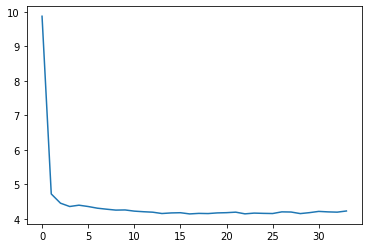

In [110]:
plt.plot(ls)

In [111]:
torch.save(model.state_dict(), 'ParticleTo8x8')

In [157]:
for epoch in range(Epochs):
    print(epoch)
    totalLoss = 0.0
    for i, data in enumerate(train_loader, 1):
        out = model(data)
        #print(x_hat[-1])
        print((out[0]-dataSet8[(i-1)*batch_size:i*batch_size])/dataSet8[(i-1)*batch_size:i*batch_size])
        loss = torch.sqrt( nn.MSELoss()(out,dataSet8[(i-1)*batch_size:i*batch_size]) )
        totalLoss += loss.item()
        print(i,loss)
    #break
    print(totalLoss)
    break

0
tensor([[ 0.0332,  0.0323,  0.0347,  ..., -0.0170, -0.0206, -0.0241],
        [ 0.0332,  0.0323,  0.0347,  ..., -0.0170, -0.0206, -0.0241],
        [ 0.0332,  0.0323,  0.0347,  ..., -0.0170, -0.0206, -0.0241],
        ...,
        [ 0.0336,  0.0341,  0.0364,  ..., -0.0053, -0.0163, -0.0265],
        [ 0.0336,  0.0341,  0.0364,  ..., -0.0053, -0.0163, -0.0265],
        [ 0.0336,  0.0341,  0.0364,  ..., -0.0053, -0.0163, -0.0265]],
       device='cuda:0', grad_fn=<DivBackward0>)
1 tensor(0.0135, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0330,  0.0335,  0.0358,  ..., -0.0047, -0.0158, -0.0262],
        [ 0.0330,  0.0335,  0.0358,  ..., -0.0047, -0.0158, -0.0262],
        [ 0.0330,  0.0335,  0.0358,  ..., -0.0047, -0.0158, -0.0262],
        ...,
        [ 0.0353,  0.0318,  0.0325,  ..., -0.0203, -0.0281, -0.0316],
        [ 0.0353,  0.0318,  0.0325,  ..., -0.0203, -0.0281, -0.0316],
        [ 0.0353,  0.0318,  0.0325,  ..., -0.0203, -0.0281, -0.0316]],
       device='cuda:0', 

tensor([[ 0.0144,  0.0007, -0.0141,  ...,  0.0015, -0.0104, -0.0234],
        [ 0.0150,  0.0009, -0.0135,  ..., -0.0003, -0.0129, -0.0254],
        [ 0.0150,  0.0009, -0.0135,  ..., -0.0003, -0.0129, -0.0254],
        ...,
        [ 0.0356,  0.0155, -0.0073,  ..., -0.0108, -0.0184, -0.0297],
        [ 0.0356,  0.0155, -0.0073,  ..., -0.0108, -0.0184, -0.0297],
        [ 0.0353,  0.0184, -0.0019,  ..., -0.0069, -0.0152, -0.0276]],
       device='cuda:0', grad_fn=<DivBackward0>)
36 tensor(0.0116, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0369,  0.0202,  0.0001,  ..., -0.0084, -0.0164, -0.0283],
        [ 0.0369,  0.0202,  0.0001,  ..., -0.0084, -0.0164, -0.0283],
        [ 0.0369,  0.0202,  0.0001,  ..., -0.0084, -0.0164, -0.0283],
        ...,
        [ 0.0510,  0.0401,  0.0224,  ..., -0.0139, -0.0125, -0.0111],
        [ 0.0510,  0.0401,  0.0224,  ..., -0.0139, -0.0125, -0.0111],
        [ 0.0510,  0.0401,  0.0224,  ..., -0.0139, -0.0125, -0.0111]],
       device='cuda:0', g

tensor([[ 0.0176,  0.0050, -0.0065,  ...,  0.0180,  0.0083, -0.0064],
        [ 0.0176,  0.0050, -0.0065,  ...,  0.0180,  0.0083, -0.0064],
        [ 0.0176,  0.0050, -0.0065,  ...,  0.0180,  0.0083, -0.0064],
        ...,
        [-0.0104, -0.0217, -0.0322,  ...,  0.0117, -0.0031, -0.0191],
        [-0.0086, -0.0184, -0.0288,  ...,  0.0104, -0.0029, -0.0168],
        [-0.0086, -0.0184, -0.0288,  ...,  0.0104, -0.0029, -0.0168]],
       device='cuda:0', grad_fn=<DivBackward0>)
74 tensor(0.0134, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[-0.0107, -0.0212, -0.0322,  ...,  0.0140, -0.0023, -0.0199],
        [-0.0107, -0.0212, -0.0322,  ...,  0.0140, -0.0023, -0.0199],
        [-0.0107, -0.0212, -0.0322,  ...,  0.0140, -0.0023, -0.0199],
        ...,
        [ 0.0074,  0.0009, -0.0101,  ...,  0.0191, -0.0054, -0.0306],
        [ 0.0074,  0.0009, -0.0101,  ...,  0.0191, -0.0054, -0.0306],
        [ 0.0074,  0.0009, -0.0101,  ...,  0.0191, -0.0054, -0.0306]],
       device='cuda:0', g

tensor([[ 0.0138,  0.0020, -0.0071,  ...,  0.0089, -0.0085, -0.0340],
        [ 0.0138,  0.0020, -0.0071,  ...,  0.0089, -0.0085, -0.0340],
        [ 0.0138,  0.0020, -0.0071,  ...,  0.0089, -0.0085, -0.0340],
        ...,
        [ 0.0228,  0.0145,  0.0083,  ..., -0.0001, -0.0164, -0.0388],
        [ 0.0228,  0.0145,  0.0083,  ..., -0.0001, -0.0164, -0.0388],
        [ 0.0228,  0.0145,  0.0083,  ..., -0.0001, -0.0164, -0.0388]],
       device='cuda:0', grad_fn=<DivBackward0>)
113 tensor(0.0102, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 2.7049e-02,  1.9125e-02,  1.2568e-02,  ..., -3.9512e-05,
         -1.6664e-02, -3.9565e-02],
        [ 2.7049e-02,  1.9125e-02,  1.2568e-02,  ..., -3.9512e-05,
         -1.6664e-02, -3.9565e-02],
        [ 2.7049e-02,  1.9125e-02,  1.2568e-02,  ..., -3.9512e-05,
         -1.6664e-02, -3.9565e-02],
        ...,
        [ 1.6881e-02,  1.1087e-02,  4.8431e-03,  ..., -4.5359e-03,
         -1.8355e-02, -3.4942e-02],
        [ 1.6881e-02,  1.1087e-02

tensor([[ 0.1333,  0.1105,  0.0770,  ..., -0.0219, -0.0396, -0.0564],
        [ 0.1333,  0.1105,  0.0770,  ..., -0.0219, -0.0396, -0.0564],
        [ 0.1333,  0.1105,  0.0770,  ..., -0.0219, -0.0396, -0.0564],
        ...,
        [ 0.0924,  0.0809,  0.0557,  ..., -0.0316, -0.0518, -0.0705],
        [ 0.0924,  0.0809,  0.0557,  ..., -0.0316, -0.0518, -0.0705],
        [ 0.0864,  0.0758,  0.0522,  ..., -0.0290, -0.0497, -0.0685]],
       device='cuda:0', grad_fn=<DivBackward0>)
152 tensor(0.0257, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0862,  0.0757,  0.0520,  ..., -0.0287, -0.0496, -0.0685],
        [ 0.0862,  0.0757,  0.0520,  ..., -0.0287, -0.0496, -0.0685],
        [ 0.0862,  0.0757,  0.0520,  ..., -0.0287, -0.0496, -0.0685],
        ...,
        [ 0.0799,  0.0709,  0.0480,  ..., -0.0221, -0.0444, -0.0637],
        [ 0.0799,  0.0709,  0.0480,  ..., -0.0221, -0.0444, -0.0637],
        [ 0.0822,  0.0684,  0.0422,  ..., -0.0204, -0.0451, -0.0676]],
       device='cuda:0', 

tensor([[-8.6270e-03, -5.7949e-03, -1.8718e-04,  ..., -5.2293e-02,
         -8.0256e-02, -1.0684e-01],
        [-1.1590e-02, -9.4717e-03, -3.2257e-03,  ..., -5.4591e-02,
         -8.1211e-02, -1.0603e-01],
        [-1.1590e-02, -9.4717e-03, -3.2257e-03,  ..., -5.4591e-02,
         -8.1211e-02, -1.0603e-01],
        ...,
        [-7.4945e-03, -7.6178e-03, -3.3035e-03,  ..., -4.1796e-02,
         -8.1288e-02, -1.2008e-01],
        [-7.4945e-03, -7.6178e-03, -3.3035e-03,  ..., -4.1796e-02,
         -8.1288e-02, -1.2008e-01],
        [-3.4430e-03, -4.1803e-03,  8.3344e-06,  ..., -4.5084e-02,
         -8.3979e-02, -1.2102e-01]], device='cuda:0', grad_fn=<DivBackward0>)
191 tensor(0.0162, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[-0.0051, -0.0063, -0.0025,  ..., -0.0434, -0.0826, -0.1200],
        [-0.0051, -0.0063, -0.0025,  ..., -0.0434, -0.0826, -0.1200],
        [-0.0082, -0.0106, -0.0077,  ..., -0.0419, -0.0791, -0.1142],
        ...,
        [-0.0174, -0.0165, -0.0092,  ..., -0

tensor([[ 0.0102,  0.0029, -0.0015,  ...,  0.0087, -0.0089, -0.0351],
        [ 0.0102,  0.0029, -0.0015,  ...,  0.0087, -0.0089, -0.0351],
        [ 0.0150,  0.0075,  0.0022,  ...,  0.0073, -0.0092, -0.0347],
        ...,
        [ 0.0138,  0.0084,  0.0049,  ..., -0.0152, -0.0317, -0.0520],
        [ 0.0138,  0.0084,  0.0049,  ..., -0.0152, -0.0317, -0.0520],
        [ 0.0138,  0.0084,  0.0049,  ..., -0.0152, -0.0317, -0.0520]],
       device='cuda:0', grad_fn=<DivBackward0>)
230 tensor(0.0101, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0133,  0.0080,  0.0045,  ..., -0.0150, -0.0315, -0.0521],
        [ 0.0133,  0.0080,  0.0045,  ..., -0.0150, -0.0315, -0.0521],
        [ 0.0133,  0.0080,  0.0045,  ..., -0.0150, -0.0315, -0.0521],
        ...,
        [ 0.0136,  0.0099,  0.0088,  ..., -0.0030, -0.0129, -0.0313],
        [ 0.0136,  0.0099,  0.0088,  ..., -0.0030, -0.0129, -0.0313],
        [ 0.0091,  0.0059,  0.0055,  ..., -0.0024, -0.0106, -0.0280]],
       device='cuda:0', 

tensor([[ 0.0925,  0.0761,  0.0607,  ..., -0.0092, -0.0218, -0.0365],
        [ 0.0925,  0.0783,  0.0636,  ..., -0.0079, -0.0191, -0.0317],
        [ 0.0925,  0.0783,  0.0636,  ..., -0.0079, -0.0191, -0.0317],
        ...,
        [ 0.0910,  0.0736,  0.0532,  ..., -0.0167, -0.0170, -0.0192],
        [ 0.0910,  0.0736,  0.0532,  ..., -0.0167, -0.0170, -0.0192],
        [ 0.0910,  0.0736,  0.0532,  ..., -0.0167, -0.0170, -0.0192]],
       device='cuda:0', grad_fn=<DivBackward0>)
269 tensor(0.0133, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0900,  0.0745,  0.0557,  ..., -0.0165, -0.0194, -0.0235],
        [ 0.0861,  0.0736,  0.0570,  ..., -0.0172, -0.0216, -0.0268],
        [ 0.0861,  0.0736,  0.0570,  ..., -0.0172, -0.0216, -0.0268],
        ...,
        [ 0.0775,  0.0656,  0.0520,  ..., -0.0322, -0.0377, -0.0455],
        [ 0.0775,  0.0656,  0.0520,  ..., -0.0322, -0.0377, -0.0455],
        [ 0.0777,  0.0686,  0.0570,  ..., -0.0299, -0.0358, -0.0449]],
       device='cuda:0', 

tensor([[ 0.0123, -0.0013, -0.0076,  ..., -0.0181, -0.0311, -0.0504],
        [ 0.0123, -0.0013, -0.0076,  ..., -0.0181, -0.0311, -0.0504],
        [ 0.0099, -0.0040, -0.0098,  ..., -0.0179, -0.0332, -0.0544],
        ...,
        [-0.0034, -0.0091, -0.0076,  ..., -0.0393, -0.0479, -0.0584],
        [-0.0024, -0.0072, -0.0051,  ..., -0.0386, -0.0478, -0.0589],
        [ 0.0088,  0.0036,  0.0036,  ..., -0.0389, -0.0470, -0.0577]],
       device='cuda:0', grad_fn=<DivBackward0>)
308 tensor(0.0110, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0062,  0.0012,  0.0022,  ..., -0.0423, -0.0491, -0.0579],
        [ 0.0062,  0.0012,  0.0022,  ..., -0.0423, -0.0491, -0.0579],
        [ 0.0062,  0.0012,  0.0022,  ..., -0.0423, -0.0491, -0.0579],
        ...,
        [ 0.0120,  0.0061,  0.0024,  ..., -0.0331, -0.0359, -0.0401],
        [ 0.0127,  0.0023, -0.0040,  ..., -0.0299, -0.0324, -0.0366],
        [ 0.0163,  0.0058, -0.0019,  ..., -0.0292, -0.0293, -0.0321]],
       device='cuda:0', 

tensor([[ 0.0460,  0.0400,  0.0348,  ..., -0.0073, -0.0273, -0.0522],
        [ 0.0460,  0.0400,  0.0348,  ..., -0.0073, -0.0273, -0.0522],
        [ 0.0491,  0.0431,  0.0375,  ..., -0.0085, -0.0265, -0.0497],
        ...,
        [ 0.0205,  0.0233,  0.0288,  ..., -0.0171, -0.0306, -0.0490],
        [ 0.0205,  0.0233,  0.0288,  ..., -0.0171, -0.0306, -0.0490],
        [ 0.0195,  0.0208,  0.0262,  ..., -0.0132, -0.0272, -0.0479]],
       device='cuda:0', grad_fn=<DivBackward0>)
347 tensor(0.0144, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0192,  0.0204,  0.0258,  ..., -0.0130, -0.0271, -0.0477],
        [ 0.0161,  0.0171,  0.0222,  ..., -0.0122, -0.0261, -0.0462],
        [ 0.0161,  0.0171,  0.0222,  ..., -0.0122, -0.0261, -0.0462],
        ...,
        [ 0.0147,  0.0194,  0.0265,  ..., -0.0331, -0.0503, -0.0713],
        [ 0.0147,  0.0194,  0.0265,  ..., -0.0331, -0.0503, -0.0713],
        [ 0.0169,  0.0200,  0.0262,  ..., -0.0347, -0.0537, -0.0762]],
       device='cuda:0', 

tensor([[ 0.0652,  0.0424,  0.0213,  ..., -0.0136, -0.0184, -0.0293],
        [ 0.0652,  0.0424,  0.0213,  ..., -0.0136, -0.0184, -0.0293],
        [ 0.0652,  0.0424,  0.0213,  ..., -0.0136, -0.0184, -0.0293],
        ...,
        [ 0.0572,  0.0460,  0.0360,  ..., -0.0168, -0.0282, -0.0465],
        [ 0.0572,  0.0460,  0.0360,  ..., -0.0168, -0.0282, -0.0465],
        [ 0.0539,  0.0417,  0.0315,  ..., -0.0190, -0.0293, -0.0453]],
       device='cuda:0', grad_fn=<DivBackward0>)
385 tensor(0.0122, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0562,  0.0425,  0.0318,  ..., -0.0185, -0.0284, -0.0448],
        [ 0.0562,  0.0425,  0.0318,  ..., -0.0185, -0.0284, -0.0448],
        [ 0.0562,  0.0425,  0.0318,  ..., -0.0185, -0.0284, -0.0448],
        ...,
        [ 0.0861,  0.0569,  0.0344,  ..., -0.0361, -0.0394, -0.0455],
        [ 0.0861,  0.0569,  0.0344,  ..., -0.0361, -0.0394, -0.0455],
        [ 0.0861,  0.0569,  0.0344,  ..., -0.0361, -0.0394, -0.0455]],
       device='cuda:0', 

423 tensor(0.0159, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0241,  0.0097, -0.0046,  ..., -0.0036, -0.0020, -0.0017],
        [ 0.0254,  0.0140,  0.0011,  ..., -0.0029, -0.0008, -0.0002],
        [ 0.0254,  0.0140,  0.0011,  ..., -0.0029, -0.0008, -0.0002],
        ...,
        [ 0.0336,  0.0189,  0.0014,  ..., -0.0166, -0.0035,  0.0152],
        [ 0.0336,  0.0189,  0.0014,  ..., -0.0166, -0.0035,  0.0152],
        [ 0.0336,  0.0189,  0.0014,  ..., -0.0166, -0.0035,  0.0152]],
       device='cuda:0', grad_fn=<DivBackward0>)
424 tensor(0.0146, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0340,  0.0189,  0.0014,  ..., -0.0171, -0.0039,  0.0153],
        [ 0.0340,  0.0189,  0.0014,  ..., -0.0171, -0.0039,  0.0153],
        [ 0.0364,  0.0209,  0.0027,  ..., -0.0151, -0.0004,  0.0202],
        ...,
        [ 0.0653,  0.0473,  0.0213,  ..., -0.0125, -0.0068,  0.0031],
        [ 0.0653,  0.0473,  0.0213,  ..., -0.0125, -0.0068,  0.0031],
        [ 0.0653,  0.0473,  0.0213,

tensor([[-0.0053,  0.0037,  0.0097,  ...,  0.0060, -0.0196, -0.0473],
        [-0.0053,  0.0037,  0.0097,  ...,  0.0060, -0.0196, -0.0473],
        [-0.0027,  0.0055,  0.0120,  ...,  0.0019, -0.0232, -0.0505],
        ...,
        [-0.0015,  0.0031,  0.0038,  ...,  0.0056, -0.0111, -0.0307],
        [-0.0015,  0.0031,  0.0038,  ...,  0.0056, -0.0111, -0.0307],
        [-0.0007,  0.0022,  0.0014,  ...,  0.0050, -0.0119, -0.0305]],
       device='cuda:0', grad_fn=<DivBackward0>)
462 tensor(0.0090, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[-0.0010,  0.0018,  0.0010,  ...,  0.0053, -0.0117, -0.0302],
        [-0.0010,  0.0018,  0.0010,  ...,  0.0053, -0.0117, -0.0302],
        [-0.0010,  0.0018,  0.0010,  ...,  0.0053, -0.0117, -0.0302],
        ...,
        [-0.0233, -0.0187, -0.0123,  ...,  0.0078, -0.0158, -0.0402],
        [-0.0254, -0.0183, -0.0101,  ...,  0.0070, -0.0179, -0.0428],
        [-0.0254, -0.0183, -0.0101,  ...,  0.0070, -0.0179, -0.0428]],
       device='cuda:0', 

tensor([[ 0.0089, -0.0013, -0.0088,  ..., -0.0087, -0.0394, -0.0706],
        [ 0.0089, -0.0013, -0.0088,  ..., -0.0087, -0.0394, -0.0706],
        [ 0.0089, -0.0013, -0.0088,  ..., -0.0087, -0.0394, -0.0706],
        ...,
        [ 0.0055, -0.0084, -0.0161,  ..., -0.0034, -0.0351, -0.0662],
        [ 0.0055, -0.0084, -0.0161,  ..., -0.0034, -0.0351, -0.0662],
        [ 0.0055, -0.0084, -0.0161,  ..., -0.0034, -0.0351, -0.0662]],
       device='cuda:0', grad_fn=<DivBackward0>)
501 tensor(0.0195, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0036, -0.0103, -0.0183,  ..., -0.0010, -0.0331, -0.0647],
        [ 0.0036, -0.0103, -0.0183,  ..., -0.0010, -0.0331, -0.0647],
        [-0.0012, -0.0121, -0.0181,  ..., -0.0020, -0.0347, -0.0666],
        ...,
        [-0.0087, -0.0150, -0.0201,  ..., -0.0133, -0.0460, -0.0724],
        [-0.0074, -0.0158, -0.0217,  ..., -0.0115, -0.0426, -0.0688],
        [-0.0074, -0.0158, -0.0217,  ..., -0.0115, -0.0426, -0.0688]],
       device='cuda:0', 

tensor([[0.0424, 0.0255, 0.0126,  ..., 0.0196, 0.0242, 0.0312],
        [0.0424, 0.0255, 0.0126,  ..., 0.0196, 0.0242, 0.0312],
        [0.0424, 0.0245, 0.0125,  ..., 0.0204, 0.0224, 0.0275],
        ...,
        [0.0264, 0.0168, 0.0119,  ..., 0.0258, 0.0250, 0.0283],
        [0.0207, 0.0139, 0.0110,  ..., 0.0291, 0.0291, 0.0326],
        [0.0207, 0.0139, 0.0110,  ..., 0.0291, 0.0291, 0.0326]],
       device='cuda:0', grad_fn=<DivBackward0>)
540 tensor(0.0164, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0174,  0.0104,  0.0069,  ...,  0.0331,  0.0324,  0.0346],
        [ 0.0174,  0.0104,  0.0069,  ...,  0.0331,  0.0324,  0.0346],
        [ 0.0172,  0.0115,  0.0091,  ...,  0.0325,  0.0312,  0.0318],
        ...,
        [ 0.0061,  0.0004, -0.0028,  ...,  0.0296,  0.0190,  0.0103],
        [ 0.0054,  0.0004, -0.0014,  ...,  0.0263,  0.0146,  0.0044],
        [ 0.0054,  0.0004, -0.0014,  ...,  0.0263,  0.0146,  0.0044]],
       device='cuda:0', grad_fn=<DivBackward0>)
541 tensor(0

tensor([[-0.0216, -0.0390, -0.0456,  ...,  0.0133, -0.0160, -0.0444],
        [-0.0216, -0.0389, -0.0464,  ...,  0.0144, -0.0163, -0.0449],
        [-0.0216, -0.0389, -0.0464,  ...,  0.0144, -0.0163, -0.0449],
        ...,
        [-0.0235, -0.0395, -0.0461,  ...,  0.0136, -0.0137, -0.0382],
        [-0.0235, -0.0395, -0.0461,  ...,  0.0136, -0.0137, -0.0382],
        [-0.0230, -0.0373, -0.0430,  ...,  0.0136, -0.0139, -0.0392]],
       device='cuda:0', grad_fn=<DivBackward0>)
579 tensor(0.0143, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[-0.0235, -0.0378, -0.0434,  ...,  0.0140, -0.0135, -0.0390],
        [-0.0235, -0.0378, -0.0434,  ...,  0.0140, -0.0135, -0.0390],
        [-0.0235, -0.0378, -0.0434,  ...,  0.0140, -0.0135, -0.0390],
        ...,
        [ 0.0078, -0.0098, -0.0274,  ...,  0.0121, -0.0083, -0.0271],
        [ 0.0099, -0.0072, -0.0248,  ...,  0.0077, -0.0108, -0.0271],
        [ 0.0099, -0.0072, -0.0248,  ...,  0.0077, -0.0108, -0.0271]],
       device='cuda:0', 

tensor([[ 1.3343e-02,  1.7234e-02,  2.1364e-02,  ..., -7.4684e-03,
         -9.8312e-04,  2.8289e-04],
        [ 1.3343e-02,  1.7234e-02,  2.1364e-02,  ..., -7.4684e-03,
         -9.8312e-04,  2.8289e-04],
        [ 1.3343e-02,  1.7234e-02,  2.1364e-02,  ..., -7.4684e-03,
         -9.8312e-04,  2.8289e-04],
        ...,
        [-4.7836e-03, -2.0114e-03,  8.5929e-03,  ..., -1.1165e-02,
         -3.7194e-03,  1.5760e-03],
        [-3.3587e-03, -1.2103e-03,  8.1116e-03,  ..., -1.1735e-02,
         -5.0873e-03,  8.9685e-05],
        [-3.3587e-03, -1.2103e-03,  8.1116e-03,  ..., -1.1735e-02,
         -5.0873e-03,  8.9685e-05]], device='cuda:0', grad_fn=<DivBackward0>)
618 tensor(0.0213, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[-3.1434e-03, -9.8721e-04,  8.3065e-03,  ..., -1.1838e-02,
         -5.1846e-03, -5.8837e-07],
        [-3.1434e-03, -9.8721e-04,  8.3065e-03,  ..., -1.1838e-02,
         -5.1846e-03, -5.8837e-07],
        [-3.1434e-03, -9.8721e-04,  8.3065e-03,  ..., -1.1838

tensor([[ 0.0057, -0.0002, -0.0052,  ..., -0.0016, -0.0089, -0.0083],
        [ 0.0069,  0.0003, -0.0056,  ..., -0.0047, -0.0121, -0.0102],
        [ 0.0069,  0.0003, -0.0056,  ..., -0.0047, -0.0121, -0.0102],
        ...,
        [ 0.0147,  0.0053, -0.0030,  ..., -0.0127, -0.0173, -0.0134],
        [ 0.0147,  0.0053, -0.0030,  ..., -0.0127, -0.0173, -0.0134],
        [ 0.0135,  0.0066, -0.0002,  ..., -0.0117, -0.0157, -0.0107]],
       device='cuda:0', grad_fn=<DivBackward0>)
657 tensor(0.0103, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0133,  0.0063, -0.0004,  ..., -0.0116, -0.0156, -0.0106],
        [ 0.0133,  0.0063, -0.0004,  ..., -0.0116, -0.0156, -0.0106],
        [ 0.0133,  0.0063, -0.0004,  ..., -0.0116, -0.0156, -0.0106],
        ...,
        [ 0.0194,  0.0235,  0.0207,  ..., -0.0196, -0.0281, -0.0278],
        [ 0.0194,  0.0235,  0.0207,  ..., -0.0196, -0.0281, -0.0278],
        [ 0.0194,  0.0235,  0.0207,  ..., -0.0196, -0.0281, -0.0278]],
       device='cuda:0', 

tensor([[ 0.0924,  0.0728,  0.0491,  ..., -0.0272, -0.0578, -0.0831],
        [ 0.0924,  0.0728,  0.0491,  ..., -0.0272, -0.0578, -0.0831],
        [ 0.0924,  0.0728,  0.0491,  ..., -0.0272, -0.0578, -0.0831],
        ...,
        [ 0.1012,  0.0833,  0.0572,  ..., -0.0388, -0.0754, -0.1046],
        [ 0.0953,  0.0784,  0.0539,  ..., -0.0370, -0.0750, -0.1045],
        [ 0.0953,  0.0784,  0.0539,  ..., -0.0370, -0.0750, -0.1045]],
       device='cuda:0', grad_fn=<DivBackward0>)
696 tensor(0.0329, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0913,  0.0764,  0.0536,  ..., -0.0377, -0.0742, -0.1016],
        [ 0.0913,  0.0764,  0.0536,  ..., -0.0377, -0.0742, -0.1016],
        [ 0.0956,  0.0789,  0.0545,  ..., -0.0422, -0.0793, -0.1074],
        ...,
        [ 0.0882,  0.0663,  0.0410,  ..., -0.0553, -0.0940, -0.1221],
        [ 0.0882,  0.0663,  0.0410,  ..., -0.0553, -0.0940, -0.1221],
        [ 0.0882,  0.0663,  0.0410,  ..., -0.0553, -0.0940, -0.1221]],
       device='cuda:0', 

In [8]:
import math

In [4]:
class Residual_Block(nn.Module):
    def __init__(self):
        super(Residual_Block, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1, bias=False)
        self.in1 = nn.InstanceNorm2d(64, affine=True)
        self.relu = nn.LeakyReLU(0.2, inplace=True)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1, bias=False)
        self.in2 = nn.InstanceNorm2d(64, affine=True)

    def forward(self, x):
        identity_data = x
        output = self.relu(self.in1(self.conv1(x)) )
        output = self.in2(self.conv2(output))
        output = torch.add(output,identity_data)
        return output


In [5]:
class NetG(nn.Module):
    def __init__(self):
        super(NetG, self).__init__()
        self.conv_input = nn.Conv2d(in_channels=1, out_channels=64, kernel_size=5, stride=1, padding=2, bias=False)
        self.relu = nn.LeakyReLU(0.2, inplace=True)
        self.residual = self.make_layer(Residual_Block, 18)
        self.conv_mid = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn_mid = nn.InstanceNorm2d(64, affine=True)

        self.upscale2x = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=256, kernel_size=3, stride=1, padding=1, bias=False),
            nn.PixelShuffle(2),
            nn.LeakyReLU(0.2, inplace=True),
        )

        self.conv_output = nn.Conv2d(in_channels=64, out_channels=1, kernel_size=5, stride=1, padding=2, bias= False)
        
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, math.sqrt(2. / n))
                if m.bias is not None:
                    m.bias.data.zero_()

    def make_layer(self, block, num_of_layer):
        layers = []
        for _ in range(num_of_layer):
            layers.append(block())
        return nn.Sequential(*layers)

    def forward(self, x):
        out = self.relu(self.conv_input(x))
        residual = out
        out = self.residual(out)
        #out= self.bn_mid(self.conv_mid(out))
        #print(out.shape)
        out = torch.add(out,residual)
        #print(out.shape)
        out = self.upscale2x(out)
        #print(out.shape)
        out = self.conv_output(out)
        return out
        return torch.relu(out)
        t = torch.softmax( torch.reshape(out,(out.shape[0],1,out.shape[2]*out.shape[2])), 2 )
        print(torch.reshape(out,(out.shape[0],out.shape[1],out.shape[2],out.shape[3])).shape )
        #print(torch.softmax( torch.flatten(out[:,:,]))
        return torch.reshape(out,(out.shape[0],out.shape[1],out.shape[2],out.shape[3]))
        return out

In [12]:
class NetD(nn.Module):
    def __init__(self):
        super(NetD, self).__init__()

        self.features = nn.Sequential(
        
            # input is (3) x 96 x 96
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, stride=1, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (64) x 96 x 96
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False),            
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (64) x 96 x 96
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1, bias=False),            
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (64) x 48 x 48
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (128) x 48 x 48
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (256) x 24 x 24
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (256) x 12 x 12
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=1, padding=1, bias=False),            
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (512) x 12 x 12
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False),            
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
        )

        self.LeakyReLU = nn.LeakyReLU(0.2, inplace=True)
        self.fc1 = nn.Linear(512 * 6 * 6, 1024)
        self.fc2 = nn.Linear(1024, 1)
        self.sigmoid = nn.Sigmoid()

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                m.weight.data.normal_(0.0, 0.02)
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.normal_(1.0, 0.02)
                m.bias.data.fill_(0)

    def forward(self, input):

        out = self.features(input)

        # state size. (512) x 6 x 6
        out = out.view(out.size(0), -1)

        # state size. (512 x 6 x 6)
        out = self.fc1(out)

        # state size. (1024)
        out = self.LeakyReLU(out)

        out = self.fc2(out)
        out = self.sigmoid(out)
        return out.view(-1, 1).squeeze(1)

In [13]:
def toDoubleTensor(model,data1, data2,batch_size):
    model = model.type('torch.DoubleTensor').to('cuda')
    data_loader = torch.utils.data.DataLoader(data1.unsqueeze(1).type('torch.DoubleTensor').to('cuda'), batch_size = batch_size)
    data2 = data2.type('torch.DoubleTensor').to('cuda')
    return [model,data_loader,data2]

In [14]:
model = NetG().type('torch.FloatTensor').to('cuda')

In [43]:
model = model.type('torch.DoubleTensor').to('cuda')

In [15]:
dataSet16 = dataSet16.type('torch.FloatTensor').to('cuda')

In [16]:
dataSet32 = torch.from_numpy(dataSet32).type('torch.FloatTensor').to('cuda').unsqueeze(1)

TypeError: expected np.ndarray (got Tensor)

In [17]:
batch_size = 100
epochs = 100

In [20]:
train_loader = torch.utils.data.DataLoader(dataSet16.unsqueeze(1).type('torch.FloatTensor').to('cuda'), batch_size=batch_size )

In [21]:
print(dataSet16.unsqueeze(1).type('torch.DoubleTensor').to('cuda').shape)

torch.Size([70000, 1, 16, 16])


In [73]:
dataSet32 = torch.from_numpy(dataSet32).type('torch.FloatTensor')

TypeError: expected np.ndarray (got Tensor)

In [41]:
dataSet32 = dataSet32.type('torch.DoubleTensor').to('cuda')

In [21]:
print(dataSet32.shape)

torch.Size([70000, 1, 32, 32])


In [19]:
dataSet32 = dataSet32.unsqueeze(1)

In [39]:
adOptimizer = optim.Adam(model.parameters(),lr =0.00001)

In [40]:
adOptimizer.to('cuda')

AttributeError: 'Adam' object has no attribute 'to'

In [27]:
tl = []

In [23]:
model.load_state_dict(torch.load("DenseEstimFullResNet16-32"))
model.eval()

NetG(
  (conv_input): Conv2d(1, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), bias=False)
  (relu): LeakyReLU(negative_slope=0.2, inplace=True)
  (residual): Sequential(
    (0): Residual_Block(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (in1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (relu): LeakyReLU(negative_slope=0.2, inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (in2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    )
    (1): Residual_Block(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (in1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (relu): LeakyReLU(negative_slope=0.2, inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)

In [45]:
for epoch in range(epochs):
    print("Epoch is " + str(epoch))
    if((epoch+1)%2 == 0):
        torch.save(model.state_dict(), 'DenseEstimFullResNet16-32')
    ELoss = 0.0
    for en, data in enumerate(train_loader,1):
        print(en)
        adOptimizer.zero_grad()
        out = model(data)
        #print(out)
        #print(dataSet32[(en-1)*batch_size:en*batch_size])
        loss = torch.sqrt( nn.MSELoss()(out,dataSet32[(en-1)*batch_size:en*batch_size]) )
        loss.backward()
        #print(out)
        print(math.isnan(loss.item()), math.isinf(loss.item()))
        print(loss.item())
        ELoss += loss.item()
        if(math.isnan(loss.item()) or math.isinf(loss.item())):
            break
        
        adOptimizer.step()
        #print(out[0]-dataSet32[0])
    if(math.isnan(ELoss) or math.isinf(ELoss)):
            break
        
    print(ELoss)
    tl.append(ELoss)

Epoch is 0
1
False False
0.010130373761057854
2
False False
0.008227415382862091
3
False False
0.008479657582938671
4
False False
0.00869062077254057
5
False False
0.009016037918627262
6
False False
0.008533311076462269
7
False False
0.00851504597812891
8
False False
0.007973100990056992
9
False False
0.00788938719779253
10
False False
0.008178896270692348
11
False False
0.00770961120724678
12
False False
0.008120490238070488
13
False False
0.007108865771442652
14
False False
0.007803524844348431
15
False False
0.007722440175712109
16
False False
0.007627086713910103
17
False False
0.007336821872740984
18
False False
0.007006011437624693
19
False False
0.00665988028049469
20
False False
0.006866101641207933
21
False False
0.007391204591840506
22
False False
0.006881455425173044
23
False False
0.007265045773237944
24
False False
0.0068403687328100204
25
False False
0.006787254940718412
26
False False
0.0068304212763905525
27
False False
0.0069595868699252605
28
False False
0.00708091584

227
False False
0.0074934219010174274
228
False False
0.0071665323339402676
229
False False
0.006891518831253052
230
False False
0.007007591426372528
231
False False
0.0063618882559239864
232
False False
0.006186051294207573
233
False False
0.006485085468739271
234
False False
0.006822704803198576
235
False False
0.007132857572287321
236
False False
0.007200005929917097
237
False False
0.006584504619240761
238
False False
0.006897527724504471
239
False False
0.006829952355474234
240
False False
0.006855820305645466
241
False False
0.007170683238655329
242
False False
0.00701550068333745
243
False False
0.007339701987802982
244
False False
0.008893013000488281
245
False False
0.007501260843127966
246
False False
0.007471101824194193
247
False False
0.007565474137663841
248
False False
0.0072669219225645065
249
False False
0.007786381524056196
250
False False
0.007503109518438578
251
False False
0.006849119905382395
252
False False
0.008045274764299393
253
False False
0.00875543802976608

False False
0.008323456160724163
450
False False
0.008570040576159954
451
False False
0.008417856879532337
452
False False
0.008291838690638542
453
False False
0.007543569430708885
454
False False
0.007259409409016371
455
False False
0.00728492671623826
456
False False
0.007362883538007736
457
False False
0.0072336262091994286
458
False False
0.0072539555840194225
459
False False
0.007186496164649725
460
False False
0.007226891350001097
461
False False
0.007432691752910614
462
False False
0.007181327324360609
463
False False
0.007548618130385876
464
False False
0.0072278291918337345
465
False False
0.007346760015934706
466
False False
0.007959205657243729
467
False False
0.008582563139498234
468
False False
0.00831083208322525
469
False False
0.0077452207915484905
470
False False
0.007580847013741732
471
False False
0.00718663539737463
472
False False
0.007742979098111391
473
False False
0.008580447174608707
474
False False
0.008930345065891743
475
False False
0.008078706450760365
476


False False
0.007145248353481293
672
False False
0.006761645898222923
673
False False
0.007508843205869198
674
False False
0.007456816267222166
675
False False
0.006939483806490898
676
False False
0.0070531340315938
677
False False
0.006823090836405754
678
False False
0.006742181722074747
679
False False
0.007158742286264896
680
False False
0.007034990005195141
681
False False
0.007128086406737566
682
False False
0.006637635175138712
683
False False
0.0066421255469322205
684
False False
0.007364987395703793
685
False False
0.00669015571475029
686
False False
0.007056743372231722
687
False False
0.006552376784384251
688
False False
0.006021162029355764
689
False False
0.006797415670007467
690
False False
0.006856987252831459
691
False False
0.0069882431998848915
692
False False
0.007397638168185949
693
False False
0.007475057616829872
694
False False
0.007584462407976389
695
False False
0.007379004266113043
696
False False
0.007024502381682396
697
False False
0.008568761870265007
698
Fa

False False
0.008241284638643265
196
False False
0.007918480783700943
197
False False
0.008003141731023788
198
False False
0.007164065260440111
199
False False
0.007298924960196018
200
False False
0.007288194727152586
201
False False
0.00651628477498889
202
False False
0.006741056684404612
203
False False
0.007739364635199308
204
False False
0.0076729715801775455
205
False False
0.007747170981019735
206
False False
0.00806957297027111
207
False False
0.006972350180149078
208
False False
0.008133347146213055
209
False False
0.00885754730552435
210
False False
0.008722148835659027
211
False False
0.00846447329968214
212
False False
0.008327223360538483
213
False False
0.008295711129903793
214
False False
0.007856379263103008
215
False False
0.008648831397294998
216
False False
0.009221953339874744
217
False False
0.009420959278941154
218
False False
0.008714289404451847
219
False False
0.008594990707933903
220
False False
0.008201811462640762
221
False False
0.008451418951153755
222
Fals

False False
0.008477588184177876
420
False False
0.0077868178486824036
421
False False
0.008391167037189007
422
False False
0.008039750158786774
423
False False
0.0076238010078668594
424
False False
0.008085567504167557
425
False False
0.00832561869174242
426
False False
0.007738363463431597
427
False False
0.007162217982113361
428
False False
0.007095765322446823
429
False False
0.007335621863603592
430
False False
0.007526738569140434
431
False False
0.008343739435076714
432
False False
0.00797639973461628
433
False False
0.007668607402592897
434
False False
0.007966308854520321
435
False False
0.007737615145742893
436
False False
0.007295140065252781
437
False False
0.007090794388204813
438
False False
0.007073818240314722
439
False False
0.006744958460330963
440
False False
0.0070611340925097466
441
False False
0.006979025434702635
442
False False
0.007286089472472668
443
False False
0.007373569067567587
444
False False
0.00804347824305296
445
False False
0.007774036377668381
446
F

False False
0.008294055238366127
643
False False
0.0086207902058959
644
False False
0.00828925147652626
645
False False
0.008013303391635418
646
False False
0.008077037520706654
647
False False
0.007848083972930908
648
False False
0.00841344054788351
649
False False
0.008371883071959019
650
False False
0.008223878219723701
651
False False
0.007872032932937145
652
False False
0.007705550640821457
653
False False
0.008442392572760582
654
False False
0.00833981391042471
655
False False
0.008240646682679653
656
False False
0.007629530504345894
657
False False
0.007576521020382643
658
False False
0.007791364565491676
659
False False
0.00793992169201374
660
False False
0.007768860552459955
661
False False
0.007316542789340019
662
False False
0.00736837787553668
663
False False
0.007860499434173107
664
False False
0.008038832806050777
665
False False
0.007274345960468054
666
False False
0.0077688670717179775
667
False False
0.006970374844968319
668
False False
0.007445367053151131
669
False F

False False
0.008036567829549313
168
False False
0.008522761054337025
169
False False
0.009299059398472309
170
False False
0.008877398446202278
171
False False
0.008228220045566559
172
False False
0.008270541206002235
173
False False
0.008849622681736946
174
False False
0.009194418787956238
175
False False
0.008516165427863598
176
False False
0.008398119360208511
177
False False
0.008409063331782818
178
False False
0.008442807011306286
179
False False
0.008806421421468258
180
False False
0.008693025447428226
181
False False
0.008494351990520954
182
False False
0.007365746423602104
183
False False
0.0074571301229298115
184
False False
0.007506413850933313
185
False False
0.007244352716952562
186
False False
0.007031707558780909
187
False False
0.0069085583090782166
188
False False
0.007253649644553661
189
False False
0.007480979431420565
190
False False
0.00768421683460474
191
False False
0.007808359805494547
192
False False
0.007502393797039986
193
False False
0.007586132735013962
194


KeyboardInterrupt: 

In [43]:
test_loader =  torch.utils.data.DataLoader(dataSet8.unsqueeze(1).type('torch.FloatTensor').to('cuda')[70000:], batch_size=batch_size )

NameError: name 'dataSet8' is not defined

In [46]:
print(tl)

[11.471554830670357, 10.872279188595712, 10.444101568311453, 10.115021716803312, 9.756550691090524, 9.629613969475031, 9.44274131488055, 9.268849444575608, 9.116700011305511, 8.972818036563694, 8.839977895841002, 8.62057286221534, 8.578547253273427, 8.462702451273799, 8.360727451741695, 8.271073604002595, 8.164939997717738, 8.086449164897203, 7.995968974195421, 7.9217315493151546, 7.842998287640512, 7.775537244044244, 7.703508952632546, 7.636219541542232, 7.5656763492152095, 7.501458069309592, 7.441949797794223, 7.380652948282659, 7.325888183899224, 7.263978432863951, 7.2084418991580606, 7.157546806149185, 7.112995330709964, 7.057833256199956, 7.009858699515462, 6.962063287850469, 6.92064055101946, 6.872051017358899, 6.826999354176223, 6.794545688200742, 6.745394240599126, 6.703035869635642, 6.657647045329213, 6.610534843057394, 6.571137374266982, 6.609700149856508, 6.489080111961812, 6.455003056675196, 6.413057064637542, 6.375545321498066, 6.351983278524131, 6.314850255846977, 6.28171

In [32]:
for epoch in range(epochs):
    print("Epoch is " + str(epoch))
    ELoss = 0.0
    for en, data in enumerate(test_loader,1):
        print(en)
        #print(data.shape)
        #adOptimizer.zero_grad()
        out = model(data)
        print(out.size())
        #print(dataSet32[(en-1)*batch_size:en*batch_size])
        #print(out)
        loss = torch.sqrt( nn.MSELoss()(out,dataSet16[70000+(en-1)*batch_size:70000+en*batch_size]) )
        print((out[0]- dataSet16[70000+(en-1)*batch_size:70000+en*batch_size][0])/dataSet16[70000+(en-1)*batch_size:70000+en*batch_size][0]) 
        #loss.backward()
        #print(out)
        print(math.isnan(loss.item()), math.isinf(loss.item()))
        print(loss.item())
        
        ELoss += loss.item()
        if(math.isnan(loss.item()) or math.isinf(loss.item())):
            break
        #adOptimizer.step()
        #print(out[0]-dataSet32[0])
    if(math.isnan(ELoss) or math.isinf(ELoss)):
            break
    print(ELoss)
   

Epoch is 0


NameError: name 'test_loader' is not defined

In [27]:
class combineModel(nn.Module):
    def __init__(self,model1,model2,model3):
        super(combineModel,self).__init__()
        self.model1 = model1
        self.model2 = model2
        self.model3 = model3
    
    def forward(self,inp):
        out = self.model1(inp)
        out = torch.reshape(out,(out.shape[0],1,8,8))
        out = self.model2(out)
        out = self.model3(out)
        return out
        

In [28]:
def train(model, Optimizer, epochs, batch_size, train_loader, dataLabel):
    Eloss = []
    for Epoch in epochs:
        print(Epoch)
        total_loss = 0.0
        for i,data in enumerate(train_loader,1):
            print(i)
            Optimizer.zero_grad()
            out = model(data)
            loss = myLoss(out, dataLabel[(i-1)*batch_size:i*batch_size])
            print(loss.item())
            loss.backward()
            Optimizer.step()
            total_loss +=loss.item()
        print(total_loss)
        Eloss.append(total_loss)
    return Eloss

In [29]:
def validate(model,batch_size,inputData,dataLabel):
    test_loader = torch.utils.data.DataLoader(inputData, batch_size=batch_size)
    totalLoss = 0.0
    for i, data in enumerate(test_loader, 1):
        print(i,data.shape)
        out = model(data)
        print(out.shape)
        Loss = nn.MSELoss()(out,dataLabel)
        totalLoss += Loss
        
    return totalLoss

In [30]:
model1 = DensityEstimator(4,64).type('torch.FloatTensor').to('cuda')
model2 = NetG().type('torch.FloatTensor').to('cuda')


In [31]:
model3 = NetG().type('torch.FloatTensor').to('cuda')

In [32]:
inputData = torch.from_numpy(train_set[:70000,:4]).type('torch.FloatTensor').to('cuda')
dataSet32 = torch.from_numpy( np.load('DataSet32.npy')[:70000] ).type('torch.FloatTensor').to('cuda')

NameError: name 'train_set' is not defined

In [ ]:
model1.load_state_dict(torch.load("ParticleTo8x8"))
model1.eval()

In [ ]:
model2.load_state_dict(torch.load("DenseEstimResNet8-16"))
model2.eval()

In [ ]:
model3.load_state_dict(torch.load("DenseEstimResNet"))
model3.eval()

In [ ]:
CombineModel = combineModel(model1,model2,model3)

In [114]:
validate(CombineModel,100, inputData, dataSet32)

1 torch.Size([100, 4])
torch.Size([100, 1, 38, 38])


RuntimeError: The size of tensor a (38) must match the size of tensor b (32) at non-singleton dimension 3

In [58]:
test_loader = torch.utils.data.DataLoader(inputData, batch_size=batch_size)
totalLoss = 0.0
for i, data in enumerate(test_loader, 1):
    out = model1(data)
    out = torch.reshape(out,(out.shape[0],1,8,8))
    out = model2(out)
    out = model3(out)

tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8673e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8671e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8673e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8673e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad

KeyboardInterrupt: 